# Restaurant visitors forecasting (Kaggle competition)

## Author: Cleilton Carlos

### Description

On this project, the Kaggle Competition named "Recruit Restaurant Visitor Forecasting: Predict how many future visitors a restaurant will receive" will be investigate. On the site competition (https://www.kaggle.com/c/recruit-restaurant-visitor-forecasting) there are the datasets that are going to be explored on this lab. Below, it is presented a brief description of the competition:

One common predicament is that restaurants need to know how many customers to expect each day to effectively purchase ingredients and schedule staff members. This forecast isn't easy to make because many unpredictable factors affect restaurant attendance, like weather and local competition. It's even harder for newer restaurants with little historical data.

Recruit Holdings has unique access to key datasets that could make automated future customer prediction possible. Specifically, Recruit Holdings owns Hot Pepper Gourmet (a restaurant review service), AirREGI (a restaurant point of sales service), and Restaurant Board (reservation log management software).

In this competition, you're challenged to use reservation and visitation data to predict the total number of visitors to a restaurant for future dates. This information will help restaurants be much more efficient and allow them to focus on creating an enjoyable dining experience for their customers.

### Libraries Import

In [1]:
import pandas as pd
import numpy as np
import matplotlib

import matplotlib.pyplot as plt
from scipy.stats import skew
from scipy.stats.stats import pearsonr
%matplotlib inline


### Data loading

In [2]:
#Loading the CSV files into variables
air_reserve_csv = pd.read_csv("../Data/air_reserve.csv")
hpg_reserve_csv = pd.read_csv("../Data/hpg_reserve.csv")
air_store_info_csv = pd.read_csv("../Data/air_store_info.csv")
hpg_store_info_csv = pd.read_csv("../Data/hpg_store_info.csv")
air_visit_data_csv = pd.read_csv("../Data/air_visit_data.csv")
store_id_relation_csv = pd.read_csv("../Data/store_id_relation.csv")
date_info_csv = pd.read_csv("../Data/date_info.csv")
sample_submission_csv = pd.read_csv("../Data/sample_submission.csv")

#### First look on the variables

In [3]:
air_reserve_csv.head()

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1
1,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3
2,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,6
3,air_877f79706adbfb06,2016-01-01 20:00:00,2016-01-01 16:00:00,2
4,air_db80363d35f10926,2016-01-01 20:00:00,2016-01-01 01:00:00,5


In [4]:
hpg_reserve_csv.head()

,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,hpg_c63f6f42e088e50f,2016-01-01 11:00:00,2016-01-01 09:00:00,1
1,hpg_dac72789163a3f47,2016-01-01 13:00:00,2016-01-01 06:00:00,3
2,hpg_c8e24dcf51ca1eb5,2016-01-01 16:00:00,2016-01-01 14:00:00,2
3,hpg_24bb207e5fd49d4a,2016-01-01 17:00:00,2016-01-01 11:00:00,5
4,hpg_25291c542ebb3bc2,2016-01-01 17:00:00,2016-01-01 03:00:00,13


In [5]:
air_store_info_csv.head()

,air_store_id,air_genre_name,air_area_name,latitude,longitude
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
2,air_fee8dcf4d619598e,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
3,air_a17f0778617c76e2,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
4,air_83db5aff8f50478e,Italian/French,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599


In [6]:
hpg_store_info_csv.head()

,hpg_store_id,hpg_genre_name,hpg_area_name,latitude,longitude
0,hpg_6622b62385aec8bf,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
1,hpg_e9e068dd49c5fa00,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
2,hpg_2976f7acb4b3a3bc,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
3,hpg_e51a522e098f024c,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
4,hpg_e3d0e1519894f275,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221


In [7]:
air_visit_data_csv.head()

,air_store_id,visit_date,visitors
0,air_ba937bf13d40fb24,2016-01-13,25
1,air_ba937bf13d40fb24,2016-01-14,32
2,air_ba937bf13d40fb24,2016-01-15,29
3,air_ba937bf13d40fb24,2016-01-16,22
4,air_ba937bf13d40fb24,2016-01-18,6


In [8]:
store_id_relation_csv.head()

,air_store_id,hpg_store_id
0,air_63b13c56b7201bd9,hpg_4bc649e72e2a239a
1,air_a24bf50c3e90d583,hpg_c34b496d0305a809
2,air_c7f78b4f3cba33ff,hpg_cd8ae0d9bbd58ff9
3,air_947eb2cae4f3e8f2,hpg_de24ea49dc25d6b8
4,air_965b2e0cf4119003,hpg_653238a84804d8e7


In [9]:
date_info_csv.head()

,calendar_date,day_of_week,holiday_flg
0,2016-01-01,Friday,1
1,2016-01-02,Saturday,1
2,2016-01-03,Sunday,1
3,2016-01-04,Monday,0
4,2016-01-05,Tuesday,0


In [10]:
sample_submission_csv.head()

,id,visitors
0,air_00a91d42b08b08d9_2017-04-23,0
1,air_00a91d42b08b08d9_2017-04-24,0
2,air_00a91d42b08b08d9_2017-04-25,0
3,air_00a91d42b08b08d9_2017-04-26,0
4,air_00a91d42b08b08d9_2017-04-27,0


#### Checking if there is any field with null values

In [11]:
print (air_reserve_csv.isnull().sum().sum())
print (hpg_reserve_csv.isnull().sum().sum())
print (air_store_info_csv.isnull().sum().sum())
print (hpg_store_info_csv.isnull().sum().sum())
print (air_visit_data_csv.isnull().sum().sum())
print (store_id_relation_csv.isnull().sum().sum())
print (date_info_csv.isnull().sum().sum())

0
0
0
0
0
0
0


#### Exploring Reservations on AirREGI / Restaurant Board (Air)

In [13]:
air_store_info_csv.air_store_id.describe()

count                      829
unique                     829
top       air_91236b89d29567af
freq                         1
Name: air_store_id, dtype: object

In [14]:
air_store_info_csv.air_area_name.describe()

count                                829
unique                               103
top       Fukuoka-ken Fukuoka-shi Daimyō
freq                                  64
Name: air_area_name, dtype: object

In [15]:
air_store_info_csv.air_genre_name.describe()

count         829
unique         14
top       Izakaya
freq          197
Name: air_genre_name, dtype: object

#### Exploring Reservation on Hot Pepper Gourmet (HPG):

In [1489]:
hpg_store_info_csv.hpg_store_id.describe()

count                     4690
unique                    4690
top       hpg_54d3a3f3f5ccb2e7
freq                         1
Name: hpg_store_id, dtype: object

In [17]:
hpg_store_info_csv.hpg_area_name.describe()

count                          4690
unique                          119
top       Tōkyō-to Shinjuku-ku None
freq                            257
Name: hpg_area_name, dtype: object

In [18]:
hpg_store_info_csv.hpg_genre_name.describe()

count               4690
unique                34
top       Japanese style
freq                1750
Name: hpg_genre_name, dtype: object

#### Exploring restaurant informations on Air and HPG datasets

In [19]:
hpg_rest_copy = hpg_store_info_csv.copy()

air_rest_copy = air_store_info_csv.copy()

store_rest_copy = store_id_relation_csv.copy()

Below it is shows that HPG has information about 4690 restaurants

In [21]:
hpg_rest_copy.hpg_store_id.describe()

count                     4690
unique                    4690
top       hpg_54d3a3f3f5ccb2e7
freq                         1
Name: hpg_store_id, dtype: object

Below it is shows that there is 150 restaurants that are in both bases (HPG and Air)

In [22]:
store_rest_copy.head()

,air_store_id,hpg_store_id
0,air_63b13c56b7201bd9,hpg_4bc649e72e2a239a
1,air_a24bf50c3e90d583,hpg_c34b496d0305a809
2,air_c7f78b4f3cba33ff,hpg_cd8ae0d9bbd58ff9
3,air_947eb2cae4f3e8f2,hpg_de24ea49dc25d6b8
4,air_965b2e0cf4119003,hpg_653238a84804d8e7


In [23]:
store_rest_copy.count()

air_store_id    150
hpg_store_id    150
dtype: int64

In [24]:
store_rest_copy.air_store_id.describe()

count                      150
unique                     150
top       air_de88770300008624
freq                         1
Name: air_store_id, dtype: object

Below it is shows that Air Dataset has information about 829 restaurants

In [32]:
air_rest_copy.air_store_id.describe()

count                      829
unique                     829
top       air_91236b89d29567af
freq                         1
Name: air_store_id, dtype: object

### 1. Air information about reservation

In [37]:
air_reserve_copy = air_reserve_csv.copy()

air_reserve_copy.head()

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1
1,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3
2,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,6
3,air_877f79706adbfb06,2016-01-01 20:00:00,2016-01-01 16:00:00,2
4,air_db80363d35f10926,2016-01-01 20:00:00,2016-01-01 01:00:00,5


In [39]:
#Extracting information about the date
air_reserve_copy['just_date'] = air_reserve_copy.visit_datetime.str[0:10]

In [40]:
air_reserve_copy.head()

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors,just_date
0,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1,2016-01-01
1,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3,2016-01-01
2,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,6,2016-01-01
3,air_877f79706adbfb06,2016-01-01 20:00:00,2016-01-01 16:00:00,2,2016-01-01
4,air_db80363d35f10926,2016-01-01 20:00:00,2016-01-01 01:00:00,5,2016-01-01


In [41]:
#Checking that there are 92378 reservations and that these reservations are for 314 different restaurants
air_reserve_copy.air_store_id.describe()

count                    92378
unique                     314
top       air_8093d0b565e9dbdf
freq                      2263
Name: air_store_id, dtype: object

In [42]:
#Grouping reserves by date and restaurant
air_reserve_copy = air_reserve_copy.groupby(['just_date', 'air_store_id'], as_index=False)
air_reserve_copy_final = air_reserve_copy.aggregate(np.sum)

In [43]:
#After grouping, 29830 reservations are presented for the same total of 314 
#(repetitions for the same restaurant and date are grouped)
air_reserve_copy_final.air_store_id.describe()

count                    29830
unique                     314
top       air_326ca454ef3558bc
freq                       335
Name: air_store_id, dtype: object

#### Joining the Air database information about reservations with information about real number of visitors per day

In [47]:
air_visit_copy = air_visit_data_csv.copy()

air_visit_copy['just_date'] = air_visit_copy.visit_date.str[0:10]

In [48]:
air_visit_copy.count()

air_store_id    252108
visit_date      252108
visitors        252108
just_date       252108
dtype: int64

In [46]:
air_reserve_copy_final.air_store_id.describe()

count                    29830
unique                     314
top       air_326ca454ef3558bc
freq                       335
Name: air_store_id, dtype: object

In [49]:
#Informations about reservation on Air Database and real number of visits per day in restaurants are merged 
air_reserve_copy_final_merged = pd.merge(air_reserve_copy_final, air_visit_copy, on=['air_store_id', 'just_date'])

In [50]:
air_reserve_copy_final_merged.head()

,just_date,air_store_id,reserve_visitors,visit_date,visitors
0,2016-01-01,air_877f79706adbfb06,3,2016-01-01,3
1,2016-01-01,air_db4b38ebe7a7ceff,9,2016-01-01,21
2,2016-01-01,air_db80363d35f10926,5,2016-01-01,8
3,2016-01-02,air_2b8b29ddfd35018e,6,2016-01-02,28
4,2016-01-02,air_3bb99a1fe0583897,4,2016-01-02,39


In [51]:
air_reserve_copy_final_merged.count()

just_date           28064
air_store_id        28064
reserve_visitors    28064
visit_date          28064
visitors            28064
dtype: int64

#### Applying weekend information on 'air_reserve_copy_fina_merged'

In [52]:
#Colecting information about date from 'data_info.csv'
date_info_copy = date_info_csv.copy()

date_info_copy['just_date'] = date_info_copy.calendar_date.str[0:10]

In [53]:
#Merging 'air_reserve_copy_fina_merged' and 'date_info_copy'
air_reserve_copy_final_merged_with_weekdays = pd.merge(air_reserve_copy_final_merged, date_info_copy, on='just_date')

In [54]:
air_reserve_copy_final_merged_with_weekdays.head()

,just_date,air_store_id,reserve_visitors,visit_date,visitors,calendar_date,day_of_week,holiday_flg
0,2016-01-01,air_877f79706adbfb06,3,2016-01-01,3,2016-01-01,Friday,1
1,2016-01-01,air_db4b38ebe7a7ceff,9,2016-01-01,21,2016-01-01,Friday,1
2,2016-01-01,air_db80363d35f10926,5,2016-01-01,8,2016-01-01,Friday,1
3,2016-01-02,air_2b8b29ddfd35018e,6,2016-01-02,28,2016-01-02,Saturday,1
4,2016-01-02,air_3bb99a1fe0583897,4,2016-01-02,39,2016-01-02,Saturday,1


In [55]:
air_reserve_copy_final_merged_with_weekdays['day_of_week'] = air_reserve_copy_final_merged_with_weekdays.day_of_week.str

In [56]:
air_reserve_copy_final_merged_with_weekdays['weekday_flg'] = pd.to_datetime(air_reserve_copy_final_merged_with_weekdays.just_date)

In [57]:
air_reserve_copy_final_merged_with_weekdays['weekday_flg'] = air_reserve_copy_final_merged_with_weekdays.weekday_flg.dt.dayofweek

In [58]:
air_reserve_copy_final_merged_with_weekdays['weekday_flg'] = air_reserve_copy_final_merged_with_weekdays['weekday_flg'].astype(int)

In [60]:
#Setting weekend flag
air_reserve_copy_final_merged_with_weekdays['weekend'] = ((air_reserve_copy_final_merged_with_weekdays['weekday_flg']) // 5 == 1).astype(float)

In [61]:
air_reserve_copy_final_merged_with_weekdays.loc[1:10]

,just_date,air_store_id,reserve_visitors,visit_date,visitors,calendar_date,day_of_week,holiday_flg,weekday_flg,weekend
1,2016-01-01,air_db4b38ebe7a7ceff,9,2016-01-01,21,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0
2,2016-01-01,air_db80363d35f10926,5,2016-01-01,8,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0
3,2016-01-02,air_2b8b29ddfd35018e,6,2016-01-02,28,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0
4,2016-01-02,air_3bb99a1fe0583897,4,2016-01-02,39,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0
5,2016-01-02,air_6b15edd1b4fbb96a,11,2016-01-02,96,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0
6,2016-01-02,air_789466e488705c93,67,2016-01-02,68,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0
7,2016-01-02,air_877f79706adbfb06,4,2016-01-02,12,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0
8,2016-01-02,air_db80363d35f10926,34,2016-01-02,94,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0
9,2016-01-02,air_f690c42545146e0a,2,2016-01-02,2,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0
10,2016-01-03,air_326ca454ef3558bc,11,2016-01-03,65,2016-01-03,<pandas.core.strings.StringMethods object at 0...,1,6,1.0


### First Ridge Model 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000000A1E11D0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x000000000C20ECC0>]], dtype=object)

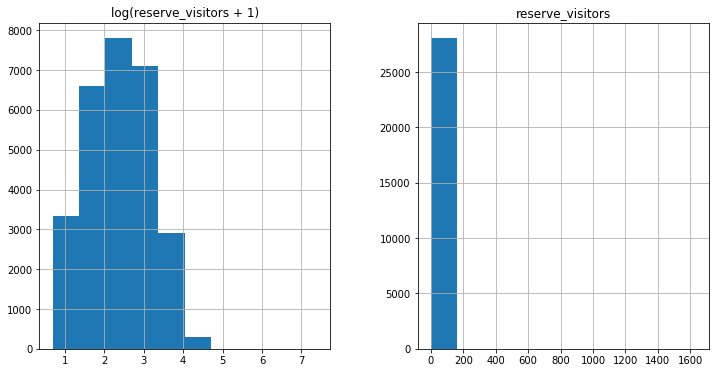

In [62]:
#Applying a logaritmic transformation on the attribute "reserve_visitors" on "air_reserve_copy_final_merged_with_weekdays"
matplotlib.rcParams['figure.figsize'] = (12.0, 6.0)
reserves = pd.DataFrame({"reserve_visitors":air_reserve_copy_final_merged_with_weekdays["reserve_visitors"], "log(reserve_visitors + 1)":np.log1p(air_reserve_copy_final_merged_with_weekdays["reserve_visitors"])})
#prices = pd.DataFrame({"reserve_visitors":air_reserve_copy_final_merged_with_weekdays["reserve_visitors"]})
reserves.hist()

Below it is setting the first model with these parameters:

- Dependent variable: "visitors"
- Independent variable: "reserve_visitors", "holiday_flg" and "weekend"
- Cross validation with 2 folds
- Ridge Regression

In [63]:
#Independent variable: "visitors"
#Dependent variable: "reserve_visitors", "holiday_flg" and "weekend"
y = air_reserve_copy_final_merged_with_weekdays.visitors

X_train = pd.DataFrame({"reserve_visitors":np.log1p(air_reserve_copy_final_merged_with_weekdays["reserve_visitors"] + 1), "holiday_flg":air_reserve_copy_final_merged_with_weekdays["holiday_flg"], "weekend":air_reserve_copy_final_merged_with_weekdays["weekend"]})


In [64]:
#Using cross validation with 2 folds
from sklearn.model_selection import cross_val_score

def rmse_cv(model):
    rmse= np.sqrt(-cross_val_score(model, X_train, y, scoring="neg_mean_squared_log_error", cv = 2))
    return(rmse)

In [65]:
from sklearn.linear_model import Ridge, RidgeCV

alphas = [0.00001,0.0001,0.001,0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75, 100, 125, 200]
cv_ridge = [rmse_cv(Ridge(alpha = alpha)).mean() 
            for alpha in alphas]

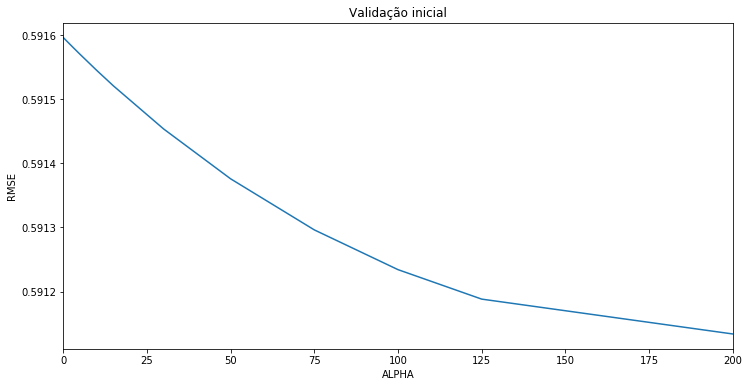

In [66]:
cv_ridge = pd.Series(cv_ridge, index = alphas)
cv_ridge.plot(title = "Validação inicial")
plt.xlabel("ALPHA")
plt.ylabel("RMSE")

On the first model Ridge, it is found a mean RMSE of 0.5914

In [67]:
cv_ridge.mean()

0.59147448957710169

### First Lasso Model

In [68]:
from sklearn.linear_model import LassoCV, LassoLarsCV

model_lasso = LassoCV(alphas = [0.00001,0.0001,0.001,0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75, 100, 125, 200]).fit(X_train, y)

On the first model Lasso, it is found a mean RMSE of 0.5915

In [69]:
rmse_cv(model_lasso).mean()

0.591596336982539

In [70]:
coef = pd.Series(model_lasso.coef_, index = X_train.columns)
print("O modelo Lasso escolheu " + str(sum(coef != 0)) + " atributos e eliminou os outros " +  str(sum(coef == 0)) + " atributos do dataset para construção do modelo.")

O modelo Lasso escolheu 3 atributos e eliminou os outros 0 atributos do dataset para construção do modelo.


In [71]:
imp_coef = pd.concat([coef.sort_values().head(1),
                     coef.sort_values().tail(2)])

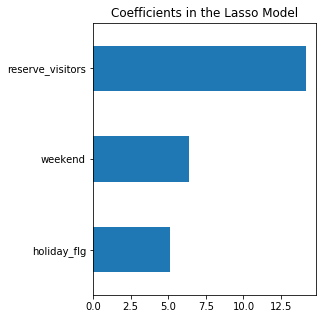

In [72]:
matplotlib.rcParams['figure.figsize'] = (4.0, 5.0)
imp_coef.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")

### 2. Air and HPG information about reservation

On the previous models were used information about reservations on the Air database only. Now it is going to be checked reservations information from both datasets (HPG and Air).

####  Merging Air and HPG database

In [73]:
air_reserve_copy_added_origin = air_reserve_copy_final_merged_with_weekdays.copy()
air_reserve_copy_added_origin['from_air_database'] = 1
air_reserve_copy_added_origin['from_hpg_database'] = 0
air_reserve_copy_added_origin.head()

,just_date,air_store_id,reserve_visitors,visit_date,visitors,calendar_date,day_of_week,holiday_flg,weekday_flg,weekend,from_air_database,from_hpg_database
0,2016-01-01,air_877f79706adbfb06,3,2016-01-01,3,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
1,2016-01-01,air_db4b38ebe7a7ceff,9,2016-01-01,21,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
2,2016-01-01,air_db80363d35f10926,5,2016-01-01,8,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
3,2016-01-02,air_2b8b29ddfd35018e,6,2016-01-02,28,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0,1,0
4,2016-01-02,air_3bb99a1fe0583897,4,2016-01-02,39,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0,1,0


In [74]:
hpg_reserve_copy = hpg_reserve_csv.copy()

hpg_reserve_copy.head()

,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,hpg_c63f6f42e088e50f,2016-01-01 11:00:00,2016-01-01 09:00:00,1
1,hpg_dac72789163a3f47,2016-01-01 13:00:00,2016-01-01 06:00:00,3
2,hpg_c8e24dcf51ca1eb5,2016-01-01 16:00:00,2016-01-01 14:00:00,2
3,hpg_24bb207e5fd49d4a,2016-01-01 17:00:00,2016-01-01 11:00:00,5
4,hpg_25291c542ebb3bc2,2016-01-01 17:00:00,2016-01-01 03:00:00,13


In [88]:
hpg_reserve_copy_merged_initial = pd.merge(hpg_reserve_copy, store_rest_copy, on='hpg_store_id')

In [89]:
hpg_reserve_copy_merged_initial.count()

hpg_store_id        28183
visit_datetime      28183
reserve_datetime    28183
reserve_visitors    28183
air_store_id        28183
dtype: int64

In [90]:
hpg_reserve_copy_merged_initial.head()

,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors,air_store_id
0,hpg_878cc70b1abc76f7,2016-01-01 19:00:00,2016-01-01 15:00:00,4,air_db80363d35f10926
1,hpg_878cc70b1abc76f7,2016-01-02 19:00:00,2016-01-02 14:00:00,2,air_db80363d35f10926
2,hpg_878cc70b1abc76f7,2016-01-03 18:00:00,2016-01-02 20:00:00,6,air_db80363d35f10926
3,hpg_878cc70b1abc76f7,2016-01-06 20:00:00,2016-01-04 22:00:00,3,air_db80363d35f10926
4,hpg_878cc70b1abc76f7,2016-01-11 18:00:00,2016-01-11 14:00:00,2,air_db80363d35f10926


In [92]:
hpg_reserve_copy_merged_initial.visit_datetime.dtypes

hpg_reserve_copy_merged_initial['just_date'] = hpg_reserve_copy_merged_initial.visit_datetime.str[0:10]



In [93]:
hpg_reserve_copy_merged_initial.tail()

,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors,air_store_id,just_date
28178,hpg_0f78ef8d1e4b23d8,2017-04-01 21:00:00,2017-03-10 20:00:00,2,air_84f6876ff7e83ae7,2017-04-01
28179,hpg_0f78ef8d1e4b23d8,2017-04-02 17:00:00,2017-04-02 14:00:00,2,air_84f6876ff7e83ae7,2017-04-02
28180,hpg_0f78ef8d1e4b23d8,2017-04-08 19:00:00,2017-04-03 12:00:00,3,air_84f6876ff7e83ae7,2017-04-08
28181,hpg_0f78ef8d1e4b23d8,2017-04-08 20:00:00,2017-03-09 07:00:00,4,air_84f6876ff7e83ae7,2017-04-08
28182,hpg_0f78ef8d1e4b23d8,2017-04-28 18:00:00,2017-04-10 22:00:00,5,air_84f6876ff7e83ae7,2017-04-28


In [94]:
hpg_reserve_copy_merged_initial = hpg_reserve_copy_merged_initial.groupby(['just_date', 'air_store_id'], as_index=False)

In [95]:
hpg_reserve_copy_merged_final = hpg_reserve_copy_merged_initial.aggregate(np.sum)

In [97]:
hpg_reserve_copy_merged_final.count()

just_date           18620
air_store_id        18620
reserve_visitors    18620
dtype: int64

In [104]:
hpg_reserve_copy_merged_final.air_store_id.describe()
#IMPORTANT: just 150 restaurants are presented, because the merge with the dataset 'store_id_relation', limits the results 
#of the ones thathave a correspondent to air restaurants dataset

count                    18620
unique                     150
top       air_4c727b55acdee495
freq                       315
Name: air_store_id, dtype: object

In [107]:
#Including information about real number of visitors per day on the HPG reservation database 
hpg_reserve_copy_merged_final_with_visits = pd.merge(hpg_reserve_copy_merged_final, air_visit_copy, on=['air_store_id', 'just_date'])

Before the merge, it was presented 18620 entries about reservation on the HPG dataset. After the merge, just 13550 entries are presented.

In [108]:
hpg_reserve_copy_merged_final_with_visits.count()

just_date           13550
air_store_id        13550
reserve_visitors    13550
visit_date          13550
visitors            13550
dtype: int64

In [109]:
hpg_reserve_copy_merged_final_with_visits.head()

,just_date,air_store_id,reserve_visitors,visit_date,visitors
0,2016-01-01,air_db80363d35f10926,4,2016-01-01,8
1,2016-01-02,air_6b15edd1b4fbb96a,9,2016-01-02,96
2,2016-01-02,air_db80363d35f10926,2,2016-01-02,94
3,2016-01-03,air_37189c92b6c761ec,4,2016-01-03,132
4,2016-01-03,air_6c91a28278a16f64,4,2016-01-03,24


In [110]:
#Applying weekday

In [111]:
date_info_copy.head()

,calendar_date,day_of_week,holiday_flg,just_date
0,2016-01-01,Friday,1,2016-01-01
1,2016-01-02,Saturday,1,2016-01-02
2,2016-01-03,Sunday,1,2016-01-03
3,2016-01-04,Monday,0,2016-01-04
4,2016-01-05,Tuesday,0,2016-01-05


In [1491]:
#Including information about dates
hpg_reserve_copy_merged_final_with_weekdays = pd.merge(hpg_reserve_copy_merged_final_with_visits, date_info_copy, on='just_date')

In [1492]:
hpg_reserve_copy_merged_final_with_weekdays.head()

,just_date,air_store_id,reserve_visitors,visit_date,visitors,calendar_date,day_of_week,holiday_flg
0,2016-01-01,air_db80363d35f10926,4,2016-01-01,8,2016-01-01,Friday,1
1,2016-01-02,air_6b15edd1b4fbb96a,9,2016-01-02,96,2016-01-02,Saturday,1
2,2016-01-02,air_db80363d35f10926,2,2016-01-02,94,2016-01-02,Saturday,1
3,2016-01-03,air_37189c92b6c761ec,4,2016-01-03,132,2016-01-03,Sunday,1
4,2016-01-03,air_6c91a28278a16f64,4,2016-01-03,24,2016-01-03,Sunday,1


In [1493]:
hpg_reserve_copy_merged_final_with_weekdays['day_of_week'] =hpg_reserve_copy_merged_final_with_weekdays.day_of_week.str

hpg_reserve_copy_merged_final_with_weekdays['weekday_flg'] = pd.to_datetime(hpg_reserve_copy_merged_final_with_weekdays.just_date)

hpg_reserve_copy_merged_final_with_weekdays['weekday_flg'] = hpg_reserve_copy_merged_final_with_weekdays.weekday_flg.dt.dayofweek

hpg_reserve_copy_merged_final_with_weekdays['weekday_flg'] = hpg_reserve_copy_merged_final_with_weekdays['weekday_flg'].astype(int)

In [1494]:
#Including information about if it is a weekend on the date of reservation visit
hpg_reserve_copy_merged_final_with_weekdays['weekend'] = ((hpg_reserve_copy_merged_final_with_weekdays['weekday_flg']) // 5 == 1).astype(float)

In [116]:
#Applying flag to identify origin of the reservations

hpg_reserve_copy_merged_final_with_weekdays['from_air_database'] = 0
hpg_reserve_copy_merged_final_with_weekdays['from_hpg_database'] = 1

In [117]:
hpg_reserve_copy_merged_final_with_weekdays.count()

just_date            13550
air_store_id         13550
reserve_visitors     13550
visit_date           13550
visitors             13550
calendar_date        13550
day_of_week          13550
holiday_flg          13550
weekday_flg          13550
weekend              13550
from_air_database    13550
from_hpg_database    13550
dtype: int64

In [118]:
hpg_reserve_copy_merged_final_with_weekdays.air_store_id.describe()

count                    13550
unique                     150
top       air_6b15edd1b4fbb96a
freq                       280
Name: air_store_id, dtype: object

In [119]:
hpg_reserve_copy_merged_final_with_weekdays.head()

,just_date,air_store_id,reserve_visitors,visit_date,visitors,calendar_date,day_of_week,holiday_flg,weekday_flg,weekend,from_air_database,from_hpg_database
0,2016-01-01,air_db80363d35f10926,4,2016-01-01,8,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,0,1
1,2016-01-02,air_6b15edd1b4fbb96a,9,2016-01-02,96,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0,0,1
2,2016-01-02,air_db80363d35f10926,2,2016-01-02,94,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0,0,1
3,2016-01-03,air_37189c92b6c761ec,4,2016-01-03,132,2016-01-03,<pandas.core.strings.StringMethods object at 0...,1,6,1.0,0,1
4,2016-01-03,air_6c91a28278a16f64,4,2016-01-03,24,2016-01-03,<pandas.core.strings.StringMethods object at 0...,1,6,1.0,0,1


In [120]:
air_reserve_copy_added_origin.count()

just_date            28064
air_store_id         28064
reserve_visitors     28064
visit_date           28064
visitors             28064
calendar_date        28064
day_of_week          28064
holiday_flg          28064
weekday_flg          28064
weekend              28064
from_air_database    28064
from_hpg_database    28064
dtype: int64

In [121]:
air_reserve_copy_added_origin.air_store_id.describe()

count                    28064
unique                     312
top       air_326ca454ef3558bc
freq                       319
Name: air_store_id, dtype: object

In [122]:
air_reserve_copy_added_origin.head()

,just_date,air_store_id,reserve_visitors,visit_date,visitors,calendar_date,day_of_week,holiday_flg,weekday_flg,weekend,from_air_database,from_hpg_database
0,2016-01-01,air_877f79706adbfb06,3,2016-01-01,3,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
1,2016-01-01,air_db4b38ebe7a7ceff,9,2016-01-01,21,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
2,2016-01-01,air_db80363d35f10926,5,2016-01-01,8,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
3,2016-01-02,air_2b8b29ddfd35018e,6,2016-01-02,28,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0,1,0
4,2016-01-02,air_3bb99a1fe0583897,4,2016-01-02,39,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0,1,0


In [123]:
#Joining air_reserve_copy_added_origin and hpg_reserve_copy_merged_final_with_weekdays

In [124]:
reserves_air_hpg = air_reserve_copy_added_origin.copy()

In [125]:
reserves_air_hpg_final = reserves_air_hpg.append(hpg_reserve_copy_merged_final_with_weekdays)

In [126]:
reserves_air_hpg_final.count()

just_date            41614
air_store_id         41614
reserve_visitors     41614
visit_date           41614
visitors             41614
calendar_date        41614
day_of_week          41614
holiday_flg          41614
weekday_flg          41614
weekend              41614
from_air_database    41614
from_hpg_database    41614
dtype: int64

In [127]:
reserves_air_hpg_final.air_store_id.describe()
#IMPORTANT: Just 331 restaurants has reservation related to the datasets Air and HPG
#On the sample submission it is related 821 restaurants to predict how many visitors are going to them.
#On the dataset "air_visit_data.csv" records of visitation of 829 restaurants are made

count                    41614
unique                     331
top       air_6b15edd1b4fbb96a
freq                       554
Name: air_store_id, dtype: object

In [128]:
reserves_air_hpg_final.tail()

,just_date,air_store_id,reserve_visitors,visit_date,visitors,calendar_date,day_of_week,holiday_flg,weekday_flg,weekend,from_air_database,from_hpg_database
13545,2017-04-22,air_f690c42545146e0a,6,2017-04-22,12,2017-04-22,<pandas.core.strings.StringMethods object at 0...,0,5,1.0,0,1
13546,2017-04-22,air_f96765e800907c77,6,2017-04-22,12,2017-04-22,<pandas.core.strings.StringMethods object at 0...,0,5,1.0,0,1
13547,2017-04-22,air_fcfbdcf7b1f82c6e,3,2017-04-22,47,2017-04-22,<pandas.core.strings.StringMethods object at 0...,0,5,1.0,0,1
13548,2017-04-22,air_fe22ef5a9cbef123,4,2017-04-22,22,2017-04-22,<pandas.core.strings.StringMethods object at 0...,0,5,1.0,0,1
13549,2017-04-22,air_fea5dc9594450608,2,2017-04-22,14,2017-04-22,<pandas.core.strings.StringMethods object at 0...,0,5,1.0,0,1


### Second  Ridge Model

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000000BC45A90>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x000000000DE316D8>]], dtype=object)

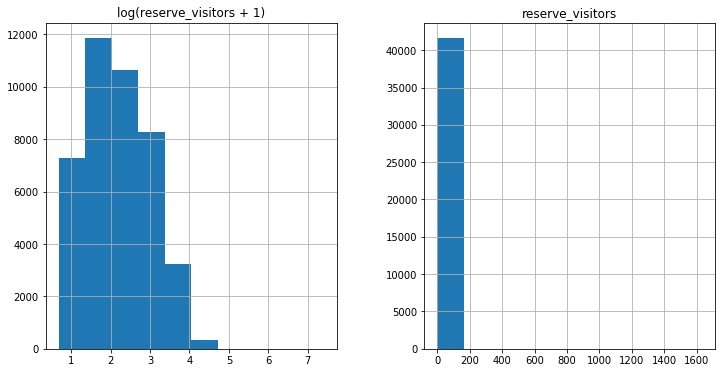

In [129]:
matplotlib.rcParams['figure.figsize'] = (12.0, 6.0)
prices = pd.DataFrame({"reserve_visitors":reserves_air_hpg_final["reserve_visitors"], "log(reserve_visitors + 1)":np.log1p(reserves_air_hpg_final["reserve_visitors"])})
#prices = pd.DataFrame({"reserve_visitors":air_reserve_copy_final_merged_with_weekdays["reserve_visitors"]})
prices.hist()

Below it is setting the second Ridge model with these parameters:

- Dependent variable: "visitors"
- Independent variable: "reserve_visitors", "holiday_flg", "weekend", "from_air_database" and "from_hpg_database"
- Cross validation with 2 folds
- Ridge Regression



In [130]:
y = reserves_air_hpg_final.visitors

X_train = pd.DataFrame({"reserve_visitors":np.log1p(reserves_air_hpg_final["reserve_visitors"] + 1), "holiday_flg":reserves_air_hpg_final["holiday_flg"], "weekend":reserves_air_hpg_final["weekend"], "from_air_database":reserves_air_hpg_final["from_air_database"], "from_hpg_database":reserves_air_hpg_final["from_hpg_database"]})


In [131]:
from sklearn.model_selection import cross_val_score

def rmse_cv(model):
    rmse= np.sqrt(-cross_val_score(model, X_train, y, scoring="neg_mean_squared_log_error", cv = 2))
    return(rmse)

In [132]:
alphas = [0.00001,0.0001,0.001,0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75, 100, 125, 200]
cv_ridge = [rmse_cv(Ridge(alpha = alpha)).mean() 
            for alpha in alphas]


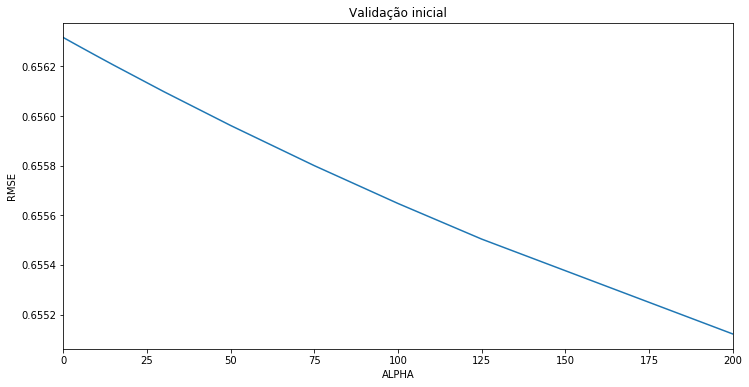

In [133]:
cv_ridge = pd.Series(cv_ridge, index = alphas)
cv_ridge.plot(title = "Validação inicial")
plt.xlabel("ALPHA")
plt.ylabel("RMSE")

On the second model Ridge, it is found a mean RMSE of 0.6560. Is is higher but it includes more information about the reservations once that it includes de HPG database.

In [134]:
cv_ridge.mean()

0.65607981655436975

### Second  Lasso Model

In [135]:
from sklearn.linear_model import LassoCV, LassoLarsCV

model_lasso = LassoCV(alphas = [0.00001,0.0001,0.001,0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75, 100, 125, 200]).fit(X_train, y)

On the second model Lasso, it is found a mean RMSE of 0.6563.

In [136]:
rmse_cv(model_lasso).mean()

0.65631642360511366

In [137]:
coef = pd.Series(model_lasso.coef_, index = X_train.columns)
print("O modelo Lasso escolheu " + str(sum(coef != 0)) + " atributos e eliminou os outros " +  str(sum(coef == 0)) + " atributos do dataset para construção do modelo.")


O modelo Lasso escolheu 4 atributos e eliminou os outros 1 atributos do dataset para construção do modelo.


In [138]:
imp_coef = pd.concat([coef.sort_values().head(2),
                     coef.sort_values().tail(3)])

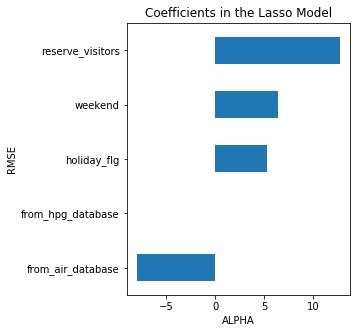

In [139]:
matplotlib.rcParams['figure.figsize'] = (4.0, 5.0)
imp_coef.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")
plt.xlabel("ALPHA")
plt.ylabel("RMSE")

### 3. Exploing real visit data

The variable 'air_visit_copy' has information about the real number of visitors on restaurants. It uses the attribute 'air_store_id' as an id for which restaurant it is refering to. As we can see, some entries of 'air_visit_copy' are missed once that it was merged with Air and HPG reservations info. This section is bring out theses entries.

In [140]:
air_visit_copy.head()

,air_store_id,visit_date,visitors,just_date
0,air_ba937bf13d40fb24,2016-01-13,25,2016-01-13
1,air_ba937bf13d40fb24,2016-01-14,32,2016-01-14
2,air_ba937bf13d40fb24,2016-01-15,29,2016-01-15
3,air_ba937bf13d40fb24,2016-01-16,22,2016-01-16
4,air_ba937bf13d40fb24,2016-01-18,6,2016-01-18


In [141]:
reserves_air_hpg_final.head()

,just_date,air_store_id,reserve_visitors,visit_date,visitors,calendar_date,day_of_week,holiday_flg,weekday_flg,weekend,from_air_database,from_hpg_database
0,2016-01-01,air_877f79706adbfb06,3,2016-01-01,3,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
1,2016-01-01,air_db4b38ebe7a7ceff,9,2016-01-01,21,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
2,2016-01-01,air_db80363d35f10926,5,2016-01-01,8,2016-01-01,<pandas.core.strings.StringMethods object at 0...,1,4,0.0,1,0
3,2016-01-02,air_2b8b29ddfd35018e,6,2016-01-02,28,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0,1,0
4,2016-01-02,air_3bb99a1fe0583897,4,2016-01-02,39,2016-01-02,<pandas.core.strings.StringMethods object at 0...,1,5,1.0,1,0


In [142]:
air_visit_transformation = air_visit_copy.copy()

In [143]:
air_visit_transformation['reserve_visitors'] = 0

#'air_visit_transformation_merged' is a variable prepared to be append to reserves_air_hpg_final_grouped_by_final
air_visit_transformation_merged = pd.merge(air_visit_transformation, date_info_copy, on='just_date')

air_visit_transformation_merged['day_of_week'] = air_visit_transformation_merged.day_of_week.str

air_visit_transformation_merged['weekday_flg'] = pd.to_datetime(air_visit_transformation_merged.just_date)

air_visit_transformation_merged['weekday_flg'] = air_visit_transformation_merged.weekday_flg.dt.dayofweek

air_visit_transformation_merged['weekday_flg'] = air_visit_transformation_merged['weekday_flg'].astype(int)

air_visit_transformation_merged['weekend'] = ((air_visit_transformation_merged['weekday_flg']) // 5 == 1).astype(float)

air_visit_transformation_merged['from_air_database'] = 0

air_visit_transformation_merged['from_hpg_database'] = 0

air_visit_transformation_merged['no_reservation'] = 1

air_visit_transformation_merged.count()


air_store_id         252108
visit_date           252108
visitors             252108
just_date            252108
reserve_visitors     252108
calendar_date        252108
day_of_week          252108
holiday_flg          252108
weekday_flg          252108
weekend              252108
from_air_database    252108
from_hpg_database    252108
no_reservation       252108
dtype: int64

In [144]:
air_visit_transformation_merged.head()

,air_store_id,visit_date,visitors,just_date,reserve_visitors,calendar_date,day_of_week,holiday_flg,weekday_flg,weekend,from_air_database,from_hpg_database,no_reservation
0,air_ba937bf13d40fb24,2016-01-13,25,2016-01-13,0,2016-01-13,<pandas.core.strings.StringMethods object at 0...,0,2,0.0,0,0,1
1,air_25e9888d30b386df,2016-01-13,21,2016-01-13,0,2016-01-13,<pandas.core.strings.StringMethods object at 0...,0,2,0.0,0,0,1
2,air_fd6aac1043520e83,2016-01-13,40,2016-01-13,0,2016-01-13,<pandas.core.strings.StringMethods object at 0...,0,2,0.0,0,0,1
3,air_64d4491ad8cdb1c6,2016-01-13,5,2016-01-13,0,2016-01-13,<pandas.core.strings.StringMethods object at 0...,0,2,0.0,0,0,1
4,air_ee3a01f0c71a769f,2016-01-13,18,2016-01-13,0,2016-01-13,<pandas.core.strings.StringMethods object at 0...,0,2,0.0,0,0,1


In [145]:
reserves_air_hpg_final_inclusion_flags = reserves_air_hpg_final.copy()

In [146]:
reserves_air_hpg_final_inclusion_flags['no_reservation'] = 0

reserves_air_hpg_final_inclusion_flags.count()

just_date            41614
air_store_id         41614
reserve_visitors     41614
visit_date           41614
visitors             41614
calendar_date        41614
day_of_week          41614
holiday_flg          41614
weekday_flg          41614
weekend              41614
from_air_database    41614
from_hpg_database    41614
no_reservation       41614
dtype: int64

In [147]:
reserves_air_hpg_final_grouped_by = reserves_air_hpg_final_inclusion_flags.groupby(['just_date', 'air_store_id'], as_index=False)

reserves_air_hpg_final_grouped_by_final = reserves_air_hpg_final_grouped_by.aggregate(np.sum)

In [148]:
reserves_air_hpg_final_grouped_by_final.head()

,just_date,air_store_id,reserve_visitors,visitors,holiday_flg,weekday_flg,weekend,from_air_database,from_hpg_database,no_reservation
0,2016-01-01,air_877f79706adbfb06,3,3,1,4,0.0,1,0,0
1,2016-01-01,air_db4b38ebe7a7ceff,9,21,1,4,0.0,1,0,0
2,2016-01-01,air_db80363d35f10926,9,16,2,8,0.0,1,1,0
3,2016-01-02,air_2b8b29ddfd35018e,6,28,1,5,1.0,1,0,0
4,2016-01-02,air_3bb99a1fe0583897,4,39,1,5,1.0,1,0,0


In [149]:
reserves_air_hpg_final_grouped_by_final.holiday_flg.replace(2, 1, inplace=True)

In [150]:
reserves_air_hpg_final_grouped_by_final.weekend.replace(2, 1, inplace=True)

In [151]:
reserves_air_hpg_final_grouped_by_final.visitors =  reserves_air_hpg_final_grouped_by_final.visitors/(reserves_air_hpg_final_grouped_by_final.from_air_database + reserves_air_hpg_final_grouped_by_final.from_hpg_database)

#reserves_air_hpg_final_grouped_by_final['holiday_flg'] = lambda x: 1 if x == 2 else x

In [153]:
air_visit_transformation_merged.drop('visit_date', axis=1, inplace=True)

In [154]:
air_visit_transformation_merged.drop('day_of_week', axis=1, inplace=True)

In [155]:
air_visit_transformation_merged.drop('calendar_date', axis=1, inplace=True)

In [156]:
#'visits_and_reserves_merged' include all real visits entries but is has repetitions
visits_and_reserves_merged = reserves_air_hpg_final_grouped_by_final.append(air_visit_transformation_merged)

In [157]:
visits_and_reserves_merged.count()

air_store_id         287806
from_air_database    287806
from_hpg_database    287806
holiday_flg          287806
just_date            287806
no_reservation       287806
reserve_visitors     287806
visitors             287806
weekday_flg          287806
weekend              287806
dtype: int64

In [158]:
#Removing duplicates
visits_and_reserves_merged_final = visits_and_reserves_merged.drop_duplicates(subset=['just_date', 'air_store_id'], keep='first')

Now, the variable used for the regression model are going to have 252108 entries. The higher that we coult achieve on this project. Theses entries come from merges of Date information, Reservations (Air and HPG) and Real visitors information. Up to this point no consideration about weather is made.

In [159]:
visits_and_reserves_merged_final.count()

air_store_id         252108
from_air_database    252108
from_hpg_database    252108
holiday_flg          252108
just_date            252108
no_reservation       252108
reserve_visitors     252108
visitors             252108
weekday_flg          252108
weekend              252108
dtype: int64

In [160]:
visits_and_reserves_merged_final.air_store_id.describe()

count                   252108
unique                     829
top       air_5c817ef28f236bdf
freq                       477
Name: air_store_id, dtype: object

In [161]:
visits_and_reserves_merged_final.tail()

,air_store_id,from_air_database,from_hpg_database,holiday_flg,just_date,no_reservation,reserve_visitors,visitors,weekday_flg,weekend
252103,air_dfad598ff642dab7,0,0,1,2016-01-02,1,0,25.0,5,1.0
252104,air_db4b38ebe7a7ceff,0,0,1,2016-01-02,1,0,9.0,5,1.0
252105,air_232dcee6f7c51d37,0,0,1,2016-01-02,1,0,9.0,5,1.0
252106,air_3b6438b125086430,0,0,1,2016-01-02,1,0,8.0,5,1.0
252107,air_506fe758114df773,0,0,1,2016-01-02,1,0,15.0,5,1.0


### Third Ridge Model

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000000D3E1400>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x000000000DFBE6A0>]], dtype=object)

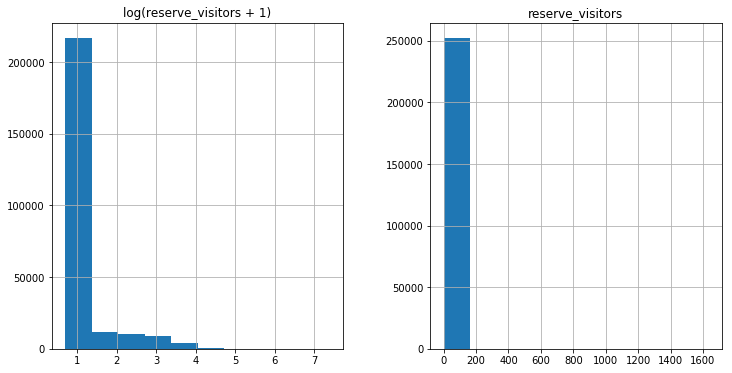

In [162]:
matplotlib.rcParams['figure.figsize'] = (12.0, 6.0)
prices = pd.DataFrame({"reserve_visitors":visits_and_reserves_merged_final["reserve_visitors"], "log(reserve_visitors + 1)":np.log1p(visits_and_reserves_merged_final["reserve_visitors"] + 1)})
#prices = pd.DataFrame({"reserve_visitors":air_reserve_copy_final_merged_with_weekdays["reserve_visitors"]})
prices.hist()

Below it is setting the third model with these parameters:

- Dependent variable: "visitors"
- Independent variable: "reserve_visitors", "holiday_flg" and "weekend"
- Cross validation with 2 folds
- Ridge Regression


In [163]:
y = visits_and_reserves_merged_final.visitors

#X_train = pd.DataFrame({"reserve_visitors":visits_and_reserves_merged_final["reserve_visitors"], "holiday_flg":visits_and_reserves_merged_final["holiday_flg"], "weekend":visits_and_reserves_merged_final["weekend"], "from_air_database":visits_and_reserves_merged_final["from_air_database"], "from_hpg_database":visits_and_reserves_merged_final["from_hpg_database"], "no_reservation":visits_and_reserves_merged_final["no_reservation"]})

X_train = pd.DataFrame({"reserve_visitors":np.log1p(visits_and_reserves_merged_final["reserve_visitors"] + 1), "holiday_flg":visits_and_reserves_merged_final["holiday_flg"], "weekend":visits_and_reserves_merged_final["weekend"]})


In [165]:
from sklearn.model_selection import cross_val_score

def rmse_cv(model):
    rmse= np.sqrt(-cross_val_score(model, X_train, y, scoring="neg_mean_squared_log_error", cv = 2))
    return(rmse)


In [166]:
alphas = [0.00001,0.0001,0.001,0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75, 100, 125, 200]
cv_ridge = [rmse_cv(Ridge(alpha = alpha)).mean() 
            for alpha in alphas]


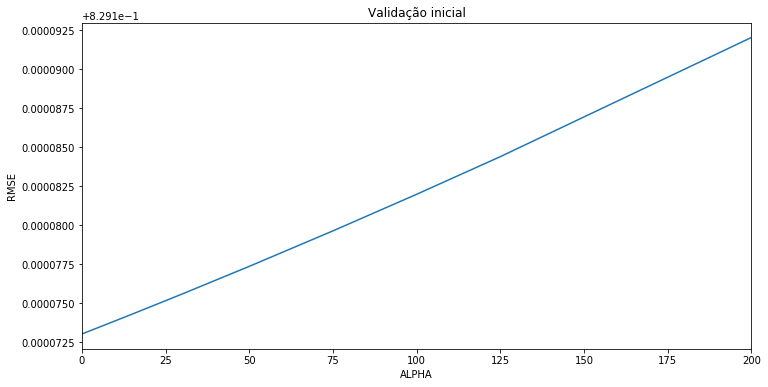

In [167]:
cv_ridge = pd.Series(cv_ridge, index = alphas)
cv_ridge.plot(title = "Validação inicial")
plt.xlabel("ALPHA")
plt.ylabel("RMSE")

On the third model Ridge, it is found a mean RMSE of 0.8291. Is is higher but it includes more information about the real number of visitors per day. Preparing land for the next step: explore weather information.

In [168]:
cv_ridge.mean()

0.8291763097722108

### Model Lasso (3th trial)

In [169]:
from sklearn.linear_model import LassoCV, LassoLarsCV

model_lasso = LassoCV(alphas = [0.00001,0.0001,0.001,0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75, 100, 125, 200]).fit(X_train, y)

On the third Lasso model, it is found a mean RMSE of 0.8291. The same as the third Ridge model

In [170]:
rmse_cv(model_lasso).mean()

0.82918148526901936

In [171]:
coef = pd.Series(model_lasso.coef_, index = X_train.columns)
print("O modelo Lasso escolheu " + str(sum(coef != 0)) + " atributos e eliminou os outros " +  str(sum(coef == 0)) + " atributos do dataset para construção do modelo.")


O modelo Lasso escolheu 3 atributos e eliminou os outros 0 atributos do dataset para construção do modelo.


In [172]:
#imp_coef = pd.concat([coef.sort_values().head(3),
#                     coef.sort_values().tail(3)])
imp_coef = pd.concat([coef.sort_values().head(1),
                     coef.sort_values().tail(2)])


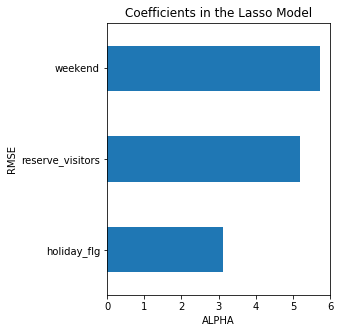

In [173]:
matplotlib.rcParams['figure.figsize'] = (4.0, 5.0)
imp_coef.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")
plt.xlabel("ALPHA")
plt.ylabel("RMSE")

### 4. Including Weather and Restaurants information 

On this last report, it is included informations about weather and characteristics about restaurants like genre. At the end, some of  these information are foinf to be used on the regression models.

In [175]:
visits_and_reserves_merged_final.head()

,air_store_id,from_air_database,from_hpg_database,holiday_flg,just_date,no_reservation,reserve_visitors,visitors,weekday_flg,weekend
0,air_877f79706adbfb06,1,0,1,2016-01-01,0,3,3.0,4,0.0
1,air_db4b38ebe7a7ceff,1,0,1,2016-01-01,0,9,21.0,4,0.0
2,air_db80363d35f10926,1,1,1,2016-01-01,0,9,8.0,8,0.0
3,air_2b8b29ddfd35018e,1,0,1,2016-01-02,0,6,28.0,5,1.0
4,air_3bb99a1fe0583897,1,0,1,2016-01-02,0,4,39.0,5,1.0


In [176]:
visits_and_reserves_merged_final.air_store_id.describe()

count                   252108
unique                     829
top       air_5c817ef28f236bdf
freq                       477
Name: air_store_id, dtype: object

In [177]:
#Including informations about restaurants
v_r_rest_info = pd.merge(visits_and_reserves_merged_final, air_rest_copy, on='air_store_id')

In [178]:
v_r_rest_info.head()

,air_store_id,from_air_database,from_hpg_database,holiday_flg,just_date,no_reservation,reserve_visitors,visitors,weekday_flg,weekend,air_genre_name,air_area_name,latitude,longitude
0,air_877f79706adbfb06,1,0,1,2016-01-01,0,3,3.0,4,0.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599
1,air_877f79706adbfb06,1,0,1,2016-01-02,0,4,12.0,5,1.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599
2,air_877f79706adbfb06,1,0,0,2016-01-08,0,7,17.0,4,0.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599
3,air_877f79706adbfb06,1,0,0,2016-01-09,0,8,8.0,5,1.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599
4,air_877f79706adbfb06,1,0,0,2016-01-12,0,6,15.0,1,0.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599


In [179]:
v_r_rest_info.air_store_id.describe()

count                   252108
unique                     829
top       air_5c817ef28f236bdf
freq                       477
Name: air_store_id, dtype: object

In [180]:
v_r_rest_info.air_area_name.describe()

count                             252108
unique                               103
top       Fukuoka-ken Fukuoka-shi Daimyō
freq                               19775
Name: air_area_name, dtype: object

These uniques are names were used to create the weather dataset presented below (file_weather.csv) throw the website http://www.data.jma.go.jp/gmd/risk/obsdl/index.php.

In [1497]:
uniques = v_r_rest_info.air_area_name.unique()

In [1496]:
uniques

array(['Tōkyō-to Minato-ku Shibakōen', 'Ōsaka-fu Ōsaka-shi Shinmachi',
       'Hokkaidō Asahikawa-shi 6 Jōdōri',
       'Hiroshima-ken Hiroshima-shi Kokutaijimachi',
       'Miyagi-ken Sendai-shi Kamisugi',
       'Shizuoka-ken Hamamatsu-shi Motoshirochō',
       'Fukuoka-ken Kurume-shi Jōnanmachi',
       'Hokkaidō Sapporo-shi Minami 3 Jōnishi',
       'Shizuoka-ken Shizuoka-shi Ōtemachi',
       'Fukuoka-ken Fukuoka-shi Daimyō',
       'Niigata-ken Niigata-shi Gakkōchōdōri 1 Banchō',
       'Hyōgo-ken Nishinomiya-shi Rokutanjichō',
       'Hokkaidō Abashiri-shi Minami 6 Jōhigashi',
       'Fukuoka-ken Kitakyūshū-shi Ōtemachi',
       'Fukuoka-ken Fukuoka-shi Hakata Ekimae', 'Tōkyō-to Chūō-ku Tsukiji',
       'Fukuoka-ken Kitakyūshū-shi None', 'Hyōgo-ken Kōbe-shi Kumoidōri',
       'Tōkyō-to Shibuya-ku Shibuya', 'Ōsaka-fu Ōsaka-shi Kyūtarōmachi',
       'Tōkyō-to Itabashi-ku Itabashi', 'Tōkyō-to Taitō-ku Higashiueno',
       'Hyōgo-ken Kakogawa-shi Kakogawachō Kitazaike',
       'Tōky

In [182]:
v_r_rest_info['local'] = v_r_rest_info['air_area_name'].map(lambda x: str(x).split()[1])
v_r_rest_info['district'] = v_r_rest_info['air_area_name'].map(lambda x: str(x).split()[0])

In [183]:
v_r_rest_info['year'] = v_r_rest_info['just_date'].map(lambda x: str(x).split('-')[0])

In [184]:
v_r_rest_info['month'] = v_r_rest_info['just_date'].map(lambda x: str(x).split('-')[1])

In [185]:
v_r_rest_info.head()

,air_store_id,from_air_database,from_hpg_database,holiday_flg,just_date,no_reservation,reserve_visitors,visitors,weekday_flg,weekend,air_genre_name,air_area_name,latitude,longitude,local,district,year,month
0,air_877f79706adbfb06,1,0,1,2016-01-01,0,3,3.0,4,0.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Minato-ku,Tōkyō-to,2016,01
1,air_877f79706adbfb06,1,0,1,2016-01-02,0,4,12.0,5,1.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Minato-ku,Tōkyō-to,2016,01
2,air_877f79706adbfb06,1,0,0,2016-01-08,0,7,17.0,4,0.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Minato-ku,Tōkyō-to,2016,01
3,air_877f79706adbfb06,1,0,0,2016-01-09,0,8,8.0,5,1.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Minato-ku,Tōkyō-to,2016,01
4,air_877f79706adbfb06,1,0,0,2016-01-12,0,6,15.0,1,0.0,Japanese food,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Minato-ku,Tōkyō-to,2016,01


In [186]:
weather = pd.read_csv("../Data/file_weather.csv")

In [187]:
weather['local'] = weather['local'].str.replace('Kitaky\?sh\?\-shi', 'Kitakyūshū-shi')
weather['local'] = weather['local'].str.replace('Kat\?-gun', 'Katō-gun')
weather['local'] = weather['local'].str.replace('K\?be-shi', 'Kōbe-shi')
weather['local'] = weather['local'].str.replace('Higashi?saka-shi', 'Higashiōsaka-shi')
weather['local'] = weather['local'].str.replace('\?saka-shi', 'Ōsaka-shi')
weather['local'] = weather['local'].str.replace('Bunky\?-ku', 'Bunkyō-ku')
weather['local'] = weather['local'].str.replace('Ch\?\?-ku', 'Chūō-ku')
weather['local'] = weather['local'].str.replace('Fuch\?-shi', 'Fuchū-shi')
weather['local'] = weather['local'].str.replace('K\?t\?-ku', 'Kōtō-ku')
weather['local'] = weather['local'].str.replace('\?ta-ku', 'Ōta-ku')
weather['local'] = weather['local'].str.replace('Tait\?-ku', 'Taitō-ku')

In [188]:
v_r_rest_info.count()

air_store_id         252108
from_air_database    252108
from_hpg_database    252108
holiday_flg          252108
just_date            252108
no_reservation       252108
reserve_visitors     252108
visitors             252108
weekday_flg          252108
weekend              252108
air_genre_name       252108
air_area_name        252108
latitude             252108
longitude            252108
local                252108
district             252108
year                 252108
month                252108
dtype: int64

In [189]:
v_r_rest_info.local.describe()

count          252108
unique             55
top       Fukuoka-shi
freq            32420
Name: local, dtype: object

In [190]:
v_r_rest_info.air_store_id.describe()

count                   252108
unique                     829
top       air_5c817ef28f236bdf
freq                       477
Name: air_store_id, dtype: object

In [191]:
weather.count()

data                    33495
t_media                 28623
t_max                   28623
t_min                   28623
pp_total_1              32277
pp_total_2              21315
snow_amount_1           24934
snow_amount_2           18879
daylight_hours_1        28570
daylight_hours_2        20097
deepest_snow_cover_1    17661
deepest_snow_cover_2    17661
ave_wind_speed          20064
ave_cloud_cover         17661
local                   33495
dtype: int64

In [192]:
weather.local.describe()

count                33495
unique                  55
top       HigashiŌsaka-shi
freq                   609
Name: local, dtype: object

In [193]:
weather.head()

,data,t_media,t_max,t_min,pp_total_1,pp_total_2,snow_amount_1,snow_amount_2,daylight_hours_1,daylight_hours_2,deepest_snow_cover_1,deepest_snow_cover_2,ave_wind_speed,ave_cloud_cover,local
0,2016-01-01,2.4,6.1,-1.5,0.0,0.0,0.0,1.0,3.7,0.0,0.0,1.0,2.8,4.0,Sendai-shi
1,2016-01-02,6.2,10.4,-0.1,0.0,0.0,0.0,1.0,0.8,0.0,0.0,1.0,3.0,6.3,Sendai-shi
2,2016-01-03,8.6,12.5,5.9,0.0,0.0,0.0,1.0,2.8,0.0,0.0,1.0,1.8,8.3,Sendai-shi
3,2016-01-04,7.5,12.7,4.4,0.0,0.0,0.0,1.0,2.5,0.0,0.0,1.0,2.8,8.8,Sendai-shi
4,2016-01-05,4.6,8.0,2.1,0.0,0.0,0.0,1.0,3.7,0.0,0.0,1.0,3.4,6.8,Sendai-shi


In [213]:
weather.rename(index=str, columns={"data": "just_date"}, inplace=True)

In [195]:
weather.pp_total_1.describe()

count    32277.000000
mean         4.040121
std         11.733866
min          0.000000
25%          0.000000
50%          0.000000
75%          1.500000
max        244.000000
Name: pp_total_1, dtype: float64

In [196]:
weather.pp_total_2.describe()

count    21315.000000
mean         0.432747
std          1.027134
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         69.000000
Name: pp_total_2, dtype: float64

In [197]:
weather.snow_amount_1.describe()

count    24934.000000
mean         1.687074
std          3.476746
min          0.000000
25%          0.000000
50%          0.000000
75%          0.600000
max         46.000000
Name: snow_amount_1, dtype: float64

In [198]:
weather.snow_amount_2.describe()

count    18879.000000
mean         1.145664
std          3.123711
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         95.000000
Name: snow_amount_2, dtype: float64

In [199]:
weather.daylight_hours_1.describe()

count    28570.000000
mean         4.653007
std          3.834303
min          0.000000
25%          1.400000
50%          3.500000
75%          8.000000
max         15.000000
Name: daylight_hours_1, dtype: float64

In [200]:
weather.daylight_hours_2.describe()

count    20097.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: daylight_hours_2, dtype: float64

As 'daylight_hours_2' don't have values it is droped below.

In [201]:
weather.drop('daylight_hours_2', axis=1, inplace=True)

In [202]:
weather.rename(index=str, columns={"daylight_hours_1": "daylight_hours"}, inplace=True)

In [203]:
weather.deepest_snow_cover_1.describe()

count    17661.000000
mean         2.401676
std         11.056804
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         97.000000
Name: deepest_snow_cover_1, dtype: float64

In [204]:
weather.deepest_snow_cover_2.describe()

count    17661.000000
mean         0.934375
std          0.247632
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: deepest_snow_cover_2, dtype: float64

In [205]:
weather['pp_total'] = pd.to_numeric(weather['pp_total_1']) + pd.to_numeric(weather['pp_total_2'])
weather['snow_amount'] = pd.to_numeric(weather['snow_amount_1']) + pd.to_numeric(weather['snow_amount_2'])
weather['deepest_snow_cover'] = pd.to_numeric(weather['deepest_snow_cover_1']) + pd.to_numeric(weather['deepest_snow_cover_2'])

In [206]:
weather.pp_total.describe()

count    21315.000000
mean         4.465283
std         11.438368
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max        219.500000
Name: pp_total, dtype: float64

In [207]:
weather.snow_amount.describe()

count    18879.000000
mean         1.588776
std          3.702848
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         99.800000
Name: snow_amount, dtype: float64

In [208]:
weather.deepest_snow_cover.describe()

count    17661.000000
mean         3.336051
std         10.854762
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         97.000000
Name: deepest_snow_cover, dtype: float64

In [214]:
weather.count()

just_date               33495
t_media                 28623
t_max                   28623
t_min                   28623
pp_total_1              32277
pp_total_2              21315
snow_amount_1           24934
snow_amount_2           18879
daylight_hours          28570
deepest_snow_cover_1    17661
deepest_snow_cover_2    17661
ave_wind_speed          20064
ave_cloud_cover         17661
local                   33495
pp_total                21315
snow_amount             18879
deepest_snow_cover      17661
dtype: int64

In [530]:
#Including information about weather
v_r_rest_info_weather = pd.merge(v_r_rest_info, weather, how='left', on=['just_date','local'])

In [543]:
v_r_rest_info_weather.count()

air_store_id            252108
from_air_database       252108
from_hpg_database       252108
holiday_flg             252108
just_date               252108
no_reservation          252108
reserve_visitors        252108
visitors                252108
weekday_flg             252108
weekend                 252108
air_genre_name          252108
air_area_name           252108
latitude                252108
longitude               252108
local                   252108
district                252108
year                    252108
month                   252108
t_media                 252108
t_max                   193844
t_min                   193844
pp_total_1              223581
pp_total_2              179187
snow_amount_1           180427
snow_amount_2           169933
daylight_hours          193807
deepest_snow_cover_1    168675
deepest_snow_cover_2    168675
ave_wind_speed          177897
ave_cloud_cover         168675
pp_total                179187
snow_amount             169933
deepest_

Below the genre of the restaurants are transformed to cathegorical.

In [532]:
v_r_rest_info_weather['is_japanese'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Japanese food', 1, 0)
v_r_rest_info_weather['is_dining_bar'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Dining bar', 1, 0)
v_r_rest_info_weather['is_monja'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Okonomiyaki/Monja/Teppanyaki', 1, 0)
v_r_rest_info_weather['is_izakaya'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Izakaya', 1, 0)
v_r_rest_info_weather['is_italian_french'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Italian/French', 1, 0)
v_r_rest_info_weather['is_bar_cocktail'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Bar/Cocktail', 1, 0)
v_r_rest_info_weather['is_other'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Other', 1, 0)
v_r_rest_info_weather['is_creative_cuisine'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Creative cuisine', 1, 0)
v_r_rest_info_weather['is_karaoke_party'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Karaoke/Party', 1, 0)
v_r_rest_info_weather['is_international'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'International cuisine', 1, 0)
v_r_rest_info_weather['is_asian'] = np.where(v_r_rest_info_weather['air_genre_name'] == 'Asian', 1, 0)


The variables 'v_r_rest_grouped_by_district_final' and 'v_r_rest_grouped_by_country_final' are used to fill NaN values about weather

In [534]:
v_r_rest_grouped_by_district = v_r_rest_info_weather.groupby(['just_date', 'district'], as_index=False)
v_r_rest_grouped_by_district_final = v_r_rest_grouped_by_district.aggregate(np.mean)

In [535]:
v_r_rest_grouped_by_country = v_r_rest_info_weather.groupby(['just_date'], as_index=False)
v_r_rest_grouped_by_country_final = v_r_rest_grouped_by_country.aggregate(np.mean)

In [545]:
#Function that fill NaN values related to weather information
def fill_na(title, df, grouped, grouped_country):
    c = 0
    print("begin")
    for index, row in df.iterrows():
        if pd.isnull(row[title]):
            date = row['just_date']
            dis = row['district']
            c = c +1
            print("valor nulo",c)
            z = grouped.loc[(grouped['just_date']==date)&(grouped['district']==dis)][title].item()
            if pd.notnull(z):
                df.loc[index, title] = z
            else:
                z = grouped_country.loc[(grouped_country['just_date']==date)][title].item()
                df.loc[index, title] = z
    return df

#### Filling NaNs values

In [540]:
v_r_rest_info_weather.t_media.describe()

count    193844.000000
mean         14.701449
std           8.596322
min         -16.000000
25%           7.800000
50%          13.600000
75%          22.500000
max          32.400000
Name: t_media, dtype: float64

In [541]:
v_r_rest_info_weather = fill_na(v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo 625
valor nulo 626
valor nulo

valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nulo 1167
valor nulo 1168
valor nulo 1169
valor nulo 1170
valor nu

valor nulo 1623
valor nulo 1624
valor nulo 1625
valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nu

valor nulo 2144
valor nulo 2145
valor nulo 2146
valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nulo 2201
valor nulo 2202
valor nulo 2203
valor nulo 2204
valor nulo 2205
valor nu

valor nulo 2660
valor nulo 2661
valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nulo 2718
valor nulo 2719
valor nulo 2720
valor nulo 2721
valor nu

valor nulo 3175
valor nulo 3176
valor nulo 3177
valor nulo 3178
valor nulo 3179
valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nulo 3233
valor nulo 3234
valor nulo 3235
valor nulo 3236
valor nu

valor nulo 3694
valor nulo 3695
valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nulo 3753
valor nulo 3754
valor nulo 3755
valor nu

valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nulo 4271
valor nulo 4272
valor nulo 4273
valor nulo 4274
valor nulo 4275
valor nu

valor nulo 4729
valor nulo 4730
valor nulo 4731
valor nulo 4732
valor nulo 4733
valor nulo 4734
valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nulo 4787
valor nulo 4788
valor nulo 4789
valor nulo 4790
valor nu

valor nulo 5242
valor nulo 5243
valor nulo 5244
valor nulo 5245
valor nulo 5246
valor nulo 5247
valor nulo 5248
valor nulo 5249
valor nulo 5250
valor nulo 5251
valor nulo 5252
valor nulo 5253
valor nulo 5254
valor nulo 5255
valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nu

valor nulo 5759
valor nulo 5760
valor nulo 5761
valor nulo 5762
valor nulo 5763
valor nulo 5764
valor nulo 5765
valor nulo 5766
valor nulo 5767
valor nulo 5768
valor nulo 5769
valor nulo 5770
valor nulo 5771
valor nulo 5772
valor nulo 5773
valor nulo 5774
valor nulo 5775
valor nulo 5776
valor nulo 5777
valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nulo 5819
valor nulo 5820
valor nu

valor nulo 6272
valor nulo 6273
valor nulo 6274
valor nulo 6275
valor nulo 6276
valor nulo 6277
valor nulo 6278
valor nulo 6279
valor nulo 6280
valor nulo 6281
valor nulo 6282
valor nulo 6283
valor nulo 6284
valor nulo 6285
valor nulo 6286
valor nulo 6287
valor nulo 6288
valor nulo 6289
valor nulo 6290
valor nulo 6291
valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nu

valor nulo 6790
valor nulo 6791
valor nulo 6792
valor nulo 6793
valor nulo 6794
valor nulo 6795
valor nulo 6796
valor nulo 6797
valor nulo 6798
valor nulo 6799
valor nulo 6800
valor nulo 6801
valor nulo 6802
valor nulo 6803
valor nulo 6804
valor nulo 6805
valor nulo 6806
valor nulo 6807
valor nulo 6808
valor nulo 6809
valor nulo 6810
valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nu

valor nulo 7307
valor nulo 7308
valor nulo 7309
valor nulo 7310
valor nulo 7311
valor nulo 7312
valor nulo 7313
valor nulo 7314
valor nulo 7315
valor nulo 7316
valor nulo 7317
valor nulo 7318
valor nulo 7319
valor nulo 7320
valor nulo 7321
valor nulo 7322
valor nulo 7323
valor nulo 7324
valor nulo 7325
valor nulo 7326
valor nulo 7327
valor nulo 7328
valor nulo 7329
valor nulo 7330
valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nu

valor nulo 7822
valor nulo 7823
valor nulo 7824
valor nulo 7825
valor nulo 7826
valor nulo 7827
valor nulo 7828
valor nulo 7829
valor nulo 7830
valor nulo 7831
valor nulo 7832
valor nulo 7833
valor nulo 7834
valor nulo 7835
valor nulo 7836
valor nulo 7837
valor nulo 7838
valor nulo 7839
valor nulo 7840
valor nulo 7841
valor nulo 7842
valor nulo 7843
valor nulo 7844
valor nulo 7845
valor nulo 7846
valor nulo 7847
valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nu

valor nulo 8338
valor nulo 8339
valor nulo 8340
valor nulo 8341
valor nulo 8342
valor nulo 8343
valor nulo 8344
valor nulo 8345
valor nulo 8346
valor nulo 8347
valor nulo 8348
valor nulo 8349
valor nulo 8350
valor nulo 8351
valor nulo 8352
valor nulo 8353
valor nulo 8354
valor nulo 8355
valor nulo 8356
valor nulo 8357
valor nulo 8358
valor nulo 8359
valor nulo 8360
valor nulo 8361
valor nulo 8362
valor nulo 8363
valor nulo 8364
valor nulo 8365
valor nulo 8366
valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nu

valor nulo 8856
valor nulo 8857
valor nulo 8858
valor nulo 8859
valor nulo 8860
valor nulo 8861
valor nulo 8862
valor nulo 8863
valor nulo 8864
valor nulo 8865
valor nulo 8866
valor nulo 8867
valor nulo 8868
valor nulo 8869
valor nulo 8870
valor nulo 8871
valor nulo 8872
valor nulo 8873
valor nulo 8874
valor nulo 8875
valor nulo 8876
valor nulo 8877
valor nulo 8878
valor nulo 8879
valor nulo 8880
valor nulo 8881
valor nulo 8882
valor nulo 8883
valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nulo 8914
valor nulo 8915
valor nulo 8916
valor nulo 8917
valor nu

valor nulo 9371
valor nulo 9372
valor nulo 9373
valor nulo 9374
valor nulo 9375
valor nulo 9376
valor nulo 9377
valor nulo 9378
valor nulo 9379
valor nulo 9380
valor nulo 9381
valor nulo 9382
valor nulo 9383
valor nulo 9384
valor nulo 9385
valor nulo 9386
valor nulo 9387
valor nulo 9388
valor nulo 9389
valor nulo 9390
valor nulo 9391
valor nulo 9392
valor nulo 9393
valor nulo 9394
valor nulo 9395
valor nulo 9396
valor nulo 9397
valor nulo 9398
valor nulo 9399
valor nulo 9400
valor nulo 9401
valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nu

valor nulo 9892
valor nulo 9893
valor nulo 9894
valor nulo 9895
valor nulo 9896
valor nulo 9897
valor nulo 9898
valor nulo 9899
valor nulo 9900
valor nulo 9901
valor nulo 9902
valor nulo 9903
valor nulo 9904
valor nulo 9905
valor nulo 9906
valor nulo 9907
valor nulo 9908
valor nulo 9909
valor nulo 9910
valor nulo 9911
valor nulo 9912
valor nulo 9913
valor nulo 9914
valor nulo 9915
valor nulo 9916
valor nulo 9917
valor nulo 9918
valor nulo 9919
valor nulo 9920
valor nulo 9921
valor nulo 9922
valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nulo 9949
valor nulo 9950
valor nulo 9951
valor nulo 9952
valor nulo 9953
valor nu

valor nulo 10382
valor nulo 10383
valor nulo 10384
valor nulo 10385
valor nulo 10386
valor nulo 10387
valor nulo 10388
valor nulo 10389
valor nulo 10390
valor nulo 10391
valor nulo 10392
valor nulo 10393
valor nulo 10394
valor nulo 10395
valor nulo 10396
valor nulo 10397
valor nulo 10398
valor nulo 10399
valor nulo 10400
valor nulo 10401
valor nulo 10402
valor nulo 10403
valor nulo 10404
valor nulo 10405
valor nulo 10406
valor nulo 10407
valor nulo 10408
valor nulo 10409
valor nulo 10410
valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 10437
valor nulo 10438
valor nulo 10439
valor nulo 104

valor nulo 10871
valor nulo 10872
valor nulo 10873
valor nulo 10874
valor nulo 10875
valor nulo 10876
valor nulo 10877
valor nulo 10878
valor nulo 10879
valor nulo 10880
valor nulo 10881
valor nulo 10882
valor nulo 10883
valor nulo 10884
valor nulo 10885
valor nulo 10886
valor nulo 10887
valor nulo 10888
valor nulo 10889
valor nulo 10890
valor nulo 10891
valor nulo 10892
valor nulo 10893
valor nulo 10894
valor nulo 10895
valor nulo 10896
valor nulo 10897
valor nulo 10898
valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 10916
valor nulo 10917
valor nulo 10918
valor nulo 10919
valor nulo 10920
valor nulo 10921
valor nulo 10922
valor nulo 10923
valor nulo 10924
valor nulo 10925
valor nulo 10926
valor nulo 10927
valor nulo 10928
valor nulo 109

valor nulo 11354
valor nulo 11355
valor nulo 11356
valor nulo 11357
valor nulo 11358
valor nulo 11359
valor nulo 11360
valor nulo 11361
valor nulo 11362
valor nulo 11363
valor nulo 11364
valor nulo 11365
valor nulo 11366
valor nulo 11367
valor nulo 11368
valor nulo 11369
valor nulo 11370
valor nulo 11371
valor nulo 11372
valor nulo 11373
valor nulo 11374
valor nulo 11375
valor nulo 11376
valor nulo 11377
valor nulo 11378
valor nulo 11379
valor nulo 11380
valor nulo 11381
valor nulo 11382
valor nulo 11383
valor nulo 11384
valor nulo 11385
valor nulo 11386
valor nulo 11387
valor nulo 11388
valor nulo 11389
valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 11398
valor nulo 11399
valor nulo 11400
valor nulo 11401
valor nulo 11402
valor nulo 11403
valor nulo 11404
valor nulo 11405
valor nulo 11406
valor nulo 11407
valor nulo 11408
valor nulo 11409
valor nulo 11410
valor nulo 11411
valor nulo 114

valor nulo 11836
valor nulo 11837
valor nulo 11838
valor nulo 11839
valor nulo 11840
valor nulo 11841
valor nulo 11842
valor nulo 11843
valor nulo 11844
valor nulo 11845
valor nulo 11846
valor nulo 11847
valor nulo 11848
valor nulo 11849
valor nulo 11850
valor nulo 11851
valor nulo 11852
valor nulo 11853
valor nulo 11854
valor nulo 11855
valor nulo 11856
valor nulo 11857
valor nulo 11858
valor nulo 11859
valor nulo 11860
valor nulo 11861
valor nulo 11862
valor nulo 11863
valor nulo 11864
valor nulo 11865
valor nulo 11866
valor nulo 11867
valor nulo 11868
valor nulo 11869
valor nulo 11870
valor nulo 11871
valor nulo 11872
valor nulo 11873
valor nulo 11874
valor nulo 11875
valor nulo 11876
valor nulo 11877
valor nulo 11878
valor nulo 11879
valor nulo 11880
valor nulo 11881
valor nulo 11882
valor nulo 11883
valor nulo 11884
valor nulo 11885
valor nulo 11886
valor nulo 11887
valor nulo 11888
valor nulo 11889
valor nulo 11890
valor nulo 11891
valor nulo 11892
valor nulo 11893
valor nulo 118

valor nulo 12324
valor nulo 12325
valor nulo 12326
valor nulo 12327
valor nulo 12328
valor nulo 12329
valor nulo 12330
valor nulo 12331
valor nulo 12332
valor nulo 12333
valor nulo 12334
valor nulo 12335
valor nulo 12336
valor nulo 12337
valor nulo 12338
valor nulo 12339
valor nulo 12340
valor nulo 12341
valor nulo 12342
valor nulo 12343
valor nulo 12344
valor nulo 12345
valor nulo 12346
valor nulo 12347
valor nulo 12348
valor nulo 12349
valor nulo 12350
valor nulo 12351
valor nulo 12352
valor nulo 12353
valor nulo 12354
valor nulo 12355
valor nulo 12356
valor nulo 12357
valor nulo 12358
valor nulo 12359
valor nulo 12360
valor nulo 12361
valor nulo 12362
valor nulo 12363
valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 12371
valor nulo 12372
valor nulo 12373
valor nulo 12374
valor nulo 12375
valor nulo 12376
valor nulo 12377
valor nulo 12378
valor nulo 12379
valor nulo 12380
valor nulo 12381
valor nulo 123

valor nulo 12812
valor nulo 12813
valor nulo 12814
valor nulo 12815
valor nulo 12816
valor nulo 12817
valor nulo 12818
valor nulo 12819
valor nulo 12820
valor nulo 12821
valor nulo 12822
valor nulo 12823
valor nulo 12824
valor nulo 12825
valor nulo 12826
valor nulo 12827
valor nulo 12828
valor nulo 12829
valor nulo 12830
valor nulo 12831
valor nulo 12832
valor nulo 12833
valor nulo 12834
valor nulo 12835
valor nulo 12836
valor nulo 12837
valor nulo 12838
valor nulo 12839
valor nulo 12840
valor nulo 12841
valor nulo 12842
valor nulo 12843
valor nulo 12844
valor nulo 12845
valor nulo 12846
valor nulo 12847
valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 12861
valor nulo 12862
valor nulo 12863
valor nulo 12864
valor nulo 12865
valor nulo 12866
valor nulo 12867
valor nulo 12868
valor nulo 12869
valor nulo 128

valor nulo 13297
valor nulo 13298
valor nulo 13299
valor nulo 13300
valor nulo 13301
valor nulo 13302
valor nulo 13303
valor nulo 13304
valor nulo 13305
valor nulo 13306
valor nulo 13307
valor nulo 13308
valor nulo 13309
valor nulo 13310
valor nulo 13311
valor nulo 13312
valor nulo 13313
valor nulo 13314
valor nulo 13315
valor nulo 13316
valor nulo 13317
valor nulo 13318
valor nulo 13319
valor nulo 13320
valor nulo 13321
valor nulo 13322
valor nulo 13323
valor nulo 13324
valor nulo 13325
valor nulo 13326
valor nulo 13327
valor nulo 13328
valor nulo 13329
valor nulo 13330
valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 13346
valor nulo 13347
valor nulo 13348
valor nulo 13349
valor nulo 13350
valor nulo 13351
valor nulo 13352
valor nulo 13353
valor nulo 13354
valor nulo 133

valor nulo 13780
valor nulo 13781
valor nulo 13782
valor nulo 13783
valor nulo 13784
valor nulo 13785
valor nulo 13786
valor nulo 13787
valor nulo 13788
valor nulo 13789
valor nulo 13790
valor nulo 13791
valor nulo 13792
valor nulo 13793
valor nulo 13794
valor nulo 13795
valor nulo 13796
valor nulo 13797
valor nulo 13798
valor nulo 13799
valor nulo 13800
valor nulo 13801
valor nulo 13802
valor nulo 13803
valor nulo 13804
valor nulo 13805
valor nulo 13806
valor nulo 13807
valor nulo 13808
valor nulo 13809
valor nulo 13810
valor nulo 13811
valor nulo 13812
valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 13832
valor nulo 13833
valor nulo 13834
valor nulo 13835
valor nulo 13836
valor nulo 13837
valor nulo 138

valor nulo 14263
valor nulo 14264
valor nulo 14265
valor nulo 14266
valor nulo 14267
valor nulo 14268
valor nulo 14269
valor nulo 14270
valor nulo 14271
valor nulo 14272
valor nulo 14273
valor nulo 14274
valor nulo 14275
valor nulo 14276
valor nulo 14277
valor nulo 14278
valor nulo 14279
valor nulo 14280
valor nulo 14281
valor nulo 14282
valor nulo 14283
valor nulo 14284
valor nulo 14285
valor nulo 14286
valor nulo 14287
valor nulo 14288
valor nulo 14289
valor nulo 14290
valor nulo 14291
valor nulo 14292
valor nulo 14293
valor nulo 14294
valor nulo 14295
valor nulo 14296
valor nulo 14297
valor nulo 14298
valor nulo 14299
valor nulo 14300
valor nulo 14301
valor nulo 14302
valor nulo 14303
valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 14314
valor nulo 14315
valor nulo 14316
valor nulo 14317
valor nulo 14318
valor nulo 14319
valor nulo 14320
valor nulo 143

valor nulo 14749
valor nulo 14750
valor nulo 14751
valor nulo 14752
valor nulo 14753
valor nulo 14754
valor nulo 14755
valor nulo 14756
valor nulo 14757
valor nulo 14758
valor nulo 14759
valor nulo 14760
valor nulo 14761
valor nulo 14762
valor nulo 14763
valor nulo 14764
valor nulo 14765
valor nulo 14766
valor nulo 14767
valor nulo 14768
valor nulo 14769
valor nulo 14770
valor nulo 14771
valor nulo 14772
valor nulo 14773
valor nulo 14774
valor nulo 14775
valor nulo 14776
valor nulo 14777
valor nulo 14778
valor nulo 14779
valor nulo 14780
valor nulo 14781
valor nulo 14782
valor nulo 14783
valor nulo 14784
valor nulo 14785
valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 14803
valor nulo 14804
valor nulo 14805
valor nulo 14806
valor nulo 148

valor nulo 15237
valor nulo 15238
valor nulo 15239
valor nulo 15240
valor nulo 15241
valor nulo 15242
valor nulo 15243
valor nulo 15244
valor nulo 15245
valor nulo 15246
valor nulo 15247
valor nulo 15248
valor nulo 15249
valor nulo 15250
valor nulo 15251
valor nulo 15252
valor nulo 15253
valor nulo 15254
valor nulo 15255
valor nulo 15256
valor nulo 15257
valor nulo 15258
valor nulo 15259
valor nulo 15260
valor nulo 15261
valor nulo 15262
valor nulo 15263
valor nulo 15264
valor nulo 15265
valor nulo 15266
valor nulo 15267
valor nulo 15268
valor nulo 15269
valor nulo 15270
valor nulo 15271
valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 15293
valor nulo 15294
valor nulo 152

valor nulo 15719
valor nulo 15720
valor nulo 15721
valor nulo 15722
valor nulo 15723
valor nulo 15724
valor nulo 15725
valor nulo 15726
valor nulo 15727
valor nulo 15728
valor nulo 15729
valor nulo 15730
valor nulo 15731
valor nulo 15732
valor nulo 15733
valor nulo 15734
valor nulo 15735
valor nulo 15736
valor nulo 15737
valor nulo 15738
valor nulo 15739
valor nulo 15740
valor nulo 15741
valor nulo 15742
valor nulo 15743
valor nulo 15744
valor nulo 15745
valor nulo 15746
valor nulo 15747
valor nulo 15748
valor nulo 15749
valor nulo 15750
valor nulo 15751
valor nulo 15752
valor nulo 15753
valor nulo 15754
valor nulo 15755
valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 157

valor nulo 16203
valor nulo 16204
valor nulo 16205
valor nulo 16206
valor nulo 16207
valor nulo 16208
valor nulo 16209
valor nulo 16210
valor nulo 16211
valor nulo 16212
valor nulo 16213
valor nulo 16214
valor nulo 16215
valor nulo 16216
valor nulo 16217
valor nulo 16218
valor nulo 16219
valor nulo 16220
valor nulo 16221
valor nulo 16222
valor nulo 16223
valor nulo 16224
valor nulo 16225
valor nulo 16226
valor nulo 16227
valor nulo 16228
valor nulo 16229
valor nulo 16230
valor nulo 16231
valor nulo 16232
valor nulo 16233
valor nulo 16234
valor nulo 16235
valor nulo 16236
valor nulo 16237
valor nulo 16238
valor nulo 16239
valor nulo 16240
valor nulo 16241
valor nulo 16242
valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 162

valor nulo 16686
valor nulo 16687
valor nulo 16688
valor nulo 16689
valor nulo 16690
valor nulo 16691
valor nulo 16692
valor nulo 16693
valor nulo 16694
valor nulo 16695
valor nulo 16696
valor nulo 16697
valor nulo 16698
valor nulo 16699
valor nulo 16700
valor nulo 16701
valor nulo 16702
valor nulo 16703
valor nulo 16704
valor nulo 16705
valor nulo 16706
valor nulo 16707
valor nulo 16708
valor nulo 16709
valor nulo 16710
valor nulo 16711
valor nulo 16712
valor nulo 16713
valor nulo 16714
valor nulo 16715
valor nulo 16716
valor nulo 16717
valor nulo 16718
valor nulo 16719
valor nulo 16720
valor nulo 16721
valor nulo 16722
valor nulo 16723
valor nulo 16724
valor nulo 16725
valor nulo 16726
valor nulo 16727
valor nulo 16728
valor nulo 16729
valor nulo 16730
valor nulo 16731
valor nulo 16732
valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 167

valor nulo 17174
valor nulo 17175
valor nulo 17176
valor nulo 17177
valor nulo 17178
valor nulo 17179
valor nulo 17180
valor nulo 17181
valor nulo 17182
valor nulo 17183
valor nulo 17184
valor nulo 17185
valor nulo 17186
valor nulo 17187
valor nulo 17188
valor nulo 17189
valor nulo 17190
valor nulo 17191
valor nulo 17192
valor nulo 17193
valor nulo 17194
valor nulo 17195
valor nulo 17196
valor nulo 17197
valor nulo 17198
valor nulo 17199
valor nulo 17200
valor nulo 17201
valor nulo 17202
valor nulo 17203
valor nulo 17204
valor nulo 17205
valor nulo 17206
valor nulo 17207
valor nulo 17208
valor nulo 17209
valor nulo 17210
valor nulo 17211
valor nulo 17212
valor nulo 17213
valor nulo 17214
valor nulo 17215
valor nulo 17216
valor nulo 17217
valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 172

valor nulo 17658
valor nulo 17659
valor nulo 17660
valor nulo 17661
valor nulo 17662
valor nulo 17663
valor nulo 17664
valor nulo 17665
valor nulo 17666
valor nulo 17667
valor nulo 17668
valor nulo 17669
valor nulo 17670
valor nulo 17671
valor nulo 17672
valor nulo 17673
valor nulo 17674
valor nulo 17675
valor nulo 17676
valor nulo 17677
valor nulo 17678
valor nulo 17679
valor nulo 17680
valor nulo 17681
valor nulo 17682
valor nulo 17683
valor nulo 17684
valor nulo 17685
valor nulo 17686
valor nulo 17687
valor nulo 17688
valor nulo 17689
valor nulo 17690
valor nulo 17691
valor nulo 17692
valor nulo 17693
valor nulo 17694
valor nulo 17695
valor nulo 17696
valor nulo 17697
valor nulo 17698
valor nulo 17699
valor nulo 17700
valor nulo 17701
valor nulo 17702
valor nulo 17703
valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 177

valor nulo 18147
valor nulo 18148
valor nulo 18149
valor nulo 18150
valor nulo 18151
valor nulo 18152
valor nulo 18153
valor nulo 18154
valor nulo 18155
valor nulo 18156
valor nulo 18157
valor nulo 18158
valor nulo 18159
valor nulo 18160
valor nulo 18161
valor nulo 18162
valor nulo 18163
valor nulo 18164
valor nulo 18165
valor nulo 18166
valor nulo 18167
valor nulo 18168
valor nulo 18169
valor nulo 18170
valor nulo 18171
valor nulo 18172
valor nulo 18173
valor nulo 18174
valor nulo 18175
valor nulo 18176
valor nulo 18177
valor nulo 18178
valor nulo 18179
valor nulo 18180
valor nulo 18181
valor nulo 18182
valor nulo 18183
valor nulo 18184
valor nulo 18185
valor nulo 18186
valor nulo 18187
valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 182

valor nulo 18633
valor nulo 18634
valor nulo 18635
valor nulo 18636
valor nulo 18637
valor nulo 18638
valor nulo 18639
valor nulo 18640
valor nulo 18641
valor nulo 18642
valor nulo 18643
valor nulo 18644
valor nulo 18645
valor nulo 18646
valor nulo 18647
valor nulo 18648
valor nulo 18649
valor nulo 18650
valor nulo 18651
valor nulo 18652
valor nulo 18653
valor nulo 18654
valor nulo 18655
valor nulo 18656
valor nulo 18657
valor nulo 18658
valor nulo 18659
valor nulo 18660
valor nulo 18661
valor nulo 18662
valor nulo 18663
valor nulo 18664
valor nulo 18665
valor nulo 18666
valor nulo 18667
valor nulo 18668
valor nulo 18669
valor nulo 18670
valor nulo 18671
valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 186

valor nulo 19121
valor nulo 19122
valor nulo 19123
valor nulo 19124
valor nulo 19125
valor nulo 19126
valor nulo 19127
valor nulo 19128
valor nulo 19129
valor nulo 19130
valor nulo 19131
valor nulo 19132
valor nulo 19133
valor nulo 19134
valor nulo 19135
valor nulo 19136
valor nulo 19137
valor nulo 19138
valor nulo 19139
valor nulo 19140
valor nulo 19141
valor nulo 19142
valor nulo 19143
valor nulo 19144
valor nulo 19145
valor nulo 19146
valor nulo 19147
valor nulo 19148
valor nulo 19149
valor nulo 19150
valor nulo 19151
valor nulo 19152
valor nulo 19153
valor nulo 19154
valor nulo 19155
valor nulo 19156
valor nulo 19157
valor nulo 19158
valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 191

valor nulo 19607
valor nulo 19608
valor nulo 19609
valor nulo 19610
valor nulo 19611
valor nulo 19612
valor nulo 19613
valor nulo 19614
valor nulo 19615
valor nulo 19616
valor nulo 19617
valor nulo 19618
valor nulo 19619
valor nulo 19620
valor nulo 19621
valor nulo 19622
valor nulo 19623
valor nulo 19624
valor nulo 19625
valor nulo 19626
valor nulo 19627
valor nulo 19628
valor nulo 19629
valor nulo 19630
valor nulo 19631
valor nulo 19632
valor nulo 19633
valor nulo 19634
valor nulo 19635
valor nulo 19636
valor nulo 19637
valor nulo 19638
valor nulo 19639
valor nulo 19640
valor nulo 19641
valor nulo 19642
valor nulo 19643
valor nulo 19644
valor nulo 19645
valor nulo 19646
valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 196

valor nulo 20089
valor nulo 20090
valor nulo 20091
valor nulo 20092
valor nulo 20093
valor nulo 20094
valor nulo 20095
valor nulo 20096
valor nulo 20097
valor nulo 20098
valor nulo 20099
valor nulo 20100
valor nulo 20101
valor nulo 20102
valor nulo 20103
valor nulo 20104
valor nulo 20105
valor nulo 20106
valor nulo 20107
valor nulo 20108
valor nulo 20109
valor nulo 20110
valor nulo 20111
valor nulo 20112
valor nulo 20113
valor nulo 20114
valor nulo 20115
valor nulo 20116
valor nulo 20117
valor nulo 20118
valor nulo 20119
valor nulo 20120
valor nulo 20121
valor nulo 20122
valor nulo 20123
valor nulo 20124
valor nulo 20125
valor nulo 20126
valor nulo 20127
valor nulo 20128
valor nulo 20129
valor nulo 20130
valor nulo 20131
valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 201

valor nulo 20575
valor nulo 20576
valor nulo 20577
valor nulo 20578
valor nulo 20579
valor nulo 20580
valor nulo 20581
valor nulo 20582
valor nulo 20583
valor nulo 20584
valor nulo 20585
valor nulo 20586
valor nulo 20587
valor nulo 20588
valor nulo 20589
valor nulo 20590
valor nulo 20591
valor nulo 20592
valor nulo 20593
valor nulo 20594
valor nulo 20595
valor nulo 20596
valor nulo 20597
valor nulo 20598
valor nulo 20599
valor nulo 20600
valor nulo 20601
valor nulo 20602
valor nulo 20603
valor nulo 20604
valor nulo 20605
valor nulo 20606
valor nulo 20607
valor nulo 20608
valor nulo 20609
valor nulo 20610
valor nulo 20611
valor nulo 20612
valor nulo 20613
valor nulo 20614
valor nulo 20615
valor nulo 20616
valor nulo 20617
valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 206

valor nulo 21058
valor nulo 21059
valor nulo 21060
valor nulo 21061
valor nulo 21062
valor nulo 21063
valor nulo 21064
valor nulo 21065
valor nulo 21066
valor nulo 21067
valor nulo 21068
valor nulo 21069
valor nulo 21070
valor nulo 21071
valor nulo 21072
valor nulo 21073
valor nulo 21074
valor nulo 21075
valor nulo 21076
valor nulo 21077
valor nulo 21078
valor nulo 21079
valor nulo 21080
valor nulo 21081
valor nulo 21082
valor nulo 21083
valor nulo 21084
valor nulo 21085
valor nulo 21086
valor nulo 21087
valor nulo 21088
valor nulo 21089
valor nulo 21090
valor nulo 21091
valor nulo 21092
valor nulo 21093
valor nulo 21094
valor nulo 21095
valor nulo 21096
valor nulo 21097
valor nulo 21098
valor nulo 21099
valor nulo 21100
valor nulo 21101
valor nulo 21102
valor nulo 21103
valor nulo 21104
valor nulo 21105
valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 211

valor nulo 21539
valor nulo 21540
valor nulo 21541
valor nulo 21542
valor nulo 21543
valor nulo 21544
valor nulo 21545
valor nulo 21546
valor nulo 21547
valor nulo 21548
valor nulo 21549
valor nulo 21550
valor nulo 21551
valor nulo 21552
valor nulo 21553
valor nulo 21554
valor nulo 21555
valor nulo 21556
valor nulo 21557
valor nulo 21558
valor nulo 21559
valor nulo 21560
valor nulo 21561
valor nulo 21562
valor nulo 21563
valor nulo 21564
valor nulo 21565
valor nulo 21566
valor nulo 21567
valor nulo 21568
valor nulo 21569
valor nulo 21570
valor nulo 21571
valor nulo 21572
valor nulo 21573
valor nulo 21574
valor nulo 21575
valor nulo 21576
valor nulo 21577
valor nulo 21578
valor nulo 21579
valor nulo 21580
valor nulo 21581
valor nulo 21582
valor nulo 21583
valor nulo 21584
valor nulo 21585
valor nulo 21586
valor nulo 21587
valor nulo 21588
valor nulo 21589
valor nulo 21590
valor nulo 21591
valor nulo 21592
valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 215

valor nulo 22026
valor nulo 22027
valor nulo 22028
valor nulo 22029
valor nulo 22030
valor nulo 22031
valor nulo 22032
valor nulo 22033
valor nulo 22034
valor nulo 22035
valor nulo 22036
valor nulo 22037
valor nulo 22038
valor nulo 22039
valor nulo 22040
valor nulo 22041
valor nulo 22042
valor nulo 22043
valor nulo 22044
valor nulo 22045
valor nulo 22046
valor nulo 22047
valor nulo 22048
valor nulo 22049
valor nulo 22050
valor nulo 22051
valor nulo 22052
valor nulo 22053
valor nulo 22054
valor nulo 22055
valor nulo 22056
valor nulo 22057
valor nulo 22058
valor nulo 22059
valor nulo 22060
valor nulo 22061
valor nulo 22062
valor nulo 22063
valor nulo 22064
valor nulo 22065
valor nulo 22066
valor nulo 22067
valor nulo 22068
valor nulo 22069
valor nulo 22070
valor nulo 22071
valor nulo 22072
valor nulo 22073
valor nulo 22074
valor nulo 22075
valor nulo 22076
valor nulo 22077
valor nulo 22078
valor nulo 22079
valor nulo 22080
valor nulo 22081
valor nulo 22082
valor nulo 22083
valor nulo 220

valor nulo 22511
valor nulo 22512
valor nulo 22513
valor nulo 22514
valor nulo 22515
valor nulo 22516
valor nulo 22517
valor nulo 22518
valor nulo 22519
valor nulo 22520
valor nulo 22521
valor nulo 22522
valor nulo 22523
valor nulo 22524
valor nulo 22525
valor nulo 22526
valor nulo 22527
valor nulo 22528
valor nulo 22529
valor nulo 22530
valor nulo 22531
valor nulo 22532
valor nulo 22533
valor nulo 22534
valor nulo 22535
valor nulo 22536
valor nulo 22537
valor nulo 22538
valor nulo 22539
valor nulo 22540
valor nulo 22541
valor nulo 22542
valor nulo 22543
valor nulo 22544
valor nulo 22545
valor nulo 22546
valor nulo 22547
valor nulo 22548
valor nulo 22549
valor nulo 22550
valor nulo 22551
valor nulo 22552
valor nulo 22553
valor nulo 22554
valor nulo 22555
valor nulo 22556
valor nulo 22557
valor nulo 22558
valor nulo 22559
valor nulo 22560
valor nulo 22561
valor nulo 22562
valor nulo 22563
valor nulo 22564
valor nulo 22565
valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 225

valor nulo 22994
valor nulo 22995
valor nulo 22996
valor nulo 22997
valor nulo 22998
valor nulo 22999
valor nulo 23000
valor nulo 23001
valor nulo 23002
valor nulo 23003
valor nulo 23004
valor nulo 23005
valor nulo 23006
valor nulo 23007
valor nulo 23008
valor nulo 23009
valor nulo 23010
valor nulo 23011
valor nulo 23012
valor nulo 23013
valor nulo 23014
valor nulo 23015
valor nulo 23016
valor nulo 23017
valor nulo 23018
valor nulo 23019
valor nulo 23020
valor nulo 23021
valor nulo 23022
valor nulo 23023
valor nulo 23024
valor nulo 23025
valor nulo 23026
valor nulo 23027
valor nulo 23028
valor nulo 23029
valor nulo 23030
valor nulo 23031
valor nulo 23032
valor nulo 23033
valor nulo 23034
valor nulo 23035
valor nulo 23036
valor nulo 23037
valor nulo 23038
valor nulo 23039
valor nulo 23040
valor nulo 23041
valor nulo 23042
valor nulo 23043
valor nulo 23044
valor nulo 23045
valor nulo 23046
valor nulo 23047
valor nulo 23048
valor nulo 23049
valor nulo 23050
valor nulo 23051
valor nulo 230

valor nulo 23480
valor nulo 23481
valor nulo 23482
valor nulo 23483
valor nulo 23484
valor nulo 23485
valor nulo 23486
valor nulo 23487
valor nulo 23488
valor nulo 23489
valor nulo 23490
valor nulo 23491
valor nulo 23492
valor nulo 23493
valor nulo 23494
valor nulo 23495
valor nulo 23496
valor nulo 23497
valor nulo 23498
valor nulo 23499
valor nulo 23500
valor nulo 23501
valor nulo 23502
valor nulo 23503
valor nulo 23504
valor nulo 23505
valor nulo 23506
valor nulo 23507
valor nulo 23508
valor nulo 23509
valor nulo 23510
valor nulo 23511
valor nulo 23512
valor nulo 23513
valor nulo 23514
valor nulo 23515
valor nulo 23516
valor nulo 23517
valor nulo 23518
valor nulo 23519
valor nulo 23520
valor nulo 23521
valor nulo 23522
valor nulo 23523
valor nulo 23524
valor nulo 23525
valor nulo 23526
valor nulo 23527
valor nulo 23528
valor nulo 23529
valor nulo 23530
valor nulo 23531
valor nulo 23532
valor nulo 23533
valor nulo 23534
valor nulo 23535
valor nulo 23536
valor nulo 23537
valor nulo 235

valor nulo 23965
valor nulo 23966
valor nulo 23967
valor nulo 23968
valor nulo 23969
valor nulo 23970
valor nulo 23971
valor nulo 23972
valor nulo 23973
valor nulo 23974
valor nulo 23975
valor nulo 23976
valor nulo 23977
valor nulo 23978
valor nulo 23979
valor nulo 23980
valor nulo 23981
valor nulo 23982
valor nulo 23983
valor nulo 23984
valor nulo 23985
valor nulo 23986
valor nulo 23987
valor nulo 23988
valor nulo 23989
valor nulo 23990
valor nulo 23991
valor nulo 23992
valor nulo 23993
valor nulo 23994
valor nulo 23995
valor nulo 23996
valor nulo 23997
valor nulo 23998
valor nulo 23999
valor nulo 24000
valor nulo 24001
valor nulo 24002
valor nulo 24003
valor nulo 24004
valor nulo 24005
valor nulo 24006
valor nulo 24007
valor nulo 24008
valor nulo 24009
valor nulo 24010
valor nulo 24011
valor nulo 24012
valor nulo 24013
valor nulo 24014
valor nulo 24015
valor nulo 24016
valor nulo 24017
valor nulo 24018
valor nulo 24019
valor nulo 24020
valor nulo 24021
valor nulo 24022
valor nulo 240

valor nulo 24449
valor nulo 24450
valor nulo 24451
valor nulo 24452
valor nulo 24453
valor nulo 24454
valor nulo 24455
valor nulo 24456
valor nulo 24457
valor nulo 24458
valor nulo 24459
valor nulo 24460
valor nulo 24461
valor nulo 24462
valor nulo 24463
valor nulo 24464
valor nulo 24465
valor nulo 24466
valor nulo 24467
valor nulo 24468
valor nulo 24469
valor nulo 24470
valor nulo 24471
valor nulo 24472
valor nulo 24473
valor nulo 24474
valor nulo 24475
valor nulo 24476
valor nulo 24477
valor nulo 24478
valor nulo 24479
valor nulo 24480
valor nulo 24481
valor nulo 24482
valor nulo 24483
valor nulo 24484
valor nulo 24485
valor nulo 24486
valor nulo 24487
valor nulo 24488
valor nulo 24489
valor nulo 24490
valor nulo 24491
valor nulo 24492
valor nulo 24493
valor nulo 24494
valor nulo 24495
valor nulo 24496
valor nulo 24497
valor nulo 24498
valor nulo 24499
valor nulo 24500
valor nulo 24501
valor nulo 24502
valor nulo 24503
valor nulo 24504
valor nulo 24505
valor nulo 24506
valor nulo 245

valor nulo 24939
valor nulo 24940
valor nulo 24941
valor nulo 24942
valor nulo 24943
valor nulo 24944
valor nulo 24945
valor nulo 24946
valor nulo 24947
valor nulo 24948
valor nulo 24949
valor nulo 24950
valor nulo 24951
valor nulo 24952
valor nulo 24953
valor nulo 24954
valor nulo 24955
valor nulo 24956
valor nulo 24957
valor nulo 24958
valor nulo 24959
valor nulo 24960
valor nulo 24961
valor nulo 24962
valor nulo 24963
valor nulo 24964
valor nulo 24965
valor nulo 24966
valor nulo 24967
valor nulo 24968
valor nulo 24969
valor nulo 24970
valor nulo 24971
valor nulo 24972
valor nulo 24973
valor nulo 24974
valor nulo 24975
valor nulo 24976
valor nulo 24977
valor nulo 24978
valor nulo 24979
valor nulo 24980
valor nulo 24981
valor nulo 24982
valor nulo 24983
valor nulo 24984
valor nulo 24985
valor nulo 24986
valor nulo 24987
valor nulo 24988
valor nulo 24989
valor nulo 24990
valor nulo 24991
valor nulo 24992
valor nulo 24993
valor nulo 24994
valor nulo 24995
valor nulo 24996
valor nulo 249

valor nulo 25429
valor nulo 25430
valor nulo 25431
valor nulo 25432
valor nulo 25433
valor nulo 25434
valor nulo 25435
valor nulo 25436
valor nulo 25437
valor nulo 25438
valor nulo 25439
valor nulo 25440
valor nulo 25441
valor nulo 25442
valor nulo 25443
valor nulo 25444
valor nulo 25445
valor nulo 25446
valor nulo 25447
valor nulo 25448
valor nulo 25449
valor nulo 25450
valor nulo 25451
valor nulo 25452
valor nulo 25453
valor nulo 25454
valor nulo 25455
valor nulo 25456
valor nulo 25457
valor nulo 25458
valor nulo 25459
valor nulo 25460
valor nulo 25461
valor nulo 25462
valor nulo 25463
valor nulo 25464
valor nulo 25465
valor nulo 25466
valor nulo 25467
valor nulo 25468
valor nulo 25469
valor nulo 25470
valor nulo 25471
valor nulo 25472
valor nulo 25473
valor nulo 25474
valor nulo 25475
valor nulo 25476
valor nulo 25477
valor nulo 25478
valor nulo 25479
valor nulo 25480
valor nulo 25481
valor nulo 25482
valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 254

valor nulo 25912
valor nulo 25913
valor nulo 25914
valor nulo 25915
valor nulo 25916
valor nulo 25917
valor nulo 25918
valor nulo 25919
valor nulo 25920
valor nulo 25921
valor nulo 25922
valor nulo 25923
valor nulo 25924
valor nulo 25925
valor nulo 25926
valor nulo 25927
valor nulo 25928
valor nulo 25929
valor nulo 25930
valor nulo 25931
valor nulo 25932
valor nulo 25933
valor nulo 25934
valor nulo 25935
valor nulo 25936
valor nulo 25937
valor nulo 25938
valor nulo 25939
valor nulo 25940
valor nulo 25941
valor nulo 25942
valor nulo 25943
valor nulo 25944
valor nulo 25945
valor nulo 25946
valor nulo 25947
valor nulo 25948
valor nulo 25949
valor nulo 25950
valor nulo 25951
valor nulo 25952
valor nulo 25953
valor nulo 25954
valor nulo 25955
valor nulo 25956
valor nulo 25957
valor nulo 25958
valor nulo 25959
valor nulo 25960
valor nulo 25961
valor nulo 25962
valor nulo 25963
valor nulo 25964
valor nulo 25965
valor nulo 25966
valor nulo 25967
valor nulo 25968
valor nulo 25969
valor nulo 259

valor nulo 26400
valor nulo 26401
valor nulo 26402
valor nulo 26403
valor nulo 26404
valor nulo 26405
valor nulo 26406
valor nulo 26407
valor nulo 26408
valor nulo 26409
valor nulo 26410
valor nulo 26411
valor nulo 26412
valor nulo 26413
valor nulo 26414
valor nulo 26415
valor nulo 26416
valor nulo 26417
valor nulo 26418
valor nulo 26419
valor nulo 26420
valor nulo 26421
valor nulo 26422
valor nulo 26423
valor nulo 26424
valor nulo 26425
valor nulo 26426
valor nulo 26427
valor nulo 26428
valor nulo 26429
valor nulo 26430
valor nulo 26431
valor nulo 26432
valor nulo 26433
valor nulo 26434
valor nulo 26435
valor nulo 26436
valor nulo 26437
valor nulo 26438
valor nulo 26439
valor nulo 26440
valor nulo 26441
valor nulo 26442
valor nulo 26443
valor nulo 26444
valor nulo 26445
valor nulo 26446
valor nulo 26447
valor nulo 26448
valor nulo 26449
valor nulo 26450
valor nulo 26451
valor nulo 26452
valor nulo 26453
valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 26457
valor nulo 264

valor nulo 26886
valor nulo 26887
valor nulo 26888
valor nulo 26889
valor nulo 26890
valor nulo 26891
valor nulo 26892
valor nulo 26893
valor nulo 26894
valor nulo 26895
valor nulo 26896
valor nulo 26897
valor nulo 26898
valor nulo 26899
valor nulo 26900
valor nulo 26901
valor nulo 26902
valor nulo 26903
valor nulo 26904
valor nulo 26905
valor nulo 26906
valor nulo 26907
valor nulo 26908
valor nulo 26909
valor nulo 26910
valor nulo 26911
valor nulo 26912
valor nulo 26913
valor nulo 26914
valor nulo 26915
valor nulo 26916
valor nulo 26917
valor nulo 26918
valor nulo 26919
valor nulo 26920
valor nulo 26921
valor nulo 26922
valor nulo 26923
valor nulo 26924
valor nulo 26925
valor nulo 26926
valor nulo 26927
valor nulo 26928
valor nulo 26929
valor nulo 26930
valor nulo 26931
valor nulo 26932
valor nulo 26933
valor nulo 26934
valor nulo 26935
valor nulo 26936
valor nulo 26937
valor nulo 26938
valor nulo 26939
valor nulo 26940
valor nulo 26941
valor nulo 26942
valor nulo 26943
valor nulo 269

valor nulo 27371
valor nulo 27372
valor nulo 27373
valor nulo 27374
valor nulo 27375
valor nulo 27376
valor nulo 27377
valor nulo 27378
valor nulo 27379
valor nulo 27380
valor nulo 27381
valor nulo 27382
valor nulo 27383
valor nulo 27384
valor nulo 27385
valor nulo 27386
valor nulo 27387
valor nulo 27388
valor nulo 27389
valor nulo 27390
valor nulo 27391
valor nulo 27392
valor nulo 27393
valor nulo 27394
valor nulo 27395
valor nulo 27396
valor nulo 27397
valor nulo 27398
valor nulo 27399
valor nulo 27400
valor nulo 27401
valor nulo 27402
valor nulo 27403
valor nulo 27404
valor nulo 27405
valor nulo 27406
valor nulo 27407
valor nulo 27408
valor nulo 27409
valor nulo 27410
valor nulo 27411
valor nulo 27412
valor nulo 27413
valor nulo 27414
valor nulo 27415
valor nulo 27416
valor nulo 27417
valor nulo 27418
valor nulo 27419
valor nulo 27420
valor nulo 27421
valor nulo 27422
valor nulo 27423
valor nulo 27424
valor nulo 27425
valor nulo 27426
valor nulo 27427
valor nulo 27428
valor nulo 274

valor nulo 27860
valor nulo 27861
valor nulo 27862
valor nulo 27863
valor nulo 27864
valor nulo 27865
valor nulo 27866
valor nulo 27867
valor nulo 27868
valor nulo 27869
valor nulo 27870
valor nulo 27871
valor nulo 27872
valor nulo 27873
valor nulo 27874
valor nulo 27875
valor nulo 27876
valor nulo 27877
valor nulo 27878
valor nulo 27879
valor nulo 27880
valor nulo 27881
valor nulo 27882
valor nulo 27883
valor nulo 27884
valor nulo 27885
valor nulo 27886
valor nulo 27887
valor nulo 27888
valor nulo 27889
valor nulo 27890
valor nulo 27891
valor nulo 27892
valor nulo 27893
valor nulo 27894
valor nulo 27895
valor nulo 27896
valor nulo 27897
valor nulo 27898
valor nulo 27899
valor nulo 27900
valor nulo 27901
valor nulo 27902
valor nulo 27903
valor nulo 27904
valor nulo 27905
valor nulo 27906
valor nulo 27907
valor nulo 27908
valor nulo 27909
valor nulo 27910
valor nulo 27911
valor nulo 27912
valor nulo 27913
valor nulo 27914
valor nulo 27915
valor nulo 27916
valor nulo 27917
valor nulo 279

valor nulo 28346
valor nulo 28347
valor nulo 28348
valor nulo 28349
valor nulo 28350
valor nulo 28351
valor nulo 28352
valor nulo 28353
valor nulo 28354
valor nulo 28355
valor nulo 28356
valor nulo 28357
valor nulo 28358
valor nulo 28359
valor nulo 28360
valor nulo 28361
valor nulo 28362
valor nulo 28363
valor nulo 28364
valor nulo 28365
valor nulo 28366
valor nulo 28367
valor nulo 28368
valor nulo 28369
valor nulo 28370
valor nulo 28371
valor nulo 28372
valor nulo 28373
valor nulo 28374
valor nulo 28375
valor nulo 28376
valor nulo 28377
valor nulo 28378
valor nulo 28379
valor nulo 28380
valor nulo 28381
valor nulo 28382
valor nulo 28383
valor nulo 28384
valor nulo 28385
valor nulo 28386
valor nulo 28387
valor nulo 28388
valor nulo 28389
valor nulo 28390
valor nulo 28391
valor nulo 28392
valor nulo 28393
valor nulo 28394
valor nulo 28395
valor nulo 28396
valor nulo 28397
valor nulo 28398
valor nulo 28399
valor nulo 28400
valor nulo 28401
valor nulo 28402
valor nulo 28403
valor nulo 284

valor nulo 28830
valor nulo 28831
valor nulo 28832
valor nulo 28833
valor nulo 28834
valor nulo 28835
valor nulo 28836
valor nulo 28837
valor nulo 28838
valor nulo 28839
valor nulo 28840
valor nulo 28841
valor nulo 28842
valor nulo 28843
valor nulo 28844
valor nulo 28845
valor nulo 28846
valor nulo 28847
valor nulo 28848
valor nulo 28849
valor nulo 28850
valor nulo 28851
valor nulo 28852
valor nulo 28853
valor nulo 28854
valor nulo 28855
valor nulo 28856
valor nulo 28857
valor nulo 28858
valor nulo 28859
valor nulo 28860
valor nulo 28861
valor nulo 28862
valor nulo 28863
valor nulo 28864
valor nulo 28865
valor nulo 28866
valor nulo 28867
valor nulo 28868
valor nulo 28869
valor nulo 28870
valor nulo 28871
valor nulo 28872
valor nulo 28873
valor nulo 28874
valor nulo 28875
valor nulo 28876
valor nulo 28877
valor nulo 28878
valor nulo 28879
valor nulo 28880
valor nulo 28881
valor nulo 28882
valor nulo 28883
valor nulo 28884
valor nulo 28885
valor nulo 28886
valor nulo 28887
valor nulo 288

valor nulo 29318
valor nulo 29319
valor nulo 29320
valor nulo 29321
valor nulo 29322
valor nulo 29323
valor nulo 29324
valor nulo 29325
valor nulo 29326
valor nulo 29327
valor nulo 29328
valor nulo 29329
valor nulo 29330
valor nulo 29331
valor nulo 29332
valor nulo 29333
valor nulo 29334
valor nulo 29335
valor nulo 29336
valor nulo 29337
valor nulo 29338
valor nulo 29339
valor nulo 29340
valor nulo 29341
valor nulo 29342
valor nulo 29343
valor nulo 29344
valor nulo 29345
valor nulo 29346
valor nulo 29347
valor nulo 29348
valor nulo 29349
valor nulo 29350
valor nulo 29351
valor nulo 29352
valor nulo 29353
valor nulo 29354
valor nulo 29355
valor nulo 29356
valor nulo 29357
valor nulo 29358
valor nulo 29359
valor nulo 29360
valor nulo 29361
valor nulo 29362
valor nulo 29363
valor nulo 29364
valor nulo 29365
valor nulo 29366
valor nulo 29367
valor nulo 29368
valor nulo 29369
valor nulo 29370
valor nulo 29371
valor nulo 29372
valor nulo 29373
valor nulo 29374
valor nulo 29375
valor nulo 293

valor nulo 29801
valor nulo 29802
valor nulo 29803
valor nulo 29804
valor nulo 29805
valor nulo 29806
valor nulo 29807
valor nulo 29808
valor nulo 29809
valor nulo 29810
valor nulo 29811
valor nulo 29812
valor nulo 29813
valor nulo 29814
valor nulo 29815
valor nulo 29816
valor nulo 29817
valor nulo 29818
valor nulo 29819
valor nulo 29820
valor nulo 29821
valor nulo 29822
valor nulo 29823
valor nulo 29824
valor nulo 29825
valor nulo 29826
valor nulo 29827
valor nulo 29828
valor nulo 29829
valor nulo 29830
valor nulo 29831
valor nulo 29832
valor nulo 29833
valor nulo 29834
valor nulo 29835
valor nulo 29836
valor nulo 29837
valor nulo 29838
valor nulo 29839
valor nulo 29840
valor nulo 29841
valor nulo 29842
valor nulo 29843
valor nulo 29844
valor nulo 29845
valor nulo 29846
valor nulo 29847
valor nulo 29848
valor nulo 29849
valor nulo 29850
valor nulo 29851
valor nulo 29852
valor nulo 29853
valor nulo 29854
valor nulo 29855
valor nulo 29856
valor nulo 29857
valor nulo 29858
valor nulo 298

valor nulo 30291
valor nulo 30292
valor nulo 30293
valor nulo 30294
valor nulo 30295
valor nulo 30296
valor nulo 30297
valor nulo 30298
valor nulo 30299
valor nulo 30300
valor nulo 30301
valor nulo 30302
valor nulo 30303
valor nulo 30304
valor nulo 30305
valor nulo 30306
valor nulo 30307
valor nulo 30308
valor nulo 30309
valor nulo 30310
valor nulo 30311
valor nulo 30312
valor nulo 30313
valor nulo 30314
valor nulo 30315
valor nulo 30316
valor nulo 30317
valor nulo 30318
valor nulo 30319
valor nulo 30320
valor nulo 30321
valor nulo 30322
valor nulo 30323
valor nulo 30324
valor nulo 30325
valor nulo 30326
valor nulo 30327
valor nulo 30328
valor nulo 30329
valor nulo 30330
valor nulo 30331
valor nulo 30332
valor nulo 30333
valor nulo 30334
valor nulo 30335
valor nulo 30336
valor nulo 30337
valor nulo 30338
valor nulo 30339
valor nulo 30340
valor nulo 30341
valor nulo 30342
valor nulo 30343
valor nulo 30344
valor nulo 30345
valor nulo 30346
valor nulo 30347
valor nulo 30348
valor nulo 303

valor nulo 30774
valor nulo 30775
valor nulo 30776
valor nulo 30777
valor nulo 30778
valor nulo 30779
valor nulo 30780
valor nulo 30781
valor nulo 30782
valor nulo 30783
valor nulo 30784
valor nulo 30785
valor nulo 30786
valor nulo 30787
valor nulo 30788
valor nulo 30789
valor nulo 30790
valor nulo 30791
valor nulo 30792
valor nulo 30793
valor nulo 30794
valor nulo 30795
valor nulo 30796
valor nulo 30797
valor nulo 30798
valor nulo 30799
valor nulo 30800
valor nulo 30801
valor nulo 30802
valor nulo 30803
valor nulo 30804
valor nulo 30805
valor nulo 30806
valor nulo 30807
valor nulo 30808
valor nulo 30809
valor nulo 30810
valor nulo 30811
valor nulo 30812
valor nulo 30813
valor nulo 30814
valor nulo 30815
valor nulo 30816
valor nulo 30817
valor nulo 30818
valor nulo 30819
valor nulo 30820
valor nulo 30821
valor nulo 30822
valor nulo 30823
valor nulo 30824
valor nulo 30825
valor nulo 30826
valor nulo 30827
valor nulo 30828
valor nulo 30829
valor nulo 30830
valor nulo 30831
valor nulo 308

valor nulo 31258
valor nulo 31259
valor nulo 31260
valor nulo 31261
valor nulo 31262
valor nulo 31263
valor nulo 31264
valor nulo 31265
valor nulo 31266
valor nulo 31267
valor nulo 31268
valor nulo 31269
valor nulo 31270
valor nulo 31271
valor nulo 31272
valor nulo 31273
valor nulo 31274
valor nulo 31275
valor nulo 31276
valor nulo 31277
valor nulo 31278
valor nulo 31279
valor nulo 31280
valor nulo 31281
valor nulo 31282
valor nulo 31283
valor nulo 31284
valor nulo 31285
valor nulo 31286
valor nulo 31287
valor nulo 31288
valor nulo 31289
valor nulo 31290
valor nulo 31291
valor nulo 31292
valor nulo 31293
valor nulo 31294
valor nulo 31295
valor nulo 31296
valor nulo 31297
valor nulo 31298
valor nulo 31299
valor nulo 31300
valor nulo 31301
valor nulo 31302
valor nulo 31303
valor nulo 31304
valor nulo 31305
valor nulo 31306
valor nulo 31307
valor nulo 31308
valor nulo 31309
valor nulo 31310
valor nulo 31311
valor nulo 31312
valor nulo 31313
valor nulo 31314
valor nulo 31315
valor nulo 313

valor nulo 31744
valor nulo 31745
valor nulo 31746
valor nulo 31747
valor nulo 31748
valor nulo 31749
valor nulo 31750
valor nulo 31751
valor nulo 31752
valor nulo 31753
valor nulo 31754
valor nulo 31755
valor nulo 31756
valor nulo 31757
valor nulo 31758
valor nulo 31759
valor nulo 31760
valor nulo 31761
valor nulo 31762
valor nulo 31763
valor nulo 31764
valor nulo 31765
valor nulo 31766
valor nulo 31767
valor nulo 31768
valor nulo 31769
valor nulo 31770
valor nulo 31771
valor nulo 31772
valor nulo 31773
valor nulo 31774
valor nulo 31775
valor nulo 31776
valor nulo 31777
valor nulo 31778
valor nulo 31779
valor nulo 31780
valor nulo 31781
valor nulo 31782
valor nulo 31783
valor nulo 31784
valor nulo 31785
valor nulo 31786
valor nulo 31787
valor nulo 31788
valor nulo 31789
valor nulo 31790
valor nulo 31791
valor nulo 31792
valor nulo 31793
valor nulo 31794
valor nulo 31795
valor nulo 31796
valor nulo 31797
valor nulo 31798
valor nulo 31799
valor nulo 31800
valor nulo 31801
valor nulo 318

valor nulo 32234
valor nulo 32235
valor nulo 32236
valor nulo 32237
valor nulo 32238
valor nulo 32239
valor nulo 32240
valor nulo 32241
valor nulo 32242
valor nulo 32243
valor nulo 32244
valor nulo 32245
valor nulo 32246
valor nulo 32247
valor nulo 32248
valor nulo 32249
valor nulo 32250
valor nulo 32251
valor nulo 32252
valor nulo 32253
valor nulo 32254
valor nulo 32255
valor nulo 32256
valor nulo 32257
valor nulo 32258
valor nulo 32259
valor nulo 32260
valor nulo 32261
valor nulo 32262
valor nulo 32263
valor nulo 32264
valor nulo 32265
valor nulo 32266
valor nulo 32267
valor nulo 32268
valor nulo 32269
valor nulo 32270
valor nulo 32271
valor nulo 32272
valor nulo 32273
valor nulo 32274
valor nulo 32275
valor nulo 32276
valor nulo 32277
valor nulo 32278
valor nulo 32279
valor nulo 32280
valor nulo 32281
valor nulo 32282
valor nulo 32283
valor nulo 32284
valor nulo 32285
valor nulo 32286
valor nulo 32287
valor nulo 32288
valor nulo 32289
valor nulo 32290
valor nulo 32291
valor nulo 322

valor nulo 32724
valor nulo 32725
valor nulo 32726
valor nulo 32727
valor nulo 32728
valor nulo 32729
valor nulo 32730
valor nulo 32731
valor nulo 32732
valor nulo 32733
valor nulo 32734
valor nulo 32735
valor nulo 32736
valor nulo 32737
valor nulo 32738
valor nulo 32739
valor nulo 32740
valor nulo 32741
valor nulo 32742
valor nulo 32743
valor nulo 32744
valor nulo 32745
valor nulo 32746
valor nulo 32747
valor nulo 32748
valor nulo 32749
valor nulo 32750
valor nulo 32751
valor nulo 32752
valor nulo 32753
valor nulo 32754
valor nulo 32755
valor nulo 32756
valor nulo 32757
valor nulo 32758
valor nulo 32759
valor nulo 32760
valor nulo 32761
valor nulo 32762
valor nulo 32763
valor nulo 32764
valor nulo 32765
valor nulo 32766
valor nulo 32767
valor nulo 32768
valor nulo 32769
valor nulo 32770
valor nulo 32771
valor nulo 32772
valor nulo 32773
valor nulo 32774
valor nulo 32775
valor nulo 32776
valor nulo 32777
valor nulo 32778
valor nulo 32779
valor nulo 32780
valor nulo 32781
valor nulo 327

valor nulo 33207
valor nulo 33208
valor nulo 33209
valor nulo 33210
valor nulo 33211
valor nulo 33212
valor nulo 33213
valor nulo 33214
valor nulo 33215
valor nulo 33216
valor nulo 33217
valor nulo 33218
valor nulo 33219
valor nulo 33220
valor nulo 33221
valor nulo 33222
valor nulo 33223
valor nulo 33224
valor nulo 33225
valor nulo 33226
valor nulo 33227
valor nulo 33228
valor nulo 33229
valor nulo 33230
valor nulo 33231
valor nulo 33232
valor nulo 33233
valor nulo 33234
valor nulo 33235
valor nulo 33236
valor nulo 33237
valor nulo 33238
valor nulo 33239
valor nulo 33240
valor nulo 33241
valor nulo 33242
valor nulo 33243
valor nulo 33244
valor nulo 33245
valor nulo 33246
valor nulo 33247
valor nulo 33248
valor nulo 33249
valor nulo 33250
valor nulo 33251
valor nulo 33252
valor nulo 33253
valor nulo 33254
valor nulo 33255
valor nulo 33256
valor nulo 33257
valor nulo 33258
valor nulo 33259
valor nulo 33260
valor nulo 33261
valor nulo 33262
valor nulo 33263
valor nulo 33264
valor nulo 332

valor nulo 33692
valor nulo 33693
valor nulo 33694
valor nulo 33695
valor nulo 33696
valor nulo 33697
valor nulo 33698
valor nulo 33699
valor nulo 33700
valor nulo 33701
valor nulo 33702
valor nulo 33703
valor nulo 33704
valor nulo 33705
valor nulo 33706
valor nulo 33707
valor nulo 33708
valor nulo 33709
valor nulo 33710
valor nulo 33711
valor nulo 33712
valor nulo 33713
valor nulo 33714
valor nulo 33715
valor nulo 33716
valor nulo 33717
valor nulo 33718
valor nulo 33719
valor nulo 33720
valor nulo 33721
valor nulo 33722
valor nulo 33723
valor nulo 33724
valor nulo 33725
valor nulo 33726
valor nulo 33727
valor nulo 33728
valor nulo 33729
valor nulo 33730
valor nulo 33731
valor nulo 33732
valor nulo 33733
valor nulo 33734
valor nulo 33735
valor nulo 33736
valor nulo 33737
valor nulo 33738
valor nulo 33739
valor nulo 33740
valor nulo 33741
valor nulo 33742
valor nulo 33743
valor nulo 33744
valor nulo 33745
valor nulo 33746
valor nulo 33747
valor nulo 33748
valor nulo 33749
valor nulo 337

valor nulo 34178
valor nulo 34179
valor nulo 34180
valor nulo 34181
valor nulo 34182
valor nulo 34183
valor nulo 34184
valor nulo 34185
valor nulo 34186
valor nulo 34187
valor nulo 34188
valor nulo 34189
valor nulo 34190
valor nulo 34191
valor nulo 34192
valor nulo 34193
valor nulo 34194
valor nulo 34195
valor nulo 34196
valor nulo 34197
valor nulo 34198
valor nulo 34199
valor nulo 34200
valor nulo 34201
valor nulo 34202
valor nulo 34203
valor nulo 34204
valor nulo 34205
valor nulo 34206
valor nulo 34207
valor nulo 34208
valor nulo 34209
valor nulo 34210
valor nulo 34211
valor nulo 34212
valor nulo 34213
valor nulo 34214
valor nulo 34215
valor nulo 34216
valor nulo 34217
valor nulo 34218
valor nulo 34219
valor nulo 34220
valor nulo 34221
valor nulo 34222
valor nulo 34223
valor nulo 34224
valor nulo 34225
valor nulo 34226
valor nulo 34227
valor nulo 34228
valor nulo 34229
valor nulo 34230
valor nulo 34231
valor nulo 34232
valor nulo 34233
valor nulo 34234
valor nulo 34235
valor nulo 342

valor nulo 34667
valor nulo 34668
valor nulo 34669
valor nulo 34670
valor nulo 34671
valor nulo 34672
valor nulo 34673
valor nulo 34674
valor nulo 34675
valor nulo 34676
valor nulo 34677
valor nulo 34678
valor nulo 34679
valor nulo 34680
valor nulo 34681
valor nulo 34682
valor nulo 34683
valor nulo 34684
valor nulo 34685
valor nulo 34686
valor nulo 34687
valor nulo 34688
valor nulo 34689
valor nulo 34690
valor nulo 34691
valor nulo 34692
valor nulo 34693
valor nulo 34694
valor nulo 34695
valor nulo 34696
valor nulo 34697
valor nulo 34698
valor nulo 34699
valor nulo 34700
valor nulo 34701
valor nulo 34702
valor nulo 34703
valor nulo 34704
valor nulo 34705
valor nulo 34706
valor nulo 34707
valor nulo 34708
valor nulo 34709
valor nulo 34710
valor nulo 34711
valor nulo 34712
valor nulo 34713
valor nulo 34714
valor nulo 34715
valor nulo 34716
valor nulo 34717
valor nulo 34718
valor nulo 34719
valor nulo 34720
valor nulo 34721
valor nulo 34722
valor nulo 34723
valor nulo 34724
valor nulo 347

valor nulo 35159
valor nulo 35160
valor nulo 35161
valor nulo 35162
valor nulo 35163
valor nulo 35164
valor nulo 35165
valor nulo 35166
valor nulo 35167
valor nulo 35168
valor nulo 35169
valor nulo 35170
valor nulo 35171
valor nulo 35172
valor nulo 35173
valor nulo 35174
valor nulo 35175
valor nulo 35176
valor nulo 35177
valor nulo 35178
valor nulo 35179
valor nulo 35180
valor nulo 35181
valor nulo 35182
valor nulo 35183
valor nulo 35184
valor nulo 35185
valor nulo 35186
valor nulo 35187
valor nulo 35188
valor nulo 35189
valor nulo 35190
valor nulo 35191
valor nulo 35192
valor nulo 35193
valor nulo 35194
valor nulo 35195
valor nulo 35196
valor nulo 35197
valor nulo 35198
valor nulo 35199
valor nulo 35200
valor nulo 35201
valor nulo 35202
valor nulo 35203
valor nulo 35204
valor nulo 35205
valor nulo 35206
valor nulo 35207
valor nulo 35208
valor nulo 35209
valor nulo 35210
valor nulo 35211
valor nulo 35212
valor nulo 35213
valor nulo 35214
valor nulo 35215
valor nulo 35216
valor nulo 352

valor nulo 35641
valor nulo 35642
valor nulo 35643
valor nulo 35644
valor nulo 35645
valor nulo 35646
valor nulo 35647
valor nulo 35648
valor nulo 35649
valor nulo 35650
valor nulo 35651
valor nulo 35652
valor nulo 35653
valor nulo 35654
valor nulo 35655
valor nulo 35656
valor nulo 35657
valor nulo 35658
valor nulo 35659
valor nulo 35660
valor nulo 35661
valor nulo 35662
valor nulo 35663
valor nulo 35664
valor nulo 35665
valor nulo 35666
valor nulo 35667
valor nulo 35668
valor nulo 35669
valor nulo 35670
valor nulo 35671
valor nulo 35672
valor nulo 35673
valor nulo 35674
valor nulo 35675
valor nulo 35676
valor nulo 35677
valor nulo 35678
valor nulo 35679
valor nulo 35680
valor nulo 35681
valor nulo 35682
valor nulo 35683
valor nulo 35684
valor nulo 35685
valor nulo 35686
valor nulo 35687
valor nulo 35688
valor nulo 35689
valor nulo 35690
valor nulo 35691
valor nulo 35692
valor nulo 35693
valor nulo 35694
valor nulo 35695
valor nulo 35696
valor nulo 35697
valor nulo 35698
valor nulo 356

valor nulo 36127
valor nulo 36128
valor nulo 36129
valor nulo 36130
valor nulo 36131
valor nulo 36132
valor nulo 36133
valor nulo 36134
valor nulo 36135
valor nulo 36136
valor nulo 36137
valor nulo 36138
valor nulo 36139
valor nulo 36140
valor nulo 36141
valor nulo 36142
valor nulo 36143
valor nulo 36144
valor nulo 36145
valor nulo 36146
valor nulo 36147
valor nulo 36148
valor nulo 36149
valor nulo 36150
valor nulo 36151
valor nulo 36152
valor nulo 36153
valor nulo 36154
valor nulo 36155
valor nulo 36156
valor nulo 36157
valor nulo 36158
valor nulo 36159
valor nulo 36160
valor nulo 36161
valor nulo 36162
valor nulo 36163
valor nulo 36164
valor nulo 36165
valor nulo 36166
valor nulo 36167
valor nulo 36168
valor nulo 36169
valor nulo 36170
valor nulo 36171
valor nulo 36172
valor nulo 36173
valor nulo 36174
valor nulo 36175
valor nulo 36176
valor nulo 36177
valor nulo 36178
valor nulo 36179
valor nulo 36180
valor nulo 36181
valor nulo 36182
valor nulo 36183
valor nulo 36184
valor nulo 361

valor nulo 36609
valor nulo 36610
valor nulo 36611
valor nulo 36612
valor nulo 36613
valor nulo 36614
valor nulo 36615
valor nulo 36616
valor nulo 36617
valor nulo 36618
valor nulo 36619
valor nulo 36620
valor nulo 36621
valor nulo 36622
valor nulo 36623
valor nulo 36624
valor nulo 36625
valor nulo 36626
valor nulo 36627
valor nulo 36628
valor nulo 36629
valor nulo 36630
valor nulo 36631
valor nulo 36632
valor nulo 36633
valor nulo 36634
valor nulo 36635
valor nulo 36636
valor nulo 36637
valor nulo 36638
valor nulo 36639
valor nulo 36640
valor nulo 36641
valor nulo 36642
valor nulo 36643
valor nulo 36644
valor nulo 36645
valor nulo 36646
valor nulo 36647
valor nulo 36648
valor nulo 36649
valor nulo 36650
valor nulo 36651
valor nulo 36652
valor nulo 36653
valor nulo 36654
valor nulo 36655
valor nulo 36656
valor nulo 36657
valor nulo 36658
valor nulo 36659
valor nulo 36660
valor nulo 36661
valor nulo 36662
valor nulo 36663
valor nulo 36664
valor nulo 36665
valor nulo 36666
valor nulo 366

valor nulo 37099
valor nulo 37100
valor nulo 37101
valor nulo 37102
valor nulo 37103
valor nulo 37104
valor nulo 37105
valor nulo 37106
valor nulo 37107
valor nulo 37108
valor nulo 37109
valor nulo 37110
valor nulo 37111
valor nulo 37112
valor nulo 37113
valor nulo 37114
valor nulo 37115
valor nulo 37116
valor nulo 37117
valor nulo 37118
valor nulo 37119
valor nulo 37120
valor nulo 37121
valor nulo 37122
valor nulo 37123
valor nulo 37124
valor nulo 37125
valor nulo 37126
valor nulo 37127
valor nulo 37128
valor nulo 37129
valor nulo 37130
valor nulo 37131
valor nulo 37132
valor nulo 37133
valor nulo 37134
valor nulo 37135
valor nulo 37136
valor nulo 37137
valor nulo 37138
valor nulo 37139
valor nulo 37140
valor nulo 37141
valor nulo 37142
valor nulo 37143
valor nulo 37144
valor nulo 37145
valor nulo 37146
valor nulo 37147
valor nulo 37148
valor nulo 37149
valor nulo 37150
valor nulo 37151
valor nulo 37152
valor nulo 37153
valor nulo 37154
valor nulo 37155
valor nulo 37156
valor nulo 371

valor nulo 37582
valor nulo 37583
valor nulo 37584
valor nulo 37585
valor nulo 37586
valor nulo 37587
valor nulo 37588
valor nulo 37589
valor nulo 37590
valor nulo 37591
valor nulo 37592
valor nulo 37593
valor nulo 37594
valor nulo 37595
valor nulo 37596
valor nulo 37597
valor nulo 37598
valor nulo 37599
valor nulo 37600
valor nulo 37601
valor nulo 37602
valor nulo 37603
valor nulo 37604
valor nulo 37605
valor nulo 37606
valor nulo 37607
valor nulo 37608
valor nulo 37609
valor nulo 37610
valor nulo 37611
valor nulo 37612
valor nulo 37613
valor nulo 37614
valor nulo 37615
valor nulo 37616
valor nulo 37617
valor nulo 37618
valor nulo 37619
valor nulo 37620
valor nulo 37621
valor nulo 37622
valor nulo 37623
valor nulo 37624
valor nulo 37625
valor nulo 37626
valor nulo 37627
valor nulo 37628
valor nulo 37629
valor nulo 37630
valor nulo 37631
valor nulo 37632
valor nulo 37633
valor nulo 37634
valor nulo 37635
valor nulo 37636
valor nulo 37637
valor nulo 37638
valor nulo 37639
valor nulo 376

valor nulo 38069
valor nulo 38070
valor nulo 38071
valor nulo 38072
valor nulo 38073
valor nulo 38074
valor nulo 38075
valor nulo 38076
valor nulo 38077
valor nulo 38078
valor nulo 38079
valor nulo 38080
valor nulo 38081
valor nulo 38082
valor nulo 38083
valor nulo 38084
valor nulo 38085
valor nulo 38086
valor nulo 38087
valor nulo 38088
valor nulo 38089
valor nulo 38090
valor nulo 38091
valor nulo 38092
valor nulo 38093
valor nulo 38094
valor nulo 38095
valor nulo 38096
valor nulo 38097
valor nulo 38098
valor nulo 38099
valor nulo 38100
valor nulo 38101
valor nulo 38102
valor nulo 38103
valor nulo 38104
valor nulo 38105
valor nulo 38106
valor nulo 38107
valor nulo 38108
valor nulo 38109
valor nulo 38110
valor nulo 38111
valor nulo 38112
valor nulo 38113
valor nulo 38114
valor nulo 38115
valor nulo 38116
valor nulo 38117
valor nulo 38118
valor nulo 38119
valor nulo 38120
valor nulo 38121
valor nulo 38122
valor nulo 38123
valor nulo 38124
valor nulo 38125
valor nulo 38126
valor nulo 381

valor nulo 38552
valor nulo 38553
valor nulo 38554
valor nulo 38555
valor nulo 38556
valor nulo 38557
valor nulo 38558
valor nulo 38559
valor nulo 38560
valor nulo 38561
valor nulo 38562
valor nulo 38563
valor nulo 38564
valor nulo 38565
valor nulo 38566
valor nulo 38567
valor nulo 38568
valor nulo 38569
valor nulo 38570
valor nulo 38571
valor nulo 38572
valor nulo 38573
valor nulo 38574
valor nulo 38575
valor nulo 38576
valor nulo 38577
valor nulo 38578
valor nulo 38579
valor nulo 38580
valor nulo 38581
valor nulo 38582
valor nulo 38583
valor nulo 38584
valor nulo 38585
valor nulo 38586
valor nulo 38587
valor nulo 38588
valor nulo 38589
valor nulo 38590
valor nulo 38591
valor nulo 38592
valor nulo 38593
valor nulo 38594
valor nulo 38595
valor nulo 38596
valor nulo 38597
valor nulo 38598
valor nulo 38599
valor nulo 38600
valor nulo 38601
valor nulo 38602
valor nulo 38603
valor nulo 38604
valor nulo 38605
valor nulo 38606
valor nulo 38607
valor nulo 38608
valor nulo 38609
valor nulo 386

valor nulo 39036
valor nulo 39037
valor nulo 39038
valor nulo 39039
valor nulo 39040
valor nulo 39041
valor nulo 39042
valor nulo 39043
valor nulo 39044
valor nulo 39045
valor nulo 39046
valor nulo 39047
valor nulo 39048
valor nulo 39049
valor nulo 39050
valor nulo 39051
valor nulo 39052
valor nulo 39053
valor nulo 39054
valor nulo 39055
valor nulo 39056
valor nulo 39057
valor nulo 39058
valor nulo 39059
valor nulo 39060
valor nulo 39061
valor nulo 39062
valor nulo 39063
valor nulo 39064
valor nulo 39065
valor nulo 39066
valor nulo 39067
valor nulo 39068
valor nulo 39069
valor nulo 39070
valor nulo 39071
valor nulo 39072
valor nulo 39073
valor nulo 39074
valor nulo 39075
valor nulo 39076
valor nulo 39077
valor nulo 39078
valor nulo 39079
valor nulo 39080
valor nulo 39081
valor nulo 39082
valor nulo 39083
valor nulo 39084
valor nulo 39085
valor nulo 39086
valor nulo 39087
valor nulo 39088
valor nulo 39089
valor nulo 39090
valor nulo 39091
valor nulo 39092
valor nulo 39093
valor nulo 390

valor nulo 39520
valor nulo 39521
valor nulo 39522
valor nulo 39523
valor nulo 39524
valor nulo 39525
valor nulo 39526
valor nulo 39527
valor nulo 39528
valor nulo 39529
valor nulo 39530
valor nulo 39531
valor nulo 39532
valor nulo 39533
valor nulo 39534
valor nulo 39535
valor nulo 39536
valor nulo 39537
valor nulo 39538
valor nulo 39539
valor nulo 39540
valor nulo 39541
valor nulo 39542
valor nulo 39543
valor nulo 39544
valor nulo 39545
valor nulo 39546
valor nulo 39547
valor nulo 39548
valor nulo 39549
valor nulo 39550
valor nulo 39551
valor nulo 39552
valor nulo 39553
valor nulo 39554
valor nulo 39555
valor nulo 39556
valor nulo 39557
valor nulo 39558
valor nulo 39559
valor nulo 39560
valor nulo 39561
valor nulo 39562
valor nulo 39563
valor nulo 39564
valor nulo 39565
valor nulo 39566
valor nulo 39567
valor nulo 39568
valor nulo 39569
valor nulo 39570
valor nulo 39571
valor nulo 39572
valor nulo 39573
valor nulo 39574
valor nulo 39575
valor nulo 39576
valor nulo 39577
valor nulo 395

valor nulo 40004
valor nulo 40005
valor nulo 40006
valor nulo 40007
valor nulo 40008
valor nulo 40009
valor nulo 40010
valor nulo 40011
valor nulo 40012
valor nulo 40013
valor nulo 40014
valor nulo 40015
valor nulo 40016
valor nulo 40017
valor nulo 40018
valor nulo 40019
valor nulo 40020
valor nulo 40021
valor nulo 40022
valor nulo 40023
valor nulo 40024
valor nulo 40025
valor nulo 40026
valor nulo 40027
valor nulo 40028
valor nulo 40029
valor nulo 40030
valor nulo 40031
valor nulo 40032
valor nulo 40033
valor nulo 40034
valor nulo 40035
valor nulo 40036
valor nulo 40037
valor nulo 40038
valor nulo 40039
valor nulo 40040
valor nulo 40041
valor nulo 40042
valor nulo 40043
valor nulo 40044
valor nulo 40045
valor nulo 40046
valor nulo 40047
valor nulo 40048
valor nulo 40049
valor nulo 40050
valor nulo 40051
valor nulo 40052
valor nulo 40053
valor nulo 40054
valor nulo 40055
valor nulo 40056
valor nulo 40057
valor nulo 40058
valor nulo 40059
valor nulo 40060
valor nulo 40061
valor nulo 400

valor nulo 40487
valor nulo 40488
valor nulo 40489
valor nulo 40490
valor nulo 40491
valor nulo 40492
valor nulo 40493
valor nulo 40494
valor nulo 40495
valor nulo 40496
valor nulo 40497
valor nulo 40498
valor nulo 40499
valor nulo 40500
valor nulo 40501
valor nulo 40502
valor nulo 40503
valor nulo 40504
valor nulo 40505
valor nulo 40506
valor nulo 40507
valor nulo 40508
valor nulo 40509
valor nulo 40510
valor nulo 40511
valor nulo 40512
valor nulo 40513
valor nulo 40514
valor nulo 40515
valor nulo 40516
valor nulo 40517
valor nulo 40518
valor nulo 40519
valor nulo 40520
valor nulo 40521
valor nulo 40522
valor nulo 40523
valor nulo 40524
valor nulo 40525
valor nulo 40526
valor nulo 40527
valor nulo 40528
valor nulo 40529
valor nulo 40530
valor nulo 40531
valor nulo 40532
valor nulo 40533
valor nulo 40534
valor nulo 40535
valor nulo 40536
valor nulo 40537
valor nulo 40538
valor nulo 40539
valor nulo 40540
valor nulo 40541
valor nulo 40542
valor nulo 40543
valor nulo 40544
valor nulo 405

valor nulo 40974
valor nulo 40975
valor nulo 40976
valor nulo 40977
valor nulo 40978
valor nulo 40979
valor nulo 40980
valor nulo 40981
valor nulo 40982
valor nulo 40983
valor nulo 40984
valor nulo 40985
valor nulo 40986
valor nulo 40987
valor nulo 40988
valor nulo 40989
valor nulo 40990
valor nulo 40991
valor nulo 40992
valor nulo 40993
valor nulo 40994
valor nulo 40995
valor nulo 40996
valor nulo 40997
valor nulo 40998
valor nulo 40999
valor nulo 41000
valor nulo 41001
valor nulo 41002
valor nulo 41003
valor nulo 41004
valor nulo 41005
valor nulo 41006
valor nulo 41007
valor nulo 41008
valor nulo 41009
valor nulo 41010
valor nulo 41011
valor nulo 41012
valor nulo 41013
valor nulo 41014
valor nulo 41015
valor nulo 41016
valor nulo 41017
valor nulo 41018
valor nulo 41019
valor nulo 41020
valor nulo 41021
valor nulo 41022
valor nulo 41023
valor nulo 41024
valor nulo 41025
valor nulo 41026
valor nulo 41027
valor nulo 41028
valor nulo 41029
valor nulo 41030
valor nulo 41031
valor nulo 410

valor nulo 41463
valor nulo 41464
valor nulo 41465
valor nulo 41466
valor nulo 41467
valor nulo 41468
valor nulo 41469
valor nulo 41470
valor nulo 41471
valor nulo 41472
valor nulo 41473
valor nulo 41474
valor nulo 41475
valor nulo 41476
valor nulo 41477
valor nulo 41478
valor nulo 41479
valor nulo 41480
valor nulo 41481
valor nulo 41482
valor nulo 41483
valor nulo 41484
valor nulo 41485
valor nulo 41486
valor nulo 41487
valor nulo 41488
valor nulo 41489
valor nulo 41490
valor nulo 41491
valor nulo 41492
valor nulo 41493
valor nulo 41494
valor nulo 41495
valor nulo 41496
valor nulo 41497
valor nulo 41498
valor nulo 41499
valor nulo 41500
valor nulo 41501
valor nulo 41502
valor nulo 41503
valor nulo 41504
valor nulo 41505
valor nulo 41506
valor nulo 41507
valor nulo 41508
valor nulo 41509
valor nulo 41510
valor nulo 41511
valor nulo 41512
valor nulo 41513
valor nulo 41514
valor nulo 41515
valor nulo 41516
valor nulo 41517
valor nulo 41518
valor nulo 41519
valor nulo 41520
valor nulo 415

valor nulo 41950
valor nulo 41951
valor nulo 41952
valor nulo 41953
valor nulo 41954
valor nulo 41955
valor nulo 41956
valor nulo 41957
valor nulo 41958
valor nulo 41959
valor nulo 41960
valor nulo 41961
valor nulo 41962
valor nulo 41963
valor nulo 41964
valor nulo 41965
valor nulo 41966
valor nulo 41967
valor nulo 41968
valor nulo 41969
valor nulo 41970
valor nulo 41971
valor nulo 41972
valor nulo 41973
valor nulo 41974
valor nulo 41975
valor nulo 41976
valor nulo 41977
valor nulo 41978
valor nulo 41979
valor nulo 41980
valor nulo 41981
valor nulo 41982
valor nulo 41983
valor nulo 41984
valor nulo 41985
valor nulo 41986
valor nulo 41987
valor nulo 41988
valor nulo 41989
valor nulo 41990
valor nulo 41991
valor nulo 41992
valor nulo 41993
valor nulo 41994
valor nulo 41995
valor nulo 41996
valor nulo 41997
valor nulo 41998
valor nulo 41999
valor nulo 42000
valor nulo 42001
valor nulo 42002
valor nulo 42003
valor nulo 42004
valor nulo 42005
valor nulo 42006
valor nulo 42007
valor nulo 420

valor nulo 42434
valor nulo 42435
valor nulo 42436
valor nulo 42437
valor nulo 42438
valor nulo 42439
valor nulo 42440
valor nulo 42441
valor nulo 42442
valor nulo 42443
valor nulo 42444
valor nulo 42445
valor nulo 42446
valor nulo 42447
valor nulo 42448
valor nulo 42449
valor nulo 42450
valor nulo 42451
valor nulo 42452
valor nulo 42453
valor nulo 42454
valor nulo 42455
valor nulo 42456
valor nulo 42457
valor nulo 42458
valor nulo 42459
valor nulo 42460
valor nulo 42461
valor nulo 42462
valor nulo 42463
valor nulo 42464
valor nulo 42465
valor nulo 42466
valor nulo 42467
valor nulo 42468
valor nulo 42469
valor nulo 42470
valor nulo 42471
valor nulo 42472
valor nulo 42473
valor nulo 42474
valor nulo 42475
valor nulo 42476
valor nulo 42477
valor nulo 42478
valor nulo 42479
valor nulo 42480
valor nulo 42481
valor nulo 42482
valor nulo 42483
valor nulo 42484
valor nulo 42485
valor nulo 42486
valor nulo 42487
valor nulo 42488
valor nulo 42489
valor nulo 42490
valor nulo 42491
valor nulo 424

valor nulo 42920
valor nulo 42921
valor nulo 42922
valor nulo 42923
valor nulo 42924
valor nulo 42925
valor nulo 42926
valor nulo 42927
valor nulo 42928
valor nulo 42929
valor nulo 42930
valor nulo 42931
valor nulo 42932
valor nulo 42933
valor nulo 42934
valor nulo 42935
valor nulo 42936
valor nulo 42937
valor nulo 42938
valor nulo 42939
valor nulo 42940
valor nulo 42941
valor nulo 42942
valor nulo 42943
valor nulo 42944
valor nulo 42945
valor nulo 42946
valor nulo 42947
valor nulo 42948
valor nulo 42949
valor nulo 42950
valor nulo 42951
valor nulo 42952
valor nulo 42953
valor nulo 42954
valor nulo 42955
valor nulo 42956
valor nulo 42957
valor nulo 42958
valor nulo 42959
valor nulo 42960
valor nulo 42961
valor nulo 42962
valor nulo 42963
valor nulo 42964
valor nulo 42965
valor nulo 42966
valor nulo 42967
valor nulo 42968
valor nulo 42969
valor nulo 42970
valor nulo 42971
valor nulo 42972
valor nulo 42973
valor nulo 42974
valor nulo 42975
valor nulo 42976
valor nulo 42977
valor nulo 429

valor nulo 43410
valor nulo 43411
valor nulo 43412
valor nulo 43413
valor nulo 43414
valor nulo 43415
valor nulo 43416
valor nulo 43417
valor nulo 43418
valor nulo 43419
valor nulo 43420
valor nulo 43421
valor nulo 43422
valor nulo 43423
valor nulo 43424
valor nulo 43425
valor nulo 43426
valor nulo 43427
valor nulo 43428
valor nulo 43429
valor nulo 43430
valor nulo 43431
valor nulo 43432
valor nulo 43433
valor nulo 43434
valor nulo 43435
valor nulo 43436
valor nulo 43437
valor nulo 43438
valor nulo 43439
valor nulo 43440
valor nulo 43441
valor nulo 43442
valor nulo 43443
valor nulo 43444
valor nulo 43445
valor nulo 43446
valor nulo 43447
valor nulo 43448
valor nulo 43449
valor nulo 43450
valor nulo 43451
valor nulo 43452
valor nulo 43453
valor nulo 43454
valor nulo 43455
valor nulo 43456
valor nulo 43457
valor nulo 43458
valor nulo 43459
valor nulo 43460
valor nulo 43461
valor nulo 43462
valor nulo 43463
valor nulo 43464
valor nulo 43465
valor nulo 43466
valor nulo 43467
valor nulo 434

valor nulo 43900
valor nulo 43901
valor nulo 43902
valor nulo 43903
valor nulo 43904
valor nulo 43905
valor nulo 43906
valor nulo 43907
valor nulo 43908
valor nulo 43909
valor nulo 43910
valor nulo 43911
valor nulo 43912
valor nulo 43913
valor nulo 43914
valor nulo 43915
valor nulo 43916
valor nulo 43917
valor nulo 43918
valor nulo 43919
valor nulo 43920
valor nulo 43921
valor nulo 43922
valor nulo 43923
valor nulo 43924
valor nulo 43925
valor nulo 43926
valor nulo 43927
valor nulo 43928
valor nulo 43929
valor nulo 43930
valor nulo 43931
valor nulo 43932
valor nulo 43933
valor nulo 43934
valor nulo 43935
valor nulo 43936
valor nulo 43937
valor nulo 43938
valor nulo 43939
valor nulo 43940
valor nulo 43941
valor nulo 43942
valor nulo 43943
valor nulo 43944
valor nulo 43945
valor nulo 43946
valor nulo 43947
valor nulo 43948
valor nulo 43949
valor nulo 43950
valor nulo 43951
valor nulo 43952
valor nulo 43953
valor nulo 43954
valor nulo 43955
valor nulo 43956
valor nulo 43957
valor nulo 439

valor nulo 44385
valor nulo 44386
valor nulo 44387
valor nulo 44388
valor nulo 44389
valor nulo 44390
valor nulo 44391
valor nulo 44392
valor nulo 44393
valor nulo 44394
valor nulo 44395
valor nulo 44396
valor nulo 44397
valor nulo 44398
valor nulo 44399
valor nulo 44400
valor nulo 44401
valor nulo 44402
valor nulo 44403
valor nulo 44404
valor nulo 44405
valor nulo 44406
valor nulo 44407
valor nulo 44408
valor nulo 44409
valor nulo 44410
valor nulo 44411
valor nulo 44412
valor nulo 44413
valor nulo 44414
valor nulo 44415
valor nulo 44416
valor nulo 44417
valor nulo 44418
valor nulo 44419
valor nulo 44420
valor nulo 44421
valor nulo 44422
valor nulo 44423
valor nulo 44424
valor nulo 44425
valor nulo 44426
valor nulo 44427
valor nulo 44428
valor nulo 44429
valor nulo 44430
valor nulo 44431
valor nulo 44432
valor nulo 44433
valor nulo 44434
valor nulo 44435
valor nulo 44436
valor nulo 44437
valor nulo 44438
valor nulo 44439
valor nulo 44440
valor nulo 44441
valor nulo 44442
valor nulo 444

valor nulo 44874
valor nulo 44875
valor nulo 44876
valor nulo 44877
valor nulo 44878
valor nulo 44879
valor nulo 44880
valor nulo 44881
valor nulo 44882
valor nulo 44883
valor nulo 44884
valor nulo 44885
valor nulo 44886
valor nulo 44887
valor nulo 44888
valor nulo 44889
valor nulo 44890
valor nulo 44891
valor nulo 44892
valor nulo 44893
valor nulo 44894
valor nulo 44895
valor nulo 44896
valor nulo 44897
valor nulo 44898
valor nulo 44899
valor nulo 44900
valor nulo 44901
valor nulo 44902
valor nulo 44903
valor nulo 44904
valor nulo 44905
valor nulo 44906
valor nulo 44907
valor nulo 44908
valor nulo 44909
valor nulo 44910
valor nulo 44911
valor nulo 44912
valor nulo 44913
valor nulo 44914
valor nulo 44915
valor nulo 44916
valor nulo 44917
valor nulo 44918
valor nulo 44919
valor nulo 44920
valor nulo 44921
valor nulo 44922
valor nulo 44923
valor nulo 44924
valor nulo 44925
valor nulo 44926
valor nulo 44927
valor nulo 44928
valor nulo 44929
valor nulo 44930
valor nulo 44931
valor nulo 449

valor nulo 45355
valor nulo 45356
valor nulo 45357
valor nulo 45358
valor nulo 45359
valor nulo 45360
valor nulo 45361
valor nulo 45362
valor nulo 45363
valor nulo 45364
valor nulo 45365
valor nulo 45366
valor nulo 45367
valor nulo 45368
valor nulo 45369
valor nulo 45370
valor nulo 45371
valor nulo 45372
valor nulo 45373
valor nulo 45374
valor nulo 45375
valor nulo 45376
valor nulo 45377
valor nulo 45378
valor nulo 45379
valor nulo 45380
valor nulo 45381
valor nulo 45382
valor nulo 45383
valor nulo 45384
valor nulo 45385
valor nulo 45386
valor nulo 45387
valor nulo 45388
valor nulo 45389
valor nulo 45390
valor nulo 45391
valor nulo 45392
valor nulo 45393
valor nulo 45394
valor nulo 45395
valor nulo 45396
valor nulo 45397
valor nulo 45398
valor nulo 45399
valor nulo 45400
valor nulo 45401
valor nulo 45402
valor nulo 45403
valor nulo 45404
valor nulo 45405
valor nulo 45406
valor nulo 45407
valor nulo 45408
valor nulo 45409
valor nulo 45410
valor nulo 45411
valor nulo 45412
valor nulo 454

valor nulo 45839
valor nulo 45840
valor nulo 45841
valor nulo 45842
valor nulo 45843
valor nulo 45844
valor nulo 45845
valor nulo 45846
valor nulo 45847
valor nulo 45848
valor nulo 45849
valor nulo 45850
valor nulo 45851
valor nulo 45852
valor nulo 45853
valor nulo 45854
valor nulo 45855
valor nulo 45856
valor nulo 45857
valor nulo 45858
valor nulo 45859
valor nulo 45860
valor nulo 45861
valor nulo 45862
valor nulo 45863
valor nulo 45864
valor nulo 45865
valor nulo 45866
valor nulo 45867
valor nulo 45868
valor nulo 45869
valor nulo 45870
valor nulo 45871
valor nulo 45872
valor nulo 45873
valor nulo 45874
valor nulo 45875
valor nulo 45876
valor nulo 45877
valor nulo 45878
valor nulo 45879
valor nulo 45880
valor nulo 45881
valor nulo 45882
valor nulo 45883
valor nulo 45884
valor nulo 45885
valor nulo 45886
valor nulo 45887
valor nulo 45888
valor nulo 45889
valor nulo 45890
valor nulo 45891
valor nulo 45892
valor nulo 45893
valor nulo 45894
valor nulo 45895
valor nulo 45896
valor nulo 458

valor nulo 46326
valor nulo 46327
valor nulo 46328
valor nulo 46329
valor nulo 46330
valor nulo 46331
valor nulo 46332
valor nulo 46333
valor nulo 46334
valor nulo 46335
valor nulo 46336
valor nulo 46337
valor nulo 46338
valor nulo 46339
valor nulo 46340
valor nulo 46341
valor nulo 46342
valor nulo 46343
valor nulo 46344
valor nulo 46345
valor nulo 46346
valor nulo 46347
valor nulo 46348
valor nulo 46349
valor nulo 46350
valor nulo 46351
valor nulo 46352
valor nulo 46353
valor nulo 46354
valor nulo 46355
valor nulo 46356
valor nulo 46357
valor nulo 46358
valor nulo 46359
valor nulo 46360
valor nulo 46361
valor nulo 46362
valor nulo 46363
valor nulo 46364
valor nulo 46365
valor nulo 46366
valor nulo 46367
valor nulo 46368
valor nulo 46369
valor nulo 46370
valor nulo 46371
valor nulo 46372
valor nulo 46373
valor nulo 46374
valor nulo 46375
valor nulo 46376
valor nulo 46377
valor nulo 46378
valor nulo 46379
valor nulo 46380
valor nulo 46381
valor nulo 46382
valor nulo 46383
valor nulo 463

valor nulo 46810
valor nulo 46811
valor nulo 46812
valor nulo 46813
valor nulo 46814
valor nulo 46815
valor nulo 46816
valor nulo 46817
valor nulo 46818
valor nulo 46819
valor nulo 46820
valor nulo 46821
valor nulo 46822
valor nulo 46823
valor nulo 46824
valor nulo 46825
valor nulo 46826
valor nulo 46827
valor nulo 46828
valor nulo 46829
valor nulo 46830
valor nulo 46831
valor nulo 46832
valor nulo 46833
valor nulo 46834
valor nulo 46835
valor nulo 46836
valor nulo 46837
valor nulo 46838
valor nulo 46839
valor nulo 46840
valor nulo 46841
valor nulo 46842
valor nulo 46843
valor nulo 46844
valor nulo 46845
valor nulo 46846
valor nulo 46847
valor nulo 46848
valor nulo 46849
valor nulo 46850
valor nulo 46851
valor nulo 46852
valor nulo 46853
valor nulo 46854
valor nulo 46855
valor nulo 46856
valor nulo 46857
valor nulo 46858
valor nulo 46859
valor nulo 46860
valor nulo 46861
valor nulo 46862
valor nulo 46863
valor nulo 46864
valor nulo 46865
valor nulo 46866
valor nulo 46867
valor nulo 468

valor nulo 47300
valor nulo 47301
valor nulo 47302
valor nulo 47303
valor nulo 47304
valor nulo 47305
valor nulo 47306
valor nulo 47307
valor nulo 47308
valor nulo 47309
valor nulo 47310
valor nulo 47311
valor nulo 47312
valor nulo 47313
valor nulo 47314
valor nulo 47315
valor nulo 47316
valor nulo 47317
valor nulo 47318
valor nulo 47319
valor nulo 47320
valor nulo 47321
valor nulo 47322
valor nulo 47323
valor nulo 47324
valor nulo 47325
valor nulo 47326
valor nulo 47327
valor nulo 47328
valor nulo 47329
valor nulo 47330
valor nulo 47331
valor nulo 47332
valor nulo 47333
valor nulo 47334
valor nulo 47335
valor nulo 47336
valor nulo 47337
valor nulo 47338
valor nulo 47339
valor nulo 47340
valor nulo 47341
valor nulo 47342
valor nulo 47343
valor nulo 47344
valor nulo 47345
valor nulo 47346
valor nulo 47347
valor nulo 47348
valor nulo 47349
valor nulo 47350
valor nulo 47351
valor nulo 47352
valor nulo 47353
valor nulo 47354
valor nulo 47355
valor nulo 47356
valor nulo 47357
valor nulo 473

valor nulo 47790
valor nulo 47791
valor nulo 47792
valor nulo 47793
valor nulo 47794
valor nulo 47795
valor nulo 47796
valor nulo 47797
valor nulo 47798
valor nulo 47799
valor nulo 47800
valor nulo 47801
valor nulo 47802
valor nulo 47803
valor nulo 47804
valor nulo 47805
valor nulo 47806
valor nulo 47807
valor nulo 47808
valor nulo 47809
valor nulo 47810
valor nulo 47811
valor nulo 47812
valor nulo 47813
valor nulo 47814
valor nulo 47815
valor nulo 47816
valor nulo 47817
valor nulo 47818
valor nulo 47819
valor nulo 47820
valor nulo 47821
valor nulo 47822
valor nulo 47823
valor nulo 47824
valor nulo 47825
valor nulo 47826
valor nulo 47827
valor nulo 47828
valor nulo 47829
valor nulo 47830
valor nulo 47831
valor nulo 47832
valor nulo 47833
valor nulo 47834
valor nulo 47835
valor nulo 47836
valor nulo 47837
valor nulo 47838
valor nulo 47839
valor nulo 47840
valor nulo 47841
valor nulo 47842
valor nulo 47843
valor nulo 47844
valor nulo 47845
valor nulo 47846
valor nulo 47847
valor nulo 478

valor nulo 48279
valor nulo 48280
valor nulo 48281
valor nulo 48282
valor nulo 48283
valor nulo 48284
valor nulo 48285
valor nulo 48286
valor nulo 48287
valor nulo 48288
valor nulo 48289
valor nulo 48290
valor nulo 48291
valor nulo 48292
valor nulo 48293
valor nulo 48294
valor nulo 48295
valor nulo 48296
valor nulo 48297
valor nulo 48298
valor nulo 48299
valor nulo 48300
valor nulo 48301
valor nulo 48302
valor nulo 48303
valor nulo 48304
valor nulo 48305
valor nulo 48306
valor nulo 48307
valor nulo 48308
valor nulo 48309
valor nulo 48310
valor nulo 48311
valor nulo 48312
valor nulo 48313
valor nulo 48314
valor nulo 48315
valor nulo 48316
valor nulo 48317
valor nulo 48318
valor nulo 48319
valor nulo 48320
valor nulo 48321
valor nulo 48322
valor nulo 48323
valor nulo 48324
valor nulo 48325
valor nulo 48326
valor nulo 48327
valor nulo 48328
valor nulo 48329
valor nulo 48330
valor nulo 48331
valor nulo 48332
valor nulo 48333
valor nulo 48334
valor nulo 48335
valor nulo 48336
valor nulo 483

valor nulo 48761
valor nulo 48762
valor nulo 48763
valor nulo 48764
valor nulo 48765
valor nulo 48766
valor nulo 48767
valor nulo 48768
valor nulo 48769
valor nulo 48770
valor nulo 48771
valor nulo 48772
valor nulo 48773
valor nulo 48774
valor nulo 48775
valor nulo 48776
valor nulo 48777
valor nulo 48778
valor nulo 48779
valor nulo 48780
valor nulo 48781
valor nulo 48782
valor nulo 48783
valor nulo 48784
valor nulo 48785
valor nulo 48786
valor nulo 48787
valor nulo 48788
valor nulo 48789
valor nulo 48790
valor nulo 48791
valor nulo 48792
valor nulo 48793
valor nulo 48794
valor nulo 48795
valor nulo 48796
valor nulo 48797
valor nulo 48798
valor nulo 48799
valor nulo 48800
valor nulo 48801
valor nulo 48802
valor nulo 48803
valor nulo 48804
valor nulo 48805
valor nulo 48806
valor nulo 48807
valor nulo 48808
valor nulo 48809
valor nulo 48810
valor nulo 48811
valor nulo 48812
valor nulo 48813
valor nulo 48814
valor nulo 48815
valor nulo 48816
valor nulo 48817
valor nulo 48818
valor nulo 488

valor nulo 49248
valor nulo 49249
valor nulo 49250
valor nulo 49251
valor nulo 49252
valor nulo 49253
valor nulo 49254
valor nulo 49255
valor nulo 49256
valor nulo 49257
valor nulo 49258
valor nulo 49259
valor nulo 49260
valor nulo 49261
valor nulo 49262
valor nulo 49263
valor nulo 49264
valor nulo 49265
valor nulo 49266
valor nulo 49267
valor nulo 49268
valor nulo 49269
valor nulo 49270
valor nulo 49271
valor nulo 49272
valor nulo 49273
valor nulo 49274
valor nulo 49275
valor nulo 49276
valor nulo 49277
valor nulo 49278
valor nulo 49279
valor nulo 49280
valor nulo 49281
valor nulo 49282
valor nulo 49283
valor nulo 49284
valor nulo 49285
valor nulo 49286
valor nulo 49287
valor nulo 49288
valor nulo 49289
valor nulo 49290
valor nulo 49291
valor nulo 49292
valor nulo 49293
valor nulo 49294
valor nulo 49295
valor nulo 49296
valor nulo 49297
valor nulo 49298
valor nulo 49299
valor nulo 49300
valor nulo 49301
valor nulo 49302
valor nulo 49303
valor nulo 49304
valor nulo 49305
valor nulo 493

valor nulo 49736
valor nulo 49737
valor nulo 49738
valor nulo 49739
valor nulo 49740
valor nulo 49741
valor nulo 49742
valor nulo 49743
valor nulo 49744
valor nulo 49745
valor nulo 49746
valor nulo 49747
valor nulo 49748
valor nulo 49749
valor nulo 49750
valor nulo 49751
valor nulo 49752
valor nulo 49753
valor nulo 49754
valor nulo 49755
valor nulo 49756
valor nulo 49757
valor nulo 49758
valor nulo 49759
valor nulo 49760
valor nulo 49761
valor nulo 49762
valor nulo 49763
valor nulo 49764
valor nulo 49765
valor nulo 49766
valor nulo 49767
valor nulo 49768
valor nulo 49769
valor nulo 49770
valor nulo 49771
valor nulo 49772
valor nulo 49773
valor nulo 49774
valor nulo 49775
valor nulo 49776
valor nulo 49777
valor nulo 49778
valor nulo 49779
valor nulo 49780
valor nulo 49781
valor nulo 49782
valor nulo 49783
valor nulo 49784
valor nulo 49785
valor nulo 49786
valor nulo 49787
valor nulo 49788
valor nulo 49789
valor nulo 49790
valor nulo 49791
valor nulo 49792
valor nulo 49793
valor nulo 497

valor nulo 50221
valor nulo 50222
valor nulo 50223
valor nulo 50224
valor nulo 50225
valor nulo 50226
valor nulo 50227
valor nulo 50228
valor nulo 50229
valor nulo 50230
valor nulo 50231
valor nulo 50232
valor nulo 50233
valor nulo 50234
valor nulo 50235
valor nulo 50236
valor nulo 50237
valor nulo 50238
valor nulo 50239
valor nulo 50240
valor nulo 50241
valor nulo 50242
valor nulo 50243
valor nulo 50244
valor nulo 50245
valor nulo 50246
valor nulo 50247
valor nulo 50248
valor nulo 50249
valor nulo 50250
valor nulo 50251
valor nulo 50252
valor nulo 50253
valor nulo 50254
valor nulo 50255
valor nulo 50256
valor nulo 50257
valor nulo 50258
valor nulo 50259
valor nulo 50260
valor nulo 50261
valor nulo 50262
valor nulo 50263
valor nulo 50264
valor nulo 50265
valor nulo 50266
valor nulo 50267
valor nulo 50268
valor nulo 50269
valor nulo 50270
valor nulo 50271
valor nulo 50272
valor nulo 50273
valor nulo 50274
valor nulo 50275
valor nulo 50276
valor nulo 50277
valor nulo 50278
valor nulo 502

valor nulo 50705
valor nulo 50706
valor nulo 50707
valor nulo 50708
valor nulo 50709
valor nulo 50710
valor nulo 50711
valor nulo 50712
valor nulo 50713
valor nulo 50714
valor nulo 50715
valor nulo 50716
valor nulo 50717
valor nulo 50718
valor nulo 50719
valor nulo 50720
valor nulo 50721
valor nulo 50722
valor nulo 50723
valor nulo 50724
valor nulo 50725
valor nulo 50726
valor nulo 50727
valor nulo 50728
valor nulo 50729
valor nulo 50730
valor nulo 50731
valor nulo 50732
valor nulo 50733
valor nulo 50734
valor nulo 50735
valor nulo 50736
valor nulo 50737
valor nulo 50738
valor nulo 50739
valor nulo 50740
valor nulo 50741
valor nulo 50742
valor nulo 50743
valor nulo 50744
valor nulo 50745
valor nulo 50746
valor nulo 50747
valor nulo 50748
valor nulo 50749
valor nulo 50750
valor nulo 50751
valor nulo 50752
valor nulo 50753
valor nulo 50754
valor nulo 50755
valor nulo 50756
valor nulo 50757
valor nulo 50758
valor nulo 50759
valor nulo 50760
valor nulo 50761
valor nulo 50762
valor nulo 507

valor nulo 51192
valor nulo 51193
valor nulo 51194
valor nulo 51195
valor nulo 51196
valor nulo 51197
valor nulo 51198
valor nulo 51199
valor nulo 51200
valor nulo 51201
valor nulo 51202
valor nulo 51203
valor nulo 51204
valor nulo 51205
valor nulo 51206
valor nulo 51207
valor nulo 51208
valor nulo 51209
valor nulo 51210
valor nulo 51211
valor nulo 51212
valor nulo 51213
valor nulo 51214
valor nulo 51215
valor nulo 51216
valor nulo 51217
valor nulo 51218
valor nulo 51219
valor nulo 51220
valor nulo 51221
valor nulo 51222
valor nulo 51223
valor nulo 51224
valor nulo 51225
valor nulo 51226
valor nulo 51227
valor nulo 51228
valor nulo 51229
valor nulo 51230
valor nulo 51231
valor nulo 51232
valor nulo 51233
valor nulo 51234
valor nulo 51235
valor nulo 51236
valor nulo 51237
valor nulo 51238
valor nulo 51239
valor nulo 51240
valor nulo 51241
valor nulo 51242
valor nulo 51243
valor nulo 51244
valor nulo 51245
valor nulo 51246
valor nulo 51247
valor nulo 51248
valor nulo 51249
valor nulo 512

valor nulo 51674
valor nulo 51675
valor nulo 51676
valor nulo 51677
valor nulo 51678
valor nulo 51679
valor nulo 51680
valor nulo 51681
valor nulo 51682
valor nulo 51683
valor nulo 51684
valor nulo 51685
valor nulo 51686
valor nulo 51687
valor nulo 51688
valor nulo 51689
valor nulo 51690
valor nulo 51691
valor nulo 51692
valor nulo 51693
valor nulo 51694
valor nulo 51695
valor nulo 51696
valor nulo 51697
valor nulo 51698
valor nulo 51699
valor nulo 51700
valor nulo 51701
valor nulo 51702
valor nulo 51703
valor nulo 51704
valor nulo 51705
valor nulo 51706
valor nulo 51707
valor nulo 51708
valor nulo 51709
valor nulo 51710
valor nulo 51711
valor nulo 51712
valor nulo 51713
valor nulo 51714
valor nulo 51715
valor nulo 51716
valor nulo 51717
valor nulo 51718
valor nulo 51719
valor nulo 51720
valor nulo 51721
valor nulo 51722
valor nulo 51723
valor nulo 51724
valor nulo 51725
valor nulo 51726
valor nulo 51727
valor nulo 51728
valor nulo 51729
valor nulo 51730
valor nulo 51731
valor nulo 517

valor nulo 52159
valor nulo 52160
valor nulo 52161
valor nulo 52162
valor nulo 52163
valor nulo 52164
valor nulo 52165
valor nulo 52166
valor nulo 52167
valor nulo 52168
valor nulo 52169
valor nulo 52170
valor nulo 52171
valor nulo 52172
valor nulo 52173
valor nulo 52174
valor nulo 52175
valor nulo 52176
valor nulo 52177
valor nulo 52178
valor nulo 52179
valor nulo 52180
valor nulo 52181
valor nulo 52182
valor nulo 52183
valor nulo 52184
valor nulo 52185
valor nulo 52186
valor nulo 52187
valor nulo 52188
valor nulo 52189
valor nulo 52190
valor nulo 52191
valor nulo 52192
valor nulo 52193
valor nulo 52194
valor nulo 52195
valor nulo 52196
valor nulo 52197
valor nulo 52198
valor nulo 52199
valor nulo 52200
valor nulo 52201
valor nulo 52202
valor nulo 52203
valor nulo 52204
valor nulo 52205
valor nulo 52206
valor nulo 52207
valor nulo 52208
valor nulo 52209
valor nulo 52210
valor nulo 52211
valor nulo 52212
valor nulo 52213
valor nulo 52214
valor nulo 52215
valor nulo 52216
valor nulo 522

valor nulo 52642
valor nulo 52643
valor nulo 52644
valor nulo 52645
valor nulo 52646
valor nulo 52647
valor nulo 52648
valor nulo 52649
valor nulo 52650
valor nulo 52651
valor nulo 52652
valor nulo 52653
valor nulo 52654
valor nulo 52655
valor nulo 52656
valor nulo 52657
valor nulo 52658
valor nulo 52659
valor nulo 52660
valor nulo 52661
valor nulo 52662
valor nulo 52663
valor nulo 52664
valor nulo 52665
valor nulo 52666
valor nulo 52667
valor nulo 52668
valor nulo 52669
valor nulo 52670
valor nulo 52671
valor nulo 52672
valor nulo 52673
valor nulo 52674
valor nulo 52675
valor nulo 52676
valor nulo 52677
valor nulo 52678
valor nulo 52679
valor nulo 52680
valor nulo 52681
valor nulo 52682
valor nulo 52683
valor nulo 52684
valor nulo 52685
valor nulo 52686
valor nulo 52687
valor nulo 52688
valor nulo 52689
valor nulo 52690
valor nulo 52691
valor nulo 52692
valor nulo 52693
valor nulo 52694
valor nulo 52695
valor nulo 52696
valor nulo 52697
valor nulo 52698
valor nulo 52699
valor nulo 527

valor nulo 53134
valor nulo 53135
valor nulo 53136
valor nulo 53137
valor nulo 53138
valor nulo 53139
valor nulo 53140
valor nulo 53141
valor nulo 53142
valor nulo 53143
valor nulo 53144
valor nulo 53145
valor nulo 53146
valor nulo 53147
valor nulo 53148
valor nulo 53149
valor nulo 53150
valor nulo 53151
valor nulo 53152
valor nulo 53153
valor nulo 53154
valor nulo 53155
valor nulo 53156
valor nulo 53157
valor nulo 53158
valor nulo 53159
valor nulo 53160
valor nulo 53161
valor nulo 53162
valor nulo 53163
valor nulo 53164
valor nulo 53165
valor nulo 53166
valor nulo 53167
valor nulo 53168
valor nulo 53169
valor nulo 53170
valor nulo 53171
valor nulo 53172
valor nulo 53173
valor nulo 53174
valor nulo 53175
valor nulo 53176
valor nulo 53177
valor nulo 53178
valor nulo 53179
valor nulo 53180
valor nulo 53181
valor nulo 53182
valor nulo 53183
valor nulo 53184
valor nulo 53185
valor nulo 53186
valor nulo 53187
valor nulo 53188
valor nulo 53189
valor nulo 53190
valor nulo 53191
valor nulo 531

valor nulo 53622
valor nulo 53623
valor nulo 53624
valor nulo 53625
valor nulo 53626
valor nulo 53627
valor nulo 53628
valor nulo 53629
valor nulo 53630
valor nulo 53631
valor nulo 53632
valor nulo 53633
valor nulo 53634
valor nulo 53635
valor nulo 53636
valor nulo 53637
valor nulo 53638
valor nulo 53639
valor nulo 53640
valor nulo 53641
valor nulo 53642
valor nulo 53643
valor nulo 53644
valor nulo 53645
valor nulo 53646
valor nulo 53647
valor nulo 53648
valor nulo 53649
valor nulo 53650
valor nulo 53651
valor nulo 53652
valor nulo 53653
valor nulo 53654
valor nulo 53655
valor nulo 53656
valor nulo 53657
valor nulo 53658
valor nulo 53659
valor nulo 53660
valor nulo 53661
valor nulo 53662
valor nulo 53663
valor nulo 53664
valor nulo 53665
valor nulo 53666
valor nulo 53667
valor nulo 53668
valor nulo 53669
valor nulo 53670
valor nulo 53671
valor nulo 53672
valor nulo 53673
valor nulo 53674
valor nulo 53675
valor nulo 53676
valor nulo 53677
valor nulo 53678
valor nulo 53679
valor nulo 536

valor nulo 54107
valor nulo 54108
valor nulo 54109
valor nulo 54110
valor nulo 54111
valor nulo 54112
valor nulo 54113
valor nulo 54114
valor nulo 54115
valor nulo 54116
valor nulo 54117
valor nulo 54118
valor nulo 54119
valor nulo 54120
valor nulo 54121
valor nulo 54122
valor nulo 54123
valor nulo 54124
valor nulo 54125
valor nulo 54126
valor nulo 54127
valor nulo 54128
valor nulo 54129
valor nulo 54130
valor nulo 54131
valor nulo 54132
valor nulo 54133
valor nulo 54134
valor nulo 54135
valor nulo 54136
valor nulo 54137
valor nulo 54138
valor nulo 54139
valor nulo 54140
valor nulo 54141
valor nulo 54142
valor nulo 54143
valor nulo 54144
valor nulo 54145
valor nulo 54146
valor nulo 54147
valor nulo 54148
valor nulo 54149
valor nulo 54150
valor nulo 54151
valor nulo 54152
valor nulo 54153
valor nulo 54154
valor nulo 54155
valor nulo 54156
valor nulo 54157
valor nulo 54158
valor nulo 54159
valor nulo 54160
valor nulo 54161
valor nulo 54162
valor nulo 54163
valor nulo 54164
valor nulo 541

valor nulo 54590
valor nulo 54591
valor nulo 54592
valor nulo 54593
valor nulo 54594
valor nulo 54595
valor nulo 54596
valor nulo 54597
valor nulo 54598
valor nulo 54599
valor nulo 54600
valor nulo 54601
valor nulo 54602
valor nulo 54603
valor nulo 54604
valor nulo 54605
valor nulo 54606
valor nulo 54607
valor nulo 54608
valor nulo 54609
valor nulo 54610
valor nulo 54611
valor nulo 54612
valor nulo 54613
valor nulo 54614
valor nulo 54615
valor nulo 54616
valor nulo 54617
valor nulo 54618
valor nulo 54619
valor nulo 54620
valor nulo 54621
valor nulo 54622
valor nulo 54623
valor nulo 54624
valor nulo 54625
valor nulo 54626
valor nulo 54627
valor nulo 54628
valor nulo 54629
valor nulo 54630
valor nulo 54631
valor nulo 54632
valor nulo 54633
valor nulo 54634
valor nulo 54635
valor nulo 54636
valor nulo 54637
valor nulo 54638
valor nulo 54639
valor nulo 54640
valor nulo 54641
valor nulo 54642
valor nulo 54643
valor nulo 54644
valor nulo 54645
valor nulo 54646
valor nulo 54647
valor nulo 546

valor nulo 55073
valor nulo 55074
valor nulo 55075
valor nulo 55076
valor nulo 55077
valor nulo 55078
valor nulo 55079
valor nulo 55080
valor nulo 55081
valor nulo 55082
valor nulo 55083
valor nulo 55084
valor nulo 55085
valor nulo 55086
valor nulo 55087
valor nulo 55088
valor nulo 55089
valor nulo 55090
valor nulo 55091
valor nulo 55092
valor nulo 55093
valor nulo 55094
valor nulo 55095
valor nulo 55096
valor nulo 55097
valor nulo 55098
valor nulo 55099
valor nulo 55100
valor nulo 55101
valor nulo 55102
valor nulo 55103
valor nulo 55104
valor nulo 55105
valor nulo 55106
valor nulo 55107
valor nulo 55108
valor nulo 55109
valor nulo 55110
valor nulo 55111
valor nulo 55112
valor nulo 55113
valor nulo 55114
valor nulo 55115
valor nulo 55116
valor nulo 55117
valor nulo 55118
valor nulo 55119
valor nulo 55120
valor nulo 55121
valor nulo 55122
valor nulo 55123
valor nulo 55124
valor nulo 55125
valor nulo 55126
valor nulo 55127
valor nulo 55128
valor nulo 55129
valor nulo 55130
valor nulo 551

valor nulo 55562
valor nulo 55563
valor nulo 55564
valor nulo 55565
valor nulo 55566
valor nulo 55567
valor nulo 55568
valor nulo 55569
valor nulo 55570
valor nulo 55571
valor nulo 55572
valor nulo 55573
valor nulo 55574
valor nulo 55575
valor nulo 55576
valor nulo 55577
valor nulo 55578
valor nulo 55579
valor nulo 55580
valor nulo 55581
valor nulo 55582
valor nulo 55583
valor nulo 55584
valor nulo 55585
valor nulo 55586
valor nulo 55587
valor nulo 55588
valor nulo 55589
valor nulo 55590
valor nulo 55591
valor nulo 55592
valor nulo 55593
valor nulo 55594
valor nulo 55595
valor nulo 55596
valor nulo 55597
valor nulo 55598
valor nulo 55599
valor nulo 55600
valor nulo 55601
valor nulo 55602
valor nulo 55603
valor nulo 55604
valor nulo 55605
valor nulo 55606
valor nulo 55607
valor nulo 55608
valor nulo 55609
valor nulo 55610
valor nulo 55611
valor nulo 55612
valor nulo 55613
valor nulo 55614
valor nulo 55615
valor nulo 55616
valor nulo 55617
valor nulo 55618
valor nulo 55619
valor nulo 556

valor nulo 56046
valor nulo 56047
valor nulo 56048
valor nulo 56049
valor nulo 56050
valor nulo 56051
valor nulo 56052
valor nulo 56053
valor nulo 56054
valor nulo 56055
valor nulo 56056
valor nulo 56057
valor nulo 56058
valor nulo 56059
valor nulo 56060
valor nulo 56061
valor nulo 56062
valor nulo 56063
valor nulo 56064
valor nulo 56065
valor nulo 56066
valor nulo 56067
valor nulo 56068
valor nulo 56069
valor nulo 56070
valor nulo 56071
valor nulo 56072
valor nulo 56073
valor nulo 56074
valor nulo 56075
valor nulo 56076
valor nulo 56077
valor nulo 56078
valor nulo 56079
valor nulo 56080
valor nulo 56081
valor nulo 56082
valor nulo 56083
valor nulo 56084
valor nulo 56085
valor nulo 56086
valor nulo 56087
valor nulo 56088
valor nulo 56089
valor nulo 56090
valor nulo 56091
valor nulo 56092
valor nulo 56093
valor nulo 56094
valor nulo 56095
valor nulo 56096
valor nulo 56097
valor nulo 56098
valor nulo 56099
valor nulo 56100
valor nulo 56101
valor nulo 56102
valor nulo 56103
valor nulo 561

valor nulo 56532
valor nulo 56533
valor nulo 56534
valor nulo 56535
valor nulo 56536
valor nulo 56537
valor nulo 56538
valor nulo 56539
valor nulo 56540
valor nulo 56541
valor nulo 56542
valor nulo 56543
valor nulo 56544
valor nulo 56545
valor nulo 56546
valor nulo 56547
valor nulo 56548
valor nulo 56549
valor nulo 56550
valor nulo 56551
valor nulo 56552
valor nulo 56553
valor nulo 56554
valor nulo 56555
valor nulo 56556
valor nulo 56557
valor nulo 56558
valor nulo 56559
valor nulo 56560
valor nulo 56561
valor nulo 56562
valor nulo 56563
valor nulo 56564
valor nulo 56565
valor nulo 56566
valor nulo 56567
valor nulo 56568
valor nulo 56569
valor nulo 56570
valor nulo 56571
valor nulo 56572
valor nulo 56573
valor nulo 56574
valor nulo 56575
valor nulo 56576
valor nulo 56577
valor nulo 56578
valor nulo 56579
valor nulo 56580
valor nulo 56581
valor nulo 56582
valor nulo 56583
valor nulo 56584
valor nulo 56585
valor nulo 56586
valor nulo 56587
valor nulo 56588
valor nulo 56589
valor nulo 565

valor nulo 57023
valor nulo 57024
valor nulo 57025
valor nulo 57026
valor nulo 57027
valor nulo 57028
valor nulo 57029
valor nulo 57030
valor nulo 57031
valor nulo 57032
valor nulo 57033
valor nulo 57034
valor nulo 57035
valor nulo 57036
valor nulo 57037
valor nulo 57038
valor nulo 57039
valor nulo 57040
valor nulo 57041
valor nulo 57042
valor nulo 57043
valor nulo 57044
valor nulo 57045
valor nulo 57046
valor nulo 57047
valor nulo 57048
valor nulo 57049
valor nulo 57050
valor nulo 57051
valor nulo 57052
valor nulo 57053
valor nulo 57054
valor nulo 57055
valor nulo 57056
valor nulo 57057
valor nulo 57058
valor nulo 57059
valor nulo 57060
valor nulo 57061
valor nulo 57062
valor nulo 57063
valor nulo 57064
valor nulo 57065
valor nulo 57066
valor nulo 57067
valor nulo 57068
valor nulo 57069
valor nulo 57070
valor nulo 57071
valor nulo 57072
valor nulo 57073
valor nulo 57074
valor nulo 57075
valor nulo 57076
valor nulo 57077
valor nulo 57078
valor nulo 57079
valor nulo 57080
valor nulo 570

valor nulo 57505
valor nulo 57506
valor nulo 57507
valor nulo 57508
valor nulo 57509
valor nulo 57510
valor nulo 57511
valor nulo 57512
valor nulo 57513
valor nulo 57514
valor nulo 57515
valor nulo 57516
valor nulo 57517
valor nulo 57518
valor nulo 57519
valor nulo 57520
valor nulo 57521
valor nulo 57522
valor nulo 57523
valor nulo 57524
valor nulo 57525
valor nulo 57526
valor nulo 57527
valor nulo 57528
valor nulo 57529
valor nulo 57530
valor nulo 57531
valor nulo 57532
valor nulo 57533
valor nulo 57534
valor nulo 57535
valor nulo 57536
valor nulo 57537
valor nulo 57538
valor nulo 57539
valor nulo 57540
valor nulo 57541
valor nulo 57542
valor nulo 57543
valor nulo 57544
valor nulo 57545
valor nulo 57546
valor nulo 57547
valor nulo 57548
valor nulo 57549
valor nulo 57550
valor nulo 57551
valor nulo 57552
valor nulo 57553
valor nulo 57554
valor nulo 57555
valor nulo 57556
valor nulo 57557
valor nulo 57558
valor nulo 57559
valor nulo 57560
valor nulo 57561
valor nulo 57562
valor nulo 575

valor nulo 57989
valor nulo 57990
valor nulo 57991
valor nulo 57992
valor nulo 57993
valor nulo 57994
valor nulo 57995
valor nulo 57996
valor nulo 57997
valor nulo 57998
valor nulo 57999
valor nulo 58000
valor nulo 58001
valor nulo 58002
valor nulo 58003
valor nulo 58004
valor nulo 58005
valor nulo 58006
valor nulo 58007
valor nulo 58008
valor nulo 58009
valor nulo 58010
valor nulo 58011
valor nulo 58012
valor nulo 58013
valor nulo 58014
valor nulo 58015
valor nulo 58016
valor nulo 58017
valor nulo 58018
valor nulo 58019
valor nulo 58020
valor nulo 58021
valor nulo 58022
valor nulo 58023
valor nulo 58024
valor nulo 58025
valor nulo 58026
valor nulo 58027
valor nulo 58028
valor nulo 58029
valor nulo 58030
valor nulo 58031
valor nulo 58032
valor nulo 58033
valor nulo 58034
valor nulo 58035
valor nulo 58036
valor nulo 58037
valor nulo 58038
valor nulo 58039
valor nulo 58040
valor nulo 58041
valor nulo 58042
valor nulo 58043
valor nulo 58044
valor nulo 58045
valor nulo 58046
valor nulo 580

In [542]:
v_r_rest_info_weather['t_media'].describe()

count    252108.000000
mean         14.858400
std           8.555343
min         -16.000000
25%           7.800000
50%          13.626047
75%          22.666667
max          32.400000
Name: t_media, dtype: float64

In [546]:
v_r_rest_info_weather['pp_total'].describe()

count    179187.000000
mean          4.909910
std          12.704961
min           0.000000
25%           0.500000
50%           1.000000
75%           2.000000
max         164.000000
Name: pp_total, dtype: float64

In [547]:
v_r_rest_info_weather = fill_na('pp_total',v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo 625
valor nulo 626
valor nulo

valor nulo 1107
valor nulo 1108
valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nulo 1167
valor nulo 1168
valor nu

valor nulo 1620
valor nulo 1621
valor nulo 1622
valor nulo 1623
valor nulo 1624
valor nulo 1625
valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nu

valor nulo 2140
valor nulo 2141
valor nulo 2142
valor nulo 2143
valor nulo 2144
valor nulo 2145
valor nulo 2146
valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nulo 2201
valor nu

valor nulo 2656
valor nulo 2657
valor nulo 2658
valor nulo 2659
valor nulo 2660
valor nulo 2661
valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nu

valor nulo 3172
valor nulo 3173
valor nulo 3174
valor nulo 3175
valor nulo 3176
valor nulo 3177
valor nulo 3178
valor nulo 3179
valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nulo 3233
valor nu

valor nulo 3691
valor nulo 3692
valor nulo 3693
valor nulo 3694
valor nulo 3695
valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nu

valor nulo 4208
valor nulo 4209
valor nulo 4210
valor nulo 4211
valor nulo 4212
valor nulo 4213
valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nu

valor nulo 4725
valor nulo 4726
valor nulo 4727
valor nulo 4728
valor nulo 4729
valor nulo 4730
valor nulo 4731
valor nulo 4732
valor nulo 4733
valor nulo 4734
valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nu

valor nulo 5242
valor nulo 5243
valor nulo 5244
valor nulo 5245
valor nulo 5246
valor nulo 5247
valor nulo 5248
valor nulo 5249
valor nulo 5250
valor nulo 5251
valor nulo 5252
valor nulo 5253
valor nulo 5254
valor nulo 5255
valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nu

valor nulo 5756
valor nulo 5757
valor nulo 5758
valor nulo 5759
valor nulo 5760
valor nulo 5761
valor nulo 5762
valor nulo 5763
valor nulo 5764
valor nulo 5765
valor nulo 5766
valor nulo 5767
valor nulo 5768
valor nulo 5769
valor nulo 5770
valor nulo 5771
valor nulo 5772
valor nulo 5773
valor nulo 5774
valor nulo 5775
valor nulo 5776
valor nulo 5777
valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nu

valor nulo 6276
valor nulo 6277
valor nulo 6278
valor nulo 6279
valor nulo 6280
valor nulo 6281
valor nulo 6282
valor nulo 6283
valor nulo 6284
valor nulo 6285
valor nulo 6286
valor nulo 6287
valor nulo 6288
valor nulo 6289
valor nulo 6290
valor nulo 6291
valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nu

valor nulo 6794
valor nulo 6795
valor nulo 6796
valor nulo 6797
valor nulo 6798
valor nulo 6799
valor nulo 6800
valor nulo 6801
valor nulo 6802
valor nulo 6803
valor nulo 6804
valor nulo 6805
valor nulo 6806
valor nulo 6807
valor nulo 6808
valor nulo 6809
valor nulo 6810
valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nu

valor nulo 7308
valor nulo 7309
valor nulo 7310
valor nulo 7311
valor nulo 7312
valor nulo 7313
valor nulo 7314
valor nulo 7315
valor nulo 7316
valor nulo 7317
valor nulo 7318
valor nulo 7319
valor nulo 7320
valor nulo 7321
valor nulo 7322
valor nulo 7323
valor nulo 7324
valor nulo 7325
valor nulo 7326
valor nulo 7327
valor nulo 7328
valor nulo 7329
valor nulo 7330
valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nu

valor nulo 7824
valor nulo 7825
valor nulo 7826
valor nulo 7827
valor nulo 7828
valor nulo 7829
valor nulo 7830
valor nulo 7831
valor nulo 7832
valor nulo 7833
valor nulo 7834
valor nulo 7835
valor nulo 7836
valor nulo 7837
valor nulo 7838
valor nulo 7839
valor nulo 7840
valor nulo 7841
valor nulo 7842
valor nulo 7843
valor nulo 7844
valor nulo 7845
valor nulo 7846
valor nulo 7847
valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nu

valor nulo 8338
valor nulo 8339
valor nulo 8340
valor nulo 8341
valor nulo 8342
valor nulo 8343
valor nulo 8344
valor nulo 8345
valor nulo 8346
valor nulo 8347
valor nulo 8348
valor nulo 8349
valor nulo 8350
valor nulo 8351
valor nulo 8352
valor nulo 8353
valor nulo 8354
valor nulo 8355
valor nulo 8356
valor nulo 8357
valor nulo 8358
valor nulo 8359
valor nulo 8360
valor nulo 8361
valor nulo 8362
valor nulo 8363
valor nulo 8364
valor nulo 8365
valor nulo 8366
valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nu

valor nulo 8852
valor nulo 8853
valor nulo 8854
valor nulo 8855
valor nulo 8856
valor nulo 8857
valor nulo 8858
valor nulo 8859
valor nulo 8860
valor nulo 8861
valor nulo 8862
valor nulo 8863
valor nulo 8864
valor nulo 8865
valor nulo 8866
valor nulo 8867
valor nulo 8868
valor nulo 8869
valor nulo 8870
valor nulo 8871
valor nulo 8872
valor nulo 8873
valor nulo 8874
valor nulo 8875
valor nulo 8876
valor nulo 8877
valor nulo 8878
valor nulo 8879
valor nulo 8880
valor nulo 8881
valor nulo 8882
valor nulo 8883
valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nu

valor nulo 9371
valor nulo 9372
valor nulo 9373
valor nulo 9374
valor nulo 9375
valor nulo 9376
valor nulo 9377
valor nulo 9378
valor nulo 9379
valor nulo 9380
valor nulo 9381
valor nulo 9382
valor nulo 9383
valor nulo 9384
valor nulo 9385
valor nulo 9386
valor nulo 9387
valor nulo 9388
valor nulo 9389
valor nulo 9390
valor nulo 9391
valor nulo 9392
valor nulo 9393
valor nulo 9394
valor nulo 9395
valor nulo 9396
valor nulo 9397
valor nulo 9398
valor nulo 9399
valor nulo 9400
valor nulo 9401
valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nu

valor nulo 9892
valor nulo 9893
valor nulo 9894
valor nulo 9895
valor nulo 9896
valor nulo 9897
valor nulo 9898
valor nulo 9899
valor nulo 9900
valor nulo 9901
valor nulo 9902
valor nulo 9903
valor nulo 9904
valor nulo 9905
valor nulo 9906
valor nulo 9907
valor nulo 9908
valor nulo 9909
valor nulo 9910
valor nulo 9911
valor nulo 9912
valor nulo 9913
valor nulo 9914
valor nulo 9915
valor nulo 9916
valor nulo 9917
valor nulo 9918
valor nulo 9919
valor nulo 9920
valor nulo 9921
valor nulo 9922
valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nulo 9949
valor nulo 9950
valor nulo 9951
valor nulo 9952
valor nulo 9953
valor nu

valor nulo 10386
valor nulo 10387
valor nulo 10388
valor nulo 10389
valor nulo 10390
valor nulo 10391
valor nulo 10392
valor nulo 10393
valor nulo 10394
valor nulo 10395
valor nulo 10396
valor nulo 10397
valor nulo 10398
valor nulo 10399
valor nulo 10400
valor nulo 10401
valor nulo 10402
valor nulo 10403
valor nulo 10404
valor nulo 10405
valor nulo 10406
valor nulo 10407
valor nulo 10408
valor nulo 10409
valor nulo 10410
valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 10437
valor nulo 10438
valor nulo 10439
valor nulo 10440
valor nulo 10441
valor nulo 10442
valor nulo 10443
valor nulo 104

valor nulo 10873
valor nulo 10874
valor nulo 10875
valor nulo 10876
valor nulo 10877
valor nulo 10878
valor nulo 10879
valor nulo 10880
valor nulo 10881
valor nulo 10882
valor nulo 10883
valor nulo 10884
valor nulo 10885
valor nulo 10886
valor nulo 10887
valor nulo 10888
valor nulo 10889
valor nulo 10890
valor nulo 10891
valor nulo 10892
valor nulo 10893
valor nulo 10894
valor nulo 10895
valor nulo 10896
valor nulo 10897
valor nulo 10898
valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 10916
valor nulo 10917
valor nulo 10918
valor nulo 10919
valor nulo 10920
valor nulo 10921
valor nulo 10922
valor nulo 10923
valor nulo 10924
valor nulo 10925
valor nulo 10926
valor nulo 10927
valor nulo 10928
valor nulo 10929
valor nulo 10930
valor nulo 109

valor nulo 11359
valor nulo 11360
valor nulo 11361
valor nulo 11362
valor nulo 11363
valor nulo 11364
valor nulo 11365
valor nulo 11366
valor nulo 11367
valor nulo 11368
valor nulo 11369
valor nulo 11370
valor nulo 11371
valor nulo 11372
valor nulo 11373
valor nulo 11374
valor nulo 11375
valor nulo 11376
valor nulo 11377
valor nulo 11378
valor nulo 11379
valor nulo 11380
valor nulo 11381
valor nulo 11382
valor nulo 11383
valor nulo 11384
valor nulo 11385
valor nulo 11386
valor nulo 11387
valor nulo 11388
valor nulo 11389
valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 11398
valor nulo 11399
valor nulo 11400
valor nulo 11401
valor nulo 11402
valor nulo 11403
valor nulo 11404
valor nulo 11405
valor nulo 11406
valor nulo 11407
valor nulo 11408
valor nulo 11409
valor nulo 11410
valor nulo 11411
valor nulo 11412
valor nulo 11413
valor nulo 11414
valor nulo 11415
valor nulo 11416
valor nulo 114

valor nulo 11844
valor nulo 11845
valor nulo 11846
valor nulo 11847
valor nulo 11848
valor nulo 11849
valor nulo 11850
valor nulo 11851
valor nulo 11852
valor nulo 11853
valor nulo 11854
valor nulo 11855
valor nulo 11856
valor nulo 11857
valor nulo 11858
valor nulo 11859
valor nulo 11860
valor nulo 11861
valor nulo 11862
valor nulo 11863
valor nulo 11864
valor nulo 11865
valor nulo 11866
valor nulo 11867
valor nulo 11868
valor nulo 11869
valor nulo 11870
valor nulo 11871
valor nulo 11872
valor nulo 11873
valor nulo 11874
valor nulo 11875
valor nulo 11876
valor nulo 11877
valor nulo 11878
valor nulo 11879
valor nulo 11880
valor nulo 11881
valor nulo 11882
valor nulo 11883
valor nulo 11884
valor nulo 11885
valor nulo 11886
valor nulo 11887
valor nulo 11888
valor nulo 11889
valor nulo 11890
valor nulo 11891
valor nulo 11892
valor nulo 11893
valor nulo 11894
valor nulo 11895
valor nulo 11896
valor nulo 11897
valor nulo 11898
valor nulo 11899
valor nulo 11900
valor nulo 11901
valor nulo 119

valor nulo 12332
valor nulo 12333
valor nulo 12334
valor nulo 12335
valor nulo 12336
valor nulo 12337
valor nulo 12338
valor nulo 12339
valor nulo 12340
valor nulo 12341
valor nulo 12342
valor nulo 12343
valor nulo 12344
valor nulo 12345
valor nulo 12346
valor nulo 12347
valor nulo 12348
valor nulo 12349
valor nulo 12350
valor nulo 12351
valor nulo 12352
valor nulo 12353
valor nulo 12354
valor nulo 12355
valor nulo 12356
valor nulo 12357
valor nulo 12358
valor nulo 12359
valor nulo 12360
valor nulo 12361
valor nulo 12362
valor nulo 12363
valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 12371
valor nulo 12372
valor nulo 12373
valor nulo 12374
valor nulo 12375
valor nulo 12376
valor nulo 12377
valor nulo 12378
valor nulo 12379
valor nulo 12380
valor nulo 12381
valor nulo 12382
valor nulo 12383
valor nulo 12384
valor nulo 12385
valor nulo 12386
valor nulo 12387
valor nulo 12388
valor nulo 12389
valor nulo 123

valor nulo 12815
valor nulo 12816
valor nulo 12817
valor nulo 12818
valor nulo 12819
valor nulo 12820
valor nulo 12821
valor nulo 12822
valor nulo 12823
valor nulo 12824
valor nulo 12825
valor nulo 12826
valor nulo 12827
valor nulo 12828
valor nulo 12829
valor nulo 12830
valor nulo 12831
valor nulo 12832
valor nulo 12833
valor nulo 12834
valor nulo 12835
valor nulo 12836
valor nulo 12837
valor nulo 12838
valor nulo 12839
valor nulo 12840
valor nulo 12841
valor nulo 12842
valor nulo 12843
valor nulo 12844
valor nulo 12845
valor nulo 12846
valor nulo 12847
valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 12861
valor nulo 12862
valor nulo 12863
valor nulo 12864
valor nulo 12865
valor nulo 12866
valor nulo 12867
valor nulo 12868
valor nulo 12869
valor nulo 12870
valor nulo 12871
valor nulo 12872
valor nulo 128

valor nulo 13302
valor nulo 13303
valor nulo 13304
valor nulo 13305
valor nulo 13306
valor nulo 13307
valor nulo 13308
valor nulo 13309
valor nulo 13310
valor nulo 13311
valor nulo 13312
valor nulo 13313
valor nulo 13314
valor nulo 13315
valor nulo 13316
valor nulo 13317
valor nulo 13318
valor nulo 13319
valor nulo 13320
valor nulo 13321
valor nulo 13322
valor nulo 13323
valor nulo 13324
valor nulo 13325
valor nulo 13326
valor nulo 13327
valor nulo 13328
valor nulo 13329
valor nulo 13330
valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 13346
valor nulo 13347
valor nulo 13348
valor nulo 13349
valor nulo 13350
valor nulo 13351
valor nulo 13352
valor nulo 13353
valor nulo 13354
valor nulo 13355
valor nulo 13356
valor nulo 13357
valor nulo 13358
valor nulo 13359
valor nulo 133

valor nulo 13785
valor nulo 13786
valor nulo 13787
valor nulo 13788
valor nulo 13789
valor nulo 13790
valor nulo 13791
valor nulo 13792
valor nulo 13793
valor nulo 13794
valor nulo 13795
valor nulo 13796
valor nulo 13797
valor nulo 13798
valor nulo 13799
valor nulo 13800
valor nulo 13801
valor nulo 13802
valor nulo 13803
valor nulo 13804
valor nulo 13805
valor nulo 13806
valor nulo 13807
valor nulo 13808
valor nulo 13809
valor nulo 13810
valor nulo 13811
valor nulo 13812
valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 13832
valor nulo 13833
valor nulo 13834
valor nulo 13835
valor nulo 13836
valor nulo 13837
valor nulo 13838
valor nulo 13839
valor nulo 13840
valor nulo 13841
valor nulo 13842
valor nulo 138

valor nulo 14267
valor nulo 14268
valor nulo 14269
valor nulo 14270
valor nulo 14271
valor nulo 14272
valor nulo 14273
valor nulo 14274
valor nulo 14275
valor nulo 14276
valor nulo 14277
valor nulo 14278
valor nulo 14279
valor nulo 14280
valor nulo 14281
valor nulo 14282
valor nulo 14283
valor nulo 14284
valor nulo 14285
valor nulo 14286
valor nulo 14287
valor nulo 14288
valor nulo 14289
valor nulo 14290
valor nulo 14291
valor nulo 14292
valor nulo 14293
valor nulo 14294
valor nulo 14295
valor nulo 14296
valor nulo 14297
valor nulo 14298
valor nulo 14299
valor nulo 14300
valor nulo 14301
valor nulo 14302
valor nulo 14303
valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 14314
valor nulo 14315
valor nulo 14316
valor nulo 14317
valor nulo 14318
valor nulo 14319
valor nulo 14320
valor nulo 14321
valor nulo 14322
valor nulo 14323
valor nulo 14324
valor nulo 143

valor nulo 14749
valor nulo 14750
valor nulo 14751
valor nulo 14752
valor nulo 14753
valor nulo 14754
valor nulo 14755
valor nulo 14756
valor nulo 14757
valor nulo 14758
valor nulo 14759
valor nulo 14760
valor nulo 14761
valor nulo 14762
valor nulo 14763
valor nulo 14764
valor nulo 14765
valor nulo 14766
valor nulo 14767
valor nulo 14768
valor nulo 14769
valor nulo 14770
valor nulo 14771
valor nulo 14772
valor nulo 14773
valor nulo 14774
valor nulo 14775
valor nulo 14776
valor nulo 14777
valor nulo 14778
valor nulo 14779
valor nulo 14780
valor nulo 14781
valor nulo 14782
valor nulo 14783
valor nulo 14784
valor nulo 14785
valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 14803
valor nulo 14804
valor nulo 14805
valor nulo 14806
valor nulo 148

valor nulo 15235
valor nulo 15236
valor nulo 15237
valor nulo 15238
valor nulo 15239
valor nulo 15240
valor nulo 15241
valor nulo 15242
valor nulo 15243
valor nulo 15244
valor nulo 15245
valor nulo 15246
valor nulo 15247
valor nulo 15248
valor nulo 15249
valor nulo 15250
valor nulo 15251
valor nulo 15252
valor nulo 15253
valor nulo 15254
valor nulo 15255
valor nulo 15256
valor nulo 15257
valor nulo 15258
valor nulo 15259
valor nulo 15260
valor nulo 15261
valor nulo 15262
valor nulo 15263
valor nulo 15264
valor nulo 15265
valor nulo 15266
valor nulo 15267
valor nulo 15268
valor nulo 15269
valor nulo 15270
valor nulo 15271
valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 152

valor nulo 15719
valor nulo 15720
valor nulo 15721
valor nulo 15722
valor nulo 15723
valor nulo 15724
valor nulo 15725
valor nulo 15726
valor nulo 15727
valor nulo 15728
valor nulo 15729
valor nulo 15730
valor nulo 15731
valor nulo 15732
valor nulo 15733
valor nulo 15734
valor nulo 15735
valor nulo 15736
valor nulo 15737
valor nulo 15738
valor nulo 15739
valor nulo 15740
valor nulo 15741
valor nulo 15742
valor nulo 15743
valor nulo 15744
valor nulo 15745
valor nulo 15746
valor nulo 15747
valor nulo 15748
valor nulo 15749
valor nulo 15750
valor nulo 15751
valor nulo 15752
valor nulo 15753
valor nulo 15754
valor nulo 15755
valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 157

valor nulo 16207
valor nulo 16208
valor nulo 16209
valor nulo 16210
valor nulo 16211
valor nulo 16212
valor nulo 16213
valor nulo 16214
valor nulo 16215
valor nulo 16216
valor nulo 16217
valor nulo 16218
valor nulo 16219
valor nulo 16220
valor nulo 16221
valor nulo 16222
valor nulo 16223
valor nulo 16224
valor nulo 16225
valor nulo 16226
valor nulo 16227
valor nulo 16228
valor nulo 16229
valor nulo 16230
valor nulo 16231
valor nulo 16232
valor nulo 16233
valor nulo 16234
valor nulo 16235
valor nulo 16236
valor nulo 16237
valor nulo 16238
valor nulo 16239
valor nulo 16240
valor nulo 16241
valor nulo 16242
valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 16261
valor nulo 16262
valor nulo 16263
valor nulo 16264
valor nulo 162

valor nulo 16695
valor nulo 16696
valor nulo 16697
valor nulo 16698
valor nulo 16699
valor nulo 16700
valor nulo 16701
valor nulo 16702
valor nulo 16703
valor nulo 16704
valor nulo 16705
valor nulo 16706
valor nulo 16707
valor nulo 16708
valor nulo 16709
valor nulo 16710
valor nulo 16711
valor nulo 16712
valor nulo 16713
valor nulo 16714
valor nulo 16715
valor nulo 16716
valor nulo 16717
valor nulo 16718
valor nulo 16719
valor nulo 16720
valor nulo 16721
valor nulo 16722
valor nulo 16723
valor nulo 16724
valor nulo 16725
valor nulo 16726
valor nulo 16727
valor nulo 16728
valor nulo 16729
valor nulo 16730
valor nulo 16731
valor nulo 16732
valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 16744
valor nulo 16745
valor nulo 16746
valor nulo 16747
valor nulo 16748
valor nulo 16749
valor nulo 16750
valor nulo 16751
valor nulo 16752
valor nulo 167

valor nulo 17184
valor nulo 17185
valor nulo 17186
valor nulo 17187
valor nulo 17188
valor nulo 17189
valor nulo 17190
valor nulo 17191
valor nulo 17192
valor nulo 17193
valor nulo 17194
valor nulo 17195
valor nulo 17196
valor nulo 17197
valor nulo 17198
valor nulo 17199
valor nulo 17200
valor nulo 17201
valor nulo 17202
valor nulo 17203
valor nulo 17204
valor nulo 17205
valor nulo 17206
valor nulo 17207
valor nulo 17208
valor nulo 17209
valor nulo 17210
valor nulo 17211
valor nulo 17212
valor nulo 17213
valor nulo 17214
valor nulo 17215
valor nulo 17216
valor nulo 17217
valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 17232
valor nulo 17233
valor nulo 17234
valor nulo 17235
valor nulo 17236
valor nulo 17237
valor nulo 17238
valor nulo 17239
valor nulo 17240
valor nulo 17241
valor nulo 172

valor nulo 17668
valor nulo 17669
valor nulo 17670
valor nulo 17671
valor nulo 17672
valor nulo 17673
valor nulo 17674
valor nulo 17675
valor nulo 17676
valor nulo 17677
valor nulo 17678
valor nulo 17679
valor nulo 17680
valor nulo 17681
valor nulo 17682
valor nulo 17683
valor nulo 17684
valor nulo 17685
valor nulo 17686
valor nulo 17687
valor nulo 17688
valor nulo 17689
valor nulo 17690
valor nulo 17691
valor nulo 17692
valor nulo 17693
valor nulo 17694
valor nulo 17695
valor nulo 17696
valor nulo 17697
valor nulo 17698
valor nulo 17699
valor nulo 17700
valor nulo 17701
valor nulo 17702
valor nulo 17703
valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 17716
valor nulo 17717
valor nulo 17718
valor nulo 17719
valor nulo 17720
valor nulo 17721
valor nulo 17722
valor nulo 17723
valor nulo 17724
valor nulo 17725
valor nulo 177

valor nulo 18154
valor nulo 18155
valor nulo 18156
valor nulo 18157
valor nulo 18158
valor nulo 18159
valor nulo 18160
valor nulo 18161
valor nulo 18162
valor nulo 18163
valor nulo 18164
valor nulo 18165
valor nulo 18166
valor nulo 18167
valor nulo 18168
valor nulo 18169
valor nulo 18170
valor nulo 18171
valor nulo 18172
valor nulo 18173
valor nulo 18174
valor nulo 18175
valor nulo 18176
valor nulo 18177
valor nulo 18178
valor nulo 18179
valor nulo 18180
valor nulo 18181
valor nulo 18182
valor nulo 18183
valor nulo 18184
valor nulo 18185
valor nulo 18186
valor nulo 18187
valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 18205
valor nulo 18206
valor nulo 18207
valor nulo 18208
valor nulo 18209
valor nulo 18210
valor nulo 18211
valor nulo 182

valor nulo 18637
valor nulo 18638
valor nulo 18639
valor nulo 18640
valor nulo 18641
valor nulo 18642
valor nulo 18643
valor nulo 18644
valor nulo 18645
valor nulo 18646
valor nulo 18647
valor nulo 18648
valor nulo 18649
valor nulo 18650
valor nulo 18651
valor nulo 18652
valor nulo 18653
valor nulo 18654
valor nulo 18655
valor nulo 18656
valor nulo 18657
valor nulo 18658
valor nulo 18659
valor nulo 18660
valor nulo 18661
valor nulo 18662
valor nulo 18663
valor nulo 18664
valor nulo 18665
valor nulo 18666
valor nulo 18667
valor nulo 18668
valor nulo 18669
valor nulo 18670
valor nulo 18671
valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 18691
valor nulo 18692
valor nulo 18693
valor nulo 18694
valor nulo 186

valor nulo 19126
valor nulo 19127
valor nulo 19128
valor nulo 19129
valor nulo 19130
valor nulo 19131
valor nulo 19132
valor nulo 19133
valor nulo 19134
valor nulo 19135
valor nulo 19136
valor nulo 19137
valor nulo 19138
valor nulo 19139
valor nulo 19140
valor nulo 19141
valor nulo 19142
valor nulo 19143
valor nulo 19144
valor nulo 19145
valor nulo 19146
valor nulo 19147
valor nulo 19148
valor nulo 19149
valor nulo 19150
valor nulo 19151
valor nulo 19152
valor nulo 19153
valor nulo 19154
valor nulo 19155
valor nulo 19156
valor nulo 19157
valor nulo 19158
valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 19179
valor nulo 19180
valor nulo 19181
valor nulo 19182
valor nulo 19183
valor nulo 191

valor nulo 19609
valor nulo 19610
valor nulo 19611
valor nulo 19612
valor nulo 19613
valor nulo 19614
valor nulo 19615
valor nulo 19616
valor nulo 19617
valor nulo 19618
valor nulo 19619
valor nulo 19620
valor nulo 19621
valor nulo 19622
valor nulo 19623
valor nulo 19624
valor nulo 19625
valor nulo 19626
valor nulo 19627
valor nulo 19628
valor nulo 19629
valor nulo 19630
valor nulo 19631
valor nulo 19632
valor nulo 19633
valor nulo 19634
valor nulo 19635
valor nulo 19636
valor nulo 19637
valor nulo 19638
valor nulo 19639
valor nulo 19640
valor nulo 19641
valor nulo 19642
valor nulo 19643
valor nulo 19644
valor nulo 19645
valor nulo 19646
valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 19665
valor nulo 19666
valor nulo 196

valor nulo 20093
valor nulo 20094
valor nulo 20095
valor nulo 20096
valor nulo 20097
valor nulo 20098
valor nulo 20099
valor nulo 20100
valor nulo 20101
valor nulo 20102
valor nulo 20103
valor nulo 20104
valor nulo 20105
valor nulo 20106
valor nulo 20107
valor nulo 20108
valor nulo 20109
valor nulo 20110
valor nulo 20111
valor nulo 20112
valor nulo 20113
valor nulo 20114
valor nulo 20115
valor nulo 20116
valor nulo 20117
valor nulo 20118
valor nulo 20119
valor nulo 20120
valor nulo 20121
valor nulo 20122
valor nulo 20123
valor nulo 20124
valor nulo 20125
valor nulo 20126
valor nulo 20127
valor nulo 20128
valor nulo 20129
valor nulo 20130
valor nulo 20131
valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 20147
valor nulo 20148
valor nulo 20149
valor nulo 20150
valor nulo 201

valor nulo 20575
valor nulo 20576
valor nulo 20577
valor nulo 20578
valor nulo 20579
valor nulo 20580
valor nulo 20581
valor nulo 20582
valor nulo 20583
valor nulo 20584
valor nulo 20585
valor nulo 20586
valor nulo 20587
valor nulo 20588
valor nulo 20589
valor nulo 20590
valor nulo 20591
valor nulo 20592
valor nulo 20593
valor nulo 20594
valor nulo 20595
valor nulo 20596
valor nulo 20597
valor nulo 20598
valor nulo 20599
valor nulo 20600
valor nulo 20601
valor nulo 20602
valor nulo 20603
valor nulo 20604
valor nulo 20605
valor nulo 20606
valor nulo 20607
valor nulo 20608
valor nulo 20609
valor nulo 20610
valor nulo 20611
valor nulo 20612
valor nulo 20613
valor nulo 20614
valor nulo 20615
valor nulo 20616
valor nulo 20617
valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 206

valor nulo 21065
valor nulo 21066
valor nulo 21067
valor nulo 21068
valor nulo 21069
valor nulo 21070
valor nulo 21071
valor nulo 21072
valor nulo 21073
valor nulo 21074
valor nulo 21075
valor nulo 21076
valor nulo 21077
valor nulo 21078
valor nulo 21079
valor nulo 21080
valor nulo 21081
valor nulo 21082
valor nulo 21083
valor nulo 21084
valor nulo 21085
valor nulo 21086
valor nulo 21087
valor nulo 21088
valor nulo 21089
valor nulo 21090
valor nulo 21091
valor nulo 21092
valor nulo 21093
valor nulo 21094
valor nulo 21095
valor nulo 21096
valor nulo 21097
valor nulo 21098
valor nulo 21099
valor nulo 21100
valor nulo 21101
valor nulo 21102
valor nulo 21103
valor nulo 21104
valor nulo 21105
valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 21116
valor nulo 21117
valor nulo 21118
valor nulo 21119
valor nulo 21120
valor nulo 21121
valor nulo 21122
valor nulo 211

valor nulo 21549
valor nulo 21550
valor nulo 21551
valor nulo 21552
valor nulo 21553
valor nulo 21554
valor nulo 21555
valor nulo 21556
valor nulo 21557
valor nulo 21558
valor nulo 21559
valor nulo 21560
valor nulo 21561
valor nulo 21562
valor nulo 21563
valor nulo 21564
valor nulo 21565
valor nulo 21566
valor nulo 21567
valor nulo 21568
valor nulo 21569
valor nulo 21570
valor nulo 21571
valor nulo 21572
valor nulo 21573
valor nulo 21574
valor nulo 21575
valor nulo 21576
valor nulo 21577
valor nulo 21578
valor nulo 21579
valor nulo 21580
valor nulo 21581
valor nulo 21582
valor nulo 21583
valor nulo 21584
valor nulo 21585
valor nulo 21586
valor nulo 21587
valor nulo 21588
valor nulo 21589
valor nulo 21590
valor nulo 21591
valor nulo 21592
valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 21597
valor nulo 21598
valor nulo 21599
valor nulo 21600
valor nulo 21601
valor nulo 21602
valor nulo 21603
valor nulo 21604
valor nulo 21605
valor nulo 21606
valor nulo 216

valor nulo 22032
valor nulo 22033
valor nulo 22034
valor nulo 22035
valor nulo 22036
valor nulo 22037
valor nulo 22038
valor nulo 22039
valor nulo 22040
valor nulo 22041
valor nulo 22042
valor nulo 22043
valor nulo 22044
valor nulo 22045
valor nulo 22046
valor nulo 22047
valor nulo 22048
valor nulo 22049
valor nulo 22050
valor nulo 22051
valor nulo 22052
valor nulo 22053
valor nulo 22054
valor nulo 22055
valor nulo 22056
valor nulo 22057
valor nulo 22058
valor nulo 22059
valor nulo 22060
valor nulo 22061
valor nulo 22062
valor nulo 22063
valor nulo 22064
valor nulo 22065
valor nulo 22066
valor nulo 22067
valor nulo 22068
valor nulo 22069
valor nulo 22070
valor nulo 22071
valor nulo 22072
valor nulo 22073
valor nulo 22074
valor nulo 22075
valor nulo 22076
valor nulo 22077
valor nulo 22078
valor nulo 22079
valor nulo 22080
valor nulo 22081
valor nulo 22082
valor nulo 22083
valor nulo 22084
valor nulo 22085
valor nulo 22086
valor nulo 22087
valor nulo 22088
valor nulo 22089
valor nulo 220

valor nulo 22514
valor nulo 22515
valor nulo 22516
valor nulo 22517
valor nulo 22518
valor nulo 22519
valor nulo 22520
valor nulo 22521
valor nulo 22522
valor nulo 22523
valor nulo 22524
valor nulo 22525
valor nulo 22526
valor nulo 22527
valor nulo 22528
valor nulo 22529
valor nulo 22530
valor nulo 22531
valor nulo 22532
valor nulo 22533
valor nulo 22534
valor nulo 22535
valor nulo 22536
valor nulo 22537
valor nulo 22538
valor nulo 22539
valor nulo 22540
valor nulo 22541
valor nulo 22542
valor nulo 22543
valor nulo 22544
valor nulo 22545
valor nulo 22546
valor nulo 22547
valor nulo 22548
valor nulo 22549
valor nulo 22550
valor nulo 22551
valor nulo 22552
valor nulo 22553
valor nulo 22554
valor nulo 22555
valor nulo 22556
valor nulo 22557
valor nulo 22558
valor nulo 22559
valor nulo 22560
valor nulo 22561
valor nulo 22562
valor nulo 22563
valor nulo 22564
valor nulo 22565
valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 22569
valor nulo 22570
valor nulo 22571
valor nulo 225

valor nulo 23002
valor nulo 23003
valor nulo 23004
valor nulo 23005
valor nulo 23006
valor nulo 23007
valor nulo 23008
valor nulo 23009
valor nulo 23010
valor nulo 23011
valor nulo 23012
valor nulo 23013
valor nulo 23014
valor nulo 23015
valor nulo 23016
valor nulo 23017
valor nulo 23018
valor nulo 23019
valor nulo 23020
valor nulo 23021
valor nulo 23022
valor nulo 23023
valor nulo 23024
valor nulo 23025
valor nulo 23026
valor nulo 23027
valor nulo 23028
valor nulo 23029
valor nulo 23030
valor nulo 23031
valor nulo 23032
valor nulo 23033
valor nulo 23034
valor nulo 23035
valor nulo 23036
valor nulo 23037
valor nulo 23038
valor nulo 23039
valor nulo 23040
valor nulo 23041
valor nulo 23042
valor nulo 23043
valor nulo 23044
valor nulo 23045
valor nulo 23046
valor nulo 23047
valor nulo 23048
valor nulo 23049
valor nulo 23050
valor nulo 23051
valor nulo 23052
valor nulo 23053
valor nulo 23054
valor nulo 23055
valor nulo 23056
valor nulo 23057
valor nulo 23058
valor nulo 23059
valor nulo 230

valor nulo 23490
valor nulo 23491
valor nulo 23492
valor nulo 23493
valor nulo 23494
valor nulo 23495
valor nulo 23496
valor nulo 23497
valor nulo 23498
valor nulo 23499
valor nulo 23500
valor nulo 23501
valor nulo 23502
valor nulo 23503
valor nulo 23504
valor nulo 23505
valor nulo 23506
valor nulo 23507
valor nulo 23508
valor nulo 23509
valor nulo 23510
valor nulo 23511
valor nulo 23512
valor nulo 23513
valor nulo 23514
valor nulo 23515
valor nulo 23516
valor nulo 23517
valor nulo 23518
valor nulo 23519
valor nulo 23520
valor nulo 23521
valor nulo 23522
valor nulo 23523
valor nulo 23524
valor nulo 23525
valor nulo 23526
valor nulo 23527
valor nulo 23528
valor nulo 23529
valor nulo 23530
valor nulo 23531
valor nulo 23532
valor nulo 23533
valor nulo 23534
valor nulo 23535
valor nulo 23536
valor nulo 23537
valor nulo 23538
valor nulo 23539
valor nulo 23540
valor nulo 23541
valor nulo 23542
valor nulo 23543
valor nulo 23544
valor nulo 23545
valor nulo 23546
valor nulo 23547
valor nulo 235

valor nulo 23977
valor nulo 23978
valor nulo 23979
valor nulo 23980
valor nulo 23981
valor nulo 23982
valor nulo 23983
valor nulo 23984
valor nulo 23985
valor nulo 23986
valor nulo 23987
valor nulo 23988
valor nulo 23989
valor nulo 23990
valor nulo 23991
valor nulo 23992
valor nulo 23993
valor nulo 23994
valor nulo 23995
valor nulo 23996
valor nulo 23997
valor nulo 23998
valor nulo 23999
valor nulo 24000
valor nulo 24001
valor nulo 24002
valor nulo 24003
valor nulo 24004
valor nulo 24005
valor nulo 24006
valor nulo 24007
valor nulo 24008
valor nulo 24009
valor nulo 24010
valor nulo 24011
valor nulo 24012
valor nulo 24013
valor nulo 24014
valor nulo 24015
valor nulo 24016
valor nulo 24017
valor nulo 24018
valor nulo 24019
valor nulo 24020
valor nulo 24021
valor nulo 24022
valor nulo 24023
valor nulo 24024
valor nulo 24025
valor nulo 24026
valor nulo 24027
valor nulo 24028
valor nulo 24029
valor nulo 24030
valor nulo 24031
valor nulo 24032
valor nulo 24033
valor nulo 24034
valor nulo 240

valor nulo 24462
valor nulo 24463
valor nulo 24464
valor nulo 24465
valor nulo 24466
valor nulo 24467
valor nulo 24468
valor nulo 24469
valor nulo 24470
valor nulo 24471
valor nulo 24472
valor nulo 24473
valor nulo 24474
valor nulo 24475
valor nulo 24476
valor nulo 24477
valor nulo 24478
valor nulo 24479
valor nulo 24480
valor nulo 24481
valor nulo 24482
valor nulo 24483
valor nulo 24484
valor nulo 24485
valor nulo 24486
valor nulo 24487
valor nulo 24488
valor nulo 24489
valor nulo 24490
valor nulo 24491
valor nulo 24492
valor nulo 24493
valor nulo 24494
valor nulo 24495
valor nulo 24496
valor nulo 24497
valor nulo 24498
valor nulo 24499
valor nulo 24500
valor nulo 24501
valor nulo 24502
valor nulo 24503
valor nulo 24504
valor nulo 24505
valor nulo 24506
valor nulo 24507
valor nulo 24508
valor nulo 24509
valor nulo 24510
valor nulo 24511
valor nulo 24512
valor nulo 24513
valor nulo 24514
valor nulo 24515
valor nulo 24516
valor nulo 24517
valor nulo 24518
valor nulo 24519
valor nulo 245

valor nulo 24947
valor nulo 24948
valor nulo 24949
valor nulo 24950
valor nulo 24951
valor nulo 24952
valor nulo 24953
valor nulo 24954
valor nulo 24955
valor nulo 24956
valor nulo 24957
valor nulo 24958
valor nulo 24959
valor nulo 24960
valor nulo 24961
valor nulo 24962
valor nulo 24963
valor nulo 24964
valor nulo 24965
valor nulo 24966
valor nulo 24967
valor nulo 24968
valor nulo 24969
valor nulo 24970
valor nulo 24971
valor nulo 24972
valor nulo 24973
valor nulo 24974
valor nulo 24975
valor nulo 24976
valor nulo 24977
valor nulo 24978
valor nulo 24979
valor nulo 24980
valor nulo 24981
valor nulo 24982
valor nulo 24983
valor nulo 24984
valor nulo 24985
valor nulo 24986
valor nulo 24987
valor nulo 24988
valor nulo 24989
valor nulo 24990
valor nulo 24991
valor nulo 24992
valor nulo 24993
valor nulo 24994
valor nulo 24995
valor nulo 24996
valor nulo 24997
valor nulo 24998
valor nulo 24999
valor nulo 25000
valor nulo 25001
valor nulo 25002
valor nulo 25003
valor nulo 25004
valor nulo 250

valor nulo 25430
valor nulo 25431
valor nulo 25432
valor nulo 25433
valor nulo 25434
valor nulo 25435
valor nulo 25436
valor nulo 25437
valor nulo 25438
valor nulo 25439
valor nulo 25440
valor nulo 25441
valor nulo 25442
valor nulo 25443
valor nulo 25444
valor nulo 25445
valor nulo 25446
valor nulo 25447
valor nulo 25448
valor nulo 25449
valor nulo 25450
valor nulo 25451
valor nulo 25452
valor nulo 25453
valor nulo 25454
valor nulo 25455
valor nulo 25456
valor nulo 25457
valor nulo 25458
valor nulo 25459
valor nulo 25460
valor nulo 25461
valor nulo 25462
valor nulo 25463
valor nulo 25464
valor nulo 25465
valor nulo 25466
valor nulo 25467
valor nulo 25468
valor nulo 25469
valor nulo 25470
valor nulo 25471
valor nulo 25472
valor nulo 25473
valor nulo 25474
valor nulo 25475
valor nulo 25476
valor nulo 25477
valor nulo 25478
valor nulo 25479
valor nulo 25480
valor nulo 25481
valor nulo 25482
valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 25487
valor nulo 254

valor nulo 25917
valor nulo 25918
valor nulo 25919
valor nulo 25920
valor nulo 25921
valor nulo 25922
valor nulo 25923
valor nulo 25924
valor nulo 25925
valor nulo 25926
valor nulo 25927
valor nulo 25928
valor nulo 25929
valor nulo 25930
valor nulo 25931
valor nulo 25932
valor nulo 25933
valor nulo 25934
valor nulo 25935
valor nulo 25936
valor nulo 25937
valor nulo 25938
valor nulo 25939
valor nulo 25940
valor nulo 25941
valor nulo 25942
valor nulo 25943
valor nulo 25944
valor nulo 25945
valor nulo 25946
valor nulo 25947
valor nulo 25948
valor nulo 25949
valor nulo 25950
valor nulo 25951
valor nulo 25952
valor nulo 25953
valor nulo 25954
valor nulo 25955
valor nulo 25956
valor nulo 25957
valor nulo 25958
valor nulo 25959
valor nulo 25960
valor nulo 25961
valor nulo 25962
valor nulo 25963
valor nulo 25964
valor nulo 25965
valor nulo 25966
valor nulo 25967
valor nulo 25968
valor nulo 25969
valor nulo 25970
valor nulo 25971
valor nulo 25972
valor nulo 25973
valor nulo 25974
valor nulo 259

valor nulo 26399
valor nulo 26400
valor nulo 26401
valor nulo 26402
valor nulo 26403
valor nulo 26404
valor nulo 26405
valor nulo 26406
valor nulo 26407
valor nulo 26408
valor nulo 26409
valor nulo 26410
valor nulo 26411
valor nulo 26412
valor nulo 26413
valor nulo 26414
valor nulo 26415
valor nulo 26416
valor nulo 26417
valor nulo 26418
valor nulo 26419
valor nulo 26420
valor nulo 26421
valor nulo 26422
valor nulo 26423
valor nulo 26424
valor nulo 26425
valor nulo 26426
valor nulo 26427
valor nulo 26428
valor nulo 26429
valor nulo 26430
valor nulo 26431
valor nulo 26432
valor nulo 26433
valor nulo 26434
valor nulo 26435
valor nulo 26436
valor nulo 26437
valor nulo 26438
valor nulo 26439
valor nulo 26440
valor nulo 26441
valor nulo 26442
valor nulo 26443
valor nulo 26444
valor nulo 26445
valor nulo 26446
valor nulo 26447
valor nulo 26448
valor nulo 26449
valor nulo 26450
valor nulo 26451
valor nulo 26452
valor nulo 26453
valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 264

valor nulo 26882
valor nulo 26883
valor nulo 26884
valor nulo 26885
valor nulo 26886
valor nulo 26887
valor nulo 26888
valor nulo 26889
valor nulo 26890
valor nulo 26891
valor nulo 26892
valor nulo 26893
valor nulo 26894
valor nulo 26895
valor nulo 26896
valor nulo 26897
valor nulo 26898
valor nulo 26899
valor nulo 26900
valor nulo 26901
valor nulo 26902
valor nulo 26903
valor nulo 26904
valor nulo 26905
valor nulo 26906
valor nulo 26907
valor nulo 26908
valor nulo 26909
valor nulo 26910
valor nulo 26911
valor nulo 26912
valor nulo 26913
valor nulo 26914
valor nulo 26915
valor nulo 26916
valor nulo 26917
valor nulo 26918
valor nulo 26919
valor nulo 26920
valor nulo 26921
valor nulo 26922
valor nulo 26923
valor nulo 26924
valor nulo 26925
valor nulo 26926
valor nulo 26927
valor nulo 26928
valor nulo 26929
valor nulo 26930
valor nulo 26931
valor nulo 26932
valor nulo 26933
valor nulo 26934
valor nulo 26935
valor nulo 26936
valor nulo 26937
valor nulo 26938
valor nulo 26939
valor nulo 269

valor nulo 27365
valor nulo 27366
valor nulo 27367
valor nulo 27368
valor nulo 27369
valor nulo 27370
valor nulo 27371
valor nulo 27372
valor nulo 27373
valor nulo 27374
valor nulo 27375
valor nulo 27376
valor nulo 27377
valor nulo 27378
valor nulo 27379
valor nulo 27380
valor nulo 27381
valor nulo 27382
valor nulo 27383
valor nulo 27384
valor nulo 27385
valor nulo 27386
valor nulo 27387
valor nulo 27388
valor nulo 27389
valor nulo 27390
valor nulo 27391
valor nulo 27392
valor nulo 27393
valor nulo 27394
valor nulo 27395
valor nulo 27396
valor nulo 27397
valor nulo 27398
valor nulo 27399
valor nulo 27400
valor nulo 27401
valor nulo 27402
valor nulo 27403
valor nulo 27404
valor nulo 27405
valor nulo 27406
valor nulo 27407
valor nulo 27408
valor nulo 27409
valor nulo 27410
valor nulo 27411
valor nulo 27412
valor nulo 27413
valor nulo 27414
valor nulo 27415
valor nulo 27416
valor nulo 27417
valor nulo 27418
valor nulo 27419
valor nulo 27420
valor nulo 27421
valor nulo 27422
valor nulo 274

valor nulo 27855
valor nulo 27856
valor nulo 27857
valor nulo 27858
valor nulo 27859
valor nulo 27860
valor nulo 27861
valor nulo 27862
valor nulo 27863
valor nulo 27864
valor nulo 27865
valor nulo 27866
valor nulo 27867
valor nulo 27868
valor nulo 27869
valor nulo 27870
valor nulo 27871
valor nulo 27872
valor nulo 27873
valor nulo 27874
valor nulo 27875
valor nulo 27876
valor nulo 27877
valor nulo 27878
valor nulo 27879
valor nulo 27880
valor nulo 27881
valor nulo 27882
valor nulo 27883
valor nulo 27884
valor nulo 27885
valor nulo 27886
valor nulo 27887
valor nulo 27888
valor nulo 27889
valor nulo 27890
valor nulo 27891
valor nulo 27892
valor nulo 27893
valor nulo 27894
valor nulo 27895
valor nulo 27896
valor nulo 27897
valor nulo 27898
valor nulo 27899
valor nulo 27900
valor nulo 27901
valor nulo 27902
valor nulo 27903
valor nulo 27904
valor nulo 27905
valor nulo 27906
valor nulo 27907
valor nulo 27908
valor nulo 27909
valor nulo 27910
valor nulo 27911
valor nulo 27912
valor nulo 279

valor nulo 28339
valor nulo 28340
valor nulo 28341
valor nulo 28342
valor nulo 28343
valor nulo 28344
valor nulo 28345
valor nulo 28346
valor nulo 28347
valor nulo 28348
valor nulo 28349
valor nulo 28350
valor nulo 28351
valor nulo 28352
valor nulo 28353
valor nulo 28354
valor nulo 28355
valor nulo 28356
valor nulo 28357
valor nulo 28358
valor nulo 28359
valor nulo 28360
valor nulo 28361
valor nulo 28362
valor nulo 28363
valor nulo 28364
valor nulo 28365
valor nulo 28366
valor nulo 28367
valor nulo 28368
valor nulo 28369
valor nulo 28370
valor nulo 28371
valor nulo 28372
valor nulo 28373
valor nulo 28374
valor nulo 28375
valor nulo 28376
valor nulo 28377
valor nulo 28378
valor nulo 28379
valor nulo 28380
valor nulo 28381
valor nulo 28382
valor nulo 28383
valor nulo 28384
valor nulo 28385
valor nulo 28386
valor nulo 28387
valor nulo 28388
valor nulo 28389
valor nulo 28390
valor nulo 28391
valor nulo 28392
valor nulo 28393
valor nulo 28394
valor nulo 28395
valor nulo 28396
valor nulo 283

valor nulo 28827
valor nulo 28828
valor nulo 28829
valor nulo 28830
valor nulo 28831
valor nulo 28832
valor nulo 28833
valor nulo 28834
valor nulo 28835
valor nulo 28836
valor nulo 28837
valor nulo 28838
valor nulo 28839
valor nulo 28840
valor nulo 28841
valor nulo 28842
valor nulo 28843
valor nulo 28844
valor nulo 28845
valor nulo 28846
valor nulo 28847
valor nulo 28848
valor nulo 28849
valor nulo 28850
valor nulo 28851
valor nulo 28852
valor nulo 28853
valor nulo 28854
valor nulo 28855
valor nulo 28856
valor nulo 28857
valor nulo 28858
valor nulo 28859
valor nulo 28860
valor nulo 28861
valor nulo 28862
valor nulo 28863
valor nulo 28864
valor nulo 28865
valor nulo 28866
valor nulo 28867
valor nulo 28868
valor nulo 28869
valor nulo 28870
valor nulo 28871
valor nulo 28872
valor nulo 28873
valor nulo 28874
valor nulo 28875
valor nulo 28876
valor nulo 28877
valor nulo 28878
valor nulo 28879
valor nulo 28880
valor nulo 28881
valor nulo 28882
valor nulo 28883
valor nulo 28884
valor nulo 288

valor nulo 29309
valor nulo 29310
valor nulo 29311
valor nulo 29312
valor nulo 29313
valor nulo 29314
valor nulo 29315
valor nulo 29316
valor nulo 29317
valor nulo 29318
valor nulo 29319
valor nulo 29320
valor nulo 29321
valor nulo 29322
valor nulo 29323
valor nulo 29324
valor nulo 29325
valor nulo 29326
valor nulo 29327
valor nulo 29328
valor nulo 29329
valor nulo 29330
valor nulo 29331
valor nulo 29332
valor nulo 29333
valor nulo 29334
valor nulo 29335
valor nulo 29336
valor nulo 29337
valor nulo 29338
valor nulo 29339
valor nulo 29340
valor nulo 29341
valor nulo 29342
valor nulo 29343
valor nulo 29344
valor nulo 29345
valor nulo 29346
valor nulo 29347
valor nulo 29348
valor nulo 29349
valor nulo 29350
valor nulo 29351
valor nulo 29352
valor nulo 29353
valor nulo 29354
valor nulo 29355
valor nulo 29356
valor nulo 29357
valor nulo 29358
valor nulo 29359
valor nulo 29360
valor nulo 29361
valor nulo 29362
valor nulo 29363
valor nulo 29364
valor nulo 29365
valor nulo 29366
valor nulo 293

valor nulo 29797
valor nulo 29798
valor nulo 29799
valor nulo 29800
valor nulo 29801
valor nulo 29802
valor nulo 29803
valor nulo 29804
valor nulo 29805
valor nulo 29806
valor nulo 29807
valor nulo 29808
valor nulo 29809
valor nulo 29810
valor nulo 29811
valor nulo 29812
valor nulo 29813
valor nulo 29814
valor nulo 29815
valor nulo 29816
valor nulo 29817
valor nulo 29818
valor nulo 29819
valor nulo 29820
valor nulo 29821
valor nulo 29822
valor nulo 29823
valor nulo 29824
valor nulo 29825
valor nulo 29826
valor nulo 29827
valor nulo 29828
valor nulo 29829
valor nulo 29830
valor nulo 29831
valor nulo 29832
valor nulo 29833
valor nulo 29834
valor nulo 29835
valor nulo 29836
valor nulo 29837
valor nulo 29838
valor nulo 29839
valor nulo 29840
valor nulo 29841
valor nulo 29842
valor nulo 29843
valor nulo 29844
valor nulo 29845
valor nulo 29846
valor nulo 29847
valor nulo 29848
valor nulo 29849
valor nulo 29850
valor nulo 29851
valor nulo 29852
valor nulo 29853
valor nulo 29854
valor nulo 298

valor nulo 30279
valor nulo 30280
valor nulo 30281
valor nulo 30282
valor nulo 30283
valor nulo 30284
valor nulo 30285
valor nulo 30286
valor nulo 30287
valor nulo 30288
valor nulo 30289
valor nulo 30290
valor nulo 30291
valor nulo 30292
valor nulo 30293
valor nulo 30294
valor nulo 30295
valor nulo 30296
valor nulo 30297
valor nulo 30298
valor nulo 30299
valor nulo 30300
valor nulo 30301
valor nulo 30302
valor nulo 30303
valor nulo 30304
valor nulo 30305
valor nulo 30306
valor nulo 30307
valor nulo 30308
valor nulo 30309
valor nulo 30310
valor nulo 30311
valor nulo 30312
valor nulo 30313
valor nulo 30314
valor nulo 30315
valor nulo 30316
valor nulo 30317
valor nulo 30318
valor nulo 30319
valor nulo 30320
valor nulo 30321
valor nulo 30322
valor nulo 30323
valor nulo 30324
valor nulo 30325
valor nulo 30326
valor nulo 30327
valor nulo 30328
valor nulo 30329
valor nulo 30330
valor nulo 30331
valor nulo 30332
valor nulo 30333
valor nulo 30334
valor nulo 30335
valor nulo 30336
valor nulo 303

valor nulo 30769
valor nulo 30770
valor nulo 30771
valor nulo 30772
valor nulo 30773
valor nulo 30774
valor nulo 30775
valor nulo 30776
valor nulo 30777
valor nulo 30778
valor nulo 30779
valor nulo 30780
valor nulo 30781
valor nulo 30782
valor nulo 30783
valor nulo 30784
valor nulo 30785
valor nulo 30786
valor nulo 30787
valor nulo 30788
valor nulo 30789
valor nulo 30790
valor nulo 30791
valor nulo 30792
valor nulo 30793
valor nulo 30794
valor nulo 30795
valor nulo 30796
valor nulo 30797
valor nulo 30798
valor nulo 30799
valor nulo 30800
valor nulo 30801
valor nulo 30802
valor nulo 30803
valor nulo 30804
valor nulo 30805
valor nulo 30806
valor nulo 30807
valor nulo 30808
valor nulo 30809
valor nulo 30810
valor nulo 30811
valor nulo 30812
valor nulo 30813
valor nulo 30814
valor nulo 30815
valor nulo 30816
valor nulo 30817
valor nulo 30818
valor nulo 30819
valor nulo 30820
valor nulo 30821
valor nulo 30822
valor nulo 30823
valor nulo 30824
valor nulo 30825
valor nulo 30826
valor nulo 308

valor nulo 31253
valor nulo 31254
valor nulo 31255
valor nulo 31256
valor nulo 31257
valor nulo 31258
valor nulo 31259
valor nulo 31260
valor nulo 31261
valor nulo 31262
valor nulo 31263
valor nulo 31264
valor nulo 31265
valor nulo 31266
valor nulo 31267
valor nulo 31268
valor nulo 31269
valor nulo 31270
valor nulo 31271
valor nulo 31272
valor nulo 31273
valor nulo 31274
valor nulo 31275
valor nulo 31276
valor nulo 31277
valor nulo 31278
valor nulo 31279
valor nulo 31280
valor nulo 31281
valor nulo 31282
valor nulo 31283
valor nulo 31284
valor nulo 31285
valor nulo 31286
valor nulo 31287
valor nulo 31288
valor nulo 31289
valor nulo 31290
valor nulo 31291
valor nulo 31292
valor nulo 31293
valor nulo 31294
valor nulo 31295
valor nulo 31296
valor nulo 31297
valor nulo 31298
valor nulo 31299
valor nulo 31300
valor nulo 31301
valor nulo 31302
valor nulo 31303
valor nulo 31304
valor nulo 31305
valor nulo 31306
valor nulo 31307
valor nulo 31308
valor nulo 31309
valor nulo 31310
valor nulo 313

valor nulo 31741
valor nulo 31742
valor nulo 31743
valor nulo 31744
valor nulo 31745
valor nulo 31746
valor nulo 31747
valor nulo 31748
valor nulo 31749
valor nulo 31750
valor nulo 31751
valor nulo 31752
valor nulo 31753
valor nulo 31754
valor nulo 31755
valor nulo 31756
valor nulo 31757
valor nulo 31758
valor nulo 31759
valor nulo 31760
valor nulo 31761
valor nulo 31762
valor nulo 31763
valor nulo 31764
valor nulo 31765
valor nulo 31766
valor nulo 31767
valor nulo 31768
valor nulo 31769
valor nulo 31770
valor nulo 31771
valor nulo 31772
valor nulo 31773
valor nulo 31774
valor nulo 31775
valor nulo 31776
valor nulo 31777
valor nulo 31778
valor nulo 31779
valor nulo 31780
valor nulo 31781
valor nulo 31782
valor nulo 31783
valor nulo 31784
valor nulo 31785
valor nulo 31786
valor nulo 31787
valor nulo 31788
valor nulo 31789
valor nulo 31790
valor nulo 31791
valor nulo 31792
valor nulo 31793
valor nulo 31794
valor nulo 31795
valor nulo 31796
valor nulo 31797
valor nulo 31798
valor nulo 317

valor nulo 32227
valor nulo 32228
valor nulo 32229
valor nulo 32230
valor nulo 32231
valor nulo 32232
valor nulo 32233
valor nulo 32234
valor nulo 32235
valor nulo 32236
valor nulo 32237
valor nulo 32238
valor nulo 32239
valor nulo 32240
valor nulo 32241
valor nulo 32242
valor nulo 32243
valor nulo 32244
valor nulo 32245
valor nulo 32246
valor nulo 32247
valor nulo 32248
valor nulo 32249
valor nulo 32250
valor nulo 32251
valor nulo 32252
valor nulo 32253
valor nulo 32254
valor nulo 32255
valor nulo 32256
valor nulo 32257
valor nulo 32258
valor nulo 32259
valor nulo 32260
valor nulo 32261
valor nulo 32262
valor nulo 32263
valor nulo 32264
valor nulo 32265
valor nulo 32266
valor nulo 32267
valor nulo 32268
valor nulo 32269
valor nulo 32270
valor nulo 32271
valor nulo 32272
valor nulo 32273
valor nulo 32274
valor nulo 32275
valor nulo 32276
valor nulo 32277
valor nulo 32278
valor nulo 32279
valor nulo 32280
valor nulo 32281
valor nulo 32282
valor nulo 32283
valor nulo 32284
valor nulo 322

valor nulo 32709
valor nulo 32710
valor nulo 32711
valor nulo 32712
valor nulo 32713
valor nulo 32714
valor nulo 32715
valor nulo 32716
valor nulo 32717
valor nulo 32718
valor nulo 32719
valor nulo 32720
valor nulo 32721
valor nulo 32722
valor nulo 32723
valor nulo 32724
valor nulo 32725
valor nulo 32726
valor nulo 32727
valor nulo 32728
valor nulo 32729
valor nulo 32730
valor nulo 32731
valor nulo 32732
valor nulo 32733
valor nulo 32734
valor nulo 32735
valor nulo 32736
valor nulo 32737
valor nulo 32738
valor nulo 32739
valor nulo 32740
valor nulo 32741
valor nulo 32742
valor nulo 32743
valor nulo 32744
valor nulo 32745
valor nulo 32746
valor nulo 32747
valor nulo 32748
valor nulo 32749
valor nulo 32750
valor nulo 32751
valor nulo 32752
valor nulo 32753
valor nulo 32754
valor nulo 32755
valor nulo 32756
valor nulo 32757
valor nulo 32758
valor nulo 32759
valor nulo 32760
valor nulo 32761
valor nulo 32762
valor nulo 32763
valor nulo 32764
valor nulo 32765
valor nulo 32766
valor nulo 327

valor nulo 33197
valor nulo 33198
valor nulo 33199
valor nulo 33200
valor nulo 33201
valor nulo 33202
valor nulo 33203
valor nulo 33204
valor nulo 33205
valor nulo 33206
valor nulo 33207
valor nulo 33208
valor nulo 33209
valor nulo 33210
valor nulo 33211
valor nulo 33212
valor nulo 33213
valor nulo 33214
valor nulo 33215
valor nulo 33216
valor nulo 33217
valor nulo 33218
valor nulo 33219
valor nulo 33220
valor nulo 33221
valor nulo 33222
valor nulo 33223
valor nulo 33224
valor nulo 33225
valor nulo 33226
valor nulo 33227
valor nulo 33228
valor nulo 33229
valor nulo 33230
valor nulo 33231
valor nulo 33232
valor nulo 33233
valor nulo 33234
valor nulo 33235
valor nulo 33236
valor nulo 33237
valor nulo 33238
valor nulo 33239
valor nulo 33240
valor nulo 33241
valor nulo 33242
valor nulo 33243
valor nulo 33244
valor nulo 33245
valor nulo 33246
valor nulo 33247
valor nulo 33248
valor nulo 33249
valor nulo 33250
valor nulo 33251
valor nulo 33252
valor nulo 33253
valor nulo 33254
valor nulo 332

valor nulo 33683
valor nulo 33684
valor nulo 33685
valor nulo 33686
valor nulo 33687
valor nulo 33688
valor nulo 33689
valor nulo 33690
valor nulo 33691
valor nulo 33692
valor nulo 33693
valor nulo 33694
valor nulo 33695
valor nulo 33696
valor nulo 33697
valor nulo 33698
valor nulo 33699
valor nulo 33700
valor nulo 33701
valor nulo 33702
valor nulo 33703
valor nulo 33704
valor nulo 33705
valor nulo 33706
valor nulo 33707
valor nulo 33708
valor nulo 33709
valor nulo 33710
valor nulo 33711
valor nulo 33712
valor nulo 33713
valor nulo 33714
valor nulo 33715
valor nulo 33716
valor nulo 33717
valor nulo 33718
valor nulo 33719
valor nulo 33720
valor nulo 33721
valor nulo 33722
valor nulo 33723
valor nulo 33724
valor nulo 33725
valor nulo 33726
valor nulo 33727
valor nulo 33728
valor nulo 33729
valor nulo 33730
valor nulo 33731
valor nulo 33732
valor nulo 33733
valor nulo 33734
valor nulo 33735
valor nulo 33736
valor nulo 33737
valor nulo 33738
valor nulo 33739
valor nulo 33740
valor nulo 337

valor nulo 34166
valor nulo 34167
valor nulo 34168
valor nulo 34169
valor nulo 34170
valor nulo 34171
valor nulo 34172
valor nulo 34173
valor nulo 34174
valor nulo 34175
valor nulo 34176
valor nulo 34177
valor nulo 34178
valor nulo 34179
valor nulo 34180
valor nulo 34181
valor nulo 34182
valor nulo 34183
valor nulo 34184
valor nulo 34185
valor nulo 34186
valor nulo 34187
valor nulo 34188
valor nulo 34189
valor nulo 34190
valor nulo 34191
valor nulo 34192
valor nulo 34193
valor nulo 34194
valor nulo 34195
valor nulo 34196
valor nulo 34197
valor nulo 34198
valor nulo 34199
valor nulo 34200
valor nulo 34201
valor nulo 34202
valor nulo 34203
valor nulo 34204
valor nulo 34205
valor nulo 34206
valor nulo 34207
valor nulo 34208
valor nulo 34209
valor nulo 34210
valor nulo 34211
valor nulo 34212
valor nulo 34213
valor nulo 34214
valor nulo 34215
valor nulo 34216
valor nulo 34217
valor nulo 34218
valor nulo 34219
valor nulo 34220
valor nulo 34221
valor nulo 34222
valor nulo 34223
valor nulo 342

valor nulo 34655
valor nulo 34656
valor nulo 34657
valor nulo 34658
valor nulo 34659
valor nulo 34660
valor nulo 34661
valor nulo 34662
valor nulo 34663
valor nulo 34664
valor nulo 34665
valor nulo 34666
valor nulo 34667
valor nulo 34668
valor nulo 34669
valor nulo 34670
valor nulo 34671
valor nulo 34672
valor nulo 34673
valor nulo 34674
valor nulo 34675
valor nulo 34676
valor nulo 34677
valor nulo 34678
valor nulo 34679
valor nulo 34680
valor nulo 34681
valor nulo 34682
valor nulo 34683
valor nulo 34684
valor nulo 34685
valor nulo 34686
valor nulo 34687
valor nulo 34688
valor nulo 34689
valor nulo 34690
valor nulo 34691
valor nulo 34692
valor nulo 34693
valor nulo 34694
valor nulo 34695
valor nulo 34696
valor nulo 34697
valor nulo 34698
valor nulo 34699
valor nulo 34700
valor nulo 34701
valor nulo 34702
valor nulo 34703
valor nulo 34704
valor nulo 34705
valor nulo 34706
valor nulo 34707
valor nulo 34708
valor nulo 34709
valor nulo 34710
valor nulo 34711
valor nulo 34712
valor nulo 347

valor nulo 35139
valor nulo 35140
valor nulo 35141
valor nulo 35142
valor nulo 35143
valor nulo 35144
valor nulo 35145
valor nulo 35146
valor nulo 35147
valor nulo 35148
valor nulo 35149
valor nulo 35150
valor nulo 35151
valor nulo 35152
valor nulo 35153
valor nulo 35154
valor nulo 35155
valor nulo 35156
valor nulo 35157
valor nulo 35158
valor nulo 35159
valor nulo 35160
valor nulo 35161
valor nulo 35162
valor nulo 35163
valor nulo 35164
valor nulo 35165
valor nulo 35166
valor nulo 35167
valor nulo 35168
valor nulo 35169
valor nulo 35170
valor nulo 35171
valor nulo 35172
valor nulo 35173
valor nulo 35174
valor nulo 35175
valor nulo 35176
valor nulo 35177
valor nulo 35178
valor nulo 35179
valor nulo 35180
valor nulo 35181
valor nulo 35182
valor nulo 35183
valor nulo 35184
valor nulo 35185
valor nulo 35186
valor nulo 35187
valor nulo 35188
valor nulo 35189
valor nulo 35190
valor nulo 35191
valor nulo 35192
valor nulo 35193
valor nulo 35194
valor nulo 35195
valor nulo 35196
valor nulo 351

valor nulo 35621
valor nulo 35622
valor nulo 35623
valor nulo 35624
valor nulo 35625
valor nulo 35626
valor nulo 35627
valor nulo 35628
valor nulo 35629
valor nulo 35630
valor nulo 35631
valor nulo 35632
valor nulo 35633
valor nulo 35634
valor nulo 35635
valor nulo 35636
valor nulo 35637
valor nulo 35638
valor nulo 35639
valor nulo 35640
valor nulo 35641
valor nulo 35642
valor nulo 35643
valor nulo 35644
valor nulo 35645
valor nulo 35646
valor nulo 35647
valor nulo 35648
valor nulo 35649
valor nulo 35650
valor nulo 35651
valor nulo 35652
valor nulo 35653
valor nulo 35654
valor nulo 35655
valor nulo 35656
valor nulo 35657
valor nulo 35658
valor nulo 35659
valor nulo 35660
valor nulo 35661
valor nulo 35662
valor nulo 35663
valor nulo 35664
valor nulo 35665
valor nulo 35666
valor nulo 35667
valor nulo 35668
valor nulo 35669
valor nulo 35670
valor nulo 35671
valor nulo 35672
valor nulo 35673
valor nulo 35674
valor nulo 35675
valor nulo 35676
valor nulo 35677
valor nulo 35678
valor nulo 356

valor nulo 36108
valor nulo 36109
valor nulo 36110
valor nulo 36111
valor nulo 36112
valor nulo 36113
valor nulo 36114
valor nulo 36115
valor nulo 36116
valor nulo 36117
valor nulo 36118
valor nulo 36119
valor nulo 36120
valor nulo 36121
valor nulo 36122
valor nulo 36123
valor nulo 36124
valor nulo 36125
valor nulo 36126
valor nulo 36127
valor nulo 36128
valor nulo 36129
valor nulo 36130
valor nulo 36131
valor nulo 36132
valor nulo 36133
valor nulo 36134
valor nulo 36135
valor nulo 36136
valor nulo 36137
valor nulo 36138
valor nulo 36139
valor nulo 36140
valor nulo 36141
valor nulo 36142
valor nulo 36143
valor nulo 36144
valor nulo 36145
valor nulo 36146
valor nulo 36147
valor nulo 36148
valor nulo 36149
valor nulo 36150
valor nulo 36151
valor nulo 36152
valor nulo 36153
valor nulo 36154
valor nulo 36155
valor nulo 36156
valor nulo 36157
valor nulo 36158
valor nulo 36159
valor nulo 36160
valor nulo 36161
valor nulo 36162
valor nulo 36163
valor nulo 36164
valor nulo 36165
valor nulo 361

valor nulo 36593
valor nulo 36594
valor nulo 36595
valor nulo 36596
valor nulo 36597
valor nulo 36598
valor nulo 36599
valor nulo 36600
valor nulo 36601
valor nulo 36602
valor nulo 36603
valor nulo 36604
valor nulo 36605
valor nulo 36606
valor nulo 36607
valor nulo 36608
valor nulo 36609
valor nulo 36610
valor nulo 36611
valor nulo 36612
valor nulo 36613
valor nulo 36614
valor nulo 36615
valor nulo 36616
valor nulo 36617
valor nulo 36618
valor nulo 36619
valor nulo 36620
valor nulo 36621
valor nulo 36622
valor nulo 36623
valor nulo 36624
valor nulo 36625
valor nulo 36626
valor nulo 36627
valor nulo 36628
valor nulo 36629
valor nulo 36630
valor nulo 36631
valor nulo 36632
valor nulo 36633
valor nulo 36634
valor nulo 36635
valor nulo 36636
valor nulo 36637
valor nulo 36638
valor nulo 36639
valor nulo 36640
valor nulo 36641
valor nulo 36642
valor nulo 36643
valor nulo 36644
valor nulo 36645
valor nulo 36646
valor nulo 36647
valor nulo 36648
valor nulo 36649
valor nulo 36650
valor nulo 366

valor nulo 37079
valor nulo 37080
valor nulo 37081
valor nulo 37082
valor nulo 37083
valor nulo 37084
valor nulo 37085
valor nulo 37086
valor nulo 37087
valor nulo 37088
valor nulo 37089
valor nulo 37090
valor nulo 37091
valor nulo 37092
valor nulo 37093
valor nulo 37094
valor nulo 37095
valor nulo 37096
valor nulo 37097
valor nulo 37098
valor nulo 37099
valor nulo 37100
valor nulo 37101
valor nulo 37102
valor nulo 37103
valor nulo 37104
valor nulo 37105
valor nulo 37106
valor nulo 37107
valor nulo 37108
valor nulo 37109
valor nulo 37110
valor nulo 37111
valor nulo 37112
valor nulo 37113
valor nulo 37114
valor nulo 37115
valor nulo 37116
valor nulo 37117
valor nulo 37118
valor nulo 37119
valor nulo 37120
valor nulo 37121
valor nulo 37122
valor nulo 37123
valor nulo 37124
valor nulo 37125
valor nulo 37126
valor nulo 37127
valor nulo 37128
valor nulo 37129
valor nulo 37130
valor nulo 37131
valor nulo 37132
valor nulo 37133
valor nulo 37134
valor nulo 37135
valor nulo 37136
valor nulo 371

valor nulo 37561
valor nulo 37562
valor nulo 37563
valor nulo 37564
valor nulo 37565
valor nulo 37566
valor nulo 37567
valor nulo 37568
valor nulo 37569
valor nulo 37570
valor nulo 37571
valor nulo 37572
valor nulo 37573
valor nulo 37574
valor nulo 37575
valor nulo 37576
valor nulo 37577
valor nulo 37578
valor nulo 37579
valor nulo 37580
valor nulo 37581
valor nulo 37582
valor nulo 37583
valor nulo 37584
valor nulo 37585
valor nulo 37586
valor nulo 37587
valor nulo 37588
valor nulo 37589
valor nulo 37590
valor nulo 37591
valor nulo 37592
valor nulo 37593
valor nulo 37594
valor nulo 37595
valor nulo 37596
valor nulo 37597
valor nulo 37598
valor nulo 37599
valor nulo 37600
valor nulo 37601
valor nulo 37602
valor nulo 37603
valor nulo 37604
valor nulo 37605
valor nulo 37606
valor nulo 37607
valor nulo 37608
valor nulo 37609
valor nulo 37610
valor nulo 37611
valor nulo 37612
valor nulo 37613
valor nulo 37614
valor nulo 37615
valor nulo 37616
valor nulo 37617
valor nulo 37618
valor nulo 376

valor nulo 38045
valor nulo 38046
valor nulo 38047
valor nulo 38048
valor nulo 38049
valor nulo 38050
valor nulo 38051
valor nulo 38052
valor nulo 38053
valor nulo 38054
valor nulo 38055
valor nulo 38056
valor nulo 38057
valor nulo 38058
valor nulo 38059
valor nulo 38060
valor nulo 38061
valor nulo 38062
valor nulo 38063
valor nulo 38064
valor nulo 38065
valor nulo 38066
valor nulo 38067
valor nulo 38068
valor nulo 38069
valor nulo 38070
valor nulo 38071
valor nulo 38072
valor nulo 38073
valor nulo 38074
valor nulo 38075
valor nulo 38076
valor nulo 38077
valor nulo 38078
valor nulo 38079
valor nulo 38080
valor nulo 38081
valor nulo 38082
valor nulo 38083
valor nulo 38084
valor nulo 38085
valor nulo 38086
valor nulo 38087
valor nulo 38088
valor nulo 38089
valor nulo 38090
valor nulo 38091
valor nulo 38092
valor nulo 38093
valor nulo 38094
valor nulo 38095
valor nulo 38096
valor nulo 38097
valor nulo 38098
valor nulo 38099
valor nulo 38100
valor nulo 38101
valor nulo 38102
valor nulo 381

valor nulo 38529
valor nulo 38530
valor nulo 38531
valor nulo 38532
valor nulo 38533
valor nulo 38534
valor nulo 38535
valor nulo 38536
valor nulo 38537
valor nulo 38538
valor nulo 38539
valor nulo 38540
valor nulo 38541
valor nulo 38542
valor nulo 38543
valor nulo 38544
valor nulo 38545
valor nulo 38546
valor nulo 38547
valor nulo 38548
valor nulo 38549
valor nulo 38550
valor nulo 38551
valor nulo 38552
valor nulo 38553
valor nulo 38554
valor nulo 38555
valor nulo 38556
valor nulo 38557
valor nulo 38558
valor nulo 38559
valor nulo 38560
valor nulo 38561
valor nulo 38562
valor nulo 38563
valor nulo 38564
valor nulo 38565
valor nulo 38566
valor nulo 38567
valor nulo 38568
valor nulo 38569
valor nulo 38570
valor nulo 38571
valor nulo 38572
valor nulo 38573
valor nulo 38574
valor nulo 38575
valor nulo 38576
valor nulo 38577
valor nulo 38578
valor nulo 38579
valor nulo 38580
valor nulo 38581
valor nulo 38582
valor nulo 38583
valor nulo 38584
valor nulo 38585
valor nulo 38586
valor nulo 385

valor nulo 39016
valor nulo 39017
valor nulo 39018
valor nulo 39019
valor nulo 39020
valor nulo 39021
valor nulo 39022
valor nulo 39023
valor nulo 39024
valor nulo 39025
valor nulo 39026
valor nulo 39027
valor nulo 39028
valor nulo 39029
valor nulo 39030
valor nulo 39031
valor nulo 39032
valor nulo 39033
valor nulo 39034
valor nulo 39035
valor nulo 39036
valor nulo 39037
valor nulo 39038
valor nulo 39039
valor nulo 39040
valor nulo 39041
valor nulo 39042
valor nulo 39043
valor nulo 39044
valor nulo 39045
valor nulo 39046
valor nulo 39047
valor nulo 39048
valor nulo 39049
valor nulo 39050
valor nulo 39051
valor nulo 39052
valor nulo 39053
valor nulo 39054
valor nulo 39055
valor nulo 39056
valor nulo 39057
valor nulo 39058
valor nulo 39059
valor nulo 39060
valor nulo 39061
valor nulo 39062
valor nulo 39063
valor nulo 39064
valor nulo 39065
valor nulo 39066
valor nulo 39067
valor nulo 39068
valor nulo 39069
valor nulo 39070
valor nulo 39071
valor nulo 39072
valor nulo 39073
valor nulo 390

valor nulo 39503
valor nulo 39504
valor nulo 39505
valor nulo 39506
valor nulo 39507
valor nulo 39508
valor nulo 39509
valor nulo 39510
valor nulo 39511
valor nulo 39512
valor nulo 39513
valor nulo 39514
valor nulo 39515
valor nulo 39516
valor nulo 39517
valor nulo 39518
valor nulo 39519
valor nulo 39520
valor nulo 39521
valor nulo 39522
valor nulo 39523
valor nulo 39524
valor nulo 39525
valor nulo 39526
valor nulo 39527
valor nulo 39528
valor nulo 39529
valor nulo 39530
valor nulo 39531
valor nulo 39532
valor nulo 39533
valor nulo 39534
valor nulo 39535
valor nulo 39536
valor nulo 39537
valor nulo 39538
valor nulo 39539
valor nulo 39540
valor nulo 39541
valor nulo 39542
valor nulo 39543
valor nulo 39544
valor nulo 39545
valor nulo 39546
valor nulo 39547
valor nulo 39548
valor nulo 39549
valor nulo 39550
valor nulo 39551
valor nulo 39552
valor nulo 39553
valor nulo 39554
valor nulo 39555
valor nulo 39556
valor nulo 39557
valor nulo 39558
valor nulo 39559
valor nulo 39560
valor nulo 395

valor nulo 39986
valor nulo 39987
valor nulo 39988
valor nulo 39989
valor nulo 39990
valor nulo 39991
valor nulo 39992
valor nulo 39993
valor nulo 39994
valor nulo 39995
valor nulo 39996
valor nulo 39997
valor nulo 39998
valor nulo 39999
valor nulo 40000
valor nulo 40001
valor nulo 40002
valor nulo 40003
valor nulo 40004
valor nulo 40005
valor nulo 40006
valor nulo 40007
valor nulo 40008
valor nulo 40009
valor nulo 40010
valor nulo 40011
valor nulo 40012
valor nulo 40013
valor nulo 40014
valor nulo 40015
valor nulo 40016
valor nulo 40017
valor nulo 40018
valor nulo 40019
valor nulo 40020
valor nulo 40021
valor nulo 40022
valor nulo 40023
valor nulo 40024
valor nulo 40025
valor nulo 40026
valor nulo 40027
valor nulo 40028
valor nulo 40029
valor nulo 40030
valor nulo 40031
valor nulo 40032
valor nulo 40033
valor nulo 40034
valor nulo 40035
valor nulo 40036
valor nulo 40037
valor nulo 40038
valor nulo 40039
valor nulo 40040
valor nulo 40041
valor nulo 40042
valor nulo 40043
valor nulo 400

valor nulo 40473
valor nulo 40474
valor nulo 40475
valor nulo 40476
valor nulo 40477
valor nulo 40478
valor nulo 40479
valor nulo 40480
valor nulo 40481
valor nulo 40482
valor nulo 40483
valor nulo 40484
valor nulo 40485
valor nulo 40486
valor nulo 40487
valor nulo 40488
valor nulo 40489
valor nulo 40490
valor nulo 40491
valor nulo 40492
valor nulo 40493
valor nulo 40494
valor nulo 40495
valor nulo 40496
valor nulo 40497
valor nulo 40498
valor nulo 40499
valor nulo 40500
valor nulo 40501
valor nulo 40502
valor nulo 40503
valor nulo 40504
valor nulo 40505
valor nulo 40506
valor nulo 40507
valor nulo 40508
valor nulo 40509
valor nulo 40510
valor nulo 40511
valor nulo 40512
valor nulo 40513
valor nulo 40514
valor nulo 40515
valor nulo 40516
valor nulo 40517
valor nulo 40518
valor nulo 40519
valor nulo 40520
valor nulo 40521
valor nulo 40522
valor nulo 40523
valor nulo 40524
valor nulo 40525
valor nulo 40526
valor nulo 40527
valor nulo 40528
valor nulo 40529
valor nulo 40530
valor nulo 405

valor nulo 40956
valor nulo 40957
valor nulo 40958
valor nulo 40959
valor nulo 40960
valor nulo 40961
valor nulo 40962
valor nulo 40963
valor nulo 40964
valor nulo 40965
valor nulo 40966
valor nulo 40967
valor nulo 40968
valor nulo 40969
valor nulo 40970
valor nulo 40971
valor nulo 40972
valor nulo 40973
valor nulo 40974
valor nulo 40975
valor nulo 40976
valor nulo 40977
valor nulo 40978
valor nulo 40979
valor nulo 40980
valor nulo 40981
valor nulo 40982
valor nulo 40983
valor nulo 40984
valor nulo 40985
valor nulo 40986
valor nulo 40987
valor nulo 40988
valor nulo 40989
valor nulo 40990
valor nulo 40991
valor nulo 40992
valor nulo 40993
valor nulo 40994
valor nulo 40995
valor nulo 40996
valor nulo 40997
valor nulo 40998
valor nulo 40999
valor nulo 41000
valor nulo 41001
valor nulo 41002
valor nulo 41003
valor nulo 41004
valor nulo 41005
valor nulo 41006
valor nulo 41007
valor nulo 41008
valor nulo 41009
valor nulo 41010
valor nulo 41011
valor nulo 41012
valor nulo 41013
valor nulo 410

valor nulo 41442
valor nulo 41443
valor nulo 41444
valor nulo 41445
valor nulo 41446
valor nulo 41447
valor nulo 41448
valor nulo 41449
valor nulo 41450
valor nulo 41451
valor nulo 41452
valor nulo 41453
valor nulo 41454
valor nulo 41455
valor nulo 41456
valor nulo 41457
valor nulo 41458
valor nulo 41459
valor nulo 41460
valor nulo 41461
valor nulo 41462
valor nulo 41463
valor nulo 41464
valor nulo 41465
valor nulo 41466
valor nulo 41467
valor nulo 41468
valor nulo 41469
valor nulo 41470
valor nulo 41471
valor nulo 41472
valor nulo 41473
valor nulo 41474
valor nulo 41475
valor nulo 41476
valor nulo 41477
valor nulo 41478
valor nulo 41479
valor nulo 41480
valor nulo 41481
valor nulo 41482
valor nulo 41483
valor nulo 41484
valor nulo 41485
valor nulo 41486
valor nulo 41487
valor nulo 41488
valor nulo 41489
valor nulo 41490
valor nulo 41491
valor nulo 41492
valor nulo 41493
valor nulo 41494
valor nulo 41495
valor nulo 41496
valor nulo 41497
valor nulo 41498
valor nulo 41499
valor nulo 415

valor nulo 41932
valor nulo 41933
valor nulo 41934
valor nulo 41935
valor nulo 41936
valor nulo 41937
valor nulo 41938
valor nulo 41939
valor nulo 41940
valor nulo 41941
valor nulo 41942
valor nulo 41943
valor nulo 41944
valor nulo 41945
valor nulo 41946
valor nulo 41947
valor nulo 41948
valor nulo 41949
valor nulo 41950
valor nulo 41951
valor nulo 41952
valor nulo 41953
valor nulo 41954
valor nulo 41955
valor nulo 41956
valor nulo 41957
valor nulo 41958
valor nulo 41959
valor nulo 41960
valor nulo 41961
valor nulo 41962
valor nulo 41963
valor nulo 41964
valor nulo 41965
valor nulo 41966
valor nulo 41967
valor nulo 41968
valor nulo 41969
valor nulo 41970
valor nulo 41971
valor nulo 41972
valor nulo 41973
valor nulo 41974
valor nulo 41975
valor nulo 41976
valor nulo 41977
valor nulo 41978
valor nulo 41979
valor nulo 41980
valor nulo 41981
valor nulo 41982
valor nulo 41983
valor nulo 41984
valor nulo 41985
valor nulo 41986
valor nulo 41987
valor nulo 41988
valor nulo 41989
valor nulo 419

valor nulo 42422
valor nulo 42423
valor nulo 42424
valor nulo 42425
valor nulo 42426
valor nulo 42427
valor nulo 42428
valor nulo 42429
valor nulo 42430
valor nulo 42431
valor nulo 42432
valor nulo 42433
valor nulo 42434
valor nulo 42435
valor nulo 42436
valor nulo 42437
valor nulo 42438
valor nulo 42439
valor nulo 42440
valor nulo 42441
valor nulo 42442
valor nulo 42443
valor nulo 42444
valor nulo 42445
valor nulo 42446
valor nulo 42447
valor nulo 42448
valor nulo 42449
valor nulo 42450
valor nulo 42451
valor nulo 42452
valor nulo 42453
valor nulo 42454
valor nulo 42455
valor nulo 42456
valor nulo 42457
valor nulo 42458
valor nulo 42459
valor nulo 42460
valor nulo 42461
valor nulo 42462
valor nulo 42463
valor nulo 42464
valor nulo 42465
valor nulo 42466
valor nulo 42467
valor nulo 42468
valor nulo 42469
valor nulo 42470
valor nulo 42471
valor nulo 42472
valor nulo 42473
valor nulo 42474
valor nulo 42475
valor nulo 42476
valor nulo 42477
valor nulo 42478
valor nulo 42479
valor nulo 424

valor nulo 42910
valor nulo 42911
valor nulo 42912
valor nulo 42913
valor nulo 42914
valor nulo 42915
valor nulo 42916
valor nulo 42917
valor nulo 42918
valor nulo 42919
valor nulo 42920
valor nulo 42921
valor nulo 42922
valor nulo 42923
valor nulo 42924
valor nulo 42925
valor nulo 42926
valor nulo 42927
valor nulo 42928
valor nulo 42929
valor nulo 42930
valor nulo 42931
valor nulo 42932
valor nulo 42933
valor nulo 42934
valor nulo 42935
valor nulo 42936
valor nulo 42937
valor nulo 42938
valor nulo 42939
valor nulo 42940
valor nulo 42941
valor nulo 42942
valor nulo 42943
valor nulo 42944
valor nulo 42945
valor nulo 42946
valor nulo 42947
valor nulo 42948
valor nulo 42949
valor nulo 42950
valor nulo 42951
valor nulo 42952
valor nulo 42953
valor nulo 42954
valor nulo 42955
valor nulo 42956
valor nulo 42957
valor nulo 42958
valor nulo 42959
valor nulo 42960
valor nulo 42961
valor nulo 42962
valor nulo 42963
valor nulo 42964
valor nulo 42965
valor nulo 42966
valor nulo 42967
valor nulo 429

valor nulo 43392
valor nulo 43393
valor nulo 43394
valor nulo 43395
valor nulo 43396
valor nulo 43397
valor nulo 43398
valor nulo 43399
valor nulo 43400
valor nulo 43401
valor nulo 43402
valor nulo 43403
valor nulo 43404
valor nulo 43405
valor nulo 43406
valor nulo 43407
valor nulo 43408
valor nulo 43409
valor nulo 43410
valor nulo 43411
valor nulo 43412
valor nulo 43413
valor nulo 43414
valor nulo 43415
valor nulo 43416
valor nulo 43417
valor nulo 43418
valor nulo 43419
valor nulo 43420
valor nulo 43421
valor nulo 43422
valor nulo 43423
valor nulo 43424
valor nulo 43425
valor nulo 43426
valor nulo 43427
valor nulo 43428
valor nulo 43429
valor nulo 43430
valor nulo 43431
valor nulo 43432
valor nulo 43433
valor nulo 43434
valor nulo 43435
valor nulo 43436
valor nulo 43437
valor nulo 43438
valor nulo 43439
valor nulo 43440
valor nulo 43441
valor nulo 43442
valor nulo 43443
valor nulo 43444
valor nulo 43445
valor nulo 43446
valor nulo 43447
valor nulo 43448
valor nulo 43449
valor nulo 434

valor nulo 43878
valor nulo 43879
valor nulo 43880
valor nulo 43881
valor nulo 43882
valor nulo 43883
valor nulo 43884
valor nulo 43885
valor nulo 43886
valor nulo 43887
valor nulo 43888
valor nulo 43889
valor nulo 43890
valor nulo 43891
valor nulo 43892
valor nulo 43893
valor nulo 43894
valor nulo 43895
valor nulo 43896
valor nulo 43897
valor nulo 43898
valor nulo 43899
valor nulo 43900
valor nulo 43901
valor nulo 43902
valor nulo 43903
valor nulo 43904
valor nulo 43905
valor nulo 43906
valor nulo 43907
valor nulo 43908
valor nulo 43909
valor nulo 43910
valor nulo 43911
valor nulo 43912
valor nulo 43913
valor nulo 43914
valor nulo 43915
valor nulo 43916
valor nulo 43917
valor nulo 43918
valor nulo 43919
valor nulo 43920
valor nulo 43921
valor nulo 43922
valor nulo 43923
valor nulo 43924
valor nulo 43925
valor nulo 43926
valor nulo 43927
valor nulo 43928
valor nulo 43929
valor nulo 43930
valor nulo 43931
valor nulo 43932
valor nulo 43933
valor nulo 43934
valor nulo 43935
valor nulo 439

valor nulo 44365
valor nulo 44366
valor nulo 44367
valor nulo 44368
valor nulo 44369
valor nulo 44370
valor nulo 44371
valor nulo 44372
valor nulo 44373
valor nulo 44374
valor nulo 44375
valor nulo 44376
valor nulo 44377
valor nulo 44378
valor nulo 44379
valor nulo 44380
valor nulo 44381
valor nulo 44382
valor nulo 44383
valor nulo 44384
valor nulo 44385
valor nulo 44386
valor nulo 44387
valor nulo 44388
valor nulo 44389
valor nulo 44390
valor nulo 44391
valor nulo 44392
valor nulo 44393
valor nulo 44394
valor nulo 44395
valor nulo 44396
valor nulo 44397
valor nulo 44398
valor nulo 44399
valor nulo 44400
valor nulo 44401
valor nulo 44402
valor nulo 44403
valor nulo 44404
valor nulo 44405
valor nulo 44406
valor nulo 44407
valor nulo 44408
valor nulo 44409
valor nulo 44410
valor nulo 44411
valor nulo 44412
valor nulo 44413
valor nulo 44414
valor nulo 44415
valor nulo 44416
valor nulo 44417
valor nulo 44418
valor nulo 44419
valor nulo 44420
valor nulo 44421
valor nulo 44422
valor nulo 444

valor nulo 44850
valor nulo 44851
valor nulo 44852
valor nulo 44853
valor nulo 44854
valor nulo 44855
valor nulo 44856
valor nulo 44857
valor nulo 44858
valor nulo 44859
valor nulo 44860
valor nulo 44861
valor nulo 44862
valor nulo 44863
valor nulo 44864
valor nulo 44865
valor nulo 44866
valor nulo 44867
valor nulo 44868
valor nulo 44869
valor nulo 44870
valor nulo 44871
valor nulo 44872
valor nulo 44873
valor nulo 44874
valor nulo 44875
valor nulo 44876
valor nulo 44877
valor nulo 44878
valor nulo 44879
valor nulo 44880
valor nulo 44881
valor nulo 44882
valor nulo 44883
valor nulo 44884
valor nulo 44885
valor nulo 44886
valor nulo 44887
valor nulo 44888
valor nulo 44889
valor nulo 44890
valor nulo 44891
valor nulo 44892
valor nulo 44893
valor nulo 44894
valor nulo 44895
valor nulo 44896
valor nulo 44897
valor nulo 44898
valor nulo 44899
valor nulo 44900
valor nulo 44901
valor nulo 44902
valor nulo 44903
valor nulo 44904
valor nulo 44905
valor nulo 44906
valor nulo 44907
valor nulo 449

valor nulo 45339
valor nulo 45340
valor nulo 45341
valor nulo 45342
valor nulo 45343
valor nulo 45344
valor nulo 45345
valor nulo 45346
valor nulo 45347
valor nulo 45348
valor nulo 45349
valor nulo 45350
valor nulo 45351
valor nulo 45352
valor nulo 45353
valor nulo 45354
valor nulo 45355
valor nulo 45356
valor nulo 45357
valor nulo 45358
valor nulo 45359
valor nulo 45360
valor nulo 45361
valor nulo 45362
valor nulo 45363
valor nulo 45364
valor nulo 45365
valor nulo 45366
valor nulo 45367
valor nulo 45368
valor nulo 45369
valor nulo 45370
valor nulo 45371
valor nulo 45372
valor nulo 45373
valor nulo 45374
valor nulo 45375
valor nulo 45376
valor nulo 45377
valor nulo 45378
valor nulo 45379
valor nulo 45380
valor nulo 45381
valor nulo 45382
valor nulo 45383
valor nulo 45384
valor nulo 45385
valor nulo 45386
valor nulo 45387
valor nulo 45388
valor nulo 45389
valor nulo 45390
valor nulo 45391
valor nulo 45392
valor nulo 45393
valor nulo 45394
valor nulo 45395
valor nulo 45396
valor nulo 453

valor nulo 45825
valor nulo 45826
valor nulo 45827
valor nulo 45828
valor nulo 45829
valor nulo 45830
valor nulo 45831
valor nulo 45832
valor nulo 45833
valor nulo 45834
valor nulo 45835
valor nulo 45836
valor nulo 45837
valor nulo 45838
valor nulo 45839
valor nulo 45840
valor nulo 45841
valor nulo 45842
valor nulo 45843
valor nulo 45844
valor nulo 45845
valor nulo 45846
valor nulo 45847
valor nulo 45848
valor nulo 45849
valor nulo 45850
valor nulo 45851
valor nulo 45852
valor nulo 45853
valor nulo 45854
valor nulo 45855
valor nulo 45856
valor nulo 45857
valor nulo 45858
valor nulo 45859
valor nulo 45860
valor nulo 45861
valor nulo 45862
valor nulo 45863
valor nulo 45864
valor nulo 45865
valor nulo 45866
valor nulo 45867
valor nulo 45868
valor nulo 45869
valor nulo 45870
valor nulo 45871
valor nulo 45872
valor nulo 45873
valor nulo 45874
valor nulo 45875
valor nulo 45876
valor nulo 45877
valor nulo 45878
valor nulo 45879
valor nulo 45880
valor nulo 45881
valor nulo 45882
valor nulo 458

valor nulo 46311
valor nulo 46312
valor nulo 46313
valor nulo 46314
valor nulo 46315
valor nulo 46316
valor nulo 46317
valor nulo 46318
valor nulo 46319
valor nulo 46320
valor nulo 46321
valor nulo 46322
valor nulo 46323
valor nulo 46324
valor nulo 46325
valor nulo 46326
valor nulo 46327
valor nulo 46328
valor nulo 46329
valor nulo 46330
valor nulo 46331
valor nulo 46332
valor nulo 46333
valor nulo 46334
valor nulo 46335
valor nulo 46336
valor nulo 46337
valor nulo 46338
valor nulo 46339
valor nulo 46340
valor nulo 46341
valor nulo 46342
valor nulo 46343
valor nulo 46344
valor nulo 46345
valor nulo 46346
valor nulo 46347
valor nulo 46348
valor nulo 46349
valor nulo 46350
valor nulo 46351
valor nulo 46352
valor nulo 46353
valor nulo 46354
valor nulo 46355
valor nulo 46356
valor nulo 46357
valor nulo 46358
valor nulo 46359
valor nulo 46360
valor nulo 46361
valor nulo 46362
valor nulo 46363
valor nulo 46364
valor nulo 46365
valor nulo 46366
valor nulo 46367
valor nulo 46368
valor nulo 463

valor nulo 46793
valor nulo 46794
valor nulo 46795
valor nulo 46796
valor nulo 46797
valor nulo 46798
valor nulo 46799
valor nulo 46800
valor nulo 46801
valor nulo 46802
valor nulo 46803
valor nulo 46804
valor nulo 46805
valor nulo 46806
valor nulo 46807
valor nulo 46808
valor nulo 46809
valor nulo 46810
valor nulo 46811
valor nulo 46812
valor nulo 46813
valor nulo 46814
valor nulo 46815
valor nulo 46816
valor nulo 46817
valor nulo 46818
valor nulo 46819
valor nulo 46820
valor nulo 46821
valor nulo 46822
valor nulo 46823
valor nulo 46824
valor nulo 46825
valor nulo 46826
valor nulo 46827
valor nulo 46828
valor nulo 46829
valor nulo 46830
valor nulo 46831
valor nulo 46832
valor nulo 46833
valor nulo 46834
valor nulo 46835
valor nulo 46836
valor nulo 46837
valor nulo 46838
valor nulo 46839
valor nulo 46840
valor nulo 46841
valor nulo 46842
valor nulo 46843
valor nulo 46844
valor nulo 46845
valor nulo 46846
valor nulo 46847
valor nulo 46848
valor nulo 46849
valor nulo 46850
valor nulo 468

valor nulo 47282
valor nulo 47283
valor nulo 47284
valor nulo 47285
valor nulo 47286
valor nulo 47287
valor nulo 47288
valor nulo 47289
valor nulo 47290
valor nulo 47291
valor nulo 47292
valor nulo 47293
valor nulo 47294
valor nulo 47295
valor nulo 47296
valor nulo 47297
valor nulo 47298
valor nulo 47299
valor nulo 47300
valor nulo 47301
valor nulo 47302
valor nulo 47303
valor nulo 47304
valor nulo 47305
valor nulo 47306
valor nulo 47307
valor nulo 47308
valor nulo 47309
valor nulo 47310
valor nulo 47311
valor nulo 47312
valor nulo 47313
valor nulo 47314
valor nulo 47315
valor nulo 47316
valor nulo 47317
valor nulo 47318
valor nulo 47319
valor nulo 47320
valor nulo 47321
valor nulo 47322
valor nulo 47323
valor nulo 47324
valor nulo 47325
valor nulo 47326
valor nulo 47327
valor nulo 47328
valor nulo 47329
valor nulo 47330
valor nulo 47331
valor nulo 47332
valor nulo 47333
valor nulo 47334
valor nulo 47335
valor nulo 47336
valor nulo 47337
valor nulo 47338
valor nulo 47339
valor nulo 473

valor nulo 47767
valor nulo 47768
valor nulo 47769
valor nulo 47770
valor nulo 47771
valor nulo 47772
valor nulo 47773
valor nulo 47774
valor nulo 47775
valor nulo 47776
valor nulo 47777
valor nulo 47778
valor nulo 47779
valor nulo 47780
valor nulo 47781
valor nulo 47782
valor nulo 47783
valor nulo 47784
valor nulo 47785
valor nulo 47786
valor nulo 47787
valor nulo 47788
valor nulo 47789
valor nulo 47790
valor nulo 47791
valor nulo 47792
valor nulo 47793
valor nulo 47794
valor nulo 47795
valor nulo 47796
valor nulo 47797
valor nulo 47798
valor nulo 47799
valor nulo 47800
valor nulo 47801
valor nulo 47802
valor nulo 47803
valor nulo 47804
valor nulo 47805
valor nulo 47806
valor nulo 47807
valor nulo 47808
valor nulo 47809
valor nulo 47810
valor nulo 47811
valor nulo 47812
valor nulo 47813
valor nulo 47814
valor nulo 47815
valor nulo 47816
valor nulo 47817
valor nulo 47818
valor nulo 47819
valor nulo 47820
valor nulo 47821
valor nulo 47822
valor nulo 47823
valor nulo 47824
valor nulo 478

valor nulo 48253
valor nulo 48254
valor nulo 48255
valor nulo 48256
valor nulo 48257
valor nulo 48258
valor nulo 48259
valor nulo 48260
valor nulo 48261
valor nulo 48262
valor nulo 48263
valor nulo 48264
valor nulo 48265
valor nulo 48266
valor nulo 48267
valor nulo 48268
valor nulo 48269
valor nulo 48270
valor nulo 48271
valor nulo 48272
valor nulo 48273
valor nulo 48274
valor nulo 48275
valor nulo 48276
valor nulo 48277
valor nulo 48278
valor nulo 48279
valor nulo 48280
valor nulo 48281
valor nulo 48282
valor nulo 48283
valor nulo 48284
valor nulo 48285
valor nulo 48286
valor nulo 48287
valor nulo 48288
valor nulo 48289
valor nulo 48290
valor nulo 48291
valor nulo 48292
valor nulo 48293
valor nulo 48294
valor nulo 48295
valor nulo 48296
valor nulo 48297
valor nulo 48298
valor nulo 48299
valor nulo 48300
valor nulo 48301
valor nulo 48302
valor nulo 48303
valor nulo 48304
valor nulo 48305
valor nulo 48306
valor nulo 48307
valor nulo 48308
valor nulo 48309
valor nulo 48310
valor nulo 483

valor nulo 48739
valor nulo 48740
valor nulo 48741
valor nulo 48742
valor nulo 48743
valor nulo 48744
valor nulo 48745
valor nulo 48746
valor nulo 48747
valor nulo 48748
valor nulo 48749
valor nulo 48750
valor nulo 48751
valor nulo 48752
valor nulo 48753
valor nulo 48754
valor nulo 48755
valor nulo 48756
valor nulo 48757
valor nulo 48758
valor nulo 48759
valor nulo 48760
valor nulo 48761
valor nulo 48762
valor nulo 48763
valor nulo 48764
valor nulo 48765
valor nulo 48766
valor nulo 48767
valor nulo 48768
valor nulo 48769
valor nulo 48770
valor nulo 48771
valor nulo 48772
valor nulo 48773
valor nulo 48774
valor nulo 48775
valor nulo 48776
valor nulo 48777
valor nulo 48778
valor nulo 48779
valor nulo 48780
valor nulo 48781
valor nulo 48782
valor nulo 48783
valor nulo 48784
valor nulo 48785
valor nulo 48786
valor nulo 48787
valor nulo 48788
valor nulo 48789
valor nulo 48790
valor nulo 48791
valor nulo 48792
valor nulo 48793
valor nulo 48794
valor nulo 48795
valor nulo 48796
valor nulo 487

valor nulo 49227
valor nulo 49228
valor nulo 49229
valor nulo 49230
valor nulo 49231
valor nulo 49232
valor nulo 49233
valor nulo 49234
valor nulo 49235
valor nulo 49236
valor nulo 49237
valor nulo 49238
valor nulo 49239
valor nulo 49240
valor nulo 49241
valor nulo 49242
valor nulo 49243
valor nulo 49244
valor nulo 49245
valor nulo 49246
valor nulo 49247
valor nulo 49248
valor nulo 49249
valor nulo 49250
valor nulo 49251
valor nulo 49252
valor nulo 49253
valor nulo 49254
valor nulo 49255
valor nulo 49256
valor nulo 49257
valor nulo 49258
valor nulo 49259
valor nulo 49260
valor nulo 49261
valor nulo 49262
valor nulo 49263
valor nulo 49264
valor nulo 49265
valor nulo 49266
valor nulo 49267
valor nulo 49268
valor nulo 49269
valor nulo 49270
valor nulo 49271
valor nulo 49272
valor nulo 49273
valor nulo 49274
valor nulo 49275
valor nulo 49276
valor nulo 49277
valor nulo 49278
valor nulo 49279
valor nulo 49280
valor nulo 49281
valor nulo 49282
valor nulo 49283
valor nulo 49284
valor nulo 492

valor nulo 49714
valor nulo 49715
valor nulo 49716
valor nulo 49717
valor nulo 49718
valor nulo 49719
valor nulo 49720
valor nulo 49721
valor nulo 49722
valor nulo 49723
valor nulo 49724
valor nulo 49725
valor nulo 49726
valor nulo 49727
valor nulo 49728
valor nulo 49729
valor nulo 49730
valor nulo 49731
valor nulo 49732
valor nulo 49733
valor nulo 49734
valor nulo 49735
valor nulo 49736
valor nulo 49737
valor nulo 49738
valor nulo 49739
valor nulo 49740
valor nulo 49741
valor nulo 49742
valor nulo 49743
valor nulo 49744
valor nulo 49745
valor nulo 49746
valor nulo 49747
valor nulo 49748
valor nulo 49749
valor nulo 49750
valor nulo 49751
valor nulo 49752
valor nulo 49753
valor nulo 49754
valor nulo 49755
valor nulo 49756
valor nulo 49757
valor nulo 49758
valor nulo 49759
valor nulo 49760
valor nulo 49761
valor nulo 49762
valor nulo 49763
valor nulo 49764
valor nulo 49765
valor nulo 49766
valor nulo 49767
valor nulo 49768
valor nulo 49769
valor nulo 49770
valor nulo 49771
valor nulo 497

valor nulo 50203
valor nulo 50204
valor nulo 50205
valor nulo 50206
valor nulo 50207
valor nulo 50208
valor nulo 50209
valor nulo 50210
valor nulo 50211
valor nulo 50212
valor nulo 50213
valor nulo 50214
valor nulo 50215
valor nulo 50216
valor nulo 50217
valor nulo 50218
valor nulo 50219
valor nulo 50220
valor nulo 50221
valor nulo 50222
valor nulo 50223
valor nulo 50224
valor nulo 50225
valor nulo 50226
valor nulo 50227
valor nulo 50228
valor nulo 50229
valor nulo 50230
valor nulo 50231
valor nulo 50232
valor nulo 50233
valor nulo 50234
valor nulo 50235
valor nulo 50236
valor nulo 50237
valor nulo 50238
valor nulo 50239
valor nulo 50240
valor nulo 50241
valor nulo 50242
valor nulo 50243
valor nulo 50244
valor nulo 50245
valor nulo 50246
valor nulo 50247
valor nulo 50248
valor nulo 50249
valor nulo 50250
valor nulo 50251
valor nulo 50252
valor nulo 50253
valor nulo 50254
valor nulo 50255
valor nulo 50256
valor nulo 50257
valor nulo 50258
valor nulo 50259
valor nulo 50260
valor nulo 502

valor nulo 50687
valor nulo 50688
valor nulo 50689
valor nulo 50690
valor nulo 50691
valor nulo 50692
valor nulo 50693
valor nulo 50694
valor nulo 50695
valor nulo 50696
valor nulo 50697
valor nulo 50698
valor nulo 50699
valor nulo 50700
valor nulo 50701
valor nulo 50702
valor nulo 50703
valor nulo 50704
valor nulo 50705
valor nulo 50706
valor nulo 50707
valor nulo 50708
valor nulo 50709
valor nulo 50710
valor nulo 50711
valor nulo 50712
valor nulo 50713
valor nulo 50714
valor nulo 50715
valor nulo 50716
valor nulo 50717
valor nulo 50718
valor nulo 50719
valor nulo 50720
valor nulo 50721
valor nulo 50722
valor nulo 50723
valor nulo 50724
valor nulo 50725
valor nulo 50726
valor nulo 50727
valor nulo 50728
valor nulo 50729
valor nulo 50730
valor nulo 50731
valor nulo 50732
valor nulo 50733
valor nulo 50734
valor nulo 50735
valor nulo 50736
valor nulo 50737
valor nulo 50738
valor nulo 50739
valor nulo 50740
valor nulo 50741
valor nulo 50742
valor nulo 50743
valor nulo 50744
valor nulo 507

valor nulo 51173
valor nulo 51174
valor nulo 51175
valor nulo 51176
valor nulo 51177
valor nulo 51178
valor nulo 51179
valor nulo 51180
valor nulo 51181
valor nulo 51182
valor nulo 51183
valor nulo 51184
valor nulo 51185
valor nulo 51186
valor nulo 51187
valor nulo 51188
valor nulo 51189
valor nulo 51190
valor nulo 51191
valor nulo 51192
valor nulo 51193
valor nulo 51194
valor nulo 51195
valor nulo 51196
valor nulo 51197
valor nulo 51198
valor nulo 51199
valor nulo 51200
valor nulo 51201
valor nulo 51202
valor nulo 51203
valor nulo 51204
valor nulo 51205
valor nulo 51206
valor nulo 51207
valor nulo 51208
valor nulo 51209
valor nulo 51210
valor nulo 51211
valor nulo 51212
valor nulo 51213
valor nulo 51214
valor nulo 51215
valor nulo 51216
valor nulo 51217
valor nulo 51218
valor nulo 51219
valor nulo 51220
valor nulo 51221
valor nulo 51222
valor nulo 51223
valor nulo 51224
valor nulo 51225
valor nulo 51226
valor nulo 51227
valor nulo 51228
valor nulo 51229
valor nulo 51230
valor nulo 512

valor nulo 51663
valor nulo 51664
valor nulo 51665
valor nulo 51666
valor nulo 51667
valor nulo 51668
valor nulo 51669
valor nulo 51670
valor nulo 51671
valor nulo 51672
valor nulo 51673
valor nulo 51674
valor nulo 51675
valor nulo 51676
valor nulo 51677
valor nulo 51678
valor nulo 51679
valor nulo 51680
valor nulo 51681
valor nulo 51682
valor nulo 51683
valor nulo 51684
valor nulo 51685
valor nulo 51686
valor nulo 51687
valor nulo 51688
valor nulo 51689
valor nulo 51690
valor nulo 51691
valor nulo 51692
valor nulo 51693
valor nulo 51694
valor nulo 51695
valor nulo 51696
valor nulo 51697
valor nulo 51698
valor nulo 51699
valor nulo 51700
valor nulo 51701
valor nulo 51702
valor nulo 51703
valor nulo 51704
valor nulo 51705
valor nulo 51706
valor nulo 51707
valor nulo 51708
valor nulo 51709
valor nulo 51710
valor nulo 51711
valor nulo 51712
valor nulo 51713
valor nulo 51714
valor nulo 51715
valor nulo 51716
valor nulo 51717
valor nulo 51718
valor nulo 51719
valor nulo 51720
valor nulo 517

valor nulo 52155
valor nulo 52156
valor nulo 52157
valor nulo 52158
valor nulo 52159
valor nulo 52160
valor nulo 52161
valor nulo 52162
valor nulo 52163
valor nulo 52164
valor nulo 52165
valor nulo 52166
valor nulo 52167
valor nulo 52168
valor nulo 52169
valor nulo 52170
valor nulo 52171
valor nulo 52172
valor nulo 52173
valor nulo 52174
valor nulo 52175
valor nulo 52176
valor nulo 52177
valor nulo 52178
valor nulo 52179
valor nulo 52180
valor nulo 52181
valor nulo 52182
valor nulo 52183
valor nulo 52184
valor nulo 52185
valor nulo 52186
valor nulo 52187
valor nulo 52188
valor nulo 52189
valor nulo 52190
valor nulo 52191
valor nulo 52192
valor nulo 52193
valor nulo 52194
valor nulo 52195
valor nulo 52196
valor nulo 52197
valor nulo 52198
valor nulo 52199
valor nulo 52200
valor nulo 52201
valor nulo 52202
valor nulo 52203
valor nulo 52204
valor nulo 52205
valor nulo 52206
valor nulo 52207
valor nulo 52208
valor nulo 52209
valor nulo 52210
valor nulo 52211
valor nulo 52212
valor nulo 522

valor nulo 52642
valor nulo 52643
valor nulo 52644
valor nulo 52645
valor nulo 52646
valor nulo 52647
valor nulo 52648
valor nulo 52649
valor nulo 52650
valor nulo 52651
valor nulo 52652
valor nulo 52653
valor nulo 52654
valor nulo 52655
valor nulo 52656
valor nulo 52657
valor nulo 52658
valor nulo 52659
valor nulo 52660
valor nulo 52661
valor nulo 52662
valor nulo 52663
valor nulo 52664
valor nulo 52665
valor nulo 52666
valor nulo 52667
valor nulo 52668
valor nulo 52669
valor nulo 52670
valor nulo 52671
valor nulo 52672
valor nulo 52673
valor nulo 52674
valor nulo 52675
valor nulo 52676
valor nulo 52677
valor nulo 52678
valor nulo 52679
valor nulo 52680
valor nulo 52681
valor nulo 52682
valor nulo 52683
valor nulo 52684
valor nulo 52685
valor nulo 52686
valor nulo 52687
valor nulo 52688
valor nulo 52689
valor nulo 52690
valor nulo 52691
valor nulo 52692
valor nulo 52693
valor nulo 52694
valor nulo 52695
valor nulo 52696
valor nulo 52697
valor nulo 52698
valor nulo 52699
valor nulo 527

valor nulo 53131
valor nulo 53132
valor nulo 53133
valor nulo 53134
valor nulo 53135
valor nulo 53136
valor nulo 53137
valor nulo 53138
valor nulo 53139
valor nulo 53140
valor nulo 53141
valor nulo 53142
valor nulo 53143
valor nulo 53144
valor nulo 53145
valor nulo 53146
valor nulo 53147
valor nulo 53148
valor nulo 53149
valor nulo 53150
valor nulo 53151
valor nulo 53152
valor nulo 53153
valor nulo 53154
valor nulo 53155
valor nulo 53156
valor nulo 53157
valor nulo 53158
valor nulo 53159
valor nulo 53160
valor nulo 53161
valor nulo 53162
valor nulo 53163
valor nulo 53164
valor nulo 53165
valor nulo 53166
valor nulo 53167
valor nulo 53168
valor nulo 53169
valor nulo 53170
valor nulo 53171
valor nulo 53172
valor nulo 53173
valor nulo 53174
valor nulo 53175
valor nulo 53176
valor nulo 53177
valor nulo 53178
valor nulo 53179
valor nulo 53180
valor nulo 53181
valor nulo 53182
valor nulo 53183
valor nulo 53184
valor nulo 53185
valor nulo 53186
valor nulo 53187
valor nulo 53188
valor nulo 531

valor nulo 53618
valor nulo 53619
valor nulo 53620
valor nulo 53621
valor nulo 53622
valor nulo 53623
valor nulo 53624
valor nulo 53625
valor nulo 53626
valor nulo 53627
valor nulo 53628
valor nulo 53629
valor nulo 53630
valor nulo 53631
valor nulo 53632
valor nulo 53633
valor nulo 53634
valor nulo 53635
valor nulo 53636
valor nulo 53637
valor nulo 53638
valor nulo 53639
valor nulo 53640
valor nulo 53641
valor nulo 53642
valor nulo 53643
valor nulo 53644
valor nulo 53645
valor nulo 53646
valor nulo 53647
valor nulo 53648
valor nulo 53649
valor nulo 53650
valor nulo 53651
valor nulo 53652
valor nulo 53653
valor nulo 53654
valor nulo 53655
valor nulo 53656
valor nulo 53657
valor nulo 53658
valor nulo 53659
valor nulo 53660
valor nulo 53661
valor nulo 53662
valor nulo 53663
valor nulo 53664
valor nulo 53665
valor nulo 53666
valor nulo 53667
valor nulo 53668
valor nulo 53669
valor nulo 53670
valor nulo 53671
valor nulo 53672
valor nulo 53673
valor nulo 53674
valor nulo 53675
valor nulo 536

valor nulo 54100
valor nulo 54101
valor nulo 54102
valor nulo 54103
valor nulo 54104
valor nulo 54105
valor nulo 54106
valor nulo 54107
valor nulo 54108
valor nulo 54109
valor nulo 54110
valor nulo 54111
valor nulo 54112
valor nulo 54113
valor nulo 54114
valor nulo 54115
valor nulo 54116
valor nulo 54117
valor nulo 54118
valor nulo 54119
valor nulo 54120
valor nulo 54121
valor nulo 54122
valor nulo 54123
valor nulo 54124
valor nulo 54125
valor nulo 54126
valor nulo 54127
valor nulo 54128
valor nulo 54129
valor nulo 54130
valor nulo 54131
valor nulo 54132
valor nulo 54133
valor nulo 54134
valor nulo 54135
valor nulo 54136
valor nulo 54137
valor nulo 54138
valor nulo 54139
valor nulo 54140
valor nulo 54141
valor nulo 54142
valor nulo 54143
valor nulo 54144
valor nulo 54145
valor nulo 54146
valor nulo 54147
valor nulo 54148
valor nulo 54149
valor nulo 54150
valor nulo 54151
valor nulo 54152
valor nulo 54153
valor nulo 54154
valor nulo 54155
valor nulo 54156
valor nulo 54157
valor nulo 541

valor nulo 54590
valor nulo 54591
valor nulo 54592
valor nulo 54593
valor nulo 54594
valor nulo 54595
valor nulo 54596
valor nulo 54597
valor nulo 54598
valor nulo 54599
valor nulo 54600
valor nulo 54601
valor nulo 54602
valor nulo 54603
valor nulo 54604
valor nulo 54605
valor nulo 54606
valor nulo 54607
valor nulo 54608
valor nulo 54609
valor nulo 54610
valor nulo 54611
valor nulo 54612
valor nulo 54613
valor nulo 54614
valor nulo 54615
valor nulo 54616
valor nulo 54617
valor nulo 54618
valor nulo 54619
valor nulo 54620
valor nulo 54621
valor nulo 54622
valor nulo 54623
valor nulo 54624
valor nulo 54625
valor nulo 54626
valor nulo 54627
valor nulo 54628
valor nulo 54629
valor nulo 54630
valor nulo 54631
valor nulo 54632
valor nulo 54633
valor nulo 54634
valor nulo 54635
valor nulo 54636
valor nulo 54637
valor nulo 54638
valor nulo 54639
valor nulo 54640
valor nulo 54641
valor nulo 54642
valor nulo 54643
valor nulo 54644
valor nulo 54645
valor nulo 54646
valor nulo 54647
valor nulo 546

valor nulo 55077
valor nulo 55078
valor nulo 55079
valor nulo 55080
valor nulo 55081
valor nulo 55082
valor nulo 55083
valor nulo 55084
valor nulo 55085
valor nulo 55086
valor nulo 55087
valor nulo 55088
valor nulo 55089
valor nulo 55090
valor nulo 55091
valor nulo 55092
valor nulo 55093
valor nulo 55094
valor nulo 55095
valor nulo 55096
valor nulo 55097
valor nulo 55098
valor nulo 55099
valor nulo 55100
valor nulo 55101
valor nulo 55102
valor nulo 55103
valor nulo 55104
valor nulo 55105
valor nulo 55106
valor nulo 55107
valor nulo 55108
valor nulo 55109
valor nulo 55110
valor nulo 55111
valor nulo 55112
valor nulo 55113
valor nulo 55114
valor nulo 55115
valor nulo 55116
valor nulo 55117
valor nulo 55118
valor nulo 55119
valor nulo 55120
valor nulo 55121
valor nulo 55122
valor nulo 55123
valor nulo 55124
valor nulo 55125
valor nulo 55126
valor nulo 55127
valor nulo 55128
valor nulo 55129
valor nulo 55130
valor nulo 55131
valor nulo 55132
valor nulo 55133
valor nulo 55134
valor nulo 551

valor nulo 55561
valor nulo 55562
valor nulo 55563
valor nulo 55564
valor nulo 55565
valor nulo 55566
valor nulo 55567
valor nulo 55568
valor nulo 55569
valor nulo 55570
valor nulo 55571
valor nulo 55572
valor nulo 55573
valor nulo 55574
valor nulo 55575
valor nulo 55576
valor nulo 55577
valor nulo 55578
valor nulo 55579
valor nulo 55580
valor nulo 55581
valor nulo 55582
valor nulo 55583
valor nulo 55584
valor nulo 55585
valor nulo 55586
valor nulo 55587
valor nulo 55588
valor nulo 55589
valor nulo 55590
valor nulo 55591
valor nulo 55592
valor nulo 55593
valor nulo 55594
valor nulo 55595
valor nulo 55596
valor nulo 55597
valor nulo 55598
valor nulo 55599
valor nulo 55600
valor nulo 55601
valor nulo 55602
valor nulo 55603
valor nulo 55604
valor nulo 55605
valor nulo 55606
valor nulo 55607
valor nulo 55608
valor nulo 55609
valor nulo 55610
valor nulo 55611
valor nulo 55612
valor nulo 55613
valor nulo 55614
valor nulo 55615
valor nulo 55616
valor nulo 55617
valor nulo 55618
valor nulo 556

valor nulo 56044
valor nulo 56045
valor nulo 56046
valor nulo 56047
valor nulo 56048
valor nulo 56049
valor nulo 56050
valor nulo 56051
valor nulo 56052
valor nulo 56053
valor nulo 56054
valor nulo 56055
valor nulo 56056
valor nulo 56057
valor nulo 56058
valor nulo 56059
valor nulo 56060
valor nulo 56061
valor nulo 56062
valor nulo 56063
valor nulo 56064
valor nulo 56065
valor nulo 56066
valor nulo 56067
valor nulo 56068
valor nulo 56069
valor nulo 56070
valor nulo 56071
valor nulo 56072
valor nulo 56073
valor nulo 56074
valor nulo 56075
valor nulo 56076
valor nulo 56077
valor nulo 56078
valor nulo 56079
valor nulo 56080
valor nulo 56081
valor nulo 56082
valor nulo 56083
valor nulo 56084
valor nulo 56085
valor nulo 56086
valor nulo 56087
valor nulo 56088
valor nulo 56089
valor nulo 56090
valor nulo 56091
valor nulo 56092
valor nulo 56093
valor nulo 56094
valor nulo 56095
valor nulo 56096
valor nulo 56097
valor nulo 56098
valor nulo 56099
valor nulo 56100
valor nulo 56101
valor nulo 561

valor nulo 56527
valor nulo 56528
valor nulo 56529
valor nulo 56530
valor nulo 56531
valor nulo 56532
valor nulo 56533
valor nulo 56534
valor nulo 56535
valor nulo 56536
valor nulo 56537
valor nulo 56538
valor nulo 56539
valor nulo 56540
valor nulo 56541
valor nulo 56542
valor nulo 56543
valor nulo 56544
valor nulo 56545
valor nulo 56546
valor nulo 56547
valor nulo 56548
valor nulo 56549
valor nulo 56550
valor nulo 56551
valor nulo 56552
valor nulo 56553
valor nulo 56554
valor nulo 56555
valor nulo 56556
valor nulo 56557
valor nulo 56558
valor nulo 56559
valor nulo 56560
valor nulo 56561
valor nulo 56562
valor nulo 56563
valor nulo 56564
valor nulo 56565
valor nulo 56566
valor nulo 56567
valor nulo 56568
valor nulo 56569
valor nulo 56570
valor nulo 56571
valor nulo 56572
valor nulo 56573
valor nulo 56574
valor nulo 56575
valor nulo 56576
valor nulo 56577
valor nulo 56578
valor nulo 56579
valor nulo 56580
valor nulo 56581
valor nulo 56582
valor nulo 56583
valor nulo 56584
valor nulo 565

valor nulo 57015
valor nulo 57016
valor nulo 57017
valor nulo 57018
valor nulo 57019
valor nulo 57020
valor nulo 57021
valor nulo 57022
valor nulo 57023
valor nulo 57024
valor nulo 57025
valor nulo 57026
valor nulo 57027
valor nulo 57028
valor nulo 57029
valor nulo 57030
valor nulo 57031
valor nulo 57032
valor nulo 57033
valor nulo 57034
valor nulo 57035
valor nulo 57036
valor nulo 57037
valor nulo 57038
valor nulo 57039
valor nulo 57040
valor nulo 57041
valor nulo 57042
valor nulo 57043
valor nulo 57044
valor nulo 57045
valor nulo 57046
valor nulo 57047
valor nulo 57048
valor nulo 57049
valor nulo 57050
valor nulo 57051
valor nulo 57052
valor nulo 57053
valor nulo 57054
valor nulo 57055
valor nulo 57056
valor nulo 57057
valor nulo 57058
valor nulo 57059
valor nulo 57060
valor nulo 57061
valor nulo 57062
valor nulo 57063
valor nulo 57064
valor nulo 57065
valor nulo 57066
valor nulo 57067
valor nulo 57068
valor nulo 57069
valor nulo 57070
valor nulo 57071
valor nulo 57072
valor nulo 570

valor nulo 57498
valor nulo 57499
valor nulo 57500
valor nulo 57501
valor nulo 57502
valor nulo 57503
valor nulo 57504
valor nulo 57505
valor nulo 57506
valor nulo 57507
valor nulo 57508
valor nulo 57509
valor nulo 57510
valor nulo 57511
valor nulo 57512
valor nulo 57513
valor nulo 57514
valor nulo 57515
valor nulo 57516
valor nulo 57517
valor nulo 57518
valor nulo 57519
valor nulo 57520
valor nulo 57521
valor nulo 57522
valor nulo 57523
valor nulo 57524
valor nulo 57525
valor nulo 57526
valor nulo 57527
valor nulo 57528
valor nulo 57529
valor nulo 57530
valor nulo 57531
valor nulo 57532
valor nulo 57533
valor nulo 57534
valor nulo 57535
valor nulo 57536
valor nulo 57537
valor nulo 57538
valor nulo 57539
valor nulo 57540
valor nulo 57541
valor nulo 57542
valor nulo 57543
valor nulo 57544
valor nulo 57545
valor nulo 57546
valor nulo 57547
valor nulo 57548
valor nulo 57549
valor nulo 57550
valor nulo 57551
valor nulo 57552
valor nulo 57553
valor nulo 57554
valor nulo 57555
valor nulo 575

valor nulo 57982
valor nulo 57983
valor nulo 57984
valor nulo 57985
valor nulo 57986
valor nulo 57987
valor nulo 57988
valor nulo 57989
valor nulo 57990
valor nulo 57991
valor nulo 57992
valor nulo 57993
valor nulo 57994
valor nulo 57995
valor nulo 57996
valor nulo 57997
valor nulo 57998
valor nulo 57999
valor nulo 58000
valor nulo 58001
valor nulo 58002
valor nulo 58003
valor nulo 58004
valor nulo 58005
valor nulo 58006
valor nulo 58007
valor nulo 58008
valor nulo 58009
valor nulo 58010
valor nulo 58011
valor nulo 58012
valor nulo 58013
valor nulo 58014
valor nulo 58015
valor nulo 58016
valor nulo 58017
valor nulo 58018
valor nulo 58019
valor nulo 58020
valor nulo 58021
valor nulo 58022
valor nulo 58023
valor nulo 58024
valor nulo 58025
valor nulo 58026
valor nulo 58027
valor nulo 58028
valor nulo 58029
valor nulo 58030
valor nulo 58031
valor nulo 58032
valor nulo 58033
valor nulo 58034
valor nulo 58035
valor nulo 58036
valor nulo 58037
valor nulo 58038
valor nulo 58039
valor nulo 580

valor nulo 58469
valor nulo 58470
valor nulo 58471
valor nulo 58472
valor nulo 58473
valor nulo 58474
valor nulo 58475
valor nulo 58476
valor nulo 58477
valor nulo 58478
valor nulo 58479
valor nulo 58480
valor nulo 58481
valor nulo 58482
valor nulo 58483
valor nulo 58484
valor nulo 58485
valor nulo 58486
valor nulo 58487
valor nulo 58488
valor nulo 58489
valor nulo 58490
valor nulo 58491
valor nulo 58492
valor nulo 58493
valor nulo 58494
valor nulo 58495
valor nulo 58496
valor nulo 58497
valor nulo 58498
valor nulo 58499
valor nulo 58500
valor nulo 58501
valor nulo 58502
valor nulo 58503
valor nulo 58504
valor nulo 58505
valor nulo 58506
valor nulo 58507
valor nulo 58508
valor nulo 58509
valor nulo 58510
valor nulo 58511
valor nulo 58512
valor nulo 58513
valor nulo 58514
valor nulo 58515
valor nulo 58516
valor nulo 58517
valor nulo 58518
valor nulo 58519
valor nulo 58520
valor nulo 58521
valor nulo 58522
valor nulo 58523
valor nulo 58524
valor nulo 58525
valor nulo 58526
valor nulo 585

valor nulo 58959
valor nulo 58960
valor nulo 58961
valor nulo 58962
valor nulo 58963
valor nulo 58964
valor nulo 58965
valor nulo 58966
valor nulo 58967
valor nulo 58968
valor nulo 58969
valor nulo 58970
valor nulo 58971
valor nulo 58972
valor nulo 58973
valor nulo 58974
valor nulo 58975
valor nulo 58976
valor nulo 58977
valor nulo 58978
valor nulo 58979
valor nulo 58980
valor nulo 58981
valor nulo 58982
valor nulo 58983
valor nulo 58984
valor nulo 58985
valor nulo 58986
valor nulo 58987
valor nulo 58988
valor nulo 58989
valor nulo 58990
valor nulo 58991
valor nulo 58992
valor nulo 58993
valor nulo 58994
valor nulo 58995
valor nulo 58996
valor nulo 58997
valor nulo 58998
valor nulo 58999
valor nulo 59000
valor nulo 59001
valor nulo 59002
valor nulo 59003
valor nulo 59004
valor nulo 59005
valor nulo 59006
valor nulo 59007
valor nulo 59008
valor nulo 59009
valor nulo 59010
valor nulo 59011
valor nulo 59012
valor nulo 59013
valor nulo 59014
valor nulo 59015
valor nulo 59016
valor nulo 590

valor nulo 59443
valor nulo 59444
valor nulo 59445
valor nulo 59446
valor nulo 59447
valor nulo 59448
valor nulo 59449
valor nulo 59450
valor nulo 59451
valor nulo 59452
valor nulo 59453
valor nulo 59454
valor nulo 59455
valor nulo 59456
valor nulo 59457
valor nulo 59458
valor nulo 59459
valor nulo 59460
valor nulo 59461
valor nulo 59462
valor nulo 59463
valor nulo 59464
valor nulo 59465
valor nulo 59466
valor nulo 59467
valor nulo 59468
valor nulo 59469
valor nulo 59470
valor nulo 59471
valor nulo 59472
valor nulo 59473
valor nulo 59474
valor nulo 59475
valor nulo 59476
valor nulo 59477
valor nulo 59478
valor nulo 59479
valor nulo 59480
valor nulo 59481
valor nulo 59482
valor nulo 59483
valor nulo 59484
valor nulo 59485
valor nulo 59486
valor nulo 59487
valor nulo 59488
valor nulo 59489
valor nulo 59490
valor nulo 59491
valor nulo 59492
valor nulo 59493
valor nulo 59494
valor nulo 59495
valor nulo 59496
valor nulo 59497
valor nulo 59498
valor nulo 59499
valor nulo 59500
valor nulo 595

valor nulo 59930
valor nulo 59931
valor nulo 59932
valor nulo 59933
valor nulo 59934
valor nulo 59935
valor nulo 59936
valor nulo 59937
valor nulo 59938
valor nulo 59939
valor nulo 59940
valor nulo 59941
valor nulo 59942
valor nulo 59943
valor nulo 59944
valor nulo 59945
valor nulo 59946
valor nulo 59947
valor nulo 59948
valor nulo 59949
valor nulo 59950
valor nulo 59951
valor nulo 59952
valor nulo 59953
valor nulo 59954
valor nulo 59955
valor nulo 59956
valor nulo 59957
valor nulo 59958
valor nulo 59959
valor nulo 59960
valor nulo 59961
valor nulo 59962
valor nulo 59963
valor nulo 59964
valor nulo 59965
valor nulo 59966
valor nulo 59967
valor nulo 59968
valor nulo 59969
valor nulo 59970
valor nulo 59971
valor nulo 59972
valor nulo 59973
valor nulo 59974
valor nulo 59975
valor nulo 59976
valor nulo 59977
valor nulo 59978
valor nulo 59979
valor nulo 59980
valor nulo 59981
valor nulo 59982
valor nulo 59983
valor nulo 59984
valor nulo 59985
valor nulo 59986
valor nulo 59987
valor nulo 599

valor nulo 60415
valor nulo 60416
valor nulo 60417
valor nulo 60418
valor nulo 60419
valor nulo 60420
valor nulo 60421
valor nulo 60422
valor nulo 60423
valor nulo 60424
valor nulo 60425
valor nulo 60426
valor nulo 60427
valor nulo 60428
valor nulo 60429
valor nulo 60430
valor nulo 60431
valor nulo 60432
valor nulo 60433
valor nulo 60434
valor nulo 60435
valor nulo 60436
valor nulo 60437
valor nulo 60438
valor nulo 60439
valor nulo 60440
valor nulo 60441
valor nulo 60442
valor nulo 60443
valor nulo 60444
valor nulo 60445
valor nulo 60446
valor nulo 60447
valor nulo 60448
valor nulo 60449
valor nulo 60450
valor nulo 60451
valor nulo 60452
valor nulo 60453
valor nulo 60454
valor nulo 60455
valor nulo 60456
valor nulo 60457
valor nulo 60458
valor nulo 60459
valor nulo 60460
valor nulo 60461
valor nulo 60462
valor nulo 60463
valor nulo 60464
valor nulo 60465
valor nulo 60466
valor nulo 60467
valor nulo 60468
valor nulo 60469
valor nulo 60470
valor nulo 60471
valor nulo 60472
valor nulo 604

valor nulo 60902
valor nulo 60903
valor nulo 60904
valor nulo 60905
valor nulo 60906
valor nulo 60907
valor nulo 60908
valor nulo 60909
valor nulo 60910
valor nulo 60911
valor nulo 60912
valor nulo 60913
valor nulo 60914
valor nulo 60915
valor nulo 60916
valor nulo 60917
valor nulo 60918
valor nulo 60919
valor nulo 60920
valor nulo 60921
valor nulo 60922
valor nulo 60923
valor nulo 60924
valor nulo 60925
valor nulo 60926
valor nulo 60927
valor nulo 60928
valor nulo 60929
valor nulo 60930
valor nulo 60931
valor nulo 60932
valor nulo 60933
valor nulo 60934
valor nulo 60935
valor nulo 60936
valor nulo 60937
valor nulo 60938
valor nulo 60939
valor nulo 60940
valor nulo 60941
valor nulo 60942
valor nulo 60943
valor nulo 60944
valor nulo 60945
valor nulo 60946
valor nulo 60947
valor nulo 60948
valor nulo 60949
valor nulo 60950
valor nulo 60951
valor nulo 60952
valor nulo 60953
valor nulo 60954
valor nulo 60955
valor nulo 60956
valor nulo 60957
valor nulo 60958
valor nulo 60959
valor nulo 609

valor nulo 61385
valor nulo 61386
valor nulo 61387
valor nulo 61388
valor nulo 61389
valor nulo 61390
valor nulo 61391
valor nulo 61392
valor nulo 61393
valor nulo 61394
valor nulo 61395
valor nulo 61396
valor nulo 61397
valor nulo 61398
valor nulo 61399
valor nulo 61400
valor nulo 61401
valor nulo 61402
valor nulo 61403
valor nulo 61404
valor nulo 61405
valor nulo 61406
valor nulo 61407
valor nulo 61408
valor nulo 61409
valor nulo 61410
valor nulo 61411
valor nulo 61412
valor nulo 61413
valor nulo 61414
valor nulo 61415
valor nulo 61416
valor nulo 61417
valor nulo 61418
valor nulo 61419
valor nulo 61420
valor nulo 61421
valor nulo 61422
valor nulo 61423
valor nulo 61424
valor nulo 61425
valor nulo 61426
valor nulo 61427
valor nulo 61428
valor nulo 61429
valor nulo 61430
valor nulo 61431
valor nulo 61432
valor nulo 61433
valor nulo 61434
valor nulo 61435
valor nulo 61436
valor nulo 61437
valor nulo 61438
valor nulo 61439
valor nulo 61440
valor nulo 61441
valor nulo 61442
valor nulo 614

valor nulo 61868
valor nulo 61869
valor nulo 61870
valor nulo 61871
valor nulo 61872
valor nulo 61873
valor nulo 61874
valor nulo 61875
valor nulo 61876
valor nulo 61877
valor nulo 61878
valor nulo 61879
valor nulo 61880
valor nulo 61881
valor nulo 61882
valor nulo 61883
valor nulo 61884
valor nulo 61885
valor nulo 61886
valor nulo 61887
valor nulo 61888
valor nulo 61889
valor nulo 61890
valor nulo 61891
valor nulo 61892
valor nulo 61893
valor nulo 61894
valor nulo 61895
valor nulo 61896
valor nulo 61897
valor nulo 61898
valor nulo 61899
valor nulo 61900
valor nulo 61901
valor nulo 61902
valor nulo 61903
valor nulo 61904
valor nulo 61905
valor nulo 61906
valor nulo 61907
valor nulo 61908
valor nulo 61909
valor nulo 61910
valor nulo 61911
valor nulo 61912
valor nulo 61913
valor nulo 61914
valor nulo 61915
valor nulo 61916
valor nulo 61917
valor nulo 61918
valor nulo 61919
valor nulo 61920
valor nulo 61921
valor nulo 61922
valor nulo 61923
valor nulo 61924
valor nulo 61925
valor nulo 619

valor nulo 62350
valor nulo 62351
valor nulo 62352
valor nulo 62353
valor nulo 62354
valor nulo 62355
valor nulo 62356
valor nulo 62357
valor nulo 62358
valor nulo 62359
valor nulo 62360
valor nulo 62361
valor nulo 62362
valor nulo 62363
valor nulo 62364
valor nulo 62365
valor nulo 62366
valor nulo 62367
valor nulo 62368
valor nulo 62369
valor nulo 62370
valor nulo 62371
valor nulo 62372
valor nulo 62373
valor nulo 62374
valor nulo 62375
valor nulo 62376
valor nulo 62377
valor nulo 62378
valor nulo 62379
valor nulo 62380
valor nulo 62381
valor nulo 62382
valor nulo 62383
valor nulo 62384
valor nulo 62385
valor nulo 62386
valor nulo 62387
valor nulo 62388
valor nulo 62389
valor nulo 62390
valor nulo 62391
valor nulo 62392
valor nulo 62393
valor nulo 62394
valor nulo 62395
valor nulo 62396
valor nulo 62397
valor nulo 62398
valor nulo 62399
valor nulo 62400
valor nulo 62401
valor nulo 62402
valor nulo 62403
valor nulo 62404
valor nulo 62405
valor nulo 62406
valor nulo 62407
valor nulo 624

valor nulo 62834
valor nulo 62835
valor nulo 62836
valor nulo 62837
valor nulo 62838
valor nulo 62839
valor nulo 62840
valor nulo 62841
valor nulo 62842
valor nulo 62843
valor nulo 62844
valor nulo 62845
valor nulo 62846
valor nulo 62847
valor nulo 62848
valor nulo 62849
valor nulo 62850
valor nulo 62851
valor nulo 62852
valor nulo 62853
valor nulo 62854
valor nulo 62855
valor nulo 62856
valor nulo 62857
valor nulo 62858
valor nulo 62859
valor nulo 62860
valor nulo 62861
valor nulo 62862
valor nulo 62863
valor nulo 62864
valor nulo 62865
valor nulo 62866
valor nulo 62867
valor nulo 62868
valor nulo 62869
valor nulo 62870
valor nulo 62871
valor nulo 62872
valor nulo 62873
valor nulo 62874
valor nulo 62875
valor nulo 62876
valor nulo 62877
valor nulo 62878
valor nulo 62879
valor nulo 62880
valor nulo 62881
valor nulo 62882
valor nulo 62883
valor nulo 62884
valor nulo 62885
valor nulo 62886
valor nulo 62887
valor nulo 62888
valor nulo 62889
valor nulo 62890
valor nulo 62891
valor nulo 628

valor nulo 63320
valor nulo 63321
valor nulo 63322
valor nulo 63323
valor nulo 63324
valor nulo 63325
valor nulo 63326
valor nulo 63327
valor nulo 63328
valor nulo 63329
valor nulo 63330
valor nulo 63331
valor nulo 63332
valor nulo 63333
valor nulo 63334
valor nulo 63335
valor nulo 63336
valor nulo 63337
valor nulo 63338
valor nulo 63339
valor nulo 63340
valor nulo 63341
valor nulo 63342
valor nulo 63343
valor nulo 63344
valor nulo 63345
valor nulo 63346
valor nulo 63347
valor nulo 63348
valor nulo 63349
valor nulo 63350
valor nulo 63351
valor nulo 63352
valor nulo 63353
valor nulo 63354
valor nulo 63355
valor nulo 63356
valor nulo 63357
valor nulo 63358
valor nulo 63359
valor nulo 63360
valor nulo 63361
valor nulo 63362
valor nulo 63363
valor nulo 63364
valor nulo 63365
valor nulo 63366
valor nulo 63367
valor nulo 63368
valor nulo 63369
valor nulo 63370
valor nulo 63371
valor nulo 63372
valor nulo 63373
valor nulo 63374
valor nulo 63375
valor nulo 63376
valor nulo 63377
valor nulo 633

valor nulo 63804
valor nulo 63805
valor nulo 63806
valor nulo 63807
valor nulo 63808
valor nulo 63809
valor nulo 63810
valor nulo 63811
valor nulo 63812
valor nulo 63813
valor nulo 63814
valor nulo 63815
valor nulo 63816
valor nulo 63817
valor nulo 63818
valor nulo 63819
valor nulo 63820
valor nulo 63821
valor nulo 63822
valor nulo 63823
valor nulo 63824
valor nulo 63825
valor nulo 63826
valor nulo 63827
valor nulo 63828
valor nulo 63829
valor nulo 63830
valor nulo 63831
valor nulo 63832
valor nulo 63833
valor nulo 63834
valor nulo 63835
valor nulo 63836
valor nulo 63837
valor nulo 63838
valor nulo 63839
valor nulo 63840
valor nulo 63841
valor nulo 63842
valor nulo 63843
valor nulo 63844
valor nulo 63845
valor nulo 63846
valor nulo 63847
valor nulo 63848
valor nulo 63849
valor nulo 63850
valor nulo 63851
valor nulo 63852
valor nulo 63853
valor nulo 63854
valor nulo 63855
valor nulo 63856
valor nulo 63857
valor nulo 63858
valor nulo 63859
valor nulo 63860
valor nulo 63861
valor nulo 638

valor nulo 64290
valor nulo 64291
valor nulo 64292
valor nulo 64293
valor nulo 64294
valor nulo 64295
valor nulo 64296
valor nulo 64297
valor nulo 64298
valor nulo 64299
valor nulo 64300
valor nulo 64301
valor nulo 64302
valor nulo 64303
valor nulo 64304
valor nulo 64305
valor nulo 64306
valor nulo 64307
valor nulo 64308
valor nulo 64309
valor nulo 64310
valor nulo 64311
valor nulo 64312
valor nulo 64313
valor nulo 64314
valor nulo 64315
valor nulo 64316
valor nulo 64317
valor nulo 64318
valor nulo 64319
valor nulo 64320
valor nulo 64321
valor nulo 64322
valor nulo 64323
valor nulo 64324
valor nulo 64325
valor nulo 64326
valor nulo 64327
valor nulo 64328
valor nulo 64329
valor nulo 64330
valor nulo 64331
valor nulo 64332
valor nulo 64333
valor nulo 64334
valor nulo 64335
valor nulo 64336
valor nulo 64337
valor nulo 64338
valor nulo 64339
valor nulo 64340
valor nulo 64341
valor nulo 64342
valor nulo 64343
valor nulo 64344
valor nulo 64345
valor nulo 64346
valor nulo 64347
valor nulo 643

valor nulo 64772
valor nulo 64773
valor nulo 64774
valor nulo 64775
valor nulo 64776
valor nulo 64777
valor nulo 64778
valor nulo 64779
valor nulo 64780
valor nulo 64781
valor nulo 64782
valor nulo 64783
valor nulo 64784
valor nulo 64785
valor nulo 64786
valor nulo 64787
valor nulo 64788
valor nulo 64789
valor nulo 64790
valor nulo 64791
valor nulo 64792
valor nulo 64793
valor nulo 64794
valor nulo 64795
valor nulo 64796
valor nulo 64797
valor nulo 64798
valor nulo 64799
valor nulo 64800
valor nulo 64801
valor nulo 64802
valor nulo 64803
valor nulo 64804
valor nulo 64805
valor nulo 64806
valor nulo 64807
valor nulo 64808
valor nulo 64809
valor nulo 64810
valor nulo 64811
valor nulo 64812
valor nulo 64813
valor nulo 64814
valor nulo 64815
valor nulo 64816
valor nulo 64817
valor nulo 64818
valor nulo 64819
valor nulo 64820
valor nulo 64821
valor nulo 64822
valor nulo 64823
valor nulo 64824
valor nulo 64825
valor nulo 64826
valor nulo 64827
valor nulo 64828
valor nulo 64829
valor nulo 648

valor nulo 65262
valor nulo 65263
valor nulo 65264
valor nulo 65265
valor nulo 65266
valor nulo 65267
valor nulo 65268
valor nulo 65269
valor nulo 65270
valor nulo 65271
valor nulo 65272
valor nulo 65273
valor nulo 65274
valor nulo 65275
valor nulo 65276
valor nulo 65277
valor nulo 65278
valor nulo 65279
valor nulo 65280
valor nulo 65281
valor nulo 65282
valor nulo 65283
valor nulo 65284
valor nulo 65285
valor nulo 65286
valor nulo 65287
valor nulo 65288
valor nulo 65289
valor nulo 65290
valor nulo 65291
valor nulo 65292
valor nulo 65293
valor nulo 65294
valor nulo 65295
valor nulo 65296
valor nulo 65297
valor nulo 65298
valor nulo 65299
valor nulo 65300
valor nulo 65301
valor nulo 65302
valor nulo 65303
valor nulo 65304
valor nulo 65305
valor nulo 65306
valor nulo 65307
valor nulo 65308
valor nulo 65309
valor nulo 65310
valor nulo 65311
valor nulo 65312
valor nulo 65313
valor nulo 65314
valor nulo 65315
valor nulo 65316
valor nulo 65317
valor nulo 65318
valor nulo 65319
valor nulo 653

valor nulo 65745
valor nulo 65746
valor nulo 65747
valor nulo 65748
valor nulo 65749
valor nulo 65750
valor nulo 65751
valor nulo 65752
valor nulo 65753
valor nulo 65754
valor nulo 65755
valor nulo 65756
valor nulo 65757
valor nulo 65758
valor nulo 65759
valor nulo 65760
valor nulo 65761
valor nulo 65762
valor nulo 65763
valor nulo 65764
valor nulo 65765
valor nulo 65766
valor nulo 65767
valor nulo 65768
valor nulo 65769
valor nulo 65770
valor nulo 65771
valor nulo 65772
valor nulo 65773
valor nulo 65774
valor nulo 65775
valor nulo 65776
valor nulo 65777
valor nulo 65778
valor nulo 65779
valor nulo 65780
valor nulo 65781
valor nulo 65782
valor nulo 65783
valor nulo 65784
valor nulo 65785
valor nulo 65786
valor nulo 65787
valor nulo 65788
valor nulo 65789
valor nulo 65790
valor nulo 65791
valor nulo 65792
valor nulo 65793
valor nulo 65794
valor nulo 65795
valor nulo 65796
valor nulo 65797
valor nulo 65798
valor nulo 65799
valor nulo 65800
valor nulo 65801
valor nulo 65802
valor nulo 658

valor nulo 66232
valor nulo 66233
valor nulo 66234
valor nulo 66235
valor nulo 66236
valor nulo 66237
valor nulo 66238
valor nulo 66239
valor nulo 66240
valor nulo 66241
valor nulo 66242
valor nulo 66243
valor nulo 66244
valor nulo 66245
valor nulo 66246
valor nulo 66247
valor nulo 66248
valor nulo 66249
valor nulo 66250
valor nulo 66251
valor nulo 66252
valor nulo 66253
valor nulo 66254
valor nulo 66255
valor nulo 66256
valor nulo 66257
valor nulo 66258
valor nulo 66259
valor nulo 66260
valor nulo 66261
valor nulo 66262
valor nulo 66263
valor nulo 66264
valor nulo 66265
valor nulo 66266
valor nulo 66267
valor nulo 66268
valor nulo 66269
valor nulo 66270
valor nulo 66271
valor nulo 66272
valor nulo 66273
valor nulo 66274
valor nulo 66275
valor nulo 66276
valor nulo 66277
valor nulo 66278
valor nulo 66279
valor nulo 66280
valor nulo 66281
valor nulo 66282
valor nulo 66283
valor nulo 66284
valor nulo 66285
valor nulo 66286
valor nulo 66287
valor nulo 66288
valor nulo 66289
valor nulo 662

valor nulo 66716
valor nulo 66717
valor nulo 66718
valor nulo 66719
valor nulo 66720
valor nulo 66721
valor nulo 66722
valor nulo 66723
valor nulo 66724
valor nulo 66725
valor nulo 66726
valor nulo 66727
valor nulo 66728
valor nulo 66729
valor nulo 66730
valor nulo 66731
valor nulo 66732
valor nulo 66733
valor nulo 66734
valor nulo 66735
valor nulo 66736
valor nulo 66737
valor nulo 66738
valor nulo 66739
valor nulo 66740
valor nulo 66741
valor nulo 66742
valor nulo 66743
valor nulo 66744
valor nulo 66745
valor nulo 66746
valor nulo 66747
valor nulo 66748
valor nulo 66749
valor nulo 66750
valor nulo 66751
valor nulo 66752
valor nulo 66753
valor nulo 66754
valor nulo 66755
valor nulo 66756
valor nulo 66757
valor nulo 66758
valor nulo 66759
valor nulo 66760
valor nulo 66761
valor nulo 66762
valor nulo 66763
valor nulo 66764
valor nulo 66765
valor nulo 66766
valor nulo 66767
valor nulo 66768
valor nulo 66769
valor nulo 66770
valor nulo 66771
valor nulo 66772
valor nulo 66773
valor nulo 667

valor nulo 67201
valor nulo 67202
valor nulo 67203
valor nulo 67204
valor nulo 67205
valor nulo 67206
valor nulo 67207
valor nulo 67208
valor nulo 67209
valor nulo 67210
valor nulo 67211
valor nulo 67212
valor nulo 67213
valor nulo 67214
valor nulo 67215
valor nulo 67216
valor nulo 67217
valor nulo 67218
valor nulo 67219
valor nulo 67220
valor nulo 67221
valor nulo 67222
valor nulo 67223
valor nulo 67224
valor nulo 67225
valor nulo 67226
valor nulo 67227
valor nulo 67228
valor nulo 67229
valor nulo 67230
valor nulo 67231
valor nulo 67232
valor nulo 67233
valor nulo 67234
valor nulo 67235
valor nulo 67236
valor nulo 67237
valor nulo 67238
valor nulo 67239
valor nulo 67240
valor nulo 67241
valor nulo 67242
valor nulo 67243
valor nulo 67244
valor nulo 67245
valor nulo 67246
valor nulo 67247
valor nulo 67248
valor nulo 67249
valor nulo 67250
valor nulo 67251
valor nulo 67252
valor nulo 67253
valor nulo 67254
valor nulo 67255
valor nulo 67256
valor nulo 67257
valor nulo 67258
valor nulo 672

valor nulo 67690
valor nulo 67691
valor nulo 67692
valor nulo 67693
valor nulo 67694
valor nulo 67695
valor nulo 67696
valor nulo 67697
valor nulo 67698
valor nulo 67699
valor nulo 67700
valor nulo 67701
valor nulo 67702
valor nulo 67703
valor nulo 67704
valor nulo 67705
valor nulo 67706
valor nulo 67707
valor nulo 67708
valor nulo 67709
valor nulo 67710
valor nulo 67711
valor nulo 67712
valor nulo 67713
valor nulo 67714
valor nulo 67715
valor nulo 67716
valor nulo 67717
valor nulo 67718
valor nulo 67719
valor nulo 67720
valor nulo 67721
valor nulo 67722
valor nulo 67723
valor nulo 67724
valor nulo 67725
valor nulo 67726
valor nulo 67727
valor nulo 67728
valor nulo 67729
valor nulo 67730
valor nulo 67731
valor nulo 67732
valor nulo 67733
valor nulo 67734
valor nulo 67735
valor nulo 67736
valor nulo 67737
valor nulo 67738
valor nulo 67739
valor nulo 67740
valor nulo 67741
valor nulo 67742
valor nulo 67743
valor nulo 67744
valor nulo 67745
valor nulo 67746
valor nulo 67747
valor nulo 677

valor nulo 68172
valor nulo 68173
valor nulo 68174
valor nulo 68175
valor nulo 68176
valor nulo 68177
valor nulo 68178
valor nulo 68179
valor nulo 68180
valor nulo 68181
valor nulo 68182
valor nulo 68183
valor nulo 68184
valor nulo 68185
valor nulo 68186
valor nulo 68187
valor nulo 68188
valor nulo 68189
valor nulo 68190
valor nulo 68191
valor nulo 68192
valor nulo 68193
valor nulo 68194
valor nulo 68195
valor nulo 68196
valor nulo 68197
valor nulo 68198
valor nulo 68199
valor nulo 68200
valor nulo 68201
valor nulo 68202
valor nulo 68203
valor nulo 68204
valor nulo 68205
valor nulo 68206
valor nulo 68207
valor nulo 68208
valor nulo 68209
valor nulo 68210
valor nulo 68211
valor nulo 68212
valor nulo 68213
valor nulo 68214
valor nulo 68215
valor nulo 68216
valor nulo 68217
valor nulo 68218
valor nulo 68219
valor nulo 68220
valor nulo 68221
valor nulo 68222
valor nulo 68223
valor nulo 68224
valor nulo 68225
valor nulo 68226
valor nulo 68227
valor nulo 68228
valor nulo 68229
valor nulo 682

valor nulo 68658
valor nulo 68659
valor nulo 68660
valor nulo 68661
valor nulo 68662
valor nulo 68663
valor nulo 68664
valor nulo 68665
valor nulo 68666
valor nulo 68667
valor nulo 68668
valor nulo 68669
valor nulo 68670
valor nulo 68671
valor nulo 68672
valor nulo 68673
valor nulo 68674
valor nulo 68675
valor nulo 68676
valor nulo 68677
valor nulo 68678
valor nulo 68679
valor nulo 68680
valor nulo 68681
valor nulo 68682
valor nulo 68683
valor nulo 68684
valor nulo 68685
valor nulo 68686
valor nulo 68687
valor nulo 68688
valor nulo 68689
valor nulo 68690
valor nulo 68691
valor nulo 68692
valor nulo 68693
valor nulo 68694
valor nulo 68695
valor nulo 68696
valor nulo 68697
valor nulo 68698
valor nulo 68699
valor nulo 68700
valor nulo 68701
valor nulo 68702
valor nulo 68703
valor nulo 68704
valor nulo 68705
valor nulo 68706
valor nulo 68707
valor nulo 68708
valor nulo 68709
valor nulo 68710
valor nulo 68711
valor nulo 68712
valor nulo 68713
valor nulo 68714
valor nulo 68715
valor nulo 687

valor nulo 69140
valor nulo 69141
valor nulo 69142
valor nulo 69143
valor nulo 69144
valor nulo 69145
valor nulo 69146
valor nulo 69147
valor nulo 69148
valor nulo 69149
valor nulo 69150
valor nulo 69151
valor nulo 69152
valor nulo 69153
valor nulo 69154
valor nulo 69155
valor nulo 69156
valor nulo 69157
valor nulo 69158
valor nulo 69159
valor nulo 69160
valor nulo 69161
valor nulo 69162
valor nulo 69163
valor nulo 69164
valor nulo 69165
valor nulo 69166
valor nulo 69167
valor nulo 69168
valor nulo 69169
valor nulo 69170
valor nulo 69171
valor nulo 69172
valor nulo 69173
valor nulo 69174
valor nulo 69175
valor nulo 69176
valor nulo 69177
valor nulo 69178
valor nulo 69179
valor nulo 69180
valor nulo 69181
valor nulo 69182
valor nulo 69183
valor nulo 69184
valor nulo 69185
valor nulo 69186
valor nulo 69187
valor nulo 69188
valor nulo 69189
valor nulo 69190
valor nulo 69191
valor nulo 69192
valor nulo 69193
valor nulo 69194
valor nulo 69195
valor nulo 69196
valor nulo 69197
valor nulo 691

valor nulo 69622
valor nulo 69623
valor nulo 69624
valor nulo 69625
valor nulo 69626
valor nulo 69627
valor nulo 69628
valor nulo 69629
valor nulo 69630
valor nulo 69631
valor nulo 69632
valor nulo 69633
valor nulo 69634
valor nulo 69635
valor nulo 69636
valor nulo 69637
valor nulo 69638
valor nulo 69639
valor nulo 69640
valor nulo 69641
valor nulo 69642
valor nulo 69643
valor nulo 69644
valor nulo 69645
valor nulo 69646
valor nulo 69647
valor nulo 69648
valor nulo 69649
valor nulo 69650
valor nulo 69651
valor nulo 69652
valor nulo 69653
valor nulo 69654
valor nulo 69655
valor nulo 69656
valor nulo 69657
valor nulo 69658
valor nulo 69659
valor nulo 69660
valor nulo 69661
valor nulo 69662
valor nulo 69663
valor nulo 69664
valor nulo 69665
valor nulo 69666
valor nulo 69667
valor nulo 69668
valor nulo 69669
valor nulo 69670
valor nulo 69671
valor nulo 69672
valor nulo 69673
valor nulo 69674
valor nulo 69675
valor nulo 69676
valor nulo 69677
valor nulo 69678
valor nulo 69679
valor nulo 696

valor nulo 70112
valor nulo 70113
valor nulo 70114
valor nulo 70115
valor nulo 70116
valor nulo 70117
valor nulo 70118
valor nulo 70119
valor nulo 70120
valor nulo 70121
valor nulo 70122
valor nulo 70123
valor nulo 70124
valor nulo 70125
valor nulo 70126
valor nulo 70127
valor nulo 70128
valor nulo 70129
valor nulo 70130
valor nulo 70131
valor nulo 70132
valor nulo 70133
valor nulo 70134
valor nulo 70135
valor nulo 70136
valor nulo 70137
valor nulo 70138
valor nulo 70139
valor nulo 70140
valor nulo 70141
valor nulo 70142
valor nulo 70143
valor nulo 70144
valor nulo 70145
valor nulo 70146
valor nulo 70147
valor nulo 70148
valor nulo 70149
valor nulo 70150
valor nulo 70151
valor nulo 70152
valor nulo 70153
valor nulo 70154
valor nulo 70155
valor nulo 70156
valor nulo 70157
valor nulo 70158
valor nulo 70159
valor nulo 70160
valor nulo 70161
valor nulo 70162
valor nulo 70163
valor nulo 70164
valor nulo 70165
valor nulo 70166
valor nulo 70167
valor nulo 70168
valor nulo 70169
valor nulo 701

valor nulo 70600
valor nulo 70601
valor nulo 70602
valor nulo 70603
valor nulo 70604
valor nulo 70605
valor nulo 70606
valor nulo 70607
valor nulo 70608
valor nulo 70609
valor nulo 70610
valor nulo 70611
valor nulo 70612
valor nulo 70613
valor nulo 70614
valor nulo 70615
valor nulo 70616
valor nulo 70617
valor nulo 70618
valor nulo 70619
valor nulo 70620
valor nulo 70621
valor nulo 70622
valor nulo 70623
valor nulo 70624
valor nulo 70625
valor nulo 70626
valor nulo 70627
valor nulo 70628
valor nulo 70629
valor nulo 70630
valor nulo 70631
valor nulo 70632
valor nulo 70633
valor nulo 70634
valor nulo 70635
valor nulo 70636
valor nulo 70637
valor nulo 70638
valor nulo 70639
valor nulo 70640
valor nulo 70641
valor nulo 70642
valor nulo 70643
valor nulo 70644
valor nulo 70645
valor nulo 70646
valor nulo 70647
valor nulo 70648
valor nulo 70649
valor nulo 70650
valor nulo 70651
valor nulo 70652
valor nulo 70653
valor nulo 70654
valor nulo 70655
valor nulo 70656
valor nulo 70657
valor nulo 706

valor nulo 71086
valor nulo 71087
valor nulo 71088
valor nulo 71089
valor nulo 71090
valor nulo 71091
valor nulo 71092
valor nulo 71093
valor nulo 71094
valor nulo 71095
valor nulo 71096
valor nulo 71097
valor nulo 71098
valor nulo 71099
valor nulo 71100
valor nulo 71101
valor nulo 71102
valor nulo 71103
valor nulo 71104
valor nulo 71105
valor nulo 71106
valor nulo 71107
valor nulo 71108
valor nulo 71109
valor nulo 71110
valor nulo 71111
valor nulo 71112
valor nulo 71113
valor nulo 71114
valor nulo 71115
valor nulo 71116
valor nulo 71117
valor nulo 71118
valor nulo 71119
valor nulo 71120
valor nulo 71121
valor nulo 71122
valor nulo 71123
valor nulo 71124
valor nulo 71125
valor nulo 71126
valor nulo 71127
valor nulo 71128
valor nulo 71129
valor nulo 71130
valor nulo 71131
valor nulo 71132
valor nulo 71133
valor nulo 71134
valor nulo 71135
valor nulo 71136
valor nulo 71137
valor nulo 71138
valor nulo 71139
valor nulo 71140
valor nulo 71141
valor nulo 71142
valor nulo 71143
valor nulo 711

valor nulo 71570
valor nulo 71571
valor nulo 71572
valor nulo 71573
valor nulo 71574
valor nulo 71575
valor nulo 71576
valor nulo 71577
valor nulo 71578
valor nulo 71579
valor nulo 71580
valor nulo 71581
valor nulo 71582
valor nulo 71583
valor nulo 71584
valor nulo 71585
valor nulo 71586
valor nulo 71587
valor nulo 71588
valor nulo 71589
valor nulo 71590
valor nulo 71591
valor nulo 71592
valor nulo 71593
valor nulo 71594
valor nulo 71595
valor nulo 71596
valor nulo 71597
valor nulo 71598
valor nulo 71599
valor nulo 71600
valor nulo 71601
valor nulo 71602
valor nulo 71603
valor nulo 71604
valor nulo 71605
valor nulo 71606
valor nulo 71607
valor nulo 71608
valor nulo 71609
valor nulo 71610
valor nulo 71611
valor nulo 71612
valor nulo 71613
valor nulo 71614
valor nulo 71615
valor nulo 71616
valor nulo 71617
valor nulo 71618
valor nulo 71619
valor nulo 71620
valor nulo 71621
valor nulo 71622
valor nulo 71623
valor nulo 71624
valor nulo 71625
valor nulo 71626
valor nulo 71627
valor nulo 716

valor nulo 72056
valor nulo 72057
valor nulo 72058
valor nulo 72059
valor nulo 72060
valor nulo 72061
valor nulo 72062
valor nulo 72063
valor nulo 72064
valor nulo 72065
valor nulo 72066
valor nulo 72067
valor nulo 72068
valor nulo 72069
valor nulo 72070
valor nulo 72071
valor nulo 72072
valor nulo 72073
valor nulo 72074
valor nulo 72075
valor nulo 72076
valor nulo 72077
valor nulo 72078
valor nulo 72079
valor nulo 72080
valor nulo 72081
valor nulo 72082
valor nulo 72083
valor nulo 72084
valor nulo 72085
valor nulo 72086
valor nulo 72087
valor nulo 72088
valor nulo 72089
valor nulo 72090
valor nulo 72091
valor nulo 72092
valor nulo 72093
valor nulo 72094
valor nulo 72095
valor nulo 72096
valor nulo 72097
valor nulo 72098
valor nulo 72099
valor nulo 72100
valor nulo 72101
valor nulo 72102
valor nulo 72103
valor nulo 72104
valor nulo 72105
valor nulo 72106
valor nulo 72107
valor nulo 72108
valor nulo 72109
valor nulo 72110
valor nulo 72111
valor nulo 72112
valor nulo 72113
valor nulo 721

valor nulo 72540
valor nulo 72541
valor nulo 72542
valor nulo 72543
valor nulo 72544
valor nulo 72545
valor nulo 72546
valor nulo 72547
valor nulo 72548
valor nulo 72549
valor nulo 72550
valor nulo 72551
valor nulo 72552
valor nulo 72553
valor nulo 72554
valor nulo 72555
valor nulo 72556
valor nulo 72557
valor nulo 72558
valor nulo 72559
valor nulo 72560
valor nulo 72561
valor nulo 72562
valor nulo 72563
valor nulo 72564
valor nulo 72565
valor nulo 72566
valor nulo 72567
valor nulo 72568
valor nulo 72569
valor nulo 72570
valor nulo 72571
valor nulo 72572
valor nulo 72573
valor nulo 72574
valor nulo 72575
valor nulo 72576
valor nulo 72577
valor nulo 72578
valor nulo 72579
valor nulo 72580
valor nulo 72581
valor nulo 72582
valor nulo 72583
valor nulo 72584
valor nulo 72585
valor nulo 72586
valor nulo 72587
valor nulo 72588
valor nulo 72589
valor nulo 72590
valor nulo 72591
valor nulo 72592
valor nulo 72593
valor nulo 72594
valor nulo 72595
valor nulo 72596
valor nulo 72597
valor nulo 725

In [548]:
v_r_rest_info_weather['pp_total'].describe()

count    252108.000000
mean          4.737106
std          12.403673
min           0.000000
25%           0.500000
50%           1.000000
75%           2.000000
max         164.000000
Name: pp_total, dtype: float64

In [549]:
v_r_rest_info_weather['snow_amount'].describe()

count    169933.000000
mean          1.170455
std           1.734348
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          79.000000
Name: snow_amount, dtype: float64

In [550]:
v_r_rest_info_weather = fill_na('snow_amount',v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 556
valor nulo 557
valor nulo 558
valor nulo 559
valor nulo 560
valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo

valor nulo 1105
valor nulo 1106
valor nulo 1107
valor nulo 1108
valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nu

valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nulo 1685
valor nulo 1686
valor nulo 1687
valor nu

valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nulo 2201
valor nulo 2202
valor nulo 2203
valor nulo 2204
valor nulo 2205
valor nulo 2206
valor nulo 2207
valor nulo 2208
valor nu

valor nulo 2660
valor nulo 2661
valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nulo 2718
valor nulo 2719
valor nulo 2720
valor nulo 2721
valor nu

valor nulo 3175
valor nulo 3176
valor nulo 3177
valor nulo 3178
valor nulo 3179
valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nulo 3233
valor nulo 3234
valor nulo 3235
valor nulo 3236
valor nu

valor nulo 3694
valor nulo 3695
valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nulo 3753
valor nulo 3754
valor nulo 3755
valor nu

valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nulo 4271
valor nulo 4272
valor nulo 4273
valor nulo 4274
valor nulo 4275
valor nulo 4276
valor nulo 4277
valor nu

valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nulo 4787
valor nulo 4788
valor nulo 4789
valor nulo 4790
valor nulo 4791
valor nulo 4792
valor nulo 4793
valor nulo 4794
valor nulo 4795
valor nulo 4796
valor nu

valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nulo 5304
valor nulo 5305
valor nulo 5306
valor nulo 5307
valor nulo 5308
valor nulo 5309
valor nulo 5310
valor nulo 5311
valor nulo 5312
valor nulo 5313
valor nulo 5314
valor nulo 5315
valor nulo 5316
valor nulo 5317
valor nu

valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nulo 5819
valor nulo 5820
valor nulo 5821
valor nulo 5822
valor nulo 5823
valor nulo 5824
valor nulo 5825
valor nulo 5826
valor nulo 5827
valor nulo 5828
valor nulo 5829
valor nulo 5830
valor nulo 5831
valor nulo 5832
valor nulo 5833
valor nulo 5834
valor nulo 5835
valor nulo 5836
valor nulo 5837
valor nulo 5838
valor nulo 5839
valor nu

valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nulo 6338
valor nulo 6339
valor nulo 6340
valor nulo 6341
valor nulo 6342
valor nulo 6343
valor nulo 6344
valor nulo 6345
valor nulo 6346
valor nulo 6347
valor nulo 6348
valor nulo 6349
valor nulo 6350
valor nulo 6351
valor nulo 6352
valor nulo 6353
valor nu

valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nulo 6856
valor nulo 6857
valor nulo 6858
valor nulo 6859
valor nulo 6860
valor nulo 6861
valor nulo 6862
valor nulo 6863
valor nulo 6864
valor nulo 6865
valor nulo 6866
valor nulo 6867
valor nulo 6868
valor nulo 6869
valor nulo 6870
valor nulo 6871
valor nulo 6872
valor nu

valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nulo 7370
valor nulo 7371
valor nulo 7372
valor nulo 7373
valor nulo 7374
valor nulo 7375
valor nulo 7376
valor nulo 7377
valor nulo 7378
valor nulo 7379
valor nulo 7380
valor nulo 7381
valor nulo 7382
valor nulo 7383
valor nulo 7384
valor nulo 7385
valor nulo 7386
valor nulo 7387
valor nulo 7388
valor nulo 7389
valor nulo 7390
valor nulo 7391
valor nulo 7392
valor nu

valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nulo 7886
valor nulo 7887
valor nulo 7888
valor nulo 7889
valor nulo 7890
valor nulo 7891
valor nulo 7892
valor nulo 7893
valor nulo 7894
valor nulo 7895
valor nulo 7896
valor nulo 7897
valor nulo 7898
valor nulo 7899
valor nulo 7900
valor nulo 7901
valor nulo 7902
valor nulo 7903
valor nulo 7904
valor nulo 7905
valor nulo 7906
valor nulo 7907
valor nulo 7908
valor nulo 7909
valor nu

valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nulo 8400
valor nulo 8401
valor nulo 8402
valor nulo 8403
valor nulo 8404
valor nulo 8405
valor nulo 8406
valor nulo 8407
valor nulo 8408
valor nulo 8409
valor nulo 8410
valor nulo 8411
valor nulo 8412
valor nulo 8413
valor nulo 8414
valor nulo 8415
valor nulo 8416
valor nulo 8417
valor nulo 8418
valor nulo 8419
valor nulo 8420
valor nulo 8421
valor nulo 8422
valor nulo 8423
valor nulo 8424
valor nulo 8425
valor nulo 8426
valor nulo 8427
valor nulo 8428
valor nu

valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nulo 8914
valor nulo 8915
valor nulo 8916
valor nulo 8917
valor nulo 8918
valor nulo 8919
valor nulo 8920
valor nulo 8921
valor nulo 8922
valor nulo 8923
valor nulo 8924
valor nulo 8925
valor nulo 8926
valor nulo 8927
valor nulo 8928
valor nulo 8929
valor nulo 8930
valor nulo 8931
valor nulo 8932
valor nulo 8933
valor nulo 8934
valor nulo 8935
valor nulo 8936
valor nulo 8937
valor nulo 8938
valor nulo 8939
valor nulo 8940
valor nulo 8941
valor nulo 8942
valor nulo 8943
valor nulo 8944
valor nulo 8945
valor nu

valor nulo 9400
valor nulo 9401
valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nulo 9433
valor nulo 9434
valor nulo 9435
valor nulo 9436
valor nulo 9437
valor nulo 9438
valor nulo 9439
valor nulo 9440
valor nulo 9441
valor nulo 9442
valor nulo 9443
valor nulo 9444
valor nulo 9445
valor nulo 9446
valor nulo 9447
valor nulo 9448
valor nulo 9449
valor nulo 9450
valor nulo 9451
valor nulo 9452
valor nulo 9453
valor nulo 9454
valor nulo 9455
valor nulo 9456
valor nulo 9457
valor nulo 9458
valor nulo 9459
valor nulo 9460
valor nulo 9461
valor nu

valor nulo 9914
valor nulo 9915
valor nulo 9916
valor nulo 9917
valor nulo 9918
valor nulo 9919
valor nulo 9920
valor nulo 9921
valor nulo 9922
valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nulo 9949
valor nulo 9950
valor nulo 9951
valor nulo 9952
valor nulo 9953
valor nulo 9954
valor nulo 9955
valor nulo 9956
valor nulo 9957
valor nulo 9958
valor nulo 9959
valor nulo 9960
valor nulo 9961
valor nulo 9962
valor nulo 9963
valor nulo 9964
valor nulo 9965
valor nulo 9966
valor nulo 9967
valor nulo 9968
valor nulo 9969
valor nulo 9970
valor nulo 9971
valor nulo 9972
valor nulo 9973
valor nulo 9974
valor nulo 9975
valor nu

valor nulo 10406
valor nulo 10407
valor nulo 10408
valor nulo 10409
valor nulo 10410
valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 10437
valor nulo 10438
valor nulo 10439
valor nulo 10440
valor nulo 10441
valor nulo 10442
valor nulo 10443
valor nulo 10444
valor nulo 10445
valor nulo 10446
valor nulo 10447
valor nulo 10448
valor nulo 10449
valor nulo 10450
valor nulo 10451
valor nulo 10452
valor nulo 10453
valor nulo 10454
valor nulo 10455
valor nulo 10456
valor nulo 10457
valor nulo 10458
valor nulo 10459
valor nulo 10460
valor nulo 10461
valor nulo 10462
valor nulo 10463
valor nulo 104

valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 10916
valor nulo 10917
valor nulo 10918
valor nulo 10919
valor nulo 10920
valor nulo 10921
valor nulo 10922
valor nulo 10923
valor nulo 10924
valor nulo 10925
valor nulo 10926
valor nulo 10927
valor nulo 10928
valor nulo 10929
valor nulo 10930
valor nulo 10931
valor nulo 10932
valor nulo 10933
valor nulo 10934
valor nulo 10935
valor nulo 10936
valor nulo 10937
valor nulo 10938
valor nulo 10939
valor nulo 10940
valor nulo 10941
valor nulo 10942
valor nulo 10943
valor nulo 10944
valor nulo 10945
valor nulo 10946
valor nulo 10947
valor nulo 10948
valor nulo 10949
valor nulo 10950
valor nulo 10951
valor nulo 10952
valor nulo 10953
valor nulo 10954
valor nulo 10955
valor nulo 10956
valor nulo 109

valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 11398
valor nulo 11399
valor nulo 11400
valor nulo 11401
valor nulo 11402
valor nulo 11403
valor nulo 11404
valor nulo 11405
valor nulo 11406
valor nulo 11407
valor nulo 11408
valor nulo 11409
valor nulo 11410
valor nulo 11411
valor nulo 11412
valor nulo 11413
valor nulo 11414
valor nulo 11415
valor nulo 11416
valor nulo 11417
valor nulo 11418
valor nulo 11419
valor nulo 11420
valor nulo 11421
valor nulo 11422
valor nulo 11423
valor nulo 11424
valor nulo 11425
valor nulo 11426
valor nulo 11427
valor nulo 11428
valor nulo 11429
valor nulo 11430
valor nulo 11431
valor nulo 11432
valor nulo 11433
valor nulo 11434
valor nulo 11435
valor nulo 11436
valor nulo 11437
valor nulo 11438
valor nulo 11439
valor nulo 11440
valor nulo 11441
valor nulo 11442
valor nulo 11443
valor nulo 11444
valor nulo 11445
valor nulo 11446
valor nulo 11447
valor nulo 114

valor nulo 11881
valor nulo 11882
valor nulo 11883
valor nulo 11884
valor nulo 11885
valor nulo 11886
valor nulo 11887
valor nulo 11888
valor nulo 11889
valor nulo 11890
valor nulo 11891
valor nulo 11892
valor nulo 11893
valor nulo 11894
valor nulo 11895
valor nulo 11896
valor nulo 11897
valor nulo 11898
valor nulo 11899
valor nulo 11900
valor nulo 11901
valor nulo 11902
valor nulo 11903
valor nulo 11904
valor nulo 11905
valor nulo 11906
valor nulo 11907
valor nulo 11908
valor nulo 11909
valor nulo 11910
valor nulo 11911
valor nulo 11912
valor nulo 11913
valor nulo 11914
valor nulo 11915
valor nulo 11916
valor nulo 11917
valor nulo 11918
valor nulo 11919
valor nulo 11920
valor nulo 11921
valor nulo 11922
valor nulo 11923
valor nulo 11924
valor nulo 11925
valor nulo 11926
valor nulo 11927
valor nulo 11928
valor nulo 11929
valor nulo 11930
valor nulo 11931
valor nulo 11932
valor nulo 11933
valor nulo 11934
valor nulo 11935
valor nulo 11936
valor nulo 11937
valor nulo 11938
valor nulo 119

valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 12371
valor nulo 12372
valor nulo 12373
valor nulo 12374
valor nulo 12375
valor nulo 12376
valor nulo 12377
valor nulo 12378
valor nulo 12379
valor nulo 12380
valor nulo 12381
valor nulo 12382
valor nulo 12383
valor nulo 12384
valor nulo 12385
valor nulo 12386
valor nulo 12387
valor nulo 12388
valor nulo 12389
valor nulo 12390
valor nulo 12391
valor nulo 12392
valor nulo 12393
valor nulo 12394
valor nulo 12395
valor nulo 12396
valor nulo 12397
valor nulo 12398
valor nulo 12399
valor nulo 12400
valor nulo 12401
valor nulo 12402
valor nulo 12403
valor nulo 12404
valor nulo 12405
valor nulo 12406
valor nulo 12407
valor nulo 12408
valor nulo 12409
valor nulo 12410
valor nulo 12411
valor nulo 12412
valor nulo 12413
valor nulo 12414
valor nulo 12415
valor nulo 12416
valor nulo 12417
valor nulo 12418
valor nulo 12419
valor nulo 12420
valor nulo 12421
valor nulo 124

valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 12861
valor nulo 12862
valor nulo 12863
valor nulo 12864
valor nulo 12865
valor nulo 12866
valor nulo 12867
valor nulo 12868
valor nulo 12869
valor nulo 12870
valor nulo 12871
valor nulo 12872
valor nulo 12873
valor nulo 12874
valor nulo 12875
valor nulo 12876
valor nulo 12877
valor nulo 12878
valor nulo 12879
valor nulo 12880
valor nulo 12881
valor nulo 12882
valor nulo 12883
valor nulo 12884
valor nulo 12885
valor nulo 12886
valor nulo 12887
valor nulo 12888
valor nulo 12889
valor nulo 12890
valor nulo 12891
valor nulo 12892
valor nulo 12893
valor nulo 12894
valor nulo 12895
valor nulo 12896
valor nulo 12897
valor nulo 12898
valor nulo 12899
valor nulo 12900
valor nulo 12901
valor nulo 12902
valor nulo 12903
valor nulo 12904
valor nulo 12905
valor nulo 129

valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 13346
valor nulo 13347
valor nulo 13348
valor nulo 13349
valor nulo 13350
valor nulo 13351
valor nulo 13352
valor nulo 13353
valor nulo 13354
valor nulo 13355
valor nulo 13356
valor nulo 13357
valor nulo 13358
valor nulo 13359
valor nulo 13360
valor nulo 13361
valor nulo 13362
valor nulo 13363
valor nulo 13364
valor nulo 13365
valor nulo 13366
valor nulo 13367
valor nulo 13368
valor nulo 13369
valor nulo 13370
valor nulo 13371
valor nulo 13372
valor nulo 13373
valor nulo 13374
valor nulo 13375
valor nulo 13376
valor nulo 13377
valor nulo 13378
valor nulo 13379
valor nulo 13380
valor nulo 13381
valor nulo 13382
valor nulo 13383
valor nulo 13384
valor nulo 13385
valor nulo 13386
valor nulo 13387
valor nulo 13388
valor nulo 133

valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 13832
valor nulo 13833
valor nulo 13834
valor nulo 13835
valor nulo 13836
valor nulo 13837
valor nulo 13838
valor nulo 13839
valor nulo 13840
valor nulo 13841
valor nulo 13842
valor nulo 13843
valor nulo 13844
valor nulo 13845
valor nulo 13846
valor nulo 13847
valor nulo 13848
valor nulo 13849
valor nulo 13850
valor nulo 13851
valor nulo 13852
valor nulo 13853
valor nulo 13854
valor nulo 13855
valor nulo 13856
valor nulo 13857
valor nulo 13858
valor nulo 13859
valor nulo 13860
valor nulo 13861
valor nulo 13862
valor nulo 13863
valor nulo 13864
valor nulo 13865
valor nulo 13866
valor nulo 13867
valor nulo 13868
valor nulo 13869
valor nulo 13870
valor nulo 138

valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 14314
valor nulo 14315
valor nulo 14316
valor nulo 14317
valor nulo 14318
valor nulo 14319
valor nulo 14320
valor nulo 14321
valor nulo 14322
valor nulo 14323
valor nulo 14324
valor nulo 14325
valor nulo 14326
valor nulo 14327
valor nulo 14328
valor nulo 14329
valor nulo 14330
valor nulo 14331
valor nulo 14332
valor nulo 14333
valor nulo 14334
valor nulo 14335
valor nulo 14336
valor nulo 14337
valor nulo 14338
valor nulo 14339
valor nulo 14340
valor nulo 14341
valor nulo 14342
valor nulo 14343
valor nulo 14344
valor nulo 14345
valor nulo 14346
valor nulo 14347
valor nulo 14348
valor nulo 14349
valor nulo 14350
valor nulo 14351
valor nulo 14352
valor nulo 14353
valor nulo 14354
valor nulo 14355
valor nulo 14356
valor nulo 14357
valor nulo 14358
valor nulo 14359
valor nulo 14360
valor nulo 14361
valor nulo 143

valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 14803
valor nulo 14804
valor nulo 14805
valor nulo 14806
valor nulo 14807
valor nulo 14808
valor nulo 14809
valor nulo 14810
valor nulo 14811
valor nulo 14812
valor nulo 14813
valor nulo 14814
valor nulo 14815
valor nulo 14816
valor nulo 14817
valor nulo 14818
valor nulo 14819
valor nulo 14820
valor nulo 14821
valor nulo 14822
valor nulo 14823
valor nulo 14824
valor nulo 14825
valor nulo 14826
valor nulo 14827
valor nulo 14828
valor nulo 14829
valor nulo 14830
valor nulo 14831
valor nulo 14832
valor nulo 14833
valor nulo 14834
valor nulo 14835
valor nulo 14836
valor nulo 14837
valor nulo 14838
valor nulo 14839
valor nulo 14840
valor nulo 14841
valor nulo 14842
valor nulo 14843
valor nulo 148

valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 15293
valor nulo 15294
valor nulo 15295
valor nulo 15296
valor nulo 15297
valor nulo 15298
valor nulo 15299
valor nulo 15300
valor nulo 15301
valor nulo 15302
valor nulo 15303
valor nulo 15304
valor nulo 15305
valor nulo 15306
valor nulo 15307
valor nulo 15308
valor nulo 15309
valor nulo 15310
valor nulo 15311
valor nulo 15312
valor nulo 15313
valor nulo 15314
valor nulo 15315
valor nulo 15316
valor nulo 15317
valor nulo 15318
valor nulo 15319
valor nulo 15320
valor nulo 15321
valor nulo 15322
valor nulo 15323
valor nulo 15324
valor nulo 15325
valor nulo 15326
valor nulo 15327
valor nulo 15328
valor nulo 15329
valor nulo 153

valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 15777
valor nulo 15778
valor nulo 15779
valor nulo 15780
valor nulo 15781
valor nulo 15782
valor nulo 15783
valor nulo 15784
valor nulo 15785
valor nulo 15786
valor nulo 15787
valor nulo 15788
valor nulo 15789
valor nulo 15790
valor nulo 15791
valor nulo 15792
valor nulo 15793
valor nulo 15794
valor nulo 15795
valor nulo 15796
valor nulo 15797
valor nulo 15798
valor nulo 15799
valor nulo 15800
valor nulo 15801
valor nulo 15802
valor nulo 15803
valor nulo 15804
valor nulo 15805
valor nulo 15806
valor nulo 15807
valor nulo 15808
valor nulo 15809
valor nulo 15810
valor nulo 15811
valor nulo 15812
valor nulo 15813
valor nulo 158

valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 16261
valor nulo 16262
valor nulo 16263
valor nulo 16264
valor nulo 16265
valor nulo 16266
valor nulo 16267
valor nulo 16268
valor nulo 16269
valor nulo 16270
valor nulo 16271
valor nulo 16272
valor nulo 16273
valor nulo 16274
valor nulo 16275
valor nulo 16276
valor nulo 16277
valor nulo 16278
valor nulo 16279
valor nulo 16280
valor nulo 16281
valor nulo 16282
valor nulo 16283
valor nulo 16284
valor nulo 16285
valor nulo 16286
valor nulo 16287
valor nulo 16288
valor nulo 16289
valor nulo 16290
valor nulo 16291
valor nulo 16292
valor nulo 16293
valor nulo 16294
valor nulo 16295
valor nulo 16296
valor nulo 16297
valor nulo 16298
valor nulo 16299
valor nulo 16300
valor nulo 163

valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 16744
valor nulo 16745
valor nulo 16746
valor nulo 16747
valor nulo 16748
valor nulo 16749
valor nulo 16750
valor nulo 16751
valor nulo 16752
valor nulo 16753
valor nulo 16754
valor nulo 16755
valor nulo 16756
valor nulo 16757
valor nulo 16758
valor nulo 16759
valor nulo 16760
valor nulo 16761
valor nulo 16762
valor nulo 16763
valor nulo 16764
valor nulo 16765
valor nulo 16766
valor nulo 16767
valor nulo 16768
valor nulo 16769
valor nulo 16770
valor nulo 16771
valor nulo 16772
valor nulo 16773
valor nulo 16774
valor nulo 16775
valor nulo 16776
valor nulo 16777
valor nulo 16778
valor nulo 16779
valor nulo 16780
valor nulo 16781
valor nulo 16782
valor nulo 16783
valor nulo 16784
valor nulo 16785
valor nulo 16786
valor nulo 16787
valor nulo 16788
valor nulo 16789
valor nulo 16790
valor nulo 167

valor nulo 17217
valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 17232
valor nulo 17233
valor nulo 17234
valor nulo 17235
valor nulo 17236
valor nulo 17237
valor nulo 17238
valor nulo 17239
valor nulo 17240
valor nulo 17241
valor nulo 17242
valor nulo 17243
valor nulo 17244
valor nulo 17245
valor nulo 17246
valor nulo 17247
valor nulo 17248
valor nulo 17249
valor nulo 17250
valor nulo 17251
valor nulo 17252
valor nulo 17253
valor nulo 17254
valor nulo 17255
valor nulo 17256
valor nulo 17257
valor nulo 17258
valor nulo 17259
valor nulo 17260
valor nulo 17261
valor nulo 17262
valor nulo 17263
valor nulo 17264
valor nulo 17265
valor nulo 17266
valor nulo 17267
valor nulo 17268
valor nulo 17269
valor nulo 17270
valor nulo 17271
valor nulo 17272
valor nulo 17273
valor nulo 17274
valor nulo 172

valor nulo 17701
valor nulo 17702
valor nulo 17703
valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 17716
valor nulo 17717
valor nulo 17718
valor nulo 17719
valor nulo 17720
valor nulo 17721
valor nulo 17722
valor nulo 17723
valor nulo 17724
valor nulo 17725
valor nulo 17726
valor nulo 17727
valor nulo 17728
valor nulo 17729
valor nulo 17730
valor nulo 17731
valor nulo 17732
valor nulo 17733
valor nulo 17734
valor nulo 17735
valor nulo 17736
valor nulo 17737
valor nulo 17738
valor nulo 17739
valor nulo 17740
valor nulo 17741
valor nulo 17742
valor nulo 17743
valor nulo 17744
valor nulo 17745
valor nulo 17746
valor nulo 17747
valor nulo 17748
valor nulo 17749
valor nulo 17750
valor nulo 17751
valor nulo 17752
valor nulo 17753
valor nulo 17754
valor nulo 17755
valor nulo 17756
valor nulo 17757
valor nulo 17758
valor nulo 177

valor nulo 18187
valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 18205
valor nulo 18206
valor nulo 18207
valor nulo 18208
valor nulo 18209
valor nulo 18210
valor nulo 18211
valor nulo 18212
valor nulo 18213
valor nulo 18214
valor nulo 18215
valor nulo 18216
valor nulo 18217
valor nulo 18218
valor nulo 18219
valor nulo 18220
valor nulo 18221
valor nulo 18222
valor nulo 18223
valor nulo 18224
valor nulo 18225
valor nulo 18226
valor nulo 18227
valor nulo 18228
valor nulo 18229
valor nulo 18230
valor nulo 18231
valor nulo 18232
valor nulo 18233
valor nulo 18234
valor nulo 18235
valor nulo 18236
valor nulo 18237
valor nulo 18238
valor nulo 18239
valor nulo 18240
valor nulo 18241
valor nulo 18242
valor nulo 18243
valor nulo 18244
valor nulo 182

valor nulo 18669
valor nulo 18670
valor nulo 18671
valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 18691
valor nulo 18692
valor nulo 18693
valor nulo 18694
valor nulo 18695
valor nulo 18696
valor nulo 18697
valor nulo 18698
valor nulo 18699
valor nulo 18700
valor nulo 18701
valor nulo 18702
valor nulo 18703
valor nulo 18704
valor nulo 18705
valor nulo 18706
valor nulo 18707
valor nulo 18708
valor nulo 18709
valor nulo 18710
valor nulo 18711
valor nulo 18712
valor nulo 18713
valor nulo 18714
valor nulo 18715
valor nulo 18716
valor nulo 18717
valor nulo 18718
valor nulo 18719
valor nulo 18720
valor nulo 18721
valor nulo 18722
valor nulo 18723
valor nulo 18724
valor nulo 18725
valor nulo 18726
valor nulo 187

valor nulo 19156
valor nulo 19157
valor nulo 19158
valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 19179
valor nulo 19180
valor nulo 19181
valor nulo 19182
valor nulo 19183
valor nulo 19184
valor nulo 19185
valor nulo 19186
valor nulo 19187
valor nulo 19188
valor nulo 19189
valor nulo 19190
valor nulo 19191
valor nulo 19192
valor nulo 19193
valor nulo 19194
valor nulo 19195
valor nulo 19196
valor nulo 19197
valor nulo 19198
valor nulo 19199
valor nulo 19200
valor nulo 19201
valor nulo 19202
valor nulo 19203
valor nulo 19204
valor nulo 19205
valor nulo 19206
valor nulo 19207
valor nulo 19208
valor nulo 19209
valor nulo 19210
valor nulo 19211
valor nulo 19212
valor nulo 19213
valor nulo 192

valor nulo 19643
valor nulo 19644
valor nulo 19645
valor nulo 19646
valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 19665
valor nulo 19666
valor nulo 19667
valor nulo 19668
valor nulo 19669
valor nulo 19670
valor nulo 19671
valor nulo 19672
valor nulo 19673
valor nulo 19674
valor nulo 19675
valor nulo 19676
valor nulo 19677
valor nulo 19678
valor nulo 19679
valor nulo 19680
valor nulo 19681
valor nulo 19682
valor nulo 19683
valor nulo 19684
valor nulo 19685
valor nulo 19686
valor nulo 19687
valor nulo 19688
valor nulo 19689
valor nulo 19690
valor nulo 19691
valor nulo 19692
valor nulo 19693
valor nulo 19694
valor nulo 19695
valor nulo 19696
valor nulo 19697
valor nulo 19698
valor nulo 19699
valor nulo 19700
valor nulo 197

valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 20147
valor nulo 20148
valor nulo 20149
valor nulo 20150
valor nulo 20151
valor nulo 20152
valor nulo 20153
valor nulo 20154
valor nulo 20155
valor nulo 20156
valor nulo 20157
valor nulo 20158
valor nulo 20159
valor nulo 20160
valor nulo 20161
valor nulo 20162
valor nulo 20163
valor nulo 20164
valor nulo 20165
valor nulo 20166
valor nulo 20167
valor nulo 20168
valor nulo 20169
valor nulo 20170
valor nulo 20171
valor nulo 20172
valor nulo 20173
valor nulo 20174
valor nulo 20175
valor nulo 20176
valor nulo 20177
valor nulo 20178
valor nulo 20179
valor nulo 20180
valor nulo 20181
valor nulo 20182
valor nulo 20183
valor nulo 20184
valor nulo 20185
valor nulo 20186
valor nulo 20187
valor nulo 20188
valor nulo 20189
valor nulo 201

valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 20633
valor nulo 20634
valor nulo 20635
valor nulo 20636
valor nulo 20637
valor nulo 20638
valor nulo 20639
valor nulo 20640
valor nulo 20641
valor nulo 20642
valor nulo 20643
valor nulo 20644
valor nulo 20645
valor nulo 20646
valor nulo 20647
valor nulo 20648
valor nulo 20649
valor nulo 20650
valor nulo 20651
valor nulo 20652
valor nulo 20653
valor nulo 20654
valor nulo 20655
valor nulo 20656
valor nulo 20657
valor nulo 20658
valor nulo 20659
valor nulo 20660
valor nulo 20661
valor nulo 20662
valor nulo 20663
valor nulo 20664
valor nulo 20665
valor nulo 20666
valor nulo 20667
valor nulo 20668
valor nulo 20669
valor nulo 20670
valor nulo 20671
valor nulo 20672
valor nulo 20673
valor nulo 20674
valor nulo 20675
valor nulo 206

valor nulo 21102
valor nulo 21103
valor nulo 21104
valor nulo 21105
valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 21116
valor nulo 21117
valor nulo 21118
valor nulo 21119
valor nulo 21120
valor nulo 21121
valor nulo 21122
valor nulo 21123
valor nulo 21124
valor nulo 21125
valor nulo 21126
valor nulo 21127
valor nulo 21128
valor nulo 21129
valor nulo 21130
valor nulo 21131
valor nulo 21132
valor nulo 21133
valor nulo 21134
valor nulo 21135
valor nulo 21136
valor nulo 21137
valor nulo 21138
valor nulo 21139
valor nulo 21140
valor nulo 21141
valor nulo 21142
valor nulo 21143
valor nulo 21144
valor nulo 21145
valor nulo 21146
valor nulo 21147
valor nulo 21148
valor nulo 21149
valor nulo 21150
valor nulo 21151
valor nulo 21152
valor nulo 21153
valor nulo 21154
valor nulo 21155
valor nulo 21156
valor nulo 21157
valor nulo 21158
valor nulo 21159
valor nulo 211

valor nulo 21590
valor nulo 21591
valor nulo 21592
valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 21597
valor nulo 21598
valor nulo 21599
valor nulo 21600
valor nulo 21601
valor nulo 21602
valor nulo 21603
valor nulo 21604
valor nulo 21605
valor nulo 21606
valor nulo 21607
valor nulo 21608
valor nulo 21609
valor nulo 21610
valor nulo 21611
valor nulo 21612
valor nulo 21613
valor nulo 21614
valor nulo 21615
valor nulo 21616
valor nulo 21617
valor nulo 21618
valor nulo 21619
valor nulo 21620
valor nulo 21621
valor nulo 21622
valor nulo 21623
valor nulo 21624
valor nulo 21625
valor nulo 21626
valor nulo 21627
valor nulo 21628
valor nulo 21629
valor nulo 21630
valor nulo 21631
valor nulo 21632
valor nulo 21633
valor nulo 21634
valor nulo 21635
valor nulo 21636
valor nulo 21637
valor nulo 21638
valor nulo 21639
valor nulo 21640
valor nulo 21641
valor nulo 21642
valor nulo 21643
valor nulo 21644
valor nulo 21645
valor nulo 21646
valor nulo 21647
valor nulo 216

valor nulo 22073
valor nulo 22074
valor nulo 22075
valor nulo 22076
valor nulo 22077
valor nulo 22078
valor nulo 22079
valor nulo 22080
valor nulo 22081
valor nulo 22082
valor nulo 22083
valor nulo 22084
valor nulo 22085
valor nulo 22086
valor nulo 22087
valor nulo 22088
valor nulo 22089
valor nulo 22090
valor nulo 22091
valor nulo 22092
valor nulo 22093
valor nulo 22094
valor nulo 22095
valor nulo 22096
valor nulo 22097
valor nulo 22098
valor nulo 22099
valor nulo 22100
valor nulo 22101
valor nulo 22102
valor nulo 22103
valor nulo 22104
valor nulo 22105
valor nulo 22106
valor nulo 22107
valor nulo 22108
valor nulo 22109
valor nulo 22110
valor nulo 22111
valor nulo 22112
valor nulo 22113
valor nulo 22114
valor nulo 22115
valor nulo 22116
valor nulo 22117
valor nulo 22118
valor nulo 22119
valor nulo 22120
valor nulo 22121
valor nulo 22122
valor nulo 22123
valor nulo 22124
valor nulo 22125
valor nulo 22126
valor nulo 22127
valor nulo 22128
valor nulo 22129
valor nulo 22130
valor nulo 221

valor nulo 22565
valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 22569
valor nulo 22570
valor nulo 22571
valor nulo 22572
valor nulo 22573
valor nulo 22574
valor nulo 22575
valor nulo 22576
valor nulo 22577
valor nulo 22578
valor nulo 22579
valor nulo 22580
valor nulo 22581
valor nulo 22582
valor nulo 22583
valor nulo 22584
valor nulo 22585
valor nulo 22586
valor nulo 22587
valor nulo 22588
valor nulo 22589
valor nulo 22590
valor nulo 22591
valor nulo 22592
valor nulo 22593
valor nulo 22594
valor nulo 22595
valor nulo 22596
valor nulo 22597
valor nulo 22598
valor nulo 22599
valor nulo 22600
valor nulo 22601
valor nulo 22602
valor nulo 22603
valor nulo 22604
valor nulo 22605
valor nulo 22606
valor nulo 22607
valor nulo 22608
valor nulo 22609
valor nulo 22610
valor nulo 22611
valor nulo 22612
valor nulo 22613
valor nulo 22614
valor nulo 22615
valor nulo 22616
valor nulo 22617
valor nulo 22618
valor nulo 22619
valor nulo 22620
valor nulo 22621
valor nulo 22622
valor nulo 226

valor nulo 23047
valor nulo 23048
valor nulo 23049
valor nulo 23050
valor nulo 23051
valor nulo 23052
valor nulo 23053
valor nulo 23054
valor nulo 23055
valor nulo 23056
valor nulo 23057
valor nulo 23058
valor nulo 23059
valor nulo 23060
valor nulo 23061
valor nulo 23062
valor nulo 23063
valor nulo 23064
valor nulo 23065
valor nulo 23066
valor nulo 23067
valor nulo 23068
valor nulo 23069
valor nulo 23070
valor nulo 23071
valor nulo 23072
valor nulo 23073
valor nulo 23074
valor nulo 23075
valor nulo 23076
valor nulo 23077
valor nulo 23078
valor nulo 23079
valor nulo 23080
valor nulo 23081
valor nulo 23082
valor nulo 23083
valor nulo 23084
valor nulo 23085
valor nulo 23086
valor nulo 23087
valor nulo 23088
valor nulo 23089
valor nulo 23090
valor nulo 23091
valor nulo 23092
valor nulo 23093
valor nulo 23094
valor nulo 23095
valor nulo 23096
valor nulo 23097
valor nulo 23098
valor nulo 23099
valor nulo 23100
valor nulo 23101
valor nulo 23102
valor nulo 23103
valor nulo 23104
valor nulo 231

valor nulo 23537
valor nulo 23538
valor nulo 23539
valor nulo 23540
valor nulo 23541
valor nulo 23542
valor nulo 23543
valor nulo 23544
valor nulo 23545
valor nulo 23546
valor nulo 23547
valor nulo 23548
valor nulo 23549
valor nulo 23550
valor nulo 23551
valor nulo 23552
valor nulo 23553
valor nulo 23554
valor nulo 23555
valor nulo 23556
valor nulo 23557
valor nulo 23558
valor nulo 23559
valor nulo 23560
valor nulo 23561
valor nulo 23562
valor nulo 23563
valor nulo 23564
valor nulo 23565
valor nulo 23566
valor nulo 23567
valor nulo 23568
valor nulo 23569
valor nulo 23570
valor nulo 23571
valor nulo 23572
valor nulo 23573
valor nulo 23574
valor nulo 23575
valor nulo 23576
valor nulo 23577
valor nulo 23578
valor nulo 23579
valor nulo 23580
valor nulo 23581
valor nulo 23582
valor nulo 23583
valor nulo 23584
valor nulo 23585
valor nulo 23586
valor nulo 23587
valor nulo 23588
valor nulo 23589
valor nulo 23590
valor nulo 23591
valor nulo 23592
valor nulo 23593
valor nulo 23594
valor nulo 235

valor nulo 24022
valor nulo 24023
valor nulo 24024
valor nulo 24025
valor nulo 24026
valor nulo 24027
valor nulo 24028
valor nulo 24029
valor nulo 24030
valor nulo 24031
valor nulo 24032
valor nulo 24033
valor nulo 24034
valor nulo 24035
valor nulo 24036
valor nulo 24037
valor nulo 24038
valor nulo 24039
valor nulo 24040
valor nulo 24041
valor nulo 24042
valor nulo 24043
valor nulo 24044
valor nulo 24045
valor nulo 24046
valor nulo 24047
valor nulo 24048
valor nulo 24049
valor nulo 24050
valor nulo 24051
valor nulo 24052
valor nulo 24053
valor nulo 24054
valor nulo 24055
valor nulo 24056
valor nulo 24057
valor nulo 24058
valor nulo 24059
valor nulo 24060
valor nulo 24061
valor nulo 24062
valor nulo 24063
valor nulo 24064
valor nulo 24065
valor nulo 24066
valor nulo 24067
valor nulo 24068
valor nulo 24069
valor nulo 24070
valor nulo 24071
valor nulo 24072
valor nulo 24073
valor nulo 24074
valor nulo 24075
valor nulo 24076
valor nulo 24077
valor nulo 24078
valor nulo 24079
valor nulo 240

valor nulo 24507
valor nulo 24508
valor nulo 24509
valor nulo 24510
valor nulo 24511
valor nulo 24512
valor nulo 24513
valor nulo 24514
valor nulo 24515
valor nulo 24516
valor nulo 24517
valor nulo 24518
valor nulo 24519
valor nulo 24520
valor nulo 24521
valor nulo 24522
valor nulo 24523
valor nulo 24524
valor nulo 24525
valor nulo 24526
valor nulo 24527
valor nulo 24528
valor nulo 24529
valor nulo 24530
valor nulo 24531
valor nulo 24532
valor nulo 24533
valor nulo 24534
valor nulo 24535
valor nulo 24536
valor nulo 24537
valor nulo 24538
valor nulo 24539
valor nulo 24540
valor nulo 24541
valor nulo 24542
valor nulo 24543
valor nulo 24544
valor nulo 24545
valor nulo 24546
valor nulo 24547
valor nulo 24548
valor nulo 24549
valor nulo 24550
valor nulo 24551
valor nulo 24552
valor nulo 24553
valor nulo 24554
valor nulo 24555
valor nulo 24556
valor nulo 24557
valor nulo 24558
valor nulo 24559
valor nulo 24560
valor nulo 24561
valor nulo 24562
valor nulo 24563
valor nulo 24564
valor nulo 245

valor nulo 24997
valor nulo 24998
valor nulo 24999
valor nulo 25000
valor nulo 25001
valor nulo 25002
valor nulo 25003
valor nulo 25004
valor nulo 25005
valor nulo 25006
valor nulo 25007
valor nulo 25008
valor nulo 25009
valor nulo 25010
valor nulo 25011
valor nulo 25012
valor nulo 25013
valor nulo 25014
valor nulo 25015
valor nulo 25016
valor nulo 25017
valor nulo 25018
valor nulo 25019
valor nulo 25020
valor nulo 25021
valor nulo 25022
valor nulo 25023
valor nulo 25024
valor nulo 25025
valor nulo 25026
valor nulo 25027
valor nulo 25028
valor nulo 25029
valor nulo 25030
valor nulo 25031
valor nulo 25032
valor nulo 25033
valor nulo 25034
valor nulo 25035
valor nulo 25036
valor nulo 25037
valor nulo 25038
valor nulo 25039
valor nulo 25040
valor nulo 25041
valor nulo 25042
valor nulo 25043
valor nulo 25044
valor nulo 25045
valor nulo 25046
valor nulo 25047
valor nulo 25048
valor nulo 25049
valor nulo 25050
valor nulo 25051
valor nulo 25052
valor nulo 25053
valor nulo 25054
valor nulo 250

valor nulo 25479
valor nulo 25480
valor nulo 25481
valor nulo 25482
valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 25487
valor nulo 25488
valor nulo 25489
valor nulo 25490
valor nulo 25491
valor nulo 25492
valor nulo 25493
valor nulo 25494
valor nulo 25495
valor nulo 25496
valor nulo 25497
valor nulo 25498
valor nulo 25499
valor nulo 25500
valor nulo 25501
valor nulo 25502
valor nulo 25503
valor nulo 25504
valor nulo 25505
valor nulo 25506
valor nulo 25507
valor nulo 25508
valor nulo 25509
valor nulo 25510
valor nulo 25511
valor nulo 25512
valor nulo 25513
valor nulo 25514
valor nulo 25515
valor nulo 25516
valor nulo 25517
valor nulo 25518
valor nulo 25519
valor nulo 25520
valor nulo 25521
valor nulo 25522
valor nulo 25523
valor nulo 25524
valor nulo 25525
valor nulo 25526
valor nulo 25527
valor nulo 25528
valor nulo 25529
valor nulo 25530
valor nulo 25531
valor nulo 25532
valor nulo 25533
valor nulo 25534
valor nulo 25535
valor nulo 25536
valor nulo 255

valor nulo 25965
valor nulo 25966
valor nulo 25967
valor nulo 25968
valor nulo 25969
valor nulo 25970
valor nulo 25971
valor nulo 25972
valor nulo 25973
valor nulo 25974
valor nulo 25975
valor nulo 25976
valor nulo 25977
valor nulo 25978
valor nulo 25979
valor nulo 25980
valor nulo 25981
valor nulo 25982
valor nulo 25983
valor nulo 25984
valor nulo 25985
valor nulo 25986
valor nulo 25987
valor nulo 25988
valor nulo 25989
valor nulo 25990
valor nulo 25991
valor nulo 25992
valor nulo 25993
valor nulo 25994
valor nulo 25995
valor nulo 25996
valor nulo 25997
valor nulo 25998
valor nulo 25999
valor nulo 26000
valor nulo 26001
valor nulo 26002
valor nulo 26003
valor nulo 26004
valor nulo 26005
valor nulo 26006
valor nulo 26007
valor nulo 26008
valor nulo 26009
valor nulo 26010
valor nulo 26011
valor nulo 26012
valor nulo 26013
valor nulo 26014
valor nulo 26015
valor nulo 26016
valor nulo 26017
valor nulo 26018
valor nulo 26019
valor nulo 26020
valor nulo 26021
valor nulo 26022
valor nulo 260

valor nulo 26448
valor nulo 26449
valor nulo 26450
valor nulo 26451
valor nulo 26452
valor nulo 26453
valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 26457
valor nulo 26458
valor nulo 26459
valor nulo 26460
valor nulo 26461
valor nulo 26462
valor nulo 26463
valor nulo 26464
valor nulo 26465
valor nulo 26466
valor nulo 26467
valor nulo 26468
valor nulo 26469
valor nulo 26470
valor nulo 26471
valor nulo 26472
valor nulo 26473
valor nulo 26474
valor nulo 26475
valor nulo 26476
valor nulo 26477
valor nulo 26478
valor nulo 26479
valor nulo 26480
valor nulo 26481
valor nulo 26482
valor nulo 26483
valor nulo 26484
valor nulo 26485
valor nulo 26486
valor nulo 26487
valor nulo 26488
valor nulo 26489
valor nulo 26490
valor nulo 26491
valor nulo 26492
valor nulo 26493
valor nulo 26494
valor nulo 26495
valor nulo 26496
valor nulo 26497
valor nulo 26498
valor nulo 26499
valor nulo 26500
valor nulo 26501
valor nulo 26502
valor nulo 26503
valor nulo 26504
valor nulo 26505
valor nulo 265

valor nulo 26938
valor nulo 26939
valor nulo 26940
valor nulo 26941
valor nulo 26942
valor nulo 26943
valor nulo 26944
valor nulo 26945
valor nulo 26946
valor nulo 26947
valor nulo 26948
valor nulo 26949
valor nulo 26950
valor nulo 26951
valor nulo 26952
valor nulo 26953
valor nulo 26954
valor nulo 26955
valor nulo 26956
valor nulo 26957
valor nulo 26958
valor nulo 26959
valor nulo 26960
valor nulo 26961
valor nulo 26962
valor nulo 26963
valor nulo 26964
valor nulo 26965
valor nulo 26966
valor nulo 26967
valor nulo 26968
valor nulo 26969
valor nulo 26970
valor nulo 26971
valor nulo 26972
valor nulo 26973
valor nulo 26974
valor nulo 26975
valor nulo 26976
valor nulo 26977
valor nulo 26978
valor nulo 26979
valor nulo 26980
valor nulo 26981
valor nulo 26982
valor nulo 26983
valor nulo 26984
valor nulo 26985
valor nulo 26986
valor nulo 26987
valor nulo 26988
valor nulo 26989
valor nulo 26990
valor nulo 26991
valor nulo 26992
valor nulo 26993
valor nulo 26994
valor nulo 26995
valor nulo 269

valor nulo 27423
valor nulo 27424
valor nulo 27425
valor nulo 27426
valor nulo 27427
valor nulo 27428
valor nulo 27429
valor nulo 27430
valor nulo 27431
valor nulo 27432
valor nulo 27433
valor nulo 27434
valor nulo 27435
valor nulo 27436
valor nulo 27437
valor nulo 27438
valor nulo 27439
valor nulo 27440
valor nulo 27441
valor nulo 27442
valor nulo 27443
valor nulo 27444
valor nulo 27445
valor nulo 27446
valor nulo 27447
valor nulo 27448
valor nulo 27449
valor nulo 27450
valor nulo 27451
valor nulo 27452
valor nulo 27453
valor nulo 27454
valor nulo 27455
valor nulo 27456
valor nulo 27457
valor nulo 27458
valor nulo 27459
valor nulo 27460
valor nulo 27461
valor nulo 27462
valor nulo 27463
valor nulo 27464
valor nulo 27465
valor nulo 27466
valor nulo 27467
valor nulo 27468
valor nulo 27469
valor nulo 27470
valor nulo 27471
valor nulo 27472
valor nulo 27473
valor nulo 27474
valor nulo 27475
valor nulo 27476
valor nulo 27477
valor nulo 27478
valor nulo 27479
valor nulo 27480
valor nulo 274

valor nulo 27911
valor nulo 27912
valor nulo 27913
valor nulo 27914
valor nulo 27915
valor nulo 27916
valor nulo 27917
valor nulo 27918
valor nulo 27919
valor nulo 27920
valor nulo 27921
valor nulo 27922
valor nulo 27923
valor nulo 27924
valor nulo 27925
valor nulo 27926
valor nulo 27927
valor nulo 27928
valor nulo 27929
valor nulo 27930
valor nulo 27931
valor nulo 27932
valor nulo 27933
valor nulo 27934
valor nulo 27935
valor nulo 27936
valor nulo 27937
valor nulo 27938
valor nulo 27939
valor nulo 27940
valor nulo 27941
valor nulo 27942
valor nulo 27943
valor nulo 27944
valor nulo 27945
valor nulo 27946
valor nulo 27947
valor nulo 27948
valor nulo 27949
valor nulo 27950
valor nulo 27951
valor nulo 27952
valor nulo 27953
valor nulo 27954
valor nulo 27955
valor nulo 27956
valor nulo 27957
valor nulo 27958
valor nulo 27959
valor nulo 27960
valor nulo 27961
valor nulo 27962
valor nulo 27963
valor nulo 27964
valor nulo 27965
valor nulo 27966
valor nulo 27967
valor nulo 27968
valor nulo 279

valor nulo 28398
valor nulo 28399
valor nulo 28400
valor nulo 28401
valor nulo 28402
valor nulo 28403
valor nulo 28404
valor nulo 28405
valor nulo 28406
valor nulo 28407
valor nulo 28408
valor nulo 28409
valor nulo 28410
valor nulo 28411
valor nulo 28412
valor nulo 28413
valor nulo 28414
valor nulo 28415
valor nulo 28416
valor nulo 28417
valor nulo 28418
valor nulo 28419
valor nulo 28420
valor nulo 28421
valor nulo 28422
valor nulo 28423
valor nulo 28424
valor nulo 28425
valor nulo 28426
valor nulo 28427
valor nulo 28428
valor nulo 28429
valor nulo 28430
valor nulo 28431
valor nulo 28432
valor nulo 28433
valor nulo 28434
valor nulo 28435
valor nulo 28436
valor nulo 28437
valor nulo 28438
valor nulo 28439
valor nulo 28440
valor nulo 28441
valor nulo 28442
valor nulo 28443
valor nulo 28444
valor nulo 28445
valor nulo 28446
valor nulo 28447
valor nulo 28448
valor nulo 28449
valor nulo 28450
valor nulo 28451
valor nulo 28452
valor nulo 28453
valor nulo 28454
valor nulo 28455
valor nulo 284

valor nulo 28887
valor nulo 28888
valor nulo 28889
valor nulo 28890
valor nulo 28891
valor nulo 28892
valor nulo 28893
valor nulo 28894
valor nulo 28895
valor nulo 28896
valor nulo 28897
valor nulo 28898
valor nulo 28899
valor nulo 28900
valor nulo 28901
valor nulo 28902
valor nulo 28903
valor nulo 28904
valor nulo 28905
valor nulo 28906
valor nulo 28907
valor nulo 28908
valor nulo 28909
valor nulo 28910
valor nulo 28911
valor nulo 28912
valor nulo 28913
valor nulo 28914
valor nulo 28915
valor nulo 28916
valor nulo 28917
valor nulo 28918
valor nulo 28919
valor nulo 28920
valor nulo 28921
valor nulo 28922
valor nulo 28923
valor nulo 28924
valor nulo 28925
valor nulo 28926
valor nulo 28927
valor nulo 28928
valor nulo 28929
valor nulo 28930
valor nulo 28931
valor nulo 28932
valor nulo 28933
valor nulo 28934
valor nulo 28935
valor nulo 28936
valor nulo 28937
valor nulo 28938
valor nulo 28939
valor nulo 28940
valor nulo 28941
valor nulo 28942
valor nulo 28943
valor nulo 28944
valor nulo 289

valor nulo 29374
valor nulo 29375
valor nulo 29376
valor nulo 29377
valor nulo 29378
valor nulo 29379
valor nulo 29380
valor nulo 29381
valor nulo 29382
valor nulo 29383
valor nulo 29384
valor nulo 29385
valor nulo 29386
valor nulo 29387
valor nulo 29388
valor nulo 29389
valor nulo 29390
valor nulo 29391
valor nulo 29392
valor nulo 29393
valor nulo 29394
valor nulo 29395
valor nulo 29396
valor nulo 29397
valor nulo 29398
valor nulo 29399
valor nulo 29400
valor nulo 29401
valor nulo 29402
valor nulo 29403
valor nulo 29404
valor nulo 29405
valor nulo 29406
valor nulo 29407
valor nulo 29408
valor nulo 29409
valor nulo 29410
valor nulo 29411
valor nulo 29412
valor nulo 29413
valor nulo 29414
valor nulo 29415
valor nulo 29416
valor nulo 29417
valor nulo 29418
valor nulo 29419
valor nulo 29420
valor nulo 29421
valor nulo 29422
valor nulo 29423
valor nulo 29424
valor nulo 29425
valor nulo 29426
valor nulo 29427
valor nulo 29428
valor nulo 29429
valor nulo 29430
valor nulo 29431
valor nulo 294

valor nulo 29861
valor nulo 29862
valor nulo 29863
valor nulo 29864
valor nulo 29865
valor nulo 29866
valor nulo 29867
valor nulo 29868
valor nulo 29869
valor nulo 29870
valor nulo 29871
valor nulo 29872
valor nulo 29873
valor nulo 29874
valor nulo 29875
valor nulo 29876
valor nulo 29877
valor nulo 29878
valor nulo 29879
valor nulo 29880
valor nulo 29881
valor nulo 29882
valor nulo 29883
valor nulo 29884
valor nulo 29885
valor nulo 29886
valor nulo 29887
valor nulo 29888
valor nulo 29889
valor nulo 29890
valor nulo 29891
valor nulo 29892
valor nulo 29893
valor nulo 29894
valor nulo 29895
valor nulo 29896
valor nulo 29897
valor nulo 29898
valor nulo 29899
valor nulo 29900
valor nulo 29901
valor nulo 29902
valor nulo 29903
valor nulo 29904
valor nulo 29905
valor nulo 29906
valor nulo 29907
valor nulo 29908
valor nulo 29909
valor nulo 29910
valor nulo 29911
valor nulo 29912
valor nulo 29913
valor nulo 29914
valor nulo 29915
valor nulo 29916
valor nulo 29917
valor nulo 29918
valor nulo 299

valor nulo 30347
valor nulo 30348
valor nulo 30349
valor nulo 30350
valor nulo 30351
valor nulo 30352
valor nulo 30353
valor nulo 30354
valor nulo 30355
valor nulo 30356
valor nulo 30357
valor nulo 30358
valor nulo 30359
valor nulo 30360
valor nulo 30361
valor nulo 30362
valor nulo 30363
valor nulo 30364
valor nulo 30365
valor nulo 30366
valor nulo 30367
valor nulo 30368
valor nulo 30369
valor nulo 30370
valor nulo 30371
valor nulo 30372
valor nulo 30373
valor nulo 30374
valor nulo 30375
valor nulo 30376
valor nulo 30377
valor nulo 30378
valor nulo 30379
valor nulo 30380
valor nulo 30381
valor nulo 30382
valor nulo 30383
valor nulo 30384
valor nulo 30385
valor nulo 30386
valor nulo 30387
valor nulo 30388
valor nulo 30389
valor nulo 30390
valor nulo 30391
valor nulo 30392
valor nulo 30393
valor nulo 30394
valor nulo 30395
valor nulo 30396
valor nulo 30397
valor nulo 30398
valor nulo 30399
valor nulo 30400
valor nulo 30401
valor nulo 30402
valor nulo 30403
valor nulo 30404
valor nulo 304

valor nulo 30837
valor nulo 30838
valor nulo 30839
valor nulo 30840
valor nulo 30841
valor nulo 30842
valor nulo 30843
valor nulo 30844
valor nulo 30845
valor nulo 30846
valor nulo 30847
valor nulo 30848
valor nulo 30849
valor nulo 30850
valor nulo 30851
valor nulo 30852
valor nulo 30853
valor nulo 30854
valor nulo 30855
valor nulo 30856
valor nulo 30857
valor nulo 30858
valor nulo 30859
valor nulo 30860
valor nulo 30861
valor nulo 30862
valor nulo 30863
valor nulo 30864
valor nulo 30865
valor nulo 30866
valor nulo 30867
valor nulo 30868
valor nulo 30869
valor nulo 30870
valor nulo 30871
valor nulo 30872
valor nulo 30873
valor nulo 30874
valor nulo 30875
valor nulo 30876
valor nulo 30877
valor nulo 30878
valor nulo 30879
valor nulo 30880
valor nulo 30881
valor nulo 30882
valor nulo 30883
valor nulo 30884
valor nulo 30885
valor nulo 30886
valor nulo 30887
valor nulo 30888
valor nulo 30889
valor nulo 30890
valor nulo 30891
valor nulo 30892
valor nulo 30893
valor nulo 30894
valor nulo 308

valor nulo 31325
valor nulo 31326
valor nulo 31327
valor nulo 31328
valor nulo 31329
valor nulo 31330
valor nulo 31331
valor nulo 31332
valor nulo 31333
valor nulo 31334
valor nulo 31335
valor nulo 31336
valor nulo 31337
valor nulo 31338
valor nulo 31339
valor nulo 31340
valor nulo 31341
valor nulo 31342
valor nulo 31343
valor nulo 31344
valor nulo 31345
valor nulo 31346
valor nulo 31347
valor nulo 31348
valor nulo 31349
valor nulo 31350
valor nulo 31351
valor nulo 31352
valor nulo 31353
valor nulo 31354
valor nulo 31355
valor nulo 31356
valor nulo 31357
valor nulo 31358
valor nulo 31359
valor nulo 31360
valor nulo 31361
valor nulo 31362
valor nulo 31363
valor nulo 31364
valor nulo 31365
valor nulo 31366
valor nulo 31367
valor nulo 31368
valor nulo 31369
valor nulo 31370
valor nulo 31371
valor nulo 31372
valor nulo 31373
valor nulo 31374
valor nulo 31375
valor nulo 31376
valor nulo 31377
valor nulo 31378
valor nulo 31379
valor nulo 31380
valor nulo 31381
valor nulo 31382
valor nulo 313

valor nulo 31809
valor nulo 31810
valor nulo 31811
valor nulo 31812
valor nulo 31813
valor nulo 31814
valor nulo 31815
valor nulo 31816
valor nulo 31817
valor nulo 31818
valor nulo 31819
valor nulo 31820
valor nulo 31821
valor nulo 31822
valor nulo 31823
valor nulo 31824
valor nulo 31825
valor nulo 31826
valor nulo 31827
valor nulo 31828
valor nulo 31829
valor nulo 31830
valor nulo 31831
valor nulo 31832
valor nulo 31833
valor nulo 31834
valor nulo 31835
valor nulo 31836
valor nulo 31837
valor nulo 31838
valor nulo 31839
valor nulo 31840
valor nulo 31841
valor nulo 31842
valor nulo 31843
valor nulo 31844
valor nulo 31845
valor nulo 31846
valor nulo 31847
valor nulo 31848
valor nulo 31849
valor nulo 31850
valor nulo 31851
valor nulo 31852
valor nulo 31853
valor nulo 31854
valor nulo 31855
valor nulo 31856
valor nulo 31857
valor nulo 31858
valor nulo 31859
valor nulo 31860
valor nulo 31861
valor nulo 31862
valor nulo 31863
valor nulo 31864
valor nulo 31865
valor nulo 31866
valor nulo 318

valor nulo 32291
valor nulo 32292
valor nulo 32293
valor nulo 32294
valor nulo 32295
valor nulo 32296
valor nulo 32297
valor nulo 32298
valor nulo 32299
valor nulo 32300
valor nulo 32301
valor nulo 32302
valor nulo 32303
valor nulo 32304
valor nulo 32305
valor nulo 32306
valor nulo 32307
valor nulo 32308
valor nulo 32309
valor nulo 32310
valor nulo 32311
valor nulo 32312
valor nulo 32313
valor nulo 32314
valor nulo 32315
valor nulo 32316
valor nulo 32317
valor nulo 32318
valor nulo 32319
valor nulo 32320
valor nulo 32321
valor nulo 32322
valor nulo 32323
valor nulo 32324
valor nulo 32325
valor nulo 32326
valor nulo 32327
valor nulo 32328
valor nulo 32329
valor nulo 32330
valor nulo 32331
valor nulo 32332
valor nulo 32333
valor nulo 32334
valor nulo 32335
valor nulo 32336
valor nulo 32337
valor nulo 32338
valor nulo 32339
valor nulo 32340
valor nulo 32341
valor nulo 32342
valor nulo 32343
valor nulo 32344
valor nulo 32345
valor nulo 32346
valor nulo 32347
valor nulo 32348
valor nulo 323

valor nulo 32780
valor nulo 32781
valor nulo 32782
valor nulo 32783
valor nulo 32784
valor nulo 32785
valor nulo 32786
valor nulo 32787
valor nulo 32788
valor nulo 32789
valor nulo 32790
valor nulo 32791
valor nulo 32792
valor nulo 32793
valor nulo 32794
valor nulo 32795
valor nulo 32796
valor nulo 32797
valor nulo 32798
valor nulo 32799
valor nulo 32800
valor nulo 32801
valor nulo 32802
valor nulo 32803
valor nulo 32804
valor nulo 32805
valor nulo 32806
valor nulo 32807
valor nulo 32808
valor nulo 32809
valor nulo 32810
valor nulo 32811
valor nulo 32812
valor nulo 32813
valor nulo 32814
valor nulo 32815
valor nulo 32816
valor nulo 32817
valor nulo 32818
valor nulo 32819
valor nulo 32820
valor nulo 32821
valor nulo 32822
valor nulo 32823
valor nulo 32824
valor nulo 32825
valor nulo 32826
valor nulo 32827
valor nulo 32828
valor nulo 32829
valor nulo 32830
valor nulo 32831
valor nulo 32832
valor nulo 32833
valor nulo 32834
valor nulo 32835
valor nulo 32836
valor nulo 32837
valor nulo 328

valor nulo 33263
valor nulo 33264
valor nulo 33265
valor nulo 33266
valor nulo 33267
valor nulo 33268
valor nulo 33269
valor nulo 33270
valor nulo 33271
valor nulo 33272
valor nulo 33273
valor nulo 33274
valor nulo 33275
valor nulo 33276
valor nulo 33277
valor nulo 33278
valor nulo 33279
valor nulo 33280
valor nulo 33281
valor nulo 33282
valor nulo 33283
valor nulo 33284
valor nulo 33285
valor nulo 33286
valor nulo 33287
valor nulo 33288
valor nulo 33289
valor nulo 33290
valor nulo 33291
valor nulo 33292
valor nulo 33293
valor nulo 33294
valor nulo 33295
valor nulo 33296
valor nulo 33297
valor nulo 33298
valor nulo 33299
valor nulo 33300
valor nulo 33301
valor nulo 33302
valor nulo 33303
valor nulo 33304
valor nulo 33305
valor nulo 33306
valor nulo 33307
valor nulo 33308
valor nulo 33309
valor nulo 33310
valor nulo 33311
valor nulo 33312
valor nulo 33313
valor nulo 33314
valor nulo 33315
valor nulo 33316
valor nulo 33317
valor nulo 33318
valor nulo 33319
valor nulo 33320
valor nulo 333

valor nulo 33748
valor nulo 33749
valor nulo 33750
valor nulo 33751
valor nulo 33752
valor nulo 33753
valor nulo 33754
valor nulo 33755
valor nulo 33756
valor nulo 33757
valor nulo 33758
valor nulo 33759
valor nulo 33760
valor nulo 33761
valor nulo 33762
valor nulo 33763
valor nulo 33764
valor nulo 33765
valor nulo 33766
valor nulo 33767
valor nulo 33768
valor nulo 33769
valor nulo 33770
valor nulo 33771
valor nulo 33772
valor nulo 33773
valor nulo 33774
valor nulo 33775
valor nulo 33776
valor nulo 33777
valor nulo 33778
valor nulo 33779
valor nulo 33780
valor nulo 33781
valor nulo 33782
valor nulo 33783
valor nulo 33784
valor nulo 33785
valor nulo 33786
valor nulo 33787
valor nulo 33788
valor nulo 33789
valor nulo 33790
valor nulo 33791
valor nulo 33792
valor nulo 33793
valor nulo 33794
valor nulo 33795
valor nulo 33796
valor nulo 33797
valor nulo 33798
valor nulo 33799
valor nulo 33800
valor nulo 33801
valor nulo 33802
valor nulo 33803
valor nulo 33804
valor nulo 33805
valor nulo 338

valor nulo 34230
valor nulo 34231
valor nulo 34232
valor nulo 34233
valor nulo 34234
valor nulo 34235
valor nulo 34236
valor nulo 34237
valor nulo 34238
valor nulo 34239
valor nulo 34240
valor nulo 34241
valor nulo 34242
valor nulo 34243
valor nulo 34244
valor nulo 34245
valor nulo 34246
valor nulo 34247
valor nulo 34248
valor nulo 34249
valor nulo 34250
valor nulo 34251
valor nulo 34252
valor nulo 34253
valor nulo 34254
valor nulo 34255
valor nulo 34256
valor nulo 34257
valor nulo 34258
valor nulo 34259
valor nulo 34260
valor nulo 34261
valor nulo 34262
valor nulo 34263
valor nulo 34264
valor nulo 34265
valor nulo 34266
valor nulo 34267
valor nulo 34268
valor nulo 34269
valor nulo 34270
valor nulo 34271
valor nulo 34272
valor nulo 34273
valor nulo 34274
valor nulo 34275
valor nulo 34276
valor nulo 34277
valor nulo 34278
valor nulo 34279
valor nulo 34280
valor nulo 34281
valor nulo 34282
valor nulo 34283
valor nulo 34284
valor nulo 34285
valor nulo 34286
valor nulo 34287
valor nulo 342

valor nulo 34712
valor nulo 34713
valor nulo 34714
valor nulo 34715
valor nulo 34716
valor nulo 34717
valor nulo 34718
valor nulo 34719
valor nulo 34720
valor nulo 34721
valor nulo 34722
valor nulo 34723
valor nulo 34724
valor nulo 34725
valor nulo 34726
valor nulo 34727
valor nulo 34728
valor nulo 34729
valor nulo 34730
valor nulo 34731
valor nulo 34732
valor nulo 34733
valor nulo 34734
valor nulo 34735
valor nulo 34736
valor nulo 34737
valor nulo 34738
valor nulo 34739
valor nulo 34740
valor nulo 34741
valor nulo 34742
valor nulo 34743
valor nulo 34744
valor nulo 34745
valor nulo 34746
valor nulo 34747
valor nulo 34748
valor nulo 34749
valor nulo 34750
valor nulo 34751
valor nulo 34752
valor nulo 34753
valor nulo 34754
valor nulo 34755
valor nulo 34756
valor nulo 34757
valor nulo 34758
valor nulo 34759
valor nulo 34760
valor nulo 34761
valor nulo 34762
valor nulo 34763
valor nulo 34764
valor nulo 34765
valor nulo 34766
valor nulo 34767
valor nulo 34768
valor nulo 34769
valor nulo 347

valor nulo 35202
valor nulo 35203
valor nulo 35204
valor nulo 35205
valor nulo 35206
valor nulo 35207
valor nulo 35208
valor nulo 35209
valor nulo 35210
valor nulo 35211
valor nulo 35212
valor nulo 35213
valor nulo 35214
valor nulo 35215
valor nulo 35216
valor nulo 35217
valor nulo 35218
valor nulo 35219
valor nulo 35220
valor nulo 35221
valor nulo 35222
valor nulo 35223
valor nulo 35224
valor nulo 35225
valor nulo 35226
valor nulo 35227
valor nulo 35228
valor nulo 35229
valor nulo 35230
valor nulo 35231
valor nulo 35232
valor nulo 35233
valor nulo 35234
valor nulo 35235
valor nulo 35236
valor nulo 35237
valor nulo 35238
valor nulo 35239
valor nulo 35240
valor nulo 35241
valor nulo 35242
valor nulo 35243
valor nulo 35244
valor nulo 35245
valor nulo 35246
valor nulo 35247
valor nulo 35248
valor nulo 35249
valor nulo 35250
valor nulo 35251
valor nulo 35252
valor nulo 35253
valor nulo 35254
valor nulo 35255
valor nulo 35256
valor nulo 35257
valor nulo 35258
valor nulo 35259
valor nulo 352

valor nulo 35688
valor nulo 35689
valor nulo 35690
valor nulo 35691
valor nulo 35692
valor nulo 35693
valor nulo 35694
valor nulo 35695
valor nulo 35696
valor nulo 35697
valor nulo 35698
valor nulo 35699
valor nulo 35700
valor nulo 35701
valor nulo 35702
valor nulo 35703
valor nulo 35704
valor nulo 35705
valor nulo 35706
valor nulo 35707
valor nulo 35708
valor nulo 35709
valor nulo 35710
valor nulo 35711
valor nulo 35712
valor nulo 35713
valor nulo 35714
valor nulo 35715
valor nulo 35716
valor nulo 35717
valor nulo 35718
valor nulo 35719
valor nulo 35720
valor nulo 35721
valor nulo 35722
valor nulo 35723
valor nulo 35724
valor nulo 35725
valor nulo 35726
valor nulo 35727
valor nulo 35728
valor nulo 35729
valor nulo 35730
valor nulo 35731
valor nulo 35732
valor nulo 35733
valor nulo 35734
valor nulo 35735
valor nulo 35736
valor nulo 35737
valor nulo 35738
valor nulo 35739
valor nulo 35740
valor nulo 35741
valor nulo 35742
valor nulo 35743
valor nulo 35744
valor nulo 35745
valor nulo 357

valor nulo 36172
valor nulo 36173
valor nulo 36174
valor nulo 36175
valor nulo 36176
valor nulo 36177
valor nulo 36178
valor nulo 36179
valor nulo 36180
valor nulo 36181
valor nulo 36182
valor nulo 36183
valor nulo 36184
valor nulo 36185
valor nulo 36186
valor nulo 36187
valor nulo 36188
valor nulo 36189
valor nulo 36190
valor nulo 36191
valor nulo 36192
valor nulo 36193
valor nulo 36194
valor nulo 36195
valor nulo 36196
valor nulo 36197
valor nulo 36198
valor nulo 36199
valor nulo 36200
valor nulo 36201
valor nulo 36202
valor nulo 36203
valor nulo 36204
valor nulo 36205
valor nulo 36206
valor nulo 36207
valor nulo 36208
valor nulo 36209
valor nulo 36210
valor nulo 36211
valor nulo 36212
valor nulo 36213
valor nulo 36214
valor nulo 36215
valor nulo 36216
valor nulo 36217
valor nulo 36218
valor nulo 36219
valor nulo 36220
valor nulo 36221
valor nulo 36222
valor nulo 36223
valor nulo 36224
valor nulo 36225
valor nulo 36226
valor nulo 36227
valor nulo 36228
valor nulo 36229
valor nulo 362

valor nulo 36659
valor nulo 36660
valor nulo 36661
valor nulo 36662
valor nulo 36663
valor nulo 36664
valor nulo 36665
valor nulo 36666
valor nulo 36667
valor nulo 36668
valor nulo 36669
valor nulo 36670
valor nulo 36671
valor nulo 36672
valor nulo 36673
valor nulo 36674
valor nulo 36675
valor nulo 36676
valor nulo 36677
valor nulo 36678
valor nulo 36679
valor nulo 36680
valor nulo 36681
valor nulo 36682
valor nulo 36683
valor nulo 36684
valor nulo 36685
valor nulo 36686
valor nulo 36687
valor nulo 36688
valor nulo 36689
valor nulo 36690
valor nulo 36691
valor nulo 36692
valor nulo 36693
valor nulo 36694
valor nulo 36695
valor nulo 36696
valor nulo 36697
valor nulo 36698
valor nulo 36699
valor nulo 36700
valor nulo 36701
valor nulo 36702
valor nulo 36703
valor nulo 36704
valor nulo 36705
valor nulo 36706
valor nulo 36707
valor nulo 36708
valor nulo 36709
valor nulo 36710
valor nulo 36711
valor nulo 36712
valor nulo 36713
valor nulo 36714
valor nulo 36715
valor nulo 36716
valor nulo 367

valor nulo 37146
valor nulo 37147
valor nulo 37148
valor nulo 37149
valor nulo 37150
valor nulo 37151
valor nulo 37152
valor nulo 37153
valor nulo 37154
valor nulo 37155
valor nulo 37156
valor nulo 37157
valor nulo 37158
valor nulo 37159
valor nulo 37160
valor nulo 37161
valor nulo 37162
valor nulo 37163
valor nulo 37164
valor nulo 37165
valor nulo 37166
valor nulo 37167
valor nulo 37168
valor nulo 37169
valor nulo 37170
valor nulo 37171
valor nulo 37172
valor nulo 37173
valor nulo 37174
valor nulo 37175
valor nulo 37176
valor nulo 37177
valor nulo 37178
valor nulo 37179
valor nulo 37180
valor nulo 37181
valor nulo 37182
valor nulo 37183
valor nulo 37184
valor nulo 37185
valor nulo 37186
valor nulo 37187
valor nulo 37188
valor nulo 37189
valor nulo 37190
valor nulo 37191
valor nulo 37192
valor nulo 37193
valor nulo 37194
valor nulo 37195
valor nulo 37196
valor nulo 37197
valor nulo 37198
valor nulo 37199
valor nulo 37200
valor nulo 37201
valor nulo 37202
valor nulo 37203
valor nulo 372

valor nulo 37628
valor nulo 37629
valor nulo 37630
valor nulo 37631
valor nulo 37632
valor nulo 37633
valor nulo 37634
valor nulo 37635
valor nulo 37636
valor nulo 37637
valor nulo 37638
valor nulo 37639
valor nulo 37640
valor nulo 37641
valor nulo 37642
valor nulo 37643
valor nulo 37644
valor nulo 37645
valor nulo 37646
valor nulo 37647
valor nulo 37648
valor nulo 37649
valor nulo 37650
valor nulo 37651
valor nulo 37652
valor nulo 37653
valor nulo 37654
valor nulo 37655
valor nulo 37656
valor nulo 37657
valor nulo 37658
valor nulo 37659
valor nulo 37660
valor nulo 37661
valor nulo 37662
valor nulo 37663
valor nulo 37664
valor nulo 37665
valor nulo 37666
valor nulo 37667
valor nulo 37668
valor nulo 37669
valor nulo 37670
valor nulo 37671
valor nulo 37672
valor nulo 37673
valor nulo 37674
valor nulo 37675
valor nulo 37676
valor nulo 37677
valor nulo 37678
valor nulo 37679
valor nulo 37680
valor nulo 37681
valor nulo 37682
valor nulo 37683
valor nulo 37684
valor nulo 37685
valor nulo 376

valor nulo 38115
valor nulo 38116
valor nulo 38117
valor nulo 38118
valor nulo 38119
valor nulo 38120
valor nulo 38121
valor nulo 38122
valor nulo 38123
valor nulo 38124
valor nulo 38125
valor nulo 38126
valor nulo 38127
valor nulo 38128
valor nulo 38129
valor nulo 38130
valor nulo 38131
valor nulo 38132
valor nulo 38133
valor nulo 38134
valor nulo 38135
valor nulo 38136
valor nulo 38137
valor nulo 38138
valor nulo 38139
valor nulo 38140
valor nulo 38141
valor nulo 38142
valor nulo 38143
valor nulo 38144
valor nulo 38145
valor nulo 38146
valor nulo 38147
valor nulo 38148
valor nulo 38149
valor nulo 38150
valor nulo 38151
valor nulo 38152
valor nulo 38153
valor nulo 38154
valor nulo 38155
valor nulo 38156
valor nulo 38157
valor nulo 38158
valor nulo 38159
valor nulo 38160
valor nulo 38161
valor nulo 38162
valor nulo 38163
valor nulo 38164
valor nulo 38165
valor nulo 38166
valor nulo 38167
valor nulo 38168
valor nulo 38169
valor nulo 38170
valor nulo 38171
valor nulo 38172
valor nulo 381

valor nulo 38606
valor nulo 38607
valor nulo 38608
valor nulo 38609
valor nulo 38610
valor nulo 38611
valor nulo 38612
valor nulo 38613
valor nulo 38614
valor nulo 38615
valor nulo 38616
valor nulo 38617
valor nulo 38618
valor nulo 38619
valor nulo 38620
valor nulo 38621
valor nulo 38622
valor nulo 38623
valor nulo 38624
valor nulo 38625
valor nulo 38626
valor nulo 38627
valor nulo 38628
valor nulo 38629
valor nulo 38630
valor nulo 38631
valor nulo 38632
valor nulo 38633
valor nulo 38634
valor nulo 38635
valor nulo 38636
valor nulo 38637
valor nulo 38638
valor nulo 38639
valor nulo 38640
valor nulo 38641
valor nulo 38642
valor nulo 38643
valor nulo 38644
valor nulo 38645
valor nulo 38646
valor nulo 38647
valor nulo 38648
valor nulo 38649
valor nulo 38650
valor nulo 38651
valor nulo 38652
valor nulo 38653
valor nulo 38654
valor nulo 38655
valor nulo 38656
valor nulo 38657
valor nulo 38658
valor nulo 38659
valor nulo 38660
valor nulo 38661
valor nulo 38662
valor nulo 38663
valor nulo 386

valor nulo 39092
valor nulo 39093
valor nulo 39094
valor nulo 39095
valor nulo 39096
valor nulo 39097
valor nulo 39098
valor nulo 39099
valor nulo 39100
valor nulo 39101
valor nulo 39102
valor nulo 39103
valor nulo 39104
valor nulo 39105
valor nulo 39106
valor nulo 39107
valor nulo 39108
valor nulo 39109
valor nulo 39110
valor nulo 39111
valor nulo 39112
valor nulo 39113
valor nulo 39114
valor nulo 39115
valor nulo 39116
valor nulo 39117
valor nulo 39118
valor nulo 39119
valor nulo 39120
valor nulo 39121
valor nulo 39122
valor nulo 39123
valor nulo 39124
valor nulo 39125
valor nulo 39126
valor nulo 39127
valor nulo 39128
valor nulo 39129
valor nulo 39130
valor nulo 39131
valor nulo 39132
valor nulo 39133
valor nulo 39134
valor nulo 39135
valor nulo 39136
valor nulo 39137
valor nulo 39138
valor nulo 39139
valor nulo 39140
valor nulo 39141
valor nulo 39142
valor nulo 39143
valor nulo 39144
valor nulo 39145
valor nulo 39146
valor nulo 39147
valor nulo 39148
valor nulo 39149
valor nulo 391

valor nulo 39581
valor nulo 39582
valor nulo 39583
valor nulo 39584
valor nulo 39585
valor nulo 39586
valor nulo 39587
valor nulo 39588
valor nulo 39589
valor nulo 39590
valor nulo 39591
valor nulo 39592
valor nulo 39593
valor nulo 39594
valor nulo 39595
valor nulo 39596
valor nulo 39597
valor nulo 39598
valor nulo 39599
valor nulo 39600
valor nulo 39601
valor nulo 39602
valor nulo 39603
valor nulo 39604
valor nulo 39605
valor nulo 39606
valor nulo 39607
valor nulo 39608
valor nulo 39609
valor nulo 39610
valor nulo 39611
valor nulo 39612
valor nulo 39613
valor nulo 39614
valor nulo 39615
valor nulo 39616
valor nulo 39617
valor nulo 39618
valor nulo 39619
valor nulo 39620
valor nulo 39621
valor nulo 39622
valor nulo 39623
valor nulo 39624
valor nulo 39625
valor nulo 39626
valor nulo 39627
valor nulo 39628
valor nulo 39629
valor nulo 39630
valor nulo 39631
valor nulo 39632
valor nulo 39633
valor nulo 39634
valor nulo 39635
valor nulo 39636
valor nulo 39637
valor nulo 39638
valor nulo 396

valor nulo 40069
valor nulo 40070
valor nulo 40071
valor nulo 40072
valor nulo 40073
valor nulo 40074
valor nulo 40075
valor nulo 40076
valor nulo 40077
valor nulo 40078
valor nulo 40079
valor nulo 40080
valor nulo 40081
valor nulo 40082
valor nulo 40083
valor nulo 40084
valor nulo 40085
valor nulo 40086
valor nulo 40087
valor nulo 40088
valor nulo 40089
valor nulo 40090
valor nulo 40091
valor nulo 40092
valor nulo 40093
valor nulo 40094
valor nulo 40095
valor nulo 40096
valor nulo 40097
valor nulo 40098
valor nulo 40099
valor nulo 40100
valor nulo 40101
valor nulo 40102
valor nulo 40103
valor nulo 40104
valor nulo 40105
valor nulo 40106
valor nulo 40107
valor nulo 40108
valor nulo 40109
valor nulo 40110
valor nulo 40111
valor nulo 40112
valor nulo 40113
valor nulo 40114
valor nulo 40115
valor nulo 40116
valor nulo 40117
valor nulo 40118
valor nulo 40119
valor nulo 40120
valor nulo 40121
valor nulo 40122
valor nulo 40123
valor nulo 40124
valor nulo 40125
valor nulo 40126
valor nulo 401

valor nulo 40556
valor nulo 40557
valor nulo 40558
valor nulo 40559
valor nulo 40560
valor nulo 40561
valor nulo 40562
valor nulo 40563
valor nulo 40564
valor nulo 40565
valor nulo 40566
valor nulo 40567
valor nulo 40568
valor nulo 40569
valor nulo 40570
valor nulo 40571
valor nulo 40572
valor nulo 40573
valor nulo 40574
valor nulo 40575
valor nulo 40576
valor nulo 40577
valor nulo 40578
valor nulo 40579
valor nulo 40580
valor nulo 40581
valor nulo 40582
valor nulo 40583
valor nulo 40584
valor nulo 40585
valor nulo 40586
valor nulo 40587
valor nulo 40588
valor nulo 40589
valor nulo 40590
valor nulo 40591
valor nulo 40592
valor nulo 40593
valor nulo 40594
valor nulo 40595
valor nulo 40596
valor nulo 40597
valor nulo 40598
valor nulo 40599
valor nulo 40600
valor nulo 40601
valor nulo 40602
valor nulo 40603
valor nulo 40604
valor nulo 40605
valor nulo 40606
valor nulo 40607
valor nulo 40608
valor nulo 40609
valor nulo 40610
valor nulo 40611
valor nulo 40612
valor nulo 40613
valor nulo 406

valor nulo 41044
valor nulo 41045
valor nulo 41046
valor nulo 41047
valor nulo 41048
valor nulo 41049
valor nulo 41050
valor nulo 41051
valor nulo 41052
valor nulo 41053
valor nulo 41054
valor nulo 41055
valor nulo 41056
valor nulo 41057
valor nulo 41058
valor nulo 41059
valor nulo 41060
valor nulo 41061
valor nulo 41062
valor nulo 41063
valor nulo 41064
valor nulo 41065
valor nulo 41066
valor nulo 41067
valor nulo 41068
valor nulo 41069
valor nulo 41070
valor nulo 41071
valor nulo 41072
valor nulo 41073
valor nulo 41074
valor nulo 41075
valor nulo 41076
valor nulo 41077
valor nulo 41078
valor nulo 41079
valor nulo 41080
valor nulo 41081
valor nulo 41082
valor nulo 41083
valor nulo 41084
valor nulo 41085
valor nulo 41086
valor nulo 41087
valor nulo 41088
valor nulo 41089
valor nulo 41090
valor nulo 41091
valor nulo 41092
valor nulo 41093
valor nulo 41094
valor nulo 41095
valor nulo 41096
valor nulo 41097
valor nulo 41098
valor nulo 41099
valor nulo 41100
valor nulo 41101
valor nulo 411

valor nulo 41531
valor nulo 41532
valor nulo 41533
valor nulo 41534
valor nulo 41535
valor nulo 41536
valor nulo 41537
valor nulo 41538
valor nulo 41539
valor nulo 41540
valor nulo 41541
valor nulo 41542
valor nulo 41543
valor nulo 41544
valor nulo 41545
valor nulo 41546
valor nulo 41547
valor nulo 41548
valor nulo 41549
valor nulo 41550
valor nulo 41551
valor nulo 41552
valor nulo 41553
valor nulo 41554
valor nulo 41555
valor nulo 41556
valor nulo 41557
valor nulo 41558
valor nulo 41559
valor nulo 41560
valor nulo 41561
valor nulo 41562
valor nulo 41563
valor nulo 41564
valor nulo 41565
valor nulo 41566
valor nulo 41567
valor nulo 41568
valor nulo 41569
valor nulo 41570
valor nulo 41571
valor nulo 41572
valor nulo 41573
valor nulo 41574
valor nulo 41575
valor nulo 41576
valor nulo 41577
valor nulo 41578
valor nulo 41579
valor nulo 41580
valor nulo 41581
valor nulo 41582
valor nulo 41583
valor nulo 41584
valor nulo 41585
valor nulo 41586
valor nulo 41587
valor nulo 41588
valor nulo 415

valor nulo 42013
valor nulo 42014
valor nulo 42015
valor nulo 42016
valor nulo 42017
valor nulo 42018
valor nulo 42019
valor nulo 42020
valor nulo 42021
valor nulo 42022
valor nulo 42023
valor nulo 42024
valor nulo 42025
valor nulo 42026
valor nulo 42027
valor nulo 42028
valor nulo 42029
valor nulo 42030
valor nulo 42031
valor nulo 42032
valor nulo 42033
valor nulo 42034
valor nulo 42035
valor nulo 42036
valor nulo 42037
valor nulo 42038
valor nulo 42039
valor nulo 42040
valor nulo 42041
valor nulo 42042
valor nulo 42043
valor nulo 42044
valor nulo 42045
valor nulo 42046
valor nulo 42047
valor nulo 42048
valor nulo 42049
valor nulo 42050
valor nulo 42051
valor nulo 42052
valor nulo 42053
valor nulo 42054
valor nulo 42055
valor nulo 42056
valor nulo 42057
valor nulo 42058
valor nulo 42059
valor nulo 42060
valor nulo 42061
valor nulo 42062
valor nulo 42063
valor nulo 42064
valor nulo 42065
valor nulo 42066
valor nulo 42067
valor nulo 42068
valor nulo 42069
valor nulo 42070
valor nulo 420

valor nulo 42503
valor nulo 42504
valor nulo 42505
valor nulo 42506
valor nulo 42507
valor nulo 42508
valor nulo 42509
valor nulo 42510
valor nulo 42511
valor nulo 42512
valor nulo 42513
valor nulo 42514
valor nulo 42515
valor nulo 42516
valor nulo 42517
valor nulo 42518
valor nulo 42519
valor nulo 42520
valor nulo 42521
valor nulo 42522
valor nulo 42523
valor nulo 42524
valor nulo 42525
valor nulo 42526
valor nulo 42527
valor nulo 42528
valor nulo 42529
valor nulo 42530
valor nulo 42531
valor nulo 42532
valor nulo 42533
valor nulo 42534
valor nulo 42535
valor nulo 42536
valor nulo 42537
valor nulo 42538
valor nulo 42539
valor nulo 42540
valor nulo 42541
valor nulo 42542
valor nulo 42543
valor nulo 42544
valor nulo 42545
valor nulo 42546
valor nulo 42547
valor nulo 42548
valor nulo 42549
valor nulo 42550
valor nulo 42551
valor nulo 42552
valor nulo 42553
valor nulo 42554
valor nulo 42555
valor nulo 42556
valor nulo 42557
valor nulo 42558
valor nulo 42559
valor nulo 42560
valor nulo 425

valor nulo 42989
valor nulo 42990
valor nulo 42991
valor nulo 42992
valor nulo 42993
valor nulo 42994
valor nulo 42995
valor nulo 42996
valor nulo 42997
valor nulo 42998
valor nulo 42999
valor nulo 43000
valor nulo 43001
valor nulo 43002
valor nulo 43003
valor nulo 43004
valor nulo 43005
valor nulo 43006
valor nulo 43007
valor nulo 43008
valor nulo 43009
valor nulo 43010
valor nulo 43011
valor nulo 43012
valor nulo 43013
valor nulo 43014
valor nulo 43015
valor nulo 43016
valor nulo 43017
valor nulo 43018
valor nulo 43019
valor nulo 43020
valor nulo 43021
valor nulo 43022
valor nulo 43023
valor nulo 43024
valor nulo 43025
valor nulo 43026
valor nulo 43027
valor nulo 43028
valor nulo 43029
valor nulo 43030
valor nulo 43031
valor nulo 43032
valor nulo 43033
valor nulo 43034
valor nulo 43035
valor nulo 43036
valor nulo 43037
valor nulo 43038
valor nulo 43039
valor nulo 43040
valor nulo 43041
valor nulo 43042
valor nulo 43043
valor nulo 43044
valor nulo 43045
valor nulo 43046
valor nulo 430

valor nulo 43479
valor nulo 43480
valor nulo 43481
valor nulo 43482
valor nulo 43483
valor nulo 43484
valor nulo 43485
valor nulo 43486
valor nulo 43487
valor nulo 43488
valor nulo 43489
valor nulo 43490
valor nulo 43491
valor nulo 43492
valor nulo 43493
valor nulo 43494
valor nulo 43495
valor nulo 43496
valor nulo 43497
valor nulo 43498
valor nulo 43499
valor nulo 43500
valor nulo 43501
valor nulo 43502
valor nulo 43503
valor nulo 43504
valor nulo 43505
valor nulo 43506
valor nulo 43507
valor nulo 43508
valor nulo 43509
valor nulo 43510
valor nulo 43511
valor nulo 43512
valor nulo 43513
valor nulo 43514
valor nulo 43515
valor nulo 43516
valor nulo 43517
valor nulo 43518
valor nulo 43519
valor nulo 43520
valor nulo 43521
valor nulo 43522
valor nulo 43523
valor nulo 43524
valor nulo 43525
valor nulo 43526
valor nulo 43527
valor nulo 43528
valor nulo 43529
valor nulo 43530
valor nulo 43531
valor nulo 43532
valor nulo 43533
valor nulo 43534
valor nulo 43535
valor nulo 43536
valor nulo 435

valor nulo 43970
valor nulo 43971
valor nulo 43972
valor nulo 43973
valor nulo 43974
valor nulo 43975
valor nulo 43976
valor nulo 43977
valor nulo 43978
valor nulo 43979
valor nulo 43980
valor nulo 43981
valor nulo 43982
valor nulo 43983
valor nulo 43984
valor nulo 43985
valor nulo 43986
valor nulo 43987
valor nulo 43988
valor nulo 43989
valor nulo 43990
valor nulo 43991
valor nulo 43992
valor nulo 43993
valor nulo 43994
valor nulo 43995
valor nulo 43996
valor nulo 43997
valor nulo 43998
valor nulo 43999
valor nulo 44000
valor nulo 44001
valor nulo 44002
valor nulo 44003
valor nulo 44004
valor nulo 44005
valor nulo 44006
valor nulo 44007
valor nulo 44008
valor nulo 44009
valor nulo 44010
valor nulo 44011
valor nulo 44012
valor nulo 44013
valor nulo 44014
valor nulo 44015
valor nulo 44016
valor nulo 44017
valor nulo 44018
valor nulo 44019
valor nulo 44020
valor nulo 44021
valor nulo 44022
valor nulo 44023
valor nulo 44024
valor nulo 44025
valor nulo 44026
valor nulo 44027
valor nulo 440

valor nulo 44457
valor nulo 44458
valor nulo 44459
valor nulo 44460
valor nulo 44461
valor nulo 44462
valor nulo 44463
valor nulo 44464
valor nulo 44465
valor nulo 44466
valor nulo 44467
valor nulo 44468
valor nulo 44469
valor nulo 44470
valor nulo 44471
valor nulo 44472
valor nulo 44473
valor nulo 44474
valor nulo 44475
valor nulo 44476
valor nulo 44477
valor nulo 44478
valor nulo 44479
valor nulo 44480
valor nulo 44481
valor nulo 44482
valor nulo 44483
valor nulo 44484
valor nulo 44485
valor nulo 44486
valor nulo 44487
valor nulo 44488
valor nulo 44489
valor nulo 44490
valor nulo 44491
valor nulo 44492
valor nulo 44493
valor nulo 44494
valor nulo 44495
valor nulo 44496
valor nulo 44497
valor nulo 44498
valor nulo 44499
valor nulo 44500
valor nulo 44501
valor nulo 44502
valor nulo 44503
valor nulo 44504
valor nulo 44505
valor nulo 44506
valor nulo 44507
valor nulo 44508
valor nulo 44509
valor nulo 44510
valor nulo 44511
valor nulo 44512
valor nulo 44513
valor nulo 44514
valor nulo 445

valor nulo 44949
valor nulo 44950
valor nulo 44951
valor nulo 44952
valor nulo 44953
valor nulo 44954
valor nulo 44955
valor nulo 44956
valor nulo 44957
valor nulo 44958
valor nulo 44959
valor nulo 44960
valor nulo 44961
valor nulo 44962
valor nulo 44963
valor nulo 44964
valor nulo 44965
valor nulo 44966
valor nulo 44967
valor nulo 44968
valor nulo 44969
valor nulo 44970
valor nulo 44971
valor nulo 44972
valor nulo 44973
valor nulo 44974
valor nulo 44975
valor nulo 44976
valor nulo 44977
valor nulo 44978
valor nulo 44979
valor nulo 44980
valor nulo 44981
valor nulo 44982
valor nulo 44983
valor nulo 44984
valor nulo 44985
valor nulo 44986
valor nulo 44987
valor nulo 44988
valor nulo 44989
valor nulo 44990
valor nulo 44991
valor nulo 44992
valor nulo 44993
valor nulo 44994
valor nulo 44995
valor nulo 44996
valor nulo 44997
valor nulo 44998
valor nulo 44999
valor nulo 45000
valor nulo 45001
valor nulo 45002
valor nulo 45003
valor nulo 45004
valor nulo 45005
valor nulo 45006
valor nulo 450

valor nulo 45438
valor nulo 45439
valor nulo 45440
valor nulo 45441
valor nulo 45442
valor nulo 45443
valor nulo 45444
valor nulo 45445
valor nulo 45446
valor nulo 45447
valor nulo 45448
valor nulo 45449
valor nulo 45450
valor nulo 45451
valor nulo 45452
valor nulo 45453
valor nulo 45454
valor nulo 45455
valor nulo 45456
valor nulo 45457
valor nulo 45458
valor nulo 45459
valor nulo 45460
valor nulo 45461
valor nulo 45462
valor nulo 45463
valor nulo 45464
valor nulo 45465
valor nulo 45466
valor nulo 45467
valor nulo 45468
valor nulo 45469
valor nulo 45470
valor nulo 45471
valor nulo 45472
valor nulo 45473
valor nulo 45474
valor nulo 45475
valor nulo 45476
valor nulo 45477
valor nulo 45478
valor nulo 45479
valor nulo 45480
valor nulo 45481
valor nulo 45482
valor nulo 45483
valor nulo 45484
valor nulo 45485
valor nulo 45486
valor nulo 45487
valor nulo 45488
valor nulo 45489
valor nulo 45490
valor nulo 45491
valor nulo 45492
valor nulo 45493
valor nulo 45494
valor nulo 45495
valor nulo 454

valor nulo 45926
valor nulo 45927
valor nulo 45928
valor nulo 45929
valor nulo 45930
valor nulo 45931
valor nulo 45932
valor nulo 45933
valor nulo 45934
valor nulo 45935
valor nulo 45936
valor nulo 45937
valor nulo 45938
valor nulo 45939
valor nulo 45940
valor nulo 45941
valor nulo 45942
valor nulo 45943
valor nulo 45944
valor nulo 45945
valor nulo 45946
valor nulo 45947
valor nulo 45948
valor nulo 45949
valor nulo 45950
valor nulo 45951
valor nulo 45952
valor nulo 45953
valor nulo 45954
valor nulo 45955
valor nulo 45956
valor nulo 45957
valor nulo 45958
valor nulo 45959
valor nulo 45960
valor nulo 45961
valor nulo 45962
valor nulo 45963
valor nulo 45964
valor nulo 45965
valor nulo 45966
valor nulo 45967
valor nulo 45968
valor nulo 45969
valor nulo 45970
valor nulo 45971
valor nulo 45972
valor nulo 45973
valor nulo 45974
valor nulo 45975
valor nulo 45976
valor nulo 45977
valor nulo 45978
valor nulo 45979
valor nulo 45980
valor nulo 45981
valor nulo 45982
valor nulo 45983
valor nulo 459

valor nulo 46411
valor nulo 46412
valor nulo 46413
valor nulo 46414
valor nulo 46415
valor nulo 46416
valor nulo 46417
valor nulo 46418
valor nulo 46419
valor nulo 46420
valor nulo 46421
valor nulo 46422
valor nulo 46423
valor nulo 46424
valor nulo 46425
valor nulo 46426
valor nulo 46427
valor nulo 46428
valor nulo 46429
valor nulo 46430
valor nulo 46431
valor nulo 46432
valor nulo 46433
valor nulo 46434
valor nulo 46435
valor nulo 46436
valor nulo 46437
valor nulo 46438
valor nulo 46439
valor nulo 46440
valor nulo 46441
valor nulo 46442
valor nulo 46443
valor nulo 46444
valor nulo 46445
valor nulo 46446
valor nulo 46447
valor nulo 46448
valor nulo 46449
valor nulo 46450
valor nulo 46451
valor nulo 46452
valor nulo 46453
valor nulo 46454
valor nulo 46455
valor nulo 46456
valor nulo 46457
valor nulo 46458
valor nulo 46459
valor nulo 46460
valor nulo 46461
valor nulo 46462
valor nulo 46463
valor nulo 46464
valor nulo 46465
valor nulo 46466
valor nulo 46467
valor nulo 46468
valor nulo 464

valor nulo 46901
valor nulo 46902
valor nulo 46903
valor nulo 46904
valor nulo 46905
valor nulo 46906
valor nulo 46907
valor nulo 46908
valor nulo 46909
valor nulo 46910
valor nulo 46911
valor nulo 46912
valor nulo 46913
valor nulo 46914
valor nulo 46915
valor nulo 46916
valor nulo 46917
valor nulo 46918
valor nulo 46919
valor nulo 46920
valor nulo 46921
valor nulo 46922
valor nulo 46923
valor nulo 46924
valor nulo 46925
valor nulo 46926
valor nulo 46927
valor nulo 46928
valor nulo 46929
valor nulo 46930
valor nulo 46931
valor nulo 46932
valor nulo 46933
valor nulo 46934
valor nulo 46935
valor nulo 46936
valor nulo 46937
valor nulo 46938
valor nulo 46939
valor nulo 46940
valor nulo 46941
valor nulo 46942
valor nulo 46943
valor nulo 46944
valor nulo 46945
valor nulo 46946
valor nulo 46947
valor nulo 46948
valor nulo 46949
valor nulo 46950
valor nulo 46951
valor nulo 46952
valor nulo 46953
valor nulo 46954
valor nulo 46955
valor nulo 46956
valor nulo 46957
valor nulo 46958
valor nulo 469

valor nulo 47385
valor nulo 47386
valor nulo 47387
valor nulo 47388
valor nulo 47389
valor nulo 47390
valor nulo 47391
valor nulo 47392
valor nulo 47393
valor nulo 47394
valor nulo 47395
valor nulo 47396
valor nulo 47397
valor nulo 47398
valor nulo 47399
valor nulo 47400
valor nulo 47401
valor nulo 47402
valor nulo 47403
valor nulo 47404
valor nulo 47405
valor nulo 47406
valor nulo 47407
valor nulo 47408
valor nulo 47409
valor nulo 47410
valor nulo 47411
valor nulo 47412
valor nulo 47413
valor nulo 47414
valor nulo 47415
valor nulo 47416
valor nulo 47417
valor nulo 47418
valor nulo 47419
valor nulo 47420
valor nulo 47421
valor nulo 47422
valor nulo 47423
valor nulo 47424
valor nulo 47425
valor nulo 47426
valor nulo 47427
valor nulo 47428
valor nulo 47429
valor nulo 47430
valor nulo 47431
valor nulo 47432
valor nulo 47433
valor nulo 47434
valor nulo 47435
valor nulo 47436
valor nulo 47437
valor nulo 47438
valor nulo 47439
valor nulo 47440
valor nulo 47441
valor nulo 47442
valor nulo 474

valor nulo 47873
valor nulo 47874
valor nulo 47875
valor nulo 47876
valor nulo 47877
valor nulo 47878
valor nulo 47879
valor nulo 47880
valor nulo 47881
valor nulo 47882
valor nulo 47883
valor nulo 47884
valor nulo 47885
valor nulo 47886
valor nulo 47887
valor nulo 47888
valor nulo 47889
valor nulo 47890
valor nulo 47891
valor nulo 47892
valor nulo 47893
valor nulo 47894
valor nulo 47895
valor nulo 47896
valor nulo 47897
valor nulo 47898
valor nulo 47899
valor nulo 47900
valor nulo 47901
valor nulo 47902
valor nulo 47903
valor nulo 47904
valor nulo 47905
valor nulo 47906
valor nulo 47907
valor nulo 47908
valor nulo 47909
valor nulo 47910
valor nulo 47911
valor nulo 47912
valor nulo 47913
valor nulo 47914
valor nulo 47915
valor nulo 47916
valor nulo 47917
valor nulo 47918
valor nulo 47919
valor nulo 47920
valor nulo 47921
valor nulo 47922
valor nulo 47923
valor nulo 47924
valor nulo 47925
valor nulo 47926
valor nulo 47927
valor nulo 47928
valor nulo 47929
valor nulo 47930
valor nulo 479

valor nulo 48356
valor nulo 48357
valor nulo 48358
valor nulo 48359
valor nulo 48360
valor nulo 48361
valor nulo 48362
valor nulo 48363
valor nulo 48364
valor nulo 48365
valor nulo 48366
valor nulo 48367
valor nulo 48368
valor nulo 48369
valor nulo 48370
valor nulo 48371
valor nulo 48372
valor nulo 48373
valor nulo 48374
valor nulo 48375
valor nulo 48376
valor nulo 48377
valor nulo 48378
valor nulo 48379
valor nulo 48380
valor nulo 48381
valor nulo 48382
valor nulo 48383
valor nulo 48384
valor nulo 48385
valor nulo 48386
valor nulo 48387
valor nulo 48388
valor nulo 48389
valor nulo 48390
valor nulo 48391
valor nulo 48392
valor nulo 48393
valor nulo 48394
valor nulo 48395
valor nulo 48396
valor nulo 48397
valor nulo 48398
valor nulo 48399
valor nulo 48400
valor nulo 48401
valor nulo 48402
valor nulo 48403
valor nulo 48404
valor nulo 48405
valor nulo 48406
valor nulo 48407
valor nulo 48408
valor nulo 48409
valor nulo 48410
valor nulo 48411
valor nulo 48412
valor nulo 48413
valor nulo 484

valor nulo 48841
valor nulo 48842
valor nulo 48843
valor nulo 48844
valor nulo 48845
valor nulo 48846
valor nulo 48847
valor nulo 48848
valor nulo 48849
valor nulo 48850
valor nulo 48851
valor nulo 48852
valor nulo 48853
valor nulo 48854
valor nulo 48855
valor nulo 48856
valor nulo 48857
valor nulo 48858
valor nulo 48859
valor nulo 48860
valor nulo 48861
valor nulo 48862
valor nulo 48863
valor nulo 48864
valor nulo 48865
valor nulo 48866
valor nulo 48867
valor nulo 48868
valor nulo 48869
valor nulo 48870
valor nulo 48871
valor nulo 48872
valor nulo 48873
valor nulo 48874
valor nulo 48875
valor nulo 48876
valor nulo 48877
valor nulo 48878
valor nulo 48879
valor nulo 48880
valor nulo 48881
valor nulo 48882
valor nulo 48883
valor nulo 48884
valor nulo 48885
valor nulo 48886
valor nulo 48887
valor nulo 48888
valor nulo 48889
valor nulo 48890
valor nulo 48891
valor nulo 48892
valor nulo 48893
valor nulo 48894
valor nulo 48895
valor nulo 48896
valor nulo 48897
valor nulo 48898
valor nulo 488

valor nulo 49329
valor nulo 49330
valor nulo 49331
valor nulo 49332
valor nulo 49333
valor nulo 49334
valor nulo 49335
valor nulo 49336
valor nulo 49337
valor nulo 49338
valor nulo 49339
valor nulo 49340
valor nulo 49341
valor nulo 49342
valor nulo 49343
valor nulo 49344
valor nulo 49345
valor nulo 49346
valor nulo 49347
valor nulo 49348
valor nulo 49349
valor nulo 49350
valor nulo 49351
valor nulo 49352
valor nulo 49353
valor nulo 49354
valor nulo 49355
valor nulo 49356
valor nulo 49357
valor nulo 49358
valor nulo 49359
valor nulo 49360
valor nulo 49361
valor nulo 49362
valor nulo 49363
valor nulo 49364
valor nulo 49365
valor nulo 49366
valor nulo 49367
valor nulo 49368
valor nulo 49369
valor nulo 49370
valor nulo 49371
valor nulo 49372
valor nulo 49373
valor nulo 49374
valor nulo 49375
valor nulo 49376
valor nulo 49377
valor nulo 49378
valor nulo 49379
valor nulo 49380
valor nulo 49381
valor nulo 49382
valor nulo 49383
valor nulo 49384
valor nulo 49385
valor nulo 49386
valor nulo 493

valor nulo 49819
valor nulo 49820
valor nulo 49821
valor nulo 49822
valor nulo 49823
valor nulo 49824
valor nulo 49825
valor nulo 49826
valor nulo 49827
valor nulo 49828
valor nulo 49829
valor nulo 49830
valor nulo 49831
valor nulo 49832
valor nulo 49833
valor nulo 49834
valor nulo 49835
valor nulo 49836
valor nulo 49837
valor nulo 49838
valor nulo 49839
valor nulo 49840
valor nulo 49841
valor nulo 49842
valor nulo 49843
valor nulo 49844
valor nulo 49845
valor nulo 49846
valor nulo 49847
valor nulo 49848
valor nulo 49849
valor nulo 49850
valor nulo 49851
valor nulo 49852
valor nulo 49853
valor nulo 49854
valor nulo 49855
valor nulo 49856
valor nulo 49857
valor nulo 49858
valor nulo 49859
valor nulo 49860
valor nulo 49861
valor nulo 49862
valor nulo 49863
valor nulo 49864
valor nulo 49865
valor nulo 49866
valor nulo 49867
valor nulo 49868
valor nulo 49869
valor nulo 49870
valor nulo 49871
valor nulo 49872
valor nulo 49873
valor nulo 49874
valor nulo 49875
valor nulo 49876
valor nulo 498

valor nulo 50301
valor nulo 50302
valor nulo 50303
valor nulo 50304
valor nulo 50305
valor nulo 50306
valor nulo 50307
valor nulo 50308
valor nulo 50309
valor nulo 50310
valor nulo 50311
valor nulo 50312
valor nulo 50313
valor nulo 50314
valor nulo 50315
valor nulo 50316
valor nulo 50317
valor nulo 50318
valor nulo 50319
valor nulo 50320
valor nulo 50321
valor nulo 50322
valor nulo 50323
valor nulo 50324
valor nulo 50325
valor nulo 50326
valor nulo 50327
valor nulo 50328
valor nulo 50329
valor nulo 50330
valor nulo 50331
valor nulo 50332
valor nulo 50333
valor nulo 50334
valor nulo 50335
valor nulo 50336
valor nulo 50337
valor nulo 50338
valor nulo 50339
valor nulo 50340
valor nulo 50341
valor nulo 50342
valor nulo 50343
valor nulo 50344
valor nulo 50345
valor nulo 50346
valor nulo 50347
valor nulo 50348
valor nulo 50349
valor nulo 50350
valor nulo 50351
valor nulo 50352
valor nulo 50353
valor nulo 50354
valor nulo 50355
valor nulo 50356
valor nulo 50357
valor nulo 50358
valor nulo 503

valor nulo 50786
valor nulo 50787
valor nulo 50788
valor nulo 50789
valor nulo 50790
valor nulo 50791
valor nulo 50792
valor nulo 50793
valor nulo 50794
valor nulo 50795
valor nulo 50796
valor nulo 50797
valor nulo 50798
valor nulo 50799
valor nulo 50800
valor nulo 50801
valor nulo 50802
valor nulo 50803
valor nulo 50804
valor nulo 50805
valor nulo 50806
valor nulo 50807
valor nulo 50808
valor nulo 50809
valor nulo 50810
valor nulo 50811
valor nulo 50812
valor nulo 50813
valor nulo 50814
valor nulo 50815
valor nulo 50816
valor nulo 50817
valor nulo 50818
valor nulo 50819
valor nulo 50820
valor nulo 50821
valor nulo 50822
valor nulo 50823
valor nulo 50824
valor nulo 50825
valor nulo 50826
valor nulo 50827
valor nulo 50828
valor nulo 50829
valor nulo 50830
valor nulo 50831
valor nulo 50832
valor nulo 50833
valor nulo 50834
valor nulo 50835
valor nulo 50836
valor nulo 50837
valor nulo 50838
valor nulo 50839
valor nulo 50840
valor nulo 50841
valor nulo 50842
valor nulo 50843
valor nulo 508

valor nulo 51275
valor nulo 51276
valor nulo 51277
valor nulo 51278
valor nulo 51279
valor nulo 51280
valor nulo 51281
valor nulo 51282
valor nulo 51283
valor nulo 51284
valor nulo 51285
valor nulo 51286
valor nulo 51287
valor nulo 51288
valor nulo 51289
valor nulo 51290
valor nulo 51291
valor nulo 51292
valor nulo 51293
valor nulo 51294
valor nulo 51295
valor nulo 51296
valor nulo 51297
valor nulo 51298
valor nulo 51299
valor nulo 51300
valor nulo 51301
valor nulo 51302
valor nulo 51303
valor nulo 51304
valor nulo 51305
valor nulo 51306
valor nulo 51307
valor nulo 51308
valor nulo 51309
valor nulo 51310
valor nulo 51311
valor nulo 51312
valor nulo 51313
valor nulo 51314
valor nulo 51315
valor nulo 51316
valor nulo 51317
valor nulo 51318
valor nulo 51319
valor nulo 51320
valor nulo 51321
valor nulo 51322
valor nulo 51323
valor nulo 51324
valor nulo 51325
valor nulo 51326
valor nulo 51327
valor nulo 51328
valor nulo 51329
valor nulo 51330
valor nulo 51331
valor nulo 51332
valor nulo 513

valor nulo 51766
valor nulo 51767
valor nulo 51768
valor nulo 51769
valor nulo 51770
valor nulo 51771
valor nulo 51772
valor nulo 51773
valor nulo 51774
valor nulo 51775
valor nulo 51776
valor nulo 51777
valor nulo 51778
valor nulo 51779
valor nulo 51780
valor nulo 51781
valor nulo 51782
valor nulo 51783
valor nulo 51784
valor nulo 51785
valor nulo 51786
valor nulo 51787
valor nulo 51788
valor nulo 51789
valor nulo 51790
valor nulo 51791
valor nulo 51792
valor nulo 51793
valor nulo 51794
valor nulo 51795
valor nulo 51796
valor nulo 51797
valor nulo 51798
valor nulo 51799
valor nulo 51800
valor nulo 51801
valor nulo 51802
valor nulo 51803
valor nulo 51804
valor nulo 51805
valor nulo 51806
valor nulo 51807
valor nulo 51808
valor nulo 51809
valor nulo 51810
valor nulo 51811
valor nulo 51812
valor nulo 51813
valor nulo 51814
valor nulo 51815
valor nulo 51816
valor nulo 51817
valor nulo 51818
valor nulo 51819
valor nulo 51820
valor nulo 51821
valor nulo 51822
valor nulo 51823
valor nulo 518

valor nulo 52251
valor nulo 52252
valor nulo 52253
valor nulo 52254
valor nulo 52255
valor nulo 52256
valor nulo 52257
valor nulo 52258
valor nulo 52259
valor nulo 52260
valor nulo 52261
valor nulo 52262
valor nulo 52263
valor nulo 52264
valor nulo 52265
valor nulo 52266
valor nulo 52267
valor nulo 52268
valor nulo 52269
valor nulo 52270
valor nulo 52271
valor nulo 52272
valor nulo 52273
valor nulo 52274
valor nulo 52275
valor nulo 52276
valor nulo 52277
valor nulo 52278
valor nulo 52279
valor nulo 52280
valor nulo 52281
valor nulo 52282
valor nulo 52283
valor nulo 52284
valor nulo 52285
valor nulo 52286
valor nulo 52287
valor nulo 52288
valor nulo 52289
valor nulo 52290
valor nulo 52291
valor nulo 52292
valor nulo 52293
valor nulo 52294
valor nulo 52295
valor nulo 52296
valor nulo 52297
valor nulo 52298
valor nulo 52299
valor nulo 52300
valor nulo 52301
valor nulo 52302
valor nulo 52303
valor nulo 52304
valor nulo 52305
valor nulo 52306
valor nulo 52307
valor nulo 52308
valor nulo 523

valor nulo 52741
valor nulo 52742
valor nulo 52743
valor nulo 52744
valor nulo 52745
valor nulo 52746
valor nulo 52747
valor nulo 52748
valor nulo 52749
valor nulo 52750
valor nulo 52751
valor nulo 52752
valor nulo 52753
valor nulo 52754
valor nulo 52755
valor nulo 52756
valor nulo 52757
valor nulo 52758
valor nulo 52759
valor nulo 52760
valor nulo 52761
valor nulo 52762
valor nulo 52763
valor nulo 52764
valor nulo 52765
valor nulo 52766
valor nulo 52767
valor nulo 52768
valor nulo 52769
valor nulo 52770
valor nulo 52771
valor nulo 52772
valor nulo 52773
valor nulo 52774
valor nulo 52775
valor nulo 52776
valor nulo 52777
valor nulo 52778
valor nulo 52779
valor nulo 52780
valor nulo 52781
valor nulo 52782
valor nulo 52783
valor nulo 52784
valor nulo 52785
valor nulo 52786
valor nulo 52787
valor nulo 52788
valor nulo 52789
valor nulo 52790
valor nulo 52791
valor nulo 52792
valor nulo 52793
valor nulo 52794
valor nulo 52795
valor nulo 52796
valor nulo 52797
valor nulo 52798
valor nulo 527

valor nulo 53231
valor nulo 53232
valor nulo 53233
valor nulo 53234
valor nulo 53235
valor nulo 53236
valor nulo 53237
valor nulo 53238
valor nulo 53239
valor nulo 53240
valor nulo 53241
valor nulo 53242
valor nulo 53243
valor nulo 53244
valor nulo 53245
valor nulo 53246
valor nulo 53247
valor nulo 53248
valor nulo 53249
valor nulo 53250
valor nulo 53251
valor nulo 53252
valor nulo 53253
valor nulo 53254
valor nulo 53255
valor nulo 53256
valor nulo 53257
valor nulo 53258
valor nulo 53259
valor nulo 53260
valor nulo 53261
valor nulo 53262
valor nulo 53263
valor nulo 53264
valor nulo 53265
valor nulo 53266
valor nulo 53267
valor nulo 53268
valor nulo 53269
valor nulo 53270
valor nulo 53271
valor nulo 53272
valor nulo 53273
valor nulo 53274
valor nulo 53275
valor nulo 53276
valor nulo 53277
valor nulo 53278
valor nulo 53279
valor nulo 53280
valor nulo 53281
valor nulo 53282
valor nulo 53283
valor nulo 53284
valor nulo 53285
valor nulo 53286
valor nulo 53287
valor nulo 53288
valor nulo 532

valor nulo 53721
valor nulo 53722
valor nulo 53723
valor nulo 53724
valor nulo 53725
valor nulo 53726
valor nulo 53727
valor nulo 53728
valor nulo 53729
valor nulo 53730
valor nulo 53731
valor nulo 53732
valor nulo 53733
valor nulo 53734
valor nulo 53735
valor nulo 53736
valor nulo 53737
valor nulo 53738
valor nulo 53739
valor nulo 53740
valor nulo 53741
valor nulo 53742
valor nulo 53743
valor nulo 53744
valor nulo 53745
valor nulo 53746
valor nulo 53747
valor nulo 53748
valor nulo 53749
valor nulo 53750
valor nulo 53751
valor nulo 53752
valor nulo 53753
valor nulo 53754
valor nulo 53755
valor nulo 53756
valor nulo 53757
valor nulo 53758
valor nulo 53759
valor nulo 53760
valor nulo 53761
valor nulo 53762
valor nulo 53763
valor nulo 53764
valor nulo 53765
valor nulo 53766
valor nulo 53767
valor nulo 53768
valor nulo 53769
valor nulo 53770
valor nulo 53771
valor nulo 53772
valor nulo 53773
valor nulo 53774
valor nulo 53775
valor nulo 53776
valor nulo 53777
valor nulo 53778
valor nulo 537

valor nulo 54212
valor nulo 54213
valor nulo 54214
valor nulo 54215
valor nulo 54216
valor nulo 54217
valor nulo 54218
valor nulo 54219
valor nulo 54220
valor nulo 54221
valor nulo 54222
valor nulo 54223
valor nulo 54224
valor nulo 54225
valor nulo 54226
valor nulo 54227
valor nulo 54228
valor nulo 54229
valor nulo 54230
valor nulo 54231
valor nulo 54232
valor nulo 54233
valor nulo 54234
valor nulo 54235
valor nulo 54236
valor nulo 54237
valor nulo 54238
valor nulo 54239
valor nulo 54240
valor nulo 54241
valor nulo 54242
valor nulo 54243
valor nulo 54244
valor nulo 54245
valor nulo 54246
valor nulo 54247
valor nulo 54248
valor nulo 54249
valor nulo 54250
valor nulo 54251
valor nulo 54252
valor nulo 54253
valor nulo 54254
valor nulo 54255
valor nulo 54256
valor nulo 54257
valor nulo 54258
valor nulo 54259
valor nulo 54260
valor nulo 54261
valor nulo 54262
valor nulo 54263
valor nulo 54264
valor nulo 54265
valor nulo 54266
valor nulo 54267
valor nulo 54268
valor nulo 54269
valor nulo 542

valor nulo 54702
valor nulo 54703
valor nulo 54704
valor nulo 54705
valor nulo 54706
valor nulo 54707
valor nulo 54708
valor nulo 54709
valor nulo 54710
valor nulo 54711
valor nulo 54712
valor nulo 54713
valor nulo 54714
valor nulo 54715
valor nulo 54716
valor nulo 54717
valor nulo 54718
valor nulo 54719
valor nulo 54720
valor nulo 54721
valor nulo 54722
valor nulo 54723
valor nulo 54724
valor nulo 54725
valor nulo 54726
valor nulo 54727
valor nulo 54728
valor nulo 54729
valor nulo 54730
valor nulo 54731
valor nulo 54732
valor nulo 54733
valor nulo 54734
valor nulo 54735
valor nulo 54736
valor nulo 54737
valor nulo 54738
valor nulo 54739
valor nulo 54740
valor nulo 54741
valor nulo 54742
valor nulo 54743
valor nulo 54744
valor nulo 54745
valor nulo 54746
valor nulo 54747
valor nulo 54748
valor nulo 54749
valor nulo 54750
valor nulo 54751
valor nulo 54752
valor nulo 54753
valor nulo 54754
valor nulo 54755
valor nulo 54756
valor nulo 54757
valor nulo 54758
valor nulo 54759
valor nulo 547

valor nulo 55186
valor nulo 55187
valor nulo 55188
valor nulo 55189
valor nulo 55190
valor nulo 55191
valor nulo 55192
valor nulo 55193
valor nulo 55194
valor nulo 55195
valor nulo 55196
valor nulo 55197
valor nulo 55198
valor nulo 55199
valor nulo 55200
valor nulo 55201
valor nulo 55202
valor nulo 55203
valor nulo 55204
valor nulo 55205
valor nulo 55206
valor nulo 55207
valor nulo 55208
valor nulo 55209
valor nulo 55210
valor nulo 55211
valor nulo 55212
valor nulo 55213
valor nulo 55214
valor nulo 55215
valor nulo 55216
valor nulo 55217
valor nulo 55218
valor nulo 55219
valor nulo 55220
valor nulo 55221
valor nulo 55222
valor nulo 55223
valor nulo 55224
valor nulo 55225
valor nulo 55226
valor nulo 55227
valor nulo 55228
valor nulo 55229
valor nulo 55230
valor nulo 55231
valor nulo 55232
valor nulo 55233
valor nulo 55234
valor nulo 55235
valor nulo 55236
valor nulo 55237
valor nulo 55238
valor nulo 55239
valor nulo 55240
valor nulo 55241
valor nulo 55242
valor nulo 55243
valor nulo 552

valor nulo 55675
valor nulo 55676
valor nulo 55677
valor nulo 55678
valor nulo 55679
valor nulo 55680
valor nulo 55681
valor nulo 55682
valor nulo 55683
valor nulo 55684
valor nulo 55685
valor nulo 55686
valor nulo 55687
valor nulo 55688
valor nulo 55689
valor nulo 55690
valor nulo 55691
valor nulo 55692
valor nulo 55693
valor nulo 55694
valor nulo 55695
valor nulo 55696
valor nulo 55697
valor nulo 55698
valor nulo 55699
valor nulo 55700
valor nulo 55701
valor nulo 55702
valor nulo 55703
valor nulo 55704
valor nulo 55705
valor nulo 55706
valor nulo 55707
valor nulo 55708
valor nulo 55709
valor nulo 55710
valor nulo 55711
valor nulo 55712
valor nulo 55713
valor nulo 55714
valor nulo 55715
valor nulo 55716
valor nulo 55717
valor nulo 55718
valor nulo 55719
valor nulo 55720
valor nulo 55721
valor nulo 55722
valor nulo 55723
valor nulo 55724
valor nulo 55725
valor nulo 55726
valor nulo 55727
valor nulo 55728
valor nulo 55729
valor nulo 55730
valor nulo 55731
valor nulo 55732
valor nulo 557

valor nulo 56158
valor nulo 56159
valor nulo 56160
valor nulo 56161
valor nulo 56162
valor nulo 56163
valor nulo 56164
valor nulo 56165
valor nulo 56166
valor nulo 56167
valor nulo 56168
valor nulo 56169
valor nulo 56170
valor nulo 56171
valor nulo 56172
valor nulo 56173
valor nulo 56174
valor nulo 56175
valor nulo 56176
valor nulo 56177
valor nulo 56178
valor nulo 56179
valor nulo 56180
valor nulo 56181
valor nulo 56182
valor nulo 56183
valor nulo 56184
valor nulo 56185
valor nulo 56186
valor nulo 56187
valor nulo 56188
valor nulo 56189
valor nulo 56190
valor nulo 56191
valor nulo 56192
valor nulo 56193
valor nulo 56194
valor nulo 56195
valor nulo 56196
valor nulo 56197
valor nulo 56198
valor nulo 56199
valor nulo 56200
valor nulo 56201
valor nulo 56202
valor nulo 56203
valor nulo 56204
valor nulo 56205
valor nulo 56206
valor nulo 56207
valor nulo 56208
valor nulo 56209
valor nulo 56210
valor nulo 56211
valor nulo 56212
valor nulo 56213
valor nulo 56214
valor nulo 56215
valor nulo 562

valor nulo 56640
valor nulo 56641
valor nulo 56642
valor nulo 56643
valor nulo 56644
valor nulo 56645
valor nulo 56646
valor nulo 56647
valor nulo 56648
valor nulo 56649
valor nulo 56650
valor nulo 56651
valor nulo 56652
valor nulo 56653
valor nulo 56654
valor nulo 56655
valor nulo 56656
valor nulo 56657
valor nulo 56658
valor nulo 56659
valor nulo 56660
valor nulo 56661
valor nulo 56662
valor nulo 56663
valor nulo 56664
valor nulo 56665
valor nulo 56666
valor nulo 56667
valor nulo 56668
valor nulo 56669
valor nulo 56670
valor nulo 56671
valor nulo 56672
valor nulo 56673
valor nulo 56674
valor nulo 56675
valor nulo 56676
valor nulo 56677
valor nulo 56678
valor nulo 56679
valor nulo 56680
valor nulo 56681
valor nulo 56682
valor nulo 56683
valor nulo 56684
valor nulo 56685
valor nulo 56686
valor nulo 56687
valor nulo 56688
valor nulo 56689
valor nulo 56690
valor nulo 56691
valor nulo 56692
valor nulo 56693
valor nulo 56694
valor nulo 56695
valor nulo 56696
valor nulo 56697
valor nulo 566

valor nulo 57124
valor nulo 57125
valor nulo 57126
valor nulo 57127
valor nulo 57128
valor nulo 57129
valor nulo 57130
valor nulo 57131
valor nulo 57132
valor nulo 57133
valor nulo 57134
valor nulo 57135
valor nulo 57136
valor nulo 57137
valor nulo 57138
valor nulo 57139
valor nulo 57140
valor nulo 57141
valor nulo 57142
valor nulo 57143
valor nulo 57144
valor nulo 57145
valor nulo 57146
valor nulo 57147
valor nulo 57148
valor nulo 57149
valor nulo 57150
valor nulo 57151
valor nulo 57152
valor nulo 57153
valor nulo 57154
valor nulo 57155
valor nulo 57156
valor nulo 57157
valor nulo 57158
valor nulo 57159
valor nulo 57160
valor nulo 57161
valor nulo 57162
valor nulo 57163
valor nulo 57164
valor nulo 57165
valor nulo 57166
valor nulo 57167
valor nulo 57168
valor nulo 57169
valor nulo 57170
valor nulo 57171
valor nulo 57172
valor nulo 57173
valor nulo 57174
valor nulo 57175
valor nulo 57176
valor nulo 57177
valor nulo 57178
valor nulo 57179
valor nulo 57180
valor nulo 57181
valor nulo 571

valor nulo 57610
valor nulo 57611
valor nulo 57612
valor nulo 57613
valor nulo 57614
valor nulo 57615
valor nulo 57616
valor nulo 57617
valor nulo 57618
valor nulo 57619
valor nulo 57620
valor nulo 57621
valor nulo 57622
valor nulo 57623
valor nulo 57624
valor nulo 57625
valor nulo 57626
valor nulo 57627
valor nulo 57628
valor nulo 57629
valor nulo 57630
valor nulo 57631
valor nulo 57632
valor nulo 57633
valor nulo 57634
valor nulo 57635
valor nulo 57636
valor nulo 57637
valor nulo 57638
valor nulo 57639
valor nulo 57640
valor nulo 57641
valor nulo 57642
valor nulo 57643
valor nulo 57644
valor nulo 57645
valor nulo 57646
valor nulo 57647
valor nulo 57648
valor nulo 57649
valor nulo 57650
valor nulo 57651
valor nulo 57652
valor nulo 57653
valor nulo 57654
valor nulo 57655
valor nulo 57656
valor nulo 57657
valor nulo 57658
valor nulo 57659
valor nulo 57660
valor nulo 57661
valor nulo 57662
valor nulo 57663
valor nulo 57664
valor nulo 57665
valor nulo 57666
valor nulo 57667
valor nulo 576

valor nulo 58093
valor nulo 58094
valor nulo 58095
valor nulo 58096
valor nulo 58097
valor nulo 58098
valor nulo 58099
valor nulo 58100
valor nulo 58101
valor nulo 58102
valor nulo 58103
valor nulo 58104
valor nulo 58105
valor nulo 58106
valor nulo 58107
valor nulo 58108
valor nulo 58109
valor nulo 58110
valor nulo 58111
valor nulo 58112
valor nulo 58113
valor nulo 58114
valor nulo 58115
valor nulo 58116
valor nulo 58117
valor nulo 58118
valor nulo 58119
valor nulo 58120
valor nulo 58121
valor nulo 58122
valor nulo 58123
valor nulo 58124
valor nulo 58125
valor nulo 58126
valor nulo 58127
valor nulo 58128
valor nulo 58129
valor nulo 58130
valor nulo 58131
valor nulo 58132
valor nulo 58133
valor nulo 58134
valor nulo 58135
valor nulo 58136
valor nulo 58137
valor nulo 58138
valor nulo 58139
valor nulo 58140
valor nulo 58141
valor nulo 58142
valor nulo 58143
valor nulo 58144
valor nulo 58145
valor nulo 58146
valor nulo 58147
valor nulo 58148
valor nulo 58149
valor nulo 58150
valor nulo 581

valor nulo 58582
valor nulo 58583
valor nulo 58584
valor nulo 58585
valor nulo 58586
valor nulo 58587
valor nulo 58588
valor nulo 58589
valor nulo 58590
valor nulo 58591
valor nulo 58592
valor nulo 58593
valor nulo 58594
valor nulo 58595
valor nulo 58596
valor nulo 58597
valor nulo 58598
valor nulo 58599
valor nulo 58600
valor nulo 58601
valor nulo 58602
valor nulo 58603
valor nulo 58604
valor nulo 58605
valor nulo 58606
valor nulo 58607
valor nulo 58608
valor nulo 58609
valor nulo 58610
valor nulo 58611
valor nulo 58612
valor nulo 58613
valor nulo 58614
valor nulo 58615
valor nulo 58616
valor nulo 58617
valor nulo 58618
valor nulo 58619
valor nulo 58620
valor nulo 58621
valor nulo 58622
valor nulo 58623
valor nulo 58624
valor nulo 58625
valor nulo 58626
valor nulo 58627
valor nulo 58628
valor nulo 58629
valor nulo 58630
valor nulo 58631
valor nulo 58632
valor nulo 58633
valor nulo 58634
valor nulo 58635
valor nulo 58636
valor nulo 58637
valor nulo 58638
valor nulo 58639
valor nulo 586

valor nulo 59066
valor nulo 59067
valor nulo 59068
valor nulo 59069
valor nulo 59070
valor nulo 59071
valor nulo 59072
valor nulo 59073
valor nulo 59074
valor nulo 59075
valor nulo 59076
valor nulo 59077
valor nulo 59078
valor nulo 59079
valor nulo 59080
valor nulo 59081
valor nulo 59082
valor nulo 59083
valor nulo 59084
valor nulo 59085
valor nulo 59086
valor nulo 59087
valor nulo 59088
valor nulo 59089
valor nulo 59090
valor nulo 59091
valor nulo 59092
valor nulo 59093
valor nulo 59094
valor nulo 59095
valor nulo 59096
valor nulo 59097
valor nulo 59098
valor nulo 59099
valor nulo 59100
valor nulo 59101
valor nulo 59102
valor nulo 59103
valor nulo 59104
valor nulo 59105
valor nulo 59106
valor nulo 59107
valor nulo 59108
valor nulo 59109
valor nulo 59110
valor nulo 59111
valor nulo 59112
valor nulo 59113
valor nulo 59114
valor nulo 59115
valor nulo 59116
valor nulo 59117
valor nulo 59118
valor nulo 59119
valor nulo 59120
valor nulo 59121
valor nulo 59122
valor nulo 59123
valor nulo 591

valor nulo 59552
valor nulo 59553
valor nulo 59554
valor nulo 59555
valor nulo 59556
valor nulo 59557
valor nulo 59558
valor nulo 59559
valor nulo 59560
valor nulo 59561
valor nulo 59562
valor nulo 59563
valor nulo 59564
valor nulo 59565
valor nulo 59566
valor nulo 59567
valor nulo 59568
valor nulo 59569
valor nulo 59570
valor nulo 59571
valor nulo 59572
valor nulo 59573
valor nulo 59574
valor nulo 59575
valor nulo 59576
valor nulo 59577
valor nulo 59578
valor nulo 59579
valor nulo 59580
valor nulo 59581
valor nulo 59582
valor nulo 59583
valor nulo 59584
valor nulo 59585
valor nulo 59586
valor nulo 59587
valor nulo 59588
valor nulo 59589
valor nulo 59590
valor nulo 59591
valor nulo 59592
valor nulo 59593
valor nulo 59594
valor nulo 59595
valor nulo 59596
valor nulo 59597
valor nulo 59598
valor nulo 59599
valor nulo 59600
valor nulo 59601
valor nulo 59602
valor nulo 59603
valor nulo 59604
valor nulo 59605
valor nulo 59606
valor nulo 59607
valor nulo 59608
valor nulo 59609
valor nulo 596

valor nulo 60040
valor nulo 60041
valor nulo 60042
valor nulo 60043
valor nulo 60044
valor nulo 60045
valor nulo 60046
valor nulo 60047
valor nulo 60048
valor nulo 60049
valor nulo 60050
valor nulo 60051
valor nulo 60052
valor nulo 60053
valor nulo 60054
valor nulo 60055
valor nulo 60056
valor nulo 60057
valor nulo 60058
valor nulo 60059
valor nulo 60060
valor nulo 60061
valor nulo 60062
valor nulo 60063
valor nulo 60064
valor nulo 60065
valor nulo 60066
valor nulo 60067
valor nulo 60068
valor nulo 60069
valor nulo 60070
valor nulo 60071
valor nulo 60072
valor nulo 60073
valor nulo 60074
valor nulo 60075
valor nulo 60076
valor nulo 60077
valor nulo 60078
valor nulo 60079
valor nulo 60080
valor nulo 60081
valor nulo 60082
valor nulo 60083
valor nulo 60084
valor nulo 60085
valor nulo 60086
valor nulo 60087
valor nulo 60088
valor nulo 60089
valor nulo 60090
valor nulo 60091
valor nulo 60092
valor nulo 60093
valor nulo 60094
valor nulo 60095
valor nulo 60096
valor nulo 60097
valor nulo 600

valor nulo 60533
valor nulo 60534
valor nulo 60535
valor nulo 60536
valor nulo 60537
valor nulo 60538
valor nulo 60539
valor nulo 60540
valor nulo 60541
valor nulo 60542
valor nulo 60543
valor nulo 60544
valor nulo 60545
valor nulo 60546
valor nulo 60547
valor nulo 60548
valor nulo 60549
valor nulo 60550
valor nulo 60551
valor nulo 60552
valor nulo 60553
valor nulo 60554
valor nulo 60555
valor nulo 60556
valor nulo 60557
valor nulo 60558
valor nulo 60559
valor nulo 60560
valor nulo 60561
valor nulo 60562
valor nulo 60563
valor nulo 60564
valor nulo 60565
valor nulo 60566
valor nulo 60567
valor nulo 60568
valor nulo 60569
valor nulo 60570
valor nulo 60571
valor nulo 60572
valor nulo 60573
valor nulo 60574
valor nulo 60575
valor nulo 60576
valor nulo 60577
valor nulo 60578
valor nulo 60579
valor nulo 60580
valor nulo 60581
valor nulo 60582
valor nulo 60583
valor nulo 60584
valor nulo 60585
valor nulo 60586
valor nulo 60587
valor nulo 60588
valor nulo 60589
valor nulo 60590
valor nulo 605

valor nulo 61015
valor nulo 61016
valor nulo 61017
valor nulo 61018
valor nulo 61019
valor nulo 61020
valor nulo 61021
valor nulo 61022
valor nulo 61023
valor nulo 61024
valor nulo 61025
valor nulo 61026
valor nulo 61027
valor nulo 61028
valor nulo 61029
valor nulo 61030
valor nulo 61031
valor nulo 61032
valor nulo 61033
valor nulo 61034
valor nulo 61035
valor nulo 61036
valor nulo 61037
valor nulo 61038
valor nulo 61039
valor nulo 61040
valor nulo 61041
valor nulo 61042
valor nulo 61043
valor nulo 61044
valor nulo 61045
valor nulo 61046
valor nulo 61047
valor nulo 61048
valor nulo 61049
valor nulo 61050
valor nulo 61051
valor nulo 61052
valor nulo 61053
valor nulo 61054
valor nulo 61055
valor nulo 61056
valor nulo 61057
valor nulo 61058
valor nulo 61059
valor nulo 61060
valor nulo 61061
valor nulo 61062
valor nulo 61063
valor nulo 61064
valor nulo 61065
valor nulo 61066
valor nulo 61067
valor nulo 61068
valor nulo 61069
valor nulo 61070
valor nulo 61071
valor nulo 61072
valor nulo 610

valor nulo 61503
valor nulo 61504
valor nulo 61505
valor nulo 61506
valor nulo 61507
valor nulo 61508
valor nulo 61509
valor nulo 61510
valor nulo 61511
valor nulo 61512
valor nulo 61513
valor nulo 61514
valor nulo 61515
valor nulo 61516
valor nulo 61517
valor nulo 61518
valor nulo 61519
valor nulo 61520
valor nulo 61521
valor nulo 61522
valor nulo 61523
valor nulo 61524
valor nulo 61525
valor nulo 61526
valor nulo 61527
valor nulo 61528
valor nulo 61529
valor nulo 61530
valor nulo 61531
valor nulo 61532
valor nulo 61533
valor nulo 61534
valor nulo 61535
valor nulo 61536
valor nulo 61537
valor nulo 61538
valor nulo 61539
valor nulo 61540
valor nulo 61541
valor nulo 61542
valor nulo 61543
valor nulo 61544
valor nulo 61545
valor nulo 61546
valor nulo 61547
valor nulo 61548
valor nulo 61549
valor nulo 61550
valor nulo 61551
valor nulo 61552
valor nulo 61553
valor nulo 61554
valor nulo 61555
valor nulo 61556
valor nulo 61557
valor nulo 61558
valor nulo 61559
valor nulo 61560
valor nulo 615

valor nulo 61988
valor nulo 61989
valor nulo 61990
valor nulo 61991
valor nulo 61992
valor nulo 61993
valor nulo 61994
valor nulo 61995
valor nulo 61996
valor nulo 61997
valor nulo 61998
valor nulo 61999
valor nulo 62000
valor nulo 62001
valor nulo 62002
valor nulo 62003
valor nulo 62004
valor nulo 62005
valor nulo 62006
valor nulo 62007
valor nulo 62008
valor nulo 62009
valor nulo 62010
valor nulo 62011
valor nulo 62012
valor nulo 62013
valor nulo 62014
valor nulo 62015
valor nulo 62016
valor nulo 62017
valor nulo 62018
valor nulo 62019
valor nulo 62020
valor nulo 62021
valor nulo 62022
valor nulo 62023
valor nulo 62024
valor nulo 62025
valor nulo 62026
valor nulo 62027
valor nulo 62028
valor nulo 62029
valor nulo 62030
valor nulo 62031
valor nulo 62032
valor nulo 62033
valor nulo 62034
valor nulo 62035
valor nulo 62036
valor nulo 62037
valor nulo 62038
valor nulo 62039
valor nulo 62040
valor nulo 62041
valor nulo 62042
valor nulo 62043
valor nulo 62044
valor nulo 62045
valor nulo 620

valor nulo 62477
valor nulo 62478
valor nulo 62479
valor nulo 62480
valor nulo 62481
valor nulo 62482
valor nulo 62483
valor nulo 62484
valor nulo 62485
valor nulo 62486
valor nulo 62487
valor nulo 62488
valor nulo 62489
valor nulo 62490
valor nulo 62491
valor nulo 62492
valor nulo 62493
valor nulo 62494
valor nulo 62495
valor nulo 62496
valor nulo 62497
valor nulo 62498
valor nulo 62499
valor nulo 62500
valor nulo 62501
valor nulo 62502
valor nulo 62503
valor nulo 62504
valor nulo 62505
valor nulo 62506
valor nulo 62507
valor nulo 62508
valor nulo 62509
valor nulo 62510
valor nulo 62511
valor nulo 62512
valor nulo 62513
valor nulo 62514
valor nulo 62515
valor nulo 62516
valor nulo 62517
valor nulo 62518
valor nulo 62519
valor nulo 62520
valor nulo 62521
valor nulo 62522
valor nulo 62523
valor nulo 62524
valor nulo 62525
valor nulo 62526
valor nulo 62527
valor nulo 62528
valor nulo 62529
valor nulo 62530
valor nulo 62531
valor nulo 62532
valor nulo 62533
valor nulo 62534
valor nulo 625

valor nulo 62967
valor nulo 62968
valor nulo 62969
valor nulo 62970
valor nulo 62971
valor nulo 62972
valor nulo 62973
valor nulo 62974
valor nulo 62975
valor nulo 62976
valor nulo 62977
valor nulo 62978
valor nulo 62979
valor nulo 62980
valor nulo 62981
valor nulo 62982
valor nulo 62983
valor nulo 62984
valor nulo 62985
valor nulo 62986
valor nulo 62987
valor nulo 62988
valor nulo 62989
valor nulo 62990
valor nulo 62991
valor nulo 62992
valor nulo 62993
valor nulo 62994
valor nulo 62995
valor nulo 62996
valor nulo 62997
valor nulo 62998
valor nulo 62999
valor nulo 63000
valor nulo 63001
valor nulo 63002
valor nulo 63003
valor nulo 63004
valor nulo 63005
valor nulo 63006
valor nulo 63007
valor nulo 63008
valor nulo 63009
valor nulo 63010
valor nulo 63011
valor nulo 63012
valor nulo 63013
valor nulo 63014
valor nulo 63015
valor nulo 63016
valor nulo 63017
valor nulo 63018
valor nulo 63019
valor nulo 63020
valor nulo 63021
valor nulo 63022
valor nulo 63023
valor nulo 63024
valor nulo 630

valor nulo 63452
valor nulo 63453
valor nulo 63454
valor nulo 63455
valor nulo 63456
valor nulo 63457
valor nulo 63458
valor nulo 63459
valor nulo 63460
valor nulo 63461
valor nulo 63462
valor nulo 63463
valor nulo 63464
valor nulo 63465
valor nulo 63466
valor nulo 63467
valor nulo 63468
valor nulo 63469
valor nulo 63470
valor nulo 63471
valor nulo 63472
valor nulo 63473
valor nulo 63474
valor nulo 63475
valor nulo 63476
valor nulo 63477
valor nulo 63478
valor nulo 63479
valor nulo 63480
valor nulo 63481
valor nulo 63482
valor nulo 63483
valor nulo 63484
valor nulo 63485
valor nulo 63486
valor nulo 63487
valor nulo 63488
valor nulo 63489
valor nulo 63490
valor nulo 63491
valor nulo 63492
valor nulo 63493
valor nulo 63494
valor nulo 63495
valor nulo 63496
valor nulo 63497
valor nulo 63498
valor nulo 63499
valor nulo 63500
valor nulo 63501
valor nulo 63502
valor nulo 63503
valor nulo 63504
valor nulo 63505
valor nulo 63506
valor nulo 63507
valor nulo 63508
valor nulo 63509
valor nulo 635

valor nulo 63937
valor nulo 63938
valor nulo 63939
valor nulo 63940
valor nulo 63941
valor nulo 63942
valor nulo 63943
valor nulo 63944
valor nulo 63945
valor nulo 63946
valor nulo 63947
valor nulo 63948
valor nulo 63949
valor nulo 63950
valor nulo 63951
valor nulo 63952
valor nulo 63953
valor nulo 63954
valor nulo 63955
valor nulo 63956
valor nulo 63957
valor nulo 63958
valor nulo 63959
valor nulo 63960
valor nulo 63961
valor nulo 63962
valor nulo 63963
valor nulo 63964
valor nulo 63965
valor nulo 63966
valor nulo 63967
valor nulo 63968
valor nulo 63969
valor nulo 63970
valor nulo 63971
valor nulo 63972
valor nulo 63973
valor nulo 63974
valor nulo 63975
valor nulo 63976
valor nulo 63977
valor nulo 63978
valor nulo 63979
valor nulo 63980
valor nulo 63981
valor nulo 63982
valor nulo 63983
valor nulo 63984
valor nulo 63985
valor nulo 63986
valor nulo 63987
valor nulo 63988
valor nulo 63989
valor nulo 63990
valor nulo 63991
valor nulo 63992
valor nulo 63993
valor nulo 63994
valor nulo 639

valor nulo 64424
valor nulo 64425
valor nulo 64426
valor nulo 64427
valor nulo 64428
valor nulo 64429
valor nulo 64430
valor nulo 64431
valor nulo 64432
valor nulo 64433
valor nulo 64434
valor nulo 64435
valor nulo 64436
valor nulo 64437
valor nulo 64438
valor nulo 64439
valor nulo 64440
valor nulo 64441
valor nulo 64442
valor nulo 64443
valor nulo 64444
valor nulo 64445
valor nulo 64446
valor nulo 64447
valor nulo 64448
valor nulo 64449
valor nulo 64450
valor nulo 64451
valor nulo 64452
valor nulo 64453
valor nulo 64454
valor nulo 64455
valor nulo 64456
valor nulo 64457
valor nulo 64458
valor nulo 64459
valor nulo 64460
valor nulo 64461
valor nulo 64462
valor nulo 64463
valor nulo 64464
valor nulo 64465
valor nulo 64466
valor nulo 64467
valor nulo 64468
valor nulo 64469
valor nulo 64470
valor nulo 64471
valor nulo 64472
valor nulo 64473
valor nulo 64474
valor nulo 64475
valor nulo 64476
valor nulo 64477
valor nulo 64478
valor nulo 64479
valor nulo 64480
valor nulo 64481
valor nulo 644

valor nulo 64911
valor nulo 64912
valor nulo 64913
valor nulo 64914
valor nulo 64915
valor nulo 64916
valor nulo 64917
valor nulo 64918
valor nulo 64919
valor nulo 64920
valor nulo 64921
valor nulo 64922
valor nulo 64923
valor nulo 64924
valor nulo 64925
valor nulo 64926
valor nulo 64927
valor nulo 64928
valor nulo 64929
valor nulo 64930
valor nulo 64931
valor nulo 64932
valor nulo 64933
valor nulo 64934
valor nulo 64935
valor nulo 64936
valor nulo 64937
valor nulo 64938
valor nulo 64939
valor nulo 64940
valor nulo 64941
valor nulo 64942
valor nulo 64943
valor nulo 64944
valor nulo 64945
valor nulo 64946
valor nulo 64947
valor nulo 64948
valor nulo 64949
valor nulo 64950
valor nulo 64951
valor nulo 64952
valor nulo 64953
valor nulo 64954
valor nulo 64955
valor nulo 64956
valor nulo 64957
valor nulo 64958
valor nulo 64959
valor nulo 64960
valor nulo 64961
valor nulo 64962
valor nulo 64963
valor nulo 64964
valor nulo 64965
valor nulo 64966
valor nulo 64967
valor nulo 64968
valor nulo 649

valor nulo 65393
valor nulo 65394
valor nulo 65395
valor nulo 65396
valor nulo 65397
valor nulo 65398
valor nulo 65399
valor nulo 65400
valor nulo 65401
valor nulo 65402
valor nulo 65403
valor nulo 65404
valor nulo 65405
valor nulo 65406
valor nulo 65407
valor nulo 65408
valor nulo 65409
valor nulo 65410
valor nulo 65411
valor nulo 65412
valor nulo 65413
valor nulo 65414
valor nulo 65415
valor nulo 65416
valor nulo 65417
valor nulo 65418
valor nulo 65419
valor nulo 65420
valor nulo 65421
valor nulo 65422
valor nulo 65423
valor nulo 65424
valor nulo 65425
valor nulo 65426
valor nulo 65427
valor nulo 65428
valor nulo 65429
valor nulo 65430
valor nulo 65431
valor nulo 65432
valor nulo 65433
valor nulo 65434
valor nulo 65435
valor nulo 65436
valor nulo 65437
valor nulo 65438
valor nulo 65439
valor nulo 65440
valor nulo 65441
valor nulo 65442
valor nulo 65443
valor nulo 65444
valor nulo 65445
valor nulo 65446
valor nulo 65447
valor nulo 65448
valor nulo 65449
valor nulo 65450
valor nulo 654

valor nulo 65875
valor nulo 65876
valor nulo 65877
valor nulo 65878
valor nulo 65879
valor nulo 65880
valor nulo 65881
valor nulo 65882
valor nulo 65883
valor nulo 65884
valor nulo 65885
valor nulo 65886
valor nulo 65887
valor nulo 65888
valor nulo 65889
valor nulo 65890
valor nulo 65891
valor nulo 65892
valor nulo 65893
valor nulo 65894
valor nulo 65895
valor nulo 65896
valor nulo 65897
valor nulo 65898
valor nulo 65899
valor nulo 65900
valor nulo 65901
valor nulo 65902
valor nulo 65903
valor nulo 65904
valor nulo 65905
valor nulo 65906
valor nulo 65907
valor nulo 65908
valor nulo 65909
valor nulo 65910
valor nulo 65911
valor nulo 65912
valor nulo 65913
valor nulo 65914
valor nulo 65915
valor nulo 65916
valor nulo 65917
valor nulo 65918
valor nulo 65919
valor nulo 65920
valor nulo 65921
valor nulo 65922
valor nulo 65923
valor nulo 65924
valor nulo 65925
valor nulo 65926
valor nulo 65927
valor nulo 65928
valor nulo 65929
valor nulo 65930
valor nulo 65931
valor nulo 65932
valor nulo 659

valor nulo 66360
valor nulo 66361
valor nulo 66362
valor nulo 66363
valor nulo 66364
valor nulo 66365
valor nulo 66366
valor nulo 66367
valor nulo 66368
valor nulo 66369
valor nulo 66370
valor nulo 66371
valor nulo 66372
valor nulo 66373
valor nulo 66374
valor nulo 66375
valor nulo 66376
valor nulo 66377
valor nulo 66378
valor nulo 66379
valor nulo 66380
valor nulo 66381
valor nulo 66382
valor nulo 66383
valor nulo 66384
valor nulo 66385
valor nulo 66386
valor nulo 66387
valor nulo 66388
valor nulo 66389
valor nulo 66390
valor nulo 66391
valor nulo 66392
valor nulo 66393
valor nulo 66394
valor nulo 66395
valor nulo 66396
valor nulo 66397
valor nulo 66398
valor nulo 66399
valor nulo 66400
valor nulo 66401
valor nulo 66402
valor nulo 66403
valor nulo 66404
valor nulo 66405
valor nulo 66406
valor nulo 66407
valor nulo 66408
valor nulo 66409
valor nulo 66410
valor nulo 66411
valor nulo 66412
valor nulo 66413
valor nulo 66414
valor nulo 66415
valor nulo 66416
valor nulo 66417
valor nulo 664

valor nulo 66844
valor nulo 66845
valor nulo 66846
valor nulo 66847
valor nulo 66848
valor nulo 66849
valor nulo 66850
valor nulo 66851
valor nulo 66852
valor nulo 66853
valor nulo 66854
valor nulo 66855
valor nulo 66856
valor nulo 66857
valor nulo 66858
valor nulo 66859
valor nulo 66860
valor nulo 66861
valor nulo 66862
valor nulo 66863
valor nulo 66864
valor nulo 66865
valor nulo 66866
valor nulo 66867
valor nulo 66868
valor nulo 66869
valor nulo 66870
valor nulo 66871
valor nulo 66872
valor nulo 66873
valor nulo 66874
valor nulo 66875
valor nulo 66876
valor nulo 66877
valor nulo 66878
valor nulo 66879
valor nulo 66880
valor nulo 66881
valor nulo 66882
valor nulo 66883
valor nulo 66884
valor nulo 66885
valor nulo 66886
valor nulo 66887
valor nulo 66888
valor nulo 66889
valor nulo 66890
valor nulo 66891
valor nulo 66892
valor nulo 66893
valor nulo 66894
valor nulo 66895
valor nulo 66896
valor nulo 66897
valor nulo 66898
valor nulo 66899
valor nulo 66900
valor nulo 66901
valor nulo 669

valor nulo 67334
valor nulo 67335
valor nulo 67336
valor nulo 67337
valor nulo 67338
valor nulo 67339
valor nulo 67340
valor nulo 67341
valor nulo 67342
valor nulo 67343
valor nulo 67344
valor nulo 67345
valor nulo 67346
valor nulo 67347
valor nulo 67348
valor nulo 67349
valor nulo 67350
valor nulo 67351
valor nulo 67352
valor nulo 67353
valor nulo 67354
valor nulo 67355
valor nulo 67356
valor nulo 67357
valor nulo 67358
valor nulo 67359
valor nulo 67360
valor nulo 67361
valor nulo 67362
valor nulo 67363
valor nulo 67364
valor nulo 67365
valor nulo 67366
valor nulo 67367
valor nulo 67368
valor nulo 67369
valor nulo 67370
valor nulo 67371
valor nulo 67372
valor nulo 67373
valor nulo 67374
valor nulo 67375
valor nulo 67376
valor nulo 67377
valor nulo 67378
valor nulo 67379
valor nulo 67380
valor nulo 67381
valor nulo 67382
valor nulo 67383
valor nulo 67384
valor nulo 67385
valor nulo 67386
valor nulo 67387
valor nulo 67388
valor nulo 67389
valor nulo 67390
valor nulo 67391
valor nulo 673

valor nulo 67817
valor nulo 67818
valor nulo 67819
valor nulo 67820
valor nulo 67821
valor nulo 67822
valor nulo 67823
valor nulo 67824
valor nulo 67825
valor nulo 67826
valor nulo 67827
valor nulo 67828
valor nulo 67829
valor nulo 67830
valor nulo 67831
valor nulo 67832
valor nulo 67833
valor nulo 67834
valor nulo 67835
valor nulo 67836
valor nulo 67837
valor nulo 67838
valor nulo 67839
valor nulo 67840
valor nulo 67841
valor nulo 67842
valor nulo 67843
valor nulo 67844
valor nulo 67845
valor nulo 67846
valor nulo 67847
valor nulo 67848
valor nulo 67849
valor nulo 67850
valor nulo 67851
valor nulo 67852
valor nulo 67853
valor nulo 67854
valor nulo 67855
valor nulo 67856
valor nulo 67857
valor nulo 67858
valor nulo 67859
valor nulo 67860
valor nulo 67861
valor nulo 67862
valor nulo 67863
valor nulo 67864
valor nulo 67865
valor nulo 67866
valor nulo 67867
valor nulo 67868
valor nulo 67869
valor nulo 67870
valor nulo 67871
valor nulo 67872
valor nulo 67873
valor nulo 67874
valor nulo 678

valor nulo 68305
valor nulo 68306
valor nulo 68307
valor nulo 68308
valor nulo 68309
valor nulo 68310
valor nulo 68311
valor nulo 68312
valor nulo 68313
valor nulo 68314
valor nulo 68315
valor nulo 68316
valor nulo 68317
valor nulo 68318
valor nulo 68319
valor nulo 68320
valor nulo 68321
valor nulo 68322
valor nulo 68323
valor nulo 68324
valor nulo 68325
valor nulo 68326
valor nulo 68327
valor nulo 68328
valor nulo 68329
valor nulo 68330
valor nulo 68331
valor nulo 68332
valor nulo 68333
valor nulo 68334
valor nulo 68335
valor nulo 68336
valor nulo 68337
valor nulo 68338
valor nulo 68339
valor nulo 68340
valor nulo 68341
valor nulo 68342
valor nulo 68343
valor nulo 68344
valor nulo 68345
valor nulo 68346
valor nulo 68347
valor nulo 68348
valor nulo 68349
valor nulo 68350
valor nulo 68351
valor nulo 68352
valor nulo 68353
valor nulo 68354
valor nulo 68355
valor nulo 68356
valor nulo 68357
valor nulo 68358
valor nulo 68359
valor nulo 68360
valor nulo 68361
valor nulo 68362
valor nulo 683

valor nulo 68797
valor nulo 68798
valor nulo 68799
valor nulo 68800
valor nulo 68801
valor nulo 68802
valor nulo 68803
valor nulo 68804
valor nulo 68805
valor nulo 68806
valor nulo 68807
valor nulo 68808
valor nulo 68809
valor nulo 68810
valor nulo 68811
valor nulo 68812
valor nulo 68813
valor nulo 68814
valor nulo 68815
valor nulo 68816
valor nulo 68817
valor nulo 68818
valor nulo 68819
valor nulo 68820
valor nulo 68821
valor nulo 68822
valor nulo 68823
valor nulo 68824
valor nulo 68825
valor nulo 68826
valor nulo 68827
valor nulo 68828
valor nulo 68829
valor nulo 68830
valor nulo 68831
valor nulo 68832
valor nulo 68833
valor nulo 68834
valor nulo 68835
valor nulo 68836
valor nulo 68837
valor nulo 68838
valor nulo 68839
valor nulo 68840
valor nulo 68841
valor nulo 68842
valor nulo 68843
valor nulo 68844
valor nulo 68845
valor nulo 68846
valor nulo 68847
valor nulo 68848
valor nulo 68849
valor nulo 68850
valor nulo 68851
valor nulo 68852
valor nulo 68853
valor nulo 68854
valor nulo 688

valor nulo 69279
valor nulo 69280
valor nulo 69281
valor nulo 69282
valor nulo 69283
valor nulo 69284
valor nulo 69285
valor nulo 69286
valor nulo 69287
valor nulo 69288
valor nulo 69289
valor nulo 69290
valor nulo 69291
valor nulo 69292
valor nulo 69293
valor nulo 69294
valor nulo 69295
valor nulo 69296
valor nulo 69297
valor nulo 69298
valor nulo 69299
valor nulo 69300
valor nulo 69301
valor nulo 69302
valor nulo 69303
valor nulo 69304
valor nulo 69305
valor nulo 69306
valor nulo 69307
valor nulo 69308
valor nulo 69309
valor nulo 69310
valor nulo 69311
valor nulo 69312
valor nulo 69313
valor nulo 69314
valor nulo 69315
valor nulo 69316
valor nulo 69317
valor nulo 69318
valor nulo 69319
valor nulo 69320
valor nulo 69321
valor nulo 69322
valor nulo 69323
valor nulo 69324
valor nulo 69325
valor nulo 69326
valor nulo 69327
valor nulo 69328
valor nulo 69329
valor nulo 69330
valor nulo 69331
valor nulo 69332
valor nulo 69333
valor nulo 69334
valor nulo 69335
valor nulo 69336
valor nulo 693

valor nulo 69763
valor nulo 69764
valor nulo 69765
valor nulo 69766
valor nulo 69767
valor nulo 69768
valor nulo 69769
valor nulo 69770
valor nulo 69771
valor nulo 69772
valor nulo 69773
valor nulo 69774
valor nulo 69775
valor nulo 69776
valor nulo 69777
valor nulo 69778
valor nulo 69779
valor nulo 69780
valor nulo 69781
valor nulo 69782
valor nulo 69783
valor nulo 69784
valor nulo 69785
valor nulo 69786
valor nulo 69787
valor nulo 69788
valor nulo 69789
valor nulo 69790
valor nulo 69791
valor nulo 69792
valor nulo 69793
valor nulo 69794
valor nulo 69795
valor nulo 69796
valor nulo 69797
valor nulo 69798
valor nulo 69799
valor nulo 69800
valor nulo 69801
valor nulo 69802
valor nulo 69803
valor nulo 69804
valor nulo 69805
valor nulo 69806
valor nulo 69807
valor nulo 69808
valor nulo 69809
valor nulo 69810
valor nulo 69811
valor nulo 69812
valor nulo 69813
valor nulo 69814
valor nulo 69815
valor nulo 69816
valor nulo 69817
valor nulo 69818
valor nulo 69819
valor nulo 69820
valor nulo 698

valor nulo 70252
valor nulo 70253
valor nulo 70254
valor nulo 70255
valor nulo 70256
valor nulo 70257
valor nulo 70258
valor nulo 70259
valor nulo 70260
valor nulo 70261
valor nulo 70262
valor nulo 70263
valor nulo 70264
valor nulo 70265
valor nulo 70266
valor nulo 70267
valor nulo 70268
valor nulo 70269
valor nulo 70270
valor nulo 70271
valor nulo 70272
valor nulo 70273
valor nulo 70274
valor nulo 70275
valor nulo 70276
valor nulo 70277
valor nulo 70278
valor nulo 70279
valor nulo 70280
valor nulo 70281
valor nulo 70282
valor nulo 70283
valor nulo 70284
valor nulo 70285
valor nulo 70286
valor nulo 70287
valor nulo 70288
valor nulo 70289
valor nulo 70290
valor nulo 70291
valor nulo 70292
valor nulo 70293
valor nulo 70294
valor nulo 70295
valor nulo 70296
valor nulo 70297
valor nulo 70298
valor nulo 70299
valor nulo 70300
valor nulo 70301
valor nulo 70302
valor nulo 70303
valor nulo 70304
valor nulo 70305
valor nulo 70306
valor nulo 70307
valor nulo 70308
valor nulo 70309
valor nulo 703

valor nulo 70741
valor nulo 70742
valor nulo 70743
valor nulo 70744
valor nulo 70745
valor nulo 70746
valor nulo 70747
valor nulo 70748
valor nulo 70749
valor nulo 70750
valor nulo 70751
valor nulo 70752
valor nulo 70753
valor nulo 70754
valor nulo 70755
valor nulo 70756
valor nulo 70757
valor nulo 70758
valor nulo 70759
valor nulo 70760
valor nulo 70761
valor nulo 70762
valor nulo 70763
valor nulo 70764
valor nulo 70765
valor nulo 70766
valor nulo 70767
valor nulo 70768
valor nulo 70769
valor nulo 70770
valor nulo 70771
valor nulo 70772
valor nulo 70773
valor nulo 70774
valor nulo 70775
valor nulo 70776
valor nulo 70777
valor nulo 70778
valor nulo 70779
valor nulo 70780
valor nulo 70781
valor nulo 70782
valor nulo 70783
valor nulo 70784
valor nulo 70785
valor nulo 70786
valor nulo 70787
valor nulo 70788
valor nulo 70789
valor nulo 70790
valor nulo 70791
valor nulo 70792
valor nulo 70793
valor nulo 70794
valor nulo 70795
valor nulo 70796
valor nulo 70797
valor nulo 70798
valor nulo 707

valor nulo 71224
valor nulo 71225
valor nulo 71226
valor nulo 71227
valor nulo 71228
valor nulo 71229
valor nulo 71230
valor nulo 71231
valor nulo 71232
valor nulo 71233
valor nulo 71234
valor nulo 71235
valor nulo 71236
valor nulo 71237
valor nulo 71238
valor nulo 71239
valor nulo 71240
valor nulo 71241
valor nulo 71242
valor nulo 71243
valor nulo 71244
valor nulo 71245
valor nulo 71246
valor nulo 71247
valor nulo 71248
valor nulo 71249
valor nulo 71250
valor nulo 71251
valor nulo 71252
valor nulo 71253
valor nulo 71254
valor nulo 71255
valor nulo 71256
valor nulo 71257
valor nulo 71258
valor nulo 71259
valor nulo 71260
valor nulo 71261
valor nulo 71262
valor nulo 71263
valor nulo 71264
valor nulo 71265
valor nulo 71266
valor nulo 71267
valor nulo 71268
valor nulo 71269
valor nulo 71270
valor nulo 71271
valor nulo 71272
valor nulo 71273
valor nulo 71274
valor nulo 71275
valor nulo 71276
valor nulo 71277
valor nulo 71278
valor nulo 71279
valor nulo 71280
valor nulo 71281
valor nulo 712

valor nulo 71713
valor nulo 71714
valor nulo 71715
valor nulo 71716
valor nulo 71717
valor nulo 71718
valor nulo 71719
valor nulo 71720
valor nulo 71721
valor nulo 71722
valor nulo 71723
valor nulo 71724
valor nulo 71725
valor nulo 71726
valor nulo 71727
valor nulo 71728
valor nulo 71729
valor nulo 71730
valor nulo 71731
valor nulo 71732
valor nulo 71733
valor nulo 71734
valor nulo 71735
valor nulo 71736
valor nulo 71737
valor nulo 71738
valor nulo 71739
valor nulo 71740
valor nulo 71741
valor nulo 71742
valor nulo 71743
valor nulo 71744
valor nulo 71745
valor nulo 71746
valor nulo 71747
valor nulo 71748
valor nulo 71749
valor nulo 71750
valor nulo 71751
valor nulo 71752
valor nulo 71753
valor nulo 71754
valor nulo 71755
valor nulo 71756
valor nulo 71757
valor nulo 71758
valor nulo 71759
valor nulo 71760
valor nulo 71761
valor nulo 71762
valor nulo 71763
valor nulo 71764
valor nulo 71765
valor nulo 71766
valor nulo 71767
valor nulo 71768
valor nulo 71769
valor nulo 71770
valor nulo 717

valor nulo 72201
valor nulo 72202
valor nulo 72203
valor nulo 72204
valor nulo 72205
valor nulo 72206
valor nulo 72207
valor nulo 72208
valor nulo 72209
valor nulo 72210
valor nulo 72211
valor nulo 72212
valor nulo 72213
valor nulo 72214
valor nulo 72215
valor nulo 72216
valor nulo 72217
valor nulo 72218
valor nulo 72219
valor nulo 72220
valor nulo 72221
valor nulo 72222
valor nulo 72223
valor nulo 72224
valor nulo 72225
valor nulo 72226
valor nulo 72227
valor nulo 72228
valor nulo 72229
valor nulo 72230
valor nulo 72231
valor nulo 72232
valor nulo 72233
valor nulo 72234
valor nulo 72235
valor nulo 72236
valor nulo 72237
valor nulo 72238
valor nulo 72239
valor nulo 72240
valor nulo 72241
valor nulo 72242
valor nulo 72243
valor nulo 72244
valor nulo 72245
valor nulo 72246
valor nulo 72247
valor nulo 72248
valor nulo 72249
valor nulo 72250
valor nulo 72251
valor nulo 72252
valor nulo 72253
valor nulo 72254
valor nulo 72255
valor nulo 72256
valor nulo 72257
valor nulo 72258
valor nulo 722

valor nulo 72690
valor nulo 72691
valor nulo 72692
valor nulo 72693
valor nulo 72694
valor nulo 72695
valor nulo 72696
valor nulo 72697
valor nulo 72698
valor nulo 72699
valor nulo 72700
valor nulo 72701
valor nulo 72702
valor nulo 72703
valor nulo 72704
valor nulo 72705
valor nulo 72706
valor nulo 72707
valor nulo 72708
valor nulo 72709
valor nulo 72710
valor nulo 72711
valor nulo 72712
valor nulo 72713
valor nulo 72714
valor nulo 72715
valor nulo 72716
valor nulo 72717
valor nulo 72718
valor nulo 72719
valor nulo 72720
valor nulo 72721
valor nulo 72722
valor nulo 72723
valor nulo 72724
valor nulo 72725
valor nulo 72726
valor nulo 72727
valor nulo 72728
valor nulo 72729
valor nulo 72730
valor nulo 72731
valor nulo 72732
valor nulo 72733
valor nulo 72734
valor nulo 72735
valor nulo 72736
valor nulo 72737
valor nulo 72738
valor nulo 72739
valor nulo 72740
valor nulo 72741
valor nulo 72742
valor nulo 72743
valor nulo 72744
valor nulo 72745
valor nulo 72746
valor nulo 72747
valor nulo 727

valor nulo 73179
valor nulo 73180
valor nulo 73181
valor nulo 73182
valor nulo 73183
valor nulo 73184
valor nulo 73185
valor nulo 73186
valor nulo 73187
valor nulo 73188
valor nulo 73189
valor nulo 73190
valor nulo 73191
valor nulo 73192
valor nulo 73193
valor nulo 73194
valor nulo 73195
valor nulo 73196
valor nulo 73197
valor nulo 73198
valor nulo 73199
valor nulo 73200
valor nulo 73201
valor nulo 73202
valor nulo 73203
valor nulo 73204
valor nulo 73205
valor nulo 73206
valor nulo 73207
valor nulo 73208
valor nulo 73209
valor nulo 73210
valor nulo 73211
valor nulo 73212
valor nulo 73213
valor nulo 73214
valor nulo 73215
valor nulo 73216
valor nulo 73217
valor nulo 73218
valor nulo 73219
valor nulo 73220
valor nulo 73221
valor nulo 73222
valor nulo 73223
valor nulo 73224
valor nulo 73225
valor nulo 73226
valor nulo 73227
valor nulo 73228
valor nulo 73229
valor nulo 73230
valor nulo 73231
valor nulo 73232
valor nulo 73233
valor nulo 73234
valor nulo 73235
valor nulo 73236
valor nulo 732

valor nulo 73667
valor nulo 73668
valor nulo 73669
valor nulo 73670
valor nulo 73671
valor nulo 73672
valor nulo 73673
valor nulo 73674
valor nulo 73675
valor nulo 73676
valor nulo 73677
valor nulo 73678
valor nulo 73679
valor nulo 73680
valor nulo 73681
valor nulo 73682
valor nulo 73683
valor nulo 73684
valor nulo 73685
valor nulo 73686
valor nulo 73687
valor nulo 73688
valor nulo 73689
valor nulo 73690
valor nulo 73691
valor nulo 73692
valor nulo 73693
valor nulo 73694
valor nulo 73695
valor nulo 73696
valor nulo 73697
valor nulo 73698
valor nulo 73699
valor nulo 73700
valor nulo 73701
valor nulo 73702
valor nulo 73703
valor nulo 73704
valor nulo 73705
valor nulo 73706
valor nulo 73707
valor nulo 73708
valor nulo 73709
valor nulo 73710
valor nulo 73711
valor nulo 73712
valor nulo 73713
valor nulo 73714
valor nulo 73715
valor nulo 73716
valor nulo 73717
valor nulo 73718
valor nulo 73719
valor nulo 73720
valor nulo 73721
valor nulo 73722
valor nulo 73723
valor nulo 73724
valor nulo 737

valor nulo 74158
valor nulo 74159
valor nulo 74160
valor nulo 74161
valor nulo 74162
valor nulo 74163
valor nulo 74164
valor nulo 74165
valor nulo 74166
valor nulo 74167
valor nulo 74168
valor nulo 74169
valor nulo 74170
valor nulo 74171
valor nulo 74172
valor nulo 74173
valor nulo 74174
valor nulo 74175
valor nulo 74176
valor nulo 74177
valor nulo 74178
valor nulo 74179
valor nulo 74180
valor nulo 74181
valor nulo 74182
valor nulo 74183
valor nulo 74184
valor nulo 74185
valor nulo 74186
valor nulo 74187
valor nulo 74188
valor nulo 74189
valor nulo 74190
valor nulo 74191
valor nulo 74192
valor nulo 74193
valor nulo 74194
valor nulo 74195
valor nulo 74196
valor nulo 74197
valor nulo 74198
valor nulo 74199
valor nulo 74200
valor nulo 74201
valor nulo 74202
valor nulo 74203
valor nulo 74204
valor nulo 74205
valor nulo 74206
valor nulo 74207
valor nulo 74208
valor nulo 74209
valor nulo 74210
valor nulo 74211
valor nulo 74212
valor nulo 74213
valor nulo 74214
valor nulo 74215
valor nulo 742

valor nulo 74642
valor nulo 74643
valor nulo 74644
valor nulo 74645
valor nulo 74646
valor nulo 74647
valor nulo 74648
valor nulo 74649
valor nulo 74650
valor nulo 74651
valor nulo 74652
valor nulo 74653
valor nulo 74654
valor nulo 74655
valor nulo 74656
valor nulo 74657
valor nulo 74658
valor nulo 74659
valor nulo 74660
valor nulo 74661
valor nulo 74662
valor nulo 74663
valor nulo 74664
valor nulo 74665
valor nulo 74666
valor nulo 74667
valor nulo 74668
valor nulo 74669
valor nulo 74670
valor nulo 74671
valor nulo 74672
valor nulo 74673
valor nulo 74674
valor nulo 74675
valor nulo 74676
valor nulo 74677
valor nulo 74678
valor nulo 74679
valor nulo 74680
valor nulo 74681
valor nulo 74682
valor nulo 74683
valor nulo 74684
valor nulo 74685
valor nulo 74686
valor nulo 74687
valor nulo 74688
valor nulo 74689
valor nulo 74690
valor nulo 74691
valor nulo 74692
valor nulo 74693
valor nulo 74694
valor nulo 74695
valor nulo 74696
valor nulo 74697
valor nulo 74698
valor nulo 74699
valor nulo 747

valor nulo 75125
valor nulo 75126
valor nulo 75127
valor nulo 75128
valor nulo 75129
valor nulo 75130
valor nulo 75131
valor nulo 75132
valor nulo 75133
valor nulo 75134
valor nulo 75135
valor nulo 75136
valor nulo 75137
valor nulo 75138
valor nulo 75139
valor nulo 75140
valor nulo 75141
valor nulo 75142
valor nulo 75143
valor nulo 75144
valor nulo 75145
valor nulo 75146
valor nulo 75147
valor nulo 75148
valor nulo 75149
valor nulo 75150
valor nulo 75151
valor nulo 75152
valor nulo 75153
valor nulo 75154
valor nulo 75155
valor nulo 75156
valor nulo 75157
valor nulo 75158
valor nulo 75159
valor nulo 75160
valor nulo 75161
valor nulo 75162
valor nulo 75163
valor nulo 75164
valor nulo 75165
valor nulo 75166
valor nulo 75167
valor nulo 75168
valor nulo 75169
valor nulo 75170
valor nulo 75171
valor nulo 75172
valor nulo 75173
valor nulo 75174
valor nulo 75175
valor nulo 75176
valor nulo 75177
valor nulo 75178
valor nulo 75179
valor nulo 75180
valor nulo 75181
valor nulo 75182
valor nulo 751

valor nulo 75608
valor nulo 75609
valor nulo 75610
valor nulo 75611
valor nulo 75612
valor nulo 75613
valor nulo 75614
valor nulo 75615
valor nulo 75616
valor nulo 75617
valor nulo 75618
valor nulo 75619
valor nulo 75620
valor nulo 75621
valor nulo 75622
valor nulo 75623
valor nulo 75624
valor nulo 75625
valor nulo 75626
valor nulo 75627
valor nulo 75628
valor nulo 75629
valor nulo 75630
valor nulo 75631
valor nulo 75632
valor nulo 75633
valor nulo 75634
valor nulo 75635
valor nulo 75636
valor nulo 75637
valor nulo 75638
valor nulo 75639
valor nulo 75640
valor nulo 75641
valor nulo 75642
valor nulo 75643
valor nulo 75644
valor nulo 75645
valor nulo 75646
valor nulo 75647
valor nulo 75648
valor nulo 75649
valor nulo 75650
valor nulo 75651
valor nulo 75652
valor nulo 75653
valor nulo 75654
valor nulo 75655
valor nulo 75656
valor nulo 75657
valor nulo 75658
valor nulo 75659
valor nulo 75660
valor nulo 75661
valor nulo 75662
valor nulo 75663
valor nulo 75664
valor nulo 75665
valor nulo 756

valor nulo 76097
valor nulo 76098
valor nulo 76099
valor nulo 76100
valor nulo 76101
valor nulo 76102
valor nulo 76103
valor nulo 76104
valor nulo 76105
valor nulo 76106
valor nulo 76107
valor nulo 76108
valor nulo 76109
valor nulo 76110
valor nulo 76111
valor nulo 76112
valor nulo 76113
valor nulo 76114
valor nulo 76115
valor nulo 76116
valor nulo 76117
valor nulo 76118
valor nulo 76119
valor nulo 76120
valor nulo 76121
valor nulo 76122
valor nulo 76123
valor nulo 76124
valor nulo 76125
valor nulo 76126
valor nulo 76127
valor nulo 76128
valor nulo 76129
valor nulo 76130
valor nulo 76131
valor nulo 76132
valor nulo 76133
valor nulo 76134
valor nulo 76135
valor nulo 76136
valor nulo 76137
valor nulo 76138
valor nulo 76139
valor nulo 76140
valor nulo 76141
valor nulo 76142
valor nulo 76143
valor nulo 76144
valor nulo 76145
valor nulo 76146
valor nulo 76147
valor nulo 76148
valor nulo 76149
valor nulo 76150
valor nulo 76151
valor nulo 76152
valor nulo 76153
valor nulo 76154
valor nulo 761

valor nulo 76587
valor nulo 76588
valor nulo 76589
valor nulo 76590
valor nulo 76591
valor nulo 76592
valor nulo 76593
valor nulo 76594
valor nulo 76595
valor nulo 76596
valor nulo 76597
valor nulo 76598
valor nulo 76599
valor nulo 76600
valor nulo 76601
valor nulo 76602
valor nulo 76603
valor nulo 76604
valor nulo 76605
valor nulo 76606
valor nulo 76607
valor nulo 76608
valor nulo 76609
valor nulo 76610
valor nulo 76611
valor nulo 76612
valor nulo 76613
valor nulo 76614
valor nulo 76615
valor nulo 76616
valor nulo 76617
valor nulo 76618
valor nulo 76619
valor nulo 76620
valor nulo 76621
valor nulo 76622
valor nulo 76623
valor nulo 76624
valor nulo 76625
valor nulo 76626
valor nulo 76627
valor nulo 76628
valor nulo 76629
valor nulo 76630
valor nulo 76631
valor nulo 76632
valor nulo 76633
valor nulo 76634
valor nulo 76635
valor nulo 76636
valor nulo 76637
valor nulo 76638
valor nulo 76639
valor nulo 76640
valor nulo 76641
valor nulo 76642
valor nulo 76643
valor nulo 76644
valor nulo 766

valor nulo 77072
valor nulo 77073
valor nulo 77074
valor nulo 77075
valor nulo 77076
valor nulo 77077
valor nulo 77078
valor nulo 77079
valor nulo 77080
valor nulo 77081
valor nulo 77082
valor nulo 77083
valor nulo 77084
valor nulo 77085
valor nulo 77086
valor nulo 77087
valor nulo 77088
valor nulo 77089
valor nulo 77090
valor nulo 77091
valor nulo 77092
valor nulo 77093
valor nulo 77094
valor nulo 77095
valor nulo 77096
valor nulo 77097
valor nulo 77098
valor nulo 77099
valor nulo 77100
valor nulo 77101
valor nulo 77102
valor nulo 77103
valor nulo 77104
valor nulo 77105
valor nulo 77106
valor nulo 77107
valor nulo 77108
valor nulo 77109
valor nulo 77110
valor nulo 77111
valor nulo 77112
valor nulo 77113
valor nulo 77114
valor nulo 77115
valor nulo 77116
valor nulo 77117
valor nulo 77118
valor nulo 77119
valor nulo 77120
valor nulo 77121
valor nulo 77122
valor nulo 77123
valor nulo 77124
valor nulo 77125
valor nulo 77126
valor nulo 77127
valor nulo 77128
valor nulo 77129
valor nulo 771

valor nulo 77555
valor nulo 77556
valor nulo 77557
valor nulo 77558
valor nulo 77559
valor nulo 77560
valor nulo 77561
valor nulo 77562
valor nulo 77563
valor nulo 77564
valor nulo 77565
valor nulo 77566
valor nulo 77567
valor nulo 77568
valor nulo 77569
valor nulo 77570
valor nulo 77571
valor nulo 77572
valor nulo 77573
valor nulo 77574
valor nulo 77575
valor nulo 77576
valor nulo 77577
valor nulo 77578
valor nulo 77579
valor nulo 77580
valor nulo 77581
valor nulo 77582
valor nulo 77583
valor nulo 77584
valor nulo 77585
valor nulo 77586
valor nulo 77587
valor nulo 77588
valor nulo 77589
valor nulo 77590
valor nulo 77591
valor nulo 77592
valor nulo 77593
valor nulo 77594
valor nulo 77595
valor nulo 77596
valor nulo 77597
valor nulo 77598
valor nulo 77599
valor nulo 77600
valor nulo 77601
valor nulo 77602
valor nulo 77603
valor nulo 77604
valor nulo 77605
valor nulo 77606
valor nulo 77607
valor nulo 77608
valor nulo 77609
valor nulo 77610
valor nulo 77611
valor nulo 77612
valor nulo 776

valor nulo 78040
valor nulo 78041
valor nulo 78042
valor nulo 78043
valor nulo 78044
valor nulo 78045
valor nulo 78046
valor nulo 78047
valor nulo 78048
valor nulo 78049
valor nulo 78050
valor nulo 78051
valor nulo 78052
valor nulo 78053
valor nulo 78054
valor nulo 78055
valor nulo 78056
valor nulo 78057
valor nulo 78058
valor nulo 78059
valor nulo 78060
valor nulo 78061
valor nulo 78062
valor nulo 78063
valor nulo 78064
valor nulo 78065
valor nulo 78066
valor nulo 78067
valor nulo 78068
valor nulo 78069
valor nulo 78070
valor nulo 78071
valor nulo 78072
valor nulo 78073
valor nulo 78074
valor nulo 78075
valor nulo 78076
valor nulo 78077
valor nulo 78078
valor nulo 78079
valor nulo 78080
valor nulo 78081
valor nulo 78082
valor nulo 78083
valor nulo 78084
valor nulo 78085
valor nulo 78086
valor nulo 78087
valor nulo 78088
valor nulo 78089
valor nulo 78090
valor nulo 78091
valor nulo 78092
valor nulo 78093
valor nulo 78094
valor nulo 78095
valor nulo 78096
valor nulo 78097
valor nulo 780

valor nulo 78530
valor nulo 78531
valor nulo 78532
valor nulo 78533
valor nulo 78534
valor nulo 78535
valor nulo 78536
valor nulo 78537
valor nulo 78538
valor nulo 78539
valor nulo 78540
valor nulo 78541
valor nulo 78542
valor nulo 78543
valor nulo 78544
valor nulo 78545
valor nulo 78546
valor nulo 78547
valor nulo 78548
valor nulo 78549
valor nulo 78550
valor nulo 78551
valor nulo 78552
valor nulo 78553
valor nulo 78554
valor nulo 78555
valor nulo 78556
valor nulo 78557
valor nulo 78558
valor nulo 78559
valor nulo 78560
valor nulo 78561
valor nulo 78562
valor nulo 78563
valor nulo 78564
valor nulo 78565
valor nulo 78566
valor nulo 78567
valor nulo 78568
valor nulo 78569
valor nulo 78570
valor nulo 78571
valor nulo 78572
valor nulo 78573
valor nulo 78574
valor nulo 78575
valor nulo 78576
valor nulo 78577
valor nulo 78578
valor nulo 78579
valor nulo 78580
valor nulo 78581
valor nulo 78582
valor nulo 78583
valor nulo 78584
valor nulo 78585
valor nulo 78586
valor nulo 78587
valor nulo 785

valor nulo 79017
valor nulo 79018
valor nulo 79019
valor nulo 79020
valor nulo 79021
valor nulo 79022
valor nulo 79023
valor nulo 79024
valor nulo 79025
valor nulo 79026
valor nulo 79027
valor nulo 79028
valor nulo 79029
valor nulo 79030
valor nulo 79031
valor nulo 79032
valor nulo 79033
valor nulo 79034
valor nulo 79035
valor nulo 79036
valor nulo 79037
valor nulo 79038
valor nulo 79039
valor nulo 79040
valor nulo 79041
valor nulo 79042
valor nulo 79043
valor nulo 79044
valor nulo 79045
valor nulo 79046
valor nulo 79047
valor nulo 79048
valor nulo 79049
valor nulo 79050
valor nulo 79051
valor nulo 79052
valor nulo 79053
valor nulo 79054
valor nulo 79055
valor nulo 79056
valor nulo 79057
valor nulo 79058
valor nulo 79059
valor nulo 79060
valor nulo 79061
valor nulo 79062
valor nulo 79063
valor nulo 79064
valor nulo 79065
valor nulo 79066
valor nulo 79067
valor nulo 79068
valor nulo 79069
valor nulo 79070
valor nulo 79071
valor nulo 79072
valor nulo 79073
valor nulo 79074
valor nulo 790

valor nulo 79503
valor nulo 79504
valor nulo 79505
valor nulo 79506
valor nulo 79507
valor nulo 79508
valor nulo 79509
valor nulo 79510
valor nulo 79511
valor nulo 79512
valor nulo 79513
valor nulo 79514
valor nulo 79515
valor nulo 79516
valor nulo 79517
valor nulo 79518
valor nulo 79519
valor nulo 79520
valor nulo 79521
valor nulo 79522
valor nulo 79523
valor nulo 79524
valor nulo 79525
valor nulo 79526
valor nulo 79527
valor nulo 79528
valor nulo 79529
valor nulo 79530
valor nulo 79531
valor nulo 79532
valor nulo 79533
valor nulo 79534
valor nulo 79535
valor nulo 79536
valor nulo 79537
valor nulo 79538
valor nulo 79539
valor nulo 79540
valor nulo 79541
valor nulo 79542
valor nulo 79543
valor nulo 79544
valor nulo 79545
valor nulo 79546
valor nulo 79547
valor nulo 79548
valor nulo 79549
valor nulo 79550
valor nulo 79551
valor nulo 79552
valor nulo 79553
valor nulo 79554
valor nulo 79555
valor nulo 79556
valor nulo 79557
valor nulo 79558
valor nulo 79559
valor nulo 79560
valor nulo 795

valor nulo 79986
valor nulo 79987
valor nulo 79988
valor nulo 79989
valor nulo 79990
valor nulo 79991
valor nulo 79992
valor nulo 79993
valor nulo 79994
valor nulo 79995
valor nulo 79996
valor nulo 79997
valor nulo 79998
valor nulo 79999
valor nulo 80000
valor nulo 80001
valor nulo 80002
valor nulo 80003
valor nulo 80004
valor nulo 80005
valor nulo 80006
valor nulo 80007
valor nulo 80008
valor nulo 80009
valor nulo 80010
valor nulo 80011
valor nulo 80012
valor nulo 80013
valor nulo 80014
valor nulo 80015
valor nulo 80016
valor nulo 80017
valor nulo 80018
valor nulo 80019
valor nulo 80020
valor nulo 80021
valor nulo 80022
valor nulo 80023
valor nulo 80024
valor nulo 80025
valor nulo 80026
valor nulo 80027
valor nulo 80028
valor nulo 80029
valor nulo 80030
valor nulo 80031
valor nulo 80032
valor nulo 80033
valor nulo 80034
valor nulo 80035
valor nulo 80036
valor nulo 80037
valor nulo 80038
valor nulo 80039
valor nulo 80040
valor nulo 80041
valor nulo 80042
valor nulo 80043
valor nulo 800

valor nulo 80474
valor nulo 80475
valor nulo 80476
valor nulo 80477
valor nulo 80478
valor nulo 80479
valor nulo 80480
valor nulo 80481
valor nulo 80482
valor nulo 80483
valor nulo 80484
valor nulo 80485
valor nulo 80486
valor nulo 80487
valor nulo 80488
valor nulo 80489
valor nulo 80490
valor nulo 80491
valor nulo 80492
valor nulo 80493
valor nulo 80494
valor nulo 80495
valor nulo 80496
valor nulo 80497
valor nulo 80498
valor nulo 80499
valor nulo 80500
valor nulo 80501
valor nulo 80502
valor nulo 80503
valor nulo 80504
valor nulo 80505
valor nulo 80506
valor nulo 80507
valor nulo 80508
valor nulo 80509
valor nulo 80510
valor nulo 80511
valor nulo 80512
valor nulo 80513
valor nulo 80514
valor nulo 80515
valor nulo 80516
valor nulo 80517
valor nulo 80518
valor nulo 80519
valor nulo 80520
valor nulo 80521
valor nulo 80522
valor nulo 80523
valor nulo 80524
valor nulo 80525
valor nulo 80526
valor nulo 80527
valor nulo 80528
valor nulo 80529
valor nulo 80530
valor nulo 80531
valor nulo 805

valor nulo 80964
valor nulo 80965
valor nulo 80966
valor nulo 80967
valor nulo 80968
valor nulo 80969
valor nulo 80970
valor nulo 80971
valor nulo 80972
valor nulo 80973
valor nulo 80974
valor nulo 80975
valor nulo 80976
valor nulo 80977
valor nulo 80978
valor nulo 80979
valor nulo 80980
valor nulo 80981
valor nulo 80982
valor nulo 80983
valor nulo 80984
valor nulo 80985
valor nulo 80986
valor nulo 80987
valor nulo 80988
valor nulo 80989
valor nulo 80990
valor nulo 80991
valor nulo 80992
valor nulo 80993
valor nulo 80994
valor nulo 80995
valor nulo 80996
valor nulo 80997
valor nulo 80998
valor nulo 80999
valor nulo 81000
valor nulo 81001
valor nulo 81002
valor nulo 81003
valor nulo 81004
valor nulo 81005
valor nulo 81006
valor nulo 81007
valor nulo 81008
valor nulo 81009
valor nulo 81010
valor nulo 81011
valor nulo 81012
valor nulo 81013
valor nulo 81014
valor nulo 81015
valor nulo 81016
valor nulo 81017
valor nulo 81018
valor nulo 81019
valor nulo 81020
valor nulo 81021
valor nulo 810

valor nulo 81454
valor nulo 81455
valor nulo 81456
valor nulo 81457
valor nulo 81458
valor nulo 81459
valor nulo 81460
valor nulo 81461
valor nulo 81462
valor nulo 81463
valor nulo 81464
valor nulo 81465
valor nulo 81466
valor nulo 81467
valor nulo 81468
valor nulo 81469
valor nulo 81470
valor nulo 81471
valor nulo 81472
valor nulo 81473
valor nulo 81474
valor nulo 81475
valor nulo 81476
valor nulo 81477
valor nulo 81478
valor nulo 81479
valor nulo 81480
valor nulo 81481
valor nulo 81482
valor nulo 81483
valor nulo 81484
valor nulo 81485
valor nulo 81486
valor nulo 81487
valor nulo 81488
valor nulo 81489
valor nulo 81490
valor nulo 81491
valor nulo 81492
valor nulo 81493
valor nulo 81494
valor nulo 81495
valor nulo 81496
valor nulo 81497
valor nulo 81498
valor nulo 81499
valor nulo 81500
valor nulo 81501
valor nulo 81502
valor nulo 81503
valor nulo 81504
valor nulo 81505
valor nulo 81506
valor nulo 81507
valor nulo 81508
valor nulo 81509
valor nulo 81510
valor nulo 81511
valor nulo 815

valor nulo 81937
valor nulo 81938
valor nulo 81939
valor nulo 81940
valor nulo 81941
valor nulo 81942
valor nulo 81943
valor nulo 81944
valor nulo 81945
valor nulo 81946
valor nulo 81947
valor nulo 81948
valor nulo 81949
valor nulo 81950
valor nulo 81951
valor nulo 81952
valor nulo 81953
valor nulo 81954
valor nulo 81955
valor nulo 81956
valor nulo 81957
valor nulo 81958
valor nulo 81959
valor nulo 81960
valor nulo 81961
valor nulo 81962
valor nulo 81963
valor nulo 81964
valor nulo 81965
valor nulo 81966
valor nulo 81967
valor nulo 81968
valor nulo 81969
valor nulo 81970
valor nulo 81971
valor nulo 81972
valor nulo 81973
valor nulo 81974
valor nulo 81975
valor nulo 81976
valor nulo 81977
valor nulo 81978
valor nulo 81979
valor nulo 81980
valor nulo 81981
valor nulo 81982
valor nulo 81983
valor nulo 81984
valor nulo 81985
valor nulo 81986
valor nulo 81987
valor nulo 81988
valor nulo 81989
valor nulo 81990
valor nulo 81991
valor nulo 81992
valor nulo 81993
valor nulo 81994
valor nulo 819

In [551]:
v_r_rest_info_weather['snow_amount'].describe()

count    252108.000000
mean          1.119392
std           1.441447
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          79.000000
Name: snow_amount, dtype: float64

In [552]:
v_r_rest_info_weather['daylight_hours'].describe()

count    193807.000000
mean          5.071770
std           3.888209
min           0.000000
25%           1.300000
50%           4.900000
75%           8.600000
max          14.800000
Name: daylight_hours, dtype: float64

In [553]:
v_r_rest_info_weather = fill_na('daylight_hours',v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 559
valor nulo 560
valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo

valor nulo 1099
valor nulo 1100
valor nulo 1101
valor nulo 1102
valor nulo 1103
valor nulo 1104
valor nulo 1105
valor nulo 1106
valor nulo 1107
valor nulo 1108
valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nu

valor nulo 1618
valor nulo 1619
valor nulo 1620
valor nulo 1621
valor nulo 1622
valor nulo 1623
valor nulo 1624
valor nulo 1625
valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nu

valor nulo 2133
valor nulo 2134
valor nulo 2135
valor nulo 2136
valor nulo 2137
valor nulo 2138
valor nulo 2139
valor nulo 2140
valor nulo 2141
valor nulo 2142
valor nulo 2143
valor nulo 2144
valor nulo 2145
valor nulo 2146
valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nu

valor nulo 2650
valor nulo 2651
valor nulo 2652
valor nulo 2653
valor nulo 2654
valor nulo 2655
valor nulo 2656
valor nulo 2657
valor nulo 2658
valor nulo 2659
valor nulo 2660
valor nulo 2661
valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nu

valor nulo 3170
valor nulo 3171
valor nulo 3172
valor nulo 3173
valor nulo 3174
valor nulo 3175
valor nulo 3176
valor nulo 3177
valor nulo 3178
valor nulo 3179
valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nu

valor nulo 3692
valor nulo 3693
valor nulo 3694
valor nulo 3695
valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nulo 3753
valor nu

valor nulo 4210
valor nulo 4211
valor nulo 4212
valor nulo 4213
valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nulo 4271
valor nu

valor nulo 4725
valor nulo 4726
valor nulo 4727
valor nulo 4728
valor nulo 4729
valor nulo 4730
valor nulo 4731
valor nulo 4732
valor nulo 4733
valor nulo 4734
valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nu

valor nulo 5247
valor nulo 5248
valor nulo 5249
valor nulo 5250
valor nulo 5251
valor nulo 5252
valor nulo 5253
valor nulo 5254
valor nulo 5255
valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nulo 5304
valor nulo 5305
valor nulo 5306
valor nulo 5307
valor nulo 5308
valor nu

valor nulo 5768
valor nulo 5769
valor nulo 5770
valor nulo 5771
valor nulo 5772
valor nulo 5773
valor nulo 5774
valor nulo 5775
valor nulo 5776
valor nulo 5777
valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nulo 5819
valor nulo 5820
valor nulo 5821
valor nulo 5822
valor nulo 5823
valor nulo 5824
valor nulo 5825
valor nulo 5826
valor nulo 5827
valor nulo 5828
valor nulo 5829
valor nu

valor nulo 6285
valor nulo 6286
valor nulo 6287
valor nulo 6288
valor nulo 6289
valor nulo 6290
valor nulo 6291
valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nulo 6338
valor nulo 6339
valor nulo 6340
valor nulo 6341
valor nulo 6342
valor nulo 6343
valor nulo 6344
valor nulo 6345
valor nulo 6346
valor nu

valor nulo 6803
valor nulo 6804
valor nulo 6805
valor nulo 6806
valor nulo 6807
valor nulo 6808
valor nulo 6809
valor nulo 6810
valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nulo 6856
valor nulo 6857
valor nulo 6858
valor nulo 6859
valor nulo 6860
valor nulo 6861
valor nulo 6862
valor nulo 6863
valor nulo 6864
valor nu

valor nulo 7323
valor nulo 7324
valor nulo 7325
valor nulo 7326
valor nulo 7327
valor nulo 7328
valor nulo 7329
valor nulo 7330
valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nulo 7370
valor nulo 7371
valor nulo 7372
valor nulo 7373
valor nulo 7374
valor nulo 7375
valor nulo 7376
valor nulo 7377
valor nulo 7378
valor nulo 7379
valor nulo 7380
valor nulo 7381
valor nulo 7382
valor nulo 7383
valor nulo 7384
valor nu

valor nulo 7839
valor nulo 7840
valor nulo 7841
valor nulo 7842
valor nulo 7843
valor nulo 7844
valor nulo 7845
valor nulo 7846
valor nulo 7847
valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nulo 7886
valor nulo 7887
valor nulo 7888
valor nulo 7889
valor nulo 7890
valor nulo 7891
valor nulo 7892
valor nulo 7893
valor nulo 7894
valor nulo 7895
valor nulo 7896
valor nulo 7897
valor nulo 7898
valor nulo 7899
valor nulo 7900
valor nu

valor nulo 8352
valor nulo 8353
valor nulo 8354
valor nulo 8355
valor nulo 8356
valor nulo 8357
valor nulo 8358
valor nulo 8359
valor nulo 8360
valor nulo 8361
valor nulo 8362
valor nulo 8363
valor nulo 8364
valor nulo 8365
valor nulo 8366
valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nulo 8400
valor nulo 8401
valor nulo 8402
valor nulo 8403
valor nulo 8404
valor nulo 8405
valor nulo 8406
valor nulo 8407
valor nulo 8408
valor nulo 8409
valor nulo 8410
valor nulo 8411
valor nulo 8412
valor nulo 8413
valor nu

valor nulo 8876
valor nulo 8877
valor nulo 8878
valor nulo 8879
valor nulo 8880
valor nulo 8881
valor nulo 8882
valor nulo 8883
valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nulo 8914
valor nulo 8915
valor nulo 8916
valor nulo 8917
valor nulo 8918
valor nulo 8919
valor nulo 8920
valor nulo 8921
valor nulo 8922
valor nulo 8923
valor nulo 8924
valor nulo 8925
valor nulo 8926
valor nulo 8927
valor nulo 8928
valor nulo 8929
valor nulo 8930
valor nulo 8931
valor nulo 8932
valor nulo 8933
valor nulo 8934
valor nulo 8935
valor nulo 8936
valor nulo 8937
valor nu

valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nulo 9433
valor nulo 9434
valor nulo 9435
valor nulo 9436
valor nulo 9437
valor nulo 9438
valor nulo 9439
valor nulo 9440
valor nulo 9441
valor nulo 9442
valor nulo 9443
valor nulo 9444
valor nulo 9445
valor nulo 9446
valor nulo 9447
valor nulo 9448
valor nulo 9449
valor nulo 9450
valor nulo 9451
valor nulo 9452
valor nulo 9453
valor nulo 9454
valor nulo 9455
valor nulo 9456
valor nulo 9457
valor nulo 9458
valor nulo 9459
valor nulo 9460
valor nulo 9461
valor nulo 9462
valor nulo 9463
valor nu

valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nulo 9949
valor nulo 9950
valor nulo 9951
valor nulo 9952
valor nulo 9953
valor nulo 9954
valor nulo 9955
valor nulo 9956
valor nulo 9957
valor nulo 9958
valor nulo 9959
valor nulo 9960
valor nulo 9961
valor nulo 9962
valor nulo 9963
valor nulo 9964
valor nulo 9965
valor nulo 9966
valor nulo 9967
valor nulo 9968
valor nulo 9969
valor nulo 9970
valor nulo 9971
valor nulo 9972
valor nulo 9973
valor nulo 9974
valor nulo 9975
valor nulo 9976
valor nulo 9977
valor nulo 9978
valor nulo 9979
valor nulo 9980
valor nulo 9981
valor nulo 9982
valor nulo 9983
valor nulo 9984
valor nu

valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 10437
valor nulo 10438
valor nulo 10439
valor nulo 10440
valor nulo 10441
valor nulo 10442
valor nulo 10443
valor nulo 10444
valor nulo 10445
valor nulo 10446
valor nulo 10447
valor nulo 10448
valor nulo 10449
valor nulo 10450
valor nulo 10451
valor nulo 10452
valor nulo 10453
valor nulo 10454
valor nulo 10455
valor nulo 10456
valor nulo 10457
valor nulo 10458
valor nulo 10459
valor nulo 10460
valor nulo 10461
valor nulo 10462
valor nulo 10463
valor nulo 10464
valor nulo 10465
valor nulo 10466
valor nulo 10467
valor nulo 10468
valor nulo 104

valor nulo 10897
valor nulo 10898
valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 10916
valor nulo 10917
valor nulo 10918
valor nulo 10919
valor nulo 10920
valor nulo 10921
valor nulo 10922
valor nulo 10923
valor nulo 10924
valor nulo 10925
valor nulo 10926
valor nulo 10927
valor nulo 10928
valor nulo 10929
valor nulo 10930
valor nulo 10931
valor nulo 10932
valor nulo 10933
valor nulo 10934
valor nulo 10935
valor nulo 10936
valor nulo 10937
valor nulo 10938
valor nulo 10939
valor nulo 10940
valor nulo 10941
valor nulo 10942
valor nulo 10943
valor nulo 10944
valor nulo 10945
valor nulo 10946
valor nulo 10947
valor nulo 10948
valor nulo 10949
valor nulo 10950
valor nulo 10951
valor nulo 10952
valor nulo 10953
valor nulo 10954
valor nulo 109

valor nulo 11380
valor nulo 11381
valor nulo 11382
valor nulo 11383
valor nulo 11384
valor nulo 11385
valor nulo 11386
valor nulo 11387
valor nulo 11388
valor nulo 11389
valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 11398
valor nulo 11399
valor nulo 11400
valor nulo 11401
valor nulo 11402
valor nulo 11403
valor nulo 11404
valor nulo 11405
valor nulo 11406
valor nulo 11407
valor nulo 11408
valor nulo 11409
valor nulo 11410
valor nulo 11411
valor nulo 11412
valor nulo 11413
valor nulo 11414
valor nulo 11415
valor nulo 11416
valor nulo 11417
valor nulo 11418
valor nulo 11419
valor nulo 11420
valor nulo 11421
valor nulo 11422
valor nulo 11423
valor nulo 11424
valor nulo 11425
valor nulo 11426
valor nulo 11427
valor nulo 11428
valor nulo 11429
valor nulo 11430
valor nulo 11431
valor nulo 11432
valor nulo 11433
valor nulo 11434
valor nulo 11435
valor nulo 11436
valor nulo 11437
valor nulo 114

valor nulo 11862
valor nulo 11863
valor nulo 11864
valor nulo 11865
valor nulo 11866
valor nulo 11867
valor nulo 11868
valor nulo 11869
valor nulo 11870
valor nulo 11871
valor nulo 11872
valor nulo 11873
valor nulo 11874
valor nulo 11875
valor nulo 11876
valor nulo 11877
valor nulo 11878
valor nulo 11879
valor nulo 11880
valor nulo 11881
valor nulo 11882
valor nulo 11883
valor nulo 11884
valor nulo 11885
valor nulo 11886
valor nulo 11887
valor nulo 11888
valor nulo 11889
valor nulo 11890
valor nulo 11891
valor nulo 11892
valor nulo 11893
valor nulo 11894
valor nulo 11895
valor nulo 11896
valor nulo 11897
valor nulo 11898
valor nulo 11899
valor nulo 11900
valor nulo 11901
valor nulo 11902
valor nulo 11903
valor nulo 11904
valor nulo 11905
valor nulo 11906
valor nulo 11907
valor nulo 11908
valor nulo 11909
valor nulo 11910
valor nulo 11911
valor nulo 11912
valor nulo 11913
valor nulo 11914
valor nulo 11915
valor nulo 11916
valor nulo 11917
valor nulo 11918
valor nulo 11919
valor nulo 119

valor nulo 12347
valor nulo 12348
valor nulo 12349
valor nulo 12350
valor nulo 12351
valor nulo 12352
valor nulo 12353
valor nulo 12354
valor nulo 12355
valor nulo 12356
valor nulo 12357
valor nulo 12358
valor nulo 12359
valor nulo 12360
valor nulo 12361
valor nulo 12362
valor nulo 12363
valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 12371
valor nulo 12372
valor nulo 12373
valor nulo 12374
valor nulo 12375
valor nulo 12376
valor nulo 12377
valor nulo 12378
valor nulo 12379
valor nulo 12380
valor nulo 12381
valor nulo 12382
valor nulo 12383
valor nulo 12384
valor nulo 12385
valor nulo 12386
valor nulo 12387
valor nulo 12388
valor nulo 12389
valor nulo 12390
valor nulo 12391
valor nulo 12392
valor nulo 12393
valor nulo 12394
valor nulo 12395
valor nulo 12396
valor nulo 12397
valor nulo 12398
valor nulo 12399
valor nulo 12400
valor nulo 12401
valor nulo 12402
valor nulo 12403
valor nulo 12404
valor nulo 124

valor nulo 12830
valor nulo 12831
valor nulo 12832
valor nulo 12833
valor nulo 12834
valor nulo 12835
valor nulo 12836
valor nulo 12837
valor nulo 12838
valor nulo 12839
valor nulo 12840
valor nulo 12841
valor nulo 12842
valor nulo 12843
valor nulo 12844
valor nulo 12845
valor nulo 12846
valor nulo 12847
valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 12861
valor nulo 12862
valor nulo 12863
valor nulo 12864
valor nulo 12865
valor nulo 12866
valor nulo 12867
valor nulo 12868
valor nulo 12869
valor nulo 12870
valor nulo 12871
valor nulo 12872
valor nulo 12873
valor nulo 12874
valor nulo 12875
valor nulo 12876
valor nulo 12877
valor nulo 12878
valor nulo 12879
valor nulo 12880
valor nulo 12881
valor nulo 12882
valor nulo 12883
valor nulo 12884
valor nulo 12885
valor nulo 12886
valor nulo 12887
valor nulo 128

valor nulo 13312
valor nulo 13313
valor nulo 13314
valor nulo 13315
valor nulo 13316
valor nulo 13317
valor nulo 13318
valor nulo 13319
valor nulo 13320
valor nulo 13321
valor nulo 13322
valor nulo 13323
valor nulo 13324
valor nulo 13325
valor nulo 13326
valor nulo 13327
valor nulo 13328
valor nulo 13329
valor nulo 13330
valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 13346
valor nulo 13347
valor nulo 13348
valor nulo 13349
valor nulo 13350
valor nulo 13351
valor nulo 13352
valor nulo 13353
valor nulo 13354
valor nulo 13355
valor nulo 13356
valor nulo 13357
valor nulo 13358
valor nulo 13359
valor nulo 13360
valor nulo 13361
valor nulo 13362
valor nulo 13363
valor nulo 13364
valor nulo 13365
valor nulo 13366
valor nulo 13367
valor nulo 13368
valor nulo 13369
valor nulo 133

valor nulo 13802
valor nulo 13803
valor nulo 13804
valor nulo 13805
valor nulo 13806
valor nulo 13807
valor nulo 13808
valor nulo 13809
valor nulo 13810
valor nulo 13811
valor nulo 13812
valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 13832
valor nulo 13833
valor nulo 13834
valor nulo 13835
valor nulo 13836
valor nulo 13837
valor nulo 13838
valor nulo 13839
valor nulo 13840
valor nulo 13841
valor nulo 13842
valor nulo 13843
valor nulo 13844
valor nulo 13845
valor nulo 13846
valor nulo 13847
valor nulo 13848
valor nulo 13849
valor nulo 13850
valor nulo 13851
valor nulo 13852
valor nulo 13853
valor nulo 13854
valor nulo 13855
valor nulo 13856
valor nulo 13857
valor nulo 13858
valor nulo 13859
valor nulo 138

valor nulo 14287
valor nulo 14288
valor nulo 14289
valor nulo 14290
valor nulo 14291
valor nulo 14292
valor nulo 14293
valor nulo 14294
valor nulo 14295
valor nulo 14296
valor nulo 14297
valor nulo 14298
valor nulo 14299
valor nulo 14300
valor nulo 14301
valor nulo 14302
valor nulo 14303
valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 14314
valor nulo 14315
valor nulo 14316
valor nulo 14317
valor nulo 14318
valor nulo 14319
valor nulo 14320
valor nulo 14321
valor nulo 14322
valor nulo 14323
valor nulo 14324
valor nulo 14325
valor nulo 14326
valor nulo 14327
valor nulo 14328
valor nulo 14329
valor nulo 14330
valor nulo 14331
valor nulo 14332
valor nulo 14333
valor nulo 14334
valor nulo 14335
valor nulo 14336
valor nulo 14337
valor nulo 14338
valor nulo 14339
valor nulo 14340
valor nulo 14341
valor nulo 14342
valor nulo 14343
valor nulo 14344
valor nulo 143

valor nulo 14774
valor nulo 14775
valor nulo 14776
valor nulo 14777
valor nulo 14778
valor nulo 14779
valor nulo 14780
valor nulo 14781
valor nulo 14782
valor nulo 14783
valor nulo 14784
valor nulo 14785
valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 14803
valor nulo 14804
valor nulo 14805
valor nulo 14806
valor nulo 14807
valor nulo 14808
valor nulo 14809
valor nulo 14810
valor nulo 14811
valor nulo 14812
valor nulo 14813
valor nulo 14814
valor nulo 14815
valor nulo 14816
valor nulo 14817
valor nulo 14818
valor nulo 14819
valor nulo 14820
valor nulo 14821
valor nulo 14822
valor nulo 14823
valor nulo 14824
valor nulo 14825
valor nulo 14826
valor nulo 14827
valor nulo 14828
valor nulo 14829
valor nulo 14830
valor nulo 14831
valor nulo 148

valor nulo 15257
valor nulo 15258
valor nulo 15259
valor nulo 15260
valor nulo 15261
valor nulo 15262
valor nulo 15263
valor nulo 15264
valor nulo 15265
valor nulo 15266
valor nulo 15267
valor nulo 15268
valor nulo 15269
valor nulo 15270
valor nulo 15271
valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 15293
valor nulo 15294
valor nulo 15295
valor nulo 15296
valor nulo 15297
valor nulo 15298
valor nulo 15299
valor nulo 15300
valor nulo 15301
valor nulo 15302
valor nulo 15303
valor nulo 15304
valor nulo 15305
valor nulo 15306
valor nulo 15307
valor nulo 15308
valor nulo 15309
valor nulo 15310
valor nulo 15311
valor nulo 15312
valor nulo 15313
valor nulo 15314
valor nulo 153

valor nulo 15742
valor nulo 15743
valor nulo 15744
valor nulo 15745
valor nulo 15746
valor nulo 15747
valor nulo 15748
valor nulo 15749
valor nulo 15750
valor nulo 15751
valor nulo 15752
valor nulo 15753
valor nulo 15754
valor nulo 15755
valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 15777
valor nulo 15778
valor nulo 15779
valor nulo 15780
valor nulo 15781
valor nulo 15782
valor nulo 15783
valor nulo 15784
valor nulo 15785
valor nulo 15786
valor nulo 15787
valor nulo 15788
valor nulo 15789
valor nulo 15790
valor nulo 15791
valor nulo 15792
valor nulo 15793
valor nulo 15794
valor nulo 15795
valor nulo 15796
valor nulo 15797
valor nulo 15798
valor nulo 15799
valor nulo 158

valor nulo 16231
valor nulo 16232
valor nulo 16233
valor nulo 16234
valor nulo 16235
valor nulo 16236
valor nulo 16237
valor nulo 16238
valor nulo 16239
valor nulo 16240
valor nulo 16241
valor nulo 16242
valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 16261
valor nulo 16262
valor nulo 16263
valor nulo 16264
valor nulo 16265
valor nulo 16266
valor nulo 16267
valor nulo 16268
valor nulo 16269
valor nulo 16270
valor nulo 16271
valor nulo 16272
valor nulo 16273
valor nulo 16274
valor nulo 16275
valor nulo 16276
valor nulo 16277
valor nulo 16278
valor nulo 16279
valor nulo 16280
valor nulo 16281
valor nulo 16282
valor nulo 16283
valor nulo 16284
valor nulo 16285
valor nulo 16286
valor nulo 16287
valor nulo 16288
valor nulo 162

valor nulo 16721
valor nulo 16722
valor nulo 16723
valor nulo 16724
valor nulo 16725
valor nulo 16726
valor nulo 16727
valor nulo 16728
valor nulo 16729
valor nulo 16730
valor nulo 16731
valor nulo 16732
valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 16744
valor nulo 16745
valor nulo 16746
valor nulo 16747
valor nulo 16748
valor nulo 16749
valor nulo 16750
valor nulo 16751
valor nulo 16752
valor nulo 16753
valor nulo 16754
valor nulo 16755
valor nulo 16756
valor nulo 16757
valor nulo 16758
valor nulo 16759
valor nulo 16760
valor nulo 16761
valor nulo 16762
valor nulo 16763
valor nulo 16764
valor nulo 16765
valor nulo 16766
valor nulo 16767
valor nulo 16768
valor nulo 16769
valor nulo 16770
valor nulo 16771
valor nulo 16772
valor nulo 16773
valor nulo 16774
valor nulo 16775
valor nulo 16776
valor nulo 16777
valor nulo 16778
valor nulo 167

valor nulo 17204
valor nulo 17205
valor nulo 17206
valor nulo 17207
valor nulo 17208
valor nulo 17209
valor nulo 17210
valor nulo 17211
valor nulo 17212
valor nulo 17213
valor nulo 17214
valor nulo 17215
valor nulo 17216
valor nulo 17217
valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 17232
valor nulo 17233
valor nulo 17234
valor nulo 17235
valor nulo 17236
valor nulo 17237
valor nulo 17238
valor nulo 17239
valor nulo 17240
valor nulo 17241
valor nulo 17242
valor nulo 17243
valor nulo 17244
valor nulo 17245
valor nulo 17246
valor nulo 17247
valor nulo 17248
valor nulo 17249
valor nulo 17250
valor nulo 17251
valor nulo 17252
valor nulo 17253
valor nulo 17254
valor nulo 17255
valor nulo 17256
valor nulo 17257
valor nulo 17258
valor nulo 17259
valor nulo 17260
valor nulo 17261
valor nulo 172

valor nulo 17686
valor nulo 17687
valor nulo 17688
valor nulo 17689
valor nulo 17690
valor nulo 17691
valor nulo 17692
valor nulo 17693
valor nulo 17694
valor nulo 17695
valor nulo 17696
valor nulo 17697
valor nulo 17698
valor nulo 17699
valor nulo 17700
valor nulo 17701
valor nulo 17702
valor nulo 17703
valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 17716
valor nulo 17717
valor nulo 17718
valor nulo 17719
valor nulo 17720
valor nulo 17721
valor nulo 17722
valor nulo 17723
valor nulo 17724
valor nulo 17725
valor nulo 17726
valor nulo 17727
valor nulo 17728
valor nulo 17729
valor nulo 17730
valor nulo 17731
valor nulo 17732
valor nulo 17733
valor nulo 17734
valor nulo 17735
valor nulo 17736
valor nulo 17737
valor nulo 17738
valor nulo 17739
valor nulo 17740
valor nulo 17741
valor nulo 17742
valor nulo 17743
valor nulo 177

valor nulo 18175
valor nulo 18176
valor nulo 18177
valor nulo 18178
valor nulo 18179
valor nulo 18180
valor nulo 18181
valor nulo 18182
valor nulo 18183
valor nulo 18184
valor nulo 18185
valor nulo 18186
valor nulo 18187
valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 18205
valor nulo 18206
valor nulo 18207
valor nulo 18208
valor nulo 18209
valor nulo 18210
valor nulo 18211
valor nulo 18212
valor nulo 18213
valor nulo 18214
valor nulo 18215
valor nulo 18216
valor nulo 18217
valor nulo 18218
valor nulo 18219
valor nulo 18220
valor nulo 18221
valor nulo 18222
valor nulo 18223
valor nulo 18224
valor nulo 18225
valor nulo 18226
valor nulo 18227
valor nulo 18228
valor nulo 18229
valor nulo 18230
valor nulo 18231
valor nulo 18232
valor nulo 182

valor nulo 18664
valor nulo 18665
valor nulo 18666
valor nulo 18667
valor nulo 18668
valor nulo 18669
valor nulo 18670
valor nulo 18671
valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 18691
valor nulo 18692
valor nulo 18693
valor nulo 18694
valor nulo 18695
valor nulo 18696
valor nulo 18697
valor nulo 18698
valor nulo 18699
valor nulo 18700
valor nulo 18701
valor nulo 18702
valor nulo 18703
valor nulo 18704
valor nulo 18705
valor nulo 18706
valor nulo 18707
valor nulo 18708
valor nulo 18709
valor nulo 18710
valor nulo 18711
valor nulo 18712
valor nulo 18713
valor nulo 18714
valor nulo 18715
valor nulo 18716
valor nulo 18717
valor nulo 18718
valor nulo 18719
valor nulo 18720
valor nulo 18721
valor nulo 187

valor nulo 19153
valor nulo 19154
valor nulo 19155
valor nulo 19156
valor nulo 19157
valor nulo 19158
valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 19179
valor nulo 19180
valor nulo 19181
valor nulo 19182
valor nulo 19183
valor nulo 19184
valor nulo 19185
valor nulo 19186
valor nulo 19187
valor nulo 19188
valor nulo 19189
valor nulo 19190
valor nulo 19191
valor nulo 19192
valor nulo 19193
valor nulo 19194
valor nulo 19195
valor nulo 19196
valor nulo 19197
valor nulo 19198
valor nulo 19199
valor nulo 19200
valor nulo 19201
valor nulo 19202
valor nulo 19203
valor nulo 19204
valor nulo 19205
valor nulo 19206
valor nulo 19207
valor nulo 19208
valor nulo 19209
valor nulo 19210
valor nulo 192

valor nulo 19638
valor nulo 19639
valor nulo 19640
valor nulo 19641
valor nulo 19642
valor nulo 19643
valor nulo 19644
valor nulo 19645
valor nulo 19646
valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 19665
valor nulo 19666
valor nulo 19667
valor nulo 19668
valor nulo 19669
valor nulo 19670
valor nulo 19671
valor nulo 19672
valor nulo 19673
valor nulo 19674
valor nulo 19675
valor nulo 19676
valor nulo 19677
valor nulo 19678
valor nulo 19679
valor nulo 19680
valor nulo 19681
valor nulo 19682
valor nulo 19683
valor nulo 19684
valor nulo 19685
valor nulo 19686
valor nulo 19687
valor nulo 19688
valor nulo 19689
valor nulo 19690
valor nulo 19691
valor nulo 19692
valor nulo 19693
valor nulo 19694
valor nulo 19695
valor nulo 196

valor nulo 20122
valor nulo 20123
valor nulo 20124
valor nulo 20125
valor nulo 20126
valor nulo 20127
valor nulo 20128
valor nulo 20129
valor nulo 20130
valor nulo 20131
valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 20147
valor nulo 20148
valor nulo 20149
valor nulo 20150
valor nulo 20151
valor nulo 20152
valor nulo 20153
valor nulo 20154
valor nulo 20155
valor nulo 20156
valor nulo 20157
valor nulo 20158
valor nulo 20159
valor nulo 20160
valor nulo 20161
valor nulo 20162
valor nulo 20163
valor nulo 20164
valor nulo 20165
valor nulo 20166
valor nulo 20167
valor nulo 20168
valor nulo 20169
valor nulo 20170
valor nulo 20171
valor nulo 20172
valor nulo 20173
valor nulo 20174
valor nulo 20175
valor nulo 20176
valor nulo 20177
valor nulo 20178
valor nulo 20179
valor nulo 201

valor nulo 20611
valor nulo 20612
valor nulo 20613
valor nulo 20614
valor nulo 20615
valor nulo 20616
valor nulo 20617
valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 20633
valor nulo 20634
valor nulo 20635
valor nulo 20636
valor nulo 20637
valor nulo 20638
valor nulo 20639
valor nulo 20640
valor nulo 20641
valor nulo 20642
valor nulo 20643
valor nulo 20644
valor nulo 20645
valor nulo 20646
valor nulo 20647
valor nulo 20648
valor nulo 20649
valor nulo 20650
valor nulo 20651
valor nulo 20652
valor nulo 20653
valor nulo 20654
valor nulo 20655
valor nulo 20656
valor nulo 20657
valor nulo 20658
valor nulo 20659
valor nulo 20660
valor nulo 20661
valor nulo 20662
valor nulo 20663
valor nulo 20664
valor nulo 20665
valor nulo 20666
valor nulo 20667
valor nulo 20668
valor nulo 206

valor nulo 21099
valor nulo 21100
valor nulo 21101
valor nulo 21102
valor nulo 21103
valor nulo 21104
valor nulo 21105
valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 21116
valor nulo 21117
valor nulo 21118
valor nulo 21119
valor nulo 21120
valor nulo 21121
valor nulo 21122
valor nulo 21123
valor nulo 21124
valor nulo 21125
valor nulo 21126
valor nulo 21127
valor nulo 21128
valor nulo 21129
valor nulo 21130
valor nulo 21131
valor nulo 21132
valor nulo 21133
valor nulo 21134
valor nulo 21135
valor nulo 21136
valor nulo 21137
valor nulo 21138
valor nulo 21139
valor nulo 21140
valor nulo 21141
valor nulo 21142
valor nulo 21143
valor nulo 21144
valor nulo 21145
valor nulo 21146
valor nulo 21147
valor nulo 21148
valor nulo 21149
valor nulo 21150
valor nulo 21151
valor nulo 21152
valor nulo 21153
valor nulo 21154
valor nulo 21155
valor nulo 21156
valor nulo 211

valor nulo 21583
valor nulo 21584
valor nulo 21585
valor nulo 21586
valor nulo 21587
valor nulo 21588
valor nulo 21589
valor nulo 21590
valor nulo 21591
valor nulo 21592
valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 21597
valor nulo 21598
valor nulo 21599
valor nulo 21600
valor nulo 21601
valor nulo 21602
valor nulo 21603
valor nulo 21604
valor nulo 21605
valor nulo 21606
valor nulo 21607
valor nulo 21608
valor nulo 21609
valor nulo 21610
valor nulo 21611
valor nulo 21612
valor nulo 21613
valor nulo 21614
valor nulo 21615
valor nulo 21616
valor nulo 21617
valor nulo 21618
valor nulo 21619
valor nulo 21620
valor nulo 21621
valor nulo 21622
valor nulo 21623
valor nulo 21624
valor nulo 21625
valor nulo 21626
valor nulo 21627
valor nulo 21628
valor nulo 21629
valor nulo 21630
valor nulo 21631
valor nulo 21632
valor nulo 21633
valor nulo 21634
valor nulo 21635
valor nulo 21636
valor nulo 21637
valor nulo 21638
valor nulo 21639
valor nulo 21640
valor nulo 216

valor nulo 22069
valor nulo 22070
valor nulo 22071
valor nulo 22072
valor nulo 22073
valor nulo 22074
valor nulo 22075
valor nulo 22076
valor nulo 22077
valor nulo 22078
valor nulo 22079
valor nulo 22080
valor nulo 22081
valor nulo 22082
valor nulo 22083
valor nulo 22084
valor nulo 22085
valor nulo 22086
valor nulo 22087
valor nulo 22088
valor nulo 22089
valor nulo 22090
valor nulo 22091
valor nulo 22092
valor nulo 22093
valor nulo 22094
valor nulo 22095
valor nulo 22096
valor nulo 22097
valor nulo 22098
valor nulo 22099
valor nulo 22100
valor nulo 22101
valor nulo 22102
valor nulo 22103
valor nulo 22104
valor nulo 22105
valor nulo 22106
valor nulo 22107
valor nulo 22108
valor nulo 22109
valor nulo 22110
valor nulo 22111
valor nulo 22112
valor nulo 22113
valor nulo 22114
valor nulo 22115
valor nulo 22116
valor nulo 22117
valor nulo 22118
valor nulo 22119
valor nulo 22120
valor nulo 22121
valor nulo 22122
valor nulo 22123
valor nulo 22124
valor nulo 22125
valor nulo 22126
valor nulo 221

valor nulo 22558
valor nulo 22559
valor nulo 22560
valor nulo 22561
valor nulo 22562
valor nulo 22563
valor nulo 22564
valor nulo 22565
valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 22569
valor nulo 22570
valor nulo 22571
valor nulo 22572
valor nulo 22573
valor nulo 22574
valor nulo 22575
valor nulo 22576
valor nulo 22577
valor nulo 22578
valor nulo 22579
valor nulo 22580
valor nulo 22581
valor nulo 22582
valor nulo 22583
valor nulo 22584
valor nulo 22585
valor nulo 22586
valor nulo 22587
valor nulo 22588
valor nulo 22589
valor nulo 22590
valor nulo 22591
valor nulo 22592
valor nulo 22593
valor nulo 22594
valor nulo 22595
valor nulo 22596
valor nulo 22597
valor nulo 22598
valor nulo 22599
valor nulo 22600
valor nulo 22601
valor nulo 22602
valor nulo 22603
valor nulo 22604
valor nulo 22605
valor nulo 22606
valor nulo 22607
valor nulo 22608
valor nulo 22609
valor nulo 22610
valor nulo 22611
valor nulo 22612
valor nulo 22613
valor nulo 22614
valor nulo 22615
valor nulo 226

valor nulo 23043
valor nulo 23044
valor nulo 23045
valor nulo 23046
valor nulo 23047
valor nulo 23048
valor nulo 23049
valor nulo 23050
valor nulo 23051
valor nulo 23052
valor nulo 23053
valor nulo 23054
valor nulo 23055
valor nulo 23056
valor nulo 23057
valor nulo 23058
valor nulo 23059
valor nulo 23060
valor nulo 23061
valor nulo 23062
valor nulo 23063
valor nulo 23064
valor nulo 23065
valor nulo 23066
valor nulo 23067
valor nulo 23068
valor nulo 23069
valor nulo 23070
valor nulo 23071
valor nulo 23072
valor nulo 23073
valor nulo 23074
valor nulo 23075
valor nulo 23076
valor nulo 23077
valor nulo 23078
valor nulo 23079
valor nulo 23080
valor nulo 23081
valor nulo 23082
valor nulo 23083
valor nulo 23084
valor nulo 23085
valor nulo 23086
valor nulo 23087
valor nulo 23088
valor nulo 23089
valor nulo 23090
valor nulo 23091
valor nulo 23092
valor nulo 23093
valor nulo 23094
valor nulo 23095
valor nulo 23096
valor nulo 23097
valor nulo 23098
valor nulo 23099
valor nulo 23100
valor nulo 231

valor nulo 23529
valor nulo 23530
valor nulo 23531
valor nulo 23532
valor nulo 23533
valor nulo 23534
valor nulo 23535
valor nulo 23536
valor nulo 23537
valor nulo 23538
valor nulo 23539
valor nulo 23540
valor nulo 23541
valor nulo 23542
valor nulo 23543
valor nulo 23544
valor nulo 23545
valor nulo 23546
valor nulo 23547
valor nulo 23548
valor nulo 23549
valor nulo 23550
valor nulo 23551
valor nulo 23552
valor nulo 23553
valor nulo 23554
valor nulo 23555
valor nulo 23556
valor nulo 23557
valor nulo 23558
valor nulo 23559
valor nulo 23560
valor nulo 23561
valor nulo 23562
valor nulo 23563
valor nulo 23564
valor nulo 23565
valor nulo 23566
valor nulo 23567
valor nulo 23568
valor nulo 23569
valor nulo 23570
valor nulo 23571
valor nulo 23572
valor nulo 23573
valor nulo 23574
valor nulo 23575
valor nulo 23576
valor nulo 23577
valor nulo 23578
valor nulo 23579
valor nulo 23580
valor nulo 23581
valor nulo 23582
valor nulo 23583
valor nulo 23584
valor nulo 23585
valor nulo 23586
valor nulo 235

valor nulo 24012
valor nulo 24013
valor nulo 24014
valor nulo 24015
valor nulo 24016
valor nulo 24017
valor nulo 24018
valor nulo 24019
valor nulo 24020
valor nulo 24021
valor nulo 24022
valor nulo 24023
valor nulo 24024
valor nulo 24025
valor nulo 24026
valor nulo 24027
valor nulo 24028
valor nulo 24029
valor nulo 24030
valor nulo 24031
valor nulo 24032
valor nulo 24033
valor nulo 24034
valor nulo 24035
valor nulo 24036
valor nulo 24037
valor nulo 24038
valor nulo 24039
valor nulo 24040
valor nulo 24041
valor nulo 24042
valor nulo 24043
valor nulo 24044
valor nulo 24045
valor nulo 24046
valor nulo 24047
valor nulo 24048
valor nulo 24049
valor nulo 24050
valor nulo 24051
valor nulo 24052
valor nulo 24053
valor nulo 24054
valor nulo 24055
valor nulo 24056
valor nulo 24057
valor nulo 24058
valor nulo 24059
valor nulo 24060
valor nulo 24061
valor nulo 24062
valor nulo 24063
valor nulo 24064
valor nulo 24065
valor nulo 24066
valor nulo 24067
valor nulo 24068
valor nulo 24069
valor nulo 240

valor nulo 24495
valor nulo 24496
valor nulo 24497
valor nulo 24498
valor nulo 24499
valor nulo 24500
valor nulo 24501
valor nulo 24502
valor nulo 24503
valor nulo 24504
valor nulo 24505
valor nulo 24506
valor nulo 24507
valor nulo 24508
valor nulo 24509
valor nulo 24510
valor nulo 24511
valor nulo 24512
valor nulo 24513
valor nulo 24514
valor nulo 24515
valor nulo 24516
valor nulo 24517
valor nulo 24518
valor nulo 24519
valor nulo 24520
valor nulo 24521
valor nulo 24522
valor nulo 24523
valor nulo 24524
valor nulo 24525
valor nulo 24526
valor nulo 24527
valor nulo 24528
valor nulo 24529
valor nulo 24530
valor nulo 24531
valor nulo 24532
valor nulo 24533
valor nulo 24534
valor nulo 24535
valor nulo 24536
valor nulo 24537
valor nulo 24538
valor nulo 24539
valor nulo 24540
valor nulo 24541
valor nulo 24542
valor nulo 24543
valor nulo 24544
valor nulo 24545
valor nulo 24546
valor nulo 24547
valor nulo 24548
valor nulo 24549
valor nulo 24550
valor nulo 24551
valor nulo 24552
valor nulo 245

valor nulo 24979
valor nulo 24980
valor nulo 24981
valor nulo 24982
valor nulo 24983
valor nulo 24984
valor nulo 24985
valor nulo 24986
valor nulo 24987
valor nulo 24988
valor nulo 24989
valor nulo 24990
valor nulo 24991
valor nulo 24992
valor nulo 24993
valor nulo 24994
valor nulo 24995
valor nulo 24996
valor nulo 24997
valor nulo 24998
valor nulo 24999
valor nulo 25000
valor nulo 25001
valor nulo 25002
valor nulo 25003
valor nulo 25004
valor nulo 25005
valor nulo 25006
valor nulo 25007
valor nulo 25008
valor nulo 25009
valor nulo 25010
valor nulo 25011
valor nulo 25012
valor nulo 25013
valor nulo 25014
valor nulo 25015
valor nulo 25016
valor nulo 25017
valor nulo 25018
valor nulo 25019
valor nulo 25020
valor nulo 25021
valor nulo 25022
valor nulo 25023
valor nulo 25024
valor nulo 25025
valor nulo 25026
valor nulo 25027
valor nulo 25028
valor nulo 25029
valor nulo 25030
valor nulo 25031
valor nulo 25032
valor nulo 25033
valor nulo 25034
valor nulo 25035
valor nulo 25036
valor nulo 250

valor nulo 25463
valor nulo 25464
valor nulo 25465
valor nulo 25466
valor nulo 25467
valor nulo 25468
valor nulo 25469
valor nulo 25470
valor nulo 25471
valor nulo 25472
valor nulo 25473
valor nulo 25474
valor nulo 25475
valor nulo 25476
valor nulo 25477
valor nulo 25478
valor nulo 25479
valor nulo 25480
valor nulo 25481
valor nulo 25482
valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 25487
valor nulo 25488
valor nulo 25489
valor nulo 25490
valor nulo 25491
valor nulo 25492
valor nulo 25493
valor nulo 25494
valor nulo 25495
valor nulo 25496
valor nulo 25497
valor nulo 25498
valor nulo 25499
valor nulo 25500
valor nulo 25501
valor nulo 25502
valor nulo 25503
valor nulo 25504
valor nulo 25505
valor nulo 25506
valor nulo 25507
valor nulo 25508
valor nulo 25509
valor nulo 25510
valor nulo 25511
valor nulo 25512
valor nulo 25513
valor nulo 25514
valor nulo 25515
valor nulo 25516
valor nulo 25517
valor nulo 25518
valor nulo 25519
valor nulo 25520
valor nulo 255

valor nulo 25951
valor nulo 25952
valor nulo 25953
valor nulo 25954
valor nulo 25955
valor nulo 25956
valor nulo 25957
valor nulo 25958
valor nulo 25959
valor nulo 25960
valor nulo 25961
valor nulo 25962
valor nulo 25963
valor nulo 25964
valor nulo 25965
valor nulo 25966
valor nulo 25967
valor nulo 25968
valor nulo 25969
valor nulo 25970
valor nulo 25971
valor nulo 25972
valor nulo 25973
valor nulo 25974
valor nulo 25975
valor nulo 25976
valor nulo 25977
valor nulo 25978
valor nulo 25979
valor nulo 25980
valor nulo 25981
valor nulo 25982
valor nulo 25983
valor nulo 25984
valor nulo 25985
valor nulo 25986
valor nulo 25987
valor nulo 25988
valor nulo 25989
valor nulo 25990
valor nulo 25991
valor nulo 25992
valor nulo 25993
valor nulo 25994
valor nulo 25995
valor nulo 25996
valor nulo 25997
valor nulo 25998
valor nulo 25999
valor nulo 26000
valor nulo 26001
valor nulo 26002
valor nulo 26003
valor nulo 26004
valor nulo 26005
valor nulo 26006
valor nulo 26007
valor nulo 26008
valor nulo 260

valor nulo 26441
valor nulo 26442
valor nulo 26443
valor nulo 26444
valor nulo 26445
valor nulo 26446
valor nulo 26447
valor nulo 26448
valor nulo 26449
valor nulo 26450
valor nulo 26451
valor nulo 26452
valor nulo 26453
valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 26457
valor nulo 26458
valor nulo 26459
valor nulo 26460
valor nulo 26461
valor nulo 26462
valor nulo 26463
valor nulo 26464
valor nulo 26465
valor nulo 26466
valor nulo 26467
valor nulo 26468
valor nulo 26469
valor nulo 26470
valor nulo 26471
valor nulo 26472
valor nulo 26473
valor nulo 26474
valor nulo 26475
valor nulo 26476
valor nulo 26477
valor nulo 26478
valor nulo 26479
valor nulo 26480
valor nulo 26481
valor nulo 26482
valor nulo 26483
valor nulo 26484
valor nulo 26485
valor nulo 26486
valor nulo 26487
valor nulo 26488
valor nulo 26489
valor nulo 26490
valor nulo 26491
valor nulo 26492
valor nulo 26493
valor nulo 26494
valor nulo 26495
valor nulo 26496
valor nulo 26497
valor nulo 26498
valor nulo 264

valor nulo 26928
valor nulo 26929
valor nulo 26930
valor nulo 26931
valor nulo 26932
valor nulo 26933
valor nulo 26934
valor nulo 26935
valor nulo 26936
valor nulo 26937
valor nulo 26938
valor nulo 26939
valor nulo 26940
valor nulo 26941
valor nulo 26942
valor nulo 26943
valor nulo 26944
valor nulo 26945
valor nulo 26946
valor nulo 26947
valor nulo 26948
valor nulo 26949
valor nulo 26950
valor nulo 26951
valor nulo 26952
valor nulo 26953
valor nulo 26954
valor nulo 26955
valor nulo 26956
valor nulo 26957
valor nulo 26958
valor nulo 26959
valor nulo 26960
valor nulo 26961
valor nulo 26962
valor nulo 26963
valor nulo 26964
valor nulo 26965
valor nulo 26966
valor nulo 26967
valor nulo 26968
valor nulo 26969
valor nulo 26970
valor nulo 26971
valor nulo 26972
valor nulo 26973
valor nulo 26974
valor nulo 26975
valor nulo 26976
valor nulo 26977
valor nulo 26978
valor nulo 26979
valor nulo 26980
valor nulo 26981
valor nulo 26982
valor nulo 26983
valor nulo 26984
valor nulo 26985
valor nulo 269

valor nulo 27412
valor nulo 27413
valor nulo 27414
valor nulo 27415
valor nulo 27416
valor nulo 27417
valor nulo 27418
valor nulo 27419
valor nulo 27420
valor nulo 27421
valor nulo 27422
valor nulo 27423
valor nulo 27424
valor nulo 27425
valor nulo 27426
valor nulo 27427
valor nulo 27428
valor nulo 27429
valor nulo 27430
valor nulo 27431
valor nulo 27432
valor nulo 27433
valor nulo 27434
valor nulo 27435
valor nulo 27436
valor nulo 27437
valor nulo 27438
valor nulo 27439
valor nulo 27440
valor nulo 27441
valor nulo 27442
valor nulo 27443
valor nulo 27444
valor nulo 27445
valor nulo 27446
valor nulo 27447
valor nulo 27448
valor nulo 27449
valor nulo 27450
valor nulo 27451
valor nulo 27452
valor nulo 27453
valor nulo 27454
valor nulo 27455
valor nulo 27456
valor nulo 27457
valor nulo 27458
valor nulo 27459
valor nulo 27460
valor nulo 27461
valor nulo 27462
valor nulo 27463
valor nulo 27464
valor nulo 27465
valor nulo 27466
valor nulo 27467
valor nulo 27468
valor nulo 27469
valor nulo 274

valor nulo 27898
valor nulo 27899
valor nulo 27900
valor nulo 27901
valor nulo 27902
valor nulo 27903
valor nulo 27904
valor nulo 27905
valor nulo 27906
valor nulo 27907
valor nulo 27908
valor nulo 27909
valor nulo 27910
valor nulo 27911
valor nulo 27912
valor nulo 27913
valor nulo 27914
valor nulo 27915
valor nulo 27916
valor nulo 27917
valor nulo 27918
valor nulo 27919
valor nulo 27920
valor nulo 27921
valor nulo 27922
valor nulo 27923
valor nulo 27924
valor nulo 27925
valor nulo 27926
valor nulo 27927
valor nulo 27928
valor nulo 27929
valor nulo 27930
valor nulo 27931
valor nulo 27932
valor nulo 27933
valor nulo 27934
valor nulo 27935
valor nulo 27936
valor nulo 27937
valor nulo 27938
valor nulo 27939
valor nulo 27940
valor nulo 27941
valor nulo 27942
valor nulo 27943
valor nulo 27944
valor nulo 27945
valor nulo 27946
valor nulo 27947
valor nulo 27948
valor nulo 27949
valor nulo 27950
valor nulo 27951
valor nulo 27952
valor nulo 27953
valor nulo 27954
valor nulo 27955
valor nulo 279

valor nulo 28382
valor nulo 28383
valor nulo 28384
valor nulo 28385
valor nulo 28386
valor nulo 28387
valor nulo 28388
valor nulo 28389
valor nulo 28390
valor nulo 28391
valor nulo 28392
valor nulo 28393
valor nulo 28394
valor nulo 28395
valor nulo 28396
valor nulo 28397
valor nulo 28398
valor nulo 28399
valor nulo 28400
valor nulo 28401
valor nulo 28402
valor nulo 28403
valor nulo 28404
valor nulo 28405
valor nulo 28406
valor nulo 28407
valor nulo 28408
valor nulo 28409
valor nulo 28410
valor nulo 28411
valor nulo 28412
valor nulo 28413
valor nulo 28414
valor nulo 28415
valor nulo 28416
valor nulo 28417
valor nulo 28418
valor nulo 28419
valor nulo 28420
valor nulo 28421
valor nulo 28422
valor nulo 28423
valor nulo 28424
valor nulo 28425
valor nulo 28426
valor nulo 28427
valor nulo 28428
valor nulo 28429
valor nulo 28430
valor nulo 28431
valor nulo 28432
valor nulo 28433
valor nulo 28434
valor nulo 28435
valor nulo 28436
valor nulo 28437
valor nulo 28438
valor nulo 28439
valor nulo 284

valor nulo 28872
valor nulo 28873
valor nulo 28874
valor nulo 28875
valor nulo 28876
valor nulo 28877
valor nulo 28878
valor nulo 28879
valor nulo 28880
valor nulo 28881
valor nulo 28882
valor nulo 28883
valor nulo 28884
valor nulo 28885
valor nulo 28886
valor nulo 28887
valor nulo 28888
valor nulo 28889
valor nulo 28890
valor nulo 28891
valor nulo 28892
valor nulo 28893
valor nulo 28894
valor nulo 28895
valor nulo 28896
valor nulo 28897
valor nulo 28898
valor nulo 28899
valor nulo 28900
valor nulo 28901
valor nulo 28902
valor nulo 28903
valor nulo 28904
valor nulo 28905
valor nulo 28906
valor nulo 28907
valor nulo 28908
valor nulo 28909
valor nulo 28910
valor nulo 28911
valor nulo 28912
valor nulo 28913
valor nulo 28914
valor nulo 28915
valor nulo 28916
valor nulo 28917
valor nulo 28918
valor nulo 28919
valor nulo 28920
valor nulo 28921
valor nulo 28922
valor nulo 28923
valor nulo 28924
valor nulo 28925
valor nulo 28926
valor nulo 28927
valor nulo 28928
valor nulo 28929
valor nulo 289

valor nulo 29356
valor nulo 29357
valor nulo 29358
valor nulo 29359
valor nulo 29360
valor nulo 29361
valor nulo 29362
valor nulo 29363
valor nulo 29364
valor nulo 29365
valor nulo 29366
valor nulo 29367
valor nulo 29368
valor nulo 29369
valor nulo 29370
valor nulo 29371
valor nulo 29372
valor nulo 29373
valor nulo 29374
valor nulo 29375
valor nulo 29376
valor nulo 29377
valor nulo 29378
valor nulo 29379
valor nulo 29380
valor nulo 29381
valor nulo 29382
valor nulo 29383
valor nulo 29384
valor nulo 29385
valor nulo 29386
valor nulo 29387
valor nulo 29388
valor nulo 29389
valor nulo 29390
valor nulo 29391
valor nulo 29392
valor nulo 29393
valor nulo 29394
valor nulo 29395
valor nulo 29396
valor nulo 29397
valor nulo 29398
valor nulo 29399
valor nulo 29400
valor nulo 29401
valor nulo 29402
valor nulo 29403
valor nulo 29404
valor nulo 29405
valor nulo 29406
valor nulo 29407
valor nulo 29408
valor nulo 29409
valor nulo 29410
valor nulo 29411
valor nulo 29412
valor nulo 29413
valor nulo 294

valor nulo 29842
valor nulo 29843
valor nulo 29844
valor nulo 29845
valor nulo 29846
valor nulo 29847
valor nulo 29848
valor nulo 29849
valor nulo 29850
valor nulo 29851
valor nulo 29852
valor nulo 29853
valor nulo 29854
valor nulo 29855
valor nulo 29856
valor nulo 29857
valor nulo 29858
valor nulo 29859
valor nulo 29860
valor nulo 29861
valor nulo 29862
valor nulo 29863
valor nulo 29864
valor nulo 29865
valor nulo 29866
valor nulo 29867
valor nulo 29868
valor nulo 29869
valor nulo 29870
valor nulo 29871
valor nulo 29872
valor nulo 29873
valor nulo 29874
valor nulo 29875
valor nulo 29876
valor nulo 29877
valor nulo 29878
valor nulo 29879
valor nulo 29880
valor nulo 29881
valor nulo 29882
valor nulo 29883
valor nulo 29884
valor nulo 29885
valor nulo 29886
valor nulo 29887
valor nulo 29888
valor nulo 29889
valor nulo 29890
valor nulo 29891
valor nulo 29892
valor nulo 29893
valor nulo 29894
valor nulo 29895
valor nulo 29896
valor nulo 29897
valor nulo 29898
valor nulo 29899
valor nulo 299

valor nulo 30324
valor nulo 30325
valor nulo 30326
valor nulo 30327
valor nulo 30328
valor nulo 30329
valor nulo 30330
valor nulo 30331
valor nulo 30332
valor nulo 30333
valor nulo 30334
valor nulo 30335
valor nulo 30336
valor nulo 30337
valor nulo 30338
valor nulo 30339
valor nulo 30340
valor nulo 30341
valor nulo 30342
valor nulo 30343
valor nulo 30344
valor nulo 30345
valor nulo 30346
valor nulo 30347
valor nulo 30348
valor nulo 30349
valor nulo 30350
valor nulo 30351
valor nulo 30352
valor nulo 30353
valor nulo 30354
valor nulo 30355
valor nulo 30356
valor nulo 30357
valor nulo 30358
valor nulo 30359
valor nulo 30360
valor nulo 30361
valor nulo 30362
valor nulo 30363
valor nulo 30364
valor nulo 30365
valor nulo 30366
valor nulo 30367
valor nulo 30368
valor nulo 30369
valor nulo 30370
valor nulo 30371
valor nulo 30372
valor nulo 30373
valor nulo 30374
valor nulo 30375
valor nulo 30376
valor nulo 30377
valor nulo 30378
valor nulo 30379
valor nulo 30380
valor nulo 30381
valor nulo 303

valor nulo 30813
valor nulo 30814
valor nulo 30815
valor nulo 30816
valor nulo 30817
valor nulo 30818
valor nulo 30819
valor nulo 30820
valor nulo 30821
valor nulo 30822
valor nulo 30823
valor nulo 30824
valor nulo 30825
valor nulo 30826
valor nulo 30827
valor nulo 30828
valor nulo 30829
valor nulo 30830
valor nulo 30831
valor nulo 30832
valor nulo 30833
valor nulo 30834
valor nulo 30835
valor nulo 30836
valor nulo 30837
valor nulo 30838
valor nulo 30839
valor nulo 30840
valor nulo 30841
valor nulo 30842
valor nulo 30843
valor nulo 30844
valor nulo 30845
valor nulo 30846
valor nulo 30847
valor nulo 30848
valor nulo 30849
valor nulo 30850
valor nulo 30851
valor nulo 30852
valor nulo 30853
valor nulo 30854
valor nulo 30855
valor nulo 30856
valor nulo 30857
valor nulo 30858
valor nulo 30859
valor nulo 30860
valor nulo 30861
valor nulo 30862
valor nulo 30863
valor nulo 30864
valor nulo 30865
valor nulo 30866
valor nulo 30867
valor nulo 30868
valor nulo 30869
valor nulo 30870
valor nulo 308

valor nulo 31299
valor nulo 31300
valor nulo 31301
valor nulo 31302
valor nulo 31303
valor nulo 31304
valor nulo 31305
valor nulo 31306
valor nulo 31307
valor nulo 31308
valor nulo 31309
valor nulo 31310
valor nulo 31311
valor nulo 31312
valor nulo 31313
valor nulo 31314
valor nulo 31315
valor nulo 31316
valor nulo 31317
valor nulo 31318
valor nulo 31319
valor nulo 31320
valor nulo 31321
valor nulo 31322
valor nulo 31323
valor nulo 31324
valor nulo 31325
valor nulo 31326
valor nulo 31327
valor nulo 31328
valor nulo 31329
valor nulo 31330
valor nulo 31331
valor nulo 31332
valor nulo 31333
valor nulo 31334
valor nulo 31335
valor nulo 31336
valor nulo 31337
valor nulo 31338
valor nulo 31339
valor nulo 31340
valor nulo 31341
valor nulo 31342
valor nulo 31343
valor nulo 31344
valor nulo 31345
valor nulo 31346
valor nulo 31347
valor nulo 31348
valor nulo 31349
valor nulo 31350
valor nulo 31351
valor nulo 31352
valor nulo 31353
valor nulo 31354
valor nulo 31355
valor nulo 31356
valor nulo 313

valor nulo 31781
valor nulo 31782
valor nulo 31783
valor nulo 31784
valor nulo 31785
valor nulo 31786
valor nulo 31787
valor nulo 31788
valor nulo 31789
valor nulo 31790
valor nulo 31791
valor nulo 31792
valor nulo 31793
valor nulo 31794
valor nulo 31795
valor nulo 31796
valor nulo 31797
valor nulo 31798
valor nulo 31799
valor nulo 31800
valor nulo 31801
valor nulo 31802
valor nulo 31803
valor nulo 31804
valor nulo 31805
valor nulo 31806
valor nulo 31807
valor nulo 31808
valor nulo 31809
valor nulo 31810
valor nulo 31811
valor nulo 31812
valor nulo 31813
valor nulo 31814
valor nulo 31815
valor nulo 31816
valor nulo 31817
valor nulo 31818
valor nulo 31819
valor nulo 31820
valor nulo 31821
valor nulo 31822
valor nulo 31823
valor nulo 31824
valor nulo 31825
valor nulo 31826
valor nulo 31827
valor nulo 31828
valor nulo 31829
valor nulo 31830
valor nulo 31831
valor nulo 31832
valor nulo 31833
valor nulo 31834
valor nulo 31835
valor nulo 31836
valor nulo 31837
valor nulo 31838
valor nulo 318

valor nulo 32265
valor nulo 32266
valor nulo 32267
valor nulo 32268
valor nulo 32269
valor nulo 32270
valor nulo 32271
valor nulo 32272
valor nulo 32273
valor nulo 32274
valor nulo 32275
valor nulo 32276
valor nulo 32277
valor nulo 32278
valor nulo 32279
valor nulo 32280
valor nulo 32281
valor nulo 32282
valor nulo 32283
valor nulo 32284
valor nulo 32285
valor nulo 32286
valor nulo 32287
valor nulo 32288
valor nulo 32289
valor nulo 32290
valor nulo 32291
valor nulo 32292
valor nulo 32293
valor nulo 32294
valor nulo 32295
valor nulo 32296
valor nulo 32297
valor nulo 32298
valor nulo 32299
valor nulo 32300
valor nulo 32301
valor nulo 32302
valor nulo 32303
valor nulo 32304
valor nulo 32305
valor nulo 32306
valor nulo 32307
valor nulo 32308
valor nulo 32309
valor nulo 32310
valor nulo 32311
valor nulo 32312
valor nulo 32313
valor nulo 32314
valor nulo 32315
valor nulo 32316
valor nulo 32317
valor nulo 32318
valor nulo 32319
valor nulo 32320
valor nulo 32321
valor nulo 32322
valor nulo 323

valor nulo 32753
valor nulo 32754
valor nulo 32755
valor nulo 32756
valor nulo 32757
valor nulo 32758
valor nulo 32759
valor nulo 32760
valor nulo 32761
valor nulo 32762
valor nulo 32763
valor nulo 32764
valor nulo 32765
valor nulo 32766
valor nulo 32767
valor nulo 32768
valor nulo 32769
valor nulo 32770
valor nulo 32771
valor nulo 32772
valor nulo 32773
valor nulo 32774
valor nulo 32775
valor nulo 32776
valor nulo 32777
valor nulo 32778
valor nulo 32779
valor nulo 32780
valor nulo 32781
valor nulo 32782
valor nulo 32783
valor nulo 32784
valor nulo 32785
valor nulo 32786
valor nulo 32787
valor nulo 32788
valor nulo 32789
valor nulo 32790
valor nulo 32791
valor nulo 32792
valor nulo 32793
valor nulo 32794
valor nulo 32795
valor nulo 32796
valor nulo 32797
valor nulo 32798
valor nulo 32799
valor nulo 32800
valor nulo 32801
valor nulo 32802
valor nulo 32803
valor nulo 32804
valor nulo 32805
valor nulo 32806
valor nulo 32807
valor nulo 32808
valor nulo 32809
valor nulo 32810
valor nulo 328

valor nulo 33243
valor nulo 33244
valor nulo 33245
valor nulo 33246
valor nulo 33247
valor nulo 33248
valor nulo 33249
valor nulo 33250
valor nulo 33251
valor nulo 33252
valor nulo 33253
valor nulo 33254
valor nulo 33255
valor nulo 33256
valor nulo 33257
valor nulo 33258
valor nulo 33259
valor nulo 33260
valor nulo 33261
valor nulo 33262
valor nulo 33263
valor nulo 33264
valor nulo 33265
valor nulo 33266
valor nulo 33267
valor nulo 33268
valor nulo 33269
valor nulo 33270
valor nulo 33271
valor nulo 33272
valor nulo 33273
valor nulo 33274
valor nulo 33275
valor nulo 33276
valor nulo 33277
valor nulo 33278
valor nulo 33279
valor nulo 33280
valor nulo 33281
valor nulo 33282
valor nulo 33283
valor nulo 33284
valor nulo 33285
valor nulo 33286
valor nulo 33287
valor nulo 33288
valor nulo 33289
valor nulo 33290
valor nulo 33291
valor nulo 33292
valor nulo 33293
valor nulo 33294
valor nulo 33295
valor nulo 33296
valor nulo 33297
valor nulo 33298
valor nulo 33299
valor nulo 33300
valor nulo 333

valor nulo 33729
valor nulo 33730
valor nulo 33731
valor nulo 33732
valor nulo 33733
valor nulo 33734
valor nulo 33735
valor nulo 33736
valor nulo 33737
valor nulo 33738
valor nulo 33739
valor nulo 33740
valor nulo 33741
valor nulo 33742
valor nulo 33743
valor nulo 33744
valor nulo 33745
valor nulo 33746
valor nulo 33747
valor nulo 33748
valor nulo 33749
valor nulo 33750
valor nulo 33751
valor nulo 33752
valor nulo 33753
valor nulo 33754
valor nulo 33755
valor nulo 33756
valor nulo 33757
valor nulo 33758
valor nulo 33759
valor nulo 33760
valor nulo 33761
valor nulo 33762
valor nulo 33763
valor nulo 33764
valor nulo 33765
valor nulo 33766
valor nulo 33767
valor nulo 33768
valor nulo 33769
valor nulo 33770
valor nulo 33771
valor nulo 33772
valor nulo 33773
valor nulo 33774
valor nulo 33775
valor nulo 33776
valor nulo 33777
valor nulo 33778
valor nulo 33779
valor nulo 33780
valor nulo 33781
valor nulo 33782
valor nulo 33783
valor nulo 33784
valor nulo 33785
valor nulo 33786
valor nulo 337

valor nulo 34219
valor nulo 34220
valor nulo 34221
valor nulo 34222
valor nulo 34223
valor nulo 34224
valor nulo 34225
valor nulo 34226
valor nulo 34227
valor nulo 34228
valor nulo 34229
valor nulo 34230
valor nulo 34231
valor nulo 34232
valor nulo 34233
valor nulo 34234
valor nulo 34235
valor nulo 34236
valor nulo 34237
valor nulo 34238
valor nulo 34239
valor nulo 34240
valor nulo 34241
valor nulo 34242
valor nulo 34243
valor nulo 34244
valor nulo 34245
valor nulo 34246
valor nulo 34247
valor nulo 34248
valor nulo 34249
valor nulo 34250
valor nulo 34251
valor nulo 34252
valor nulo 34253
valor nulo 34254
valor nulo 34255
valor nulo 34256
valor nulo 34257
valor nulo 34258
valor nulo 34259
valor nulo 34260
valor nulo 34261
valor nulo 34262
valor nulo 34263
valor nulo 34264
valor nulo 34265
valor nulo 34266
valor nulo 34267
valor nulo 34268
valor nulo 34269
valor nulo 34270
valor nulo 34271
valor nulo 34272
valor nulo 34273
valor nulo 34274
valor nulo 34275
valor nulo 34276
valor nulo 342

valor nulo 34703
valor nulo 34704
valor nulo 34705
valor nulo 34706
valor nulo 34707
valor nulo 34708
valor nulo 34709
valor nulo 34710
valor nulo 34711
valor nulo 34712
valor nulo 34713
valor nulo 34714
valor nulo 34715
valor nulo 34716
valor nulo 34717
valor nulo 34718
valor nulo 34719
valor nulo 34720
valor nulo 34721
valor nulo 34722
valor nulo 34723
valor nulo 34724
valor nulo 34725
valor nulo 34726
valor nulo 34727
valor nulo 34728
valor nulo 34729
valor nulo 34730
valor nulo 34731
valor nulo 34732
valor nulo 34733
valor nulo 34734
valor nulo 34735
valor nulo 34736
valor nulo 34737
valor nulo 34738
valor nulo 34739
valor nulo 34740
valor nulo 34741
valor nulo 34742
valor nulo 34743
valor nulo 34744
valor nulo 34745
valor nulo 34746
valor nulo 34747
valor nulo 34748
valor nulo 34749
valor nulo 34750
valor nulo 34751
valor nulo 34752
valor nulo 34753
valor nulo 34754
valor nulo 34755
valor nulo 34756
valor nulo 34757
valor nulo 34758
valor nulo 34759
valor nulo 34760
valor nulo 347

valor nulo 35187
valor nulo 35188
valor nulo 35189
valor nulo 35190
valor nulo 35191
valor nulo 35192
valor nulo 35193
valor nulo 35194
valor nulo 35195
valor nulo 35196
valor nulo 35197
valor nulo 35198
valor nulo 35199
valor nulo 35200
valor nulo 35201
valor nulo 35202
valor nulo 35203
valor nulo 35204
valor nulo 35205
valor nulo 35206
valor nulo 35207
valor nulo 35208
valor nulo 35209
valor nulo 35210
valor nulo 35211
valor nulo 35212
valor nulo 35213
valor nulo 35214
valor nulo 35215
valor nulo 35216
valor nulo 35217
valor nulo 35218
valor nulo 35219
valor nulo 35220
valor nulo 35221
valor nulo 35222
valor nulo 35223
valor nulo 35224
valor nulo 35225
valor nulo 35226
valor nulo 35227
valor nulo 35228
valor nulo 35229
valor nulo 35230
valor nulo 35231
valor nulo 35232
valor nulo 35233
valor nulo 35234
valor nulo 35235
valor nulo 35236
valor nulo 35237
valor nulo 35238
valor nulo 35239
valor nulo 35240
valor nulo 35241
valor nulo 35242
valor nulo 35243
valor nulo 35244
valor nulo 352

valor nulo 35677
valor nulo 35678
valor nulo 35679
valor nulo 35680
valor nulo 35681
valor nulo 35682
valor nulo 35683
valor nulo 35684
valor nulo 35685
valor nulo 35686
valor nulo 35687
valor nulo 35688
valor nulo 35689
valor nulo 35690
valor nulo 35691
valor nulo 35692
valor nulo 35693
valor nulo 35694
valor nulo 35695
valor nulo 35696
valor nulo 35697
valor nulo 35698
valor nulo 35699
valor nulo 35700
valor nulo 35701
valor nulo 35702
valor nulo 35703
valor nulo 35704
valor nulo 35705
valor nulo 35706
valor nulo 35707
valor nulo 35708
valor nulo 35709
valor nulo 35710
valor nulo 35711
valor nulo 35712
valor nulo 35713
valor nulo 35714
valor nulo 35715
valor nulo 35716
valor nulo 35717
valor nulo 35718
valor nulo 35719
valor nulo 35720
valor nulo 35721
valor nulo 35722
valor nulo 35723
valor nulo 35724
valor nulo 35725
valor nulo 35726
valor nulo 35727
valor nulo 35728
valor nulo 35729
valor nulo 35730
valor nulo 35731
valor nulo 35732
valor nulo 35733
valor nulo 35734
valor nulo 357

valor nulo 36160
valor nulo 36161
valor nulo 36162
valor nulo 36163
valor nulo 36164
valor nulo 36165
valor nulo 36166
valor nulo 36167
valor nulo 36168
valor nulo 36169
valor nulo 36170
valor nulo 36171
valor nulo 36172
valor nulo 36173
valor nulo 36174
valor nulo 36175
valor nulo 36176
valor nulo 36177
valor nulo 36178
valor nulo 36179
valor nulo 36180
valor nulo 36181
valor nulo 36182
valor nulo 36183
valor nulo 36184
valor nulo 36185
valor nulo 36186
valor nulo 36187
valor nulo 36188
valor nulo 36189
valor nulo 36190
valor nulo 36191
valor nulo 36192
valor nulo 36193
valor nulo 36194
valor nulo 36195
valor nulo 36196
valor nulo 36197
valor nulo 36198
valor nulo 36199
valor nulo 36200
valor nulo 36201
valor nulo 36202
valor nulo 36203
valor nulo 36204
valor nulo 36205
valor nulo 36206
valor nulo 36207
valor nulo 36208
valor nulo 36209
valor nulo 36210
valor nulo 36211
valor nulo 36212
valor nulo 36213
valor nulo 36214
valor nulo 36215
valor nulo 36216
valor nulo 36217
valor nulo 362

valor nulo 36645
valor nulo 36646
valor nulo 36647
valor nulo 36648
valor nulo 36649
valor nulo 36650
valor nulo 36651
valor nulo 36652
valor nulo 36653
valor nulo 36654
valor nulo 36655
valor nulo 36656
valor nulo 36657
valor nulo 36658
valor nulo 36659
valor nulo 36660
valor nulo 36661
valor nulo 36662
valor nulo 36663
valor nulo 36664
valor nulo 36665
valor nulo 36666
valor nulo 36667
valor nulo 36668
valor nulo 36669
valor nulo 36670
valor nulo 36671
valor nulo 36672
valor nulo 36673
valor nulo 36674
valor nulo 36675
valor nulo 36676
valor nulo 36677
valor nulo 36678
valor nulo 36679
valor nulo 36680
valor nulo 36681
valor nulo 36682
valor nulo 36683
valor nulo 36684
valor nulo 36685
valor nulo 36686
valor nulo 36687
valor nulo 36688
valor nulo 36689
valor nulo 36690
valor nulo 36691
valor nulo 36692
valor nulo 36693
valor nulo 36694
valor nulo 36695
valor nulo 36696
valor nulo 36697
valor nulo 36698
valor nulo 36699
valor nulo 36700
valor nulo 36701
valor nulo 36702
valor nulo 367

valor nulo 37133
valor nulo 37134
valor nulo 37135
valor nulo 37136
valor nulo 37137
valor nulo 37138
valor nulo 37139
valor nulo 37140
valor nulo 37141
valor nulo 37142
valor nulo 37143
valor nulo 37144
valor nulo 37145
valor nulo 37146
valor nulo 37147
valor nulo 37148
valor nulo 37149
valor nulo 37150
valor nulo 37151
valor nulo 37152
valor nulo 37153
valor nulo 37154
valor nulo 37155
valor nulo 37156
valor nulo 37157
valor nulo 37158
valor nulo 37159
valor nulo 37160
valor nulo 37161
valor nulo 37162
valor nulo 37163
valor nulo 37164
valor nulo 37165
valor nulo 37166
valor nulo 37167
valor nulo 37168
valor nulo 37169
valor nulo 37170
valor nulo 37171
valor nulo 37172
valor nulo 37173
valor nulo 37174
valor nulo 37175
valor nulo 37176
valor nulo 37177
valor nulo 37178
valor nulo 37179
valor nulo 37180
valor nulo 37181
valor nulo 37182
valor nulo 37183
valor nulo 37184
valor nulo 37185
valor nulo 37186
valor nulo 37187
valor nulo 37188
valor nulo 37189
valor nulo 37190
valor nulo 371

valor nulo 37618
valor nulo 37619
valor nulo 37620
valor nulo 37621
valor nulo 37622
valor nulo 37623
valor nulo 37624
valor nulo 37625
valor nulo 37626
valor nulo 37627
valor nulo 37628
valor nulo 37629
valor nulo 37630
valor nulo 37631
valor nulo 37632
valor nulo 37633
valor nulo 37634
valor nulo 37635
valor nulo 37636
valor nulo 37637
valor nulo 37638
valor nulo 37639
valor nulo 37640
valor nulo 37641
valor nulo 37642
valor nulo 37643
valor nulo 37644
valor nulo 37645
valor nulo 37646
valor nulo 37647
valor nulo 37648
valor nulo 37649
valor nulo 37650
valor nulo 37651
valor nulo 37652
valor nulo 37653
valor nulo 37654
valor nulo 37655
valor nulo 37656
valor nulo 37657
valor nulo 37658
valor nulo 37659
valor nulo 37660
valor nulo 37661
valor nulo 37662
valor nulo 37663
valor nulo 37664
valor nulo 37665
valor nulo 37666
valor nulo 37667
valor nulo 37668
valor nulo 37669
valor nulo 37670
valor nulo 37671
valor nulo 37672
valor nulo 37673
valor nulo 37674
valor nulo 37675
valor nulo 376

valor nulo 38102
valor nulo 38103
valor nulo 38104
valor nulo 38105
valor nulo 38106
valor nulo 38107
valor nulo 38108
valor nulo 38109
valor nulo 38110
valor nulo 38111
valor nulo 38112
valor nulo 38113
valor nulo 38114
valor nulo 38115
valor nulo 38116
valor nulo 38117
valor nulo 38118
valor nulo 38119
valor nulo 38120
valor nulo 38121
valor nulo 38122
valor nulo 38123
valor nulo 38124
valor nulo 38125
valor nulo 38126
valor nulo 38127
valor nulo 38128
valor nulo 38129
valor nulo 38130
valor nulo 38131
valor nulo 38132
valor nulo 38133
valor nulo 38134
valor nulo 38135
valor nulo 38136
valor nulo 38137
valor nulo 38138
valor nulo 38139
valor nulo 38140
valor nulo 38141
valor nulo 38142
valor nulo 38143
valor nulo 38144
valor nulo 38145
valor nulo 38146
valor nulo 38147
valor nulo 38148
valor nulo 38149
valor nulo 38150
valor nulo 38151
valor nulo 38152
valor nulo 38153
valor nulo 38154
valor nulo 38155
valor nulo 38156
valor nulo 38157
valor nulo 38158
valor nulo 38159
valor nulo 381

valor nulo 38588
valor nulo 38589
valor nulo 38590
valor nulo 38591
valor nulo 38592
valor nulo 38593
valor nulo 38594
valor nulo 38595
valor nulo 38596
valor nulo 38597
valor nulo 38598
valor nulo 38599
valor nulo 38600
valor nulo 38601
valor nulo 38602
valor nulo 38603
valor nulo 38604
valor nulo 38605
valor nulo 38606
valor nulo 38607
valor nulo 38608
valor nulo 38609
valor nulo 38610
valor nulo 38611
valor nulo 38612
valor nulo 38613
valor nulo 38614
valor nulo 38615
valor nulo 38616
valor nulo 38617
valor nulo 38618
valor nulo 38619
valor nulo 38620
valor nulo 38621
valor nulo 38622
valor nulo 38623
valor nulo 38624
valor nulo 38625
valor nulo 38626
valor nulo 38627
valor nulo 38628
valor nulo 38629
valor nulo 38630
valor nulo 38631
valor nulo 38632
valor nulo 38633
valor nulo 38634
valor nulo 38635
valor nulo 38636
valor nulo 38637
valor nulo 38638
valor nulo 38639
valor nulo 38640
valor nulo 38641
valor nulo 38642
valor nulo 38643
valor nulo 38644
valor nulo 38645
valor nulo 386

valor nulo 39070
valor nulo 39071
valor nulo 39072
valor nulo 39073
valor nulo 39074
valor nulo 39075
valor nulo 39076
valor nulo 39077
valor nulo 39078
valor nulo 39079
valor nulo 39080
valor nulo 39081
valor nulo 39082
valor nulo 39083
valor nulo 39084
valor nulo 39085
valor nulo 39086
valor nulo 39087
valor nulo 39088
valor nulo 39089
valor nulo 39090
valor nulo 39091
valor nulo 39092
valor nulo 39093
valor nulo 39094
valor nulo 39095
valor nulo 39096
valor nulo 39097
valor nulo 39098
valor nulo 39099
valor nulo 39100
valor nulo 39101
valor nulo 39102
valor nulo 39103
valor nulo 39104
valor nulo 39105
valor nulo 39106
valor nulo 39107
valor nulo 39108
valor nulo 39109
valor nulo 39110
valor nulo 39111
valor nulo 39112
valor nulo 39113
valor nulo 39114
valor nulo 39115
valor nulo 39116
valor nulo 39117
valor nulo 39118
valor nulo 39119
valor nulo 39120
valor nulo 39121
valor nulo 39122
valor nulo 39123
valor nulo 39124
valor nulo 39125
valor nulo 39126
valor nulo 39127
valor nulo 391

valor nulo 39554
valor nulo 39555
valor nulo 39556
valor nulo 39557
valor nulo 39558
valor nulo 39559
valor nulo 39560
valor nulo 39561
valor nulo 39562
valor nulo 39563
valor nulo 39564
valor nulo 39565
valor nulo 39566
valor nulo 39567
valor nulo 39568
valor nulo 39569
valor nulo 39570
valor nulo 39571
valor nulo 39572
valor nulo 39573
valor nulo 39574
valor nulo 39575
valor nulo 39576
valor nulo 39577
valor nulo 39578
valor nulo 39579
valor nulo 39580
valor nulo 39581
valor nulo 39582
valor nulo 39583
valor nulo 39584
valor nulo 39585
valor nulo 39586
valor nulo 39587
valor nulo 39588
valor nulo 39589
valor nulo 39590
valor nulo 39591
valor nulo 39592
valor nulo 39593
valor nulo 39594
valor nulo 39595
valor nulo 39596
valor nulo 39597
valor nulo 39598
valor nulo 39599
valor nulo 39600
valor nulo 39601
valor nulo 39602
valor nulo 39603
valor nulo 39604
valor nulo 39605
valor nulo 39606
valor nulo 39607
valor nulo 39608
valor nulo 39609
valor nulo 39610
valor nulo 39611
valor nulo 396

valor nulo 40040
valor nulo 40041
valor nulo 40042
valor nulo 40043
valor nulo 40044
valor nulo 40045
valor nulo 40046
valor nulo 40047
valor nulo 40048
valor nulo 40049
valor nulo 40050
valor nulo 40051
valor nulo 40052
valor nulo 40053
valor nulo 40054
valor nulo 40055
valor nulo 40056
valor nulo 40057
valor nulo 40058
valor nulo 40059
valor nulo 40060
valor nulo 40061
valor nulo 40062
valor nulo 40063
valor nulo 40064
valor nulo 40065
valor nulo 40066
valor nulo 40067
valor nulo 40068
valor nulo 40069
valor nulo 40070
valor nulo 40071
valor nulo 40072
valor nulo 40073
valor nulo 40074
valor nulo 40075
valor nulo 40076
valor nulo 40077
valor nulo 40078
valor nulo 40079
valor nulo 40080
valor nulo 40081
valor nulo 40082
valor nulo 40083
valor nulo 40084
valor nulo 40085
valor nulo 40086
valor nulo 40087
valor nulo 40088
valor nulo 40089
valor nulo 40090
valor nulo 40091
valor nulo 40092
valor nulo 40093
valor nulo 40094
valor nulo 40095
valor nulo 40096
valor nulo 40097
valor nulo 400

valor nulo 40527
valor nulo 40528
valor nulo 40529
valor nulo 40530
valor nulo 40531
valor nulo 40532
valor nulo 40533
valor nulo 40534
valor nulo 40535
valor nulo 40536
valor nulo 40537
valor nulo 40538
valor nulo 40539
valor nulo 40540
valor nulo 40541
valor nulo 40542
valor nulo 40543
valor nulo 40544
valor nulo 40545
valor nulo 40546
valor nulo 40547
valor nulo 40548
valor nulo 40549
valor nulo 40550
valor nulo 40551
valor nulo 40552
valor nulo 40553
valor nulo 40554
valor nulo 40555
valor nulo 40556
valor nulo 40557
valor nulo 40558
valor nulo 40559
valor nulo 40560
valor nulo 40561
valor nulo 40562
valor nulo 40563
valor nulo 40564
valor nulo 40565
valor nulo 40566
valor nulo 40567
valor nulo 40568
valor nulo 40569
valor nulo 40570
valor nulo 40571
valor nulo 40572
valor nulo 40573
valor nulo 40574
valor nulo 40575
valor nulo 40576
valor nulo 40577
valor nulo 40578
valor nulo 40579
valor nulo 40580
valor nulo 40581
valor nulo 40582
valor nulo 40583
valor nulo 40584
valor nulo 405

valor nulo 41015
valor nulo 41016
valor nulo 41017
valor nulo 41018
valor nulo 41019
valor nulo 41020
valor nulo 41021
valor nulo 41022
valor nulo 41023
valor nulo 41024
valor nulo 41025
valor nulo 41026
valor nulo 41027
valor nulo 41028
valor nulo 41029
valor nulo 41030
valor nulo 41031
valor nulo 41032
valor nulo 41033
valor nulo 41034
valor nulo 41035
valor nulo 41036
valor nulo 41037
valor nulo 41038
valor nulo 41039
valor nulo 41040
valor nulo 41041
valor nulo 41042
valor nulo 41043
valor nulo 41044
valor nulo 41045
valor nulo 41046
valor nulo 41047
valor nulo 41048
valor nulo 41049
valor nulo 41050
valor nulo 41051
valor nulo 41052
valor nulo 41053
valor nulo 41054
valor nulo 41055
valor nulo 41056
valor nulo 41057
valor nulo 41058
valor nulo 41059
valor nulo 41060
valor nulo 41061
valor nulo 41062
valor nulo 41063
valor nulo 41064
valor nulo 41065
valor nulo 41066
valor nulo 41067
valor nulo 41068
valor nulo 41069
valor nulo 41070
valor nulo 41071
valor nulo 41072
valor nulo 410

valor nulo 41501
valor nulo 41502
valor nulo 41503
valor nulo 41504
valor nulo 41505
valor nulo 41506
valor nulo 41507
valor nulo 41508
valor nulo 41509
valor nulo 41510
valor nulo 41511
valor nulo 41512
valor nulo 41513
valor nulo 41514
valor nulo 41515
valor nulo 41516
valor nulo 41517
valor nulo 41518
valor nulo 41519
valor nulo 41520
valor nulo 41521
valor nulo 41522
valor nulo 41523
valor nulo 41524
valor nulo 41525
valor nulo 41526
valor nulo 41527
valor nulo 41528
valor nulo 41529
valor nulo 41530
valor nulo 41531
valor nulo 41532
valor nulo 41533
valor nulo 41534
valor nulo 41535
valor nulo 41536
valor nulo 41537
valor nulo 41538
valor nulo 41539
valor nulo 41540
valor nulo 41541
valor nulo 41542
valor nulo 41543
valor nulo 41544
valor nulo 41545
valor nulo 41546
valor nulo 41547
valor nulo 41548
valor nulo 41549
valor nulo 41550
valor nulo 41551
valor nulo 41552
valor nulo 41553
valor nulo 41554
valor nulo 41555
valor nulo 41556
valor nulo 41557
valor nulo 41558
valor nulo 415

valor nulo 41988
valor nulo 41989
valor nulo 41990
valor nulo 41991
valor nulo 41992
valor nulo 41993
valor nulo 41994
valor nulo 41995
valor nulo 41996
valor nulo 41997
valor nulo 41998
valor nulo 41999
valor nulo 42000
valor nulo 42001
valor nulo 42002
valor nulo 42003
valor nulo 42004
valor nulo 42005
valor nulo 42006
valor nulo 42007
valor nulo 42008
valor nulo 42009
valor nulo 42010
valor nulo 42011
valor nulo 42012
valor nulo 42013
valor nulo 42014
valor nulo 42015
valor nulo 42016
valor nulo 42017
valor nulo 42018
valor nulo 42019
valor nulo 42020
valor nulo 42021
valor nulo 42022
valor nulo 42023
valor nulo 42024
valor nulo 42025
valor nulo 42026
valor nulo 42027
valor nulo 42028
valor nulo 42029
valor nulo 42030
valor nulo 42031
valor nulo 42032
valor nulo 42033
valor nulo 42034
valor nulo 42035
valor nulo 42036
valor nulo 42037
valor nulo 42038
valor nulo 42039
valor nulo 42040
valor nulo 42041
valor nulo 42042
valor nulo 42043
valor nulo 42044
valor nulo 42045
valor nulo 420

valor nulo 42477
valor nulo 42478
valor nulo 42479
valor nulo 42480
valor nulo 42481
valor nulo 42482
valor nulo 42483
valor nulo 42484
valor nulo 42485
valor nulo 42486
valor nulo 42487
valor nulo 42488
valor nulo 42489
valor nulo 42490
valor nulo 42491
valor nulo 42492
valor nulo 42493
valor nulo 42494
valor nulo 42495
valor nulo 42496
valor nulo 42497
valor nulo 42498
valor nulo 42499
valor nulo 42500
valor nulo 42501
valor nulo 42502
valor nulo 42503
valor nulo 42504
valor nulo 42505
valor nulo 42506
valor nulo 42507
valor nulo 42508
valor nulo 42509
valor nulo 42510
valor nulo 42511
valor nulo 42512
valor nulo 42513
valor nulo 42514
valor nulo 42515
valor nulo 42516
valor nulo 42517
valor nulo 42518
valor nulo 42519
valor nulo 42520
valor nulo 42521
valor nulo 42522
valor nulo 42523
valor nulo 42524
valor nulo 42525
valor nulo 42526
valor nulo 42527
valor nulo 42528
valor nulo 42529
valor nulo 42530
valor nulo 42531
valor nulo 42532
valor nulo 42533
valor nulo 42534
valor nulo 425

valor nulo 42960
valor nulo 42961
valor nulo 42962
valor nulo 42963
valor nulo 42964
valor nulo 42965
valor nulo 42966
valor nulo 42967
valor nulo 42968
valor nulo 42969
valor nulo 42970
valor nulo 42971
valor nulo 42972
valor nulo 42973
valor nulo 42974
valor nulo 42975
valor nulo 42976
valor nulo 42977
valor nulo 42978
valor nulo 42979
valor nulo 42980
valor nulo 42981
valor nulo 42982
valor nulo 42983
valor nulo 42984
valor nulo 42985
valor nulo 42986
valor nulo 42987
valor nulo 42988
valor nulo 42989
valor nulo 42990
valor nulo 42991
valor nulo 42992
valor nulo 42993
valor nulo 42994
valor nulo 42995
valor nulo 42996
valor nulo 42997
valor nulo 42998
valor nulo 42999
valor nulo 43000
valor nulo 43001
valor nulo 43002
valor nulo 43003
valor nulo 43004
valor nulo 43005
valor nulo 43006
valor nulo 43007
valor nulo 43008
valor nulo 43009
valor nulo 43010
valor nulo 43011
valor nulo 43012
valor nulo 43013
valor nulo 43014
valor nulo 43015
valor nulo 43016
valor nulo 43017
valor nulo 430

valor nulo 43453
valor nulo 43454
valor nulo 43455
valor nulo 43456
valor nulo 43457
valor nulo 43458
valor nulo 43459
valor nulo 43460
valor nulo 43461
valor nulo 43462
valor nulo 43463
valor nulo 43464
valor nulo 43465
valor nulo 43466
valor nulo 43467
valor nulo 43468
valor nulo 43469
valor nulo 43470
valor nulo 43471
valor nulo 43472
valor nulo 43473
valor nulo 43474
valor nulo 43475
valor nulo 43476
valor nulo 43477
valor nulo 43478
valor nulo 43479
valor nulo 43480
valor nulo 43481
valor nulo 43482
valor nulo 43483
valor nulo 43484
valor nulo 43485
valor nulo 43486
valor nulo 43487
valor nulo 43488
valor nulo 43489
valor nulo 43490
valor nulo 43491
valor nulo 43492
valor nulo 43493
valor nulo 43494
valor nulo 43495
valor nulo 43496
valor nulo 43497
valor nulo 43498
valor nulo 43499
valor nulo 43500
valor nulo 43501
valor nulo 43502
valor nulo 43503
valor nulo 43504
valor nulo 43505
valor nulo 43506
valor nulo 43507
valor nulo 43508
valor nulo 43509
valor nulo 43510
valor nulo 435

valor nulo 43947
valor nulo 43948
valor nulo 43949
valor nulo 43950
valor nulo 43951
valor nulo 43952
valor nulo 43953
valor nulo 43954
valor nulo 43955
valor nulo 43956
valor nulo 43957
valor nulo 43958
valor nulo 43959
valor nulo 43960
valor nulo 43961
valor nulo 43962
valor nulo 43963
valor nulo 43964
valor nulo 43965
valor nulo 43966
valor nulo 43967
valor nulo 43968
valor nulo 43969
valor nulo 43970
valor nulo 43971
valor nulo 43972
valor nulo 43973
valor nulo 43974
valor nulo 43975
valor nulo 43976
valor nulo 43977
valor nulo 43978
valor nulo 43979
valor nulo 43980
valor nulo 43981
valor nulo 43982
valor nulo 43983
valor nulo 43984
valor nulo 43985
valor nulo 43986
valor nulo 43987
valor nulo 43988
valor nulo 43989
valor nulo 43990
valor nulo 43991
valor nulo 43992
valor nulo 43993
valor nulo 43994
valor nulo 43995
valor nulo 43996
valor nulo 43997
valor nulo 43998
valor nulo 43999
valor nulo 44000
valor nulo 44001
valor nulo 44002
valor nulo 44003
valor nulo 44004
valor nulo 440

valor nulo 44440
valor nulo 44441
valor nulo 44442
valor nulo 44443
valor nulo 44444
valor nulo 44445
valor nulo 44446
valor nulo 44447
valor nulo 44448
valor nulo 44449
valor nulo 44450
valor nulo 44451
valor nulo 44452
valor nulo 44453
valor nulo 44454
valor nulo 44455
valor nulo 44456
valor nulo 44457
valor nulo 44458
valor nulo 44459
valor nulo 44460
valor nulo 44461
valor nulo 44462
valor nulo 44463
valor nulo 44464
valor nulo 44465
valor nulo 44466
valor nulo 44467
valor nulo 44468
valor nulo 44469
valor nulo 44470
valor nulo 44471
valor nulo 44472
valor nulo 44473
valor nulo 44474
valor nulo 44475
valor nulo 44476
valor nulo 44477
valor nulo 44478
valor nulo 44479
valor nulo 44480
valor nulo 44481
valor nulo 44482
valor nulo 44483
valor nulo 44484
valor nulo 44485
valor nulo 44486
valor nulo 44487
valor nulo 44488
valor nulo 44489
valor nulo 44490
valor nulo 44491
valor nulo 44492
valor nulo 44493
valor nulo 44494
valor nulo 44495
valor nulo 44496
valor nulo 44497
valor nulo 444

valor nulo 44926
valor nulo 44927
valor nulo 44928
valor nulo 44929
valor nulo 44930
valor nulo 44931
valor nulo 44932
valor nulo 44933
valor nulo 44934
valor nulo 44935
valor nulo 44936
valor nulo 44937
valor nulo 44938
valor nulo 44939
valor nulo 44940
valor nulo 44941
valor nulo 44942
valor nulo 44943
valor nulo 44944
valor nulo 44945
valor nulo 44946
valor nulo 44947
valor nulo 44948
valor nulo 44949
valor nulo 44950
valor nulo 44951
valor nulo 44952
valor nulo 44953
valor nulo 44954
valor nulo 44955
valor nulo 44956
valor nulo 44957
valor nulo 44958
valor nulo 44959
valor nulo 44960
valor nulo 44961
valor nulo 44962
valor nulo 44963
valor nulo 44964
valor nulo 44965
valor nulo 44966
valor nulo 44967
valor nulo 44968
valor nulo 44969
valor nulo 44970
valor nulo 44971
valor nulo 44972
valor nulo 44973
valor nulo 44974
valor nulo 44975
valor nulo 44976
valor nulo 44977
valor nulo 44978
valor nulo 44979
valor nulo 44980
valor nulo 44981
valor nulo 44982
valor nulo 44983
valor nulo 449

valor nulo 45416
valor nulo 45417
valor nulo 45418
valor nulo 45419
valor nulo 45420
valor nulo 45421
valor nulo 45422
valor nulo 45423
valor nulo 45424
valor nulo 45425
valor nulo 45426
valor nulo 45427
valor nulo 45428
valor nulo 45429
valor nulo 45430
valor nulo 45431
valor nulo 45432
valor nulo 45433
valor nulo 45434
valor nulo 45435
valor nulo 45436
valor nulo 45437
valor nulo 45438
valor nulo 45439
valor nulo 45440
valor nulo 45441
valor nulo 45442
valor nulo 45443
valor nulo 45444
valor nulo 45445
valor nulo 45446
valor nulo 45447
valor nulo 45448
valor nulo 45449
valor nulo 45450
valor nulo 45451
valor nulo 45452
valor nulo 45453
valor nulo 45454
valor nulo 45455
valor nulo 45456
valor nulo 45457
valor nulo 45458
valor nulo 45459
valor nulo 45460
valor nulo 45461
valor nulo 45462
valor nulo 45463
valor nulo 45464
valor nulo 45465
valor nulo 45466
valor nulo 45467
valor nulo 45468
valor nulo 45469
valor nulo 45470
valor nulo 45471
valor nulo 45472
valor nulo 45473
valor nulo 454

valor nulo 45906
valor nulo 45907
valor nulo 45908
valor nulo 45909
valor nulo 45910
valor nulo 45911
valor nulo 45912
valor nulo 45913
valor nulo 45914
valor nulo 45915
valor nulo 45916
valor nulo 45917
valor nulo 45918
valor nulo 45919
valor nulo 45920
valor nulo 45921
valor nulo 45922
valor nulo 45923
valor nulo 45924
valor nulo 45925
valor nulo 45926
valor nulo 45927
valor nulo 45928
valor nulo 45929
valor nulo 45930
valor nulo 45931
valor nulo 45932
valor nulo 45933
valor nulo 45934
valor nulo 45935
valor nulo 45936
valor nulo 45937
valor nulo 45938
valor nulo 45939
valor nulo 45940
valor nulo 45941
valor nulo 45942
valor nulo 45943
valor nulo 45944
valor nulo 45945
valor nulo 45946
valor nulo 45947
valor nulo 45948
valor nulo 45949
valor nulo 45950
valor nulo 45951
valor nulo 45952
valor nulo 45953
valor nulo 45954
valor nulo 45955
valor nulo 45956
valor nulo 45957
valor nulo 45958
valor nulo 45959
valor nulo 45960
valor nulo 45961
valor nulo 45962
valor nulo 45963
valor nulo 459

valor nulo 46395
valor nulo 46396
valor nulo 46397
valor nulo 46398
valor nulo 46399
valor nulo 46400
valor nulo 46401
valor nulo 46402
valor nulo 46403
valor nulo 46404
valor nulo 46405
valor nulo 46406
valor nulo 46407
valor nulo 46408
valor nulo 46409
valor nulo 46410
valor nulo 46411
valor nulo 46412
valor nulo 46413
valor nulo 46414
valor nulo 46415
valor nulo 46416
valor nulo 46417
valor nulo 46418
valor nulo 46419
valor nulo 46420
valor nulo 46421
valor nulo 46422
valor nulo 46423
valor nulo 46424
valor nulo 46425
valor nulo 46426
valor nulo 46427
valor nulo 46428
valor nulo 46429
valor nulo 46430
valor nulo 46431
valor nulo 46432
valor nulo 46433
valor nulo 46434
valor nulo 46435
valor nulo 46436
valor nulo 46437
valor nulo 46438
valor nulo 46439
valor nulo 46440
valor nulo 46441
valor nulo 46442
valor nulo 46443
valor nulo 46444
valor nulo 46445
valor nulo 46446
valor nulo 46447
valor nulo 46448
valor nulo 46449
valor nulo 46450
valor nulo 46451
valor nulo 46452
valor nulo 464

valor nulo 46882
valor nulo 46883
valor nulo 46884
valor nulo 46885
valor nulo 46886
valor nulo 46887
valor nulo 46888
valor nulo 46889
valor nulo 46890
valor nulo 46891
valor nulo 46892
valor nulo 46893
valor nulo 46894
valor nulo 46895
valor nulo 46896
valor nulo 46897
valor nulo 46898
valor nulo 46899
valor nulo 46900
valor nulo 46901
valor nulo 46902
valor nulo 46903
valor nulo 46904
valor nulo 46905
valor nulo 46906
valor nulo 46907
valor nulo 46908
valor nulo 46909
valor nulo 46910
valor nulo 46911
valor nulo 46912
valor nulo 46913
valor nulo 46914
valor nulo 46915
valor nulo 46916
valor nulo 46917
valor nulo 46918
valor nulo 46919
valor nulo 46920
valor nulo 46921
valor nulo 46922
valor nulo 46923
valor nulo 46924
valor nulo 46925
valor nulo 46926
valor nulo 46927
valor nulo 46928
valor nulo 46929
valor nulo 46930
valor nulo 46931
valor nulo 46932
valor nulo 46933
valor nulo 46934
valor nulo 46935
valor nulo 46936
valor nulo 46937
valor nulo 46938
valor nulo 46939
valor nulo 469

valor nulo 47366
valor nulo 47367
valor nulo 47368
valor nulo 47369
valor nulo 47370
valor nulo 47371
valor nulo 47372
valor nulo 47373
valor nulo 47374
valor nulo 47375
valor nulo 47376
valor nulo 47377
valor nulo 47378
valor nulo 47379
valor nulo 47380
valor nulo 47381
valor nulo 47382
valor nulo 47383
valor nulo 47384
valor nulo 47385
valor nulo 47386
valor nulo 47387
valor nulo 47388
valor nulo 47389
valor nulo 47390
valor nulo 47391
valor nulo 47392
valor nulo 47393
valor nulo 47394
valor nulo 47395
valor nulo 47396
valor nulo 47397
valor nulo 47398
valor nulo 47399
valor nulo 47400
valor nulo 47401
valor nulo 47402
valor nulo 47403
valor nulo 47404
valor nulo 47405
valor nulo 47406
valor nulo 47407
valor nulo 47408
valor nulo 47409
valor nulo 47410
valor nulo 47411
valor nulo 47412
valor nulo 47413
valor nulo 47414
valor nulo 47415
valor nulo 47416
valor nulo 47417
valor nulo 47418
valor nulo 47419
valor nulo 47420
valor nulo 47421
valor nulo 47422
valor nulo 47423
valor nulo 474

valor nulo 47850
valor nulo 47851
valor nulo 47852
valor nulo 47853
valor nulo 47854
valor nulo 47855
valor nulo 47856
valor nulo 47857
valor nulo 47858
valor nulo 47859
valor nulo 47860
valor nulo 47861
valor nulo 47862
valor nulo 47863
valor nulo 47864
valor nulo 47865
valor nulo 47866
valor nulo 47867
valor nulo 47868
valor nulo 47869
valor nulo 47870
valor nulo 47871
valor nulo 47872
valor nulo 47873
valor nulo 47874
valor nulo 47875
valor nulo 47876
valor nulo 47877
valor nulo 47878
valor nulo 47879
valor nulo 47880
valor nulo 47881
valor nulo 47882
valor nulo 47883
valor nulo 47884
valor nulo 47885
valor nulo 47886
valor nulo 47887
valor nulo 47888
valor nulo 47889
valor nulo 47890
valor nulo 47891
valor nulo 47892
valor nulo 47893
valor nulo 47894
valor nulo 47895
valor nulo 47896
valor nulo 47897
valor nulo 47898
valor nulo 47899
valor nulo 47900
valor nulo 47901
valor nulo 47902
valor nulo 47903
valor nulo 47904
valor nulo 47905
valor nulo 47906
valor nulo 47907
valor nulo 479

valor nulo 48340
valor nulo 48341
valor nulo 48342
valor nulo 48343
valor nulo 48344
valor nulo 48345
valor nulo 48346
valor nulo 48347
valor nulo 48348
valor nulo 48349
valor nulo 48350
valor nulo 48351
valor nulo 48352
valor nulo 48353
valor nulo 48354
valor nulo 48355
valor nulo 48356
valor nulo 48357
valor nulo 48358
valor nulo 48359
valor nulo 48360
valor nulo 48361
valor nulo 48362
valor nulo 48363
valor nulo 48364
valor nulo 48365
valor nulo 48366
valor nulo 48367
valor nulo 48368
valor nulo 48369
valor nulo 48370
valor nulo 48371
valor nulo 48372
valor nulo 48373
valor nulo 48374
valor nulo 48375
valor nulo 48376
valor nulo 48377
valor nulo 48378
valor nulo 48379
valor nulo 48380
valor nulo 48381
valor nulo 48382
valor nulo 48383
valor nulo 48384
valor nulo 48385
valor nulo 48386
valor nulo 48387
valor nulo 48388
valor nulo 48389
valor nulo 48390
valor nulo 48391
valor nulo 48392
valor nulo 48393
valor nulo 48394
valor nulo 48395
valor nulo 48396
valor nulo 48397
valor nulo 483

valor nulo 48823
valor nulo 48824
valor nulo 48825
valor nulo 48826
valor nulo 48827
valor nulo 48828
valor nulo 48829
valor nulo 48830
valor nulo 48831
valor nulo 48832
valor nulo 48833
valor nulo 48834
valor nulo 48835
valor nulo 48836
valor nulo 48837
valor nulo 48838
valor nulo 48839
valor nulo 48840
valor nulo 48841
valor nulo 48842
valor nulo 48843
valor nulo 48844
valor nulo 48845
valor nulo 48846
valor nulo 48847
valor nulo 48848
valor nulo 48849
valor nulo 48850
valor nulo 48851
valor nulo 48852
valor nulo 48853
valor nulo 48854
valor nulo 48855
valor nulo 48856
valor nulo 48857
valor nulo 48858
valor nulo 48859
valor nulo 48860
valor nulo 48861
valor nulo 48862
valor nulo 48863
valor nulo 48864
valor nulo 48865
valor nulo 48866
valor nulo 48867
valor nulo 48868
valor nulo 48869
valor nulo 48870
valor nulo 48871
valor nulo 48872
valor nulo 48873
valor nulo 48874
valor nulo 48875
valor nulo 48876
valor nulo 48877
valor nulo 48878
valor nulo 48879
valor nulo 48880
valor nulo 488

valor nulo 49310
valor nulo 49311
valor nulo 49312
valor nulo 49313
valor nulo 49314
valor nulo 49315
valor nulo 49316
valor nulo 49317
valor nulo 49318
valor nulo 49319
valor nulo 49320
valor nulo 49321
valor nulo 49322
valor nulo 49323
valor nulo 49324
valor nulo 49325
valor nulo 49326
valor nulo 49327
valor nulo 49328
valor nulo 49329
valor nulo 49330
valor nulo 49331
valor nulo 49332
valor nulo 49333
valor nulo 49334
valor nulo 49335
valor nulo 49336
valor nulo 49337
valor nulo 49338
valor nulo 49339
valor nulo 49340
valor nulo 49341
valor nulo 49342
valor nulo 49343
valor nulo 49344
valor nulo 49345
valor nulo 49346
valor nulo 49347
valor nulo 49348
valor nulo 49349
valor nulo 49350
valor nulo 49351
valor nulo 49352
valor nulo 49353
valor nulo 49354
valor nulo 49355
valor nulo 49356
valor nulo 49357
valor nulo 49358
valor nulo 49359
valor nulo 49360
valor nulo 49361
valor nulo 49362
valor nulo 49363
valor nulo 49364
valor nulo 49365
valor nulo 49366
valor nulo 49367
valor nulo 493

valor nulo 49795
valor nulo 49796
valor nulo 49797
valor nulo 49798
valor nulo 49799
valor nulo 49800
valor nulo 49801
valor nulo 49802
valor nulo 49803
valor nulo 49804
valor nulo 49805
valor nulo 49806
valor nulo 49807
valor nulo 49808
valor nulo 49809
valor nulo 49810
valor nulo 49811
valor nulo 49812
valor nulo 49813
valor nulo 49814
valor nulo 49815
valor nulo 49816
valor nulo 49817
valor nulo 49818
valor nulo 49819
valor nulo 49820
valor nulo 49821
valor nulo 49822
valor nulo 49823
valor nulo 49824
valor nulo 49825
valor nulo 49826
valor nulo 49827
valor nulo 49828
valor nulo 49829
valor nulo 49830
valor nulo 49831
valor nulo 49832
valor nulo 49833
valor nulo 49834
valor nulo 49835
valor nulo 49836
valor nulo 49837
valor nulo 49838
valor nulo 49839
valor nulo 49840
valor nulo 49841
valor nulo 49842
valor nulo 49843
valor nulo 49844
valor nulo 49845
valor nulo 49846
valor nulo 49847
valor nulo 49848
valor nulo 49849
valor nulo 49850
valor nulo 49851
valor nulo 49852
valor nulo 498

valor nulo 50283
valor nulo 50284
valor nulo 50285
valor nulo 50286
valor nulo 50287
valor nulo 50288
valor nulo 50289
valor nulo 50290
valor nulo 50291
valor nulo 50292
valor nulo 50293
valor nulo 50294
valor nulo 50295
valor nulo 50296
valor nulo 50297
valor nulo 50298
valor nulo 50299
valor nulo 50300
valor nulo 50301
valor nulo 50302
valor nulo 50303
valor nulo 50304
valor nulo 50305
valor nulo 50306
valor nulo 50307
valor nulo 50308
valor nulo 50309
valor nulo 50310
valor nulo 50311
valor nulo 50312
valor nulo 50313
valor nulo 50314
valor nulo 50315
valor nulo 50316
valor nulo 50317
valor nulo 50318
valor nulo 50319
valor nulo 50320
valor nulo 50321
valor nulo 50322
valor nulo 50323
valor nulo 50324
valor nulo 50325
valor nulo 50326
valor nulo 50327
valor nulo 50328
valor nulo 50329
valor nulo 50330
valor nulo 50331
valor nulo 50332
valor nulo 50333
valor nulo 50334
valor nulo 50335
valor nulo 50336
valor nulo 50337
valor nulo 50338
valor nulo 50339
valor nulo 50340
valor nulo 503

valor nulo 50765
valor nulo 50766
valor nulo 50767
valor nulo 50768
valor nulo 50769
valor nulo 50770
valor nulo 50771
valor nulo 50772
valor nulo 50773
valor nulo 50774
valor nulo 50775
valor nulo 50776
valor nulo 50777
valor nulo 50778
valor nulo 50779
valor nulo 50780
valor nulo 50781
valor nulo 50782
valor nulo 50783
valor nulo 50784
valor nulo 50785
valor nulo 50786
valor nulo 50787
valor nulo 50788
valor nulo 50789
valor nulo 50790
valor nulo 50791
valor nulo 50792
valor nulo 50793
valor nulo 50794
valor nulo 50795
valor nulo 50796
valor nulo 50797
valor nulo 50798
valor nulo 50799
valor nulo 50800
valor nulo 50801
valor nulo 50802
valor nulo 50803
valor nulo 50804
valor nulo 50805
valor nulo 50806
valor nulo 50807
valor nulo 50808
valor nulo 50809
valor nulo 50810
valor nulo 50811
valor nulo 50812
valor nulo 50813
valor nulo 50814
valor nulo 50815
valor nulo 50816
valor nulo 50817
valor nulo 50818
valor nulo 50819
valor nulo 50820
valor nulo 50821
valor nulo 50822
valor nulo 508

valor nulo 51257
valor nulo 51258
valor nulo 51259
valor nulo 51260
valor nulo 51261
valor nulo 51262
valor nulo 51263
valor nulo 51264
valor nulo 51265
valor nulo 51266
valor nulo 51267
valor nulo 51268
valor nulo 51269
valor nulo 51270
valor nulo 51271
valor nulo 51272
valor nulo 51273
valor nulo 51274
valor nulo 51275
valor nulo 51276
valor nulo 51277
valor nulo 51278
valor nulo 51279
valor nulo 51280
valor nulo 51281
valor nulo 51282
valor nulo 51283
valor nulo 51284
valor nulo 51285
valor nulo 51286
valor nulo 51287
valor nulo 51288
valor nulo 51289
valor nulo 51290
valor nulo 51291
valor nulo 51292
valor nulo 51293
valor nulo 51294
valor nulo 51295
valor nulo 51296
valor nulo 51297
valor nulo 51298
valor nulo 51299
valor nulo 51300
valor nulo 51301
valor nulo 51302
valor nulo 51303
valor nulo 51304
valor nulo 51305
valor nulo 51306
valor nulo 51307
valor nulo 51308
valor nulo 51309
valor nulo 51310
valor nulo 51311
valor nulo 51312
valor nulo 51313
valor nulo 51314
valor nulo 513

valor nulo 51740
valor nulo 51741
valor nulo 51742
valor nulo 51743
valor nulo 51744
valor nulo 51745
valor nulo 51746
valor nulo 51747
valor nulo 51748
valor nulo 51749
valor nulo 51750
valor nulo 51751
valor nulo 51752
valor nulo 51753
valor nulo 51754
valor nulo 51755
valor nulo 51756
valor nulo 51757
valor nulo 51758
valor nulo 51759
valor nulo 51760
valor nulo 51761
valor nulo 51762
valor nulo 51763
valor nulo 51764
valor nulo 51765
valor nulo 51766
valor nulo 51767
valor nulo 51768
valor nulo 51769
valor nulo 51770
valor nulo 51771
valor nulo 51772
valor nulo 51773
valor nulo 51774
valor nulo 51775
valor nulo 51776
valor nulo 51777
valor nulo 51778
valor nulo 51779
valor nulo 51780
valor nulo 51781
valor nulo 51782
valor nulo 51783
valor nulo 51784
valor nulo 51785
valor nulo 51786
valor nulo 51787
valor nulo 51788
valor nulo 51789
valor nulo 51790
valor nulo 51791
valor nulo 51792
valor nulo 51793
valor nulo 51794
valor nulo 51795
valor nulo 51796
valor nulo 51797
valor nulo 517

valor nulo 52224
valor nulo 52225
valor nulo 52226
valor nulo 52227
valor nulo 52228
valor nulo 52229
valor nulo 52230
valor nulo 52231
valor nulo 52232
valor nulo 52233
valor nulo 52234
valor nulo 52235
valor nulo 52236
valor nulo 52237
valor nulo 52238
valor nulo 52239
valor nulo 52240
valor nulo 52241
valor nulo 52242
valor nulo 52243
valor nulo 52244
valor nulo 52245
valor nulo 52246
valor nulo 52247
valor nulo 52248
valor nulo 52249
valor nulo 52250
valor nulo 52251
valor nulo 52252
valor nulo 52253
valor nulo 52254
valor nulo 52255
valor nulo 52256
valor nulo 52257
valor nulo 52258
valor nulo 52259
valor nulo 52260
valor nulo 52261
valor nulo 52262
valor nulo 52263
valor nulo 52264
valor nulo 52265
valor nulo 52266
valor nulo 52267
valor nulo 52268
valor nulo 52269
valor nulo 52270
valor nulo 52271
valor nulo 52272
valor nulo 52273
valor nulo 52274
valor nulo 52275
valor nulo 52276
valor nulo 52277
valor nulo 52278
valor nulo 52279
valor nulo 52280
valor nulo 52281
valor nulo 522

valor nulo 52707
valor nulo 52708
valor nulo 52709
valor nulo 52710
valor nulo 52711
valor nulo 52712
valor nulo 52713
valor nulo 52714
valor nulo 52715
valor nulo 52716
valor nulo 52717
valor nulo 52718
valor nulo 52719
valor nulo 52720
valor nulo 52721
valor nulo 52722
valor nulo 52723
valor nulo 52724
valor nulo 52725
valor nulo 52726
valor nulo 52727
valor nulo 52728
valor nulo 52729
valor nulo 52730
valor nulo 52731
valor nulo 52732
valor nulo 52733
valor nulo 52734
valor nulo 52735
valor nulo 52736
valor nulo 52737
valor nulo 52738
valor nulo 52739
valor nulo 52740
valor nulo 52741
valor nulo 52742
valor nulo 52743
valor nulo 52744
valor nulo 52745
valor nulo 52746
valor nulo 52747
valor nulo 52748
valor nulo 52749
valor nulo 52750
valor nulo 52751
valor nulo 52752
valor nulo 52753
valor nulo 52754
valor nulo 52755
valor nulo 52756
valor nulo 52757
valor nulo 52758
valor nulo 52759
valor nulo 52760
valor nulo 52761
valor nulo 52762
valor nulo 52763
valor nulo 52764
valor nulo 527

valor nulo 53193
valor nulo 53194
valor nulo 53195
valor nulo 53196
valor nulo 53197
valor nulo 53198
valor nulo 53199
valor nulo 53200
valor nulo 53201
valor nulo 53202
valor nulo 53203
valor nulo 53204
valor nulo 53205
valor nulo 53206
valor nulo 53207
valor nulo 53208
valor nulo 53209
valor nulo 53210
valor nulo 53211
valor nulo 53212
valor nulo 53213
valor nulo 53214
valor nulo 53215
valor nulo 53216
valor nulo 53217
valor nulo 53218
valor nulo 53219
valor nulo 53220
valor nulo 53221
valor nulo 53222
valor nulo 53223
valor nulo 53224
valor nulo 53225
valor nulo 53226
valor nulo 53227
valor nulo 53228
valor nulo 53229
valor nulo 53230
valor nulo 53231
valor nulo 53232
valor nulo 53233
valor nulo 53234
valor nulo 53235
valor nulo 53236
valor nulo 53237
valor nulo 53238
valor nulo 53239
valor nulo 53240
valor nulo 53241
valor nulo 53242
valor nulo 53243
valor nulo 53244
valor nulo 53245
valor nulo 53246
valor nulo 53247
valor nulo 53248
valor nulo 53249
valor nulo 53250
valor nulo 532

valor nulo 53676
valor nulo 53677
valor nulo 53678
valor nulo 53679
valor nulo 53680
valor nulo 53681
valor nulo 53682
valor nulo 53683
valor nulo 53684
valor nulo 53685
valor nulo 53686
valor nulo 53687
valor nulo 53688
valor nulo 53689
valor nulo 53690
valor nulo 53691
valor nulo 53692
valor nulo 53693
valor nulo 53694
valor nulo 53695
valor nulo 53696
valor nulo 53697
valor nulo 53698
valor nulo 53699
valor nulo 53700
valor nulo 53701
valor nulo 53702
valor nulo 53703
valor nulo 53704
valor nulo 53705
valor nulo 53706
valor nulo 53707
valor nulo 53708
valor nulo 53709
valor nulo 53710
valor nulo 53711
valor nulo 53712
valor nulo 53713
valor nulo 53714
valor nulo 53715
valor nulo 53716
valor nulo 53717
valor nulo 53718
valor nulo 53719
valor nulo 53720
valor nulo 53721
valor nulo 53722
valor nulo 53723
valor nulo 53724
valor nulo 53725
valor nulo 53726
valor nulo 53727
valor nulo 53728
valor nulo 53729
valor nulo 53730
valor nulo 53731
valor nulo 53732
valor nulo 53733
valor nulo 537

valor nulo 54160
valor nulo 54161
valor nulo 54162
valor nulo 54163
valor nulo 54164
valor nulo 54165
valor nulo 54166
valor nulo 54167
valor nulo 54168
valor nulo 54169
valor nulo 54170
valor nulo 54171
valor nulo 54172
valor nulo 54173
valor nulo 54174
valor nulo 54175
valor nulo 54176
valor nulo 54177
valor nulo 54178
valor nulo 54179
valor nulo 54180
valor nulo 54181
valor nulo 54182
valor nulo 54183
valor nulo 54184
valor nulo 54185
valor nulo 54186
valor nulo 54187
valor nulo 54188
valor nulo 54189
valor nulo 54190
valor nulo 54191
valor nulo 54192
valor nulo 54193
valor nulo 54194
valor nulo 54195
valor nulo 54196
valor nulo 54197
valor nulo 54198
valor nulo 54199
valor nulo 54200
valor nulo 54201
valor nulo 54202
valor nulo 54203
valor nulo 54204
valor nulo 54205
valor nulo 54206
valor nulo 54207
valor nulo 54208
valor nulo 54209
valor nulo 54210
valor nulo 54211
valor nulo 54212
valor nulo 54213
valor nulo 54214
valor nulo 54215
valor nulo 54216
valor nulo 54217
valor nulo 542

valor nulo 54649
valor nulo 54650
valor nulo 54651
valor nulo 54652
valor nulo 54653
valor nulo 54654
valor nulo 54655
valor nulo 54656
valor nulo 54657
valor nulo 54658
valor nulo 54659
valor nulo 54660
valor nulo 54661
valor nulo 54662
valor nulo 54663
valor nulo 54664
valor nulo 54665
valor nulo 54666
valor nulo 54667
valor nulo 54668
valor nulo 54669
valor nulo 54670
valor nulo 54671
valor nulo 54672
valor nulo 54673
valor nulo 54674
valor nulo 54675
valor nulo 54676
valor nulo 54677
valor nulo 54678
valor nulo 54679
valor nulo 54680
valor nulo 54681
valor nulo 54682
valor nulo 54683
valor nulo 54684
valor nulo 54685
valor nulo 54686
valor nulo 54687
valor nulo 54688
valor nulo 54689
valor nulo 54690
valor nulo 54691
valor nulo 54692
valor nulo 54693
valor nulo 54694
valor nulo 54695
valor nulo 54696
valor nulo 54697
valor nulo 54698
valor nulo 54699
valor nulo 54700
valor nulo 54701
valor nulo 54702
valor nulo 54703
valor nulo 54704
valor nulo 54705
valor nulo 54706
valor nulo 547

valor nulo 55137
valor nulo 55138
valor nulo 55139
valor nulo 55140
valor nulo 55141
valor nulo 55142
valor nulo 55143
valor nulo 55144
valor nulo 55145
valor nulo 55146
valor nulo 55147
valor nulo 55148
valor nulo 55149
valor nulo 55150
valor nulo 55151
valor nulo 55152
valor nulo 55153
valor nulo 55154
valor nulo 55155
valor nulo 55156
valor nulo 55157
valor nulo 55158
valor nulo 55159
valor nulo 55160
valor nulo 55161
valor nulo 55162
valor nulo 55163
valor nulo 55164
valor nulo 55165
valor nulo 55166
valor nulo 55167
valor nulo 55168
valor nulo 55169
valor nulo 55170
valor nulo 55171
valor nulo 55172
valor nulo 55173
valor nulo 55174
valor nulo 55175
valor nulo 55176
valor nulo 55177
valor nulo 55178
valor nulo 55179
valor nulo 55180
valor nulo 55181
valor nulo 55182
valor nulo 55183
valor nulo 55184
valor nulo 55185
valor nulo 55186
valor nulo 55187
valor nulo 55188
valor nulo 55189
valor nulo 55190
valor nulo 55191
valor nulo 55192
valor nulo 55193
valor nulo 55194
valor nulo 551

valor nulo 55623
valor nulo 55624
valor nulo 55625
valor nulo 55626
valor nulo 55627
valor nulo 55628
valor nulo 55629
valor nulo 55630
valor nulo 55631
valor nulo 55632
valor nulo 55633
valor nulo 55634
valor nulo 55635
valor nulo 55636
valor nulo 55637
valor nulo 55638
valor nulo 55639
valor nulo 55640
valor nulo 55641
valor nulo 55642
valor nulo 55643
valor nulo 55644
valor nulo 55645
valor nulo 55646
valor nulo 55647
valor nulo 55648
valor nulo 55649
valor nulo 55650
valor nulo 55651
valor nulo 55652
valor nulo 55653
valor nulo 55654
valor nulo 55655
valor nulo 55656
valor nulo 55657
valor nulo 55658
valor nulo 55659
valor nulo 55660
valor nulo 55661
valor nulo 55662
valor nulo 55663
valor nulo 55664
valor nulo 55665
valor nulo 55666
valor nulo 55667
valor nulo 55668
valor nulo 55669
valor nulo 55670
valor nulo 55671
valor nulo 55672
valor nulo 55673
valor nulo 55674
valor nulo 55675
valor nulo 55676
valor nulo 55677
valor nulo 55678
valor nulo 55679
valor nulo 55680
valor nulo 556

valor nulo 56106
valor nulo 56107
valor nulo 56108
valor nulo 56109
valor nulo 56110
valor nulo 56111
valor nulo 56112
valor nulo 56113
valor nulo 56114
valor nulo 56115
valor nulo 56116
valor nulo 56117
valor nulo 56118
valor nulo 56119
valor nulo 56120
valor nulo 56121
valor nulo 56122
valor nulo 56123
valor nulo 56124
valor nulo 56125
valor nulo 56126
valor nulo 56127
valor nulo 56128
valor nulo 56129
valor nulo 56130
valor nulo 56131
valor nulo 56132
valor nulo 56133
valor nulo 56134
valor nulo 56135
valor nulo 56136
valor nulo 56137
valor nulo 56138
valor nulo 56139
valor nulo 56140
valor nulo 56141
valor nulo 56142
valor nulo 56143
valor nulo 56144
valor nulo 56145
valor nulo 56146
valor nulo 56147
valor nulo 56148
valor nulo 56149
valor nulo 56150
valor nulo 56151
valor nulo 56152
valor nulo 56153
valor nulo 56154
valor nulo 56155
valor nulo 56156
valor nulo 56157
valor nulo 56158
valor nulo 56159
valor nulo 56160
valor nulo 56161
valor nulo 56162
valor nulo 56163
valor nulo 561

valor nulo 56594
valor nulo 56595
valor nulo 56596
valor nulo 56597
valor nulo 56598
valor nulo 56599
valor nulo 56600
valor nulo 56601
valor nulo 56602
valor nulo 56603
valor nulo 56604
valor nulo 56605
valor nulo 56606
valor nulo 56607
valor nulo 56608
valor nulo 56609
valor nulo 56610
valor nulo 56611
valor nulo 56612
valor nulo 56613
valor nulo 56614
valor nulo 56615
valor nulo 56616
valor nulo 56617
valor nulo 56618
valor nulo 56619
valor nulo 56620
valor nulo 56621
valor nulo 56622
valor nulo 56623
valor nulo 56624
valor nulo 56625
valor nulo 56626
valor nulo 56627
valor nulo 56628
valor nulo 56629
valor nulo 56630
valor nulo 56631
valor nulo 56632
valor nulo 56633
valor nulo 56634
valor nulo 56635
valor nulo 56636
valor nulo 56637
valor nulo 56638
valor nulo 56639
valor nulo 56640
valor nulo 56641
valor nulo 56642
valor nulo 56643
valor nulo 56644
valor nulo 56645
valor nulo 56646
valor nulo 56647
valor nulo 56648
valor nulo 56649
valor nulo 56650
valor nulo 56651
valor nulo 566

valor nulo 57079
valor nulo 57080
valor nulo 57081
valor nulo 57082
valor nulo 57083
valor nulo 57084
valor nulo 57085
valor nulo 57086
valor nulo 57087
valor nulo 57088
valor nulo 57089
valor nulo 57090
valor nulo 57091
valor nulo 57092
valor nulo 57093
valor nulo 57094
valor nulo 57095
valor nulo 57096
valor nulo 57097
valor nulo 57098
valor nulo 57099
valor nulo 57100
valor nulo 57101
valor nulo 57102
valor nulo 57103
valor nulo 57104
valor nulo 57105
valor nulo 57106
valor nulo 57107
valor nulo 57108
valor nulo 57109
valor nulo 57110
valor nulo 57111
valor nulo 57112
valor nulo 57113
valor nulo 57114
valor nulo 57115
valor nulo 57116
valor nulo 57117
valor nulo 57118
valor nulo 57119
valor nulo 57120
valor nulo 57121
valor nulo 57122
valor nulo 57123
valor nulo 57124
valor nulo 57125
valor nulo 57126
valor nulo 57127
valor nulo 57128
valor nulo 57129
valor nulo 57130
valor nulo 57131
valor nulo 57132
valor nulo 57133
valor nulo 57134
valor nulo 57135
valor nulo 57136
valor nulo 571

valor nulo 57564
valor nulo 57565
valor nulo 57566
valor nulo 57567
valor nulo 57568
valor nulo 57569
valor nulo 57570
valor nulo 57571
valor nulo 57572
valor nulo 57573
valor nulo 57574
valor nulo 57575
valor nulo 57576
valor nulo 57577
valor nulo 57578
valor nulo 57579
valor nulo 57580
valor nulo 57581
valor nulo 57582
valor nulo 57583
valor nulo 57584
valor nulo 57585
valor nulo 57586
valor nulo 57587
valor nulo 57588
valor nulo 57589
valor nulo 57590
valor nulo 57591
valor nulo 57592
valor nulo 57593
valor nulo 57594
valor nulo 57595
valor nulo 57596
valor nulo 57597
valor nulo 57598
valor nulo 57599
valor nulo 57600
valor nulo 57601
valor nulo 57602
valor nulo 57603
valor nulo 57604
valor nulo 57605
valor nulo 57606
valor nulo 57607
valor nulo 57608
valor nulo 57609
valor nulo 57610
valor nulo 57611
valor nulo 57612
valor nulo 57613
valor nulo 57614
valor nulo 57615
valor nulo 57616
valor nulo 57617
valor nulo 57618
valor nulo 57619
valor nulo 57620
valor nulo 57621
valor nulo 576

valor nulo 58048
valor nulo 58049
valor nulo 58050
valor nulo 58051
valor nulo 58052
valor nulo 58053
valor nulo 58054
valor nulo 58055
valor nulo 58056
valor nulo 58057
valor nulo 58058
valor nulo 58059
valor nulo 58060
valor nulo 58061
valor nulo 58062
valor nulo 58063
valor nulo 58064
valor nulo 58065
valor nulo 58066
valor nulo 58067
valor nulo 58068
valor nulo 58069
valor nulo 58070
valor nulo 58071
valor nulo 58072
valor nulo 58073
valor nulo 58074
valor nulo 58075
valor nulo 58076
valor nulo 58077
valor nulo 58078
valor nulo 58079
valor nulo 58080
valor nulo 58081
valor nulo 58082
valor nulo 58083
valor nulo 58084
valor nulo 58085
valor nulo 58086
valor nulo 58087
valor nulo 58088
valor nulo 58089
valor nulo 58090
valor nulo 58091
valor nulo 58092
valor nulo 58093
valor nulo 58094
valor nulo 58095
valor nulo 58096
valor nulo 58097
valor nulo 58098
valor nulo 58099
valor nulo 58100
valor nulo 58101
valor nulo 58102
valor nulo 58103
valor nulo 58104
valor nulo 58105
valor nulo 581

In [554]:
v_r_rest_info_weather['daylight_hours'].describe()

count    252108.000000
mean          5.046867
std           3.772611
min           0.000000
25%           1.400000
50%           4.900000
75%           8.400000
max          14.800000
Name: daylight_hours, dtype: float64

In [555]:
v_r_rest_info_weather['ave_wind_speed'].describe()

count    177897.000000
mean          2.933588
std           1.028048
min           0.600000
25%           2.200000
50%           2.800000
75%           3.400000
max          12.500000
Name: ave_wind_speed, dtype: float64

In [556]:
v_r_rest_info_weather = fill_na('ave_wind_speed',v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 560
valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo 625
valor nulo

valor nulo 1105
valor nulo 1106
valor nulo 1107
valor nulo 1108
valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nu

valor nulo 1621
valor nulo 1622
valor nulo 1623
valor nulo 1624
valor nulo 1625
valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nu

valor nulo 2137
valor nulo 2138
valor nulo 2139
valor nulo 2140
valor nulo 2141
valor nulo 2142
valor nulo 2143
valor nulo 2144
valor nulo 2145
valor nulo 2146
valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nu

valor nulo 2655
valor nulo 2656
valor nulo 2657
valor nulo 2658
valor nulo 2659
valor nulo 2660
valor nulo 2661
valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nu

valor nulo 3171
valor nulo 3172
valor nulo 3173
valor nulo 3174
valor nulo 3175
valor nulo 3176
valor nulo 3177
valor nulo 3178
valor nulo 3179
valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nu

valor nulo 3686
valor nulo 3687
valor nulo 3688
valor nulo 3689
valor nulo 3690
valor nulo 3691
valor nulo 3692
valor nulo 3693
valor nulo 3694
valor nulo 3695
valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nu

valor nulo 4202
valor nulo 4203
valor nulo 4204
valor nulo 4205
valor nulo 4206
valor nulo 4207
valor nulo 4208
valor nulo 4209
valor nulo 4210
valor nulo 4211
valor nulo 4212
valor nulo 4213
valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nu

valor nulo 4718
valor nulo 4719
valor nulo 4720
valor nulo 4721
valor nulo 4722
valor nulo 4723
valor nulo 4724
valor nulo 4725
valor nulo 4726
valor nulo 4727
valor nulo 4728
valor nulo 4729
valor nulo 4730
valor nulo 4731
valor nulo 4732
valor nulo 4733
valor nulo 4734
valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nu

valor nulo 5235
valor nulo 5236
valor nulo 5237
valor nulo 5238
valor nulo 5239
valor nulo 5240
valor nulo 5241
valor nulo 5242
valor nulo 5243
valor nulo 5244
valor nulo 5245
valor nulo 5246
valor nulo 5247
valor nulo 5248
valor nulo 5249
valor nulo 5250
valor nulo 5251
valor nulo 5252
valor nulo 5253
valor nulo 5254
valor nulo 5255
valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nu

valor nulo 5751
valor nulo 5752
valor nulo 5753
valor nulo 5754
valor nulo 5755
valor nulo 5756
valor nulo 5757
valor nulo 5758
valor nulo 5759
valor nulo 5760
valor nulo 5761
valor nulo 5762
valor nulo 5763
valor nulo 5764
valor nulo 5765
valor nulo 5766
valor nulo 5767
valor nulo 5768
valor nulo 5769
valor nulo 5770
valor nulo 5771
valor nulo 5772
valor nulo 5773
valor nulo 5774
valor nulo 5775
valor nulo 5776
valor nulo 5777
valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nu

valor nulo 6270
valor nulo 6271
valor nulo 6272
valor nulo 6273
valor nulo 6274
valor nulo 6275
valor nulo 6276
valor nulo 6277
valor nulo 6278
valor nulo 6279
valor nulo 6280
valor nulo 6281
valor nulo 6282
valor nulo 6283
valor nulo 6284
valor nulo 6285
valor nulo 6286
valor nulo 6287
valor nulo 6288
valor nulo 6289
valor nulo 6290
valor nulo 6291
valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nu

valor nulo 6793
valor nulo 6794
valor nulo 6795
valor nulo 6796
valor nulo 6797
valor nulo 6798
valor nulo 6799
valor nulo 6800
valor nulo 6801
valor nulo 6802
valor nulo 6803
valor nulo 6804
valor nulo 6805
valor nulo 6806
valor nulo 6807
valor nulo 6808
valor nulo 6809
valor nulo 6810
valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nu

valor nulo 7308
valor nulo 7309
valor nulo 7310
valor nulo 7311
valor nulo 7312
valor nulo 7313
valor nulo 7314
valor nulo 7315
valor nulo 7316
valor nulo 7317
valor nulo 7318
valor nulo 7319
valor nulo 7320
valor nulo 7321
valor nulo 7322
valor nulo 7323
valor nulo 7324
valor nulo 7325
valor nulo 7326
valor nulo 7327
valor nulo 7328
valor nulo 7329
valor nulo 7330
valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nu

valor nulo 7827
valor nulo 7828
valor nulo 7829
valor nulo 7830
valor nulo 7831
valor nulo 7832
valor nulo 7833
valor nulo 7834
valor nulo 7835
valor nulo 7836
valor nulo 7837
valor nulo 7838
valor nulo 7839
valor nulo 7840
valor nulo 7841
valor nulo 7842
valor nulo 7843
valor nulo 7844
valor nulo 7845
valor nulo 7846
valor nulo 7847
valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nulo 7886
valor nulo 7887
valor nulo 7888
valor nu

valor nulo 8343
valor nulo 8344
valor nulo 8345
valor nulo 8346
valor nulo 8347
valor nulo 8348
valor nulo 8349
valor nulo 8350
valor nulo 8351
valor nulo 8352
valor nulo 8353
valor nulo 8354
valor nulo 8355
valor nulo 8356
valor nulo 8357
valor nulo 8358
valor nulo 8359
valor nulo 8360
valor nulo 8361
valor nulo 8362
valor nulo 8363
valor nulo 8364
valor nulo 8365
valor nulo 8366
valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nulo 8400
valor nulo 8401
valor nulo 8402
valor nulo 8403
valor nulo 8404
valor nu

valor nulo 8858
valor nulo 8859
valor nulo 8860
valor nulo 8861
valor nulo 8862
valor nulo 8863
valor nulo 8864
valor nulo 8865
valor nulo 8866
valor nulo 8867
valor nulo 8868
valor nulo 8869
valor nulo 8870
valor nulo 8871
valor nulo 8872
valor nulo 8873
valor nulo 8874
valor nulo 8875
valor nulo 8876
valor nulo 8877
valor nulo 8878
valor nulo 8879
valor nulo 8880
valor nulo 8881
valor nulo 8882
valor nulo 8883
valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nulo 8914
valor nulo 8915
valor nulo 8916
valor nulo 8917
valor nulo 8918
valor nulo 8919
valor nu

valor nulo 9371
valor nulo 9372
valor nulo 9373
valor nulo 9374
valor nulo 9375
valor nulo 9376
valor nulo 9377
valor nulo 9378
valor nulo 9379
valor nulo 9380
valor nulo 9381
valor nulo 9382
valor nulo 9383
valor nulo 9384
valor nulo 9385
valor nulo 9386
valor nulo 9387
valor nulo 9388
valor nulo 9389
valor nulo 9390
valor nulo 9391
valor nulo 9392
valor nulo 9393
valor nulo 9394
valor nulo 9395
valor nulo 9396
valor nulo 9397
valor nulo 9398
valor nulo 9399
valor nulo 9400
valor nulo 9401
valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nu

valor nulo 9887
valor nulo 9888
valor nulo 9889
valor nulo 9890
valor nulo 9891
valor nulo 9892
valor nulo 9893
valor nulo 9894
valor nulo 9895
valor nulo 9896
valor nulo 9897
valor nulo 9898
valor nulo 9899
valor nulo 9900
valor nulo 9901
valor nulo 9902
valor nulo 9903
valor nulo 9904
valor nulo 9905
valor nulo 9906
valor nulo 9907
valor nulo 9908
valor nulo 9909
valor nulo 9910
valor nulo 9911
valor nulo 9912
valor nulo 9913
valor nulo 9914
valor nulo 9915
valor nulo 9916
valor nulo 9917
valor nulo 9918
valor nulo 9919
valor nulo 9920
valor nulo 9921
valor nulo 9922
valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nu

valor nulo 10379
valor nulo 10380
valor nulo 10381
valor nulo 10382
valor nulo 10383
valor nulo 10384
valor nulo 10385
valor nulo 10386
valor nulo 10387
valor nulo 10388
valor nulo 10389
valor nulo 10390
valor nulo 10391
valor nulo 10392
valor nulo 10393
valor nulo 10394
valor nulo 10395
valor nulo 10396
valor nulo 10397
valor nulo 10398
valor nulo 10399
valor nulo 10400
valor nulo 10401
valor nulo 10402
valor nulo 10403
valor nulo 10404
valor nulo 10405
valor nulo 10406
valor nulo 10407
valor nulo 10408
valor nulo 10409
valor nulo 10410
valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 104

valor nulo 10866
valor nulo 10867
valor nulo 10868
valor nulo 10869
valor nulo 10870
valor nulo 10871
valor nulo 10872
valor nulo 10873
valor nulo 10874
valor nulo 10875
valor nulo 10876
valor nulo 10877
valor nulo 10878
valor nulo 10879
valor nulo 10880
valor nulo 10881
valor nulo 10882
valor nulo 10883
valor nulo 10884
valor nulo 10885
valor nulo 10886
valor nulo 10887
valor nulo 10888
valor nulo 10889
valor nulo 10890
valor nulo 10891
valor nulo 10892
valor nulo 10893
valor nulo 10894
valor nulo 10895
valor nulo 10896
valor nulo 10897
valor nulo 10898
valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 10916
valor nulo 10917
valor nulo 10918
valor nulo 10919
valor nulo 10920
valor nulo 10921
valor nulo 10922
valor nulo 10923
valor nulo 109

valor nulo 11350
valor nulo 11351
valor nulo 11352
valor nulo 11353
valor nulo 11354
valor nulo 11355
valor nulo 11356
valor nulo 11357
valor nulo 11358
valor nulo 11359
valor nulo 11360
valor nulo 11361
valor nulo 11362
valor nulo 11363
valor nulo 11364
valor nulo 11365
valor nulo 11366
valor nulo 11367
valor nulo 11368
valor nulo 11369
valor nulo 11370
valor nulo 11371
valor nulo 11372
valor nulo 11373
valor nulo 11374
valor nulo 11375
valor nulo 11376
valor nulo 11377
valor nulo 11378
valor nulo 11379
valor nulo 11380
valor nulo 11381
valor nulo 11382
valor nulo 11383
valor nulo 11384
valor nulo 11385
valor nulo 11386
valor nulo 11387
valor nulo 11388
valor nulo 11389
valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 11398
valor nulo 11399
valor nulo 11400
valor nulo 11401
valor nulo 11402
valor nulo 11403
valor nulo 11404
valor nulo 11405
valor nulo 11406
valor nulo 11407
valor nulo 114

valor nulo 11834
valor nulo 11835
valor nulo 11836
valor nulo 11837
valor nulo 11838
valor nulo 11839
valor nulo 11840
valor nulo 11841
valor nulo 11842
valor nulo 11843
valor nulo 11844
valor nulo 11845
valor nulo 11846
valor nulo 11847
valor nulo 11848
valor nulo 11849
valor nulo 11850
valor nulo 11851
valor nulo 11852
valor nulo 11853
valor nulo 11854
valor nulo 11855
valor nulo 11856
valor nulo 11857
valor nulo 11858
valor nulo 11859
valor nulo 11860
valor nulo 11861
valor nulo 11862
valor nulo 11863
valor nulo 11864
valor nulo 11865
valor nulo 11866
valor nulo 11867
valor nulo 11868
valor nulo 11869
valor nulo 11870
valor nulo 11871
valor nulo 11872
valor nulo 11873
valor nulo 11874
valor nulo 11875
valor nulo 11876
valor nulo 11877
valor nulo 11878
valor nulo 11879
valor nulo 11880
valor nulo 11881
valor nulo 11882
valor nulo 11883
valor nulo 11884
valor nulo 11885
valor nulo 11886
valor nulo 11887
valor nulo 11888
valor nulo 11889
valor nulo 11890
valor nulo 11891
valor nulo 118

valor nulo 12321
valor nulo 12322
valor nulo 12323
valor nulo 12324
valor nulo 12325
valor nulo 12326
valor nulo 12327
valor nulo 12328
valor nulo 12329
valor nulo 12330
valor nulo 12331
valor nulo 12332
valor nulo 12333
valor nulo 12334
valor nulo 12335
valor nulo 12336
valor nulo 12337
valor nulo 12338
valor nulo 12339
valor nulo 12340
valor nulo 12341
valor nulo 12342
valor nulo 12343
valor nulo 12344
valor nulo 12345
valor nulo 12346
valor nulo 12347
valor nulo 12348
valor nulo 12349
valor nulo 12350
valor nulo 12351
valor nulo 12352
valor nulo 12353
valor nulo 12354
valor nulo 12355
valor nulo 12356
valor nulo 12357
valor nulo 12358
valor nulo 12359
valor nulo 12360
valor nulo 12361
valor nulo 12362
valor nulo 12363
valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 12371
valor nulo 12372
valor nulo 12373
valor nulo 12374
valor nulo 12375
valor nulo 12376
valor nulo 12377
valor nulo 12378
valor nulo 123

valor nulo 12805
valor nulo 12806
valor nulo 12807
valor nulo 12808
valor nulo 12809
valor nulo 12810
valor nulo 12811
valor nulo 12812
valor nulo 12813
valor nulo 12814
valor nulo 12815
valor nulo 12816
valor nulo 12817
valor nulo 12818
valor nulo 12819
valor nulo 12820
valor nulo 12821
valor nulo 12822
valor nulo 12823
valor nulo 12824
valor nulo 12825
valor nulo 12826
valor nulo 12827
valor nulo 12828
valor nulo 12829
valor nulo 12830
valor nulo 12831
valor nulo 12832
valor nulo 12833
valor nulo 12834
valor nulo 12835
valor nulo 12836
valor nulo 12837
valor nulo 12838
valor nulo 12839
valor nulo 12840
valor nulo 12841
valor nulo 12842
valor nulo 12843
valor nulo 12844
valor nulo 12845
valor nulo 12846
valor nulo 12847
valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 12861
valor nulo 12862
valor nulo 128

valor nulo 13288
valor nulo 13289
valor nulo 13290
valor nulo 13291
valor nulo 13292
valor nulo 13293
valor nulo 13294
valor nulo 13295
valor nulo 13296
valor nulo 13297
valor nulo 13298
valor nulo 13299
valor nulo 13300
valor nulo 13301
valor nulo 13302
valor nulo 13303
valor nulo 13304
valor nulo 13305
valor nulo 13306
valor nulo 13307
valor nulo 13308
valor nulo 13309
valor nulo 13310
valor nulo 13311
valor nulo 13312
valor nulo 13313
valor nulo 13314
valor nulo 13315
valor nulo 13316
valor nulo 13317
valor nulo 13318
valor nulo 13319
valor nulo 13320
valor nulo 13321
valor nulo 13322
valor nulo 13323
valor nulo 13324
valor nulo 13325
valor nulo 13326
valor nulo 13327
valor nulo 13328
valor nulo 13329
valor nulo 13330
valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 133

valor nulo 13780
valor nulo 13781
valor nulo 13782
valor nulo 13783
valor nulo 13784
valor nulo 13785
valor nulo 13786
valor nulo 13787
valor nulo 13788
valor nulo 13789
valor nulo 13790
valor nulo 13791
valor nulo 13792
valor nulo 13793
valor nulo 13794
valor nulo 13795
valor nulo 13796
valor nulo 13797
valor nulo 13798
valor nulo 13799
valor nulo 13800
valor nulo 13801
valor nulo 13802
valor nulo 13803
valor nulo 13804
valor nulo 13805
valor nulo 13806
valor nulo 13807
valor nulo 13808
valor nulo 13809
valor nulo 13810
valor nulo 13811
valor nulo 13812
valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 13832
valor nulo 13833
valor nulo 13834
valor nulo 13835
valor nulo 13836
valor nulo 13837
valor nulo 138

valor nulo 14268
valor nulo 14269
valor nulo 14270
valor nulo 14271
valor nulo 14272
valor nulo 14273
valor nulo 14274
valor nulo 14275
valor nulo 14276
valor nulo 14277
valor nulo 14278
valor nulo 14279
valor nulo 14280
valor nulo 14281
valor nulo 14282
valor nulo 14283
valor nulo 14284
valor nulo 14285
valor nulo 14286
valor nulo 14287
valor nulo 14288
valor nulo 14289
valor nulo 14290
valor nulo 14291
valor nulo 14292
valor nulo 14293
valor nulo 14294
valor nulo 14295
valor nulo 14296
valor nulo 14297
valor nulo 14298
valor nulo 14299
valor nulo 14300
valor nulo 14301
valor nulo 14302
valor nulo 14303
valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 14314
valor nulo 14315
valor nulo 14316
valor nulo 14317
valor nulo 14318
valor nulo 14319
valor nulo 14320
valor nulo 14321
valor nulo 14322
valor nulo 14323
valor nulo 14324
valor nulo 14325
valor nulo 143

valor nulo 14756
valor nulo 14757
valor nulo 14758
valor nulo 14759
valor nulo 14760
valor nulo 14761
valor nulo 14762
valor nulo 14763
valor nulo 14764
valor nulo 14765
valor nulo 14766
valor nulo 14767
valor nulo 14768
valor nulo 14769
valor nulo 14770
valor nulo 14771
valor nulo 14772
valor nulo 14773
valor nulo 14774
valor nulo 14775
valor nulo 14776
valor nulo 14777
valor nulo 14778
valor nulo 14779
valor nulo 14780
valor nulo 14781
valor nulo 14782
valor nulo 14783
valor nulo 14784
valor nulo 14785
valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 14803
valor nulo 14804
valor nulo 14805
valor nulo 14806
valor nulo 14807
valor nulo 14808
valor nulo 14809
valor nulo 14810
valor nulo 14811
valor nulo 14812
valor nulo 14813
valor nulo 148

valor nulo 15239
valor nulo 15240
valor nulo 15241
valor nulo 15242
valor nulo 15243
valor nulo 15244
valor nulo 15245
valor nulo 15246
valor nulo 15247
valor nulo 15248
valor nulo 15249
valor nulo 15250
valor nulo 15251
valor nulo 15252
valor nulo 15253
valor nulo 15254
valor nulo 15255
valor nulo 15256
valor nulo 15257
valor nulo 15258
valor nulo 15259
valor nulo 15260
valor nulo 15261
valor nulo 15262
valor nulo 15263
valor nulo 15264
valor nulo 15265
valor nulo 15266
valor nulo 15267
valor nulo 15268
valor nulo 15269
valor nulo 15270
valor nulo 15271
valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 15293
valor nulo 15294
valor nulo 15295
valor nulo 15296
valor nulo 152

valor nulo 15725
valor nulo 15726
valor nulo 15727
valor nulo 15728
valor nulo 15729
valor nulo 15730
valor nulo 15731
valor nulo 15732
valor nulo 15733
valor nulo 15734
valor nulo 15735
valor nulo 15736
valor nulo 15737
valor nulo 15738
valor nulo 15739
valor nulo 15740
valor nulo 15741
valor nulo 15742
valor nulo 15743
valor nulo 15744
valor nulo 15745
valor nulo 15746
valor nulo 15747
valor nulo 15748
valor nulo 15749
valor nulo 15750
valor nulo 15751
valor nulo 15752
valor nulo 15753
valor nulo 15754
valor nulo 15755
valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 15777
valor nulo 15778
valor nulo 15779
valor nulo 15780
valor nulo 15781
valor nulo 15782
valor nulo 157

valor nulo 16213
valor nulo 16214
valor nulo 16215
valor nulo 16216
valor nulo 16217
valor nulo 16218
valor nulo 16219
valor nulo 16220
valor nulo 16221
valor nulo 16222
valor nulo 16223
valor nulo 16224
valor nulo 16225
valor nulo 16226
valor nulo 16227
valor nulo 16228
valor nulo 16229
valor nulo 16230
valor nulo 16231
valor nulo 16232
valor nulo 16233
valor nulo 16234
valor nulo 16235
valor nulo 16236
valor nulo 16237
valor nulo 16238
valor nulo 16239
valor nulo 16240
valor nulo 16241
valor nulo 16242
valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 16261
valor nulo 16262
valor nulo 16263
valor nulo 16264
valor nulo 16265
valor nulo 16266
valor nulo 16267
valor nulo 16268
valor nulo 16269
valor nulo 16270
valor nulo 162

valor nulo 16697
valor nulo 16698
valor nulo 16699
valor nulo 16700
valor nulo 16701
valor nulo 16702
valor nulo 16703
valor nulo 16704
valor nulo 16705
valor nulo 16706
valor nulo 16707
valor nulo 16708
valor nulo 16709
valor nulo 16710
valor nulo 16711
valor nulo 16712
valor nulo 16713
valor nulo 16714
valor nulo 16715
valor nulo 16716
valor nulo 16717
valor nulo 16718
valor nulo 16719
valor nulo 16720
valor nulo 16721
valor nulo 16722
valor nulo 16723
valor nulo 16724
valor nulo 16725
valor nulo 16726
valor nulo 16727
valor nulo 16728
valor nulo 16729
valor nulo 16730
valor nulo 16731
valor nulo 16732
valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 16744
valor nulo 16745
valor nulo 16746
valor nulo 16747
valor nulo 16748
valor nulo 16749
valor nulo 16750
valor nulo 16751
valor nulo 16752
valor nulo 16753
valor nulo 16754
valor nulo 167

valor nulo 17182
valor nulo 17183
valor nulo 17184
valor nulo 17185
valor nulo 17186
valor nulo 17187
valor nulo 17188
valor nulo 17189
valor nulo 17190
valor nulo 17191
valor nulo 17192
valor nulo 17193
valor nulo 17194
valor nulo 17195
valor nulo 17196
valor nulo 17197
valor nulo 17198
valor nulo 17199
valor nulo 17200
valor nulo 17201
valor nulo 17202
valor nulo 17203
valor nulo 17204
valor nulo 17205
valor nulo 17206
valor nulo 17207
valor nulo 17208
valor nulo 17209
valor nulo 17210
valor nulo 17211
valor nulo 17212
valor nulo 17213
valor nulo 17214
valor nulo 17215
valor nulo 17216
valor nulo 17217
valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 17232
valor nulo 17233
valor nulo 17234
valor nulo 17235
valor nulo 17236
valor nulo 17237
valor nulo 17238
valor nulo 17239
valor nulo 172

valor nulo 17672
valor nulo 17673
valor nulo 17674
valor nulo 17675
valor nulo 17676
valor nulo 17677
valor nulo 17678
valor nulo 17679
valor nulo 17680
valor nulo 17681
valor nulo 17682
valor nulo 17683
valor nulo 17684
valor nulo 17685
valor nulo 17686
valor nulo 17687
valor nulo 17688
valor nulo 17689
valor nulo 17690
valor nulo 17691
valor nulo 17692
valor nulo 17693
valor nulo 17694
valor nulo 17695
valor nulo 17696
valor nulo 17697
valor nulo 17698
valor nulo 17699
valor nulo 17700
valor nulo 17701
valor nulo 17702
valor nulo 17703
valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 17716
valor nulo 17717
valor nulo 17718
valor nulo 17719
valor nulo 17720
valor nulo 17721
valor nulo 17722
valor nulo 17723
valor nulo 17724
valor nulo 17725
valor nulo 17726
valor nulo 17727
valor nulo 17728
valor nulo 17729
valor nulo 177

valor nulo 18158
valor nulo 18159
valor nulo 18160
valor nulo 18161
valor nulo 18162
valor nulo 18163
valor nulo 18164
valor nulo 18165
valor nulo 18166
valor nulo 18167
valor nulo 18168
valor nulo 18169
valor nulo 18170
valor nulo 18171
valor nulo 18172
valor nulo 18173
valor nulo 18174
valor nulo 18175
valor nulo 18176
valor nulo 18177
valor nulo 18178
valor nulo 18179
valor nulo 18180
valor nulo 18181
valor nulo 18182
valor nulo 18183
valor nulo 18184
valor nulo 18185
valor nulo 18186
valor nulo 18187
valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 18205
valor nulo 18206
valor nulo 18207
valor nulo 18208
valor nulo 18209
valor nulo 18210
valor nulo 18211
valor nulo 18212
valor nulo 18213
valor nulo 18214
valor nulo 18215
valor nulo 182

valor nulo 18644
valor nulo 18645
valor nulo 18646
valor nulo 18647
valor nulo 18648
valor nulo 18649
valor nulo 18650
valor nulo 18651
valor nulo 18652
valor nulo 18653
valor nulo 18654
valor nulo 18655
valor nulo 18656
valor nulo 18657
valor nulo 18658
valor nulo 18659
valor nulo 18660
valor nulo 18661
valor nulo 18662
valor nulo 18663
valor nulo 18664
valor nulo 18665
valor nulo 18666
valor nulo 18667
valor nulo 18668
valor nulo 18669
valor nulo 18670
valor nulo 18671
valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 18691
valor nulo 18692
valor nulo 18693
valor nulo 18694
valor nulo 18695
valor nulo 18696
valor nulo 18697
valor nulo 18698
valor nulo 18699
valor nulo 18700
valor nulo 18701
valor nulo 187

valor nulo 19127
valor nulo 19128
valor nulo 19129
valor nulo 19130
valor nulo 19131
valor nulo 19132
valor nulo 19133
valor nulo 19134
valor nulo 19135
valor nulo 19136
valor nulo 19137
valor nulo 19138
valor nulo 19139
valor nulo 19140
valor nulo 19141
valor nulo 19142
valor nulo 19143
valor nulo 19144
valor nulo 19145
valor nulo 19146
valor nulo 19147
valor nulo 19148
valor nulo 19149
valor nulo 19150
valor nulo 19151
valor nulo 19152
valor nulo 19153
valor nulo 19154
valor nulo 19155
valor nulo 19156
valor nulo 19157
valor nulo 19158
valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 19179
valor nulo 19180
valor nulo 19181
valor nulo 19182
valor nulo 19183
valor nulo 19184
valor nulo 191

valor nulo 19610
valor nulo 19611
valor nulo 19612
valor nulo 19613
valor nulo 19614
valor nulo 19615
valor nulo 19616
valor nulo 19617
valor nulo 19618
valor nulo 19619
valor nulo 19620
valor nulo 19621
valor nulo 19622
valor nulo 19623
valor nulo 19624
valor nulo 19625
valor nulo 19626
valor nulo 19627
valor nulo 19628
valor nulo 19629
valor nulo 19630
valor nulo 19631
valor nulo 19632
valor nulo 19633
valor nulo 19634
valor nulo 19635
valor nulo 19636
valor nulo 19637
valor nulo 19638
valor nulo 19639
valor nulo 19640
valor nulo 19641
valor nulo 19642
valor nulo 19643
valor nulo 19644
valor nulo 19645
valor nulo 19646
valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 19665
valor nulo 19666
valor nulo 19667
valor nulo 196

valor nulo 20098
valor nulo 20099
valor nulo 20100
valor nulo 20101
valor nulo 20102
valor nulo 20103
valor nulo 20104
valor nulo 20105
valor nulo 20106
valor nulo 20107
valor nulo 20108
valor nulo 20109
valor nulo 20110
valor nulo 20111
valor nulo 20112
valor nulo 20113
valor nulo 20114
valor nulo 20115
valor nulo 20116
valor nulo 20117
valor nulo 20118
valor nulo 20119
valor nulo 20120
valor nulo 20121
valor nulo 20122
valor nulo 20123
valor nulo 20124
valor nulo 20125
valor nulo 20126
valor nulo 20127
valor nulo 20128
valor nulo 20129
valor nulo 20130
valor nulo 20131
valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 20147
valor nulo 20148
valor nulo 20149
valor nulo 20150
valor nulo 20151
valor nulo 20152
valor nulo 20153
valor nulo 20154
valor nulo 20155
valor nulo 201

valor nulo 20591
valor nulo 20592
valor nulo 20593
valor nulo 20594
valor nulo 20595
valor nulo 20596
valor nulo 20597
valor nulo 20598
valor nulo 20599
valor nulo 20600
valor nulo 20601
valor nulo 20602
valor nulo 20603
valor nulo 20604
valor nulo 20605
valor nulo 20606
valor nulo 20607
valor nulo 20608
valor nulo 20609
valor nulo 20610
valor nulo 20611
valor nulo 20612
valor nulo 20613
valor nulo 20614
valor nulo 20615
valor nulo 20616
valor nulo 20617
valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 20633
valor nulo 20634
valor nulo 20635
valor nulo 20636
valor nulo 20637
valor nulo 20638
valor nulo 20639
valor nulo 20640
valor nulo 20641
valor nulo 20642
valor nulo 20643
valor nulo 20644
valor nulo 20645
valor nulo 20646
valor nulo 20647
valor nulo 20648
valor nulo 206

valor nulo 21076
valor nulo 21077
valor nulo 21078
valor nulo 21079
valor nulo 21080
valor nulo 21081
valor nulo 21082
valor nulo 21083
valor nulo 21084
valor nulo 21085
valor nulo 21086
valor nulo 21087
valor nulo 21088
valor nulo 21089
valor nulo 21090
valor nulo 21091
valor nulo 21092
valor nulo 21093
valor nulo 21094
valor nulo 21095
valor nulo 21096
valor nulo 21097
valor nulo 21098
valor nulo 21099
valor nulo 21100
valor nulo 21101
valor nulo 21102
valor nulo 21103
valor nulo 21104
valor nulo 21105
valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 21116
valor nulo 21117
valor nulo 21118
valor nulo 21119
valor nulo 21120
valor nulo 21121
valor nulo 21122
valor nulo 21123
valor nulo 21124
valor nulo 21125
valor nulo 21126
valor nulo 21127
valor nulo 21128
valor nulo 21129
valor nulo 21130
valor nulo 21131
valor nulo 21132
valor nulo 21133
valor nulo 211

valor nulo 21563
valor nulo 21564
valor nulo 21565
valor nulo 21566
valor nulo 21567
valor nulo 21568
valor nulo 21569
valor nulo 21570
valor nulo 21571
valor nulo 21572
valor nulo 21573
valor nulo 21574
valor nulo 21575
valor nulo 21576
valor nulo 21577
valor nulo 21578
valor nulo 21579
valor nulo 21580
valor nulo 21581
valor nulo 21582
valor nulo 21583
valor nulo 21584
valor nulo 21585
valor nulo 21586
valor nulo 21587
valor nulo 21588
valor nulo 21589
valor nulo 21590
valor nulo 21591
valor nulo 21592
valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 21597
valor nulo 21598
valor nulo 21599
valor nulo 21600
valor nulo 21601
valor nulo 21602
valor nulo 21603
valor nulo 21604
valor nulo 21605
valor nulo 21606
valor nulo 21607
valor nulo 21608
valor nulo 21609
valor nulo 21610
valor nulo 21611
valor nulo 21612
valor nulo 21613
valor nulo 21614
valor nulo 21615
valor nulo 21616
valor nulo 21617
valor nulo 21618
valor nulo 21619
valor nulo 21620
valor nulo 216

valor nulo 22053
valor nulo 22054
valor nulo 22055
valor nulo 22056
valor nulo 22057
valor nulo 22058
valor nulo 22059
valor nulo 22060
valor nulo 22061
valor nulo 22062
valor nulo 22063
valor nulo 22064
valor nulo 22065
valor nulo 22066
valor nulo 22067
valor nulo 22068
valor nulo 22069
valor nulo 22070
valor nulo 22071
valor nulo 22072
valor nulo 22073
valor nulo 22074
valor nulo 22075
valor nulo 22076
valor nulo 22077
valor nulo 22078
valor nulo 22079
valor nulo 22080
valor nulo 22081
valor nulo 22082
valor nulo 22083
valor nulo 22084
valor nulo 22085
valor nulo 22086
valor nulo 22087
valor nulo 22088
valor nulo 22089
valor nulo 22090
valor nulo 22091
valor nulo 22092
valor nulo 22093
valor nulo 22094
valor nulo 22095
valor nulo 22096
valor nulo 22097
valor nulo 22098
valor nulo 22099
valor nulo 22100
valor nulo 22101
valor nulo 22102
valor nulo 22103
valor nulo 22104
valor nulo 22105
valor nulo 22106
valor nulo 22107
valor nulo 22108
valor nulo 22109
valor nulo 22110
valor nulo 221

valor nulo 22536
valor nulo 22537
valor nulo 22538
valor nulo 22539
valor nulo 22540
valor nulo 22541
valor nulo 22542
valor nulo 22543
valor nulo 22544
valor nulo 22545
valor nulo 22546
valor nulo 22547
valor nulo 22548
valor nulo 22549
valor nulo 22550
valor nulo 22551
valor nulo 22552
valor nulo 22553
valor nulo 22554
valor nulo 22555
valor nulo 22556
valor nulo 22557
valor nulo 22558
valor nulo 22559
valor nulo 22560
valor nulo 22561
valor nulo 22562
valor nulo 22563
valor nulo 22564
valor nulo 22565
valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 22569
valor nulo 22570
valor nulo 22571
valor nulo 22572
valor nulo 22573
valor nulo 22574
valor nulo 22575
valor nulo 22576
valor nulo 22577
valor nulo 22578
valor nulo 22579
valor nulo 22580
valor nulo 22581
valor nulo 22582
valor nulo 22583
valor nulo 22584
valor nulo 22585
valor nulo 22586
valor nulo 22587
valor nulo 22588
valor nulo 22589
valor nulo 22590
valor nulo 22591
valor nulo 22592
valor nulo 22593
valor nulo 225

valor nulo 23023
valor nulo 23024
valor nulo 23025
valor nulo 23026
valor nulo 23027
valor nulo 23028
valor nulo 23029
valor nulo 23030
valor nulo 23031
valor nulo 23032
valor nulo 23033
valor nulo 23034
valor nulo 23035
valor nulo 23036
valor nulo 23037
valor nulo 23038
valor nulo 23039
valor nulo 23040
valor nulo 23041
valor nulo 23042
valor nulo 23043
valor nulo 23044
valor nulo 23045
valor nulo 23046
valor nulo 23047
valor nulo 23048
valor nulo 23049
valor nulo 23050
valor nulo 23051
valor nulo 23052
valor nulo 23053
valor nulo 23054
valor nulo 23055
valor nulo 23056
valor nulo 23057
valor nulo 23058
valor nulo 23059
valor nulo 23060
valor nulo 23061
valor nulo 23062
valor nulo 23063
valor nulo 23064
valor nulo 23065
valor nulo 23066
valor nulo 23067
valor nulo 23068
valor nulo 23069
valor nulo 23070
valor nulo 23071
valor nulo 23072
valor nulo 23073
valor nulo 23074
valor nulo 23075
valor nulo 23076
valor nulo 23077
valor nulo 23078
valor nulo 23079
valor nulo 23080
valor nulo 230

valor nulo 23508
valor nulo 23509
valor nulo 23510
valor nulo 23511
valor nulo 23512
valor nulo 23513
valor nulo 23514
valor nulo 23515
valor nulo 23516
valor nulo 23517
valor nulo 23518
valor nulo 23519
valor nulo 23520
valor nulo 23521
valor nulo 23522
valor nulo 23523
valor nulo 23524
valor nulo 23525
valor nulo 23526
valor nulo 23527
valor nulo 23528
valor nulo 23529
valor nulo 23530
valor nulo 23531
valor nulo 23532
valor nulo 23533
valor nulo 23534
valor nulo 23535
valor nulo 23536
valor nulo 23537
valor nulo 23538
valor nulo 23539
valor nulo 23540
valor nulo 23541
valor nulo 23542
valor nulo 23543
valor nulo 23544
valor nulo 23545
valor nulo 23546
valor nulo 23547
valor nulo 23548
valor nulo 23549
valor nulo 23550
valor nulo 23551
valor nulo 23552
valor nulo 23553
valor nulo 23554
valor nulo 23555
valor nulo 23556
valor nulo 23557
valor nulo 23558
valor nulo 23559
valor nulo 23560
valor nulo 23561
valor nulo 23562
valor nulo 23563
valor nulo 23564
valor nulo 23565
valor nulo 235

valor nulo 23993
valor nulo 23994
valor nulo 23995
valor nulo 23996
valor nulo 23997
valor nulo 23998
valor nulo 23999
valor nulo 24000
valor nulo 24001
valor nulo 24002
valor nulo 24003
valor nulo 24004
valor nulo 24005
valor nulo 24006
valor nulo 24007
valor nulo 24008
valor nulo 24009
valor nulo 24010
valor nulo 24011
valor nulo 24012
valor nulo 24013
valor nulo 24014
valor nulo 24015
valor nulo 24016
valor nulo 24017
valor nulo 24018
valor nulo 24019
valor nulo 24020
valor nulo 24021
valor nulo 24022
valor nulo 24023
valor nulo 24024
valor nulo 24025
valor nulo 24026
valor nulo 24027
valor nulo 24028
valor nulo 24029
valor nulo 24030
valor nulo 24031
valor nulo 24032
valor nulo 24033
valor nulo 24034
valor nulo 24035
valor nulo 24036
valor nulo 24037
valor nulo 24038
valor nulo 24039
valor nulo 24040
valor nulo 24041
valor nulo 24042
valor nulo 24043
valor nulo 24044
valor nulo 24045
valor nulo 24046
valor nulo 24047
valor nulo 24048
valor nulo 24049
valor nulo 24050
valor nulo 240

valor nulo 24484
valor nulo 24485
valor nulo 24486
valor nulo 24487
valor nulo 24488
valor nulo 24489
valor nulo 24490
valor nulo 24491
valor nulo 24492
valor nulo 24493
valor nulo 24494
valor nulo 24495
valor nulo 24496
valor nulo 24497
valor nulo 24498
valor nulo 24499
valor nulo 24500
valor nulo 24501
valor nulo 24502
valor nulo 24503
valor nulo 24504
valor nulo 24505
valor nulo 24506
valor nulo 24507
valor nulo 24508
valor nulo 24509
valor nulo 24510
valor nulo 24511
valor nulo 24512
valor nulo 24513
valor nulo 24514
valor nulo 24515
valor nulo 24516
valor nulo 24517
valor nulo 24518
valor nulo 24519
valor nulo 24520
valor nulo 24521
valor nulo 24522
valor nulo 24523
valor nulo 24524
valor nulo 24525
valor nulo 24526
valor nulo 24527
valor nulo 24528
valor nulo 24529
valor nulo 24530
valor nulo 24531
valor nulo 24532
valor nulo 24533
valor nulo 24534
valor nulo 24535
valor nulo 24536
valor nulo 24537
valor nulo 24538
valor nulo 24539
valor nulo 24540
valor nulo 24541
valor nulo 245

valor nulo 24967
valor nulo 24968
valor nulo 24969
valor nulo 24970
valor nulo 24971
valor nulo 24972
valor nulo 24973
valor nulo 24974
valor nulo 24975
valor nulo 24976
valor nulo 24977
valor nulo 24978
valor nulo 24979
valor nulo 24980
valor nulo 24981
valor nulo 24982
valor nulo 24983
valor nulo 24984
valor nulo 24985
valor nulo 24986
valor nulo 24987
valor nulo 24988
valor nulo 24989
valor nulo 24990
valor nulo 24991
valor nulo 24992
valor nulo 24993
valor nulo 24994
valor nulo 24995
valor nulo 24996
valor nulo 24997
valor nulo 24998
valor nulo 24999
valor nulo 25000
valor nulo 25001
valor nulo 25002
valor nulo 25003
valor nulo 25004
valor nulo 25005
valor nulo 25006
valor nulo 25007
valor nulo 25008
valor nulo 25009
valor nulo 25010
valor nulo 25011
valor nulo 25012
valor nulo 25013
valor nulo 25014
valor nulo 25015
valor nulo 25016
valor nulo 25017
valor nulo 25018
valor nulo 25019
valor nulo 25020
valor nulo 25021
valor nulo 25022
valor nulo 25023
valor nulo 25024
valor nulo 250

valor nulo 25455
valor nulo 25456
valor nulo 25457
valor nulo 25458
valor nulo 25459
valor nulo 25460
valor nulo 25461
valor nulo 25462
valor nulo 25463
valor nulo 25464
valor nulo 25465
valor nulo 25466
valor nulo 25467
valor nulo 25468
valor nulo 25469
valor nulo 25470
valor nulo 25471
valor nulo 25472
valor nulo 25473
valor nulo 25474
valor nulo 25475
valor nulo 25476
valor nulo 25477
valor nulo 25478
valor nulo 25479
valor nulo 25480
valor nulo 25481
valor nulo 25482
valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 25487
valor nulo 25488
valor nulo 25489
valor nulo 25490
valor nulo 25491
valor nulo 25492
valor nulo 25493
valor nulo 25494
valor nulo 25495
valor nulo 25496
valor nulo 25497
valor nulo 25498
valor nulo 25499
valor nulo 25500
valor nulo 25501
valor nulo 25502
valor nulo 25503
valor nulo 25504
valor nulo 25505
valor nulo 25506
valor nulo 25507
valor nulo 25508
valor nulo 25509
valor nulo 25510
valor nulo 25511
valor nulo 25512
valor nulo 255

valor nulo 25943
valor nulo 25944
valor nulo 25945
valor nulo 25946
valor nulo 25947
valor nulo 25948
valor nulo 25949
valor nulo 25950
valor nulo 25951
valor nulo 25952
valor nulo 25953
valor nulo 25954
valor nulo 25955
valor nulo 25956
valor nulo 25957
valor nulo 25958
valor nulo 25959
valor nulo 25960
valor nulo 25961
valor nulo 25962
valor nulo 25963
valor nulo 25964
valor nulo 25965
valor nulo 25966
valor nulo 25967
valor nulo 25968
valor nulo 25969
valor nulo 25970
valor nulo 25971
valor nulo 25972
valor nulo 25973
valor nulo 25974
valor nulo 25975
valor nulo 25976
valor nulo 25977
valor nulo 25978
valor nulo 25979
valor nulo 25980
valor nulo 25981
valor nulo 25982
valor nulo 25983
valor nulo 25984
valor nulo 25985
valor nulo 25986
valor nulo 25987
valor nulo 25988
valor nulo 25989
valor nulo 25990
valor nulo 25991
valor nulo 25992
valor nulo 25993
valor nulo 25994
valor nulo 25995
valor nulo 25996
valor nulo 25997
valor nulo 25998
valor nulo 25999
valor nulo 26000
valor nulo 260

valor nulo 26427
valor nulo 26428
valor nulo 26429
valor nulo 26430
valor nulo 26431
valor nulo 26432
valor nulo 26433
valor nulo 26434
valor nulo 26435
valor nulo 26436
valor nulo 26437
valor nulo 26438
valor nulo 26439
valor nulo 26440
valor nulo 26441
valor nulo 26442
valor nulo 26443
valor nulo 26444
valor nulo 26445
valor nulo 26446
valor nulo 26447
valor nulo 26448
valor nulo 26449
valor nulo 26450
valor nulo 26451
valor nulo 26452
valor nulo 26453
valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 26457
valor nulo 26458
valor nulo 26459
valor nulo 26460
valor nulo 26461
valor nulo 26462
valor nulo 26463
valor nulo 26464
valor nulo 26465
valor nulo 26466
valor nulo 26467
valor nulo 26468
valor nulo 26469
valor nulo 26470
valor nulo 26471
valor nulo 26472
valor nulo 26473
valor nulo 26474
valor nulo 26475
valor nulo 26476
valor nulo 26477
valor nulo 26478
valor nulo 26479
valor nulo 26480
valor nulo 26481
valor nulo 26482
valor nulo 26483
valor nulo 26484
valor nulo 264

valor nulo 26917
valor nulo 26918
valor nulo 26919
valor nulo 26920
valor nulo 26921
valor nulo 26922
valor nulo 26923
valor nulo 26924
valor nulo 26925
valor nulo 26926
valor nulo 26927
valor nulo 26928
valor nulo 26929
valor nulo 26930
valor nulo 26931
valor nulo 26932
valor nulo 26933
valor nulo 26934
valor nulo 26935
valor nulo 26936
valor nulo 26937
valor nulo 26938
valor nulo 26939
valor nulo 26940
valor nulo 26941
valor nulo 26942
valor nulo 26943
valor nulo 26944
valor nulo 26945
valor nulo 26946
valor nulo 26947
valor nulo 26948
valor nulo 26949
valor nulo 26950
valor nulo 26951
valor nulo 26952
valor nulo 26953
valor nulo 26954
valor nulo 26955
valor nulo 26956
valor nulo 26957
valor nulo 26958
valor nulo 26959
valor nulo 26960
valor nulo 26961
valor nulo 26962
valor nulo 26963
valor nulo 26964
valor nulo 26965
valor nulo 26966
valor nulo 26967
valor nulo 26968
valor nulo 26969
valor nulo 26970
valor nulo 26971
valor nulo 26972
valor nulo 26973
valor nulo 26974
valor nulo 269

valor nulo 27400
valor nulo 27401
valor nulo 27402
valor nulo 27403
valor nulo 27404
valor nulo 27405
valor nulo 27406
valor nulo 27407
valor nulo 27408
valor nulo 27409
valor nulo 27410
valor nulo 27411
valor nulo 27412
valor nulo 27413
valor nulo 27414
valor nulo 27415
valor nulo 27416
valor nulo 27417
valor nulo 27418
valor nulo 27419
valor nulo 27420
valor nulo 27421
valor nulo 27422
valor nulo 27423
valor nulo 27424
valor nulo 27425
valor nulo 27426
valor nulo 27427
valor nulo 27428
valor nulo 27429
valor nulo 27430
valor nulo 27431
valor nulo 27432
valor nulo 27433
valor nulo 27434
valor nulo 27435
valor nulo 27436
valor nulo 27437
valor nulo 27438
valor nulo 27439
valor nulo 27440
valor nulo 27441
valor nulo 27442
valor nulo 27443
valor nulo 27444
valor nulo 27445
valor nulo 27446
valor nulo 27447
valor nulo 27448
valor nulo 27449
valor nulo 27450
valor nulo 27451
valor nulo 27452
valor nulo 27453
valor nulo 27454
valor nulo 27455
valor nulo 27456
valor nulo 27457
valor nulo 274

valor nulo 27885
valor nulo 27886
valor nulo 27887
valor nulo 27888
valor nulo 27889
valor nulo 27890
valor nulo 27891
valor nulo 27892
valor nulo 27893
valor nulo 27894
valor nulo 27895
valor nulo 27896
valor nulo 27897
valor nulo 27898
valor nulo 27899
valor nulo 27900
valor nulo 27901
valor nulo 27902
valor nulo 27903
valor nulo 27904
valor nulo 27905
valor nulo 27906
valor nulo 27907
valor nulo 27908
valor nulo 27909
valor nulo 27910
valor nulo 27911
valor nulo 27912
valor nulo 27913
valor nulo 27914
valor nulo 27915
valor nulo 27916
valor nulo 27917
valor nulo 27918
valor nulo 27919
valor nulo 27920
valor nulo 27921
valor nulo 27922
valor nulo 27923
valor nulo 27924
valor nulo 27925
valor nulo 27926
valor nulo 27927
valor nulo 27928
valor nulo 27929
valor nulo 27930
valor nulo 27931
valor nulo 27932
valor nulo 27933
valor nulo 27934
valor nulo 27935
valor nulo 27936
valor nulo 27937
valor nulo 27938
valor nulo 27939
valor nulo 27940
valor nulo 27941
valor nulo 27942
valor nulo 279

valor nulo 28369
valor nulo 28370
valor nulo 28371
valor nulo 28372
valor nulo 28373
valor nulo 28374
valor nulo 28375
valor nulo 28376
valor nulo 28377
valor nulo 28378
valor nulo 28379
valor nulo 28380
valor nulo 28381
valor nulo 28382
valor nulo 28383
valor nulo 28384
valor nulo 28385
valor nulo 28386
valor nulo 28387
valor nulo 28388
valor nulo 28389
valor nulo 28390
valor nulo 28391
valor nulo 28392
valor nulo 28393
valor nulo 28394
valor nulo 28395
valor nulo 28396
valor nulo 28397
valor nulo 28398
valor nulo 28399
valor nulo 28400
valor nulo 28401
valor nulo 28402
valor nulo 28403
valor nulo 28404
valor nulo 28405
valor nulo 28406
valor nulo 28407
valor nulo 28408
valor nulo 28409
valor nulo 28410
valor nulo 28411
valor nulo 28412
valor nulo 28413
valor nulo 28414
valor nulo 28415
valor nulo 28416
valor nulo 28417
valor nulo 28418
valor nulo 28419
valor nulo 28420
valor nulo 28421
valor nulo 28422
valor nulo 28423
valor nulo 28424
valor nulo 28425
valor nulo 28426
valor nulo 284

valor nulo 28857
valor nulo 28858
valor nulo 28859
valor nulo 28860
valor nulo 28861
valor nulo 28862
valor nulo 28863
valor nulo 28864
valor nulo 28865
valor nulo 28866
valor nulo 28867
valor nulo 28868
valor nulo 28869
valor nulo 28870
valor nulo 28871
valor nulo 28872
valor nulo 28873
valor nulo 28874
valor nulo 28875
valor nulo 28876
valor nulo 28877
valor nulo 28878
valor nulo 28879
valor nulo 28880
valor nulo 28881
valor nulo 28882
valor nulo 28883
valor nulo 28884
valor nulo 28885
valor nulo 28886
valor nulo 28887
valor nulo 28888
valor nulo 28889
valor nulo 28890
valor nulo 28891
valor nulo 28892
valor nulo 28893
valor nulo 28894
valor nulo 28895
valor nulo 28896
valor nulo 28897
valor nulo 28898
valor nulo 28899
valor nulo 28900
valor nulo 28901
valor nulo 28902
valor nulo 28903
valor nulo 28904
valor nulo 28905
valor nulo 28906
valor nulo 28907
valor nulo 28908
valor nulo 28909
valor nulo 28910
valor nulo 28911
valor nulo 28912
valor nulo 28913
valor nulo 28914
valor nulo 289

valor nulo 29339
valor nulo 29340
valor nulo 29341
valor nulo 29342
valor nulo 29343
valor nulo 29344
valor nulo 29345
valor nulo 29346
valor nulo 29347
valor nulo 29348
valor nulo 29349
valor nulo 29350
valor nulo 29351
valor nulo 29352
valor nulo 29353
valor nulo 29354
valor nulo 29355
valor nulo 29356
valor nulo 29357
valor nulo 29358
valor nulo 29359
valor nulo 29360
valor nulo 29361
valor nulo 29362
valor nulo 29363
valor nulo 29364
valor nulo 29365
valor nulo 29366
valor nulo 29367
valor nulo 29368
valor nulo 29369
valor nulo 29370
valor nulo 29371
valor nulo 29372
valor nulo 29373
valor nulo 29374
valor nulo 29375
valor nulo 29376
valor nulo 29377
valor nulo 29378
valor nulo 29379
valor nulo 29380
valor nulo 29381
valor nulo 29382
valor nulo 29383
valor nulo 29384
valor nulo 29385
valor nulo 29386
valor nulo 29387
valor nulo 29388
valor nulo 29389
valor nulo 29390
valor nulo 29391
valor nulo 29392
valor nulo 29393
valor nulo 29394
valor nulo 29395
valor nulo 29396
valor nulo 293

valor nulo 29825
valor nulo 29826
valor nulo 29827
valor nulo 29828
valor nulo 29829
valor nulo 29830
valor nulo 29831
valor nulo 29832
valor nulo 29833
valor nulo 29834
valor nulo 29835
valor nulo 29836
valor nulo 29837
valor nulo 29838
valor nulo 29839
valor nulo 29840
valor nulo 29841
valor nulo 29842
valor nulo 29843
valor nulo 29844
valor nulo 29845
valor nulo 29846
valor nulo 29847
valor nulo 29848
valor nulo 29849
valor nulo 29850
valor nulo 29851
valor nulo 29852
valor nulo 29853
valor nulo 29854
valor nulo 29855
valor nulo 29856
valor nulo 29857
valor nulo 29858
valor nulo 29859
valor nulo 29860
valor nulo 29861
valor nulo 29862
valor nulo 29863
valor nulo 29864
valor nulo 29865
valor nulo 29866
valor nulo 29867
valor nulo 29868
valor nulo 29869
valor nulo 29870
valor nulo 29871
valor nulo 29872
valor nulo 29873
valor nulo 29874
valor nulo 29875
valor nulo 29876
valor nulo 29877
valor nulo 29878
valor nulo 29879
valor nulo 29880
valor nulo 29881
valor nulo 29882
valor nulo 298

valor nulo 30313
valor nulo 30314
valor nulo 30315
valor nulo 30316
valor nulo 30317
valor nulo 30318
valor nulo 30319
valor nulo 30320
valor nulo 30321
valor nulo 30322
valor nulo 30323
valor nulo 30324
valor nulo 30325
valor nulo 30326
valor nulo 30327
valor nulo 30328
valor nulo 30329
valor nulo 30330
valor nulo 30331
valor nulo 30332
valor nulo 30333
valor nulo 30334
valor nulo 30335
valor nulo 30336
valor nulo 30337
valor nulo 30338
valor nulo 30339
valor nulo 30340
valor nulo 30341
valor nulo 30342
valor nulo 30343
valor nulo 30344
valor nulo 30345
valor nulo 30346
valor nulo 30347
valor nulo 30348
valor nulo 30349
valor nulo 30350
valor nulo 30351
valor nulo 30352
valor nulo 30353
valor nulo 30354
valor nulo 30355
valor nulo 30356
valor nulo 30357
valor nulo 30358
valor nulo 30359
valor nulo 30360
valor nulo 30361
valor nulo 30362
valor nulo 30363
valor nulo 30364
valor nulo 30365
valor nulo 30366
valor nulo 30367
valor nulo 30368
valor nulo 30369
valor nulo 30370
valor nulo 303

valor nulo 30798
valor nulo 30799
valor nulo 30800
valor nulo 30801
valor nulo 30802
valor nulo 30803
valor nulo 30804
valor nulo 30805
valor nulo 30806
valor nulo 30807
valor nulo 30808
valor nulo 30809
valor nulo 30810
valor nulo 30811
valor nulo 30812
valor nulo 30813
valor nulo 30814
valor nulo 30815
valor nulo 30816
valor nulo 30817
valor nulo 30818
valor nulo 30819
valor nulo 30820
valor nulo 30821
valor nulo 30822
valor nulo 30823
valor nulo 30824
valor nulo 30825
valor nulo 30826
valor nulo 30827
valor nulo 30828
valor nulo 30829
valor nulo 30830
valor nulo 30831
valor nulo 30832
valor nulo 30833
valor nulo 30834
valor nulo 30835
valor nulo 30836
valor nulo 30837
valor nulo 30838
valor nulo 30839
valor nulo 30840
valor nulo 30841
valor nulo 30842
valor nulo 30843
valor nulo 30844
valor nulo 30845
valor nulo 30846
valor nulo 30847
valor nulo 30848
valor nulo 30849
valor nulo 30850
valor nulo 30851
valor nulo 30852
valor nulo 30853
valor nulo 30854
valor nulo 30855
valor nulo 308

valor nulo 31284
valor nulo 31285
valor nulo 31286
valor nulo 31287
valor nulo 31288
valor nulo 31289
valor nulo 31290
valor nulo 31291
valor nulo 31292
valor nulo 31293
valor nulo 31294
valor nulo 31295
valor nulo 31296
valor nulo 31297
valor nulo 31298
valor nulo 31299
valor nulo 31300
valor nulo 31301
valor nulo 31302
valor nulo 31303
valor nulo 31304
valor nulo 31305
valor nulo 31306
valor nulo 31307
valor nulo 31308
valor nulo 31309
valor nulo 31310
valor nulo 31311
valor nulo 31312
valor nulo 31313
valor nulo 31314
valor nulo 31315
valor nulo 31316
valor nulo 31317
valor nulo 31318
valor nulo 31319
valor nulo 31320
valor nulo 31321
valor nulo 31322
valor nulo 31323
valor nulo 31324
valor nulo 31325
valor nulo 31326
valor nulo 31327
valor nulo 31328
valor nulo 31329
valor nulo 31330
valor nulo 31331
valor nulo 31332
valor nulo 31333
valor nulo 31334
valor nulo 31335
valor nulo 31336
valor nulo 31337
valor nulo 31338
valor nulo 31339
valor nulo 31340
valor nulo 31341
valor nulo 313

valor nulo 31773
valor nulo 31774
valor nulo 31775
valor nulo 31776
valor nulo 31777
valor nulo 31778
valor nulo 31779
valor nulo 31780
valor nulo 31781
valor nulo 31782
valor nulo 31783
valor nulo 31784
valor nulo 31785
valor nulo 31786
valor nulo 31787
valor nulo 31788
valor nulo 31789
valor nulo 31790
valor nulo 31791
valor nulo 31792
valor nulo 31793
valor nulo 31794
valor nulo 31795
valor nulo 31796
valor nulo 31797
valor nulo 31798
valor nulo 31799
valor nulo 31800
valor nulo 31801
valor nulo 31802
valor nulo 31803
valor nulo 31804
valor nulo 31805
valor nulo 31806
valor nulo 31807
valor nulo 31808
valor nulo 31809
valor nulo 31810
valor nulo 31811
valor nulo 31812
valor nulo 31813
valor nulo 31814
valor nulo 31815
valor nulo 31816
valor nulo 31817
valor nulo 31818
valor nulo 31819
valor nulo 31820
valor nulo 31821
valor nulo 31822
valor nulo 31823
valor nulo 31824
valor nulo 31825
valor nulo 31826
valor nulo 31827
valor nulo 31828
valor nulo 31829
valor nulo 31830
valor nulo 318

valor nulo 32259
valor nulo 32260
valor nulo 32261
valor nulo 32262
valor nulo 32263
valor nulo 32264
valor nulo 32265
valor nulo 32266
valor nulo 32267
valor nulo 32268
valor nulo 32269
valor nulo 32270
valor nulo 32271
valor nulo 32272
valor nulo 32273
valor nulo 32274
valor nulo 32275
valor nulo 32276
valor nulo 32277
valor nulo 32278
valor nulo 32279
valor nulo 32280
valor nulo 32281
valor nulo 32282
valor nulo 32283
valor nulo 32284
valor nulo 32285
valor nulo 32286
valor nulo 32287
valor nulo 32288
valor nulo 32289
valor nulo 32290
valor nulo 32291
valor nulo 32292
valor nulo 32293
valor nulo 32294
valor nulo 32295
valor nulo 32296
valor nulo 32297
valor nulo 32298
valor nulo 32299
valor nulo 32300
valor nulo 32301
valor nulo 32302
valor nulo 32303
valor nulo 32304
valor nulo 32305
valor nulo 32306
valor nulo 32307
valor nulo 32308
valor nulo 32309
valor nulo 32310
valor nulo 32311
valor nulo 32312
valor nulo 32313
valor nulo 32314
valor nulo 32315
valor nulo 32316
valor nulo 323

valor nulo 32747
valor nulo 32748
valor nulo 32749
valor nulo 32750
valor nulo 32751
valor nulo 32752
valor nulo 32753
valor nulo 32754
valor nulo 32755
valor nulo 32756
valor nulo 32757
valor nulo 32758
valor nulo 32759
valor nulo 32760
valor nulo 32761
valor nulo 32762
valor nulo 32763
valor nulo 32764
valor nulo 32765
valor nulo 32766
valor nulo 32767
valor nulo 32768
valor nulo 32769
valor nulo 32770
valor nulo 32771
valor nulo 32772
valor nulo 32773
valor nulo 32774
valor nulo 32775
valor nulo 32776
valor nulo 32777
valor nulo 32778
valor nulo 32779
valor nulo 32780
valor nulo 32781
valor nulo 32782
valor nulo 32783
valor nulo 32784
valor nulo 32785
valor nulo 32786
valor nulo 32787
valor nulo 32788
valor nulo 32789
valor nulo 32790
valor nulo 32791
valor nulo 32792
valor nulo 32793
valor nulo 32794
valor nulo 32795
valor nulo 32796
valor nulo 32797
valor nulo 32798
valor nulo 32799
valor nulo 32800
valor nulo 32801
valor nulo 32802
valor nulo 32803
valor nulo 32804
valor nulo 328

valor nulo 33237
valor nulo 33238
valor nulo 33239
valor nulo 33240
valor nulo 33241
valor nulo 33242
valor nulo 33243
valor nulo 33244
valor nulo 33245
valor nulo 33246
valor nulo 33247
valor nulo 33248
valor nulo 33249
valor nulo 33250
valor nulo 33251
valor nulo 33252
valor nulo 33253
valor nulo 33254
valor nulo 33255
valor nulo 33256
valor nulo 33257
valor nulo 33258
valor nulo 33259
valor nulo 33260
valor nulo 33261
valor nulo 33262
valor nulo 33263
valor nulo 33264
valor nulo 33265
valor nulo 33266
valor nulo 33267
valor nulo 33268
valor nulo 33269
valor nulo 33270
valor nulo 33271
valor nulo 33272
valor nulo 33273
valor nulo 33274
valor nulo 33275
valor nulo 33276
valor nulo 33277
valor nulo 33278
valor nulo 33279
valor nulo 33280
valor nulo 33281
valor nulo 33282
valor nulo 33283
valor nulo 33284
valor nulo 33285
valor nulo 33286
valor nulo 33287
valor nulo 33288
valor nulo 33289
valor nulo 33290
valor nulo 33291
valor nulo 33292
valor nulo 33293
valor nulo 33294
valor nulo 332

valor nulo 33722
valor nulo 33723
valor nulo 33724
valor nulo 33725
valor nulo 33726
valor nulo 33727
valor nulo 33728
valor nulo 33729
valor nulo 33730
valor nulo 33731
valor nulo 33732
valor nulo 33733
valor nulo 33734
valor nulo 33735
valor nulo 33736
valor nulo 33737
valor nulo 33738
valor nulo 33739
valor nulo 33740
valor nulo 33741
valor nulo 33742
valor nulo 33743
valor nulo 33744
valor nulo 33745
valor nulo 33746
valor nulo 33747
valor nulo 33748
valor nulo 33749
valor nulo 33750
valor nulo 33751
valor nulo 33752
valor nulo 33753
valor nulo 33754
valor nulo 33755
valor nulo 33756
valor nulo 33757
valor nulo 33758
valor nulo 33759
valor nulo 33760
valor nulo 33761
valor nulo 33762
valor nulo 33763
valor nulo 33764
valor nulo 33765
valor nulo 33766
valor nulo 33767
valor nulo 33768
valor nulo 33769
valor nulo 33770
valor nulo 33771
valor nulo 33772
valor nulo 33773
valor nulo 33774
valor nulo 33775
valor nulo 33776
valor nulo 33777
valor nulo 33778
valor nulo 33779
valor nulo 337

valor nulo 34210
valor nulo 34211
valor nulo 34212
valor nulo 34213
valor nulo 34214
valor nulo 34215
valor nulo 34216
valor nulo 34217
valor nulo 34218
valor nulo 34219
valor nulo 34220
valor nulo 34221
valor nulo 34222
valor nulo 34223
valor nulo 34224
valor nulo 34225
valor nulo 34226
valor nulo 34227
valor nulo 34228
valor nulo 34229
valor nulo 34230
valor nulo 34231
valor nulo 34232
valor nulo 34233
valor nulo 34234
valor nulo 34235
valor nulo 34236
valor nulo 34237
valor nulo 34238
valor nulo 34239
valor nulo 34240
valor nulo 34241
valor nulo 34242
valor nulo 34243
valor nulo 34244
valor nulo 34245
valor nulo 34246
valor nulo 34247
valor nulo 34248
valor nulo 34249
valor nulo 34250
valor nulo 34251
valor nulo 34252
valor nulo 34253
valor nulo 34254
valor nulo 34255
valor nulo 34256
valor nulo 34257
valor nulo 34258
valor nulo 34259
valor nulo 34260
valor nulo 34261
valor nulo 34262
valor nulo 34263
valor nulo 34264
valor nulo 34265
valor nulo 34266
valor nulo 34267
valor nulo 342

valor nulo 34700
valor nulo 34701
valor nulo 34702
valor nulo 34703
valor nulo 34704
valor nulo 34705
valor nulo 34706
valor nulo 34707
valor nulo 34708
valor nulo 34709
valor nulo 34710
valor nulo 34711
valor nulo 34712
valor nulo 34713
valor nulo 34714
valor nulo 34715
valor nulo 34716
valor nulo 34717
valor nulo 34718
valor nulo 34719
valor nulo 34720
valor nulo 34721
valor nulo 34722
valor nulo 34723
valor nulo 34724
valor nulo 34725
valor nulo 34726
valor nulo 34727
valor nulo 34728
valor nulo 34729
valor nulo 34730
valor nulo 34731
valor nulo 34732
valor nulo 34733
valor nulo 34734
valor nulo 34735
valor nulo 34736
valor nulo 34737
valor nulo 34738
valor nulo 34739
valor nulo 34740
valor nulo 34741
valor nulo 34742
valor nulo 34743
valor nulo 34744
valor nulo 34745
valor nulo 34746
valor nulo 34747
valor nulo 34748
valor nulo 34749
valor nulo 34750
valor nulo 34751
valor nulo 34752
valor nulo 34753
valor nulo 34754
valor nulo 34755
valor nulo 34756
valor nulo 34757
valor nulo 347

valor nulo 35183
valor nulo 35184
valor nulo 35185
valor nulo 35186
valor nulo 35187
valor nulo 35188
valor nulo 35189
valor nulo 35190
valor nulo 35191
valor nulo 35192
valor nulo 35193
valor nulo 35194
valor nulo 35195
valor nulo 35196
valor nulo 35197
valor nulo 35198
valor nulo 35199
valor nulo 35200
valor nulo 35201
valor nulo 35202
valor nulo 35203
valor nulo 35204
valor nulo 35205
valor nulo 35206
valor nulo 35207
valor nulo 35208
valor nulo 35209
valor nulo 35210
valor nulo 35211
valor nulo 35212
valor nulo 35213
valor nulo 35214
valor nulo 35215
valor nulo 35216
valor nulo 35217
valor nulo 35218
valor nulo 35219
valor nulo 35220
valor nulo 35221
valor nulo 35222
valor nulo 35223
valor nulo 35224
valor nulo 35225
valor nulo 35226
valor nulo 35227
valor nulo 35228
valor nulo 35229
valor nulo 35230
valor nulo 35231
valor nulo 35232
valor nulo 35233
valor nulo 35234
valor nulo 35235
valor nulo 35236
valor nulo 35237
valor nulo 35238
valor nulo 35239
valor nulo 35240
valor nulo 352

valor nulo 35665
valor nulo 35666
valor nulo 35667
valor nulo 35668
valor nulo 35669
valor nulo 35670
valor nulo 35671
valor nulo 35672
valor nulo 35673
valor nulo 35674
valor nulo 35675
valor nulo 35676
valor nulo 35677
valor nulo 35678
valor nulo 35679
valor nulo 35680
valor nulo 35681
valor nulo 35682
valor nulo 35683
valor nulo 35684
valor nulo 35685
valor nulo 35686
valor nulo 35687
valor nulo 35688
valor nulo 35689
valor nulo 35690
valor nulo 35691
valor nulo 35692
valor nulo 35693
valor nulo 35694
valor nulo 35695
valor nulo 35696
valor nulo 35697
valor nulo 35698
valor nulo 35699
valor nulo 35700
valor nulo 35701
valor nulo 35702
valor nulo 35703
valor nulo 35704
valor nulo 35705
valor nulo 35706
valor nulo 35707
valor nulo 35708
valor nulo 35709
valor nulo 35710
valor nulo 35711
valor nulo 35712
valor nulo 35713
valor nulo 35714
valor nulo 35715
valor nulo 35716
valor nulo 35717
valor nulo 35718
valor nulo 35719
valor nulo 35720
valor nulo 35721
valor nulo 35722
valor nulo 357

valor nulo 36156
valor nulo 36157
valor nulo 36158
valor nulo 36159
valor nulo 36160
valor nulo 36161
valor nulo 36162
valor nulo 36163
valor nulo 36164
valor nulo 36165
valor nulo 36166
valor nulo 36167
valor nulo 36168
valor nulo 36169
valor nulo 36170
valor nulo 36171
valor nulo 36172
valor nulo 36173
valor nulo 36174
valor nulo 36175
valor nulo 36176
valor nulo 36177
valor nulo 36178
valor nulo 36179
valor nulo 36180
valor nulo 36181
valor nulo 36182
valor nulo 36183
valor nulo 36184
valor nulo 36185
valor nulo 36186
valor nulo 36187
valor nulo 36188
valor nulo 36189
valor nulo 36190
valor nulo 36191
valor nulo 36192
valor nulo 36193
valor nulo 36194
valor nulo 36195
valor nulo 36196
valor nulo 36197
valor nulo 36198
valor nulo 36199
valor nulo 36200
valor nulo 36201
valor nulo 36202
valor nulo 36203
valor nulo 36204
valor nulo 36205
valor nulo 36206
valor nulo 36207
valor nulo 36208
valor nulo 36209
valor nulo 36210
valor nulo 36211
valor nulo 36212
valor nulo 36213
valor nulo 362

valor nulo 36640
valor nulo 36641
valor nulo 36642
valor nulo 36643
valor nulo 36644
valor nulo 36645
valor nulo 36646
valor nulo 36647
valor nulo 36648
valor nulo 36649
valor nulo 36650
valor nulo 36651
valor nulo 36652
valor nulo 36653
valor nulo 36654
valor nulo 36655
valor nulo 36656
valor nulo 36657
valor nulo 36658
valor nulo 36659
valor nulo 36660
valor nulo 36661
valor nulo 36662
valor nulo 36663
valor nulo 36664
valor nulo 36665
valor nulo 36666
valor nulo 36667
valor nulo 36668
valor nulo 36669
valor nulo 36670
valor nulo 36671
valor nulo 36672
valor nulo 36673
valor nulo 36674
valor nulo 36675
valor nulo 36676
valor nulo 36677
valor nulo 36678
valor nulo 36679
valor nulo 36680
valor nulo 36681
valor nulo 36682
valor nulo 36683
valor nulo 36684
valor nulo 36685
valor nulo 36686
valor nulo 36687
valor nulo 36688
valor nulo 36689
valor nulo 36690
valor nulo 36691
valor nulo 36692
valor nulo 36693
valor nulo 36694
valor nulo 36695
valor nulo 36696
valor nulo 36697
valor nulo 366

valor nulo 37122
valor nulo 37123
valor nulo 37124
valor nulo 37125
valor nulo 37126
valor nulo 37127
valor nulo 37128
valor nulo 37129
valor nulo 37130
valor nulo 37131
valor nulo 37132
valor nulo 37133
valor nulo 37134
valor nulo 37135
valor nulo 37136
valor nulo 37137
valor nulo 37138
valor nulo 37139
valor nulo 37140
valor nulo 37141
valor nulo 37142
valor nulo 37143
valor nulo 37144
valor nulo 37145
valor nulo 37146
valor nulo 37147
valor nulo 37148
valor nulo 37149
valor nulo 37150
valor nulo 37151
valor nulo 37152
valor nulo 37153
valor nulo 37154
valor nulo 37155
valor nulo 37156
valor nulo 37157
valor nulo 37158
valor nulo 37159
valor nulo 37160
valor nulo 37161
valor nulo 37162
valor nulo 37163
valor nulo 37164
valor nulo 37165
valor nulo 37166
valor nulo 37167
valor nulo 37168
valor nulo 37169
valor nulo 37170
valor nulo 37171
valor nulo 37172
valor nulo 37173
valor nulo 37174
valor nulo 37175
valor nulo 37176
valor nulo 37177
valor nulo 37178
valor nulo 37179
valor nulo 371

valor nulo 37607
valor nulo 37608
valor nulo 37609
valor nulo 37610
valor nulo 37611
valor nulo 37612
valor nulo 37613
valor nulo 37614
valor nulo 37615
valor nulo 37616
valor nulo 37617
valor nulo 37618
valor nulo 37619
valor nulo 37620
valor nulo 37621
valor nulo 37622
valor nulo 37623
valor nulo 37624
valor nulo 37625
valor nulo 37626
valor nulo 37627
valor nulo 37628
valor nulo 37629
valor nulo 37630
valor nulo 37631
valor nulo 37632
valor nulo 37633
valor nulo 37634
valor nulo 37635
valor nulo 37636
valor nulo 37637
valor nulo 37638
valor nulo 37639
valor nulo 37640
valor nulo 37641
valor nulo 37642
valor nulo 37643
valor nulo 37644
valor nulo 37645
valor nulo 37646
valor nulo 37647
valor nulo 37648
valor nulo 37649
valor nulo 37650
valor nulo 37651
valor nulo 37652
valor nulo 37653
valor nulo 37654
valor nulo 37655
valor nulo 37656
valor nulo 37657
valor nulo 37658
valor nulo 37659
valor nulo 37660
valor nulo 37661
valor nulo 37662
valor nulo 37663
valor nulo 37664
valor nulo 376

valor nulo 38089
valor nulo 38090
valor nulo 38091
valor nulo 38092
valor nulo 38093
valor nulo 38094
valor nulo 38095
valor nulo 38096
valor nulo 38097
valor nulo 38098
valor nulo 38099
valor nulo 38100
valor nulo 38101
valor nulo 38102
valor nulo 38103
valor nulo 38104
valor nulo 38105
valor nulo 38106
valor nulo 38107
valor nulo 38108
valor nulo 38109
valor nulo 38110
valor nulo 38111
valor nulo 38112
valor nulo 38113
valor nulo 38114
valor nulo 38115
valor nulo 38116
valor nulo 38117
valor nulo 38118
valor nulo 38119
valor nulo 38120
valor nulo 38121
valor nulo 38122
valor nulo 38123
valor nulo 38124
valor nulo 38125
valor nulo 38126
valor nulo 38127
valor nulo 38128
valor nulo 38129
valor nulo 38130
valor nulo 38131
valor nulo 38132
valor nulo 38133
valor nulo 38134
valor nulo 38135
valor nulo 38136
valor nulo 38137
valor nulo 38138
valor nulo 38139
valor nulo 38140
valor nulo 38141
valor nulo 38142
valor nulo 38143
valor nulo 38144
valor nulo 38145
valor nulo 38146
valor nulo 381

valor nulo 38573
valor nulo 38574
valor nulo 38575
valor nulo 38576
valor nulo 38577
valor nulo 38578
valor nulo 38579
valor nulo 38580
valor nulo 38581
valor nulo 38582
valor nulo 38583
valor nulo 38584
valor nulo 38585
valor nulo 38586
valor nulo 38587
valor nulo 38588
valor nulo 38589
valor nulo 38590
valor nulo 38591
valor nulo 38592
valor nulo 38593
valor nulo 38594
valor nulo 38595
valor nulo 38596
valor nulo 38597
valor nulo 38598
valor nulo 38599
valor nulo 38600
valor nulo 38601
valor nulo 38602
valor nulo 38603
valor nulo 38604
valor nulo 38605
valor nulo 38606
valor nulo 38607
valor nulo 38608
valor nulo 38609
valor nulo 38610
valor nulo 38611
valor nulo 38612
valor nulo 38613
valor nulo 38614
valor nulo 38615
valor nulo 38616
valor nulo 38617
valor nulo 38618
valor nulo 38619
valor nulo 38620
valor nulo 38621
valor nulo 38622
valor nulo 38623
valor nulo 38624
valor nulo 38625
valor nulo 38626
valor nulo 38627
valor nulo 38628
valor nulo 38629
valor nulo 38630
valor nulo 386

valor nulo 39062
valor nulo 39063
valor nulo 39064
valor nulo 39065
valor nulo 39066
valor nulo 39067
valor nulo 39068
valor nulo 39069
valor nulo 39070
valor nulo 39071
valor nulo 39072
valor nulo 39073
valor nulo 39074
valor nulo 39075
valor nulo 39076
valor nulo 39077
valor nulo 39078
valor nulo 39079
valor nulo 39080
valor nulo 39081
valor nulo 39082
valor nulo 39083
valor nulo 39084
valor nulo 39085
valor nulo 39086
valor nulo 39087
valor nulo 39088
valor nulo 39089
valor nulo 39090
valor nulo 39091
valor nulo 39092
valor nulo 39093
valor nulo 39094
valor nulo 39095
valor nulo 39096
valor nulo 39097
valor nulo 39098
valor nulo 39099
valor nulo 39100
valor nulo 39101
valor nulo 39102
valor nulo 39103
valor nulo 39104
valor nulo 39105
valor nulo 39106
valor nulo 39107
valor nulo 39108
valor nulo 39109
valor nulo 39110
valor nulo 39111
valor nulo 39112
valor nulo 39113
valor nulo 39114
valor nulo 39115
valor nulo 39116
valor nulo 39117
valor nulo 39118
valor nulo 39119
valor nulo 391

valor nulo 39552
valor nulo 39553
valor nulo 39554
valor nulo 39555
valor nulo 39556
valor nulo 39557
valor nulo 39558
valor nulo 39559
valor nulo 39560
valor nulo 39561
valor nulo 39562
valor nulo 39563
valor nulo 39564
valor nulo 39565
valor nulo 39566
valor nulo 39567
valor nulo 39568
valor nulo 39569
valor nulo 39570
valor nulo 39571
valor nulo 39572
valor nulo 39573
valor nulo 39574
valor nulo 39575
valor nulo 39576
valor nulo 39577
valor nulo 39578
valor nulo 39579
valor nulo 39580
valor nulo 39581
valor nulo 39582
valor nulo 39583
valor nulo 39584
valor nulo 39585
valor nulo 39586
valor nulo 39587
valor nulo 39588
valor nulo 39589
valor nulo 39590
valor nulo 39591
valor nulo 39592
valor nulo 39593
valor nulo 39594
valor nulo 39595
valor nulo 39596
valor nulo 39597
valor nulo 39598
valor nulo 39599
valor nulo 39600
valor nulo 39601
valor nulo 39602
valor nulo 39603
valor nulo 39604
valor nulo 39605
valor nulo 39606
valor nulo 39607
valor nulo 39608
valor nulo 39609
valor nulo 396

valor nulo 40037
valor nulo 40038
valor nulo 40039
valor nulo 40040
valor nulo 40041
valor nulo 40042
valor nulo 40043
valor nulo 40044
valor nulo 40045
valor nulo 40046
valor nulo 40047
valor nulo 40048
valor nulo 40049
valor nulo 40050
valor nulo 40051
valor nulo 40052
valor nulo 40053
valor nulo 40054
valor nulo 40055
valor nulo 40056
valor nulo 40057
valor nulo 40058
valor nulo 40059
valor nulo 40060
valor nulo 40061
valor nulo 40062
valor nulo 40063
valor nulo 40064
valor nulo 40065
valor nulo 40066
valor nulo 40067
valor nulo 40068
valor nulo 40069
valor nulo 40070
valor nulo 40071
valor nulo 40072
valor nulo 40073
valor nulo 40074
valor nulo 40075
valor nulo 40076
valor nulo 40077
valor nulo 40078
valor nulo 40079
valor nulo 40080
valor nulo 40081
valor nulo 40082
valor nulo 40083
valor nulo 40084
valor nulo 40085
valor nulo 40086
valor nulo 40087
valor nulo 40088
valor nulo 40089
valor nulo 40090
valor nulo 40091
valor nulo 40092
valor nulo 40093
valor nulo 40094
valor nulo 400

valor nulo 40526
valor nulo 40527
valor nulo 40528
valor nulo 40529
valor nulo 40530
valor nulo 40531
valor nulo 40532
valor nulo 40533
valor nulo 40534
valor nulo 40535
valor nulo 40536
valor nulo 40537
valor nulo 40538
valor nulo 40539
valor nulo 40540
valor nulo 40541
valor nulo 40542
valor nulo 40543
valor nulo 40544
valor nulo 40545
valor nulo 40546
valor nulo 40547
valor nulo 40548
valor nulo 40549
valor nulo 40550
valor nulo 40551
valor nulo 40552
valor nulo 40553
valor nulo 40554
valor nulo 40555
valor nulo 40556
valor nulo 40557
valor nulo 40558
valor nulo 40559
valor nulo 40560
valor nulo 40561
valor nulo 40562
valor nulo 40563
valor nulo 40564
valor nulo 40565
valor nulo 40566
valor nulo 40567
valor nulo 40568
valor nulo 40569
valor nulo 40570
valor nulo 40571
valor nulo 40572
valor nulo 40573
valor nulo 40574
valor nulo 40575
valor nulo 40576
valor nulo 40577
valor nulo 40578
valor nulo 40579
valor nulo 40580
valor nulo 40581
valor nulo 40582
valor nulo 40583
valor nulo 405

valor nulo 41015
valor nulo 41016
valor nulo 41017
valor nulo 41018
valor nulo 41019
valor nulo 41020
valor nulo 41021
valor nulo 41022
valor nulo 41023
valor nulo 41024
valor nulo 41025
valor nulo 41026
valor nulo 41027
valor nulo 41028
valor nulo 41029
valor nulo 41030
valor nulo 41031
valor nulo 41032
valor nulo 41033
valor nulo 41034
valor nulo 41035
valor nulo 41036
valor nulo 41037
valor nulo 41038
valor nulo 41039
valor nulo 41040
valor nulo 41041
valor nulo 41042
valor nulo 41043
valor nulo 41044
valor nulo 41045
valor nulo 41046
valor nulo 41047
valor nulo 41048
valor nulo 41049
valor nulo 41050
valor nulo 41051
valor nulo 41052
valor nulo 41053
valor nulo 41054
valor nulo 41055
valor nulo 41056
valor nulo 41057
valor nulo 41058
valor nulo 41059
valor nulo 41060
valor nulo 41061
valor nulo 41062
valor nulo 41063
valor nulo 41064
valor nulo 41065
valor nulo 41066
valor nulo 41067
valor nulo 41068
valor nulo 41069
valor nulo 41070
valor nulo 41071
valor nulo 41072
valor nulo 410

valor nulo 41500
valor nulo 41501
valor nulo 41502
valor nulo 41503
valor nulo 41504
valor nulo 41505
valor nulo 41506
valor nulo 41507
valor nulo 41508
valor nulo 41509
valor nulo 41510
valor nulo 41511
valor nulo 41512
valor nulo 41513
valor nulo 41514
valor nulo 41515
valor nulo 41516
valor nulo 41517
valor nulo 41518
valor nulo 41519
valor nulo 41520
valor nulo 41521
valor nulo 41522
valor nulo 41523
valor nulo 41524
valor nulo 41525
valor nulo 41526
valor nulo 41527
valor nulo 41528
valor nulo 41529
valor nulo 41530
valor nulo 41531
valor nulo 41532
valor nulo 41533
valor nulo 41534
valor nulo 41535
valor nulo 41536
valor nulo 41537
valor nulo 41538
valor nulo 41539
valor nulo 41540
valor nulo 41541
valor nulo 41542
valor nulo 41543
valor nulo 41544
valor nulo 41545
valor nulo 41546
valor nulo 41547
valor nulo 41548
valor nulo 41549
valor nulo 41550
valor nulo 41551
valor nulo 41552
valor nulo 41553
valor nulo 41554
valor nulo 41555
valor nulo 41556
valor nulo 41557
valor nulo 415

valor nulo 41989
valor nulo 41990
valor nulo 41991
valor nulo 41992
valor nulo 41993
valor nulo 41994
valor nulo 41995
valor nulo 41996
valor nulo 41997
valor nulo 41998
valor nulo 41999
valor nulo 42000
valor nulo 42001
valor nulo 42002
valor nulo 42003
valor nulo 42004
valor nulo 42005
valor nulo 42006
valor nulo 42007
valor nulo 42008
valor nulo 42009
valor nulo 42010
valor nulo 42011
valor nulo 42012
valor nulo 42013
valor nulo 42014
valor nulo 42015
valor nulo 42016
valor nulo 42017
valor nulo 42018
valor nulo 42019
valor nulo 42020
valor nulo 42021
valor nulo 42022
valor nulo 42023
valor nulo 42024
valor nulo 42025
valor nulo 42026
valor nulo 42027
valor nulo 42028
valor nulo 42029
valor nulo 42030
valor nulo 42031
valor nulo 42032
valor nulo 42033
valor nulo 42034
valor nulo 42035
valor nulo 42036
valor nulo 42037
valor nulo 42038
valor nulo 42039
valor nulo 42040
valor nulo 42041
valor nulo 42042
valor nulo 42043
valor nulo 42044
valor nulo 42045
valor nulo 42046
valor nulo 420

valor nulo 42473
valor nulo 42474
valor nulo 42475
valor nulo 42476
valor nulo 42477
valor nulo 42478
valor nulo 42479
valor nulo 42480
valor nulo 42481
valor nulo 42482
valor nulo 42483
valor nulo 42484
valor nulo 42485
valor nulo 42486
valor nulo 42487
valor nulo 42488
valor nulo 42489
valor nulo 42490
valor nulo 42491
valor nulo 42492
valor nulo 42493
valor nulo 42494
valor nulo 42495
valor nulo 42496
valor nulo 42497
valor nulo 42498
valor nulo 42499
valor nulo 42500
valor nulo 42501
valor nulo 42502
valor nulo 42503
valor nulo 42504
valor nulo 42505
valor nulo 42506
valor nulo 42507
valor nulo 42508
valor nulo 42509
valor nulo 42510
valor nulo 42511
valor nulo 42512
valor nulo 42513
valor nulo 42514
valor nulo 42515
valor nulo 42516
valor nulo 42517
valor nulo 42518
valor nulo 42519
valor nulo 42520
valor nulo 42521
valor nulo 42522
valor nulo 42523
valor nulo 42524
valor nulo 42525
valor nulo 42526
valor nulo 42527
valor nulo 42528
valor nulo 42529
valor nulo 42530
valor nulo 425

valor nulo 42960
valor nulo 42961
valor nulo 42962
valor nulo 42963
valor nulo 42964
valor nulo 42965
valor nulo 42966
valor nulo 42967
valor nulo 42968
valor nulo 42969
valor nulo 42970
valor nulo 42971
valor nulo 42972
valor nulo 42973
valor nulo 42974
valor nulo 42975
valor nulo 42976
valor nulo 42977
valor nulo 42978
valor nulo 42979
valor nulo 42980
valor nulo 42981
valor nulo 42982
valor nulo 42983
valor nulo 42984
valor nulo 42985
valor nulo 42986
valor nulo 42987
valor nulo 42988
valor nulo 42989
valor nulo 42990
valor nulo 42991
valor nulo 42992
valor nulo 42993
valor nulo 42994
valor nulo 42995
valor nulo 42996
valor nulo 42997
valor nulo 42998
valor nulo 42999
valor nulo 43000
valor nulo 43001
valor nulo 43002
valor nulo 43003
valor nulo 43004
valor nulo 43005
valor nulo 43006
valor nulo 43007
valor nulo 43008
valor nulo 43009
valor nulo 43010
valor nulo 43011
valor nulo 43012
valor nulo 43013
valor nulo 43014
valor nulo 43015
valor nulo 43016
valor nulo 43017
valor nulo 430

valor nulo 43445
valor nulo 43446
valor nulo 43447
valor nulo 43448
valor nulo 43449
valor nulo 43450
valor nulo 43451
valor nulo 43452
valor nulo 43453
valor nulo 43454
valor nulo 43455
valor nulo 43456
valor nulo 43457
valor nulo 43458
valor nulo 43459
valor nulo 43460
valor nulo 43461
valor nulo 43462
valor nulo 43463
valor nulo 43464
valor nulo 43465
valor nulo 43466
valor nulo 43467
valor nulo 43468
valor nulo 43469
valor nulo 43470
valor nulo 43471
valor nulo 43472
valor nulo 43473
valor nulo 43474
valor nulo 43475
valor nulo 43476
valor nulo 43477
valor nulo 43478
valor nulo 43479
valor nulo 43480
valor nulo 43481
valor nulo 43482
valor nulo 43483
valor nulo 43484
valor nulo 43485
valor nulo 43486
valor nulo 43487
valor nulo 43488
valor nulo 43489
valor nulo 43490
valor nulo 43491
valor nulo 43492
valor nulo 43493
valor nulo 43494
valor nulo 43495
valor nulo 43496
valor nulo 43497
valor nulo 43498
valor nulo 43499
valor nulo 43500
valor nulo 43501
valor nulo 43502
valor nulo 435

valor nulo 43929
valor nulo 43930
valor nulo 43931
valor nulo 43932
valor nulo 43933
valor nulo 43934
valor nulo 43935
valor nulo 43936
valor nulo 43937
valor nulo 43938
valor nulo 43939
valor nulo 43940
valor nulo 43941
valor nulo 43942
valor nulo 43943
valor nulo 43944
valor nulo 43945
valor nulo 43946
valor nulo 43947
valor nulo 43948
valor nulo 43949
valor nulo 43950
valor nulo 43951
valor nulo 43952
valor nulo 43953
valor nulo 43954
valor nulo 43955
valor nulo 43956
valor nulo 43957
valor nulo 43958
valor nulo 43959
valor nulo 43960
valor nulo 43961
valor nulo 43962
valor nulo 43963
valor nulo 43964
valor nulo 43965
valor nulo 43966
valor nulo 43967
valor nulo 43968
valor nulo 43969
valor nulo 43970
valor nulo 43971
valor nulo 43972
valor nulo 43973
valor nulo 43974
valor nulo 43975
valor nulo 43976
valor nulo 43977
valor nulo 43978
valor nulo 43979
valor nulo 43980
valor nulo 43981
valor nulo 43982
valor nulo 43983
valor nulo 43984
valor nulo 43985
valor nulo 43986
valor nulo 439

valor nulo 44413
valor nulo 44414
valor nulo 44415
valor nulo 44416
valor nulo 44417
valor nulo 44418
valor nulo 44419
valor nulo 44420
valor nulo 44421
valor nulo 44422
valor nulo 44423
valor nulo 44424
valor nulo 44425
valor nulo 44426
valor nulo 44427
valor nulo 44428
valor nulo 44429
valor nulo 44430
valor nulo 44431
valor nulo 44432
valor nulo 44433
valor nulo 44434
valor nulo 44435
valor nulo 44436
valor nulo 44437
valor nulo 44438
valor nulo 44439
valor nulo 44440
valor nulo 44441
valor nulo 44442
valor nulo 44443
valor nulo 44444
valor nulo 44445
valor nulo 44446
valor nulo 44447
valor nulo 44448
valor nulo 44449
valor nulo 44450
valor nulo 44451
valor nulo 44452
valor nulo 44453
valor nulo 44454
valor nulo 44455
valor nulo 44456
valor nulo 44457
valor nulo 44458
valor nulo 44459
valor nulo 44460
valor nulo 44461
valor nulo 44462
valor nulo 44463
valor nulo 44464
valor nulo 44465
valor nulo 44466
valor nulo 44467
valor nulo 44468
valor nulo 44469
valor nulo 44470
valor nulo 444

valor nulo 44902
valor nulo 44903
valor nulo 44904
valor nulo 44905
valor nulo 44906
valor nulo 44907
valor nulo 44908
valor nulo 44909
valor nulo 44910
valor nulo 44911
valor nulo 44912
valor nulo 44913
valor nulo 44914
valor nulo 44915
valor nulo 44916
valor nulo 44917
valor nulo 44918
valor nulo 44919
valor nulo 44920
valor nulo 44921
valor nulo 44922
valor nulo 44923
valor nulo 44924
valor nulo 44925
valor nulo 44926
valor nulo 44927
valor nulo 44928
valor nulo 44929
valor nulo 44930
valor nulo 44931
valor nulo 44932
valor nulo 44933
valor nulo 44934
valor nulo 44935
valor nulo 44936
valor nulo 44937
valor nulo 44938
valor nulo 44939
valor nulo 44940
valor nulo 44941
valor nulo 44942
valor nulo 44943
valor nulo 44944
valor nulo 44945
valor nulo 44946
valor nulo 44947
valor nulo 44948
valor nulo 44949
valor nulo 44950
valor nulo 44951
valor nulo 44952
valor nulo 44953
valor nulo 44954
valor nulo 44955
valor nulo 44956
valor nulo 44957
valor nulo 44958
valor nulo 44959
valor nulo 449

valor nulo 45384
valor nulo 45385
valor nulo 45386
valor nulo 45387
valor nulo 45388
valor nulo 45389
valor nulo 45390
valor nulo 45391
valor nulo 45392
valor nulo 45393
valor nulo 45394
valor nulo 45395
valor nulo 45396
valor nulo 45397
valor nulo 45398
valor nulo 45399
valor nulo 45400
valor nulo 45401
valor nulo 45402
valor nulo 45403
valor nulo 45404
valor nulo 45405
valor nulo 45406
valor nulo 45407
valor nulo 45408
valor nulo 45409
valor nulo 45410
valor nulo 45411
valor nulo 45412
valor nulo 45413
valor nulo 45414
valor nulo 45415
valor nulo 45416
valor nulo 45417
valor nulo 45418
valor nulo 45419
valor nulo 45420
valor nulo 45421
valor nulo 45422
valor nulo 45423
valor nulo 45424
valor nulo 45425
valor nulo 45426
valor nulo 45427
valor nulo 45428
valor nulo 45429
valor nulo 45430
valor nulo 45431
valor nulo 45432
valor nulo 45433
valor nulo 45434
valor nulo 45435
valor nulo 45436
valor nulo 45437
valor nulo 45438
valor nulo 45439
valor nulo 45440
valor nulo 45441
valor nulo 454

valor nulo 45877
valor nulo 45878
valor nulo 45879
valor nulo 45880
valor nulo 45881
valor nulo 45882
valor nulo 45883
valor nulo 45884
valor nulo 45885
valor nulo 45886
valor nulo 45887
valor nulo 45888
valor nulo 45889
valor nulo 45890
valor nulo 45891
valor nulo 45892
valor nulo 45893
valor nulo 45894
valor nulo 45895
valor nulo 45896
valor nulo 45897
valor nulo 45898
valor nulo 45899
valor nulo 45900
valor nulo 45901
valor nulo 45902
valor nulo 45903
valor nulo 45904
valor nulo 45905
valor nulo 45906
valor nulo 45907
valor nulo 45908
valor nulo 45909
valor nulo 45910
valor nulo 45911
valor nulo 45912
valor nulo 45913
valor nulo 45914
valor nulo 45915
valor nulo 45916
valor nulo 45917
valor nulo 45918
valor nulo 45919
valor nulo 45920
valor nulo 45921
valor nulo 45922
valor nulo 45923
valor nulo 45924
valor nulo 45925
valor nulo 45926
valor nulo 45927
valor nulo 45928
valor nulo 45929
valor nulo 45930
valor nulo 45931
valor nulo 45932
valor nulo 45933
valor nulo 45934
valor nulo 459

valor nulo 46363
valor nulo 46364
valor nulo 46365
valor nulo 46366
valor nulo 46367
valor nulo 46368
valor nulo 46369
valor nulo 46370
valor nulo 46371
valor nulo 46372
valor nulo 46373
valor nulo 46374
valor nulo 46375
valor nulo 46376
valor nulo 46377
valor nulo 46378
valor nulo 46379
valor nulo 46380
valor nulo 46381
valor nulo 46382
valor nulo 46383
valor nulo 46384
valor nulo 46385
valor nulo 46386
valor nulo 46387
valor nulo 46388
valor nulo 46389
valor nulo 46390
valor nulo 46391
valor nulo 46392
valor nulo 46393
valor nulo 46394
valor nulo 46395
valor nulo 46396
valor nulo 46397
valor nulo 46398
valor nulo 46399
valor nulo 46400
valor nulo 46401
valor nulo 46402
valor nulo 46403
valor nulo 46404
valor nulo 46405
valor nulo 46406
valor nulo 46407
valor nulo 46408
valor nulo 46409
valor nulo 46410
valor nulo 46411
valor nulo 46412
valor nulo 46413
valor nulo 46414
valor nulo 46415
valor nulo 46416
valor nulo 46417
valor nulo 46418
valor nulo 46419
valor nulo 46420
valor nulo 464

valor nulo 46849
valor nulo 46850
valor nulo 46851
valor nulo 46852
valor nulo 46853
valor nulo 46854
valor nulo 46855
valor nulo 46856
valor nulo 46857
valor nulo 46858
valor nulo 46859
valor nulo 46860
valor nulo 46861
valor nulo 46862
valor nulo 46863
valor nulo 46864
valor nulo 46865
valor nulo 46866
valor nulo 46867
valor nulo 46868
valor nulo 46869
valor nulo 46870
valor nulo 46871
valor nulo 46872
valor nulo 46873
valor nulo 46874
valor nulo 46875
valor nulo 46876
valor nulo 46877
valor nulo 46878
valor nulo 46879
valor nulo 46880
valor nulo 46881
valor nulo 46882
valor nulo 46883
valor nulo 46884
valor nulo 46885
valor nulo 46886
valor nulo 46887
valor nulo 46888
valor nulo 46889
valor nulo 46890
valor nulo 46891
valor nulo 46892
valor nulo 46893
valor nulo 46894
valor nulo 46895
valor nulo 46896
valor nulo 46897
valor nulo 46898
valor nulo 46899
valor nulo 46900
valor nulo 46901
valor nulo 46902
valor nulo 46903
valor nulo 46904
valor nulo 46905
valor nulo 46906
valor nulo 469

valor nulo 47334
valor nulo 47335
valor nulo 47336
valor nulo 47337
valor nulo 47338
valor nulo 47339
valor nulo 47340
valor nulo 47341
valor nulo 47342
valor nulo 47343
valor nulo 47344
valor nulo 47345
valor nulo 47346
valor nulo 47347
valor nulo 47348
valor nulo 47349
valor nulo 47350
valor nulo 47351
valor nulo 47352
valor nulo 47353
valor nulo 47354
valor nulo 47355
valor nulo 47356
valor nulo 47357
valor nulo 47358
valor nulo 47359
valor nulo 47360
valor nulo 47361
valor nulo 47362
valor nulo 47363
valor nulo 47364
valor nulo 47365
valor nulo 47366
valor nulo 47367
valor nulo 47368
valor nulo 47369
valor nulo 47370
valor nulo 47371
valor nulo 47372
valor nulo 47373
valor nulo 47374
valor nulo 47375
valor nulo 47376
valor nulo 47377
valor nulo 47378
valor nulo 47379
valor nulo 47380
valor nulo 47381
valor nulo 47382
valor nulo 47383
valor nulo 47384
valor nulo 47385
valor nulo 47386
valor nulo 47387
valor nulo 47388
valor nulo 47389
valor nulo 47390
valor nulo 47391
valor nulo 473

valor nulo 47824
valor nulo 47825
valor nulo 47826
valor nulo 47827
valor nulo 47828
valor nulo 47829
valor nulo 47830
valor nulo 47831
valor nulo 47832
valor nulo 47833
valor nulo 47834
valor nulo 47835
valor nulo 47836
valor nulo 47837
valor nulo 47838
valor nulo 47839
valor nulo 47840
valor nulo 47841
valor nulo 47842
valor nulo 47843
valor nulo 47844
valor nulo 47845
valor nulo 47846
valor nulo 47847
valor nulo 47848
valor nulo 47849
valor nulo 47850
valor nulo 47851
valor nulo 47852
valor nulo 47853
valor nulo 47854
valor nulo 47855
valor nulo 47856
valor nulo 47857
valor nulo 47858
valor nulo 47859
valor nulo 47860
valor nulo 47861
valor nulo 47862
valor nulo 47863
valor nulo 47864
valor nulo 47865
valor nulo 47866
valor nulo 47867
valor nulo 47868
valor nulo 47869
valor nulo 47870
valor nulo 47871
valor nulo 47872
valor nulo 47873
valor nulo 47874
valor nulo 47875
valor nulo 47876
valor nulo 47877
valor nulo 47878
valor nulo 47879
valor nulo 47880
valor nulo 47881
valor nulo 478

valor nulo 48313
valor nulo 48314
valor nulo 48315
valor nulo 48316
valor nulo 48317
valor nulo 48318
valor nulo 48319
valor nulo 48320
valor nulo 48321
valor nulo 48322
valor nulo 48323
valor nulo 48324
valor nulo 48325
valor nulo 48326
valor nulo 48327
valor nulo 48328
valor nulo 48329
valor nulo 48330
valor nulo 48331
valor nulo 48332
valor nulo 48333
valor nulo 48334
valor nulo 48335
valor nulo 48336
valor nulo 48337
valor nulo 48338
valor nulo 48339
valor nulo 48340
valor nulo 48341
valor nulo 48342
valor nulo 48343
valor nulo 48344
valor nulo 48345
valor nulo 48346
valor nulo 48347
valor nulo 48348
valor nulo 48349
valor nulo 48350
valor nulo 48351
valor nulo 48352
valor nulo 48353
valor nulo 48354
valor nulo 48355
valor nulo 48356
valor nulo 48357
valor nulo 48358
valor nulo 48359
valor nulo 48360
valor nulo 48361
valor nulo 48362
valor nulo 48363
valor nulo 48364
valor nulo 48365
valor nulo 48366
valor nulo 48367
valor nulo 48368
valor nulo 48369
valor nulo 48370
valor nulo 483

valor nulo 48801
valor nulo 48802
valor nulo 48803
valor nulo 48804
valor nulo 48805
valor nulo 48806
valor nulo 48807
valor nulo 48808
valor nulo 48809
valor nulo 48810
valor nulo 48811
valor nulo 48812
valor nulo 48813
valor nulo 48814
valor nulo 48815
valor nulo 48816
valor nulo 48817
valor nulo 48818
valor nulo 48819
valor nulo 48820
valor nulo 48821
valor nulo 48822
valor nulo 48823
valor nulo 48824
valor nulo 48825
valor nulo 48826
valor nulo 48827
valor nulo 48828
valor nulo 48829
valor nulo 48830
valor nulo 48831
valor nulo 48832
valor nulo 48833
valor nulo 48834
valor nulo 48835
valor nulo 48836
valor nulo 48837
valor nulo 48838
valor nulo 48839
valor nulo 48840
valor nulo 48841
valor nulo 48842
valor nulo 48843
valor nulo 48844
valor nulo 48845
valor nulo 48846
valor nulo 48847
valor nulo 48848
valor nulo 48849
valor nulo 48850
valor nulo 48851
valor nulo 48852
valor nulo 48853
valor nulo 48854
valor nulo 48855
valor nulo 48856
valor nulo 48857
valor nulo 48858
valor nulo 488

valor nulo 49286
valor nulo 49287
valor nulo 49288
valor nulo 49289
valor nulo 49290
valor nulo 49291
valor nulo 49292
valor nulo 49293
valor nulo 49294
valor nulo 49295
valor nulo 49296
valor nulo 49297
valor nulo 49298
valor nulo 49299
valor nulo 49300
valor nulo 49301
valor nulo 49302
valor nulo 49303
valor nulo 49304
valor nulo 49305
valor nulo 49306
valor nulo 49307
valor nulo 49308
valor nulo 49309
valor nulo 49310
valor nulo 49311
valor nulo 49312
valor nulo 49313
valor nulo 49314
valor nulo 49315
valor nulo 49316
valor nulo 49317
valor nulo 49318
valor nulo 49319
valor nulo 49320
valor nulo 49321
valor nulo 49322
valor nulo 49323
valor nulo 49324
valor nulo 49325
valor nulo 49326
valor nulo 49327
valor nulo 49328
valor nulo 49329
valor nulo 49330
valor nulo 49331
valor nulo 49332
valor nulo 49333
valor nulo 49334
valor nulo 49335
valor nulo 49336
valor nulo 49337
valor nulo 49338
valor nulo 49339
valor nulo 49340
valor nulo 49341
valor nulo 49342
valor nulo 49343
valor nulo 493

valor nulo 49774
valor nulo 49775
valor nulo 49776
valor nulo 49777
valor nulo 49778
valor nulo 49779
valor nulo 49780
valor nulo 49781
valor nulo 49782
valor nulo 49783
valor nulo 49784
valor nulo 49785
valor nulo 49786
valor nulo 49787
valor nulo 49788
valor nulo 49789
valor nulo 49790
valor nulo 49791
valor nulo 49792
valor nulo 49793
valor nulo 49794
valor nulo 49795
valor nulo 49796
valor nulo 49797
valor nulo 49798
valor nulo 49799
valor nulo 49800
valor nulo 49801
valor nulo 49802
valor nulo 49803
valor nulo 49804
valor nulo 49805
valor nulo 49806
valor nulo 49807
valor nulo 49808
valor nulo 49809
valor nulo 49810
valor nulo 49811
valor nulo 49812
valor nulo 49813
valor nulo 49814
valor nulo 49815
valor nulo 49816
valor nulo 49817
valor nulo 49818
valor nulo 49819
valor nulo 49820
valor nulo 49821
valor nulo 49822
valor nulo 49823
valor nulo 49824
valor nulo 49825
valor nulo 49826
valor nulo 49827
valor nulo 49828
valor nulo 49829
valor nulo 49830
valor nulo 49831
valor nulo 498

valor nulo 50264
valor nulo 50265
valor nulo 50266
valor nulo 50267
valor nulo 50268
valor nulo 50269
valor nulo 50270
valor nulo 50271
valor nulo 50272
valor nulo 50273
valor nulo 50274
valor nulo 50275
valor nulo 50276
valor nulo 50277
valor nulo 50278
valor nulo 50279
valor nulo 50280
valor nulo 50281
valor nulo 50282
valor nulo 50283
valor nulo 50284
valor nulo 50285
valor nulo 50286
valor nulo 50287
valor nulo 50288
valor nulo 50289
valor nulo 50290
valor nulo 50291
valor nulo 50292
valor nulo 50293
valor nulo 50294
valor nulo 50295
valor nulo 50296
valor nulo 50297
valor nulo 50298
valor nulo 50299
valor nulo 50300
valor nulo 50301
valor nulo 50302
valor nulo 50303
valor nulo 50304
valor nulo 50305
valor nulo 50306
valor nulo 50307
valor nulo 50308
valor nulo 50309
valor nulo 50310
valor nulo 50311
valor nulo 50312
valor nulo 50313
valor nulo 50314
valor nulo 50315
valor nulo 50316
valor nulo 50317
valor nulo 50318
valor nulo 50319
valor nulo 50320
valor nulo 50321
valor nulo 503

valor nulo 50753
valor nulo 50754
valor nulo 50755
valor nulo 50756
valor nulo 50757
valor nulo 50758
valor nulo 50759
valor nulo 50760
valor nulo 50761
valor nulo 50762
valor nulo 50763
valor nulo 50764
valor nulo 50765
valor nulo 50766
valor nulo 50767
valor nulo 50768
valor nulo 50769
valor nulo 50770
valor nulo 50771
valor nulo 50772
valor nulo 50773
valor nulo 50774
valor nulo 50775
valor nulo 50776
valor nulo 50777
valor nulo 50778
valor nulo 50779
valor nulo 50780
valor nulo 50781
valor nulo 50782
valor nulo 50783
valor nulo 50784
valor nulo 50785
valor nulo 50786
valor nulo 50787
valor nulo 50788
valor nulo 50789
valor nulo 50790
valor nulo 50791
valor nulo 50792
valor nulo 50793
valor nulo 50794
valor nulo 50795
valor nulo 50796
valor nulo 50797
valor nulo 50798
valor nulo 50799
valor nulo 50800
valor nulo 50801
valor nulo 50802
valor nulo 50803
valor nulo 50804
valor nulo 50805
valor nulo 50806
valor nulo 50807
valor nulo 50808
valor nulo 50809
valor nulo 50810
valor nulo 508

valor nulo 51238
valor nulo 51239
valor nulo 51240
valor nulo 51241
valor nulo 51242
valor nulo 51243
valor nulo 51244
valor nulo 51245
valor nulo 51246
valor nulo 51247
valor nulo 51248
valor nulo 51249
valor nulo 51250
valor nulo 51251
valor nulo 51252
valor nulo 51253
valor nulo 51254
valor nulo 51255
valor nulo 51256
valor nulo 51257
valor nulo 51258
valor nulo 51259
valor nulo 51260
valor nulo 51261
valor nulo 51262
valor nulo 51263
valor nulo 51264
valor nulo 51265
valor nulo 51266
valor nulo 51267
valor nulo 51268
valor nulo 51269
valor nulo 51270
valor nulo 51271
valor nulo 51272
valor nulo 51273
valor nulo 51274
valor nulo 51275
valor nulo 51276
valor nulo 51277
valor nulo 51278
valor nulo 51279
valor nulo 51280
valor nulo 51281
valor nulo 51282
valor nulo 51283
valor nulo 51284
valor nulo 51285
valor nulo 51286
valor nulo 51287
valor nulo 51288
valor nulo 51289
valor nulo 51290
valor nulo 51291
valor nulo 51292
valor nulo 51293
valor nulo 51294
valor nulo 51295
valor nulo 512

valor nulo 51727
valor nulo 51728
valor nulo 51729
valor nulo 51730
valor nulo 51731
valor nulo 51732
valor nulo 51733
valor nulo 51734
valor nulo 51735
valor nulo 51736
valor nulo 51737
valor nulo 51738
valor nulo 51739
valor nulo 51740
valor nulo 51741
valor nulo 51742
valor nulo 51743
valor nulo 51744
valor nulo 51745
valor nulo 51746
valor nulo 51747
valor nulo 51748
valor nulo 51749
valor nulo 51750
valor nulo 51751
valor nulo 51752
valor nulo 51753
valor nulo 51754
valor nulo 51755
valor nulo 51756
valor nulo 51757
valor nulo 51758
valor nulo 51759
valor nulo 51760
valor nulo 51761
valor nulo 51762
valor nulo 51763
valor nulo 51764
valor nulo 51765
valor nulo 51766
valor nulo 51767
valor nulo 51768
valor nulo 51769
valor nulo 51770
valor nulo 51771
valor nulo 51772
valor nulo 51773
valor nulo 51774
valor nulo 51775
valor nulo 51776
valor nulo 51777
valor nulo 51778
valor nulo 51779
valor nulo 51780
valor nulo 51781
valor nulo 51782
valor nulo 51783
valor nulo 51784
valor nulo 517

valor nulo 52209
valor nulo 52210
valor nulo 52211
valor nulo 52212
valor nulo 52213
valor nulo 52214
valor nulo 52215
valor nulo 52216
valor nulo 52217
valor nulo 52218
valor nulo 52219
valor nulo 52220
valor nulo 52221
valor nulo 52222
valor nulo 52223
valor nulo 52224
valor nulo 52225
valor nulo 52226
valor nulo 52227
valor nulo 52228
valor nulo 52229
valor nulo 52230
valor nulo 52231
valor nulo 52232
valor nulo 52233
valor nulo 52234
valor nulo 52235
valor nulo 52236
valor nulo 52237
valor nulo 52238
valor nulo 52239
valor nulo 52240
valor nulo 52241
valor nulo 52242
valor nulo 52243
valor nulo 52244
valor nulo 52245
valor nulo 52246
valor nulo 52247
valor nulo 52248
valor nulo 52249
valor nulo 52250
valor nulo 52251
valor nulo 52252
valor nulo 52253
valor nulo 52254
valor nulo 52255
valor nulo 52256
valor nulo 52257
valor nulo 52258
valor nulo 52259
valor nulo 52260
valor nulo 52261
valor nulo 52262
valor nulo 52263
valor nulo 52264
valor nulo 52265
valor nulo 52266
valor nulo 522

valor nulo 52692
valor nulo 52693
valor nulo 52694
valor nulo 52695
valor nulo 52696
valor nulo 52697
valor nulo 52698
valor nulo 52699
valor nulo 52700
valor nulo 52701
valor nulo 52702
valor nulo 52703
valor nulo 52704
valor nulo 52705
valor nulo 52706
valor nulo 52707
valor nulo 52708
valor nulo 52709
valor nulo 52710
valor nulo 52711
valor nulo 52712
valor nulo 52713
valor nulo 52714
valor nulo 52715
valor nulo 52716
valor nulo 52717
valor nulo 52718
valor nulo 52719
valor nulo 52720
valor nulo 52721
valor nulo 52722
valor nulo 52723
valor nulo 52724
valor nulo 52725
valor nulo 52726
valor nulo 52727
valor nulo 52728
valor nulo 52729
valor nulo 52730
valor nulo 52731
valor nulo 52732
valor nulo 52733
valor nulo 52734
valor nulo 52735
valor nulo 52736
valor nulo 52737
valor nulo 52738
valor nulo 52739
valor nulo 52740
valor nulo 52741
valor nulo 52742
valor nulo 52743
valor nulo 52744
valor nulo 52745
valor nulo 52746
valor nulo 52747
valor nulo 52748
valor nulo 52749
valor nulo 527

valor nulo 53174
valor nulo 53175
valor nulo 53176
valor nulo 53177
valor nulo 53178
valor nulo 53179
valor nulo 53180
valor nulo 53181
valor nulo 53182
valor nulo 53183
valor nulo 53184
valor nulo 53185
valor nulo 53186
valor nulo 53187
valor nulo 53188
valor nulo 53189
valor nulo 53190
valor nulo 53191
valor nulo 53192
valor nulo 53193
valor nulo 53194
valor nulo 53195
valor nulo 53196
valor nulo 53197
valor nulo 53198
valor nulo 53199
valor nulo 53200
valor nulo 53201
valor nulo 53202
valor nulo 53203
valor nulo 53204
valor nulo 53205
valor nulo 53206
valor nulo 53207
valor nulo 53208
valor nulo 53209
valor nulo 53210
valor nulo 53211
valor nulo 53212
valor nulo 53213
valor nulo 53214
valor nulo 53215
valor nulo 53216
valor nulo 53217
valor nulo 53218
valor nulo 53219
valor nulo 53220
valor nulo 53221
valor nulo 53222
valor nulo 53223
valor nulo 53224
valor nulo 53225
valor nulo 53226
valor nulo 53227
valor nulo 53228
valor nulo 53229
valor nulo 53230
valor nulo 53231
valor nulo 532

valor nulo 53660
valor nulo 53661
valor nulo 53662
valor nulo 53663
valor nulo 53664
valor nulo 53665
valor nulo 53666
valor nulo 53667
valor nulo 53668
valor nulo 53669
valor nulo 53670
valor nulo 53671
valor nulo 53672
valor nulo 53673
valor nulo 53674
valor nulo 53675
valor nulo 53676
valor nulo 53677
valor nulo 53678
valor nulo 53679
valor nulo 53680
valor nulo 53681
valor nulo 53682
valor nulo 53683
valor nulo 53684
valor nulo 53685
valor nulo 53686
valor nulo 53687
valor nulo 53688
valor nulo 53689
valor nulo 53690
valor nulo 53691
valor nulo 53692
valor nulo 53693
valor nulo 53694
valor nulo 53695
valor nulo 53696
valor nulo 53697
valor nulo 53698
valor nulo 53699
valor nulo 53700
valor nulo 53701
valor nulo 53702
valor nulo 53703
valor nulo 53704
valor nulo 53705
valor nulo 53706
valor nulo 53707
valor nulo 53708
valor nulo 53709
valor nulo 53710
valor nulo 53711
valor nulo 53712
valor nulo 53713
valor nulo 53714
valor nulo 53715
valor nulo 53716
valor nulo 53717
valor nulo 537

valor nulo 54151
valor nulo 54152
valor nulo 54153
valor nulo 54154
valor nulo 54155
valor nulo 54156
valor nulo 54157
valor nulo 54158
valor nulo 54159
valor nulo 54160
valor nulo 54161
valor nulo 54162
valor nulo 54163
valor nulo 54164
valor nulo 54165
valor nulo 54166
valor nulo 54167
valor nulo 54168
valor nulo 54169
valor nulo 54170
valor nulo 54171
valor nulo 54172
valor nulo 54173
valor nulo 54174
valor nulo 54175
valor nulo 54176
valor nulo 54177
valor nulo 54178
valor nulo 54179
valor nulo 54180
valor nulo 54181
valor nulo 54182
valor nulo 54183
valor nulo 54184
valor nulo 54185
valor nulo 54186
valor nulo 54187
valor nulo 54188
valor nulo 54189
valor nulo 54190
valor nulo 54191
valor nulo 54192
valor nulo 54193
valor nulo 54194
valor nulo 54195
valor nulo 54196
valor nulo 54197
valor nulo 54198
valor nulo 54199
valor nulo 54200
valor nulo 54201
valor nulo 54202
valor nulo 54203
valor nulo 54204
valor nulo 54205
valor nulo 54206
valor nulo 54207
valor nulo 54208
valor nulo 542

valor nulo 54637
valor nulo 54638
valor nulo 54639
valor nulo 54640
valor nulo 54641
valor nulo 54642
valor nulo 54643
valor nulo 54644
valor nulo 54645
valor nulo 54646
valor nulo 54647
valor nulo 54648
valor nulo 54649
valor nulo 54650
valor nulo 54651
valor nulo 54652
valor nulo 54653
valor nulo 54654
valor nulo 54655
valor nulo 54656
valor nulo 54657
valor nulo 54658
valor nulo 54659
valor nulo 54660
valor nulo 54661
valor nulo 54662
valor nulo 54663
valor nulo 54664
valor nulo 54665
valor nulo 54666
valor nulo 54667
valor nulo 54668
valor nulo 54669
valor nulo 54670
valor nulo 54671
valor nulo 54672
valor nulo 54673
valor nulo 54674
valor nulo 54675
valor nulo 54676
valor nulo 54677
valor nulo 54678
valor nulo 54679
valor nulo 54680
valor nulo 54681
valor nulo 54682
valor nulo 54683
valor nulo 54684
valor nulo 54685
valor nulo 54686
valor nulo 54687
valor nulo 54688
valor nulo 54689
valor nulo 54690
valor nulo 54691
valor nulo 54692
valor nulo 54693
valor nulo 54694
valor nulo 546

valor nulo 55121
valor nulo 55122
valor nulo 55123
valor nulo 55124
valor nulo 55125
valor nulo 55126
valor nulo 55127
valor nulo 55128
valor nulo 55129
valor nulo 55130
valor nulo 55131
valor nulo 55132
valor nulo 55133
valor nulo 55134
valor nulo 55135
valor nulo 55136
valor nulo 55137
valor nulo 55138
valor nulo 55139
valor nulo 55140
valor nulo 55141
valor nulo 55142
valor nulo 55143
valor nulo 55144
valor nulo 55145
valor nulo 55146
valor nulo 55147
valor nulo 55148
valor nulo 55149
valor nulo 55150
valor nulo 55151
valor nulo 55152
valor nulo 55153
valor nulo 55154
valor nulo 55155
valor nulo 55156
valor nulo 55157
valor nulo 55158
valor nulo 55159
valor nulo 55160
valor nulo 55161
valor nulo 55162
valor nulo 55163
valor nulo 55164
valor nulo 55165
valor nulo 55166
valor nulo 55167
valor nulo 55168
valor nulo 55169
valor nulo 55170
valor nulo 55171
valor nulo 55172
valor nulo 55173
valor nulo 55174
valor nulo 55175
valor nulo 55176
valor nulo 55177
valor nulo 55178
valor nulo 551

valor nulo 55607
valor nulo 55608
valor nulo 55609
valor nulo 55610
valor nulo 55611
valor nulo 55612
valor nulo 55613
valor nulo 55614
valor nulo 55615
valor nulo 55616
valor nulo 55617
valor nulo 55618
valor nulo 55619
valor nulo 55620
valor nulo 55621
valor nulo 55622
valor nulo 55623
valor nulo 55624
valor nulo 55625
valor nulo 55626
valor nulo 55627
valor nulo 55628
valor nulo 55629
valor nulo 55630
valor nulo 55631
valor nulo 55632
valor nulo 55633
valor nulo 55634
valor nulo 55635
valor nulo 55636
valor nulo 55637
valor nulo 55638
valor nulo 55639
valor nulo 55640
valor nulo 55641
valor nulo 55642
valor nulo 55643
valor nulo 55644
valor nulo 55645
valor nulo 55646
valor nulo 55647
valor nulo 55648
valor nulo 55649
valor nulo 55650
valor nulo 55651
valor nulo 55652
valor nulo 55653
valor nulo 55654
valor nulo 55655
valor nulo 55656
valor nulo 55657
valor nulo 55658
valor nulo 55659
valor nulo 55660
valor nulo 55661
valor nulo 55662
valor nulo 55663
valor nulo 55664
valor nulo 556

valor nulo 56092
valor nulo 56093
valor nulo 56094
valor nulo 56095
valor nulo 56096
valor nulo 56097
valor nulo 56098
valor nulo 56099
valor nulo 56100
valor nulo 56101
valor nulo 56102
valor nulo 56103
valor nulo 56104
valor nulo 56105
valor nulo 56106
valor nulo 56107
valor nulo 56108
valor nulo 56109
valor nulo 56110
valor nulo 56111
valor nulo 56112
valor nulo 56113
valor nulo 56114
valor nulo 56115
valor nulo 56116
valor nulo 56117
valor nulo 56118
valor nulo 56119
valor nulo 56120
valor nulo 56121
valor nulo 56122
valor nulo 56123
valor nulo 56124
valor nulo 56125
valor nulo 56126
valor nulo 56127
valor nulo 56128
valor nulo 56129
valor nulo 56130
valor nulo 56131
valor nulo 56132
valor nulo 56133
valor nulo 56134
valor nulo 56135
valor nulo 56136
valor nulo 56137
valor nulo 56138
valor nulo 56139
valor nulo 56140
valor nulo 56141
valor nulo 56142
valor nulo 56143
valor nulo 56144
valor nulo 56145
valor nulo 56146
valor nulo 56147
valor nulo 56148
valor nulo 56149
valor nulo 561

valor nulo 56581
valor nulo 56582
valor nulo 56583
valor nulo 56584
valor nulo 56585
valor nulo 56586
valor nulo 56587
valor nulo 56588
valor nulo 56589
valor nulo 56590
valor nulo 56591
valor nulo 56592
valor nulo 56593
valor nulo 56594
valor nulo 56595
valor nulo 56596
valor nulo 56597
valor nulo 56598
valor nulo 56599
valor nulo 56600
valor nulo 56601
valor nulo 56602
valor nulo 56603
valor nulo 56604
valor nulo 56605
valor nulo 56606
valor nulo 56607
valor nulo 56608
valor nulo 56609
valor nulo 56610
valor nulo 56611
valor nulo 56612
valor nulo 56613
valor nulo 56614
valor nulo 56615
valor nulo 56616
valor nulo 56617
valor nulo 56618
valor nulo 56619
valor nulo 56620
valor nulo 56621
valor nulo 56622
valor nulo 56623
valor nulo 56624
valor nulo 56625
valor nulo 56626
valor nulo 56627
valor nulo 56628
valor nulo 56629
valor nulo 56630
valor nulo 56631
valor nulo 56632
valor nulo 56633
valor nulo 56634
valor nulo 56635
valor nulo 56636
valor nulo 56637
valor nulo 56638
valor nulo 566

valor nulo 57070
valor nulo 57071
valor nulo 57072
valor nulo 57073
valor nulo 57074
valor nulo 57075
valor nulo 57076
valor nulo 57077
valor nulo 57078
valor nulo 57079
valor nulo 57080
valor nulo 57081
valor nulo 57082
valor nulo 57083
valor nulo 57084
valor nulo 57085
valor nulo 57086
valor nulo 57087
valor nulo 57088
valor nulo 57089
valor nulo 57090
valor nulo 57091
valor nulo 57092
valor nulo 57093
valor nulo 57094
valor nulo 57095
valor nulo 57096
valor nulo 57097
valor nulo 57098
valor nulo 57099
valor nulo 57100
valor nulo 57101
valor nulo 57102
valor nulo 57103
valor nulo 57104
valor nulo 57105
valor nulo 57106
valor nulo 57107
valor nulo 57108
valor nulo 57109
valor nulo 57110
valor nulo 57111
valor nulo 57112
valor nulo 57113
valor nulo 57114
valor nulo 57115
valor nulo 57116
valor nulo 57117
valor nulo 57118
valor nulo 57119
valor nulo 57120
valor nulo 57121
valor nulo 57122
valor nulo 57123
valor nulo 57124
valor nulo 57125
valor nulo 57126
valor nulo 57127
valor nulo 571

valor nulo 57561
valor nulo 57562
valor nulo 57563
valor nulo 57564
valor nulo 57565
valor nulo 57566
valor nulo 57567
valor nulo 57568
valor nulo 57569
valor nulo 57570
valor nulo 57571
valor nulo 57572
valor nulo 57573
valor nulo 57574
valor nulo 57575
valor nulo 57576
valor nulo 57577
valor nulo 57578
valor nulo 57579
valor nulo 57580
valor nulo 57581
valor nulo 57582
valor nulo 57583
valor nulo 57584
valor nulo 57585
valor nulo 57586
valor nulo 57587
valor nulo 57588
valor nulo 57589
valor nulo 57590
valor nulo 57591
valor nulo 57592
valor nulo 57593
valor nulo 57594
valor nulo 57595
valor nulo 57596
valor nulo 57597
valor nulo 57598
valor nulo 57599
valor nulo 57600
valor nulo 57601
valor nulo 57602
valor nulo 57603
valor nulo 57604
valor nulo 57605
valor nulo 57606
valor nulo 57607
valor nulo 57608
valor nulo 57609
valor nulo 57610
valor nulo 57611
valor nulo 57612
valor nulo 57613
valor nulo 57614
valor nulo 57615
valor nulo 57616
valor nulo 57617
valor nulo 57618
valor nulo 576

valor nulo 58044
valor nulo 58045
valor nulo 58046
valor nulo 58047
valor nulo 58048
valor nulo 58049
valor nulo 58050
valor nulo 58051
valor nulo 58052
valor nulo 58053
valor nulo 58054
valor nulo 58055
valor nulo 58056
valor nulo 58057
valor nulo 58058
valor nulo 58059
valor nulo 58060
valor nulo 58061
valor nulo 58062
valor nulo 58063
valor nulo 58064
valor nulo 58065
valor nulo 58066
valor nulo 58067
valor nulo 58068
valor nulo 58069
valor nulo 58070
valor nulo 58071
valor nulo 58072
valor nulo 58073
valor nulo 58074
valor nulo 58075
valor nulo 58076
valor nulo 58077
valor nulo 58078
valor nulo 58079
valor nulo 58080
valor nulo 58081
valor nulo 58082
valor nulo 58083
valor nulo 58084
valor nulo 58085
valor nulo 58086
valor nulo 58087
valor nulo 58088
valor nulo 58089
valor nulo 58090
valor nulo 58091
valor nulo 58092
valor nulo 58093
valor nulo 58094
valor nulo 58095
valor nulo 58096
valor nulo 58097
valor nulo 58098
valor nulo 58099
valor nulo 58100
valor nulo 58101
valor nulo 581

valor nulo 58528
valor nulo 58529
valor nulo 58530
valor nulo 58531
valor nulo 58532
valor nulo 58533
valor nulo 58534
valor nulo 58535
valor nulo 58536
valor nulo 58537
valor nulo 58538
valor nulo 58539
valor nulo 58540
valor nulo 58541
valor nulo 58542
valor nulo 58543
valor nulo 58544
valor nulo 58545
valor nulo 58546
valor nulo 58547
valor nulo 58548
valor nulo 58549
valor nulo 58550
valor nulo 58551
valor nulo 58552
valor nulo 58553
valor nulo 58554
valor nulo 58555
valor nulo 58556
valor nulo 58557
valor nulo 58558
valor nulo 58559
valor nulo 58560
valor nulo 58561
valor nulo 58562
valor nulo 58563
valor nulo 58564
valor nulo 58565
valor nulo 58566
valor nulo 58567
valor nulo 58568
valor nulo 58569
valor nulo 58570
valor nulo 58571
valor nulo 58572
valor nulo 58573
valor nulo 58574
valor nulo 58575
valor nulo 58576
valor nulo 58577
valor nulo 58578
valor nulo 58579
valor nulo 58580
valor nulo 58581
valor nulo 58582
valor nulo 58583
valor nulo 58584
valor nulo 58585
valor nulo 585

valor nulo 59016
valor nulo 59017
valor nulo 59018
valor nulo 59019
valor nulo 59020
valor nulo 59021
valor nulo 59022
valor nulo 59023
valor nulo 59024
valor nulo 59025
valor nulo 59026
valor nulo 59027
valor nulo 59028
valor nulo 59029
valor nulo 59030
valor nulo 59031
valor nulo 59032
valor nulo 59033
valor nulo 59034
valor nulo 59035
valor nulo 59036
valor nulo 59037
valor nulo 59038
valor nulo 59039
valor nulo 59040
valor nulo 59041
valor nulo 59042
valor nulo 59043
valor nulo 59044
valor nulo 59045
valor nulo 59046
valor nulo 59047
valor nulo 59048
valor nulo 59049
valor nulo 59050
valor nulo 59051
valor nulo 59052
valor nulo 59053
valor nulo 59054
valor nulo 59055
valor nulo 59056
valor nulo 59057
valor nulo 59058
valor nulo 59059
valor nulo 59060
valor nulo 59061
valor nulo 59062
valor nulo 59063
valor nulo 59064
valor nulo 59065
valor nulo 59066
valor nulo 59067
valor nulo 59068
valor nulo 59069
valor nulo 59070
valor nulo 59071
valor nulo 59072
valor nulo 59073
valor nulo 590

valor nulo 59506
valor nulo 59507
valor nulo 59508
valor nulo 59509
valor nulo 59510
valor nulo 59511
valor nulo 59512
valor nulo 59513
valor nulo 59514
valor nulo 59515
valor nulo 59516
valor nulo 59517
valor nulo 59518
valor nulo 59519
valor nulo 59520
valor nulo 59521
valor nulo 59522
valor nulo 59523
valor nulo 59524
valor nulo 59525
valor nulo 59526
valor nulo 59527
valor nulo 59528
valor nulo 59529
valor nulo 59530
valor nulo 59531
valor nulo 59532
valor nulo 59533
valor nulo 59534
valor nulo 59535
valor nulo 59536
valor nulo 59537
valor nulo 59538
valor nulo 59539
valor nulo 59540
valor nulo 59541
valor nulo 59542
valor nulo 59543
valor nulo 59544
valor nulo 59545
valor nulo 59546
valor nulo 59547
valor nulo 59548
valor nulo 59549
valor nulo 59550
valor nulo 59551
valor nulo 59552
valor nulo 59553
valor nulo 59554
valor nulo 59555
valor nulo 59556
valor nulo 59557
valor nulo 59558
valor nulo 59559
valor nulo 59560
valor nulo 59561
valor nulo 59562
valor nulo 59563
valor nulo 595

valor nulo 59991
valor nulo 59992
valor nulo 59993
valor nulo 59994
valor nulo 59995
valor nulo 59996
valor nulo 59997
valor nulo 59998
valor nulo 59999
valor nulo 60000
valor nulo 60001
valor nulo 60002
valor nulo 60003
valor nulo 60004
valor nulo 60005
valor nulo 60006
valor nulo 60007
valor nulo 60008
valor nulo 60009
valor nulo 60010
valor nulo 60011
valor nulo 60012
valor nulo 60013
valor nulo 60014
valor nulo 60015
valor nulo 60016
valor nulo 60017
valor nulo 60018
valor nulo 60019
valor nulo 60020
valor nulo 60021
valor nulo 60022
valor nulo 60023
valor nulo 60024
valor nulo 60025
valor nulo 60026
valor nulo 60027
valor nulo 60028
valor nulo 60029
valor nulo 60030
valor nulo 60031
valor nulo 60032
valor nulo 60033
valor nulo 60034
valor nulo 60035
valor nulo 60036
valor nulo 60037
valor nulo 60038
valor nulo 60039
valor nulo 60040
valor nulo 60041
valor nulo 60042
valor nulo 60043
valor nulo 60044
valor nulo 60045
valor nulo 60046
valor nulo 60047
valor nulo 60048
valor nulo 600

valor nulo 60474
valor nulo 60475
valor nulo 60476
valor nulo 60477
valor nulo 60478
valor nulo 60479
valor nulo 60480
valor nulo 60481
valor nulo 60482
valor nulo 60483
valor nulo 60484
valor nulo 60485
valor nulo 60486
valor nulo 60487
valor nulo 60488
valor nulo 60489
valor nulo 60490
valor nulo 60491
valor nulo 60492
valor nulo 60493
valor nulo 60494
valor nulo 60495
valor nulo 60496
valor nulo 60497
valor nulo 60498
valor nulo 60499
valor nulo 60500
valor nulo 60501
valor nulo 60502
valor nulo 60503
valor nulo 60504
valor nulo 60505
valor nulo 60506
valor nulo 60507
valor nulo 60508
valor nulo 60509
valor nulo 60510
valor nulo 60511
valor nulo 60512
valor nulo 60513
valor nulo 60514
valor nulo 60515
valor nulo 60516
valor nulo 60517
valor nulo 60518
valor nulo 60519
valor nulo 60520
valor nulo 60521
valor nulo 60522
valor nulo 60523
valor nulo 60524
valor nulo 60525
valor nulo 60526
valor nulo 60527
valor nulo 60528
valor nulo 60529
valor nulo 60530
valor nulo 60531
valor nulo 605

valor nulo 60965
valor nulo 60966
valor nulo 60967
valor nulo 60968
valor nulo 60969
valor nulo 60970
valor nulo 60971
valor nulo 60972
valor nulo 60973
valor nulo 60974
valor nulo 60975
valor nulo 60976
valor nulo 60977
valor nulo 60978
valor nulo 60979
valor nulo 60980
valor nulo 60981
valor nulo 60982
valor nulo 60983
valor nulo 60984
valor nulo 60985
valor nulo 60986
valor nulo 60987
valor nulo 60988
valor nulo 60989
valor nulo 60990
valor nulo 60991
valor nulo 60992
valor nulo 60993
valor nulo 60994
valor nulo 60995
valor nulo 60996
valor nulo 60997
valor nulo 60998
valor nulo 60999
valor nulo 61000
valor nulo 61001
valor nulo 61002
valor nulo 61003
valor nulo 61004
valor nulo 61005
valor nulo 61006
valor nulo 61007
valor nulo 61008
valor nulo 61009
valor nulo 61010
valor nulo 61011
valor nulo 61012
valor nulo 61013
valor nulo 61014
valor nulo 61015
valor nulo 61016
valor nulo 61017
valor nulo 61018
valor nulo 61019
valor nulo 61020
valor nulo 61021
valor nulo 61022
valor nulo 610

valor nulo 61452
valor nulo 61453
valor nulo 61454
valor nulo 61455
valor nulo 61456
valor nulo 61457
valor nulo 61458
valor nulo 61459
valor nulo 61460
valor nulo 61461
valor nulo 61462
valor nulo 61463
valor nulo 61464
valor nulo 61465
valor nulo 61466
valor nulo 61467
valor nulo 61468
valor nulo 61469
valor nulo 61470
valor nulo 61471
valor nulo 61472
valor nulo 61473
valor nulo 61474
valor nulo 61475
valor nulo 61476
valor nulo 61477
valor nulo 61478
valor nulo 61479
valor nulo 61480
valor nulo 61481
valor nulo 61482
valor nulo 61483
valor nulo 61484
valor nulo 61485
valor nulo 61486
valor nulo 61487
valor nulo 61488
valor nulo 61489
valor nulo 61490
valor nulo 61491
valor nulo 61492
valor nulo 61493
valor nulo 61494
valor nulo 61495
valor nulo 61496
valor nulo 61497
valor nulo 61498
valor nulo 61499
valor nulo 61500
valor nulo 61501
valor nulo 61502
valor nulo 61503
valor nulo 61504
valor nulo 61505
valor nulo 61506
valor nulo 61507
valor nulo 61508
valor nulo 61509
valor nulo 615

valor nulo 61941
valor nulo 61942
valor nulo 61943
valor nulo 61944
valor nulo 61945
valor nulo 61946
valor nulo 61947
valor nulo 61948
valor nulo 61949
valor nulo 61950
valor nulo 61951
valor nulo 61952
valor nulo 61953
valor nulo 61954
valor nulo 61955
valor nulo 61956
valor nulo 61957
valor nulo 61958
valor nulo 61959
valor nulo 61960
valor nulo 61961
valor nulo 61962
valor nulo 61963
valor nulo 61964
valor nulo 61965
valor nulo 61966
valor nulo 61967
valor nulo 61968
valor nulo 61969
valor nulo 61970
valor nulo 61971
valor nulo 61972
valor nulo 61973
valor nulo 61974
valor nulo 61975
valor nulo 61976
valor nulo 61977
valor nulo 61978
valor nulo 61979
valor nulo 61980
valor nulo 61981
valor nulo 61982
valor nulo 61983
valor nulo 61984
valor nulo 61985
valor nulo 61986
valor nulo 61987
valor nulo 61988
valor nulo 61989
valor nulo 61990
valor nulo 61991
valor nulo 61992
valor nulo 61993
valor nulo 61994
valor nulo 61995
valor nulo 61996
valor nulo 61997
valor nulo 61998
valor nulo 619

valor nulo 62428
valor nulo 62429
valor nulo 62430
valor nulo 62431
valor nulo 62432
valor nulo 62433
valor nulo 62434
valor nulo 62435
valor nulo 62436
valor nulo 62437
valor nulo 62438
valor nulo 62439
valor nulo 62440
valor nulo 62441
valor nulo 62442
valor nulo 62443
valor nulo 62444
valor nulo 62445
valor nulo 62446
valor nulo 62447
valor nulo 62448
valor nulo 62449
valor nulo 62450
valor nulo 62451
valor nulo 62452
valor nulo 62453
valor nulo 62454
valor nulo 62455
valor nulo 62456
valor nulo 62457
valor nulo 62458
valor nulo 62459
valor nulo 62460
valor nulo 62461
valor nulo 62462
valor nulo 62463
valor nulo 62464
valor nulo 62465
valor nulo 62466
valor nulo 62467
valor nulo 62468
valor nulo 62469
valor nulo 62470
valor nulo 62471
valor nulo 62472
valor nulo 62473
valor nulo 62474
valor nulo 62475
valor nulo 62476
valor nulo 62477
valor nulo 62478
valor nulo 62479
valor nulo 62480
valor nulo 62481
valor nulo 62482
valor nulo 62483
valor nulo 62484
valor nulo 62485
valor nulo 624

valor nulo 62915
valor nulo 62916
valor nulo 62917
valor nulo 62918
valor nulo 62919
valor nulo 62920
valor nulo 62921
valor nulo 62922
valor nulo 62923
valor nulo 62924
valor nulo 62925
valor nulo 62926
valor nulo 62927
valor nulo 62928
valor nulo 62929
valor nulo 62930
valor nulo 62931
valor nulo 62932
valor nulo 62933
valor nulo 62934
valor nulo 62935
valor nulo 62936
valor nulo 62937
valor nulo 62938
valor nulo 62939
valor nulo 62940
valor nulo 62941
valor nulo 62942
valor nulo 62943
valor nulo 62944
valor nulo 62945
valor nulo 62946
valor nulo 62947
valor nulo 62948
valor nulo 62949
valor nulo 62950
valor nulo 62951
valor nulo 62952
valor nulo 62953
valor nulo 62954
valor nulo 62955
valor nulo 62956
valor nulo 62957
valor nulo 62958
valor nulo 62959
valor nulo 62960
valor nulo 62961
valor nulo 62962
valor nulo 62963
valor nulo 62964
valor nulo 62965
valor nulo 62966
valor nulo 62967
valor nulo 62968
valor nulo 62969
valor nulo 62970
valor nulo 62971
valor nulo 62972
valor nulo 629

valor nulo 63403
valor nulo 63404
valor nulo 63405
valor nulo 63406
valor nulo 63407
valor nulo 63408
valor nulo 63409
valor nulo 63410
valor nulo 63411
valor nulo 63412
valor nulo 63413
valor nulo 63414
valor nulo 63415
valor nulo 63416
valor nulo 63417
valor nulo 63418
valor nulo 63419
valor nulo 63420
valor nulo 63421
valor nulo 63422
valor nulo 63423
valor nulo 63424
valor nulo 63425
valor nulo 63426
valor nulo 63427
valor nulo 63428
valor nulo 63429
valor nulo 63430
valor nulo 63431
valor nulo 63432
valor nulo 63433
valor nulo 63434
valor nulo 63435
valor nulo 63436
valor nulo 63437
valor nulo 63438
valor nulo 63439
valor nulo 63440
valor nulo 63441
valor nulo 63442
valor nulo 63443
valor nulo 63444
valor nulo 63445
valor nulo 63446
valor nulo 63447
valor nulo 63448
valor nulo 63449
valor nulo 63450
valor nulo 63451
valor nulo 63452
valor nulo 63453
valor nulo 63454
valor nulo 63455
valor nulo 63456
valor nulo 63457
valor nulo 63458
valor nulo 63459
valor nulo 63460
valor nulo 634

valor nulo 63886
valor nulo 63887
valor nulo 63888
valor nulo 63889
valor nulo 63890
valor nulo 63891
valor nulo 63892
valor nulo 63893
valor nulo 63894
valor nulo 63895
valor nulo 63896
valor nulo 63897
valor nulo 63898
valor nulo 63899
valor nulo 63900
valor nulo 63901
valor nulo 63902
valor nulo 63903
valor nulo 63904
valor nulo 63905
valor nulo 63906
valor nulo 63907
valor nulo 63908
valor nulo 63909
valor nulo 63910
valor nulo 63911
valor nulo 63912
valor nulo 63913
valor nulo 63914
valor nulo 63915
valor nulo 63916
valor nulo 63917
valor nulo 63918
valor nulo 63919
valor nulo 63920
valor nulo 63921
valor nulo 63922
valor nulo 63923
valor nulo 63924
valor nulo 63925
valor nulo 63926
valor nulo 63927
valor nulo 63928
valor nulo 63929
valor nulo 63930
valor nulo 63931
valor nulo 63932
valor nulo 63933
valor nulo 63934
valor nulo 63935
valor nulo 63936
valor nulo 63937
valor nulo 63938
valor nulo 63939
valor nulo 63940
valor nulo 63941
valor nulo 63942
valor nulo 63943
valor nulo 639

valor nulo 64371
valor nulo 64372
valor nulo 64373
valor nulo 64374
valor nulo 64375
valor nulo 64376
valor nulo 64377
valor nulo 64378
valor nulo 64379
valor nulo 64380
valor nulo 64381
valor nulo 64382
valor nulo 64383
valor nulo 64384
valor nulo 64385
valor nulo 64386
valor nulo 64387
valor nulo 64388
valor nulo 64389
valor nulo 64390
valor nulo 64391
valor nulo 64392
valor nulo 64393
valor nulo 64394
valor nulo 64395
valor nulo 64396
valor nulo 64397
valor nulo 64398
valor nulo 64399
valor nulo 64400
valor nulo 64401
valor nulo 64402
valor nulo 64403
valor nulo 64404
valor nulo 64405
valor nulo 64406
valor nulo 64407
valor nulo 64408
valor nulo 64409
valor nulo 64410
valor nulo 64411
valor nulo 64412
valor nulo 64413
valor nulo 64414
valor nulo 64415
valor nulo 64416
valor nulo 64417
valor nulo 64418
valor nulo 64419
valor nulo 64420
valor nulo 64421
valor nulo 64422
valor nulo 64423
valor nulo 64424
valor nulo 64425
valor nulo 64426
valor nulo 64427
valor nulo 64428
valor nulo 644

valor nulo 64861
valor nulo 64862
valor nulo 64863
valor nulo 64864
valor nulo 64865
valor nulo 64866
valor nulo 64867
valor nulo 64868
valor nulo 64869
valor nulo 64870
valor nulo 64871
valor nulo 64872
valor nulo 64873
valor nulo 64874
valor nulo 64875
valor nulo 64876
valor nulo 64877
valor nulo 64878
valor nulo 64879
valor nulo 64880
valor nulo 64881
valor nulo 64882
valor nulo 64883
valor nulo 64884
valor nulo 64885
valor nulo 64886
valor nulo 64887
valor nulo 64888
valor nulo 64889
valor nulo 64890
valor nulo 64891
valor nulo 64892
valor nulo 64893
valor nulo 64894
valor nulo 64895
valor nulo 64896
valor nulo 64897
valor nulo 64898
valor nulo 64899
valor nulo 64900
valor nulo 64901
valor nulo 64902
valor nulo 64903
valor nulo 64904
valor nulo 64905
valor nulo 64906
valor nulo 64907
valor nulo 64908
valor nulo 64909
valor nulo 64910
valor nulo 64911
valor nulo 64912
valor nulo 64913
valor nulo 64914
valor nulo 64915
valor nulo 64916
valor nulo 64917
valor nulo 64918
valor nulo 649

valor nulo 65346
valor nulo 65347
valor nulo 65348
valor nulo 65349
valor nulo 65350
valor nulo 65351
valor nulo 65352
valor nulo 65353
valor nulo 65354
valor nulo 65355
valor nulo 65356
valor nulo 65357
valor nulo 65358
valor nulo 65359
valor nulo 65360
valor nulo 65361
valor nulo 65362
valor nulo 65363
valor nulo 65364
valor nulo 65365
valor nulo 65366
valor nulo 65367
valor nulo 65368
valor nulo 65369
valor nulo 65370
valor nulo 65371
valor nulo 65372
valor nulo 65373
valor nulo 65374
valor nulo 65375
valor nulo 65376
valor nulo 65377
valor nulo 65378
valor nulo 65379
valor nulo 65380
valor nulo 65381
valor nulo 65382
valor nulo 65383
valor nulo 65384
valor nulo 65385
valor nulo 65386
valor nulo 65387
valor nulo 65388
valor nulo 65389
valor nulo 65390
valor nulo 65391
valor nulo 65392
valor nulo 65393
valor nulo 65394
valor nulo 65395
valor nulo 65396
valor nulo 65397
valor nulo 65398
valor nulo 65399
valor nulo 65400
valor nulo 65401
valor nulo 65402
valor nulo 65403
valor nulo 654

valor nulo 65833
valor nulo 65834
valor nulo 65835
valor nulo 65836
valor nulo 65837
valor nulo 65838
valor nulo 65839
valor nulo 65840
valor nulo 65841
valor nulo 65842
valor nulo 65843
valor nulo 65844
valor nulo 65845
valor nulo 65846
valor nulo 65847
valor nulo 65848
valor nulo 65849
valor nulo 65850
valor nulo 65851
valor nulo 65852
valor nulo 65853
valor nulo 65854
valor nulo 65855
valor nulo 65856
valor nulo 65857
valor nulo 65858
valor nulo 65859
valor nulo 65860
valor nulo 65861
valor nulo 65862
valor nulo 65863
valor nulo 65864
valor nulo 65865
valor nulo 65866
valor nulo 65867
valor nulo 65868
valor nulo 65869
valor nulo 65870
valor nulo 65871
valor nulo 65872
valor nulo 65873
valor nulo 65874
valor nulo 65875
valor nulo 65876
valor nulo 65877
valor nulo 65878
valor nulo 65879
valor nulo 65880
valor nulo 65881
valor nulo 65882
valor nulo 65883
valor nulo 65884
valor nulo 65885
valor nulo 65886
valor nulo 65887
valor nulo 65888
valor nulo 65889
valor nulo 65890
valor nulo 658

valor nulo 66321
valor nulo 66322
valor nulo 66323
valor nulo 66324
valor nulo 66325
valor nulo 66326
valor nulo 66327
valor nulo 66328
valor nulo 66329
valor nulo 66330
valor nulo 66331
valor nulo 66332
valor nulo 66333
valor nulo 66334
valor nulo 66335
valor nulo 66336
valor nulo 66337
valor nulo 66338
valor nulo 66339
valor nulo 66340
valor nulo 66341
valor nulo 66342
valor nulo 66343
valor nulo 66344
valor nulo 66345
valor nulo 66346
valor nulo 66347
valor nulo 66348
valor nulo 66349
valor nulo 66350
valor nulo 66351
valor nulo 66352
valor nulo 66353
valor nulo 66354
valor nulo 66355
valor nulo 66356
valor nulo 66357
valor nulo 66358
valor nulo 66359
valor nulo 66360
valor nulo 66361
valor nulo 66362
valor nulo 66363
valor nulo 66364
valor nulo 66365
valor nulo 66366
valor nulo 66367
valor nulo 66368
valor nulo 66369
valor nulo 66370
valor nulo 66371
valor nulo 66372
valor nulo 66373
valor nulo 66374
valor nulo 66375
valor nulo 66376
valor nulo 66377
valor nulo 66378
valor nulo 663

valor nulo 66811
valor nulo 66812
valor nulo 66813
valor nulo 66814
valor nulo 66815
valor nulo 66816
valor nulo 66817
valor nulo 66818
valor nulo 66819
valor nulo 66820
valor nulo 66821
valor nulo 66822
valor nulo 66823
valor nulo 66824
valor nulo 66825
valor nulo 66826
valor nulo 66827
valor nulo 66828
valor nulo 66829
valor nulo 66830
valor nulo 66831
valor nulo 66832
valor nulo 66833
valor nulo 66834
valor nulo 66835
valor nulo 66836
valor nulo 66837
valor nulo 66838
valor nulo 66839
valor nulo 66840
valor nulo 66841
valor nulo 66842
valor nulo 66843
valor nulo 66844
valor nulo 66845
valor nulo 66846
valor nulo 66847
valor nulo 66848
valor nulo 66849
valor nulo 66850
valor nulo 66851
valor nulo 66852
valor nulo 66853
valor nulo 66854
valor nulo 66855
valor nulo 66856
valor nulo 66857
valor nulo 66858
valor nulo 66859
valor nulo 66860
valor nulo 66861
valor nulo 66862
valor nulo 66863
valor nulo 66864
valor nulo 66865
valor nulo 66866
valor nulo 66867
valor nulo 66868
valor nulo 668

valor nulo 67298
valor nulo 67299
valor nulo 67300
valor nulo 67301
valor nulo 67302
valor nulo 67303
valor nulo 67304
valor nulo 67305
valor nulo 67306
valor nulo 67307
valor nulo 67308
valor nulo 67309
valor nulo 67310
valor nulo 67311
valor nulo 67312
valor nulo 67313
valor nulo 67314
valor nulo 67315
valor nulo 67316
valor nulo 67317
valor nulo 67318
valor nulo 67319
valor nulo 67320
valor nulo 67321
valor nulo 67322
valor nulo 67323
valor nulo 67324
valor nulo 67325
valor nulo 67326
valor nulo 67327
valor nulo 67328
valor nulo 67329
valor nulo 67330
valor nulo 67331
valor nulo 67332
valor nulo 67333
valor nulo 67334
valor nulo 67335
valor nulo 67336
valor nulo 67337
valor nulo 67338
valor nulo 67339
valor nulo 67340
valor nulo 67341
valor nulo 67342
valor nulo 67343
valor nulo 67344
valor nulo 67345
valor nulo 67346
valor nulo 67347
valor nulo 67348
valor nulo 67349
valor nulo 67350
valor nulo 67351
valor nulo 67352
valor nulo 67353
valor nulo 67354
valor nulo 67355
valor nulo 673

valor nulo 67790
valor nulo 67791
valor nulo 67792
valor nulo 67793
valor nulo 67794
valor nulo 67795
valor nulo 67796
valor nulo 67797
valor nulo 67798
valor nulo 67799
valor nulo 67800
valor nulo 67801
valor nulo 67802
valor nulo 67803
valor nulo 67804
valor nulo 67805
valor nulo 67806
valor nulo 67807
valor nulo 67808
valor nulo 67809
valor nulo 67810
valor nulo 67811
valor nulo 67812
valor nulo 67813
valor nulo 67814
valor nulo 67815
valor nulo 67816
valor nulo 67817
valor nulo 67818
valor nulo 67819
valor nulo 67820
valor nulo 67821
valor nulo 67822
valor nulo 67823
valor nulo 67824
valor nulo 67825
valor nulo 67826
valor nulo 67827
valor nulo 67828
valor nulo 67829
valor nulo 67830
valor nulo 67831
valor nulo 67832
valor nulo 67833
valor nulo 67834
valor nulo 67835
valor nulo 67836
valor nulo 67837
valor nulo 67838
valor nulo 67839
valor nulo 67840
valor nulo 67841
valor nulo 67842
valor nulo 67843
valor nulo 67844
valor nulo 67845
valor nulo 67846
valor nulo 67847
valor nulo 678

valor nulo 68274
valor nulo 68275
valor nulo 68276
valor nulo 68277
valor nulo 68278
valor nulo 68279
valor nulo 68280
valor nulo 68281
valor nulo 68282
valor nulo 68283
valor nulo 68284
valor nulo 68285
valor nulo 68286
valor nulo 68287
valor nulo 68288
valor nulo 68289
valor nulo 68290
valor nulo 68291
valor nulo 68292
valor nulo 68293
valor nulo 68294
valor nulo 68295
valor nulo 68296
valor nulo 68297
valor nulo 68298
valor nulo 68299
valor nulo 68300
valor nulo 68301
valor nulo 68302
valor nulo 68303
valor nulo 68304
valor nulo 68305
valor nulo 68306
valor nulo 68307
valor nulo 68308
valor nulo 68309
valor nulo 68310
valor nulo 68311
valor nulo 68312
valor nulo 68313
valor nulo 68314
valor nulo 68315
valor nulo 68316
valor nulo 68317
valor nulo 68318
valor nulo 68319
valor nulo 68320
valor nulo 68321
valor nulo 68322
valor nulo 68323
valor nulo 68324
valor nulo 68325
valor nulo 68326
valor nulo 68327
valor nulo 68328
valor nulo 68329
valor nulo 68330
valor nulo 68331
valor nulo 683

valor nulo 68758
valor nulo 68759
valor nulo 68760
valor nulo 68761
valor nulo 68762
valor nulo 68763
valor nulo 68764
valor nulo 68765
valor nulo 68766
valor nulo 68767
valor nulo 68768
valor nulo 68769
valor nulo 68770
valor nulo 68771
valor nulo 68772
valor nulo 68773
valor nulo 68774
valor nulo 68775
valor nulo 68776
valor nulo 68777
valor nulo 68778
valor nulo 68779
valor nulo 68780
valor nulo 68781
valor nulo 68782
valor nulo 68783
valor nulo 68784
valor nulo 68785
valor nulo 68786
valor nulo 68787
valor nulo 68788
valor nulo 68789
valor nulo 68790
valor nulo 68791
valor nulo 68792
valor nulo 68793
valor nulo 68794
valor nulo 68795
valor nulo 68796
valor nulo 68797
valor nulo 68798
valor nulo 68799
valor nulo 68800
valor nulo 68801
valor nulo 68802
valor nulo 68803
valor nulo 68804
valor nulo 68805
valor nulo 68806
valor nulo 68807
valor nulo 68808
valor nulo 68809
valor nulo 68810
valor nulo 68811
valor nulo 68812
valor nulo 68813
valor nulo 68814
valor nulo 68815
valor nulo 688

valor nulo 69247
valor nulo 69248
valor nulo 69249
valor nulo 69250
valor nulo 69251
valor nulo 69252
valor nulo 69253
valor nulo 69254
valor nulo 69255
valor nulo 69256
valor nulo 69257
valor nulo 69258
valor nulo 69259
valor nulo 69260
valor nulo 69261
valor nulo 69262
valor nulo 69263
valor nulo 69264
valor nulo 69265
valor nulo 69266
valor nulo 69267
valor nulo 69268
valor nulo 69269
valor nulo 69270
valor nulo 69271
valor nulo 69272
valor nulo 69273
valor nulo 69274
valor nulo 69275
valor nulo 69276
valor nulo 69277
valor nulo 69278
valor nulo 69279
valor nulo 69280
valor nulo 69281
valor nulo 69282
valor nulo 69283
valor nulo 69284
valor nulo 69285
valor nulo 69286
valor nulo 69287
valor nulo 69288
valor nulo 69289
valor nulo 69290
valor nulo 69291
valor nulo 69292
valor nulo 69293
valor nulo 69294
valor nulo 69295
valor nulo 69296
valor nulo 69297
valor nulo 69298
valor nulo 69299
valor nulo 69300
valor nulo 69301
valor nulo 69302
valor nulo 69303
valor nulo 69304
valor nulo 693

valor nulo 69729
valor nulo 69730
valor nulo 69731
valor nulo 69732
valor nulo 69733
valor nulo 69734
valor nulo 69735
valor nulo 69736
valor nulo 69737
valor nulo 69738
valor nulo 69739
valor nulo 69740
valor nulo 69741
valor nulo 69742
valor nulo 69743
valor nulo 69744
valor nulo 69745
valor nulo 69746
valor nulo 69747
valor nulo 69748
valor nulo 69749
valor nulo 69750
valor nulo 69751
valor nulo 69752
valor nulo 69753
valor nulo 69754
valor nulo 69755
valor nulo 69756
valor nulo 69757
valor nulo 69758
valor nulo 69759
valor nulo 69760
valor nulo 69761
valor nulo 69762
valor nulo 69763
valor nulo 69764
valor nulo 69765
valor nulo 69766
valor nulo 69767
valor nulo 69768
valor nulo 69769
valor nulo 69770
valor nulo 69771
valor nulo 69772
valor nulo 69773
valor nulo 69774
valor nulo 69775
valor nulo 69776
valor nulo 69777
valor nulo 69778
valor nulo 69779
valor nulo 69780
valor nulo 69781
valor nulo 69782
valor nulo 69783
valor nulo 69784
valor nulo 69785
valor nulo 69786
valor nulo 697

valor nulo 70215
valor nulo 70216
valor nulo 70217
valor nulo 70218
valor nulo 70219
valor nulo 70220
valor nulo 70221
valor nulo 70222
valor nulo 70223
valor nulo 70224
valor nulo 70225
valor nulo 70226
valor nulo 70227
valor nulo 70228
valor nulo 70229
valor nulo 70230
valor nulo 70231
valor nulo 70232
valor nulo 70233
valor nulo 70234
valor nulo 70235
valor nulo 70236
valor nulo 70237
valor nulo 70238
valor nulo 70239
valor nulo 70240
valor nulo 70241
valor nulo 70242
valor nulo 70243
valor nulo 70244
valor nulo 70245
valor nulo 70246
valor nulo 70247
valor nulo 70248
valor nulo 70249
valor nulo 70250
valor nulo 70251
valor nulo 70252
valor nulo 70253
valor nulo 70254
valor nulo 70255
valor nulo 70256
valor nulo 70257
valor nulo 70258
valor nulo 70259
valor nulo 70260
valor nulo 70261
valor nulo 70262
valor nulo 70263
valor nulo 70264
valor nulo 70265
valor nulo 70266
valor nulo 70267
valor nulo 70268
valor nulo 70269
valor nulo 70270
valor nulo 70271
valor nulo 70272
valor nulo 702

valor nulo 70704
valor nulo 70705
valor nulo 70706
valor nulo 70707
valor nulo 70708
valor nulo 70709
valor nulo 70710
valor nulo 70711
valor nulo 70712
valor nulo 70713
valor nulo 70714
valor nulo 70715
valor nulo 70716
valor nulo 70717
valor nulo 70718
valor nulo 70719
valor nulo 70720
valor nulo 70721
valor nulo 70722
valor nulo 70723
valor nulo 70724
valor nulo 70725
valor nulo 70726
valor nulo 70727
valor nulo 70728
valor nulo 70729
valor nulo 70730
valor nulo 70731
valor nulo 70732
valor nulo 70733
valor nulo 70734
valor nulo 70735
valor nulo 70736
valor nulo 70737
valor nulo 70738
valor nulo 70739
valor nulo 70740
valor nulo 70741
valor nulo 70742
valor nulo 70743
valor nulo 70744
valor nulo 70745
valor nulo 70746
valor nulo 70747
valor nulo 70748
valor nulo 70749
valor nulo 70750
valor nulo 70751
valor nulo 70752
valor nulo 70753
valor nulo 70754
valor nulo 70755
valor nulo 70756
valor nulo 70757
valor nulo 70758
valor nulo 70759
valor nulo 70760
valor nulo 70761
valor nulo 707

valor nulo 71186
valor nulo 71187
valor nulo 71188
valor nulo 71189
valor nulo 71190
valor nulo 71191
valor nulo 71192
valor nulo 71193
valor nulo 71194
valor nulo 71195
valor nulo 71196
valor nulo 71197
valor nulo 71198
valor nulo 71199
valor nulo 71200
valor nulo 71201
valor nulo 71202
valor nulo 71203
valor nulo 71204
valor nulo 71205
valor nulo 71206
valor nulo 71207
valor nulo 71208
valor nulo 71209
valor nulo 71210
valor nulo 71211
valor nulo 71212
valor nulo 71213
valor nulo 71214
valor nulo 71215
valor nulo 71216
valor nulo 71217
valor nulo 71218
valor nulo 71219
valor nulo 71220
valor nulo 71221
valor nulo 71222
valor nulo 71223
valor nulo 71224
valor nulo 71225
valor nulo 71226
valor nulo 71227
valor nulo 71228
valor nulo 71229
valor nulo 71230
valor nulo 71231
valor nulo 71232
valor nulo 71233
valor nulo 71234
valor nulo 71235
valor nulo 71236
valor nulo 71237
valor nulo 71238
valor nulo 71239
valor nulo 71240
valor nulo 71241
valor nulo 71242
valor nulo 71243
valor nulo 712

valor nulo 71674
valor nulo 71675
valor nulo 71676
valor nulo 71677
valor nulo 71678
valor nulo 71679
valor nulo 71680
valor nulo 71681
valor nulo 71682
valor nulo 71683
valor nulo 71684
valor nulo 71685
valor nulo 71686
valor nulo 71687
valor nulo 71688
valor nulo 71689
valor nulo 71690
valor nulo 71691
valor nulo 71692
valor nulo 71693
valor nulo 71694
valor nulo 71695
valor nulo 71696
valor nulo 71697
valor nulo 71698
valor nulo 71699
valor nulo 71700
valor nulo 71701
valor nulo 71702
valor nulo 71703
valor nulo 71704
valor nulo 71705
valor nulo 71706
valor nulo 71707
valor nulo 71708
valor nulo 71709
valor nulo 71710
valor nulo 71711
valor nulo 71712
valor nulo 71713
valor nulo 71714
valor nulo 71715
valor nulo 71716
valor nulo 71717
valor nulo 71718
valor nulo 71719
valor nulo 71720
valor nulo 71721
valor nulo 71722
valor nulo 71723
valor nulo 71724
valor nulo 71725
valor nulo 71726
valor nulo 71727
valor nulo 71728
valor nulo 71729
valor nulo 71730
valor nulo 71731
valor nulo 717

valor nulo 72159
valor nulo 72160
valor nulo 72161
valor nulo 72162
valor nulo 72163
valor nulo 72164
valor nulo 72165
valor nulo 72166
valor nulo 72167
valor nulo 72168
valor nulo 72169
valor nulo 72170
valor nulo 72171
valor nulo 72172
valor nulo 72173
valor nulo 72174
valor nulo 72175
valor nulo 72176
valor nulo 72177
valor nulo 72178
valor nulo 72179
valor nulo 72180
valor nulo 72181
valor nulo 72182
valor nulo 72183
valor nulo 72184
valor nulo 72185
valor nulo 72186
valor nulo 72187
valor nulo 72188
valor nulo 72189
valor nulo 72190
valor nulo 72191
valor nulo 72192
valor nulo 72193
valor nulo 72194
valor nulo 72195
valor nulo 72196
valor nulo 72197
valor nulo 72198
valor nulo 72199
valor nulo 72200
valor nulo 72201
valor nulo 72202
valor nulo 72203
valor nulo 72204
valor nulo 72205
valor nulo 72206
valor nulo 72207
valor nulo 72208
valor nulo 72209
valor nulo 72210
valor nulo 72211
valor nulo 72212
valor nulo 72213
valor nulo 72214
valor nulo 72215
valor nulo 72216
valor nulo 722

valor nulo 72642
valor nulo 72643
valor nulo 72644
valor nulo 72645
valor nulo 72646
valor nulo 72647
valor nulo 72648
valor nulo 72649
valor nulo 72650
valor nulo 72651
valor nulo 72652
valor nulo 72653
valor nulo 72654
valor nulo 72655
valor nulo 72656
valor nulo 72657
valor nulo 72658
valor nulo 72659
valor nulo 72660
valor nulo 72661
valor nulo 72662
valor nulo 72663
valor nulo 72664
valor nulo 72665
valor nulo 72666
valor nulo 72667
valor nulo 72668
valor nulo 72669
valor nulo 72670
valor nulo 72671
valor nulo 72672
valor nulo 72673
valor nulo 72674
valor nulo 72675
valor nulo 72676
valor nulo 72677
valor nulo 72678
valor nulo 72679
valor nulo 72680
valor nulo 72681
valor nulo 72682
valor nulo 72683
valor nulo 72684
valor nulo 72685
valor nulo 72686
valor nulo 72687
valor nulo 72688
valor nulo 72689
valor nulo 72690
valor nulo 72691
valor nulo 72692
valor nulo 72693
valor nulo 72694
valor nulo 72695
valor nulo 72696
valor nulo 72697
valor nulo 72698
valor nulo 72699
valor nulo 727

valor nulo 73127
valor nulo 73128
valor nulo 73129
valor nulo 73130
valor nulo 73131
valor nulo 73132
valor nulo 73133
valor nulo 73134
valor nulo 73135
valor nulo 73136
valor nulo 73137
valor nulo 73138
valor nulo 73139
valor nulo 73140
valor nulo 73141
valor nulo 73142
valor nulo 73143
valor nulo 73144
valor nulo 73145
valor nulo 73146
valor nulo 73147
valor nulo 73148
valor nulo 73149
valor nulo 73150
valor nulo 73151
valor nulo 73152
valor nulo 73153
valor nulo 73154
valor nulo 73155
valor nulo 73156
valor nulo 73157
valor nulo 73158
valor nulo 73159
valor nulo 73160
valor nulo 73161
valor nulo 73162
valor nulo 73163
valor nulo 73164
valor nulo 73165
valor nulo 73166
valor nulo 73167
valor nulo 73168
valor nulo 73169
valor nulo 73170
valor nulo 73171
valor nulo 73172
valor nulo 73173
valor nulo 73174
valor nulo 73175
valor nulo 73176
valor nulo 73177
valor nulo 73178
valor nulo 73179
valor nulo 73180
valor nulo 73181
valor nulo 73182
valor nulo 73183
valor nulo 73184
valor nulo 731

valor nulo 73617
valor nulo 73618
valor nulo 73619
valor nulo 73620
valor nulo 73621
valor nulo 73622
valor nulo 73623
valor nulo 73624
valor nulo 73625
valor nulo 73626
valor nulo 73627
valor nulo 73628
valor nulo 73629
valor nulo 73630
valor nulo 73631
valor nulo 73632
valor nulo 73633
valor nulo 73634
valor nulo 73635
valor nulo 73636
valor nulo 73637
valor nulo 73638
valor nulo 73639
valor nulo 73640
valor nulo 73641
valor nulo 73642
valor nulo 73643
valor nulo 73644
valor nulo 73645
valor nulo 73646
valor nulo 73647
valor nulo 73648
valor nulo 73649
valor nulo 73650
valor nulo 73651
valor nulo 73652
valor nulo 73653
valor nulo 73654
valor nulo 73655
valor nulo 73656
valor nulo 73657
valor nulo 73658
valor nulo 73659
valor nulo 73660
valor nulo 73661
valor nulo 73662
valor nulo 73663
valor nulo 73664
valor nulo 73665
valor nulo 73666
valor nulo 73667
valor nulo 73668
valor nulo 73669
valor nulo 73670
valor nulo 73671
valor nulo 73672
valor nulo 73673
valor nulo 73674
valor nulo 736

valor nulo 74107
valor nulo 74108
valor nulo 74109
valor nulo 74110
valor nulo 74111
valor nulo 74112
valor nulo 74113
valor nulo 74114
valor nulo 74115
valor nulo 74116
valor nulo 74117
valor nulo 74118
valor nulo 74119
valor nulo 74120
valor nulo 74121
valor nulo 74122
valor nulo 74123
valor nulo 74124
valor nulo 74125
valor nulo 74126
valor nulo 74127
valor nulo 74128
valor nulo 74129
valor nulo 74130
valor nulo 74131
valor nulo 74132
valor nulo 74133
valor nulo 74134
valor nulo 74135
valor nulo 74136
valor nulo 74137
valor nulo 74138
valor nulo 74139
valor nulo 74140
valor nulo 74141
valor nulo 74142
valor nulo 74143
valor nulo 74144
valor nulo 74145
valor nulo 74146
valor nulo 74147
valor nulo 74148
valor nulo 74149
valor nulo 74150
valor nulo 74151
valor nulo 74152
valor nulo 74153
valor nulo 74154
valor nulo 74155
valor nulo 74156
valor nulo 74157
valor nulo 74158
valor nulo 74159
valor nulo 74160
valor nulo 74161
valor nulo 74162
valor nulo 74163
valor nulo 74164
valor nulo 741

In [557]:
v_r_rest_info_weather['ave_wind_speed'].describe()

count    252108.000000
mean          2.884107
std           0.998255
min           0.600000
25%           2.200000
50%           2.700000
75%           3.400000
max          12.500000
Name: ave_wind_speed, dtype: float64

In [558]:
v_r_rest_info_weather['deepest_snow_cover'].describe()

count    168675.000000
mean          2.849883
std          10.542139
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          96.000000
Name: deepest_snow_cover, dtype: float64

In [559]:
v_r_rest_info_weather = fill_na('deepest_snow_cover',v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo 625
valor nulo 626
valor nulo

valor nulo 1101
valor nulo 1102
valor nulo 1103
valor nulo 1104
valor nulo 1105
valor nulo 1106
valor nulo 1107
valor nulo 1108
valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nu

valor nulo 1619
valor nulo 1620
valor nulo 1621
valor nulo 1622
valor nulo 1623
valor nulo 1624
valor nulo 1625
valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nu

valor nulo 2139
valor nulo 2140
valor nulo 2141
valor nulo 2142
valor nulo 2143
valor nulo 2144
valor nulo 2145
valor nulo 2146
valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nu

valor nulo 2656
valor nulo 2657
valor nulo 2658
valor nulo 2659
valor nulo 2660
valor nulo 2661
valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nu

valor nulo 3170
valor nulo 3171
valor nulo 3172
valor nulo 3173
valor nulo 3174
valor nulo 3175
valor nulo 3176
valor nulo 3177
valor nulo 3178
valor nulo 3179
valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nu

valor nulo 3683
valor nulo 3684
valor nulo 3685
valor nulo 3686
valor nulo 3687
valor nulo 3688
valor nulo 3689
valor nulo 3690
valor nulo 3691
valor nulo 3692
valor nulo 3693
valor nulo 3694
valor nulo 3695
valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nu

valor nulo 4203
valor nulo 4204
valor nulo 4205
valor nulo 4206
valor nulo 4207
valor nulo 4208
valor nulo 4209
valor nulo 4210
valor nulo 4211
valor nulo 4212
valor nulo 4213
valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nu

valor nulo 4718
valor nulo 4719
valor nulo 4720
valor nulo 4721
valor nulo 4722
valor nulo 4723
valor nulo 4724
valor nulo 4725
valor nulo 4726
valor nulo 4727
valor nulo 4728
valor nulo 4729
valor nulo 4730
valor nulo 4731
valor nulo 4732
valor nulo 4733
valor nulo 4734
valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nu

valor nulo 5231
valor nulo 5232
valor nulo 5233
valor nulo 5234
valor nulo 5235
valor nulo 5236
valor nulo 5237
valor nulo 5238
valor nulo 5239
valor nulo 5240
valor nulo 5241
valor nulo 5242
valor nulo 5243
valor nulo 5244
valor nulo 5245
valor nulo 5246
valor nulo 5247
valor nulo 5248
valor nulo 5249
valor nulo 5250
valor nulo 5251
valor nulo 5252
valor nulo 5253
valor nulo 5254
valor nulo 5255
valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nu

valor nulo 5748
valor nulo 5749
valor nulo 5750
valor nulo 5751
valor nulo 5752
valor nulo 5753
valor nulo 5754
valor nulo 5755
valor nulo 5756
valor nulo 5757
valor nulo 5758
valor nulo 5759
valor nulo 5760
valor nulo 5761
valor nulo 5762
valor nulo 5763
valor nulo 5764
valor nulo 5765
valor nulo 5766
valor nulo 5767
valor nulo 5768
valor nulo 5769
valor nulo 5770
valor nulo 5771
valor nulo 5772
valor nulo 5773
valor nulo 5774
valor nulo 5775
valor nulo 5776
valor nulo 5777
valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nu

valor nulo 6263
valor nulo 6264
valor nulo 6265
valor nulo 6266
valor nulo 6267
valor nulo 6268
valor nulo 6269
valor nulo 6270
valor nulo 6271
valor nulo 6272
valor nulo 6273
valor nulo 6274
valor nulo 6275
valor nulo 6276
valor nulo 6277
valor nulo 6278
valor nulo 6279
valor nulo 6280
valor nulo 6281
valor nulo 6282
valor nulo 6283
valor nulo 6284
valor nulo 6285
valor nulo 6286
valor nulo 6287
valor nulo 6288
valor nulo 6289
valor nulo 6290
valor nulo 6291
valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nu

valor nulo 6782
valor nulo 6783
valor nulo 6784
valor nulo 6785
valor nulo 6786
valor nulo 6787
valor nulo 6788
valor nulo 6789
valor nulo 6790
valor nulo 6791
valor nulo 6792
valor nulo 6793
valor nulo 6794
valor nulo 6795
valor nulo 6796
valor nulo 6797
valor nulo 6798
valor nulo 6799
valor nulo 6800
valor nulo 6801
valor nulo 6802
valor nulo 6803
valor nulo 6804
valor nulo 6805
valor nulo 6806
valor nulo 6807
valor nulo 6808
valor nulo 6809
valor nulo 6810
valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nu

valor nulo 7303
valor nulo 7304
valor nulo 7305
valor nulo 7306
valor nulo 7307
valor nulo 7308
valor nulo 7309
valor nulo 7310
valor nulo 7311
valor nulo 7312
valor nulo 7313
valor nulo 7314
valor nulo 7315
valor nulo 7316
valor nulo 7317
valor nulo 7318
valor nulo 7319
valor nulo 7320
valor nulo 7321
valor nulo 7322
valor nulo 7323
valor nulo 7324
valor nulo 7325
valor nulo 7326
valor nulo 7327
valor nulo 7328
valor nulo 7329
valor nulo 7330
valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nu

valor nulo 7823
valor nulo 7824
valor nulo 7825
valor nulo 7826
valor nulo 7827
valor nulo 7828
valor nulo 7829
valor nulo 7830
valor nulo 7831
valor nulo 7832
valor nulo 7833
valor nulo 7834
valor nulo 7835
valor nulo 7836
valor nulo 7837
valor nulo 7838
valor nulo 7839
valor nulo 7840
valor nulo 7841
valor nulo 7842
valor nulo 7843
valor nulo 7844
valor nulo 7845
valor nulo 7846
valor nulo 7847
valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nu

valor nulo 8336
valor nulo 8337
valor nulo 8338
valor nulo 8339
valor nulo 8340
valor nulo 8341
valor nulo 8342
valor nulo 8343
valor nulo 8344
valor nulo 8345
valor nulo 8346
valor nulo 8347
valor nulo 8348
valor nulo 8349
valor nulo 8350
valor nulo 8351
valor nulo 8352
valor nulo 8353
valor nulo 8354
valor nulo 8355
valor nulo 8356
valor nulo 8357
valor nulo 8358
valor nulo 8359
valor nulo 8360
valor nulo 8361
valor nulo 8362
valor nulo 8363
valor nulo 8364
valor nulo 8365
valor nulo 8366
valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nu

valor nulo 8860
valor nulo 8861
valor nulo 8862
valor nulo 8863
valor nulo 8864
valor nulo 8865
valor nulo 8866
valor nulo 8867
valor nulo 8868
valor nulo 8869
valor nulo 8870
valor nulo 8871
valor nulo 8872
valor nulo 8873
valor nulo 8874
valor nulo 8875
valor nulo 8876
valor nulo 8877
valor nulo 8878
valor nulo 8879
valor nulo 8880
valor nulo 8881
valor nulo 8882
valor nulo 8883
valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nulo 8914
valor nulo 8915
valor nulo 8916
valor nulo 8917
valor nulo 8918
valor nulo 8919
valor nulo 8920
valor nulo 8921
valor nu

valor nulo 9382
valor nulo 9383
valor nulo 9384
valor nulo 9385
valor nulo 9386
valor nulo 9387
valor nulo 9388
valor nulo 9389
valor nulo 9390
valor nulo 9391
valor nulo 9392
valor nulo 9393
valor nulo 9394
valor nulo 9395
valor nulo 9396
valor nulo 9397
valor nulo 9398
valor nulo 9399
valor nulo 9400
valor nulo 9401
valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nulo 9433
valor nulo 9434
valor nulo 9435
valor nulo 9436
valor nulo 9437
valor nulo 9438
valor nulo 9439
valor nulo 9440
valor nulo 9441
valor nulo 9442
valor nulo 9443
valor nu

valor nulo 9902
valor nulo 9903
valor nulo 9904
valor nulo 9905
valor nulo 9906
valor nulo 9907
valor nulo 9908
valor nulo 9909
valor nulo 9910
valor nulo 9911
valor nulo 9912
valor nulo 9913
valor nulo 9914
valor nulo 9915
valor nulo 9916
valor nulo 9917
valor nulo 9918
valor nulo 9919
valor nulo 9920
valor nulo 9921
valor nulo 9922
valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nulo 9949
valor nulo 9950
valor nulo 9951
valor nulo 9952
valor nulo 9953
valor nulo 9954
valor nulo 9955
valor nulo 9956
valor nulo 9957
valor nulo 9958
valor nulo 9959
valor nulo 9960
valor nulo 9961
valor nulo 9962
valor nulo 9963
valor nu

valor nulo 10397
valor nulo 10398
valor nulo 10399
valor nulo 10400
valor nulo 10401
valor nulo 10402
valor nulo 10403
valor nulo 10404
valor nulo 10405
valor nulo 10406
valor nulo 10407
valor nulo 10408
valor nulo 10409
valor nulo 10410
valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 10437
valor nulo 10438
valor nulo 10439
valor nulo 10440
valor nulo 10441
valor nulo 10442
valor nulo 10443
valor nulo 10444
valor nulo 10445
valor nulo 10446
valor nulo 10447
valor nulo 10448
valor nulo 10449
valor nulo 10450
valor nulo 10451
valor nulo 10452
valor nulo 10453
valor nulo 10454
valor nulo 104

valor nulo 10884
valor nulo 10885
valor nulo 10886
valor nulo 10887
valor nulo 10888
valor nulo 10889
valor nulo 10890
valor nulo 10891
valor nulo 10892
valor nulo 10893
valor nulo 10894
valor nulo 10895
valor nulo 10896
valor nulo 10897
valor nulo 10898
valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 10916
valor nulo 10917
valor nulo 10918
valor nulo 10919
valor nulo 10920
valor nulo 10921
valor nulo 10922
valor nulo 10923
valor nulo 10924
valor nulo 10925
valor nulo 10926
valor nulo 10927
valor nulo 10928
valor nulo 10929
valor nulo 10930
valor nulo 10931
valor nulo 10932
valor nulo 10933
valor nulo 10934
valor nulo 10935
valor nulo 10936
valor nulo 10937
valor nulo 10938
valor nulo 10939
valor nulo 10940
valor nulo 10941
valor nulo 109

valor nulo 11372
valor nulo 11373
valor nulo 11374
valor nulo 11375
valor nulo 11376
valor nulo 11377
valor nulo 11378
valor nulo 11379
valor nulo 11380
valor nulo 11381
valor nulo 11382
valor nulo 11383
valor nulo 11384
valor nulo 11385
valor nulo 11386
valor nulo 11387
valor nulo 11388
valor nulo 11389
valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 11398
valor nulo 11399
valor nulo 11400
valor nulo 11401
valor nulo 11402
valor nulo 11403
valor nulo 11404
valor nulo 11405
valor nulo 11406
valor nulo 11407
valor nulo 11408
valor nulo 11409
valor nulo 11410
valor nulo 11411
valor nulo 11412
valor nulo 11413
valor nulo 11414
valor nulo 11415
valor nulo 11416
valor nulo 11417
valor nulo 11418
valor nulo 11419
valor nulo 11420
valor nulo 11421
valor nulo 11422
valor nulo 11423
valor nulo 11424
valor nulo 11425
valor nulo 11426
valor nulo 11427
valor nulo 11428
valor nulo 11429
valor nulo 114

valor nulo 11863
valor nulo 11864
valor nulo 11865
valor nulo 11866
valor nulo 11867
valor nulo 11868
valor nulo 11869
valor nulo 11870
valor nulo 11871
valor nulo 11872
valor nulo 11873
valor nulo 11874
valor nulo 11875
valor nulo 11876
valor nulo 11877
valor nulo 11878
valor nulo 11879
valor nulo 11880
valor nulo 11881
valor nulo 11882
valor nulo 11883
valor nulo 11884
valor nulo 11885
valor nulo 11886
valor nulo 11887
valor nulo 11888
valor nulo 11889
valor nulo 11890
valor nulo 11891
valor nulo 11892
valor nulo 11893
valor nulo 11894
valor nulo 11895
valor nulo 11896
valor nulo 11897
valor nulo 11898
valor nulo 11899
valor nulo 11900
valor nulo 11901
valor nulo 11902
valor nulo 11903
valor nulo 11904
valor nulo 11905
valor nulo 11906
valor nulo 11907
valor nulo 11908
valor nulo 11909
valor nulo 11910
valor nulo 11911
valor nulo 11912
valor nulo 11913
valor nulo 11914
valor nulo 11915
valor nulo 11916
valor nulo 11917
valor nulo 11918
valor nulo 11919
valor nulo 11920
valor nulo 119

valor nulo 12351
valor nulo 12352
valor nulo 12353
valor nulo 12354
valor nulo 12355
valor nulo 12356
valor nulo 12357
valor nulo 12358
valor nulo 12359
valor nulo 12360
valor nulo 12361
valor nulo 12362
valor nulo 12363
valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 12371
valor nulo 12372
valor nulo 12373
valor nulo 12374
valor nulo 12375
valor nulo 12376
valor nulo 12377
valor nulo 12378
valor nulo 12379
valor nulo 12380
valor nulo 12381
valor nulo 12382
valor nulo 12383
valor nulo 12384
valor nulo 12385
valor nulo 12386
valor nulo 12387
valor nulo 12388
valor nulo 12389
valor nulo 12390
valor nulo 12391
valor nulo 12392
valor nulo 12393
valor nulo 12394
valor nulo 12395
valor nulo 12396
valor nulo 12397
valor nulo 12398
valor nulo 12399
valor nulo 12400
valor nulo 12401
valor nulo 12402
valor nulo 12403
valor nulo 12404
valor nulo 12405
valor nulo 12406
valor nulo 12407
valor nulo 12408
valor nulo 124

valor nulo 12838
valor nulo 12839
valor nulo 12840
valor nulo 12841
valor nulo 12842
valor nulo 12843
valor nulo 12844
valor nulo 12845
valor nulo 12846
valor nulo 12847
valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 12861
valor nulo 12862
valor nulo 12863
valor nulo 12864
valor nulo 12865
valor nulo 12866
valor nulo 12867
valor nulo 12868
valor nulo 12869
valor nulo 12870
valor nulo 12871
valor nulo 12872
valor nulo 12873
valor nulo 12874
valor nulo 12875
valor nulo 12876
valor nulo 12877
valor nulo 12878
valor nulo 12879
valor nulo 12880
valor nulo 12881
valor nulo 12882
valor nulo 12883
valor nulo 12884
valor nulo 12885
valor nulo 12886
valor nulo 12887
valor nulo 12888
valor nulo 12889
valor nulo 12890
valor nulo 12891
valor nulo 12892
valor nulo 12893
valor nulo 12894
valor nulo 12895
valor nulo 128

valor nulo 13321
valor nulo 13322
valor nulo 13323
valor nulo 13324
valor nulo 13325
valor nulo 13326
valor nulo 13327
valor nulo 13328
valor nulo 13329
valor nulo 13330
valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 13346
valor nulo 13347
valor nulo 13348
valor nulo 13349
valor nulo 13350
valor nulo 13351
valor nulo 13352
valor nulo 13353
valor nulo 13354
valor nulo 13355
valor nulo 13356
valor nulo 13357
valor nulo 13358
valor nulo 13359
valor nulo 13360
valor nulo 13361
valor nulo 13362
valor nulo 13363
valor nulo 13364
valor nulo 13365
valor nulo 13366
valor nulo 13367
valor nulo 13368
valor nulo 13369
valor nulo 13370
valor nulo 13371
valor nulo 13372
valor nulo 13373
valor nulo 13374
valor nulo 13375
valor nulo 13376
valor nulo 13377
valor nulo 13378
valor nulo 133

valor nulo 13803
valor nulo 13804
valor nulo 13805
valor nulo 13806
valor nulo 13807
valor nulo 13808
valor nulo 13809
valor nulo 13810
valor nulo 13811
valor nulo 13812
valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 13832
valor nulo 13833
valor nulo 13834
valor nulo 13835
valor nulo 13836
valor nulo 13837
valor nulo 13838
valor nulo 13839
valor nulo 13840
valor nulo 13841
valor nulo 13842
valor nulo 13843
valor nulo 13844
valor nulo 13845
valor nulo 13846
valor nulo 13847
valor nulo 13848
valor nulo 13849
valor nulo 13850
valor nulo 13851
valor nulo 13852
valor nulo 13853
valor nulo 13854
valor nulo 13855
valor nulo 13856
valor nulo 13857
valor nulo 13858
valor nulo 13859
valor nulo 13860
valor nulo 138

valor nulo 14286
valor nulo 14287
valor nulo 14288
valor nulo 14289
valor nulo 14290
valor nulo 14291
valor nulo 14292
valor nulo 14293
valor nulo 14294
valor nulo 14295
valor nulo 14296
valor nulo 14297
valor nulo 14298
valor nulo 14299
valor nulo 14300
valor nulo 14301
valor nulo 14302
valor nulo 14303
valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 14314
valor nulo 14315
valor nulo 14316
valor nulo 14317
valor nulo 14318
valor nulo 14319
valor nulo 14320
valor nulo 14321
valor nulo 14322
valor nulo 14323
valor nulo 14324
valor nulo 14325
valor nulo 14326
valor nulo 14327
valor nulo 14328
valor nulo 14329
valor nulo 14330
valor nulo 14331
valor nulo 14332
valor nulo 14333
valor nulo 14334
valor nulo 14335
valor nulo 14336
valor nulo 14337
valor nulo 14338
valor nulo 14339
valor nulo 14340
valor nulo 14341
valor nulo 14342
valor nulo 14343
valor nulo 143

valor nulo 14768
valor nulo 14769
valor nulo 14770
valor nulo 14771
valor nulo 14772
valor nulo 14773
valor nulo 14774
valor nulo 14775
valor nulo 14776
valor nulo 14777
valor nulo 14778
valor nulo 14779
valor nulo 14780
valor nulo 14781
valor nulo 14782
valor nulo 14783
valor nulo 14784
valor nulo 14785
valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 14803
valor nulo 14804
valor nulo 14805
valor nulo 14806
valor nulo 14807
valor nulo 14808
valor nulo 14809
valor nulo 14810
valor nulo 14811
valor nulo 14812
valor nulo 14813
valor nulo 14814
valor nulo 14815
valor nulo 14816
valor nulo 14817
valor nulo 14818
valor nulo 14819
valor nulo 14820
valor nulo 14821
valor nulo 14822
valor nulo 14823
valor nulo 14824
valor nulo 14825
valor nulo 148

valor nulo 15258
valor nulo 15259
valor nulo 15260
valor nulo 15261
valor nulo 15262
valor nulo 15263
valor nulo 15264
valor nulo 15265
valor nulo 15266
valor nulo 15267
valor nulo 15268
valor nulo 15269
valor nulo 15270
valor nulo 15271
valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 15293
valor nulo 15294
valor nulo 15295
valor nulo 15296
valor nulo 15297
valor nulo 15298
valor nulo 15299
valor nulo 15300
valor nulo 15301
valor nulo 15302
valor nulo 15303
valor nulo 15304
valor nulo 15305
valor nulo 15306
valor nulo 15307
valor nulo 15308
valor nulo 15309
valor nulo 15310
valor nulo 15311
valor nulo 15312
valor nulo 15313
valor nulo 15314
valor nulo 15315
valor nulo 153

valor nulo 15744
valor nulo 15745
valor nulo 15746
valor nulo 15747
valor nulo 15748
valor nulo 15749
valor nulo 15750
valor nulo 15751
valor nulo 15752
valor nulo 15753
valor nulo 15754
valor nulo 15755
valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 15777
valor nulo 15778
valor nulo 15779
valor nulo 15780
valor nulo 15781
valor nulo 15782
valor nulo 15783
valor nulo 15784
valor nulo 15785
valor nulo 15786
valor nulo 15787
valor nulo 15788
valor nulo 15789
valor nulo 15790
valor nulo 15791
valor nulo 15792
valor nulo 15793
valor nulo 15794
valor nulo 15795
valor nulo 15796
valor nulo 15797
valor nulo 15798
valor nulo 15799
valor nulo 15800
valor nulo 15801
valor nulo 158

valor nulo 16231
valor nulo 16232
valor nulo 16233
valor nulo 16234
valor nulo 16235
valor nulo 16236
valor nulo 16237
valor nulo 16238
valor nulo 16239
valor nulo 16240
valor nulo 16241
valor nulo 16242
valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 16261
valor nulo 16262
valor nulo 16263
valor nulo 16264
valor nulo 16265
valor nulo 16266
valor nulo 16267
valor nulo 16268
valor nulo 16269
valor nulo 16270
valor nulo 16271
valor nulo 16272
valor nulo 16273
valor nulo 16274
valor nulo 16275
valor nulo 16276
valor nulo 16277
valor nulo 16278
valor nulo 16279
valor nulo 16280
valor nulo 16281
valor nulo 16282
valor nulo 16283
valor nulo 16284
valor nulo 16285
valor nulo 16286
valor nulo 16287
valor nulo 16288
valor nulo 162

valor nulo 16714
valor nulo 16715
valor nulo 16716
valor nulo 16717
valor nulo 16718
valor nulo 16719
valor nulo 16720
valor nulo 16721
valor nulo 16722
valor nulo 16723
valor nulo 16724
valor nulo 16725
valor nulo 16726
valor nulo 16727
valor nulo 16728
valor nulo 16729
valor nulo 16730
valor nulo 16731
valor nulo 16732
valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 16744
valor nulo 16745
valor nulo 16746
valor nulo 16747
valor nulo 16748
valor nulo 16749
valor nulo 16750
valor nulo 16751
valor nulo 16752
valor nulo 16753
valor nulo 16754
valor nulo 16755
valor nulo 16756
valor nulo 16757
valor nulo 16758
valor nulo 16759
valor nulo 16760
valor nulo 16761
valor nulo 16762
valor nulo 16763
valor nulo 16764
valor nulo 16765
valor nulo 16766
valor nulo 16767
valor nulo 16768
valor nulo 16769
valor nulo 16770
valor nulo 16771
valor nulo 167

valor nulo 17203
valor nulo 17204
valor nulo 17205
valor nulo 17206
valor nulo 17207
valor nulo 17208
valor nulo 17209
valor nulo 17210
valor nulo 17211
valor nulo 17212
valor nulo 17213
valor nulo 17214
valor nulo 17215
valor nulo 17216
valor nulo 17217
valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 17232
valor nulo 17233
valor nulo 17234
valor nulo 17235
valor nulo 17236
valor nulo 17237
valor nulo 17238
valor nulo 17239
valor nulo 17240
valor nulo 17241
valor nulo 17242
valor nulo 17243
valor nulo 17244
valor nulo 17245
valor nulo 17246
valor nulo 17247
valor nulo 17248
valor nulo 17249
valor nulo 17250
valor nulo 17251
valor nulo 17252
valor nulo 17253
valor nulo 17254
valor nulo 17255
valor nulo 17256
valor nulo 17257
valor nulo 17258
valor nulo 17259
valor nulo 17260
valor nulo 172

valor nulo 17685
valor nulo 17686
valor nulo 17687
valor nulo 17688
valor nulo 17689
valor nulo 17690
valor nulo 17691
valor nulo 17692
valor nulo 17693
valor nulo 17694
valor nulo 17695
valor nulo 17696
valor nulo 17697
valor nulo 17698
valor nulo 17699
valor nulo 17700
valor nulo 17701
valor nulo 17702
valor nulo 17703
valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 17716
valor nulo 17717
valor nulo 17718
valor nulo 17719
valor nulo 17720
valor nulo 17721
valor nulo 17722
valor nulo 17723
valor nulo 17724
valor nulo 17725
valor nulo 17726
valor nulo 17727
valor nulo 17728
valor nulo 17729
valor nulo 17730
valor nulo 17731
valor nulo 17732
valor nulo 17733
valor nulo 17734
valor nulo 17735
valor nulo 17736
valor nulo 17737
valor nulo 17738
valor nulo 17739
valor nulo 17740
valor nulo 17741
valor nulo 17742
valor nulo 177

valor nulo 18167
valor nulo 18168
valor nulo 18169
valor nulo 18170
valor nulo 18171
valor nulo 18172
valor nulo 18173
valor nulo 18174
valor nulo 18175
valor nulo 18176
valor nulo 18177
valor nulo 18178
valor nulo 18179
valor nulo 18180
valor nulo 18181
valor nulo 18182
valor nulo 18183
valor nulo 18184
valor nulo 18185
valor nulo 18186
valor nulo 18187
valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 18205
valor nulo 18206
valor nulo 18207
valor nulo 18208
valor nulo 18209
valor nulo 18210
valor nulo 18211
valor nulo 18212
valor nulo 18213
valor nulo 18214
valor nulo 18215
valor nulo 18216
valor nulo 18217
valor nulo 18218
valor nulo 18219
valor nulo 18220
valor nulo 18221
valor nulo 18222
valor nulo 18223
valor nulo 18224
valor nulo 182

valor nulo 18655
valor nulo 18656
valor nulo 18657
valor nulo 18658
valor nulo 18659
valor nulo 18660
valor nulo 18661
valor nulo 18662
valor nulo 18663
valor nulo 18664
valor nulo 18665
valor nulo 18666
valor nulo 18667
valor nulo 18668
valor nulo 18669
valor nulo 18670
valor nulo 18671
valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 18691
valor nulo 18692
valor nulo 18693
valor nulo 18694
valor nulo 18695
valor nulo 18696
valor nulo 18697
valor nulo 18698
valor nulo 18699
valor nulo 18700
valor nulo 18701
valor nulo 18702
valor nulo 18703
valor nulo 18704
valor nulo 18705
valor nulo 18706
valor nulo 18707
valor nulo 18708
valor nulo 18709
valor nulo 18710
valor nulo 18711
valor nulo 18712
valor nulo 187

valor nulo 19141
valor nulo 19142
valor nulo 19143
valor nulo 19144
valor nulo 19145
valor nulo 19146
valor nulo 19147
valor nulo 19148
valor nulo 19149
valor nulo 19150
valor nulo 19151
valor nulo 19152
valor nulo 19153
valor nulo 19154
valor nulo 19155
valor nulo 19156
valor nulo 19157
valor nulo 19158
valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 19179
valor nulo 19180
valor nulo 19181
valor nulo 19182
valor nulo 19183
valor nulo 19184
valor nulo 19185
valor nulo 19186
valor nulo 19187
valor nulo 19188
valor nulo 19189
valor nulo 19190
valor nulo 19191
valor nulo 19192
valor nulo 19193
valor nulo 19194
valor nulo 19195
valor nulo 19196
valor nulo 19197
valor nulo 19198
valor nulo 191

valor nulo 19623
valor nulo 19624
valor nulo 19625
valor nulo 19626
valor nulo 19627
valor nulo 19628
valor nulo 19629
valor nulo 19630
valor nulo 19631
valor nulo 19632
valor nulo 19633
valor nulo 19634
valor nulo 19635
valor nulo 19636
valor nulo 19637
valor nulo 19638
valor nulo 19639
valor nulo 19640
valor nulo 19641
valor nulo 19642
valor nulo 19643
valor nulo 19644
valor nulo 19645
valor nulo 19646
valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 19665
valor nulo 19666
valor nulo 19667
valor nulo 19668
valor nulo 19669
valor nulo 19670
valor nulo 19671
valor nulo 19672
valor nulo 19673
valor nulo 19674
valor nulo 19675
valor nulo 19676
valor nulo 19677
valor nulo 19678
valor nulo 19679
valor nulo 19680
valor nulo 196

valor nulo 20112
valor nulo 20113
valor nulo 20114
valor nulo 20115
valor nulo 20116
valor nulo 20117
valor nulo 20118
valor nulo 20119
valor nulo 20120
valor nulo 20121
valor nulo 20122
valor nulo 20123
valor nulo 20124
valor nulo 20125
valor nulo 20126
valor nulo 20127
valor nulo 20128
valor nulo 20129
valor nulo 20130
valor nulo 20131
valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 20147
valor nulo 20148
valor nulo 20149
valor nulo 20150
valor nulo 20151
valor nulo 20152
valor nulo 20153
valor nulo 20154
valor nulo 20155
valor nulo 20156
valor nulo 20157
valor nulo 20158
valor nulo 20159
valor nulo 20160
valor nulo 20161
valor nulo 20162
valor nulo 20163
valor nulo 20164
valor nulo 20165
valor nulo 20166
valor nulo 20167
valor nulo 20168
valor nulo 20169
valor nulo 201

valor nulo 20594
valor nulo 20595
valor nulo 20596
valor nulo 20597
valor nulo 20598
valor nulo 20599
valor nulo 20600
valor nulo 20601
valor nulo 20602
valor nulo 20603
valor nulo 20604
valor nulo 20605
valor nulo 20606
valor nulo 20607
valor nulo 20608
valor nulo 20609
valor nulo 20610
valor nulo 20611
valor nulo 20612
valor nulo 20613
valor nulo 20614
valor nulo 20615
valor nulo 20616
valor nulo 20617
valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 20633
valor nulo 20634
valor nulo 20635
valor nulo 20636
valor nulo 20637
valor nulo 20638
valor nulo 20639
valor nulo 20640
valor nulo 20641
valor nulo 20642
valor nulo 20643
valor nulo 20644
valor nulo 20645
valor nulo 20646
valor nulo 20647
valor nulo 20648
valor nulo 20649
valor nulo 20650
valor nulo 20651
valor nulo 206

valor nulo 21086
valor nulo 21087
valor nulo 21088
valor nulo 21089
valor nulo 21090
valor nulo 21091
valor nulo 21092
valor nulo 21093
valor nulo 21094
valor nulo 21095
valor nulo 21096
valor nulo 21097
valor nulo 21098
valor nulo 21099
valor nulo 21100
valor nulo 21101
valor nulo 21102
valor nulo 21103
valor nulo 21104
valor nulo 21105
valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 21116
valor nulo 21117
valor nulo 21118
valor nulo 21119
valor nulo 21120
valor nulo 21121
valor nulo 21122
valor nulo 21123
valor nulo 21124
valor nulo 21125
valor nulo 21126
valor nulo 21127
valor nulo 21128
valor nulo 21129
valor nulo 21130
valor nulo 21131
valor nulo 21132
valor nulo 21133
valor nulo 21134
valor nulo 21135
valor nulo 21136
valor nulo 21137
valor nulo 21138
valor nulo 21139
valor nulo 21140
valor nulo 21141
valor nulo 21142
valor nulo 21143
valor nulo 211

valor nulo 21571
valor nulo 21572
valor nulo 21573
valor nulo 21574
valor nulo 21575
valor nulo 21576
valor nulo 21577
valor nulo 21578
valor nulo 21579
valor nulo 21580
valor nulo 21581
valor nulo 21582
valor nulo 21583
valor nulo 21584
valor nulo 21585
valor nulo 21586
valor nulo 21587
valor nulo 21588
valor nulo 21589
valor nulo 21590
valor nulo 21591
valor nulo 21592
valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 21597
valor nulo 21598
valor nulo 21599
valor nulo 21600
valor nulo 21601
valor nulo 21602
valor nulo 21603
valor nulo 21604
valor nulo 21605
valor nulo 21606
valor nulo 21607
valor nulo 21608
valor nulo 21609
valor nulo 21610
valor nulo 21611
valor nulo 21612
valor nulo 21613
valor nulo 21614
valor nulo 21615
valor nulo 21616
valor nulo 21617
valor nulo 21618
valor nulo 21619
valor nulo 21620
valor nulo 21621
valor nulo 21622
valor nulo 21623
valor nulo 21624
valor nulo 21625
valor nulo 21626
valor nulo 21627
valor nulo 21628
valor nulo 216

valor nulo 22062
valor nulo 22063
valor nulo 22064
valor nulo 22065
valor nulo 22066
valor nulo 22067
valor nulo 22068
valor nulo 22069
valor nulo 22070
valor nulo 22071
valor nulo 22072
valor nulo 22073
valor nulo 22074
valor nulo 22075
valor nulo 22076
valor nulo 22077
valor nulo 22078
valor nulo 22079
valor nulo 22080
valor nulo 22081
valor nulo 22082
valor nulo 22083
valor nulo 22084
valor nulo 22085
valor nulo 22086
valor nulo 22087
valor nulo 22088
valor nulo 22089
valor nulo 22090
valor nulo 22091
valor nulo 22092
valor nulo 22093
valor nulo 22094
valor nulo 22095
valor nulo 22096
valor nulo 22097
valor nulo 22098
valor nulo 22099
valor nulo 22100
valor nulo 22101
valor nulo 22102
valor nulo 22103
valor nulo 22104
valor nulo 22105
valor nulo 22106
valor nulo 22107
valor nulo 22108
valor nulo 22109
valor nulo 22110
valor nulo 22111
valor nulo 22112
valor nulo 22113
valor nulo 22114
valor nulo 22115
valor nulo 22116
valor nulo 22117
valor nulo 22118
valor nulo 22119
valor nulo 221

valor nulo 22548
valor nulo 22549
valor nulo 22550
valor nulo 22551
valor nulo 22552
valor nulo 22553
valor nulo 22554
valor nulo 22555
valor nulo 22556
valor nulo 22557
valor nulo 22558
valor nulo 22559
valor nulo 22560
valor nulo 22561
valor nulo 22562
valor nulo 22563
valor nulo 22564
valor nulo 22565
valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 22569
valor nulo 22570
valor nulo 22571
valor nulo 22572
valor nulo 22573
valor nulo 22574
valor nulo 22575
valor nulo 22576
valor nulo 22577
valor nulo 22578
valor nulo 22579
valor nulo 22580
valor nulo 22581
valor nulo 22582
valor nulo 22583
valor nulo 22584
valor nulo 22585
valor nulo 22586
valor nulo 22587
valor nulo 22588
valor nulo 22589
valor nulo 22590
valor nulo 22591
valor nulo 22592
valor nulo 22593
valor nulo 22594
valor nulo 22595
valor nulo 22596
valor nulo 22597
valor nulo 22598
valor nulo 22599
valor nulo 22600
valor nulo 22601
valor nulo 22602
valor nulo 22603
valor nulo 22604
valor nulo 22605
valor nulo 226

valor nulo 23032
valor nulo 23033
valor nulo 23034
valor nulo 23035
valor nulo 23036
valor nulo 23037
valor nulo 23038
valor nulo 23039
valor nulo 23040
valor nulo 23041
valor nulo 23042
valor nulo 23043
valor nulo 23044
valor nulo 23045
valor nulo 23046
valor nulo 23047
valor nulo 23048
valor nulo 23049
valor nulo 23050
valor nulo 23051
valor nulo 23052
valor nulo 23053
valor nulo 23054
valor nulo 23055
valor nulo 23056
valor nulo 23057
valor nulo 23058
valor nulo 23059
valor nulo 23060
valor nulo 23061
valor nulo 23062
valor nulo 23063
valor nulo 23064
valor nulo 23065
valor nulo 23066
valor nulo 23067
valor nulo 23068
valor nulo 23069
valor nulo 23070
valor nulo 23071
valor nulo 23072
valor nulo 23073
valor nulo 23074
valor nulo 23075
valor nulo 23076
valor nulo 23077
valor nulo 23078
valor nulo 23079
valor nulo 23080
valor nulo 23081
valor nulo 23082
valor nulo 23083
valor nulo 23084
valor nulo 23085
valor nulo 23086
valor nulo 23087
valor nulo 23088
valor nulo 23089
valor nulo 230

valor nulo 23520
valor nulo 23521
valor nulo 23522
valor nulo 23523
valor nulo 23524
valor nulo 23525
valor nulo 23526
valor nulo 23527
valor nulo 23528
valor nulo 23529
valor nulo 23530
valor nulo 23531
valor nulo 23532
valor nulo 23533
valor nulo 23534
valor nulo 23535
valor nulo 23536
valor nulo 23537
valor nulo 23538
valor nulo 23539
valor nulo 23540
valor nulo 23541
valor nulo 23542
valor nulo 23543
valor nulo 23544
valor nulo 23545
valor nulo 23546
valor nulo 23547
valor nulo 23548
valor nulo 23549
valor nulo 23550
valor nulo 23551
valor nulo 23552
valor nulo 23553
valor nulo 23554
valor nulo 23555
valor nulo 23556
valor nulo 23557
valor nulo 23558
valor nulo 23559
valor nulo 23560
valor nulo 23561
valor nulo 23562
valor nulo 23563
valor nulo 23564
valor nulo 23565
valor nulo 23566
valor nulo 23567
valor nulo 23568
valor nulo 23569
valor nulo 23570
valor nulo 23571
valor nulo 23572
valor nulo 23573
valor nulo 23574
valor nulo 23575
valor nulo 23576
valor nulo 23577
valor nulo 235

valor nulo 24003
valor nulo 24004
valor nulo 24005
valor nulo 24006
valor nulo 24007
valor nulo 24008
valor nulo 24009
valor nulo 24010
valor nulo 24011
valor nulo 24012
valor nulo 24013
valor nulo 24014
valor nulo 24015
valor nulo 24016
valor nulo 24017
valor nulo 24018
valor nulo 24019
valor nulo 24020
valor nulo 24021
valor nulo 24022
valor nulo 24023
valor nulo 24024
valor nulo 24025
valor nulo 24026
valor nulo 24027
valor nulo 24028
valor nulo 24029
valor nulo 24030
valor nulo 24031
valor nulo 24032
valor nulo 24033
valor nulo 24034
valor nulo 24035
valor nulo 24036
valor nulo 24037
valor nulo 24038
valor nulo 24039
valor nulo 24040
valor nulo 24041
valor nulo 24042
valor nulo 24043
valor nulo 24044
valor nulo 24045
valor nulo 24046
valor nulo 24047
valor nulo 24048
valor nulo 24049
valor nulo 24050
valor nulo 24051
valor nulo 24052
valor nulo 24053
valor nulo 24054
valor nulo 24055
valor nulo 24056
valor nulo 24057
valor nulo 24058
valor nulo 24059
valor nulo 24060
valor nulo 240

valor nulo 24488
valor nulo 24489
valor nulo 24490
valor nulo 24491
valor nulo 24492
valor nulo 24493
valor nulo 24494
valor nulo 24495
valor nulo 24496
valor nulo 24497
valor nulo 24498
valor nulo 24499
valor nulo 24500
valor nulo 24501
valor nulo 24502
valor nulo 24503
valor nulo 24504
valor nulo 24505
valor nulo 24506
valor nulo 24507
valor nulo 24508
valor nulo 24509
valor nulo 24510
valor nulo 24511
valor nulo 24512
valor nulo 24513
valor nulo 24514
valor nulo 24515
valor nulo 24516
valor nulo 24517
valor nulo 24518
valor nulo 24519
valor nulo 24520
valor nulo 24521
valor nulo 24522
valor nulo 24523
valor nulo 24524
valor nulo 24525
valor nulo 24526
valor nulo 24527
valor nulo 24528
valor nulo 24529
valor nulo 24530
valor nulo 24531
valor nulo 24532
valor nulo 24533
valor nulo 24534
valor nulo 24535
valor nulo 24536
valor nulo 24537
valor nulo 24538
valor nulo 24539
valor nulo 24540
valor nulo 24541
valor nulo 24542
valor nulo 24543
valor nulo 24544
valor nulo 24545
valor nulo 245

valor nulo 24971
valor nulo 24972
valor nulo 24973
valor nulo 24974
valor nulo 24975
valor nulo 24976
valor nulo 24977
valor nulo 24978
valor nulo 24979
valor nulo 24980
valor nulo 24981
valor nulo 24982
valor nulo 24983
valor nulo 24984
valor nulo 24985
valor nulo 24986
valor nulo 24987
valor nulo 24988
valor nulo 24989
valor nulo 24990
valor nulo 24991
valor nulo 24992
valor nulo 24993
valor nulo 24994
valor nulo 24995
valor nulo 24996
valor nulo 24997
valor nulo 24998
valor nulo 24999
valor nulo 25000
valor nulo 25001
valor nulo 25002
valor nulo 25003
valor nulo 25004
valor nulo 25005
valor nulo 25006
valor nulo 25007
valor nulo 25008
valor nulo 25009
valor nulo 25010
valor nulo 25011
valor nulo 25012
valor nulo 25013
valor nulo 25014
valor nulo 25015
valor nulo 25016
valor nulo 25017
valor nulo 25018
valor nulo 25019
valor nulo 25020
valor nulo 25021
valor nulo 25022
valor nulo 25023
valor nulo 25024
valor nulo 25025
valor nulo 25026
valor nulo 25027
valor nulo 25028
valor nulo 250

valor nulo 25457
valor nulo 25458
valor nulo 25459
valor nulo 25460
valor nulo 25461
valor nulo 25462
valor nulo 25463
valor nulo 25464
valor nulo 25465
valor nulo 25466
valor nulo 25467
valor nulo 25468
valor nulo 25469
valor nulo 25470
valor nulo 25471
valor nulo 25472
valor nulo 25473
valor nulo 25474
valor nulo 25475
valor nulo 25476
valor nulo 25477
valor nulo 25478
valor nulo 25479
valor nulo 25480
valor nulo 25481
valor nulo 25482
valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 25487
valor nulo 25488
valor nulo 25489
valor nulo 25490
valor nulo 25491
valor nulo 25492
valor nulo 25493
valor nulo 25494
valor nulo 25495
valor nulo 25496
valor nulo 25497
valor nulo 25498
valor nulo 25499
valor nulo 25500
valor nulo 25501
valor nulo 25502
valor nulo 25503
valor nulo 25504
valor nulo 25505
valor nulo 25506
valor nulo 25507
valor nulo 25508
valor nulo 25509
valor nulo 25510
valor nulo 25511
valor nulo 25512
valor nulo 25513
valor nulo 25514
valor nulo 255

valor nulo 25948
valor nulo 25949
valor nulo 25950
valor nulo 25951
valor nulo 25952
valor nulo 25953
valor nulo 25954
valor nulo 25955
valor nulo 25956
valor nulo 25957
valor nulo 25958
valor nulo 25959
valor nulo 25960
valor nulo 25961
valor nulo 25962
valor nulo 25963
valor nulo 25964
valor nulo 25965
valor nulo 25966
valor nulo 25967
valor nulo 25968
valor nulo 25969
valor nulo 25970
valor nulo 25971
valor nulo 25972
valor nulo 25973
valor nulo 25974
valor nulo 25975
valor nulo 25976
valor nulo 25977
valor nulo 25978
valor nulo 25979
valor nulo 25980
valor nulo 25981
valor nulo 25982
valor nulo 25983
valor nulo 25984
valor nulo 25985
valor nulo 25986
valor nulo 25987
valor nulo 25988
valor nulo 25989
valor nulo 25990
valor nulo 25991
valor nulo 25992
valor nulo 25993
valor nulo 25994
valor nulo 25995
valor nulo 25996
valor nulo 25997
valor nulo 25998
valor nulo 25999
valor nulo 26000
valor nulo 26001
valor nulo 26002
valor nulo 26003
valor nulo 26004
valor nulo 26005
valor nulo 260

valor nulo 26436
valor nulo 26437
valor nulo 26438
valor nulo 26439
valor nulo 26440
valor nulo 26441
valor nulo 26442
valor nulo 26443
valor nulo 26444
valor nulo 26445
valor nulo 26446
valor nulo 26447
valor nulo 26448
valor nulo 26449
valor nulo 26450
valor nulo 26451
valor nulo 26452
valor nulo 26453
valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 26457
valor nulo 26458
valor nulo 26459
valor nulo 26460
valor nulo 26461
valor nulo 26462
valor nulo 26463
valor nulo 26464
valor nulo 26465
valor nulo 26466
valor nulo 26467
valor nulo 26468
valor nulo 26469
valor nulo 26470
valor nulo 26471
valor nulo 26472
valor nulo 26473
valor nulo 26474
valor nulo 26475
valor nulo 26476
valor nulo 26477
valor nulo 26478
valor nulo 26479
valor nulo 26480
valor nulo 26481
valor nulo 26482
valor nulo 26483
valor nulo 26484
valor nulo 26485
valor nulo 26486
valor nulo 26487
valor nulo 26488
valor nulo 26489
valor nulo 26490
valor nulo 26491
valor nulo 26492
valor nulo 26493
valor nulo 264

valor nulo 26921
valor nulo 26922
valor nulo 26923
valor nulo 26924
valor nulo 26925
valor nulo 26926
valor nulo 26927
valor nulo 26928
valor nulo 26929
valor nulo 26930
valor nulo 26931
valor nulo 26932
valor nulo 26933
valor nulo 26934
valor nulo 26935
valor nulo 26936
valor nulo 26937
valor nulo 26938
valor nulo 26939
valor nulo 26940
valor nulo 26941
valor nulo 26942
valor nulo 26943
valor nulo 26944
valor nulo 26945
valor nulo 26946
valor nulo 26947
valor nulo 26948
valor nulo 26949
valor nulo 26950
valor nulo 26951
valor nulo 26952
valor nulo 26953
valor nulo 26954
valor nulo 26955
valor nulo 26956
valor nulo 26957
valor nulo 26958
valor nulo 26959
valor nulo 26960
valor nulo 26961
valor nulo 26962
valor nulo 26963
valor nulo 26964
valor nulo 26965
valor nulo 26966
valor nulo 26967
valor nulo 26968
valor nulo 26969
valor nulo 26970
valor nulo 26971
valor nulo 26972
valor nulo 26973
valor nulo 26974
valor nulo 26975
valor nulo 26976
valor nulo 26977
valor nulo 26978
valor nulo 269

valor nulo 27405
valor nulo 27406
valor nulo 27407
valor nulo 27408
valor nulo 27409
valor nulo 27410
valor nulo 27411
valor nulo 27412
valor nulo 27413
valor nulo 27414
valor nulo 27415
valor nulo 27416
valor nulo 27417
valor nulo 27418
valor nulo 27419
valor nulo 27420
valor nulo 27421
valor nulo 27422
valor nulo 27423
valor nulo 27424
valor nulo 27425
valor nulo 27426
valor nulo 27427
valor nulo 27428
valor nulo 27429
valor nulo 27430
valor nulo 27431
valor nulo 27432
valor nulo 27433
valor nulo 27434
valor nulo 27435
valor nulo 27436
valor nulo 27437
valor nulo 27438
valor nulo 27439
valor nulo 27440
valor nulo 27441
valor nulo 27442
valor nulo 27443
valor nulo 27444
valor nulo 27445
valor nulo 27446
valor nulo 27447
valor nulo 27448
valor nulo 27449
valor nulo 27450
valor nulo 27451
valor nulo 27452
valor nulo 27453
valor nulo 27454
valor nulo 27455
valor nulo 27456
valor nulo 27457
valor nulo 27458
valor nulo 27459
valor nulo 27460
valor nulo 27461
valor nulo 27462
valor nulo 274

valor nulo 27888
valor nulo 27889
valor nulo 27890
valor nulo 27891
valor nulo 27892
valor nulo 27893
valor nulo 27894
valor nulo 27895
valor nulo 27896
valor nulo 27897
valor nulo 27898
valor nulo 27899
valor nulo 27900
valor nulo 27901
valor nulo 27902
valor nulo 27903
valor nulo 27904
valor nulo 27905
valor nulo 27906
valor nulo 27907
valor nulo 27908
valor nulo 27909
valor nulo 27910
valor nulo 27911
valor nulo 27912
valor nulo 27913
valor nulo 27914
valor nulo 27915
valor nulo 27916
valor nulo 27917
valor nulo 27918
valor nulo 27919
valor nulo 27920
valor nulo 27921
valor nulo 27922
valor nulo 27923
valor nulo 27924
valor nulo 27925
valor nulo 27926
valor nulo 27927
valor nulo 27928
valor nulo 27929
valor nulo 27930
valor nulo 27931
valor nulo 27932
valor nulo 27933
valor nulo 27934
valor nulo 27935
valor nulo 27936
valor nulo 27937
valor nulo 27938
valor nulo 27939
valor nulo 27940
valor nulo 27941
valor nulo 27942
valor nulo 27943
valor nulo 27944
valor nulo 27945
valor nulo 279

valor nulo 28374
valor nulo 28375
valor nulo 28376
valor nulo 28377
valor nulo 28378
valor nulo 28379
valor nulo 28380
valor nulo 28381
valor nulo 28382
valor nulo 28383
valor nulo 28384
valor nulo 28385
valor nulo 28386
valor nulo 28387
valor nulo 28388
valor nulo 28389
valor nulo 28390
valor nulo 28391
valor nulo 28392
valor nulo 28393
valor nulo 28394
valor nulo 28395
valor nulo 28396
valor nulo 28397
valor nulo 28398
valor nulo 28399
valor nulo 28400
valor nulo 28401
valor nulo 28402
valor nulo 28403
valor nulo 28404
valor nulo 28405
valor nulo 28406
valor nulo 28407
valor nulo 28408
valor nulo 28409
valor nulo 28410
valor nulo 28411
valor nulo 28412
valor nulo 28413
valor nulo 28414
valor nulo 28415
valor nulo 28416
valor nulo 28417
valor nulo 28418
valor nulo 28419
valor nulo 28420
valor nulo 28421
valor nulo 28422
valor nulo 28423
valor nulo 28424
valor nulo 28425
valor nulo 28426
valor nulo 28427
valor nulo 28428
valor nulo 28429
valor nulo 28430
valor nulo 28431
valor nulo 284

valor nulo 28857
valor nulo 28858
valor nulo 28859
valor nulo 28860
valor nulo 28861
valor nulo 28862
valor nulo 28863
valor nulo 28864
valor nulo 28865
valor nulo 28866
valor nulo 28867
valor nulo 28868
valor nulo 28869
valor nulo 28870
valor nulo 28871
valor nulo 28872
valor nulo 28873
valor nulo 28874
valor nulo 28875
valor nulo 28876
valor nulo 28877
valor nulo 28878
valor nulo 28879
valor nulo 28880
valor nulo 28881
valor nulo 28882
valor nulo 28883
valor nulo 28884
valor nulo 28885
valor nulo 28886
valor nulo 28887
valor nulo 28888
valor nulo 28889
valor nulo 28890
valor nulo 28891
valor nulo 28892
valor nulo 28893
valor nulo 28894
valor nulo 28895
valor nulo 28896
valor nulo 28897
valor nulo 28898
valor nulo 28899
valor nulo 28900
valor nulo 28901
valor nulo 28902
valor nulo 28903
valor nulo 28904
valor nulo 28905
valor nulo 28906
valor nulo 28907
valor nulo 28908
valor nulo 28909
valor nulo 28910
valor nulo 28911
valor nulo 28912
valor nulo 28913
valor nulo 28914
valor nulo 289

valor nulo 29342
valor nulo 29343
valor nulo 29344
valor nulo 29345
valor nulo 29346
valor nulo 29347
valor nulo 29348
valor nulo 29349
valor nulo 29350
valor nulo 29351
valor nulo 29352
valor nulo 29353
valor nulo 29354
valor nulo 29355
valor nulo 29356
valor nulo 29357
valor nulo 29358
valor nulo 29359
valor nulo 29360
valor nulo 29361
valor nulo 29362
valor nulo 29363
valor nulo 29364
valor nulo 29365
valor nulo 29366
valor nulo 29367
valor nulo 29368
valor nulo 29369
valor nulo 29370
valor nulo 29371
valor nulo 29372
valor nulo 29373
valor nulo 29374
valor nulo 29375
valor nulo 29376
valor nulo 29377
valor nulo 29378
valor nulo 29379
valor nulo 29380
valor nulo 29381
valor nulo 29382
valor nulo 29383
valor nulo 29384
valor nulo 29385
valor nulo 29386
valor nulo 29387
valor nulo 29388
valor nulo 29389
valor nulo 29390
valor nulo 29391
valor nulo 29392
valor nulo 29393
valor nulo 29394
valor nulo 29395
valor nulo 29396
valor nulo 29397
valor nulo 29398
valor nulo 29399
valor nulo 294

valor nulo 29825
valor nulo 29826
valor nulo 29827
valor nulo 29828
valor nulo 29829
valor nulo 29830
valor nulo 29831
valor nulo 29832
valor nulo 29833
valor nulo 29834
valor nulo 29835
valor nulo 29836
valor nulo 29837
valor nulo 29838
valor nulo 29839
valor nulo 29840
valor nulo 29841
valor nulo 29842
valor nulo 29843
valor nulo 29844
valor nulo 29845
valor nulo 29846
valor nulo 29847
valor nulo 29848
valor nulo 29849
valor nulo 29850
valor nulo 29851
valor nulo 29852
valor nulo 29853
valor nulo 29854
valor nulo 29855
valor nulo 29856
valor nulo 29857
valor nulo 29858
valor nulo 29859
valor nulo 29860
valor nulo 29861
valor nulo 29862
valor nulo 29863
valor nulo 29864
valor nulo 29865
valor nulo 29866
valor nulo 29867
valor nulo 29868
valor nulo 29869
valor nulo 29870
valor nulo 29871
valor nulo 29872
valor nulo 29873
valor nulo 29874
valor nulo 29875
valor nulo 29876
valor nulo 29877
valor nulo 29878
valor nulo 29879
valor nulo 29880
valor nulo 29881
valor nulo 29882
valor nulo 298

valor nulo 30311
valor nulo 30312
valor nulo 30313
valor nulo 30314
valor nulo 30315
valor nulo 30316
valor nulo 30317
valor nulo 30318
valor nulo 30319
valor nulo 30320
valor nulo 30321
valor nulo 30322
valor nulo 30323
valor nulo 30324
valor nulo 30325
valor nulo 30326
valor nulo 30327
valor nulo 30328
valor nulo 30329
valor nulo 30330
valor nulo 30331
valor nulo 30332
valor nulo 30333
valor nulo 30334
valor nulo 30335
valor nulo 30336
valor nulo 30337
valor nulo 30338
valor nulo 30339
valor nulo 30340
valor nulo 30341
valor nulo 30342
valor nulo 30343
valor nulo 30344
valor nulo 30345
valor nulo 30346
valor nulo 30347
valor nulo 30348
valor nulo 30349
valor nulo 30350
valor nulo 30351
valor nulo 30352
valor nulo 30353
valor nulo 30354
valor nulo 30355
valor nulo 30356
valor nulo 30357
valor nulo 30358
valor nulo 30359
valor nulo 30360
valor nulo 30361
valor nulo 30362
valor nulo 30363
valor nulo 30364
valor nulo 30365
valor nulo 30366
valor nulo 30367
valor nulo 30368
valor nulo 303

valor nulo 30800
valor nulo 30801
valor nulo 30802
valor nulo 30803
valor nulo 30804
valor nulo 30805
valor nulo 30806
valor nulo 30807
valor nulo 30808
valor nulo 30809
valor nulo 30810
valor nulo 30811
valor nulo 30812
valor nulo 30813
valor nulo 30814
valor nulo 30815
valor nulo 30816
valor nulo 30817
valor nulo 30818
valor nulo 30819
valor nulo 30820
valor nulo 30821
valor nulo 30822
valor nulo 30823
valor nulo 30824
valor nulo 30825
valor nulo 30826
valor nulo 30827
valor nulo 30828
valor nulo 30829
valor nulo 30830
valor nulo 30831
valor nulo 30832
valor nulo 30833
valor nulo 30834
valor nulo 30835
valor nulo 30836
valor nulo 30837
valor nulo 30838
valor nulo 30839
valor nulo 30840
valor nulo 30841
valor nulo 30842
valor nulo 30843
valor nulo 30844
valor nulo 30845
valor nulo 30846
valor nulo 30847
valor nulo 30848
valor nulo 30849
valor nulo 30850
valor nulo 30851
valor nulo 30852
valor nulo 30853
valor nulo 30854
valor nulo 30855
valor nulo 30856
valor nulo 30857
valor nulo 308

valor nulo 31282
valor nulo 31283
valor nulo 31284
valor nulo 31285
valor nulo 31286
valor nulo 31287
valor nulo 31288
valor nulo 31289
valor nulo 31290
valor nulo 31291
valor nulo 31292
valor nulo 31293
valor nulo 31294
valor nulo 31295
valor nulo 31296
valor nulo 31297
valor nulo 31298
valor nulo 31299
valor nulo 31300
valor nulo 31301
valor nulo 31302
valor nulo 31303
valor nulo 31304
valor nulo 31305
valor nulo 31306
valor nulo 31307
valor nulo 31308
valor nulo 31309
valor nulo 31310
valor nulo 31311
valor nulo 31312
valor nulo 31313
valor nulo 31314
valor nulo 31315
valor nulo 31316
valor nulo 31317
valor nulo 31318
valor nulo 31319
valor nulo 31320
valor nulo 31321
valor nulo 31322
valor nulo 31323
valor nulo 31324
valor nulo 31325
valor nulo 31326
valor nulo 31327
valor nulo 31328
valor nulo 31329
valor nulo 31330
valor nulo 31331
valor nulo 31332
valor nulo 31333
valor nulo 31334
valor nulo 31335
valor nulo 31336
valor nulo 31337
valor nulo 31338
valor nulo 31339
valor nulo 313

valor nulo 31765
valor nulo 31766
valor nulo 31767
valor nulo 31768
valor nulo 31769
valor nulo 31770
valor nulo 31771
valor nulo 31772
valor nulo 31773
valor nulo 31774
valor nulo 31775
valor nulo 31776
valor nulo 31777
valor nulo 31778
valor nulo 31779
valor nulo 31780
valor nulo 31781
valor nulo 31782
valor nulo 31783
valor nulo 31784
valor nulo 31785
valor nulo 31786
valor nulo 31787
valor nulo 31788
valor nulo 31789
valor nulo 31790
valor nulo 31791
valor nulo 31792
valor nulo 31793
valor nulo 31794
valor nulo 31795
valor nulo 31796
valor nulo 31797
valor nulo 31798
valor nulo 31799
valor nulo 31800
valor nulo 31801
valor nulo 31802
valor nulo 31803
valor nulo 31804
valor nulo 31805
valor nulo 31806
valor nulo 31807
valor nulo 31808
valor nulo 31809
valor nulo 31810
valor nulo 31811
valor nulo 31812
valor nulo 31813
valor nulo 31814
valor nulo 31815
valor nulo 31816
valor nulo 31817
valor nulo 31818
valor nulo 31819
valor nulo 31820
valor nulo 31821
valor nulo 31822
valor nulo 318

valor nulo 32253
valor nulo 32254
valor nulo 32255
valor nulo 32256
valor nulo 32257
valor nulo 32258
valor nulo 32259
valor nulo 32260
valor nulo 32261
valor nulo 32262
valor nulo 32263
valor nulo 32264
valor nulo 32265
valor nulo 32266
valor nulo 32267
valor nulo 32268
valor nulo 32269
valor nulo 32270
valor nulo 32271
valor nulo 32272
valor nulo 32273
valor nulo 32274
valor nulo 32275
valor nulo 32276
valor nulo 32277
valor nulo 32278
valor nulo 32279
valor nulo 32280
valor nulo 32281
valor nulo 32282
valor nulo 32283
valor nulo 32284
valor nulo 32285
valor nulo 32286
valor nulo 32287
valor nulo 32288
valor nulo 32289
valor nulo 32290
valor nulo 32291
valor nulo 32292
valor nulo 32293
valor nulo 32294
valor nulo 32295
valor nulo 32296
valor nulo 32297
valor nulo 32298
valor nulo 32299
valor nulo 32300
valor nulo 32301
valor nulo 32302
valor nulo 32303
valor nulo 32304
valor nulo 32305
valor nulo 32306
valor nulo 32307
valor nulo 32308
valor nulo 32309
valor nulo 32310
valor nulo 323

valor nulo 32735
valor nulo 32736
valor nulo 32737
valor nulo 32738
valor nulo 32739
valor nulo 32740
valor nulo 32741
valor nulo 32742
valor nulo 32743
valor nulo 32744
valor nulo 32745
valor nulo 32746
valor nulo 32747
valor nulo 32748
valor nulo 32749
valor nulo 32750
valor nulo 32751
valor nulo 32752
valor nulo 32753
valor nulo 32754
valor nulo 32755
valor nulo 32756
valor nulo 32757
valor nulo 32758
valor nulo 32759
valor nulo 32760
valor nulo 32761
valor nulo 32762
valor nulo 32763
valor nulo 32764
valor nulo 32765
valor nulo 32766
valor nulo 32767
valor nulo 32768
valor nulo 32769
valor nulo 32770
valor nulo 32771
valor nulo 32772
valor nulo 32773
valor nulo 32774
valor nulo 32775
valor nulo 32776
valor nulo 32777
valor nulo 32778
valor nulo 32779
valor nulo 32780
valor nulo 32781
valor nulo 32782
valor nulo 32783
valor nulo 32784
valor nulo 32785
valor nulo 32786
valor nulo 32787
valor nulo 32788
valor nulo 32789
valor nulo 32790
valor nulo 32791
valor nulo 32792
valor nulo 327

valor nulo 33224
valor nulo 33225
valor nulo 33226
valor nulo 33227
valor nulo 33228
valor nulo 33229
valor nulo 33230
valor nulo 33231
valor nulo 33232
valor nulo 33233
valor nulo 33234
valor nulo 33235
valor nulo 33236
valor nulo 33237
valor nulo 33238
valor nulo 33239
valor nulo 33240
valor nulo 33241
valor nulo 33242
valor nulo 33243
valor nulo 33244
valor nulo 33245
valor nulo 33246
valor nulo 33247
valor nulo 33248
valor nulo 33249
valor nulo 33250
valor nulo 33251
valor nulo 33252
valor nulo 33253
valor nulo 33254
valor nulo 33255
valor nulo 33256
valor nulo 33257
valor nulo 33258
valor nulo 33259
valor nulo 33260
valor nulo 33261
valor nulo 33262
valor nulo 33263
valor nulo 33264
valor nulo 33265
valor nulo 33266
valor nulo 33267
valor nulo 33268
valor nulo 33269
valor nulo 33270
valor nulo 33271
valor nulo 33272
valor nulo 33273
valor nulo 33274
valor nulo 33275
valor nulo 33276
valor nulo 33277
valor nulo 33278
valor nulo 33279
valor nulo 33280
valor nulo 33281
valor nulo 332

valor nulo 33710
valor nulo 33711
valor nulo 33712
valor nulo 33713
valor nulo 33714
valor nulo 33715
valor nulo 33716
valor nulo 33717
valor nulo 33718
valor nulo 33719
valor nulo 33720
valor nulo 33721
valor nulo 33722
valor nulo 33723
valor nulo 33724
valor nulo 33725
valor nulo 33726
valor nulo 33727
valor nulo 33728
valor nulo 33729
valor nulo 33730
valor nulo 33731
valor nulo 33732
valor nulo 33733
valor nulo 33734
valor nulo 33735
valor nulo 33736
valor nulo 33737
valor nulo 33738
valor nulo 33739
valor nulo 33740
valor nulo 33741
valor nulo 33742
valor nulo 33743
valor nulo 33744
valor nulo 33745
valor nulo 33746
valor nulo 33747
valor nulo 33748
valor nulo 33749
valor nulo 33750
valor nulo 33751
valor nulo 33752
valor nulo 33753
valor nulo 33754
valor nulo 33755
valor nulo 33756
valor nulo 33757
valor nulo 33758
valor nulo 33759
valor nulo 33760
valor nulo 33761
valor nulo 33762
valor nulo 33763
valor nulo 33764
valor nulo 33765
valor nulo 33766
valor nulo 33767
valor nulo 337

valor nulo 34195
valor nulo 34196
valor nulo 34197
valor nulo 34198
valor nulo 34199
valor nulo 34200
valor nulo 34201
valor nulo 34202
valor nulo 34203
valor nulo 34204
valor nulo 34205
valor nulo 34206
valor nulo 34207
valor nulo 34208
valor nulo 34209
valor nulo 34210
valor nulo 34211
valor nulo 34212
valor nulo 34213
valor nulo 34214
valor nulo 34215
valor nulo 34216
valor nulo 34217
valor nulo 34218
valor nulo 34219
valor nulo 34220
valor nulo 34221
valor nulo 34222
valor nulo 34223
valor nulo 34224
valor nulo 34225
valor nulo 34226
valor nulo 34227
valor nulo 34228
valor nulo 34229
valor nulo 34230
valor nulo 34231
valor nulo 34232
valor nulo 34233
valor nulo 34234
valor nulo 34235
valor nulo 34236
valor nulo 34237
valor nulo 34238
valor nulo 34239
valor nulo 34240
valor nulo 34241
valor nulo 34242
valor nulo 34243
valor nulo 34244
valor nulo 34245
valor nulo 34246
valor nulo 34247
valor nulo 34248
valor nulo 34249
valor nulo 34250
valor nulo 34251
valor nulo 34252
valor nulo 342

valor nulo 34684
valor nulo 34685
valor nulo 34686
valor nulo 34687
valor nulo 34688
valor nulo 34689
valor nulo 34690
valor nulo 34691
valor nulo 34692
valor nulo 34693
valor nulo 34694
valor nulo 34695
valor nulo 34696
valor nulo 34697
valor nulo 34698
valor nulo 34699
valor nulo 34700
valor nulo 34701
valor nulo 34702
valor nulo 34703
valor nulo 34704
valor nulo 34705
valor nulo 34706
valor nulo 34707
valor nulo 34708
valor nulo 34709
valor nulo 34710
valor nulo 34711
valor nulo 34712
valor nulo 34713
valor nulo 34714
valor nulo 34715
valor nulo 34716
valor nulo 34717
valor nulo 34718
valor nulo 34719
valor nulo 34720
valor nulo 34721
valor nulo 34722
valor nulo 34723
valor nulo 34724
valor nulo 34725
valor nulo 34726
valor nulo 34727
valor nulo 34728
valor nulo 34729
valor nulo 34730
valor nulo 34731
valor nulo 34732
valor nulo 34733
valor nulo 34734
valor nulo 34735
valor nulo 34736
valor nulo 34737
valor nulo 34738
valor nulo 34739
valor nulo 34740
valor nulo 34741
valor nulo 347

valor nulo 35175
valor nulo 35176
valor nulo 35177
valor nulo 35178
valor nulo 35179
valor nulo 35180
valor nulo 35181
valor nulo 35182
valor nulo 35183
valor nulo 35184
valor nulo 35185
valor nulo 35186
valor nulo 35187
valor nulo 35188
valor nulo 35189
valor nulo 35190
valor nulo 35191
valor nulo 35192
valor nulo 35193
valor nulo 35194
valor nulo 35195
valor nulo 35196
valor nulo 35197
valor nulo 35198
valor nulo 35199
valor nulo 35200
valor nulo 35201
valor nulo 35202
valor nulo 35203
valor nulo 35204
valor nulo 35205
valor nulo 35206
valor nulo 35207
valor nulo 35208
valor nulo 35209
valor nulo 35210
valor nulo 35211
valor nulo 35212
valor nulo 35213
valor nulo 35214
valor nulo 35215
valor nulo 35216
valor nulo 35217
valor nulo 35218
valor nulo 35219
valor nulo 35220
valor nulo 35221
valor nulo 35222
valor nulo 35223
valor nulo 35224
valor nulo 35225
valor nulo 35226
valor nulo 35227
valor nulo 35228
valor nulo 35229
valor nulo 35230
valor nulo 35231
valor nulo 35232
valor nulo 352

valor nulo 35663
valor nulo 35664
valor nulo 35665
valor nulo 35666
valor nulo 35667
valor nulo 35668
valor nulo 35669
valor nulo 35670
valor nulo 35671
valor nulo 35672
valor nulo 35673
valor nulo 35674
valor nulo 35675
valor nulo 35676
valor nulo 35677
valor nulo 35678
valor nulo 35679
valor nulo 35680
valor nulo 35681
valor nulo 35682
valor nulo 35683
valor nulo 35684
valor nulo 35685
valor nulo 35686
valor nulo 35687
valor nulo 35688
valor nulo 35689
valor nulo 35690
valor nulo 35691
valor nulo 35692
valor nulo 35693
valor nulo 35694
valor nulo 35695
valor nulo 35696
valor nulo 35697
valor nulo 35698
valor nulo 35699
valor nulo 35700
valor nulo 35701
valor nulo 35702
valor nulo 35703
valor nulo 35704
valor nulo 35705
valor nulo 35706
valor nulo 35707
valor nulo 35708
valor nulo 35709
valor nulo 35710
valor nulo 35711
valor nulo 35712
valor nulo 35713
valor nulo 35714
valor nulo 35715
valor nulo 35716
valor nulo 35717
valor nulo 35718
valor nulo 35719
valor nulo 35720
valor nulo 357

valor nulo 36152
valor nulo 36153
valor nulo 36154
valor nulo 36155
valor nulo 36156
valor nulo 36157
valor nulo 36158
valor nulo 36159
valor nulo 36160
valor nulo 36161
valor nulo 36162
valor nulo 36163
valor nulo 36164
valor nulo 36165
valor nulo 36166
valor nulo 36167
valor nulo 36168
valor nulo 36169
valor nulo 36170
valor nulo 36171
valor nulo 36172
valor nulo 36173
valor nulo 36174
valor nulo 36175
valor nulo 36176
valor nulo 36177
valor nulo 36178
valor nulo 36179
valor nulo 36180
valor nulo 36181
valor nulo 36182
valor nulo 36183
valor nulo 36184
valor nulo 36185
valor nulo 36186
valor nulo 36187
valor nulo 36188
valor nulo 36189
valor nulo 36190
valor nulo 36191
valor nulo 36192
valor nulo 36193
valor nulo 36194
valor nulo 36195
valor nulo 36196
valor nulo 36197
valor nulo 36198
valor nulo 36199
valor nulo 36200
valor nulo 36201
valor nulo 36202
valor nulo 36203
valor nulo 36204
valor nulo 36205
valor nulo 36206
valor nulo 36207
valor nulo 36208
valor nulo 36209
valor nulo 362

valor nulo 36634
valor nulo 36635
valor nulo 36636
valor nulo 36637
valor nulo 36638
valor nulo 36639
valor nulo 36640
valor nulo 36641
valor nulo 36642
valor nulo 36643
valor nulo 36644
valor nulo 36645
valor nulo 36646
valor nulo 36647
valor nulo 36648
valor nulo 36649
valor nulo 36650
valor nulo 36651
valor nulo 36652
valor nulo 36653
valor nulo 36654
valor nulo 36655
valor nulo 36656
valor nulo 36657
valor nulo 36658
valor nulo 36659
valor nulo 36660
valor nulo 36661
valor nulo 36662
valor nulo 36663
valor nulo 36664
valor nulo 36665
valor nulo 36666
valor nulo 36667
valor nulo 36668
valor nulo 36669
valor nulo 36670
valor nulo 36671
valor nulo 36672
valor nulo 36673
valor nulo 36674
valor nulo 36675
valor nulo 36676
valor nulo 36677
valor nulo 36678
valor nulo 36679
valor nulo 36680
valor nulo 36681
valor nulo 36682
valor nulo 36683
valor nulo 36684
valor nulo 36685
valor nulo 36686
valor nulo 36687
valor nulo 36688
valor nulo 36689
valor nulo 36690
valor nulo 36691
valor nulo 366

valor nulo 37119
valor nulo 37120
valor nulo 37121
valor nulo 37122
valor nulo 37123
valor nulo 37124
valor nulo 37125
valor nulo 37126
valor nulo 37127
valor nulo 37128
valor nulo 37129
valor nulo 37130
valor nulo 37131
valor nulo 37132
valor nulo 37133
valor nulo 37134
valor nulo 37135
valor nulo 37136
valor nulo 37137
valor nulo 37138
valor nulo 37139
valor nulo 37140
valor nulo 37141
valor nulo 37142
valor nulo 37143
valor nulo 37144
valor nulo 37145
valor nulo 37146
valor nulo 37147
valor nulo 37148
valor nulo 37149
valor nulo 37150
valor nulo 37151
valor nulo 37152
valor nulo 37153
valor nulo 37154
valor nulo 37155
valor nulo 37156
valor nulo 37157
valor nulo 37158
valor nulo 37159
valor nulo 37160
valor nulo 37161
valor nulo 37162
valor nulo 37163
valor nulo 37164
valor nulo 37165
valor nulo 37166
valor nulo 37167
valor nulo 37168
valor nulo 37169
valor nulo 37170
valor nulo 37171
valor nulo 37172
valor nulo 37173
valor nulo 37174
valor nulo 37175
valor nulo 37176
valor nulo 371

valor nulo 37601
valor nulo 37602
valor nulo 37603
valor nulo 37604
valor nulo 37605
valor nulo 37606
valor nulo 37607
valor nulo 37608
valor nulo 37609
valor nulo 37610
valor nulo 37611
valor nulo 37612
valor nulo 37613
valor nulo 37614
valor nulo 37615
valor nulo 37616
valor nulo 37617
valor nulo 37618
valor nulo 37619
valor nulo 37620
valor nulo 37621
valor nulo 37622
valor nulo 37623
valor nulo 37624
valor nulo 37625
valor nulo 37626
valor nulo 37627
valor nulo 37628
valor nulo 37629
valor nulo 37630
valor nulo 37631
valor nulo 37632
valor nulo 37633
valor nulo 37634
valor nulo 37635
valor nulo 37636
valor nulo 37637
valor nulo 37638
valor nulo 37639
valor nulo 37640
valor nulo 37641
valor nulo 37642
valor nulo 37643
valor nulo 37644
valor nulo 37645
valor nulo 37646
valor nulo 37647
valor nulo 37648
valor nulo 37649
valor nulo 37650
valor nulo 37651
valor nulo 37652
valor nulo 37653
valor nulo 37654
valor nulo 37655
valor nulo 37656
valor nulo 37657
valor nulo 37658
valor nulo 376

valor nulo 38086
valor nulo 38087
valor nulo 38088
valor nulo 38089
valor nulo 38090
valor nulo 38091
valor nulo 38092
valor nulo 38093
valor nulo 38094
valor nulo 38095
valor nulo 38096
valor nulo 38097
valor nulo 38098
valor nulo 38099
valor nulo 38100
valor nulo 38101
valor nulo 38102
valor nulo 38103
valor nulo 38104
valor nulo 38105
valor nulo 38106
valor nulo 38107
valor nulo 38108
valor nulo 38109
valor nulo 38110
valor nulo 38111
valor nulo 38112
valor nulo 38113
valor nulo 38114
valor nulo 38115
valor nulo 38116
valor nulo 38117
valor nulo 38118
valor nulo 38119
valor nulo 38120
valor nulo 38121
valor nulo 38122
valor nulo 38123
valor nulo 38124
valor nulo 38125
valor nulo 38126
valor nulo 38127
valor nulo 38128
valor nulo 38129
valor nulo 38130
valor nulo 38131
valor nulo 38132
valor nulo 38133
valor nulo 38134
valor nulo 38135
valor nulo 38136
valor nulo 38137
valor nulo 38138
valor nulo 38139
valor nulo 38140
valor nulo 38141
valor nulo 38142
valor nulo 38143
valor nulo 381

valor nulo 38574
valor nulo 38575
valor nulo 38576
valor nulo 38577
valor nulo 38578
valor nulo 38579
valor nulo 38580
valor nulo 38581
valor nulo 38582
valor nulo 38583
valor nulo 38584
valor nulo 38585
valor nulo 38586
valor nulo 38587
valor nulo 38588
valor nulo 38589
valor nulo 38590
valor nulo 38591
valor nulo 38592
valor nulo 38593
valor nulo 38594
valor nulo 38595
valor nulo 38596
valor nulo 38597
valor nulo 38598
valor nulo 38599
valor nulo 38600
valor nulo 38601
valor nulo 38602
valor nulo 38603
valor nulo 38604
valor nulo 38605
valor nulo 38606
valor nulo 38607
valor nulo 38608
valor nulo 38609
valor nulo 38610
valor nulo 38611
valor nulo 38612
valor nulo 38613
valor nulo 38614
valor nulo 38615
valor nulo 38616
valor nulo 38617
valor nulo 38618
valor nulo 38619
valor nulo 38620
valor nulo 38621
valor nulo 38622
valor nulo 38623
valor nulo 38624
valor nulo 38625
valor nulo 38626
valor nulo 38627
valor nulo 38628
valor nulo 38629
valor nulo 38630
valor nulo 38631
valor nulo 386

valor nulo 39060
valor nulo 39061
valor nulo 39062
valor nulo 39063
valor nulo 39064
valor nulo 39065
valor nulo 39066
valor nulo 39067
valor nulo 39068
valor nulo 39069
valor nulo 39070
valor nulo 39071
valor nulo 39072
valor nulo 39073
valor nulo 39074
valor nulo 39075
valor nulo 39076
valor nulo 39077
valor nulo 39078
valor nulo 39079
valor nulo 39080
valor nulo 39081
valor nulo 39082
valor nulo 39083
valor nulo 39084
valor nulo 39085
valor nulo 39086
valor nulo 39087
valor nulo 39088
valor nulo 39089
valor nulo 39090
valor nulo 39091
valor nulo 39092
valor nulo 39093
valor nulo 39094
valor nulo 39095
valor nulo 39096
valor nulo 39097
valor nulo 39098
valor nulo 39099
valor nulo 39100
valor nulo 39101
valor nulo 39102
valor nulo 39103
valor nulo 39104
valor nulo 39105
valor nulo 39106
valor nulo 39107
valor nulo 39108
valor nulo 39109
valor nulo 39110
valor nulo 39111
valor nulo 39112
valor nulo 39113
valor nulo 39114
valor nulo 39115
valor nulo 39116
valor nulo 39117
valor nulo 391

valor nulo 39545
valor nulo 39546
valor nulo 39547
valor nulo 39548
valor nulo 39549
valor nulo 39550
valor nulo 39551
valor nulo 39552
valor nulo 39553
valor nulo 39554
valor nulo 39555
valor nulo 39556
valor nulo 39557
valor nulo 39558
valor nulo 39559
valor nulo 39560
valor nulo 39561
valor nulo 39562
valor nulo 39563
valor nulo 39564
valor nulo 39565
valor nulo 39566
valor nulo 39567
valor nulo 39568
valor nulo 39569
valor nulo 39570
valor nulo 39571
valor nulo 39572
valor nulo 39573
valor nulo 39574
valor nulo 39575
valor nulo 39576
valor nulo 39577
valor nulo 39578
valor nulo 39579
valor nulo 39580
valor nulo 39581
valor nulo 39582
valor nulo 39583
valor nulo 39584
valor nulo 39585
valor nulo 39586
valor nulo 39587
valor nulo 39588
valor nulo 39589
valor nulo 39590
valor nulo 39591
valor nulo 39592
valor nulo 39593
valor nulo 39594
valor nulo 39595
valor nulo 39596
valor nulo 39597
valor nulo 39598
valor nulo 39599
valor nulo 39600
valor nulo 39601
valor nulo 39602
valor nulo 396

valor nulo 40029
valor nulo 40030
valor nulo 40031
valor nulo 40032
valor nulo 40033
valor nulo 40034
valor nulo 40035
valor nulo 40036
valor nulo 40037
valor nulo 40038
valor nulo 40039
valor nulo 40040
valor nulo 40041
valor nulo 40042
valor nulo 40043
valor nulo 40044
valor nulo 40045
valor nulo 40046
valor nulo 40047
valor nulo 40048
valor nulo 40049
valor nulo 40050
valor nulo 40051
valor nulo 40052
valor nulo 40053
valor nulo 40054
valor nulo 40055
valor nulo 40056
valor nulo 40057
valor nulo 40058
valor nulo 40059
valor nulo 40060
valor nulo 40061
valor nulo 40062
valor nulo 40063
valor nulo 40064
valor nulo 40065
valor nulo 40066
valor nulo 40067
valor nulo 40068
valor nulo 40069
valor nulo 40070
valor nulo 40071
valor nulo 40072
valor nulo 40073
valor nulo 40074
valor nulo 40075
valor nulo 40076
valor nulo 40077
valor nulo 40078
valor nulo 40079
valor nulo 40080
valor nulo 40081
valor nulo 40082
valor nulo 40083
valor nulo 40084
valor nulo 40085
valor nulo 40086
valor nulo 400

valor nulo 40513
valor nulo 40514
valor nulo 40515
valor nulo 40516
valor nulo 40517
valor nulo 40518
valor nulo 40519
valor nulo 40520
valor nulo 40521
valor nulo 40522
valor nulo 40523
valor nulo 40524
valor nulo 40525
valor nulo 40526
valor nulo 40527
valor nulo 40528
valor nulo 40529
valor nulo 40530
valor nulo 40531
valor nulo 40532
valor nulo 40533
valor nulo 40534
valor nulo 40535
valor nulo 40536
valor nulo 40537
valor nulo 40538
valor nulo 40539
valor nulo 40540
valor nulo 40541
valor nulo 40542
valor nulo 40543
valor nulo 40544
valor nulo 40545
valor nulo 40546
valor nulo 40547
valor nulo 40548
valor nulo 40549
valor nulo 40550
valor nulo 40551
valor nulo 40552
valor nulo 40553
valor nulo 40554
valor nulo 40555
valor nulo 40556
valor nulo 40557
valor nulo 40558
valor nulo 40559
valor nulo 40560
valor nulo 40561
valor nulo 40562
valor nulo 40563
valor nulo 40564
valor nulo 40565
valor nulo 40566
valor nulo 40567
valor nulo 40568
valor nulo 40569
valor nulo 40570
valor nulo 405

valor nulo 41002
valor nulo 41003
valor nulo 41004
valor nulo 41005
valor nulo 41006
valor nulo 41007
valor nulo 41008
valor nulo 41009
valor nulo 41010
valor nulo 41011
valor nulo 41012
valor nulo 41013
valor nulo 41014
valor nulo 41015
valor nulo 41016
valor nulo 41017
valor nulo 41018
valor nulo 41019
valor nulo 41020
valor nulo 41021
valor nulo 41022
valor nulo 41023
valor nulo 41024
valor nulo 41025
valor nulo 41026
valor nulo 41027
valor nulo 41028
valor nulo 41029
valor nulo 41030
valor nulo 41031
valor nulo 41032
valor nulo 41033
valor nulo 41034
valor nulo 41035
valor nulo 41036
valor nulo 41037
valor nulo 41038
valor nulo 41039
valor nulo 41040
valor nulo 41041
valor nulo 41042
valor nulo 41043
valor nulo 41044
valor nulo 41045
valor nulo 41046
valor nulo 41047
valor nulo 41048
valor nulo 41049
valor nulo 41050
valor nulo 41051
valor nulo 41052
valor nulo 41053
valor nulo 41054
valor nulo 41055
valor nulo 41056
valor nulo 41057
valor nulo 41058
valor nulo 41059
valor nulo 410

valor nulo 41490
valor nulo 41491
valor nulo 41492
valor nulo 41493
valor nulo 41494
valor nulo 41495
valor nulo 41496
valor nulo 41497
valor nulo 41498
valor nulo 41499
valor nulo 41500
valor nulo 41501
valor nulo 41502
valor nulo 41503
valor nulo 41504
valor nulo 41505
valor nulo 41506
valor nulo 41507
valor nulo 41508
valor nulo 41509
valor nulo 41510
valor nulo 41511
valor nulo 41512
valor nulo 41513
valor nulo 41514
valor nulo 41515
valor nulo 41516
valor nulo 41517
valor nulo 41518
valor nulo 41519
valor nulo 41520
valor nulo 41521
valor nulo 41522
valor nulo 41523
valor nulo 41524
valor nulo 41525
valor nulo 41526
valor nulo 41527
valor nulo 41528
valor nulo 41529
valor nulo 41530
valor nulo 41531
valor nulo 41532
valor nulo 41533
valor nulo 41534
valor nulo 41535
valor nulo 41536
valor nulo 41537
valor nulo 41538
valor nulo 41539
valor nulo 41540
valor nulo 41541
valor nulo 41542
valor nulo 41543
valor nulo 41544
valor nulo 41545
valor nulo 41546
valor nulo 41547
valor nulo 415

valor nulo 41979
valor nulo 41980
valor nulo 41981
valor nulo 41982
valor nulo 41983
valor nulo 41984
valor nulo 41985
valor nulo 41986
valor nulo 41987
valor nulo 41988
valor nulo 41989
valor nulo 41990
valor nulo 41991
valor nulo 41992
valor nulo 41993
valor nulo 41994
valor nulo 41995
valor nulo 41996
valor nulo 41997
valor nulo 41998
valor nulo 41999
valor nulo 42000
valor nulo 42001
valor nulo 42002
valor nulo 42003
valor nulo 42004
valor nulo 42005
valor nulo 42006
valor nulo 42007
valor nulo 42008
valor nulo 42009
valor nulo 42010
valor nulo 42011
valor nulo 42012
valor nulo 42013
valor nulo 42014
valor nulo 42015
valor nulo 42016
valor nulo 42017
valor nulo 42018
valor nulo 42019
valor nulo 42020
valor nulo 42021
valor nulo 42022
valor nulo 42023
valor nulo 42024
valor nulo 42025
valor nulo 42026
valor nulo 42027
valor nulo 42028
valor nulo 42029
valor nulo 42030
valor nulo 42031
valor nulo 42032
valor nulo 42033
valor nulo 42034
valor nulo 42035
valor nulo 42036
valor nulo 420

valor nulo 42463
valor nulo 42464
valor nulo 42465
valor nulo 42466
valor nulo 42467
valor nulo 42468
valor nulo 42469
valor nulo 42470
valor nulo 42471
valor nulo 42472
valor nulo 42473
valor nulo 42474
valor nulo 42475
valor nulo 42476
valor nulo 42477
valor nulo 42478
valor nulo 42479
valor nulo 42480
valor nulo 42481
valor nulo 42482
valor nulo 42483
valor nulo 42484
valor nulo 42485
valor nulo 42486
valor nulo 42487
valor nulo 42488
valor nulo 42489
valor nulo 42490
valor nulo 42491
valor nulo 42492
valor nulo 42493
valor nulo 42494
valor nulo 42495
valor nulo 42496
valor nulo 42497
valor nulo 42498
valor nulo 42499
valor nulo 42500
valor nulo 42501
valor nulo 42502
valor nulo 42503
valor nulo 42504
valor nulo 42505
valor nulo 42506
valor nulo 42507
valor nulo 42508
valor nulo 42509
valor nulo 42510
valor nulo 42511
valor nulo 42512
valor nulo 42513
valor nulo 42514
valor nulo 42515
valor nulo 42516
valor nulo 42517
valor nulo 42518
valor nulo 42519
valor nulo 42520
valor nulo 425

valor nulo 42952
valor nulo 42953
valor nulo 42954
valor nulo 42955
valor nulo 42956
valor nulo 42957
valor nulo 42958
valor nulo 42959
valor nulo 42960
valor nulo 42961
valor nulo 42962
valor nulo 42963
valor nulo 42964
valor nulo 42965
valor nulo 42966
valor nulo 42967
valor nulo 42968
valor nulo 42969
valor nulo 42970
valor nulo 42971
valor nulo 42972
valor nulo 42973
valor nulo 42974
valor nulo 42975
valor nulo 42976
valor nulo 42977
valor nulo 42978
valor nulo 42979
valor nulo 42980
valor nulo 42981
valor nulo 42982
valor nulo 42983
valor nulo 42984
valor nulo 42985
valor nulo 42986
valor nulo 42987
valor nulo 42988
valor nulo 42989
valor nulo 42990
valor nulo 42991
valor nulo 42992
valor nulo 42993
valor nulo 42994
valor nulo 42995
valor nulo 42996
valor nulo 42997
valor nulo 42998
valor nulo 42999
valor nulo 43000
valor nulo 43001
valor nulo 43002
valor nulo 43003
valor nulo 43004
valor nulo 43005
valor nulo 43006
valor nulo 43007
valor nulo 43008
valor nulo 43009
valor nulo 430

valor nulo 43441
valor nulo 43442
valor nulo 43443
valor nulo 43444
valor nulo 43445
valor nulo 43446
valor nulo 43447
valor nulo 43448
valor nulo 43449
valor nulo 43450
valor nulo 43451
valor nulo 43452
valor nulo 43453
valor nulo 43454
valor nulo 43455
valor nulo 43456
valor nulo 43457
valor nulo 43458
valor nulo 43459
valor nulo 43460
valor nulo 43461
valor nulo 43462
valor nulo 43463
valor nulo 43464
valor nulo 43465
valor nulo 43466
valor nulo 43467
valor nulo 43468
valor nulo 43469
valor nulo 43470
valor nulo 43471
valor nulo 43472
valor nulo 43473
valor nulo 43474
valor nulo 43475
valor nulo 43476
valor nulo 43477
valor nulo 43478
valor nulo 43479
valor nulo 43480
valor nulo 43481
valor nulo 43482
valor nulo 43483
valor nulo 43484
valor nulo 43485
valor nulo 43486
valor nulo 43487
valor nulo 43488
valor nulo 43489
valor nulo 43490
valor nulo 43491
valor nulo 43492
valor nulo 43493
valor nulo 43494
valor nulo 43495
valor nulo 43496
valor nulo 43497
valor nulo 43498
valor nulo 434

valor nulo 43926
valor nulo 43927
valor nulo 43928
valor nulo 43929
valor nulo 43930
valor nulo 43931
valor nulo 43932
valor nulo 43933
valor nulo 43934
valor nulo 43935
valor nulo 43936
valor nulo 43937
valor nulo 43938
valor nulo 43939
valor nulo 43940
valor nulo 43941
valor nulo 43942
valor nulo 43943
valor nulo 43944
valor nulo 43945
valor nulo 43946
valor nulo 43947
valor nulo 43948
valor nulo 43949
valor nulo 43950
valor nulo 43951
valor nulo 43952
valor nulo 43953
valor nulo 43954
valor nulo 43955
valor nulo 43956
valor nulo 43957
valor nulo 43958
valor nulo 43959
valor nulo 43960
valor nulo 43961
valor nulo 43962
valor nulo 43963
valor nulo 43964
valor nulo 43965
valor nulo 43966
valor nulo 43967
valor nulo 43968
valor nulo 43969
valor nulo 43970
valor nulo 43971
valor nulo 43972
valor nulo 43973
valor nulo 43974
valor nulo 43975
valor nulo 43976
valor nulo 43977
valor nulo 43978
valor nulo 43979
valor nulo 43980
valor nulo 43981
valor nulo 43982
valor nulo 43983
valor nulo 439

valor nulo 44408
valor nulo 44409
valor nulo 44410
valor nulo 44411
valor nulo 44412
valor nulo 44413
valor nulo 44414
valor nulo 44415
valor nulo 44416
valor nulo 44417
valor nulo 44418
valor nulo 44419
valor nulo 44420
valor nulo 44421
valor nulo 44422
valor nulo 44423
valor nulo 44424
valor nulo 44425
valor nulo 44426
valor nulo 44427
valor nulo 44428
valor nulo 44429
valor nulo 44430
valor nulo 44431
valor nulo 44432
valor nulo 44433
valor nulo 44434
valor nulo 44435
valor nulo 44436
valor nulo 44437
valor nulo 44438
valor nulo 44439
valor nulo 44440
valor nulo 44441
valor nulo 44442
valor nulo 44443
valor nulo 44444
valor nulo 44445
valor nulo 44446
valor nulo 44447
valor nulo 44448
valor nulo 44449
valor nulo 44450
valor nulo 44451
valor nulo 44452
valor nulo 44453
valor nulo 44454
valor nulo 44455
valor nulo 44456
valor nulo 44457
valor nulo 44458
valor nulo 44459
valor nulo 44460
valor nulo 44461
valor nulo 44462
valor nulo 44463
valor nulo 44464
valor nulo 44465
valor nulo 444

valor nulo 44893
valor nulo 44894
valor nulo 44895
valor nulo 44896
valor nulo 44897
valor nulo 44898
valor nulo 44899
valor nulo 44900
valor nulo 44901
valor nulo 44902
valor nulo 44903
valor nulo 44904
valor nulo 44905
valor nulo 44906
valor nulo 44907
valor nulo 44908
valor nulo 44909
valor nulo 44910
valor nulo 44911
valor nulo 44912
valor nulo 44913
valor nulo 44914
valor nulo 44915
valor nulo 44916
valor nulo 44917
valor nulo 44918
valor nulo 44919
valor nulo 44920
valor nulo 44921
valor nulo 44922
valor nulo 44923
valor nulo 44924
valor nulo 44925
valor nulo 44926
valor nulo 44927
valor nulo 44928
valor nulo 44929
valor nulo 44930
valor nulo 44931
valor nulo 44932
valor nulo 44933
valor nulo 44934
valor nulo 44935
valor nulo 44936
valor nulo 44937
valor nulo 44938
valor nulo 44939
valor nulo 44940
valor nulo 44941
valor nulo 44942
valor nulo 44943
valor nulo 44944
valor nulo 44945
valor nulo 44946
valor nulo 44947
valor nulo 44948
valor nulo 44949
valor nulo 44950
valor nulo 449

valor nulo 45376
valor nulo 45377
valor nulo 45378
valor nulo 45379
valor nulo 45380
valor nulo 45381
valor nulo 45382
valor nulo 45383
valor nulo 45384
valor nulo 45385
valor nulo 45386
valor nulo 45387
valor nulo 45388
valor nulo 45389
valor nulo 45390
valor nulo 45391
valor nulo 45392
valor nulo 45393
valor nulo 45394
valor nulo 45395
valor nulo 45396
valor nulo 45397
valor nulo 45398
valor nulo 45399
valor nulo 45400
valor nulo 45401
valor nulo 45402
valor nulo 45403
valor nulo 45404
valor nulo 45405
valor nulo 45406
valor nulo 45407
valor nulo 45408
valor nulo 45409
valor nulo 45410
valor nulo 45411
valor nulo 45412
valor nulo 45413
valor nulo 45414
valor nulo 45415
valor nulo 45416
valor nulo 45417
valor nulo 45418
valor nulo 45419
valor nulo 45420
valor nulo 45421
valor nulo 45422
valor nulo 45423
valor nulo 45424
valor nulo 45425
valor nulo 45426
valor nulo 45427
valor nulo 45428
valor nulo 45429
valor nulo 45430
valor nulo 45431
valor nulo 45432
valor nulo 45433
valor nulo 454

valor nulo 45868
valor nulo 45869
valor nulo 45870
valor nulo 45871
valor nulo 45872
valor nulo 45873
valor nulo 45874
valor nulo 45875
valor nulo 45876
valor nulo 45877
valor nulo 45878
valor nulo 45879
valor nulo 45880
valor nulo 45881
valor nulo 45882
valor nulo 45883
valor nulo 45884
valor nulo 45885
valor nulo 45886
valor nulo 45887
valor nulo 45888
valor nulo 45889
valor nulo 45890
valor nulo 45891
valor nulo 45892
valor nulo 45893
valor nulo 45894
valor nulo 45895
valor nulo 45896
valor nulo 45897
valor nulo 45898
valor nulo 45899
valor nulo 45900
valor nulo 45901
valor nulo 45902
valor nulo 45903
valor nulo 45904
valor nulo 45905
valor nulo 45906
valor nulo 45907
valor nulo 45908
valor nulo 45909
valor nulo 45910
valor nulo 45911
valor nulo 45912
valor nulo 45913
valor nulo 45914
valor nulo 45915
valor nulo 45916
valor nulo 45917
valor nulo 45918
valor nulo 45919
valor nulo 45920
valor nulo 45921
valor nulo 45922
valor nulo 45923
valor nulo 45924
valor nulo 45925
valor nulo 459

valor nulo 46358
valor nulo 46359
valor nulo 46360
valor nulo 46361
valor nulo 46362
valor nulo 46363
valor nulo 46364
valor nulo 46365
valor nulo 46366
valor nulo 46367
valor nulo 46368
valor nulo 46369
valor nulo 46370
valor nulo 46371
valor nulo 46372
valor nulo 46373
valor nulo 46374
valor nulo 46375
valor nulo 46376
valor nulo 46377
valor nulo 46378
valor nulo 46379
valor nulo 46380
valor nulo 46381
valor nulo 46382
valor nulo 46383
valor nulo 46384
valor nulo 46385
valor nulo 46386
valor nulo 46387
valor nulo 46388
valor nulo 46389
valor nulo 46390
valor nulo 46391
valor nulo 46392
valor nulo 46393
valor nulo 46394
valor nulo 46395
valor nulo 46396
valor nulo 46397
valor nulo 46398
valor nulo 46399
valor nulo 46400
valor nulo 46401
valor nulo 46402
valor nulo 46403
valor nulo 46404
valor nulo 46405
valor nulo 46406
valor nulo 46407
valor nulo 46408
valor nulo 46409
valor nulo 46410
valor nulo 46411
valor nulo 46412
valor nulo 46413
valor nulo 46414
valor nulo 46415
valor nulo 464

valor nulo 46840
valor nulo 46841
valor nulo 46842
valor nulo 46843
valor nulo 46844
valor nulo 46845
valor nulo 46846
valor nulo 46847
valor nulo 46848
valor nulo 46849
valor nulo 46850
valor nulo 46851
valor nulo 46852
valor nulo 46853
valor nulo 46854
valor nulo 46855
valor nulo 46856
valor nulo 46857
valor nulo 46858
valor nulo 46859
valor nulo 46860
valor nulo 46861
valor nulo 46862
valor nulo 46863
valor nulo 46864
valor nulo 46865
valor nulo 46866
valor nulo 46867
valor nulo 46868
valor nulo 46869
valor nulo 46870
valor nulo 46871
valor nulo 46872
valor nulo 46873
valor nulo 46874
valor nulo 46875
valor nulo 46876
valor nulo 46877
valor nulo 46878
valor nulo 46879
valor nulo 46880
valor nulo 46881
valor nulo 46882
valor nulo 46883
valor nulo 46884
valor nulo 46885
valor nulo 46886
valor nulo 46887
valor nulo 46888
valor nulo 46889
valor nulo 46890
valor nulo 46891
valor nulo 46892
valor nulo 46893
valor nulo 46894
valor nulo 46895
valor nulo 46896
valor nulo 46897
valor nulo 468

valor nulo 47327
valor nulo 47328
valor nulo 47329
valor nulo 47330
valor nulo 47331
valor nulo 47332
valor nulo 47333
valor nulo 47334
valor nulo 47335
valor nulo 47336
valor nulo 47337
valor nulo 47338
valor nulo 47339
valor nulo 47340
valor nulo 47341
valor nulo 47342
valor nulo 47343
valor nulo 47344
valor nulo 47345
valor nulo 47346
valor nulo 47347
valor nulo 47348
valor nulo 47349
valor nulo 47350
valor nulo 47351
valor nulo 47352
valor nulo 47353
valor nulo 47354
valor nulo 47355
valor nulo 47356
valor nulo 47357
valor nulo 47358
valor nulo 47359
valor nulo 47360
valor nulo 47361
valor nulo 47362
valor nulo 47363
valor nulo 47364
valor nulo 47365
valor nulo 47366
valor nulo 47367
valor nulo 47368
valor nulo 47369
valor nulo 47370
valor nulo 47371
valor nulo 47372
valor nulo 47373
valor nulo 47374
valor nulo 47375
valor nulo 47376
valor nulo 47377
valor nulo 47378
valor nulo 47379
valor nulo 47380
valor nulo 47381
valor nulo 47382
valor nulo 47383
valor nulo 47384
valor nulo 473

valor nulo 47811
valor nulo 47812
valor nulo 47813
valor nulo 47814
valor nulo 47815
valor nulo 47816
valor nulo 47817
valor nulo 47818
valor nulo 47819
valor nulo 47820
valor nulo 47821
valor nulo 47822
valor nulo 47823
valor nulo 47824
valor nulo 47825
valor nulo 47826
valor nulo 47827
valor nulo 47828
valor nulo 47829
valor nulo 47830
valor nulo 47831
valor nulo 47832
valor nulo 47833
valor nulo 47834
valor nulo 47835
valor nulo 47836
valor nulo 47837
valor nulo 47838
valor nulo 47839
valor nulo 47840
valor nulo 47841
valor nulo 47842
valor nulo 47843
valor nulo 47844
valor nulo 47845
valor nulo 47846
valor nulo 47847
valor nulo 47848
valor nulo 47849
valor nulo 47850
valor nulo 47851
valor nulo 47852
valor nulo 47853
valor nulo 47854
valor nulo 47855
valor nulo 47856
valor nulo 47857
valor nulo 47858
valor nulo 47859
valor nulo 47860
valor nulo 47861
valor nulo 47862
valor nulo 47863
valor nulo 47864
valor nulo 47865
valor nulo 47866
valor nulo 47867
valor nulo 47868
valor nulo 478

valor nulo 48301
valor nulo 48302
valor nulo 48303
valor nulo 48304
valor nulo 48305
valor nulo 48306
valor nulo 48307
valor nulo 48308
valor nulo 48309
valor nulo 48310
valor nulo 48311
valor nulo 48312
valor nulo 48313
valor nulo 48314
valor nulo 48315
valor nulo 48316
valor nulo 48317
valor nulo 48318
valor nulo 48319
valor nulo 48320
valor nulo 48321
valor nulo 48322
valor nulo 48323
valor nulo 48324
valor nulo 48325
valor nulo 48326
valor nulo 48327
valor nulo 48328
valor nulo 48329
valor nulo 48330
valor nulo 48331
valor nulo 48332
valor nulo 48333
valor nulo 48334
valor nulo 48335
valor nulo 48336
valor nulo 48337
valor nulo 48338
valor nulo 48339
valor nulo 48340
valor nulo 48341
valor nulo 48342
valor nulo 48343
valor nulo 48344
valor nulo 48345
valor nulo 48346
valor nulo 48347
valor nulo 48348
valor nulo 48349
valor nulo 48350
valor nulo 48351
valor nulo 48352
valor nulo 48353
valor nulo 48354
valor nulo 48355
valor nulo 48356
valor nulo 48357
valor nulo 48358
valor nulo 483

valor nulo 48791
valor nulo 48792
valor nulo 48793
valor nulo 48794
valor nulo 48795
valor nulo 48796
valor nulo 48797
valor nulo 48798
valor nulo 48799
valor nulo 48800
valor nulo 48801
valor nulo 48802
valor nulo 48803
valor nulo 48804
valor nulo 48805
valor nulo 48806
valor nulo 48807
valor nulo 48808
valor nulo 48809
valor nulo 48810
valor nulo 48811
valor nulo 48812
valor nulo 48813
valor nulo 48814
valor nulo 48815
valor nulo 48816
valor nulo 48817
valor nulo 48818
valor nulo 48819
valor nulo 48820
valor nulo 48821
valor nulo 48822
valor nulo 48823
valor nulo 48824
valor nulo 48825
valor nulo 48826
valor nulo 48827
valor nulo 48828
valor nulo 48829
valor nulo 48830
valor nulo 48831
valor nulo 48832
valor nulo 48833
valor nulo 48834
valor nulo 48835
valor nulo 48836
valor nulo 48837
valor nulo 48838
valor nulo 48839
valor nulo 48840
valor nulo 48841
valor nulo 48842
valor nulo 48843
valor nulo 48844
valor nulo 48845
valor nulo 48846
valor nulo 48847
valor nulo 48848
valor nulo 488

valor nulo 49278
valor nulo 49279
valor nulo 49280
valor nulo 49281
valor nulo 49282
valor nulo 49283
valor nulo 49284
valor nulo 49285
valor nulo 49286
valor nulo 49287
valor nulo 49288
valor nulo 49289
valor nulo 49290
valor nulo 49291
valor nulo 49292
valor nulo 49293
valor nulo 49294
valor nulo 49295
valor nulo 49296
valor nulo 49297
valor nulo 49298
valor nulo 49299
valor nulo 49300
valor nulo 49301
valor nulo 49302
valor nulo 49303
valor nulo 49304
valor nulo 49305
valor nulo 49306
valor nulo 49307
valor nulo 49308
valor nulo 49309
valor nulo 49310
valor nulo 49311
valor nulo 49312
valor nulo 49313
valor nulo 49314
valor nulo 49315
valor nulo 49316
valor nulo 49317
valor nulo 49318
valor nulo 49319
valor nulo 49320
valor nulo 49321
valor nulo 49322
valor nulo 49323
valor nulo 49324
valor nulo 49325
valor nulo 49326
valor nulo 49327
valor nulo 49328
valor nulo 49329
valor nulo 49330
valor nulo 49331
valor nulo 49332
valor nulo 49333
valor nulo 49334
valor nulo 49335
valor nulo 493

valor nulo 49770
valor nulo 49771
valor nulo 49772
valor nulo 49773
valor nulo 49774
valor nulo 49775
valor nulo 49776
valor nulo 49777
valor nulo 49778
valor nulo 49779
valor nulo 49780
valor nulo 49781
valor nulo 49782
valor nulo 49783
valor nulo 49784
valor nulo 49785
valor nulo 49786
valor nulo 49787
valor nulo 49788
valor nulo 49789
valor nulo 49790
valor nulo 49791
valor nulo 49792
valor nulo 49793
valor nulo 49794
valor nulo 49795
valor nulo 49796
valor nulo 49797
valor nulo 49798
valor nulo 49799
valor nulo 49800
valor nulo 49801
valor nulo 49802
valor nulo 49803
valor nulo 49804
valor nulo 49805
valor nulo 49806
valor nulo 49807
valor nulo 49808
valor nulo 49809
valor nulo 49810
valor nulo 49811
valor nulo 49812
valor nulo 49813
valor nulo 49814
valor nulo 49815
valor nulo 49816
valor nulo 49817
valor nulo 49818
valor nulo 49819
valor nulo 49820
valor nulo 49821
valor nulo 49822
valor nulo 49823
valor nulo 49824
valor nulo 49825
valor nulo 49826
valor nulo 49827
valor nulo 498

valor nulo 50259
valor nulo 50260
valor nulo 50261
valor nulo 50262
valor nulo 50263
valor nulo 50264
valor nulo 50265
valor nulo 50266
valor nulo 50267
valor nulo 50268
valor nulo 50269
valor nulo 50270
valor nulo 50271
valor nulo 50272
valor nulo 50273
valor nulo 50274
valor nulo 50275
valor nulo 50276
valor nulo 50277
valor nulo 50278
valor nulo 50279
valor nulo 50280
valor nulo 50281
valor nulo 50282
valor nulo 50283
valor nulo 50284
valor nulo 50285
valor nulo 50286
valor nulo 50287
valor nulo 50288
valor nulo 50289
valor nulo 50290
valor nulo 50291
valor nulo 50292
valor nulo 50293
valor nulo 50294
valor nulo 50295
valor nulo 50296
valor nulo 50297
valor nulo 50298
valor nulo 50299
valor nulo 50300
valor nulo 50301
valor nulo 50302
valor nulo 50303
valor nulo 50304
valor nulo 50305
valor nulo 50306
valor nulo 50307
valor nulo 50308
valor nulo 50309
valor nulo 50310
valor nulo 50311
valor nulo 50312
valor nulo 50313
valor nulo 50314
valor nulo 50315
valor nulo 50316
valor nulo 503

valor nulo 50749
valor nulo 50750
valor nulo 50751
valor nulo 50752
valor nulo 50753
valor nulo 50754
valor nulo 50755
valor nulo 50756
valor nulo 50757
valor nulo 50758
valor nulo 50759
valor nulo 50760
valor nulo 50761
valor nulo 50762
valor nulo 50763
valor nulo 50764
valor nulo 50765
valor nulo 50766
valor nulo 50767
valor nulo 50768
valor nulo 50769
valor nulo 50770
valor nulo 50771
valor nulo 50772
valor nulo 50773
valor nulo 50774
valor nulo 50775
valor nulo 50776
valor nulo 50777
valor nulo 50778
valor nulo 50779
valor nulo 50780
valor nulo 50781
valor nulo 50782
valor nulo 50783
valor nulo 50784
valor nulo 50785
valor nulo 50786
valor nulo 50787
valor nulo 50788
valor nulo 50789
valor nulo 50790
valor nulo 50791
valor nulo 50792
valor nulo 50793
valor nulo 50794
valor nulo 50795
valor nulo 50796
valor nulo 50797
valor nulo 50798
valor nulo 50799
valor nulo 50800
valor nulo 50801
valor nulo 50802
valor nulo 50803
valor nulo 50804
valor nulo 50805
valor nulo 50806
valor nulo 508

valor nulo 51233
valor nulo 51234
valor nulo 51235
valor nulo 51236
valor nulo 51237
valor nulo 51238
valor nulo 51239
valor nulo 51240
valor nulo 51241
valor nulo 51242
valor nulo 51243
valor nulo 51244
valor nulo 51245
valor nulo 51246
valor nulo 51247
valor nulo 51248
valor nulo 51249
valor nulo 51250
valor nulo 51251
valor nulo 51252
valor nulo 51253
valor nulo 51254
valor nulo 51255
valor nulo 51256
valor nulo 51257
valor nulo 51258
valor nulo 51259
valor nulo 51260
valor nulo 51261
valor nulo 51262
valor nulo 51263
valor nulo 51264
valor nulo 51265
valor nulo 51266
valor nulo 51267
valor nulo 51268
valor nulo 51269
valor nulo 51270
valor nulo 51271
valor nulo 51272
valor nulo 51273
valor nulo 51274
valor nulo 51275
valor nulo 51276
valor nulo 51277
valor nulo 51278
valor nulo 51279
valor nulo 51280
valor nulo 51281
valor nulo 51282
valor nulo 51283
valor nulo 51284
valor nulo 51285
valor nulo 51286
valor nulo 51287
valor nulo 51288
valor nulo 51289
valor nulo 51290
valor nulo 512

valor nulo 51716
valor nulo 51717
valor nulo 51718
valor nulo 51719
valor nulo 51720
valor nulo 51721
valor nulo 51722
valor nulo 51723
valor nulo 51724
valor nulo 51725
valor nulo 51726
valor nulo 51727
valor nulo 51728
valor nulo 51729
valor nulo 51730
valor nulo 51731
valor nulo 51732
valor nulo 51733
valor nulo 51734
valor nulo 51735
valor nulo 51736
valor nulo 51737
valor nulo 51738
valor nulo 51739
valor nulo 51740
valor nulo 51741
valor nulo 51742
valor nulo 51743
valor nulo 51744
valor nulo 51745
valor nulo 51746
valor nulo 51747
valor nulo 51748
valor nulo 51749
valor nulo 51750
valor nulo 51751
valor nulo 51752
valor nulo 51753
valor nulo 51754
valor nulo 51755
valor nulo 51756
valor nulo 51757
valor nulo 51758
valor nulo 51759
valor nulo 51760
valor nulo 51761
valor nulo 51762
valor nulo 51763
valor nulo 51764
valor nulo 51765
valor nulo 51766
valor nulo 51767
valor nulo 51768
valor nulo 51769
valor nulo 51770
valor nulo 51771
valor nulo 51772
valor nulo 51773
valor nulo 517

valor nulo 52199
valor nulo 52200
valor nulo 52201
valor nulo 52202
valor nulo 52203
valor nulo 52204
valor nulo 52205
valor nulo 52206
valor nulo 52207
valor nulo 52208
valor nulo 52209
valor nulo 52210
valor nulo 52211
valor nulo 52212
valor nulo 52213
valor nulo 52214
valor nulo 52215
valor nulo 52216
valor nulo 52217
valor nulo 52218
valor nulo 52219
valor nulo 52220
valor nulo 52221
valor nulo 52222
valor nulo 52223
valor nulo 52224
valor nulo 52225
valor nulo 52226
valor nulo 52227
valor nulo 52228
valor nulo 52229
valor nulo 52230
valor nulo 52231
valor nulo 52232
valor nulo 52233
valor nulo 52234
valor nulo 52235
valor nulo 52236
valor nulo 52237
valor nulo 52238
valor nulo 52239
valor nulo 52240
valor nulo 52241
valor nulo 52242
valor nulo 52243
valor nulo 52244
valor nulo 52245
valor nulo 52246
valor nulo 52247
valor nulo 52248
valor nulo 52249
valor nulo 52250
valor nulo 52251
valor nulo 52252
valor nulo 52253
valor nulo 52254
valor nulo 52255
valor nulo 52256
valor nulo 522

valor nulo 52684
valor nulo 52685
valor nulo 52686
valor nulo 52687
valor nulo 52688
valor nulo 52689
valor nulo 52690
valor nulo 52691
valor nulo 52692
valor nulo 52693
valor nulo 52694
valor nulo 52695
valor nulo 52696
valor nulo 52697
valor nulo 52698
valor nulo 52699
valor nulo 52700
valor nulo 52701
valor nulo 52702
valor nulo 52703
valor nulo 52704
valor nulo 52705
valor nulo 52706
valor nulo 52707
valor nulo 52708
valor nulo 52709
valor nulo 52710
valor nulo 52711
valor nulo 52712
valor nulo 52713
valor nulo 52714
valor nulo 52715
valor nulo 52716
valor nulo 52717
valor nulo 52718
valor nulo 52719
valor nulo 52720
valor nulo 52721
valor nulo 52722
valor nulo 52723
valor nulo 52724
valor nulo 52725
valor nulo 52726
valor nulo 52727
valor nulo 52728
valor nulo 52729
valor nulo 52730
valor nulo 52731
valor nulo 52732
valor nulo 52733
valor nulo 52734
valor nulo 52735
valor nulo 52736
valor nulo 52737
valor nulo 52738
valor nulo 52739
valor nulo 52740
valor nulo 52741
valor nulo 527

valor nulo 53175
valor nulo 53176
valor nulo 53177
valor nulo 53178
valor nulo 53179
valor nulo 53180
valor nulo 53181
valor nulo 53182
valor nulo 53183
valor nulo 53184
valor nulo 53185
valor nulo 53186
valor nulo 53187
valor nulo 53188
valor nulo 53189
valor nulo 53190
valor nulo 53191
valor nulo 53192
valor nulo 53193
valor nulo 53194
valor nulo 53195
valor nulo 53196
valor nulo 53197
valor nulo 53198
valor nulo 53199
valor nulo 53200
valor nulo 53201
valor nulo 53202
valor nulo 53203
valor nulo 53204
valor nulo 53205
valor nulo 53206
valor nulo 53207
valor nulo 53208
valor nulo 53209
valor nulo 53210
valor nulo 53211
valor nulo 53212
valor nulo 53213
valor nulo 53214
valor nulo 53215
valor nulo 53216
valor nulo 53217
valor nulo 53218
valor nulo 53219
valor nulo 53220
valor nulo 53221
valor nulo 53222
valor nulo 53223
valor nulo 53224
valor nulo 53225
valor nulo 53226
valor nulo 53227
valor nulo 53228
valor nulo 53229
valor nulo 53230
valor nulo 53231
valor nulo 53232
valor nulo 532

valor nulo 53664
valor nulo 53665
valor nulo 53666
valor nulo 53667
valor nulo 53668
valor nulo 53669
valor nulo 53670
valor nulo 53671
valor nulo 53672
valor nulo 53673
valor nulo 53674
valor nulo 53675
valor nulo 53676
valor nulo 53677
valor nulo 53678
valor nulo 53679
valor nulo 53680
valor nulo 53681
valor nulo 53682
valor nulo 53683
valor nulo 53684
valor nulo 53685
valor nulo 53686
valor nulo 53687
valor nulo 53688
valor nulo 53689
valor nulo 53690
valor nulo 53691
valor nulo 53692
valor nulo 53693
valor nulo 53694
valor nulo 53695
valor nulo 53696
valor nulo 53697
valor nulo 53698
valor nulo 53699
valor nulo 53700
valor nulo 53701
valor nulo 53702
valor nulo 53703
valor nulo 53704
valor nulo 53705
valor nulo 53706
valor nulo 53707
valor nulo 53708
valor nulo 53709
valor nulo 53710
valor nulo 53711
valor nulo 53712
valor nulo 53713
valor nulo 53714
valor nulo 53715
valor nulo 53716
valor nulo 53717
valor nulo 53718
valor nulo 53719
valor nulo 53720
valor nulo 53721
valor nulo 537

valor nulo 54148
valor nulo 54149
valor nulo 54150
valor nulo 54151
valor nulo 54152
valor nulo 54153
valor nulo 54154
valor nulo 54155
valor nulo 54156
valor nulo 54157
valor nulo 54158
valor nulo 54159
valor nulo 54160
valor nulo 54161
valor nulo 54162
valor nulo 54163
valor nulo 54164
valor nulo 54165
valor nulo 54166
valor nulo 54167
valor nulo 54168
valor nulo 54169
valor nulo 54170
valor nulo 54171
valor nulo 54172
valor nulo 54173
valor nulo 54174
valor nulo 54175
valor nulo 54176
valor nulo 54177
valor nulo 54178
valor nulo 54179
valor nulo 54180
valor nulo 54181
valor nulo 54182
valor nulo 54183
valor nulo 54184
valor nulo 54185
valor nulo 54186
valor nulo 54187
valor nulo 54188
valor nulo 54189
valor nulo 54190
valor nulo 54191
valor nulo 54192
valor nulo 54193
valor nulo 54194
valor nulo 54195
valor nulo 54196
valor nulo 54197
valor nulo 54198
valor nulo 54199
valor nulo 54200
valor nulo 54201
valor nulo 54202
valor nulo 54203
valor nulo 54204
valor nulo 54205
valor nulo 542

valor nulo 54634
valor nulo 54635
valor nulo 54636
valor nulo 54637
valor nulo 54638
valor nulo 54639
valor nulo 54640
valor nulo 54641
valor nulo 54642
valor nulo 54643
valor nulo 54644
valor nulo 54645
valor nulo 54646
valor nulo 54647
valor nulo 54648
valor nulo 54649
valor nulo 54650
valor nulo 54651
valor nulo 54652
valor nulo 54653
valor nulo 54654
valor nulo 54655
valor nulo 54656
valor nulo 54657
valor nulo 54658
valor nulo 54659
valor nulo 54660
valor nulo 54661
valor nulo 54662
valor nulo 54663
valor nulo 54664
valor nulo 54665
valor nulo 54666
valor nulo 54667
valor nulo 54668
valor nulo 54669
valor nulo 54670
valor nulo 54671
valor nulo 54672
valor nulo 54673
valor nulo 54674
valor nulo 54675
valor nulo 54676
valor nulo 54677
valor nulo 54678
valor nulo 54679
valor nulo 54680
valor nulo 54681
valor nulo 54682
valor nulo 54683
valor nulo 54684
valor nulo 54685
valor nulo 54686
valor nulo 54687
valor nulo 54688
valor nulo 54689
valor nulo 54690
valor nulo 54691
valor nulo 546

valor nulo 55116
valor nulo 55117
valor nulo 55118
valor nulo 55119
valor nulo 55120
valor nulo 55121
valor nulo 55122
valor nulo 55123
valor nulo 55124
valor nulo 55125
valor nulo 55126
valor nulo 55127
valor nulo 55128
valor nulo 55129
valor nulo 55130
valor nulo 55131
valor nulo 55132
valor nulo 55133
valor nulo 55134
valor nulo 55135
valor nulo 55136
valor nulo 55137
valor nulo 55138
valor nulo 55139
valor nulo 55140
valor nulo 55141
valor nulo 55142
valor nulo 55143
valor nulo 55144
valor nulo 55145
valor nulo 55146
valor nulo 55147
valor nulo 55148
valor nulo 55149
valor nulo 55150
valor nulo 55151
valor nulo 55152
valor nulo 55153
valor nulo 55154
valor nulo 55155
valor nulo 55156
valor nulo 55157
valor nulo 55158
valor nulo 55159
valor nulo 55160
valor nulo 55161
valor nulo 55162
valor nulo 55163
valor nulo 55164
valor nulo 55165
valor nulo 55166
valor nulo 55167
valor nulo 55168
valor nulo 55169
valor nulo 55170
valor nulo 55171
valor nulo 55172
valor nulo 55173
valor nulo 551

valor nulo 55599
valor nulo 55600
valor nulo 55601
valor nulo 55602
valor nulo 55603
valor nulo 55604
valor nulo 55605
valor nulo 55606
valor nulo 55607
valor nulo 55608
valor nulo 55609
valor nulo 55610
valor nulo 55611
valor nulo 55612
valor nulo 55613
valor nulo 55614
valor nulo 55615
valor nulo 55616
valor nulo 55617
valor nulo 55618
valor nulo 55619
valor nulo 55620
valor nulo 55621
valor nulo 55622
valor nulo 55623
valor nulo 55624
valor nulo 55625
valor nulo 55626
valor nulo 55627
valor nulo 55628
valor nulo 55629
valor nulo 55630
valor nulo 55631
valor nulo 55632
valor nulo 55633
valor nulo 55634
valor nulo 55635
valor nulo 55636
valor nulo 55637
valor nulo 55638
valor nulo 55639
valor nulo 55640
valor nulo 55641
valor nulo 55642
valor nulo 55643
valor nulo 55644
valor nulo 55645
valor nulo 55646
valor nulo 55647
valor nulo 55648
valor nulo 55649
valor nulo 55650
valor nulo 55651
valor nulo 55652
valor nulo 55653
valor nulo 55654
valor nulo 55655
valor nulo 55656
valor nulo 556

valor nulo 56089
valor nulo 56090
valor nulo 56091
valor nulo 56092
valor nulo 56093
valor nulo 56094
valor nulo 56095
valor nulo 56096
valor nulo 56097
valor nulo 56098
valor nulo 56099
valor nulo 56100
valor nulo 56101
valor nulo 56102
valor nulo 56103
valor nulo 56104
valor nulo 56105
valor nulo 56106
valor nulo 56107
valor nulo 56108
valor nulo 56109
valor nulo 56110
valor nulo 56111
valor nulo 56112
valor nulo 56113
valor nulo 56114
valor nulo 56115
valor nulo 56116
valor nulo 56117
valor nulo 56118
valor nulo 56119
valor nulo 56120
valor nulo 56121
valor nulo 56122
valor nulo 56123
valor nulo 56124
valor nulo 56125
valor nulo 56126
valor nulo 56127
valor nulo 56128
valor nulo 56129
valor nulo 56130
valor nulo 56131
valor nulo 56132
valor nulo 56133
valor nulo 56134
valor nulo 56135
valor nulo 56136
valor nulo 56137
valor nulo 56138
valor nulo 56139
valor nulo 56140
valor nulo 56141
valor nulo 56142
valor nulo 56143
valor nulo 56144
valor nulo 56145
valor nulo 56146
valor nulo 561

valor nulo 56579
valor nulo 56580
valor nulo 56581
valor nulo 56582
valor nulo 56583
valor nulo 56584
valor nulo 56585
valor nulo 56586
valor nulo 56587
valor nulo 56588
valor nulo 56589
valor nulo 56590
valor nulo 56591
valor nulo 56592
valor nulo 56593
valor nulo 56594
valor nulo 56595
valor nulo 56596
valor nulo 56597
valor nulo 56598
valor nulo 56599
valor nulo 56600
valor nulo 56601
valor nulo 56602
valor nulo 56603
valor nulo 56604
valor nulo 56605
valor nulo 56606
valor nulo 56607
valor nulo 56608
valor nulo 56609
valor nulo 56610
valor nulo 56611
valor nulo 56612
valor nulo 56613
valor nulo 56614
valor nulo 56615
valor nulo 56616
valor nulo 56617
valor nulo 56618
valor nulo 56619
valor nulo 56620
valor nulo 56621
valor nulo 56622
valor nulo 56623
valor nulo 56624
valor nulo 56625
valor nulo 56626
valor nulo 56627
valor nulo 56628
valor nulo 56629
valor nulo 56630
valor nulo 56631
valor nulo 56632
valor nulo 56633
valor nulo 56634
valor nulo 56635
valor nulo 56636
valor nulo 566

valor nulo 57069
valor nulo 57070
valor nulo 57071
valor nulo 57072
valor nulo 57073
valor nulo 57074
valor nulo 57075
valor nulo 57076
valor nulo 57077
valor nulo 57078
valor nulo 57079
valor nulo 57080
valor nulo 57081
valor nulo 57082
valor nulo 57083
valor nulo 57084
valor nulo 57085
valor nulo 57086
valor nulo 57087
valor nulo 57088
valor nulo 57089
valor nulo 57090
valor nulo 57091
valor nulo 57092
valor nulo 57093
valor nulo 57094
valor nulo 57095
valor nulo 57096
valor nulo 57097
valor nulo 57098
valor nulo 57099
valor nulo 57100
valor nulo 57101
valor nulo 57102
valor nulo 57103
valor nulo 57104
valor nulo 57105
valor nulo 57106
valor nulo 57107
valor nulo 57108
valor nulo 57109
valor nulo 57110
valor nulo 57111
valor nulo 57112
valor nulo 57113
valor nulo 57114
valor nulo 57115
valor nulo 57116
valor nulo 57117
valor nulo 57118
valor nulo 57119
valor nulo 57120
valor nulo 57121
valor nulo 57122
valor nulo 57123
valor nulo 57124
valor nulo 57125
valor nulo 57126
valor nulo 571

valor nulo 57554
valor nulo 57555
valor nulo 57556
valor nulo 57557
valor nulo 57558
valor nulo 57559
valor nulo 57560
valor nulo 57561
valor nulo 57562
valor nulo 57563
valor nulo 57564
valor nulo 57565
valor nulo 57566
valor nulo 57567
valor nulo 57568
valor nulo 57569
valor nulo 57570
valor nulo 57571
valor nulo 57572
valor nulo 57573
valor nulo 57574
valor nulo 57575
valor nulo 57576
valor nulo 57577
valor nulo 57578
valor nulo 57579
valor nulo 57580
valor nulo 57581
valor nulo 57582
valor nulo 57583
valor nulo 57584
valor nulo 57585
valor nulo 57586
valor nulo 57587
valor nulo 57588
valor nulo 57589
valor nulo 57590
valor nulo 57591
valor nulo 57592
valor nulo 57593
valor nulo 57594
valor nulo 57595
valor nulo 57596
valor nulo 57597
valor nulo 57598
valor nulo 57599
valor nulo 57600
valor nulo 57601
valor nulo 57602
valor nulo 57603
valor nulo 57604
valor nulo 57605
valor nulo 57606
valor nulo 57607
valor nulo 57608
valor nulo 57609
valor nulo 57610
valor nulo 57611
valor nulo 576

valor nulo 58036
valor nulo 58037
valor nulo 58038
valor nulo 58039
valor nulo 58040
valor nulo 58041
valor nulo 58042
valor nulo 58043
valor nulo 58044
valor nulo 58045
valor nulo 58046
valor nulo 58047
valor nulo 58048
valor nulo 58049
valor nulo 58050
valor nulo 58051
valor nulo 58052
valor nulo 58053
valor nulo 58054
valor nulo 58055
valor nulo 58056
valor nulo 58057
valor nulo 58058
valor nulo 58059
valor nulo 58060
valor nulo 58061
valor nulo 58062
valor nulo 58063
valor nulo 58064
valor nulo 58065
valor nulo 58066
valor nulo 58067
valor nulo 58068
valor nulo 58069
valor nulo 58070
valor nulo 58071
valor nulo 58072
valor nulo 58073
valor nulo 58074
valor nulo 58075
valor nulo 58076
valor nulo 58077
valor nulo 58078
valor nulo 58079
valor nulo 58080
valor nulo 58081
valor nulo 58082
valor nulo 58083
valor nulo 58084
valor nulo 58085
valor nulo 58086
valor nulo 58087
valor nulo 58088
valor nulo 58089
valor nulo 58090
valor nulo 58091
valor nulo 58092
valor nulo 58093
valor nulo 580

valor nulo 58519
valor nulo 58520
valor nulo 58521
valor nulo 58522
valor nulo 58523
valor nulo 58524
valor nulo 58525
valor nulo 58526
valor nulo 58527
valor nulo 58528
valor nulo 58529
valor nulo 58530
valor nulo 58531
valor nulo 58532
valor nulo 58533
valor nulo 58534
valor nulo 58535
valor nulo 58536
valor nulo 58537
valor nulo 58538
valor nulo 58539
valor nulo 58540
valor nulo 58541
valor nulo 58542
valor nulo 58543
valor nulo 58544
valor nulo 58545
valor nulo 58546
valor nulo 58547
valor nulo 58548
valor nulo 58549
valor nulo 58550
valor nulo 58551
valor nulo 58552
valor nulo 58553
valor nulo 58554
valor nulo 58555
valor nulo 58556
valor nulo 58557
valor nulo 58558
valor nulo 58559
valor nulo 58560
valor nulo 58561
valor nulo 58562
valor nulo 58563
valor nulo 58564
valor nulo 58565
valor nulo 58566
valor nulo 58567
valor nulo 58568
valor nulo 58569
valor nulo 58570
valor nulo 58571
valor nulo 58572
valor nulo 58573
valor nulo 58574
valor nulo 58575
valor nulo 58576
valor nulo 585

valor nulo 59003
valor nulo 59004
valor nulo 59005
valor nulo 59006
valor nulo 59007
valor nulo 59008
valor nulo 59009
valor nulo 59010
valor nulo 59011
valor nulo 59012
valor nulo 59013
valor nulo 59014
valor nulo 59015
valor nulo 59016
valor nulo 59017
valor nulo 59018
valor nulo 59019
valor nulo 59020
valor nulo 59021
valor nulo 59022
valor nulo 59023
valor nulo 59024
valor nulo 59025
valor nulo 59026
valor nulo 59027
valor nulo 59028
valor nulo 59029
valor nulo 59030
valor nulo 59031
valor nulo 59032
valor nulo 59033
valor nulo 59034
valor nulo 59035
valor nulo 59036
valor nulo 59037
valor nulo 59038
valor nulo 59039
valor nulo 59040
valor nulo 59041
valor nulo 59042
valor nulo 59043
valor nulo 59044
valor nulo 59045
valor nulo 59046
valor nulo 59047
valor nulo 59048
valor nulo 59049
valor nulo 59050
valor nulo 59051
valor nulo 59052
valor nulo 59053
valor nulo 59054
valor nulo 59055
valor nulo 59056
valor nulo 59057
valor nulo 59058
valor nulo 59059
valor nulo 59060
valor nulo 590

valor nulo 59490
valor nulo 59491
valor nulo 59492
valor nulo 59493
valor nulo 59494
valor nulo 59495
valor nulo 59496
valor nulo 59497
valor nulo 59498
valor nulo 59499
valor nulo 59500
valor nulo 59501
valor nulo 59502
valor nulo 59503
valor nulo 59504
valor nulo 59505
valor nulo 59506
valor nulo 59507
valor nulo 59508
valor nulo 59509
valor nulo 59510
valor nulo 59511
valor nulo 59512
valor nulo 59513
valor nulo 59514
valor nulo 59515
valor nulo 59516
valor nulo 59517
valor nulo 59518
valor nulo 59519
valor nulo 59520
valor nulo 59521
valor nulo 59522
valor nulo 59523
valor nulo 59524
valor nulo 59525
valor nulo 59526
valor nulo 59527
valor nulo 59528
valor nulo 59529
valor nulo 59530
valor nulo 59531
valor nulo 59532
valor nulo 59533
valor nulo 59534
valor nulo 59535
valor nulo 59536
valor nulo 59537
valor nulo 59538
valor nulo 59539
valor nulo 59540
valor nulo 59541
valor nulo 59542
valor nulo 59543
valor nulo 59544
valor nulo 59545
valor nulo 59546
valor nulo 59547
valor nulo 595

valor nulo 59981
valor nulo 59982
valor nulo 59983
valor nulo 59984
valor nulo 59985
valor nulo 59986
valor nulo 59987
valor nulo 59988
valor nulo 59989
valor nulo 59990
valor nulo 59991
valor nulo 59992
valor nulo 59993
valor nulo 59994
valor nulo 59995
valor nulo 59996
valor nulo 59997
valor nulo 59998
valor nulo 59999
valor nulo 60000
valor nulo 60001
valor nulo 60002
valor nulo 60003
valor nulo 60004
valor nulo 60005
valor nulo 60006
valor nulo 60007
valor nulo 60008
valor nulo 60009
valor nulo 60010
valor nulo 60011
valor nulo 60012
valor nulo 60013
valor nulo 60014
valor nulo 60015
valor nulo 60016
valor nulo 60017
valor nulo 60018
valor nulo 60019
valor nulo 60020
valor nulo 60021
valor nulo 60022
valor nulo 60023
valor nulo 60024
valor nulo 60025
valor nulo 60026
valor nulo 60027
valor nulo 60028
valor nulo 60029
valor nulo 60030
valor nulo 60031
valor nulo 60032
valor nulo 60033
valor nulo 60034
valor nulo 60035
valor nulo 60036
valor nulo 60037
valor nulo 60038
valor nulo 600

valor nulo 60471
valor nulo 60472
valor nulo 60473
valor nulo 60474
valor nulo 60475
valor nulo 60476
valor nulo 60477
valor nulo 60478
valor nulo 60479
valor nulo 60480
valor nulo 60481
valor nulo 60482
valor nulo 60483
valor nulo 60484
valor nulo 60485
valor nulo 60486
valor nulo 60487
valor nulo 60488
valor nulo 60489
valor nulo 60490
valor nulo 60491
valor nulo 60492
valor nulo 60493
valor nulo 60494
valor nulo 60495
valor nulo 60496
valor nulo 60497
valor nulo 60498
valor nulo 60499
valor nulo 60500
valor nulo 60501
valor nulo 60502
valor nulo 60503
valor nulo 60504
valor nulo 60505
valor nulo 60506
valor nulo 60507
valor nulo 60508
valor nulo 60509
valor nulo 60510
valor nulo 60511
valor nulo 60512
valor nulo 60513
valor nulo 60514
valor nulo 60515
valor nulo 60516
valor nulo 60517
valor nulo 60518
valor nulo 60519
valor nulo 60520
valor nulo 60521
valor nulo 60522
valor nulo 60523
valor nulo 60524
valor nulo 60525
valor nulo 60526
valor nulo 60527
valor nulo 60528
valor nulo 605

valor nulo 60959
valor nulo 60960
valor nulo 60961
valor nulo 60962
valor nulo 60963
valor nulo 60964
valor nulo 60965
valor nulo 60966
valor nulo 60967
valor nulo 60968
valor nulo 60969
valor nulo 60970
valor nulo 60971
valor nulo 60972
valor nulo 60973
valor nulo 60974
valor nulo 60975
valor nulo 60976
valor nulo 60977
valor nulo 60978
valor nulo 60979
valor nulo 60980
valor nulo 60981
valor nulo 60982
valor nulo 60983
valor nulo 60984
valor nulo 60985
valor nulo 60986
valor nulo 60987
valor nulo 60988
valor nulo 60989
valor nulo 60990
valor nulo 60991
valor nulo 60992
valor nulo 60993
valor nulo 60994
valor nulo 60995
valor nulo 60996
valor nulo 60997
valor nulo 60998
valor nulo 60999
valor nulo 61000
valor nulo 61001
valor nulo 61002
valor nulo 61003
valor nulo 61004
valor nulo 61005
valor nulo 61006
valor nulo 61007
valor nulo 61008
valor nulo 61009
valor nulo 61010
valor nulo 61011
valor nulo 61012
valor nulo 61013
valor nulo 61014
valor nulo 61015
valor nulo 61016
valor nulo 610

valor nulo 61442
valor nulo 61443
valor nulo 61444
valor nulo 61445
valor nulo 61446
valor nulo 61447
valor nulo 61448
valor nulo 61449
valor nulo 61450
valor nulo 61451
valor nulo 61452
valor nulo 61453
valor nulo 61454
valor nulo 61455
valor nulo 61456
valor nulo 61457
valor nulo 61458
valor nulo 61459
valor nulo 61460
valor nulo 61461
valor nulo 61462
valor nulo 61463
valor nulo 61464
valor nulo 61465
valor nulo 61466
valor nulo 61467
valor nulo 61468
valor nulo 61469
valor nulo 61470
valor nulo 61471
valor nulo 61472
valor nulo 61473
valor nulo 61474
valor nulo 61475
valor nulo 61476
valor nulo 61477
valor nulo 61478
valor nulo 61479
valor nulo 61480
valor nulo 61481
valor nulo 61482
valor nulo 61483
valor nulo 61484
valor nulo 61485
valor nulo 61486
valor nulo 61487
valor nulo 61488
valor nulo 61489
valor nulo 61490
valor nulo 61491
valor nulo 61492
valor nulo 61493
valor nulo 61494
valor nulo 61495
valor nulo 61496
valor nulo 61497
valor nulo 61498
valor nulo 61499
valor nulo 615

valor nulo 61927
valor nulo 61928
valor nulo 61929
valor nulo 61930
valor nulo 61931
valor nulo 61932
valor nulo 61933
valor nulo 61934
valor nulo 61935
valor nulo 61936
valor nulo 61937
valor nulo 61938
valor nulo 61939
valor nulo 61940
valor nulo 61941
valor nulo 61942
valor nulo 61943
valor nulo 61944
valor nulo 61945
valor nulo 61946
valor nulo 61947
valor nulo 61948
valor nulo 61949
valor nulo 61950
valor nulo 61951
valor nulo 61952
valor nulo 61953
valor nulo 61954
valor nulo 61955
valor nulo 61956
valor nulo 61957
valor nulo 61958
valor nulo 61959
valor nulo 61960
valor nulo 61961
valor nulo 61962
valor nulo 61963
valor nulo 61964
valor nulo 61965
valor nulo 61966
valor nulo 61967
valor nulo 61968
valor nulo 61969
valor nulo 61970
valor nulo 61971
valor nulo 61972
valor nulo 61973
valor nulo 61974
valor nulo 61975
valor nulo 61976
valor nulo 61977
valor nulo 61978
valor nulo 61979
valor nulo 61980
valor nulo 61981
valor nulo 61982
valor nulo 61983
valor nulo 61984
valor nulo 619

valor nulo 62412
valor nulo 62413
valor nulo 62414
valor nulo 62415
valor nulo 62416
valor nulo 62417
valor nulo 62418
valor nulo 62419
valor nulo 62420
valor nulo 62421
valor nulo 62422
valor nulo 62423
valor nulo 62424
valor nulo 62425
valor nulo 62426
valor nulo 62427
valor nulo 62428
valor nulo 62429
valor nulo 62430
valor nulo 62431
valor nulo 62432
valor nulo 62433
valor nulo 62434
valor nulo 62435
valor nulo 62436
valor nulo 62437
valor nulo 62438
valor nulo 62439
valor nulo 62440
valor nulo 62441
valor nulo 62442
valor nulo 62443
valor nulo 62444
valor nulo 62445
valor nulo 62446
valor nulo 62447
valor nulo 62448
valor nulo 62449
valor nulo 62450
valor nulo 62451
valor nulo 62452
valor nulo 62453
valor nulo 62454
valor nulo 62455
valor nulo 62456
valor nulo 62457
valor nulo 62458
valor nulo 62459
valor nulo 62460
valor nulo 62461
valor nulo 62462
valor nulo 62463
valor nulo 62464
valor nulo 62465
valor nulo 62466
valor nulo 62467
valor nulo 62468
valor nulo 62469
valor nulo 624

valor nulo 62900
valor nulo 62901
valor nulo 62902
valor nulo 62903
valor nulo 62904
valor nulo 62905
valor nulo 62906
valor nulo 62907
valor nulo 62908
valor nulo 62909
valor nulo 62910
valor nulo 62911
valor nulo 62912
valor nulo 62913
valor nulo 62914
valor nulo 62915
valor nulo 62916
valor nulo 62917
valor nulo 62918
valor nulo 62919
valor nulo 62920
valor nulo 62921
valor nulo 62922
valor nulo 62923
valor nulo 62924
valor nulo 62925
valor nulo 62926
valor nulo 62927
valor nulo 62928
valor nulo 62929
valor nulo 62930
valor nulo 62931
valor nulo 62932
valor nulo 62933
valor nulo 62934
valor nulo 62935
valor nulo 62936
valor nulo 62937
valor nulo 62938
valor nulo 62939
valor nulo 62940
valor nulo 62941
valor nulo 62942
valor nulo 62943
valor nulo 62944
valor nulo 62945
valor nulo 62946
valor nulo 62947
valor nulo 62948
valor nulo 62949
valor nulo 62950
valor nulo 62951
valor nulo 62952
valor nulo 62953
valor nulo 62954
valor nulo 62955
valor nulo 62956
valor nulo 62957
valor nulo 629

valor nulo 63385
valor nulo 63386
valor nulo 63387
valor nulo 63388
valor nulo 63389
valor nulo 63390
valor nulo 63391
valor nulo 63392
valor nulo 63393
valor nulo 63394
valor nulo 63395
valor nulo 63396
valor nulo 63397
valor nulo 63398
valor nulo 63399
valor nulo 63400
valor nulo 63401
valor nulo 63402
valor nulo 63403
valor nulo 63404
valor nulo 63405
valor nulo 63406
valor nulo 63407
valor nulo 63408
valor nulo 63409
valor nulo 63410
valor nulo 63411
valor nulo 63412
valor nulo 63413
valor nulo 63414
valor nulo 63415
valor nulo 63416
valor nulo 63417
valor nulo 63418
valor nulo 63419
valor nulo 63420
valor nulo 63421
valor nulo 63422
valor nulo 63423
valor nulo 63424
valor nulo 63425
valor nulo 63426
valor nulo 63427
valor nulo 63428
valor nulo 63429
valor nulo 63430
valor nulo 63431
valor nulo 63432
valor nulo 63433
valor nulo 63434
valor nulo 63435
valor nulo 63436
valor nulo 63437
valor nulo 63438
valor nulo 63439
valor nulo 63440
valor nulo 63441
valor nulo 63442
valor nulo 634

valor nulo 63871
valor nulo 63872
valor nulo 63873
valor nulo 63874
valor nulo 63875
valor nulo 63876
valor nulo 63877
valor nulo 63878
valor nulo 63879
valor nulo 63880
valor nulo 63881
valor nulo 63882
valor nulo 63883
valor nulo 63884
valor nulo 63885
valor nulo 63886
valor nulo 63887
valor nulo 63888
valor nulo 63889
valor nulo 63890
valor nulo 63891
valor nulo 63892
valor nulo 63893
valor nulo 63894
valor nulo 63895
valor nulo 63896
valor nulo 63897
valor nulo 63898
valor nulo 63899
valor nulo 63900
valor nulo 63901
valor nulo 63902
valor nulo 63903
valor nulo 63904
valor nulo 63905
valor nulo 63906
valor nulo 63907
valor nulo 63908
valor nulo 63909
valor nulo 63910
valor nulo 63911
valor nulo 63912
valor nulo 63913
valor nulo 63914
valor nulo 63915
valor nulo 63916
valor nulo 63917
valor nulo 63918
valor nulo 63919
valor nulo 63920
valor nulo 63921
valor nulo 63922
valor nulo 63923
valor nulo 63924
valor nulo 63925
valor nulo 63926
valor nulo 63927
valor nulo 63928
valor nulo 639

valor nulo 64357
valor nulo 64358
valor nulo 64359
valor nulo 64360
valor nulo 64361
valor nulo 64362
valor nulo 64363
valor nulo 64364
valor nulo 64365
valor nulo 64366
valor nulo 64367
valor nulo 64368
valor nulo 64369
valor nulo 64370
valor nulo 64371
valor nulo 64372
valor nulo 64373
valor nulo 64374
valor nulo 64375
valor nulo 64376
valor nulo 64377
valor nulo 64378
valor nulo 64379
valor nulo 64380
valor nulo 64381
valor nulo 64382
valor nulo 64383
valor nulo 64384
valor nulo 64385
valor nulo 64386
valor nulo 64387
valor nulo 64388
valor nulo 64389
valor nulo 64390
valor nulo 64391
valor nulo 64392
valor nulo 64393
valor nulo 64394
valor nulo 64395
valor nulo 64396
valor nulo 64397
valor nulo 64398
valor nulo 64399
valor nulo 64400
valor nulo 64401
valor nulo 64402
valor nulo 64403
valor nulo 64404
valor nulo 64405
valor nulo 64406
valor nulo 64407
valor nulo 64408
valor nulo 64409
valor nulo 64410
valor nulo 64411
valor nulo 64412
valor nulo 64413
valor nulo 64414
valor nulo 644

valor nulo 64846
valor nulo 64847
valor nulo 64848
valor nulo 64849
valor nulo 64850
valor nulo 64851
valor nulo 64852
valor nulo 64853
valor nulo 64854
valor nulo 64855
valor nulo 64856
valor nulo 64857
valor nulo 64858
valor nulo 64859
valor nulo 64860
valor nulo 64861
valor nulo 64862
valor nulo 64863
valor nulo 64864
valor nulo 64865
valor nulo 64866
valor nulo 64867
valor nulo 64868
valor nulo 64869
valor nulo 64870
valor nulo 64871
valor nulo 64872
valor nulo 64873
valor nulo 64874
valor nulo 64875
valor nulo 64876
valor nulo 64877
valor nulo 64878
valor nulo 64879
valor nulo 64880
valor nulo 64881
valor nulo 64882
valor nulo 64883
valor nulo 64884
valor nulo 64885
valor nulo 64886
valor nulo 64887
valor nulo 64888
valor nulo 64889
valor nulo 64890
valor nulo 64891
valor nulo 64892
valor nulo 64893
valor nulo 64894
valor nulo 64895
valor nulo 64896
valor nulo 64897
valor nulo 64898
valor nulo 64899
valor nulo 64900
valor nulo 64901
valor nulo 64902
valor nulo 64903
valor nulo 649

valor nulo 65334
valor nulo 65335
valor nulo 65336
valor nulo 65337
valor nulo 65338
valor nulo 65339
valor nulo 65340
valor nulo 65341
valor nulo 65342
valor nulo 65343
valor nulo 65344
valor nulo 65345
valor nulo 65346
valor nulo 65347
valor nulo 65348
valor nulo 65349
valor nulo 65350
valor nulo 65351
valor nulo 65352
valor nulo 65353
valor nulo 65354
valor nulo 65355
valor nulo 65356
valor nulo 65357
valor nulo 65358
valor nulo 65359
valor nulo 65360
valor nulo 65361
valor nulo 65362
valor nulo 65363
valor nulo 65364
valor nulo 65365
valor nulo 65366
valor nulo 65367
valor nulo 65368
valor nulo 65369
valor nulo 65370
valor nulo 65371
valor nulo 65372
valor nulo 65373
valor nulo 65374
valor nulo 65375
valor nulo 65376
valor nulo 65377
valor nulo 65378
valor nulo 65379
valor nulo 65380
valor nulo 65381
valor nulo 65382
valor nulo 65383
valor nulo 65384
valor nulo 65385
valor nulo 65386
valor nulo 65387
valor nulo 65388
valor nulo 65389
valor nulo 65390
valor nulo 65391
valor nulo 653

valor nulo 65822
valor nulo 65823
valor nulo 65824
valor nulo 65825
valor nulo 65826
valor nulo 65827
valor nulo 65828
valor nulo 65829
valor nulo 65830
valor nulo 65831
valor nulo 65832
valor nulo 65833
valor nulo 65834
valor nulo 65835
valor nulo 65836
valor nulo 65837
valor nulo 65838
valor nulo 65839
valor nulo 65840
valor nulo 65841
valor nulo 65842
valor nulo 65843
valor nulo 65844
valor nulo 65845
valor nulo 65846
valor nulo 65847
valor nulo 65848
valor nulo 65849
valor nulo 65850
valor nulo 65851
valor nulo 65852
valor nulo 65853
valor nulo 65854
valor nulo 65855
valor nulo 65856
valor nulo 65857
valor nulo 65858
valor nulo 65859
valor nulo 65860
valor nulo 65861
valor nulo 65862
valor nulo 65863
valor nulo 65864
valor nulo 65865
valor nulo 65866
valor nulo 65867
valor nulo 65868
valor nulo 65869
valor nulo 65870
valor nulo 65871
valor nulo 65872
valor nulo 65873
valor nulo 65874
valor nulo 65875
valor nulo 65876
valor nulo 65877
valor nulo 65878
valor nulo 65879
valor nulo 658

valor nulo 66306
valor nulo 66307
valor nulo 66308
valor nulo 66309
valor nulo 66310
valor nulo 66311
valor nulo 66312
valor nulo 66313
valor nulo 66314
valor nulo 66315
valor nulo 66316
valor nulo 66317
valor nulo 66318
valor nulo 66319
valor nulo 66320
valor nulo 66321
valor nulo 66322
valor nulo 66323
valor nulo 66324
valor nulo 66325
valor nulo 66326
valor nulo 66327
valor nulo 66328
valor nulo 66329
valor nulo 66330
valor nulo 66331
valor nulo 66332
valor nulo 66333
valor nulo 66334
valor nulo 66335
valor nulo 66336
valor nulo 66337
valor nulo 66338
valor nulo 66339
valor nulo 66340
valor nulo 66341
valor nulo 66342
valor nulo 66343
valor nulo 66344
valor nulo 66345
valor nulo 66346
valor nulo 66347
valor nulo 66348
valor nulo 66349
valor nulo 66350
valor nulo 66351
valor nulo 66352
valor nulo 66353
valor nulo 66354
valor nulo 66355
valor nulo 66356
valor nulo 66357
valor nulo 66358
valor nulo 66359
valor nulo 66360
valor nulo 66361
valor nulo 66362
valor nulo 66363
valor nulo 663

valor nulo 66792
valor nulo 66793
valor nulo 66794
valor nulo 66795
valor nulo 66796
valor nulo 66797
valor nulo 66798
valor nulo 66799
valor nulo 66800
valor nulo 66801
valor nulo 66802
valor nulo 66803
valor nulo 66804
valor nulo 66805
valor nulo 66806
valor nulo 66807
valor nulo 66808
valor nulo 66809
valor nulo 66810
valor nulo 66811
valor nulo 66812
valor nulo 66813
valor nulo 66814
valor nulo 66815
valor nulo 66816
valor nulo 66817
valor nulo 66818
valor nulo 66819
valor nulo 66820
valor nulo 66821
valor nulo 66822
valor nulo 66823
valor nulo 66824
valor nulo 66825
valor nulo 66826
valor nulo 66827
valor nulo 66828
valor nulo 66829
valor nulo 66830
valor nulo 66831
valor nulo 66832
valor nulo 66833
valor nulo 66834
valor nulo 66835
valor nulo 66836
valor nulo 66837
valor nulo 66838
valor nulo 66839
valor nulo 66840
valor nulo 66841
valor nulo 66842
valor nulo 66843
valor nulo 66844
valor nulo 66845
valor nulo 66846
valor nulo 66847
valor nulo 66848
valor nulo 66849
valor nulo 668

valor nulo 67275
valor nulo 67276
valor nulo 67277
valor nulo 67278
valor nulo 67279
valor nulo 67280
valor nulo 67281
valor nulo 67282
valor nulo 67283
valor nulo 67284
valor nulo 67285
valor nulo 67286
valor nulo 67287
valor nulo 67288
valor nulo 67289
valor nulo 67290
valor nulo 67291
valor nulo 67292
valor nulo 67293
valor nulo 67294
valor nulo 67295
valor nulo 67296
valor nulo 67297
valor nulo 67298
valor nulo 67299
valor nulo 67300
valor nulo 67301
valor nulo 67302
valor nulo 67303
valor nulo 67304
valor nulo 67305
valor nulo 67306
valor nulo 67307
valor nulo 67308
valor nulo 67309
valor nulo 67310
valor nulo 67311
valor nulo 67312
valor nulo 67313
valor nulo 67314
valor nulo 67315
valor nulo 67316
valor nulo 67317
valor nulo 67318
valor nulo 67319
valor nulo 67320
valor nulo 67321
valor nulo 67322
valor nulo 67323
valor nulo 67324
valor nulo 67325
valor nulo 67326
valor nulo 67327
valor nulo 67328
valor nulo 67329
valor nulo 67330
valor nulo 67331
valor nulo 67332
valor nulo 673

valor nulo 67764
valor nulo 67765
valor nulo 67766
valor nulo 67767
valor nulo 67768
valor nulo 67769
valor nulo 67770
valor nulo 67771
valor nulo 67772
valor nulo 67773
valor nulo 67774
valor nulo 67775
valor nulo 67776
valor nulo 67777
valor nulo 67778
valor nulo 67779
valor nulo 67780
valor nulo 67781
valor nulo 67782
valor nulo 67783
valor nulo 67784
valor nulo 67785
valor nulo 67786
valor nulo 67787
valor nulo 67788
valor nulo 67789
valor nulo 67790
valor nulo 67791
valor nulo 67792
valor nulo 67793
valor nulo 67794
valor nulo 67795
valor nulo 67796
valor nulo 67797
valor nulo 67798
valor nulo 67799
valor nulo 67800
valor nulo 67801
valor nulo 67802
valor nulo 67803
valor nulo 67804
valor nulo 67805
valor nulo 67806
valor nulo 67807
valor nulo 67808
valor nulo 67809
valor nulo 67810
valor nulo 67811
valor nulo 67812
valor nulo 67813
valor nulo 67814
valor nulo 67815
valor nulo 67816
valor nulo 67817
valor nulo 67818
valor nulo 67819
valor nulo 67820
valor nulo 67821
valor nulo 678

valor nulo 68249
valor nulo 68250
valor nulo 68251
valor nulo 68252
valor nulo 68253
valor nulo 68254
valor nulo 68255
valor nulo 68256
valor nulo 68257
valor nulo 68258
valor nulo 68259
valor nulo 68260
valor nulo 68261
valor nulo 68262
valor nulo 68263
valor nulo 68264
valor nulo 68265
valor nulo 68266
valor nulo 68267
valor nulo 68268
valor nulo 68269
valor nulo 68270
valor nulo 68271
valor nulo 68272
valor nulo 68273
valor nulo 68274
valor nulo 68275
valor nulo 68276
valor nulo 68277
valor nulo 68278
valor nulo 68279
valor nulo 68280
valor nulo 68281
valor nulo 68282
valor nulo 68283
valor nulo 68284
valor nulo 68285
valor nulo 68286
valor nulo 68287
valor nulo 68288
valor nulo 68289
valor nulo 68290
valor nulo 68291
valor nulo 68292
valor nulo 68293
valor nulo 68294
valor nulo 68295
valor nulo 68296
valor nulo 68297
valor nulo 68298
valor nulo 68299
valor nulo 68300
valor nulo 68301
valor nulo 68302
valor nulo 68303
valor nulo 68304
valor nulo 68305
valor nulo 68306
valor nulo 683

valor nulo 68735
valor nulo 68736
valor nulo 68737
valor nulo 68738
valor nulo 68739
valor nulo 68740
valor nulo 68741
valor nulo 68742
valor nulo 68743
valor nulo 68744
valor nulo 68745
valor nulo 68746
valor nulo 68747
valor nulo 68748
valor nulo 68749
valor nulo 68750
valor nulo 68751
valor nulo 68752
valor nulo 68753
valor nulo 68754
valor nulo 68755
valor nulo 68756
valor nulo 68757
valor nulo 68758
valor nulo 68759
valor nulo 68760
valor nulo 68761
valor nulo 68762
valor nulo 68763
valor nulo 68764
valor nulo 68765
valor nulo 68766
valor nulo 68767
valor nulo 68768
valor nulo 68769
valor nulo 68770
valor nulo 68771
valor nulo 68772
valor nulo 68773
valor nulo 68774
valor nulo 68775
valor nulo 68776
valor nulo 68777
valor nulo 68778
valor nulo 68779
valor nulo 68780
valor nulo 68781
valor nulo 68782
valor nulo 68783
valor nulo 68784
valor nulo 68785
valor nulo 68786
valor nulo 68787
valor nulo 68788
valor nulo 68789
valor nulo 68790
valor nulo 68791
valor nulo 68792
valor nulo 687

valor nulo 69226
valor nulo 69227
valor nulo 69228
valor nulo 69229
valor nulo 69230
valor nulo 69231
valor nulo 69232
valor nulo 69233
valor nulo 69234
valor nulo 69235
valor nulo 69236
valor nulo 69237
valor nulo 69238
valor nulo 69239
valor nulo 69240
valor nulo 69241
valor nulo 69242
valor nulo 69243
valor nulo 69244
valor nulo 69245
valor nulo 69246
valor nulo 69247
valor nulo 69248
valor nulo 69249
valor nulo 69250
valor nulo 69251
valor nulo 69252
valor nulo 69253
valor nulo 69254
valor nulo 69255
valor nulo 69256
valor nulo 69257
valor nulo 69258
valor nulo 69259
valor nulo 69260
valor nulo 69261
valor nulo 69262
valor nulo 69263
valor nulo 69264
valor nulo 69265
valor nulo 69266
valor nulo 69267
valor nulo 69268
valor nulo 69269
valor nulo 69270
valor nulo 69271
valor nulo 69272
valor nulo 69273
valor nulo 69274
valor nulo 69275
valor nulo 69276
valor nulo 69277
valor nulo 69278
valor nulo 69279
valor nulo 69280
valor nulo 69281
valor nulo 69282
valor nulo 69283
valor nulo 692

valor nulo 69711
valor nulo 69712
valor nulo 69713
valor nulo 69714
valor nulo 69715
valor nulo 69716
valor nulo 69717
valor nulo 69718
valor nulo 69719
valor nulo 69720
valor nulo 69721
valor nulo 69722
valor nulo 69723
valor nulo 69724
valor nulo 69725
valor nulo 69726
valor nulo 69727
valor nulo 69728
valor nulo 69729
valor nulo 69730
valor nulo 69731
valor nulo 69732
valor nulo 69733
valor nulo 69734
valor nulo 69735
valor nulo 69736
valor nulo 69737
valor nulo 69738
valor nulo 69739
valor nulo 69740
valor nulo 69741
valor nulo 69742
valor nulo 69743
valor nulo 69744
valor nulo 69745
valor nulo 69746
valor nulo 69747
valor nulo 69748
valor nulo 69749
valor nulo 69750
valor nulo 69751
valor nulo 69752
valor nulo 69753
valor nulo 69754
valor nulo 69755
valor nulo 69756
valor nulo 69757
valor nulo 69758
valor nulo 69759
valor nulo 69760
valor nulo 69761
valor nulo 69762
valor nulo 69763
valor nulo 69764
valor nulo 69765
valor nulo 69766
valor nulo 69767
valor nulo 69768
valor nulo 697

valor nulo 70202
valor nulo 70203
valor nulo 70204
valor nulo 70205
valor nulo 70206
valor nulo 70207
valor nulo 70208
valor nulo 70209
valor nulo 70210
valor nulo 70211
valor nulo 70212
valor nulo 70213
valor nulo 70214
valor nulo 70215
valor nulo 70216
valor nulo 70217
valor nulo 70218
valor nulo 70219
valor nulo 70220
valor nulo 70221
valor nulo 70222
valor nulo 70223
valor nulo 70224
valor nulo 70225
valor nulo 70226
valor nulo 70227
valor nulo 70228
valor nulo 70229
valor nulo 70230
valor nulo 70231
valor nulo 70232
valor nulo 70233
valor nulo 70234
valor nulo 70235
valor nulo 70236
valor nulo 70237
valor nulo 70238
valor nulo 70239
valor nulo 70240
valor nulo 70241
valor nulo 70242
valor nulo 70243
valor nulo 70244
valor nulo 70245
valor nulo 70246
valor nulo 70247
valor nulo 70248
valor nulo 70249
valor nulo 70250
valor nulo 70251
valor nulo 70252
valor nulo 70253
valor nulo 70254
valor nulo 70255
valor nulo 70256
valor nulo 70257
valor nulo 70258
valor nulo 70259
valor nulo 702

valor nulo 70692
valor nulo 70693
valor nulo 70694
valor nulo 70695
valor nulo 70696
valor nulo 70697
valor nulo 70698
valor nulo 70699
valor nulo 70700
valor nulo 70701
valor nulo 70702
valor nulo 70703
valor nulo 70704
valor nulo 70705
valor nulo 70706
valor nulo 70707
valor nulo 70708
valor nulo 70709
valor nulo 70710
valor nulo 70711
valor nulo 70712
valor nulo 70713
valor nulo 70714
valor nulo 70715
valor nulo 70716
valor nulo 70717
valor nulo 70718
valor nulo 70719
valor nulo 70720
valor nulo 70721
valor nulo 70722
valor nulo 70723
valor nulo 70724
valor nulo 70725
valor nulo 70726
valor nulo 70727
valor nulo 70728
valor nulo 70729
valor nulo 70730
valor nulo 70731
valor nulo 70732
valor nulo 70733
valor nulo 70734
valor nulo 70735
valor nulo 70736
valor nulo 70737
valor nulo 70738
valor nulo 70739
valor nulo 70740
valor nulo 70741
valor nulo 70742
valor nulo 70743
valor nulo 70744
valor nulo 70745
valor nulo 70746
valor nulo 70747
valor nulo 70748
valor nulo 70749
valor nulo 707

valor nulo 71176
valor nulo 71177
valor nulo 71178
valor nulo 71179
valor nulo 71180
valor nulo 71181
valor nulo 71182
valor nulo 71183
valor nulo 71184
valor nulo 71185
valor nulo 71186
valor nulo 71187
valor nulo 71188
valor nulo 71189
valor nulo 71190
valor nulo 71191
valor nulo 71192
valor nulo 71193
valor nulo 71194
valor nulo 71195
valor nulo 71196
valor nulo 71197
valor nulo 71198
valor nulo 71199
valor nulo 71200
valor nulo 71201
valor nulo 71202
valor nulo 71203
valor nulo 71204
valor nulo 71205
valor nulo 71206
valor nulo 71207
valor nulo 71208
valor nulo 71209
valor nulo 71210
valor nulo 71211
valor nulo 71212
valor nulo 71213
valor nulo 71214
valor nulo 71215
valor nulo 71216
valor nulo 71217
valor nulo 71218
valor nulo 71219
valor nulo 71220
valor nulo 71221
valor nulo 71222
valor nulo 71223
valor nulo 71224
valor nulo 71225
valor nulo 71226
valor nulo 71227
valor nulo 71228
valor nulo 71229
valor nulo 71230
valor nulo 71231
valor nulo 71232
valor nulo 71233
valor nulo 712

valor nulo 71666
valor nulo 71667
valor nulo 71668
valor nulo 71669
valor nulo 71670
valor nulo 71671
valor nulo 71672
valor nulo 71673
valor nulo 71674
valor nulo 71675
valor nulo 71676
valor nulo 71677
valor nulo 71678
valor nulo 71679
valor nulo 71680
valor nulo 71681
valor nulo 71682
valor nulo 71683
valor nulo 71684
valor nulo 71685
valor nulo 71686
valor nulo 71687
valor nulo 71688
valor nulo 71689
valor nulo 71690
valor nulo 71691
valor nulo 71692
valor nulo 71693
valor nulo 71694
valor nulo 71695
valor nulo 71696
valor nulo 71697
valor nulo 71698
valor nulo 71699
valor nulo 71700
valor nulo 71701
valor nulo 71702
valor nulo 71703
valor nulo 71704
valor nulo 71705
valor nulo 71706
valor nulo 71707
valor nulo 71708
valor nulo 71709
valor nulo 71710
valor nulo 71711
valor nulo 71712
valor nulo 71713
valor nulo 71714
valor nulo 71715
valor nulo 71716
valor nulo 71717
valor nulo 71718
valor nulo 71719
valor nulo 71720
valor nulo 71721
valor nulo 71722
valor nulo 71723
valor nulo 717

valor nulo 72154
valor nulo 72155
valor nulo 72156
valor nulo 72157
valor nulo 72158
valor nulo 72159
valor nulo 72160
valor nulo 72161
valor nulo 72162
valor nulo 72163
valor nulo 72164
valor nulo 72165
valor nulo 72166
valor nulo 72167
valor nulo 72168
valor nulo 72169
valor nulo 72170
valor nulo 72171
valor nulo 72172
valor nulo 72173
valor nulo 72174
valor nulo 72175
valor nulo 72176
valor nulo 72177
valor nulo 72178
valor nulo 72179
valor nulo 72180
valor nulo 72181
valor nulo 72182
valor nulo 72183
valor nulo 72184
valor nulo 72185
valor nulo 72186
valor nulo 72187
valor nulo 72188
valor nulo 72189
valor nulo 72190
valor nulo 72191
valor nulo 72192
valor nulo 72193
valor nulo 72194
valor nulo 72195
valor nulo 72196
valor nulo 72197
valor nulo 72198
valor nulo 72199
valor nulo 72200
valor nulo 72201
valor nulo 72202
valor nulo 72203
valor nulo 72204
valor nulo 72205
valor nulo 72206
valor nulo 72207
valor nulo 72208
valor nulo 72209
valor nulo 72210
valor nulo 72211
valor nulo 722

valor nulo 72637
valor nulo 72638
valor nulo 72639
valor nulo 72640
valor nulo 72641
valor nulo 72642
valor nulo 72643
valor nulo 72644
valor nulo 72645
valor nulo 72646
valor nulo 72647
valor nulo 72648
valor nulo 72649
valor nulo 72650
valor nulo 72651
valor nulo 72652
valor nulo 72653
valor nulo 72654
valor nulo 72655
valor nulo 72656
valor nulo 72657
valor nulo 72658
valor nulo 72659
valor nulo 72660
valor nulo 72661
valor nulo 72662
valor nulo 72663
valor nulo 72664
valor nulo 72665
valor nulo 72666
valor nulo 72667
valor nulo 72668
valor nulo 72669
valor nulo 72670
valor nulo 72671
valor nulo 72672
valor nulo 72673
valor nulo 72674
valor nulo 72675
valor nulo 72676
valor nulo 72677
valor nulo 72678
valor nulo 72679
valor nulo 72680
valor nulo 72681
valor nulo 72682
valor nulo 72683
valor nulo 72684
valor nulo 72685
valor nulo 72686
valor nulo 72687
valor nulo 72688
valor nulo 72689
valor nulo 72690
valor nulo 72691
valor nulo 72692
valor nulo 72693
valor nulo 72694
valor nulo 726

valor nulo 73126
valor nulo 73127
valor nulo 73128
valor nulo 73129
valor nulo 73130
valor nulo 73131
valor nulo 73132
valor nulo 73133
valor nulo 73134
valor nulo 73135
valor nulo 73136
valor nulo 73137
valor nulo 73138
valor nulo 73139
valor nulo 73140
valor nulo 73141
valor nulo 73142
valor nulo 73143
valor nulo 73144
valor nulo 73145
valor nulo 73146
valor nulo 73147
valor nulo 73148
valor nulo 73149
valor nulo 73150
valor nulo 73151
valor nulo 73152
valor nulo 73153
valor nulo 73154
valor nulo 73155
valor nulo 73156
valor nulo 73157
valor nulo 73158
valor nulo 73159
valor nulo 73160
valor nulo 73161
valor nulo 73162
valor nulo 73163
valor nulo 73164
valor nulo 73165
valor nulo 73166
valor nulo 73167
valor nulo 73168
valor nulo 73169
valor nulo 73170
valor nulo 73171
valor nulo 73172
valor nulo 73173
valor nulo 73174
valor nulo 73175
valor nulo 73176
valor nulo 73177
valor nulo 73178
valor nulo 73179
valor nulo 73180
valor nulo 73181
valor nulo 73182
valor nulo 73183
valor nulo 731

valor nulo 73609
valor nulo 73610
valor nulo 73611
valor nulo 73612
valor nulo 73613
valor nulo 73614
valor nulo 73615
valor nulo 73616
valor nulo 73617
valor nulo 73618
valor nulo 73619
valor nulo 73620
valor nulo 73621
valor nulo 73622
valor nulo 73623
valor nulo 73624
valor nulo 73625
valor nulo 73626
valor nulo 73627
valor nulo 73628
valor nulo 73629
valor nulo 73630
valor nulo 73631
valor nulo 73632
valor nulo 73633
valor nulo 73634
valor nulo 73635
valor nulo 73636
valor nulo 73637
valor nulo 73638
valor nulo 73639
valor nulo 73640
valor nulo 73641
valor nulo 73642
valor nulo 73643
valor nulo 73644
valor nulo 73645
valor nulo 73646
valor nulo 73647
valor nulo 73648
valor nulo 73649
valor nulo 73650
valor nulo 73651
valor nulo 73652
valor nulo 73653
valor nulo 73654
valor nulo 73655
valor nulo 73656
valor nulo 73657
valor nulo 73658
valor nulo 73659
valor nulo 73660
valor nulo 73661
valor nulo 73662
valor nulo 73663
valor nulo 73664
valor nulo 73665
valor nulo 73666
valor nulo 736

valor nulo 74095
valor nulo 74096
valor nulo 74097
valor nulo 74098
valor nulo 74099
valor nulo 74100
valor nulo 74101
valor nulo 74102
valor nulo 74103
valor nulo 74104
valor nulo 74105
valor nulo 74106
valor nulo 74107
valor nulo 74108
valor nulo 74109
valor nulo 74110
valor nulo 74111
valor nulo 74112
valor nulo 74113
valor nulo 74114
valor nulo 74115
valor nulo 74116
valor nulo 74117
valor nulo 74118
valor nulo 74119
valor nulo 74120
valor nulo 74121
valor nulo 74122
valor nulo 74123
valor nulo 74124
valor nulo 74125
valor nulo 74126
valor nulo 74127
valor nulo 74128
valor nulo 74129
valor nulo 74130
valor nulo 74131
valor nulo 74132
valor nulo 74133
valor nulo 74134
valor nulo 74135
valor nulo 74136
valor nulo 74137
valor nulo 74138
valor nulo 74139
valor nulo 74140
valor nulo 74141
valor nulo 74142
valor nulo 74143
valor nulo 74144
valor nulo 74145
valor nulo 74146
valor nulo 74147
valor nulo 74148
valor nulo 74149
valor nulo 74150
valor nulo 74151
valor nulo 74152
valor nulo 741

valor nulo 74582
valor nulo 74583
valor nulo 74584
valor nulo 74585
valor nulo 74586
valor nulo 74587
valor nulo 74588
valor nulo 74589
valor nulo 74590
valor nulo 74591
valor nulo 74592
valor nulo 74593
valor nulo 74594
valor nulo 74595
valor nulo 74596
valor nulo 74597
valor nulo 74598
valor nulo 74599
valor nulo 74600
valor nulo 74601
valor nulo 74602
valor nulo 74603
valor nulo 74604
valor nulo 74605
valor nulo 74606
valor nulo 74607
valor nulo 74608
valor nulo 74609
valor nulo 74610
valor nulo 74611
valor nulo 74612
valor nulo 74613
valor nulo 74614
valor nulo 74615
valor nulo 74616
valor nulo 74617
valor nulo 74618
valor nulo 74619
valor nulo 74620
valor nulo 74621
valor nulo 74622
valor nulo 74623
valor nulo 74624
valor nulo 74625
valor nulo 74626
valor nulo 74627
valor nulo 74628
valor nulo 74629
valor nulo 74630
valor nulo 74631
valor nulo 74632
valor nulo 74633
valor nulo 74634
valor nulo 74635
valor nulo 74636
valor nulo 74637
valor nulo 74638
valor nulo 74639
valor nulo 746

valor nulo 75064
valor nulo 75065
valor nulo 75066
valor nulo 75067
valor nulo 75068
valor nulo 75069
valor nulo 75070
valor nulo 75071
valor nulo 75072
valor nulo 75073
valor nulo 75074
valor nulo 75075
valor nulo 75076
valor nulo 75077
valor nulo 75078
valor nulo 75079
valor nulo 75080
valor nulo 75081
valor nulo 75082
valor nulo 75083
valor nulo 75084
valor nulo 75085
valor nulo 75086
valor nulo 75087
valor nulo 75088
valor nulo 75089
valor nulo 75090
valor nulo 75091
valor nulo 75092
valor nulo 75093
valor nulo 75094
valor nulo 75095
valor nulo 75096
valor nulo 75097
valor nulo 75098
valor nulo 75099
valor nulo 75100
valor nulo 75101
valor nulo 75102
valor nulo 75103
valor nulo 75104
valor nulo 75105
valor nulo 75106
valor nulo 75107
valor nulo 75108
valor nulo 75109
valor nulo 75110
valor nulo 75111
valor nulo 75112
valor nulo 75113
valor nulo 75114
valor nulo 75115
valor nulo 75116
valor nulo 75117
valor nulo 75118
valor nulo 75119
valor nulo 75120
valor nulo 75121
valor nulo 751

valor nulo 75549
valor nulo 75550
valor nulo 75551
valor nulo 75552
valor nulo 75553
valor nulo 75554
valor nulo 75555
valor nulo 75556
valor nulo 75557
valor nulo 75558
valor nulo 75559
valor nulo 75560
valor nulo 75561
valor nulo 75562
valor nulo 75563
valor nulo 75564
valor nulo 75565
valor nulo 75566
valor nulo 75567
valor nulo 75568
valor nulo 75569
valor nulo 75570
valor nulo 75571
valor nulo 75572
valor nulo 75573
valor nulo 75574
valor nulo 75575
valor nulo 75576
valor nulo 75577
valor nulo 75578
valor nulo 75579
valor nulo 75580
valor nulo 75581
valor nulo 75582
valor nulo 75583
valor nulo 75584
valor nulo 75585
valor nulo 75586
valor nulo 75587
valor nulo 75588
valor nulo 75589
valor nulo 75590
valor nulo 75591
valor nulo 75592
valor nulo 75593
valor nulo 75594
valor nulo 75595
valor nulo 75596
valor nulo 75597
valor nulo 75598
valor nulo 75599
valor nulo 75600
valor nulo 75601
valor nulo 75602
valor nulo 75603
valor nulo 75604
valor nulo 75605
valor nulo 75606
valor nulo 756

valor nulo 76037
valor nulo 76038
valor nulo 76039
valor nulo 76040
valor nulo 76041
valor nulo 76042
valor nulo 76043
valor nulo 76044
valor nulo 76045
valor nulo 76046
valor nulo 76047
valor nulo 76048
valor nulo 76049
valor nulo 76050
valor nulo 76051
valor nulo 76052
valor nulo 76053
valor nulo 76054
valor nulo 76055
valor nulo 76056
valor nulo 76057
valor nulo 76058
valor nulo 76059
valor nulo 76060
valor nulo 76061
valor nulo 76062
valor nulo 76063
valor nulo 76064
valor nulo 76065
valor nulo 76066
valor nulo 76067
valor nulo 76068
valor nulo 76069
valor nulo 76070
valor nulo 76071
valor nulo 76072
valor nulo 76073
valor nulo 76074
valor nulo 76075
valor nulo 76076
valor nulo 76077
valor nulo 76078
valor nulo 76079
valor nulo 76080
valor nulo 76081
valor nulo 76082
valor nulo 76083
valor nulo 76084
valor nulo 76085
valor nulo 76086
valor nulo 76087
valor nulo 76088
valor nulo 76089
valor nulo 76090
valor nulo 76091
valor nulo 76092
valor nulo 76093
valor nulo 76094
valor nulo 760

valor nulo 76524
valor nulo 76525
valor nulo 76526
valor nulo 76527
valor nulo 76528
valor nulo 76529
valor nulo 76530
valor nulo 76531
valor nulo 76532
valor nulo 76533
valor nulo 76534
valor nulo 76535
valor nulo 76536
valor nulo 76537
valor nulo 76538
valor nulo 76539
valor nulo 76540
valor nulo 76541
valor nulo 76542
valor nulo 76543
valor nulo 76544
valor nulo 76545
valor nulo 76546
valor nulo 76547
valor nulo 76548
valor nulo 76549
valor nulo 76550
valor nulo 76551
valor nulo 76552
valor nulo 76553
valor nulo 76554
valor nulo 76555
valor nulo 76556
valor nulo 76557
valor nulo 76558
valor nulo 76559
valor nulo 76560
valor nulo 76561
valor nulo 76562
valor nulo 76563
valor nulo 76564
valor nulo 76565
valor nulo 76566
valor nulo 76567
valor nulo 76568
valor nulo 76569
valor nulo 76570
valor nulo 76571
valor nulo 76572
valor nulo 76573
valor nulo 76574
valor nulo 76575
valor nulo 76576
valor nulo 76577
valor nulo 76578
valor nulo 76579
valor nulo 76580
valor nulo 76581
valor nulo 765

valor nulo 77012
valor nulo 77013
valor nulo 77014
valor nulo 77015
valor nulo 77016
valor nulo 77017
valor nulo 77018
valor nulo 77019
valor nulo 77020
valor nulo 77021
valor nulo 77022
valor nulo 77023
valor nulo 77024
valor nulo 77025
valor nulo 77026
valor nulo 77027
valor nulo 77028
valor nulo 77029
valor nulo 77030
valor nulo 77031
valor nulo 77032
valor nulo 77033
valor nulo 77034
valor nulo 77035
valor nulo 77036
valor nulo 77037
valor nulo 77038
valor nulo 77039
valor nulo 77040
valor nulo 77041
valor nulo 77042
valor nulo 77043
valor nulo 77044
valor nulo 77045
valor nulo 77046
valor nulo 77047
valor nulo 77048
valor nulo 77049
valor nulo 77050
valor nulo 77051
valor nulo 77052
valor nulo 77053
valor nulo 77054
valor nulo 77055
valor nulo 77056
valor nulo 77057
valor nulo 77058
valor nulo 77059
valor nulo 77060
valor nulo 77061
valor nulo 77062
valor nulo 77063
valor nulo 77064
valor nulo 77065
valor nulo 77066
valor nulo 77067
valor nulo 77068
valor nulo 77069
valor nulo 770

valor nulo 77499
valor nulo 77500
valor nulo 77501
valor nulo 77502
valor nulo 77503
valor nulo 77504
valor nulo 77505
valor nulo 77506
valor nulo 77507
valor nulo 77508
valor nulo 77509
valor nulo 77510
valor nulo 77511
valor nulo 77512
valor nulo 77513
valor nulo 77514
valor nulo 77515
valor nulo 77516
valor nulo 77517
valor nulo 77518
valor nulo 77519
valor nulo 77520
valor nulo 77521
valor nulo 77522
valor nulo 77523
valor nulo 77524
valor nulo 77525
valor nulo 77526
valor nulo 77527
valor nulo 77528
valor nulo 77529
valor nulo 77530
valor nulo 77531
valor nulo 77532
valor nulo 77533
valor nulo 77534
valor nulo 77535
valor nulo 77536
valor nulo 77537
valor nulo 77538
valor nulo 77539
valor nulo 77540
valor nulo 77541
valor nulo 77542
valor nulo 77543
valor nulo 77544
valor nulo 77545
valor nulo 77546
valor nulo 77547
valor nulo 77548
valor nulo 77549
valor nulo 77550
valor nulo 77551
valor nulo 77552
valor nulo 77553
valor nulo 77554
valor nulo 77555
valor nulo 77556
valor nulo 775

valor nulo 77986
valor nulo 77987
valor nulo 77988
valor nulo 77989
valor nulo 77990
valor nulo 77991
valor nulo 77992
valor nulo 77993
valor nulo 77994
valor nulo 77995
valor nulo 77996
valor nulo 77997
valor nulo 77998
valor nulo 77999
valor nulo 78000
valor nulo 78001
valor nulo 78002
valor nulo 78003
valor nulo 78004
valor nulo 78005
valor nulo 78006
valor nulo 78007
valor nulo 78008
valor nulo 78009
valor nulo 78010
valor nulo 78011
valor nulo 78012
valor nulo 78013
valor nulo 78014
valor nulo 78015
valor nulo 78016
valor nulo 78017
valor nulo 78018
valor nulo 78019
valor nulo 78020
valor nulo 78021
valor nulo 78022
valor nulo 78023
valor nulo 78024
valor nulo 78025
valor nulo 78026
valor nulo 78027
valor nulo 78028
valor nulo 78029
valor nulo 78030
valor nulo 78031
valor nulo 78032
valor nulo 78033
valor nulo 78034
valor nulo 78035
valor nulo 78036
valor nulo 78037
valor nulo 78038
valor nulo 78039
valor nulo 78040
valor nulo 78041
valor nulo 78042
valor nulo 78043
valor nulo 780

valor nulo 78473
valor nulo 78474
valor nulo 78475
valor nulo 78476
valor nulo 78477
valor nulo 78478
valor nulo 78479
valor nulo 78480
valor nulo 78481
valor nulo 78482
valor nulo 78483
valor nulo 78484
valor nulo 78485
valor nulo 78486
valor nulo 78487
valor nulo 78488
valor nulo 78489
valor nulo 78490
valor nulo 78491
valor nulo 78492
valor nulo 78493
valor nulo 78494
valor nulo 78495
valor nulo 78496
valor nulo 78497
valor nulo 78498
valor nulo 78499
valor nulo 78500
valor nulo 78501
valor nulo 78502
valor nulo 78503
valor nulo 78504
valor nulo 78505
valor nulo 78506
valor nulo 78507
valor nulo 78508
valor nulo 78509
valor nulo 78510
valor nulo 78511
valor nulo 78512
valor nulo 78513
valor nulo 78514
valor nulo 78515
valor nulo 78516
valor nulo 78517
valor nulo 78518
valor nulo 78519
valor nulo 78520
valor nulo 78521
valor nulo 78522
valor nulo 78523
valor nulo 78524
valor nulo 78525
valor nulo 78526
valor nulo 78527
valor nulo 78528
valor nulo 78529
valor nulo 78530
valor nulo 785

valor nulo 78959
valor nulo 78960
valor nulo 78961
valor nulo 78962
valor nulo 78963
valor nulo 78964
valor nulo 78965
valor nulo 78966
valor nulo 78967
valor nulo 78968
valor nulo 78969
valor nulo 78970
valor nulo 78971
valor nulo 78972
valor nulo 78973
valor nulo 78974
valor nulo 78975
valor nulo 78976
valor nulo 78977
valor nulo 78978
valor nulo 78979
valor nulo 78980
valor nulo 78981
valor nulo 78982
valor nulo 78983
valor nulo 78984
valor nulo 78985
valor nulo 78986
valor nulo 78987
valor nulo 78988
valor nulo 78989
valor nulo 78990
valor nulo 78991
valor nulo 78992
valor nulo 78993
valor nulo 78994
valor nulo 78995
valor nulo 78996
valor nulo 78997
valor nulo 78998
valor nulo 78999
valor nulo 79000
valor nulo 79001
valor nulo 79002
valor nulo 79003
valor nulo 79004
valor nulo 79005
valor nulo 79006
valor nulo 79007
valor nulo 79008
valor nulo 79009
valor nulo 79010
valor nulo 79011
valor nulo 79012
valor nulo 79013
valor nulo 79014
valor nulo 79015
valor nulo 79016
valor nulo 790

valor nulo 79446
valor nulo 79447
valor nulo 79448
valor nulo 79449
valor nulo 79450
valor nulo 79451
valor nulo 79452
valor nulo 79453
valor nulo 79454
valor nulo 79455
valor nulo 79456
valor nulo 79457
valor nulo 79458
valor nulo 79459
valor nulo 79460
valor nulo 79461
valor nulo 79462
valor nulo 79463
valor nulo 79464
valor nulo 79465
valor nulo 79466
valor nulo 79467
valor nulo 79468
valor nulo 79469
valor nulo 79470
valor nulo 79471
valor nulo 79472
valor nulo 79473
valor nulo 79474
valor nulo 79475
valor nulo 79476
valor nulo 79477
valor nulo 79478
valor nulo 79479
valor nulo 79480
valor nulo 79481
valor nulo 79482
valor nulo 79483
valor nulo 79484
valor nulo 79485
valor nulo 79486
valor nulo 79487
valor nulo 79488
valor nulo 79489
valor nulo 79490
valor nulo 79491
valor nulo 79492
valor nulo 79493
valor nulo 79494
valor nulo 79495
valor nulo 79496
valor nulo 79497
valor nulo 79498
valor nulo 79499
valor nulo 79500
valor nulo 79501
valor nulo 79502
valor nulo 79503
valor nulo 795

valor nulo 79933
valor nulo 79934
valor nulo 79935
valor nulo 79936
valor nulo 79937
valor nulo 79938
valor nulo 79939
valor nulo 79940
valor nulo 79941
valor nulo 79942
valor nulo 79943
valor nulo 79944
valor nulo 79945
valor nulo 79946
valor nulo 79947
valor nulo 79948
valor nulo 79949
valor nulo 79950
valor nulo 79951
valor nulo 79952
valor nulo 79953
valor nulo 79954
valor nulo 79955
valor nulo 79956
valor nulo 79957
valor nulo 79958
valor nulo 79959
valor nulo 79960
valor nulo 79961
valor nulo 79962
valor nulo 79963
valor nulo 79964
valor nulo 79965
valor nulo 79966
valor nulo 79967
valor nulo 79968
valor nulo 79969
valor nulo 79970
valor nulo 79971
valor nulo 79972
valor nulo 79973
valor nulo 79974
valor nulo 79975
valor nulo 79976
valor nulo 79977
valor nulo 79978
valor nulo 79979
valor nulo 79980
valor nulo 79981
valor nulo 79982
valor nulo 79983
valor nulo 79984
valor nulo 79985
valor nulo 79986
valor nulo 79987
valor nulo 79988
valor nulo 79989
valor nulo 79990
valor nulo 799

valor nulo 80425
valor nulo 80426
valor nulo 80427
valor nulo 80428
valor nulo 80429
valor nulo 80430
valor nulo 80431
valor nulo 80432
valor nulo 80433
valor nulo 80434
valor nulo 80435
valor nulo 80436
valor nulo 80437
valor nulo 80438
valor nulo 80439
valor nulo 80440
valor nulo 80441
valor nulo 80442
valor nulo 80443
valor nulo 80444
valor nulo 80445
valor nulo 80446
valor nulo 80447
valor nulo 80448
valor nulo 80449
valor nulo 80450
valor nulo 80451
valor nulo 80452
valor nulo 80453
valor nulo 80454
valor nulo 80455
valor nulo 80456
valor nulo 80457
valor nulo 80458
valor nulo 80459
valor nulo 80460
valor nulo 80461
valor nulo 80462
valor nulo 80463
valor nulo 80464
valor nulo 80465
valor nulo 80466
valor nulo 80467
valor nulo 80468
valor nulo 80469
valor nulo 80470
valor nulo 80471
valor nulo 80472
valor nulo 80473
valor nulo 80474
valor nulo 80475
valor nulo 80476
valor nulo 80477
valor nulo 80478
valor nulo 80479
valor nulo 80480
valor nulo 80481
valor nulo 80482
valor nulo 804

valor nulo 80913
valor nulo 80914
valor nulo 80915
valor nulo 80916
valor nulo 80917
valor nulo 80918
valor nulo 80919
valor nulo 80920
valor nulo 80921
valor nulo 80922
valor nulo 80923
valor nulo 80924
valor nulo 80925
valor nulo 80926
valor nulo 80927
valor nulo 80928
valor nulo 80929
valor nulo 80930
valor nulo 80931
valor nulo 80932
valor nulo 80933
valor nulo 80934
valor nulo 80935
valor nulo 80936
valor nulo 80937
valor nulo 80938
valor nulo 80939
valor nulo 80940
valor nulo 80941
valor nulo 80942
valor nulo 80943
valor nulo 80944
valor nulo 80945
valor nulo 80946
valor nulo 80947
valor nulo 80948
valor nulo 80949
valor nulo 80950
valor nulo 80951
valor nulo 80952
valor nulo 80953
valor nulo 80954
valor nulo 80955
valor nulo 80956
valor nulo 80957
valor nulo 80958
valor nulo 80959
valor nulo 80960
valor nulo 80961
valor nulo 80962
valor nulo 80963
valor nulo 80964
valor nulo 80965
valor nulo 80966
valor nulo 80967
valor nulo 80968
valor nulo 80969
valor nulo 80970
valor nulo 809

valor nulo 81401
valor nulo 81402
valor nulo 81403
valor nulo 81404
valor nulo 81405
valor nulo 81406
valor nulo 81407
valor nulo 81408
valor nulo 81409
valor nulo 81410
valor nulo 81411
valor nulo 81412
valor nulo 81413
valor nulo 81414
valor nulo 81415
valor nulo 81416
valor nulo 81417
valor nulo 81418
valor nulo 81419
valor nulo 81420
valor nulo 81421
valor nulo 81422
valor nulo 81423
valor nulo 81424
valor nulo 81425
valor nulo 81426
valor nulo 81427
valor nulo 81428
valor nulo 81429
valor nulo 81430
valor nulo 81431
valor nulo 81432
valor nulo 81433
valor nulo 81434
valor nulo 81435
valor nulo 81436
valor nulo 81437
valor nulo 81438
valor nulo 81439
valor nulo 81440
valor nulo 81441
valor nulo 81442
valor nulo 81443
valor nulo 81444
valor nulo 81445
valor nulo 81446
valor nulo 81447
valor nulo 81448
valor nulo 81449
valor nulo 81450
valor nulo 81451
valor nulo 81452
valor nulo 81453
valor nulo 81454
valor nulo 81455
valor nulo 81456
valor nulo 81457
valor nulo 81458
valor nulo 814

valor nulo 81883
valor nulo 81884
valor nulo 81885
valor nulo 81886
valor nulo 81887
valor nulo 81888
valor nulo 81889
valor nulo 81890
valor nulo 81891
valor nulo 81892
valor nulo 81893
valor nulo 81894
valor nulo 81895
valor nulo 81896
valor nulo 81897
valor nulo 81898
valor nulo 81899
valor nulo 81900
valor nulo 81901
valor nulo 81902
valor nulo 81903
valor nulo 81904
valor nulo 81905
valor nulo 81906
valor nulo 81907
valor nulo 81908
valor nulo 81909
valor nulo 81910
valor nulo 81911
valor nulo 81912
valor nulo 81913
valor nulo 81914
valor nulo 81915
valor nulo 81916
valor nulo 81917
valor nulo 81918
valor nulo 81919
valor nulo 81920
valor nulo 81921
valor nulo 81922
valor nulo 81923
valor nulo 81924
valor nulo 81925
valor nulo 81926
valor nulo 81927
valor nulo 81928
valor nulo 81929
valor nulo 81930
valor nulo 81931
valor nulo 81932
valor nulo 81933
valor nulo 81934
valor nulo 81935
valor nulo 81936
valor nulo 81937
valor nulo 81938
valor nulo 81939
valor nulo 81940
valor nulo 819

valor nulo 82368
valor nulo 82369
valor nulo 82370
valor nulo 82371
valor nulo 82372
valor nulo 82373
valor nulo 82374
valor nulo 82375
valor nulo 82376
valor nulo 82377
valor nulo 82378
valor nulo 82379
valor nulo 82380
valor nulo 82381
valor nulo 82382
valor nulo 82383
valor nulo 82384
valor nulo 82385
valor nulo 82386
valor nulo 82387
valor nulo 82388
valor nulo 82389
valor nulo 82390
valor nulo 82391
valor nulo 82392
valor nulo 82393
valor nulo 82394
valor nulo 82395
valor nulo 82396
valor nulo 82397
valor nulo 82398
valor nulo 82399
valor nulo 82400
valor nulo 82401
valor nulo 82402
valor nulo 82403
valor nulo 82404
valor nulo 82405
valor nulo 82406
valor nulo 82407
valor nulo 82408
valor nulo 82409
valor nulo 82410
valor nulo 82411
valor nulo 82412
valor nulo 82413
valor nulo 82414
valor nulo 82415
valor nulo 82416
valor nulo 82417
valor nulo 82418
valor nulo 82419
valor nulo 82420
valor nulo 82421
valor nulo 82422
valor nulo 82423
valor nulo 82424
valor nulo 82425
valor nulo 824

valor nulo 82856
valor nulo 82857
valor nulo 82858
valor nulo 82859
valor nulo 82860
valor nulo 82861
valor nulo 82862
valor nulo 82863
valor nulo 82864
valor nulo 82865
valor nulo 82866
valor nulo 82867
valor nulo 82868
valor nulo 82869
valor nulo 82870
valor nulo 82871
valor nulo 82872
valor nulo 82873
valor nulo 82874
valor nulo 82875
valor nulo 82876
valor nulo 82877
valor nulo 82878
valor nulo 82879
valor nulo 82880
valor nulo 82881
valor nulo 82882
valor nulo 82883
valor nulo 82884
valor nulo 82885
valor nulo 82886
valor nulo 82887
valor nulo 82888
valor nulo 82889
valor nulo 82890
valor nulo 82891
valor nulo 82892
valor nulo 82893
valor nulo 82894
valor nulo 82895
valor nulo 82896
valor nulo 82897
valor nulo 82898
valor nulo 82899
valor nulo 82900
valor nulo 82901
valor nulo 82902
valor nulo 82903
valor nulo 82904
valor nulo 82905
valor nulo 82906
valor nulo 82907
valor nulo 82908
valor nulo 82909
valor nulo 82910
valor nulo 82911
valor nulo 82912
valor nulo 82913
valor nulo 829

valor nulo 83343
valor nulo 83344
valor nulo 83345
valor nulo 83346
valor nulo 83347
valor nulo 83348
valor nulo 83349
valor nulo 83350
valor nulo 83351
valor nulo 83352
valor nulo 83353
valor nulo 83354
valor nulo 83355
valor nulo 83356
valor nulo 83357
valor nulo 83358
valor nulo 83359
valor nulo 83360
valor nulo 83361
valor nulo 83362
valor nulo 83363
valor nulo 83364
valor nulo 83365
valor nulo 83366
valor nulo 83367
valor nulo 83368
valor nulo 83369
valor nulo 83370
valor nulo 83371
valor nulo 83372
valor nulo 83373
valor nulo 83374
valor nulo 83375
valor nulo 83376
valor nulo 83377
valor nulo 83378
valor nulo 83379
valor nulo 83380
valor nulo 83381
valor nulo 83382
valor nulo 83383
valor nulo 83384
valor nulo 83385
valor nulo 83386
valor nulo 83387
valor nulo 83388
valor nulo 83389
valor nulo 83390
valor nulo 83391
valor nulo 83392
valor nulo 83393
valor nulo 83394
valor nulo 83395
valor nulo 83396
valor nulo 83397
valor nulo 83398
valor nulo 83399
valor nulo 83400
valor nulo 834

In [560]:
v_r_rest_info_weather['deepest_snow_cover'].describe()

count    252108.000000
mean          2.298370
std           8.852007
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          96.000000
Name: deepest_snow_cover, dtype: float64

In [561]:
v_r_rest_info_weather['t_max'].describe()

count    193844.000000
mean         19.055747
std           8.758068
min         -10.600000
25%          12.100000
50%          18.300000
75%          26.400000
max          38.300000
Name: t_max, dtype: float64

In [562]:
v_r_rest_info_weather = fill_na('t_max',v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo 625
valor nulo 626
valor nulo 627
valor nulo 628
valor nulo 629
valor nulo

valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nulo 1167
valor nulo 1168
valor nulo 1169
valor nulo 1170
valor nu

valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nulo 1685
valor nulo 1686
valor nulo 1687
valor nulo 1688
valor nulo 1689
valor nulo 1690
valor nulo 1691
valor nulo 1692
valor nu

valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nulo 2201
valor nulo 2202
valor nulo 2203
valor nulo 2204
valor nulo 2205
valor nulo 2206
valor nulo 2207
valor nulo 2208
valor nulo 2209
valor nulo 2210
valor nulo 2211
valor nulo 2212
valor nu

valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nulo 2718
valor nulo 2719
valor nulo 2720
valor nulo 2721
valor nulo 2722
valor nulo 2723
valor nulo 2724
valor nulo 2725
valor nulo 2726
valor nulo 2727
valor nulo 2728
valor nulo 2729
valor nu

valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nulo 3233
valor nulo 3234
valor nulo 3235
valor nulo 3236
valor nulo 3237
valor nulo 3238
valor nulo 3239
valor nulo 3240
valor nulo 3241
valor nu

valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nulo 3753
valor nulo 3754
valor nulo 3755
valor nulo 3756
valor nulo 3757
valor nu

valor nulo 4209
valor nulo 4210
valor nulo 4211
valor nulo 4212
valor nulo 4213
valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nu

valor nulo 4726
valor nulo 4727
valor nulo 4728
valor nulo 4729
valor nulo 4730
valor nulo 4731
valor nulo 4732
valor nulo 4733
valor nulo 4734
valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nulo 4787
valor nu

valor nulo 5239
valor nulo 5240
valor nulo 5241
valor nulo 5242
valor nulo 5243
valor nulo 5244
valor nulo 5245
valor nulo 5246
valor nulo 5247
valor nulo 5248
valor nulo 5249
valor nulo 5250
valor nulo 5251
valor nulo 5252
valor nulo 5253
valor nulo 5254
valor nulo 5255
valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nu

valor nulo 5761
valor nulo 5762
valor nulo 5763
valor nulo 5764
valor nulo 5765
valor nulo 5766
valor nulo 5767
valor nulo 5768
valor nulo 5769
valor nulo 5770
valor nulo 5771
valor nulo 5772
valor nulo 5773
valor nulo 5774
valor nulo 5775
valor nulo 5776
valor nulo 5777
valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nulo 5819
valor nulo 5820
valor nulo 5821
valor nulo 5822
valor nu

valor nulo 6279
valor nulo 6280
valor nulo 6281
valor nulo 6282
valor nulo 6283
valor nulo 6284
valor nulo 6285
valor nulo 6286
valor nulo 6287
valor nulo 6288
valor nulo 6289
valor nulo 6290
valor nulo 6291
valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nulo 6338
valor nulo 6339
valor nulo 6340
valor nu

valor nulo 6797
valor nulo 6798
valor nulo 6799
valor nulo 6800
valor nulo 6801
valor nulo 6802
valor nulo 6803
valor nulo 6804
valor nulo 6805
valor nulo 6806
valor nulo 6807
valor nulo 6808
valor nulo 6809
valor nulo 6810
valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nulo 6856
valor nulo 6857
valor nulo 6858
valor nu

valor nulo 7313
valor nulo 7314
valor nulo 7315
valor nulo 7316
valor nulo 7317
valor nulo 7318
valor nulo 7319
valor nulo 7320
valor nulo 7321
valor nulo 7322
valor nulo 7323
valor nulo 7324
valor nulo 7325
valor nulo 7326
valor nulo 7327
valor nulo 7328
valor nulo 7329
valor nulo 7330
valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nulo 7370
valor nulo 7371
valor nulo 7372
valor nulo 7373
valor nulo 7374
valor nu

valor nulo 7834
valor nulo 7835
valor nulo 7836
valor nulo 7837
valor nulo 7838
valor nulo 7839
valor nulo 7840
valor nulo 7841
valor nulo 7842
valor nulo 7843
valor nulo 7844
valor nulo 7845
valor nulo 7846
valor nulo 7847
valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nulo 7886
valor nulo 7887
valor nulo 7888
valor nulo 7889
valor nulo 7890
valor nulo 7891
valor nulo 7892
valor nulo 7893
valor nulo 7894
valor nulo 7895
valor nu

valor nulo 8352
valor nulo 8353
valor nulo 8354
valor nulo 8355
valor nulo 8356
valor nulo 8357
valor nulo 8358
valor nulo 8359
valor nulo 8360
valor nulo 8361
valor nulo 8362
valor nulo 8363
valor nulo 8364
valor nulo 8365
valor nulo 8366
valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nulo 8400
valor nulo 8401
valor nulo 8402
valor nulo 8403
valor nulo 8404
valor nulo 8405
valor nulo 8406
valor nulo 8407
valor nulo 8408
valor nulo 8409
valor nulo 8410
valor nulo 8411
valor nulo 8412
valor nulo 8413
valor nu

valor nulo 8866
valor nulo 8867
valor nulo 8868
valor nulo 8869
valor nulo 8870
valor nulo 8871
valor nulo 8872
valor nulo 8873
valor nulo 8874
valor nulo 8875
valor nulo 8876
valor nulo 8877
valor nulo 8878
valor nulo 8879
valor nulo 8880
valor nulo 8881
valor nulo 8882
valor nulo 8883
valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nulo 8914
valor nulo 8915
valor nulo 8916
valor nulo 8917
valor nulo 8918
valor nulo 8919
valor nulo 8920
valor nulo 8921
valor nulo 8922
valor nulo 8923
valor nulo 8924
valor nulo 8925
valor nulo 8926
valor nulo 8927
valor nu

valor nulo 9384
valor nulo 9385
valor nulo 9386
valor nulo 9387
valor nulo 9388
valor nulo 9389
valor nulo 9390
valor nulo 9391
valor nulo 9392
valor nulo 9393
valor nulo 9394
valor nulo 9395
valor nulo 9396
valor nulo 9397
valor nulo 9398
valor nulo 9399
valor nulo 9400
valor nulo 9401
valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nulo 9433
valor nulo 9434
valor nulo 9435
valor nulo 9436
valor nulo 9437
valor nulo 9438
valor nulo 9439
valor nulo 9440
valor nulo 9441
valor nulo 9442
valor nulo 9443
valor nulo 9444
valor nulo 9445
valor nu

valor nulo 9904
valor nulo 9905
valor nulo 9906
valor nulo 9907
valor nulo 9908
valor nulo 9909
valor nulo 9910
valor nulo 9911
valor nulo 9912
valor nulo 9913
valor nulo 9914
valor nulo 9915
valor nulo 9916
valor nulo 9917
valor nulo 9918
valor nulo 9919
valor nulo 9920
valor nulo 9921
valor nulo 9922
valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nulo 9949
valor nulo 9950
valor nulo 9951
valor nulo 9952
valor nulo 9953
valor nulo 9954
valor nulo 9955
valor nulo 9956
valor nulo 9957
valor nulo 9958
valor nulo 9959
valor nulo 9960
valor nulo 9961
valor nulo 9962
valor nulo 9963
valor nulo 9964
valor nulo 9965
valor nu

valor nulo 10397
valor nulo 10398
valor nulo 10399
valor nulo 10400
valor nulo 10401
valor nulo 10402
valor nulo 10403
valor nulo 10404
valor nulo 10405
valor nulo 10406
valor nulo 10407
valor nulo 10408
valor nulo 10409
valor nulo 10410
valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 10437
valor nulo 10438
valor nulo 10439
valor nulo 10440
valor nulo 10441
valor nulo 10442
valor nulo 10443
valor nulo 10444
valor nulo 10445
valor nulo 10446
valor nulo 10447
valor nulo 10448
valor nulo 10449
valor nulo 10450
valor nulo 10451
valor nulo 10452
valor nulo 10453
valor nulo 10454
valor nulo 104

valor nulo 10887
valor nulo 10888
valor nulo 10889
valor nulo 10890
valor nulo 10891
valor nulo 10892
valor nulo 10893
valor nulo 10894
valor nulo 10895
valor nulo 10896
valor nulo 10897
valor nulo 10898
valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 10916
valor nulo 10917
valor nulo 10918
valor nulo 10919
valor nulo 10920
valor nulo 10921
valor nulo 10922
valor nulo 10923
valor nulo 10924
valor nulo 10925
valor nulo 10926
valor nulo 10927
valor nulo 10928
valor nulo 10929
valor nulo 10930
valor nulo 10931
valor nulo 10932
valor nulo 10933
valor nulo 10934
valor nulo 10935
valor nulo 10936
valor nulo 10937
valor nulo 10938
valor nulo 10939
valor nulo 10940
valor nulo 10941
valor nulo 10942
valor nulo 10943
valor nulo 10944
valor nulo 109

valor nulo 11370
valor nulo 11371
valor nulo 11372
valor nulo 11373
valor nulo 11374
valor nulo 11375
valor nulo 11376
valor nulo 11377
valor nulo 11378
valor nulo 11379
valor nulo 11380
valor nulo 11381
valor nulo 11382
valor nulo 11383
valor nulo 11384
valor nulo 11385
valor nulo 11386
valor nulo 11387
valor nulo 11388
valor nulo 11389
valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 11398
valor nulo 11399
valor nulo 11400
valor nulo 11401
valor nulo 11402
valor nulo 11403
valor nulo 11404
valor nulo 11405
valor nulo 11406
valor nulo 11407
valor nulo 11408
valor nulo 11409
valor nulo 11410
valor nulo 11411
valor nulo 11412
valor nulo 11413
valor nulo 11414
valor nulo 11415
valor nulo 11416
valor nulo 11417
valor nulo 11418
valor nulo 11419
valor nulo 11420
valor nulo 11421
valor nulo 11422
valor nulo 11423
valor nulo 11424
valor nulo 11425
valor nulo 11426
valor nulo 11427
valor nulo 114

valor nulo 11853
valor nulo 11854
valor nulo 11855
valor nulo 11856
valor nulo 11857
valor nulo 11858
valor nulo 11859
valor nulo 11860
valor nulo 11861
valor nulo 11862
valor nulo 11863
valor nulo 11864
valor nulo 11865
valor nulo 11866
valor nulo 11867
valor nulo 11868
valor nulo 11869
valor nulo 11870
valor nulo 11871
valor nulo 11872
valor nulo 11873
valor nulo 11874
valor nulo 11875
valor nulo 11876
valor nulo 11877
valor nulo 11878
valor nulo 11879
valor nulo 11880
valor nulo 11881
valor nulo 11882
valor nulo 11883
valor nulo 11884
valor nulo 11885
valor nulo 11886
valor nulo 11887
valor nulo 11888
valor nulo 11889
valor nulo 11890
valor nulo 11891
valor nulo 11892
valor nulo 11893
valor nulo 11894
valor nulo 11895
valor nulo 11896
valor nulo 11897
valor nulo 11898
valor nulo 11899
valor nulo 11900
valor nulo 11901
valor nulo 11902
valor nulo 11903
valor nulo 11904
valor nulo 11905
valor nulo 11906
valor nulo 11907
valor nulo 11908
valor nulo 11909
valor nulo 11910
valor nulo 119

valor nulo 12342
valor nulo 12343
valor nulo 12344
valor nulo 12345
valor nulo 12346
valor nulo 12347
valor nulo 12348
valor nulo 12349
valor nulo 12350
valor nulo 12351
valor nulo 12352
valor nulo 12353
valor nulo 12354
valor nulo 12355
valor nulo 12356
valor nulo 12357
valor nulo 12358
valor nulo 12359
valor nulo 12360
valor nulo 12361
valor nulo 12362
valor nulo 12363
valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 12371
valor nulo 12372
valor nulo 12373
valor nulo 12374
valor nulo 12375
valor nulo 12376
valor nulo 12377
valor nulo 12378
valor nulo 12379
valor nulo 12380
valor nulo 12381
valor nulo 12382
valor nulo 12383
valor nulo 12384
valor nulo 12385
valor nulo 12386
valor nulo 12387
valor nulo 12388
valor nulo 12389
valor nulo 12390
valor nulo 12391
valor nulo 12392
valor nulo 12393
valor nulo 12394
valor nulo 12395
valor nulo 12396
valor nulo 12397
valor nulo 12398
valor nulo 12399
valor nulo 124

valor nulo 12825
valor nulo 12826
valor nulo 12827
valor nulo 12828
valor nulo 12829
valor nulo 12830
valor nulo 12831
valor nulo 12832
valor nulo 12833
valor nulo 12834
valor nulo 12835
valor nulo 12836
valor nulo 12837
valor nulo 12838
valor nulo 12839
valor nulo 12840
valor nulo 12841
valor nulo 12842
valor nulo 12843
valor nulo 12844
valor nulo 12845
valor nulo 12846
valor nulo 12847
valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 12861
valor nulo 12862
valor nulo 12863
valor nulo 12864
valor nulo 12865
valor nulo 12866
valor nulo 12867
valor nulo 12868
valor nulo 12869
valor nulo 12870
valor nulo 12871
valor nulo 12872
valor nulo 12873
valor nulo 12874
valor nulo 12875
valor nulo 12876
valor nulo 12877
valor nulo 12878
valor nulo 12879
valor nulo 12880
valor nulo 12881
valor nulo 12882
valor nulo 128

valor nulo 13311
valor nulo 13312
valor nulo 13313
valor nulo 13314
valor nulo 13315
valor nulo 13316
valor nulo 13317
valor nulo 13318
valor nulo 13319
valor nulo 13320
valor nulo 13321
valor nulo 13322
valor nulo 13323
valor nulo 13324
valor nulo 13325
valor nulo 13326
valor nulo 13327
valor nulo 13328
valor nulo 13329
valor nulo 13330
valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 13346
valor nulo 13347
valor nulo 13348
valor nulo 13349
valor nulo 13350
valor nulo 13351
valor nulo 13352
valor nulo 13353
valor nulo 13354
valor nulo 13355
valor nulo 13356
valor nulo 13357
valor nulo 13358
valor nulo 13359
valor nulo 13360
valor nulo 13361
valor nulo 13362
valor nulo 13363
valor nulo 13364
valor nulo 13365
valor nulo 13366
valor nulo 13367
valor nulo 13368
valor nulo 133

valor nulo 13803
valor nulo 13804
valor nulo 13805
valor nulo 13806
valor nulo 13807
valor nulo 13808
valor nulo 13809
valor nulo 13810
valor nulo 13811
valor nulo 13812
valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 13832
valor nulo 13833
valor nulo 13834
valor nulo 13835
valor nulo 13836
valor nulo 13837
valor nulo 13838
valor nulo 13839
valor nulo 13840
valor nulo 13841
valor nulo 13842
valor nulo 13843
valor nulo 13844
valor nulo 13845
valor nulo 13846
valor nulo 13847
valor nulo 13848
valor nulo 13849
valor nulo 13850
valor nulo 13851
valor nulo 13852
valor nulo 13853
valor nulo 13854
valor nulo 13855
valor nulo 13856
valor nulo 13857
valor nulo 13858
valor nulo 13859
valor nulo 13860
valor nulo 138

valor nulo 14289
valor nulo 14290
valor nulo 14291
valor nulo 14292
valor nulo 14293
valor nulo 14294
valor nulo 14295
valor nulo 14296
valor nulo 14297
valor nulo 14298
valor nulo 14299
valor nulo 14300
valor nulo 14301
valor nulo 14302
valor nulo 14303
valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 14314
valor nulo 14315
valor nulo 14316
valor nulo 14317
valor nulo 14318
valor nulo 14319
valor nulo 14320
valor nulo 14321
valor nulo 14322
valor nulo 14323
valor nulo 14324
valor nulo 14325
valor nulo 14326
valor nulo 14327
valor nulo 14328
valor nulo 14329
valor nulo 14330
valor nulo 14331
valor nulo 14332
valor nulo 14333
valor nulo 14334
valor nulo 14335
valor nulo 14336
valor nulo 14337
valor nulo 14338
valor nulo 14339
valor nulo 14340
valor nulo 14341
valor nulo 14342
valor nulo 14343
valor nulo 14344
valor nulo 14345
valor nulo 14346
valor nulo 143

valor nulo 14777
valor nulo 14778
valor nulo 14779
valor nulo 14780
valor nulo 14781
valor nulo 14782
valor nulo 14783
valor nulo 14784
valor nulo 14785
valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 14803
valor nulo 14804
valor nulo 14805
valor nulo 14806
valor nulo 14807
valor nulo 14808
valor nulo 14809
valor nulo 14810
valor nulo 14811
valor nulo 14812
valor nulo 14813
valor nulo 14814
valor nulo 14815
valor nulo 14816
valor nulo 14817
valor nulo 14818
valor nulo 14819
valor nulo 14820
valor nulo 14821
valor nulo 14822
valor nulo 14823
valor nulo 14824
valor nulo 14825
valor nulo 14826
valor nulo 14827
valor nulo 14828
valor nulo 14829
valor nulo 14830
valor nulo 14831
valor nulo 14832
valor nulo 14833
valor nulo 14834
valor nulo 148

valor nulo 15267
valor nulo 15268
valor nulo 15269
valor nulo 15270
valor nulo 15271
valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 15293
valor nulo 15294
valor nulo 15295
valor nulo 15296
valor nulo 15297
valor nulo 15298
valor nulo 15299
valor nulo 15300
valor nulo 15301
valor nulo 15302
valor nulo 15303
valor nulo 15304
valor nulo 15305
valor nulo 15306
valor nulo 15307
valor nulo 15308
valor nulo 15309
valor nulo 15310
valor nulo 15311
valor nulo 15312
valor nulo 15313
valor nulo 15314
valor nulo 15315
valor nulo 15316
valor nulo 15317
valor nulo 15318
valor nulo 15319
valor nulo 15320
valor nulo 15321
valor nulo 15322
valor nulo 15323
valor nulo 15324
valor nulo 153

valor nulo 15751
valor nulo 15752
valor nulo 15753
valor nulo 15754
valor nulo 15755
valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 15777
valor nulo 15778
valor nulo 15779
valor nulo 15780
valor nulo 15781
valor nulo 15782
valor nulo 15783
valor nulo 15784
valor nulo 15785
valor nulo 15786
valor nulo 15787
valor nulo 15788
valor nulo 15789
valor nulo 15790
valor nulo 15791
valor nulo 15792
valor nulo 15793
valor nulo 15794
valor nulo 15795
valor nulo 15796
valor nulo 15797
valor nulo 15798
valor nulo 15799
valor nulo 15800
valor nulo 15801
valor nulo 15802
valor nulo 15803
valor nulo 15804
valor nulo 15805
valor nulo 15806
valor nulo 15807
valor nulo 15808
valor nulo 158

valor nulo 16234
valor nulo 16235
valor nulo 16236
valor nulo 16237
valor nulo 16238
valor nulo 16239
valor nulo 16240
valor nulo 16241
valor nulo 16242
valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 16261
valor nulo 16262
valor nulo 16263
valor nulo 16264
valor nulo 16265
valor nulo 16266
valor nulo 16267
valor nulo 16268
valor nulo 16269
valor nulo 16270
valor nulo 16271
valor nulo 16272
valor nulo 16273
valor nulo 16274
valor nulo 16275
valor nulo 16276
valor nulo 16277
valor nulo 16278
valor nulo 16279
valor nulo 16280
valor nulo 16281
valor nulo 16282
valor nulo 16283
valor nulo 16284
valor nulo 16285
valor nulo 16286
valor nulo 16287
valor nulo 16288
valor nulo 16289
valor nulo 16290
valor nulo 16291
valor nulo 162

valor nulo 16720
valor nulo 16721
valor nulo 16722
valor nulo 16723
valor nulo 16724
valor nulo 16725
valor nulo 16726
valor nulo 16727
valor nulo 16728
valor nulo 16729
valor nulo 16730
valor nulo 16731
valor nulo 16732
valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 16744
valor nulo 16745
valor nulo 16746
valor nulo 16747
valor nulo 16748
valor nulo 16749
valor nulo 16750
valor nulo 16751
valor nulo 16752
valor nulo 16753
valor nulo 16754
valor nulo 16755
valor nulo 16756
valor nulo 16757
valor nulo 16758
valor nulo 16759
valor nulo 16760
valor nulo 16761
valor nulo 16762
valor nulo 16763
valor nulo 16764
valor nulo 16765
valor nulo 16766
valor nulo 16767
valor nulo 16768
valor nulo 16769
valor nulo 16770
valor nulo 16771
valor nulo 16772
valor nulo 16773
valor nulo 16774
valor nulo 16775
valor nulo 16776
valor nulo 16777
valor nulo 167

valor nulo 17209
valor nulo 17210
valor nulo 17211
valor nulo 17212
valor nulo 17213
valor nulo 17214
valor nulo 17215
valor nulo 17216
valor nulo 17217
valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 17232
valor nulo 17233
valor nulo 17234
valor nulo 17235
valor nulo 17236
valor nulo 17237
valor nulo 17238
valor nulo 17239
valor nulo 17240
valor nulo 17241
valor nulo 17242
valor nulo 17243
valor nulo 17244
valor nulo 17245
valor nulo 17246
valor nulo 17247
valor nulo 17248
valor nulo 17249
valor nulo 17250
valor nulo 17251
valor nulo 17252
valor nulo 17253
valor nulo 17254
valor nulo 17255
valor nulo 17256
valor nulo 17257
valor nulo 17258
valor nulo 17259
valor nulo 17260
valor nulo 17261
valor nulo 17262
valor nulo 17263
valor nulo 17264
valor nulo 17265
valor nulo 17266
valor nulo 172

valor nulo 17691
valor nulo 17692
valor nulo 17693
valor nulo 17694
valor nulo 17695
valor nulo 17696
valor nulo 17697
valor nulo 17698
valor nulo 17699
valor nulo 17700
valor nulo 17701
valor nulo 17702
valor nulo 17703
valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 17716
valor nulo 17717
valor nulo 17718
valor nulo 17719
valor nulo 17720
valor nulo 17721
valor nulo 17722
valor nulo 17723
valor nulo 17724
valor nulo 17725
valor nulo 17726
valor nulo 17727
valor nulo 17728
valor nulo 17729
valor nulo 17730
valor nulo 17731
valor nulo 17732
valor nulo 17733
valor nulo 17734
valor nulo 17735
valor nulo 17736
valor nulo 17737
valor nulo 17738
valor nulo 17739
valor nulo 17740
valor nulo 17741
valor nulo 17742
valor nulo 17743
valor nulo 17744
valor nulo 17745
valor nulo 17746
valor nulo 17747
valor nulo 17748
valor nulo 177

valor nulo 18178
valor nulo 18179
valor nulo 18180
valor nulo 18181
valor nulo 18182
valor nulo 18183
valor nulo 18184
valor nulo 18185
valor nulo 18186
valor nulo 18187
valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 18205
valor nulo 18206
valor nulo 18207
valor nulo 18208
valor nulo 18209
valor nulo 18210
valor nulo 18211
valor nulo 18212
valor nulo 18213
valor nulo 18214
valor nulo 18215
valor nulo 18216
valor nulo 18217
valor nulo 18218
valor nulo 18219
valor nulo 18220
valor nulo 18221
valor nulo 18222
valor nulo 18223
valor nulo 18224
valor nulo 18225
valor nulo 18226
valor nulo 18227
valor nulo 18228
valor nulo 18229
valor nulo 18230
valor nulo 18231
valor nulo 18232
valor nulo 18233
valor nulo 18234
valor nulo 18235
valor nulo 182

valor nulo 18668
valor nulo 18669
valor nulo 18670
valor nulo 18671
valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 18691
valor nulo 18692
valor nulo 18693
valor nulo 18694
valor nulo 18695
valor nulo 18696
valor nulo 18697
valor nulo 18698
valor nulo 18699
valor nulo 18700
valor nulo 18701
valor nulo 18702
valor nulo 18703
valor nulo 18704
valor nulo 18705
valor nulo 18706
valor nulo 18707
valor nulo 18708
valor nulo 18709
valor nulo 18710
valor nulo 18711
valor nulo 18712
valor nulo 18713
valor nulo 18714
valor nulo 18715
valor nulo 18716
valor nulo 18717
valor nulo 18718
valor nulo 18719
valor nulo 18720
valor nulo 18721
valor nulo 18722
valor nulo 18723
valor nulo 18724
valor nulo 18725
valor nulo 187

valor nulo 19150
valor nulo 19151
valor nulo 19152
valor nulo 19153
valor nulo 19154
valor nulo 19155
valor nulo 19156
valor nulo 19157
valor nulo 19158
valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 19179
valor nulo 19180
valor nulo 19181
valor nulo 19182
valor nulo 19183
valor nulo 19184
valor nulo 19185
valor nulo 19186
valor nulo 19187
valor nulo 19188
valor nulo 19189
valor nulo 19190
valor nulo 19191
valor nulo 19192
valor nulo 19193
valor nulo 19194
valor nulo 19195
valor nulo 19196
valor nulo 19197
valor nulo 19198
valor nulo 19199
valor nulo 19200
valor nulo 19201
valor nulo 19202
valor nulo 19203
valor nulo 19204
valor nulo 19205
valor nulo 19206
valor nulo 19207
valor nulo 192

valor nulo 19632
valor nulo 19633
valor nulo 19634
valor nulo 19635
valor nulo 19636
valor nulo 19637
valor nulo 19638
valor nulo 19639
valor nulo 19640
valor nulo 19641
valor nulo 19642
valor nulo 19643
valor nulo 19644
valor nulo 19645
valor nulo 19646
valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 19665
valor nulo 19666
valor nulo 19667
valor nulo 19668
valor nulo 19669
valor nulo 19670
valor nulo 19671
valor nulo 19672
valor nulo 19673
valor nulo 19674
valor nulo 19675
valor nulo 19676
valor nulo 19677
valor nulo 19678
valor nulo 19679
valor nulo 19680
valor nulo 19681
valor nulo 19682
valor nulo 19683
valor nulo 19684
valor nulo 19685
valor nulo 19686
valor nulo 19687
valor nulo 19688
valor nulo 19689
valor nulo 196

valor nulo 20120
valor nulo 20121
valor nulo 20122
valor nulo 20123
valor nulo 20124
valor nulo 20125
valor nulo 20126
valor nulo 20127
valor nulo 20128
valor nulo 20129
valor nulo 20130
valor nulo 20131
valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 20147
valor nulo 20148
valor nulo 20149
valor nulo 20150
valor nulo 20151
valor nulo 20152
valor nulo 20153
valor nulo 20154
valor nulo 20155
valor nulo 20156
valor nulo 20157
valor nulo 20158
valor nulo 20159
valor nulo 20160
valor nulo 20161
valor nulo 20162
valor nulo 20163
valor nulo 20164
valor nulo 20165
valor nulo 20166
valor nulo 20167
valor nulo 20168
valor nulo 20169
valor nulo 20170
valor nulo 20171
valor nulo 20172
valor nulo 20173
valor nulo 20174
valor nulo 20175
valor nulo 20176
valor nulo 20177
valor nulo 201

valor nulo 20608
valor nulo 20609
valor nulo 20610
valor nulo 20611
valor nulo 20612
valor nulo 20613
valor nulo 20614
valor nulo 20615
valor nulo 20616
valor nulo 20617
valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 20633
valor nulo 20634
valor nulo 20635
valor nulo 20636
valor nulo 20637
valor nulo 20638
valor nulo 20639
valor nulo 20640
valor nulo 20641
valor nulo 20642
valor nulo 20643
valor nulo 20644
valor nulo 20645
valor nulo 20646
valor nulo 20647
valor nulo 20648
valor nulo 20649
valor nulo 20650
valor nulo 20651
valor nulo 20652
valor nulo 20653
valor nulo 20654
valor nulo 20655
valor nulo 20656
valor nulo 20657
valor nulo 20658
valor nulo 20659
valor nulo 20660
valor nulo 20661
valor nulo 20662
valor nulo 20663
valor nulo 20664
valor nulo 20665
valor nulo 206

valor nulo 21093
valor nulo 21094
valor nulo 21095
valor nulo 21096
valor nulo 21097
valor nulo 21098
valor nulo 21099
valor nulo 21100
valor nulo 21101
valor nulo 21102
valor nulo 21103
valor nulo 21104
valor nulo 21105
valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 21116
valor nulo 21117
valor nulo 21118
valor nulo 21119
valor nulo 21120
valor nulo 21121
valor nulo 21122
valor nulo 21123
valor nulo 21124
valor nulo 21125
valor nulo 21126
valor nulo 21127
valor nulo 21128
valor nulo 21129
valor nulo 21130
valor nulo 21131
valor nulo 21132
valor nulo 21133
valor nulo 21134
valor nulo 21135
valor nulo 21136
valor nulo 21137
valor nulo 21138
valor nulo 21139
valor nulo 21140
valor nulo 21141
valor nulo 21142
valor nulo 21143
valor nulo 21144
valor nulo 21145
valor nulo 21146
valor nulo 21147
valor nulo 21148
valor nulo 21149
valor nulo 21150
valor nulo 211

valor nulo 21581
valor nulo 21582
valor nulo 21583
valor nulo 21584
valor nulo 21585
valor nulo 21586
valor nulo 21587
valor nulo 21588
valor nulo 21589
valor nulo 21590
valor nulo 21591
valor nulo 21592
valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 21597
valor nulo 21598
valor nulo 21599
valor nulo 21600
valor nulo 21601
valor nulo 21602
valor nulo 21603
valor nulo 21604
valor nulo 21605
valor nulo 21606
valor nulo 21607
valor nulo 21608
valor nulo 21609
valor nulo 21610
valor nulo 21611
valor nulo 21612
valor nulo 21613
valor nulo 21614
valor nulo 21615
valor nulo 21616
valor nulo 21617
valor nulo 21618
valor nulo 21619
valor nulo 21620
valor nulo 21621
valor nulo 21622
valor nulo 21623
valor nulo 21624
valor nulo 21625
valor nulo 21626
valor nulo 21627
valor nulo 21628
valor nulo 21629
valor nulo 21630
valor nulo 21631
valor nulo 21632
valor nulo 21633
valor nulo 21634
valor nulo 21635
valor nulo 21636
valor nulo 21637
valor nulo 21638
valor nulo 216

valor nulo 22067
valor nulo 22068
valor nulo 22069
valor nulo 22070
valor nulo 22071
valor nulo 22072
valor nulo 22073
valor nulo 22074
valor nulo 22075
valor nulo 22076
valor nulo 22077
valor nulo 22078
valor nulo 22079
valor nulo 22080
valor nulo 22081
valor nulo 22082
valor nulo 22083
valor nulo 22084
valor nulo 22085
valor nulo 22086
valor nulo 22087
valor nulo 22088
valor nulo 22089
valor nulo 22090
valor nulo 22091
valor nulo 22092
valor nulo 22093
valor nulo 22094
valor nulo 22095
valor nulo 22096
valor nulo 22097
valor nulo 22098
valor nulo 22099
valor nulo 22100
valor nulo 22101
valor nulo 22102
valor nulo 22103
valor nulo 22104
valor nulo 22105
valor nulo 22106
valor nulo 22107
valor nulo 22108
valor nulo 22109
valor nulo 22110
valor nulo 22111
valor nulo 22112
valor nulo 22113
valor nulo 22114
valor nulo 22115
valor nulo 22116
valor nulo 22117
valor nulo 22118
valor nulo 22119
valor nulo 22120
valor nulo 22121
valor nulo 22122
valor nulo 22123
valor nulo 22124
valor nulo 221

valor nulo 22550
valor nulo 22551
valor nulo 22552
valor nulo 22553
valor nulo 22554
valor nulo 22555
valor nulo 22556
valor nulo 22557
valor nulo 22558
valor nulo 22559
valor nulo 22560
valor nulo 22561
valor nulo 22562
valor nulo 22563
valor nulo 22564
valor nulo 22565
valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 22569
valor nulo 22570
valor nulo 22571
valor nulo 22572
valor nulo 22573
valor nulo 22574
valor nulo 22575
valor nulo 22576
valor nulo 22577
valor nulo 22578
valor nulo 22579
valor nulo 22580
valor nulo 22581
valor nulo 22582
valor nulo 22583
valor nulo 22584
valor nulo 22585
valor nulo 22586
valor nulo 22587
valor nulo 22588
valor nulo 22589
valor nulo 22590
valor nulo 22591
valor nulo 22592
valor nulo 22593
valor nulo 22594
valor nulo 22595
valor nulo 22596
valor nulo 22597
valor nulo 22598
valor nulo 22599
valor nulo 22600
valor nulo 22601
valor nulo 22602
valor nulo 22603
valor nulo 22604
valor nulo 22605
valor nulo 22606
valor nulo 22607
valor nulo 226

valor nulo 23038
valor nulo 23039
valor nulo 23040
valor nulo 23041
valor nulo 23042
valor nulo 23043
valor nulo 23044
valor nulo 23045
valor nulo 23046
valor nulo 23047
valor nulo 23048
valor nulo 23049
valor nulo 23050
valor nulo 23051
valor nulo 23052
valor nulo 23053
valor nulo 23054
valor nulo 23055
valor nulo 23056
valor nulo 23057
valor nulo 23058
valor nulo 23059
valor nulo 23060
valor nulo 23061
valor nulo 23062
valor nulo 23063
valor nulo 23064
valor nulo 23065
valor nulo 23066
valor nulo 23067
valor nulo 23068
valor nulo 23069
valor nulo 23070
valor nulo 23071
valor nulo 23072
valor nulo 23073
valor nulo 23074
valor nulo 23075
valor nulo 23076
valor nulo 23077
valor nulo 23078
valor nulo 23079
valor nulo 23080
valor nulo 23081
valor nulo 23082
valor nulo 23083
valor nulo 23084
valor nulo 23085
valor nulo 23086
valor nulo 23087
valor nulo 23088
valor nulo 23089
valor nulo 23090
valor nulo 23091
valor nulo 23092
valor nulo 23093
valor nulo 23094
valor nulo 23095
valor nulo 230

valor nulo 23528
valor nulo 23529
valor nulo 23530
valor nulo 23531
valor nulo 23532
valor nulo 23533
valor nulo 23534
valor nulo 23535
valor nulo 23536
valor nulo 23537
valor nulo 23538
valor nulo 23539
valor nulo 23540
valor nulo 23541
valor nulo 23542
valor nulo 23543
valor nulo 23544
valor nulo 23545
valor nulo 23546
valor nulo 23547
valor nulo 23548
valor nulo 23549
valor nulo 23550
valor nulo 23551
valor nulo 23552
valor nulo 23553
valor nulo 23554
valor nulo 23555
valor nulo 23556
valor nulo 23557
valor nulo 23558
valor nulo 23559
valor nulo 23560
valor nulo 23561
valor nulo 23562
valor nulo 23563
valor nulo 23564
valor nulo 23565
valor nulo 23566
valor nulo 23567
valor nulo 23568
valor nulo 23569
valor nulo 23570
valor nulo 23571
valor nulo 23572
valor nulo 23573
valor nulo 23574
valor nulo 23575
valor nulo 23576
valor nulo 23577
valor nulo 23578
valor nulo 23579
valor nulo 23580
valor nulo 23581
valor nulo 23582
valor nulo 23583
valor nulo 23584
valor nulo 23585
valor nulo 235

valor nulo 24010
valor nulo 24011
valor nulo 24012
valor nulo 24013
valor nulo 24014
valor nulo 24015
valor nulo 24016
valor nulo 24017
valor nulo 24018
valor nulo 24019
valor nulo 24020
valor nulo 24021
valor nulo 24022
valor nulo 24023
valor nulo 24024
valor nulo 24025
valor nulo 24026
valor nulo 24027
valor nulo 24028
valor nulo 24029
valor nulo 24030
valor nulo 24031
valor nulo 24032
valor nulo 24033
valor nulo 24034
valor nulo 24035
valor nulo 24036
valor nulo 24037
valor nulo 24038
valor nulo 24039
valor nulo 24040
valor nulo 24041
valor nulo 24042
valor nulo 24043
valor nulo 24044
valor nulo 24045
valor nulo 24046
valor nulo 24047
valor nulo 24048
valor nulo 24049
valor nulo 24050
valor nulo 24051
valor nulo 24052
valor nulo 24053
valor nulo 24054
valor nulo 24055
valor nulo 24056
valor nulo 24057
valor nulo 24058
valor nulo 24059
valor nulo 24060
valor nulo 24061
valor nulo 24062
valor nulo 24063
valor nulo 24064
valor nulo 24065
valor nulo 24066
valor nulo 24067
valor nulo 240

valor nulo 24494
valor nulo 24495
valor nulo 24496
valor nulo 24497
valor nulo 24498
valor nulo 24499
valor nulo 24500
valor nulo 24501
valor nulo 24502
valor nulo 24503
valor nulo 24504
valor nulo 24505
valor nulo 24506
valor nulo 24507
valor nulo 24508
valor nulo 24509
valor nulo 24510
valor nulo 24511
valor nulo 24512
valor nulo 24513
valor nulo 24514
valor nulo 24515
valor nulo 24516
valor nulo 24517
valor nulo 24518
valor nulo 24519
valor nulo 24520
valor nulo 24521
valor nulo 24522
valor nulo 24523
valor nulo 24524
valor nulo 24525
valor nulo 24526
valor nulo 24527
valor nulo 24528
valor nulo 24529
valor nulo 24530
valor nulo 24531
valor nulo 24532
valor nulo 24533
valor nulo 24534
valor nulo 24535
valor nulo 24536
valor nulo 24537
valor nulo 24538
valor nulo 24539
valor nulo 24540
valor nulo 24541
valor nulo 24542
valor nulo 24543
valor nulo 24544
valor nulo 24545
valor nulo 24546
valor nulo 24547
valor nulo 24548
valor nulo 24549
valor nulo 24550
valor nulo 24551
valor nulo 245

valor nulo 24979
valor nulo 24980
valor nulo 24981
valor nulo 24982
valor nulo 24983
valor nulo 24984
valor nulo 24985
valor nulo 24986
valor nulo 24987
valor nulo 24988
valor nulo 24989
valor nulo 24990
valor nulo 24991
valor nulo 24992
valor nulo 24993
valor nulo 24994
valor nulo 24995
valor nulo 24996
valor nulo 24997
valor nulo 24998
valor nulo 24999
valor nulo 25000
valor nulo 25001
valor nulo 25002
valor nulo 25003
valor nulo 25004
valor nulo 25005
valor nulo 25006
valor nulo 25007
valor nulo 25008
valor nulo 25009
valor nulo 25010
valor nulo 25011
valor nulo 25012
valor nulo 25013
valor nulo 25014
valor nulo 25015
valor nulo 25016
valor nulo 25017
valor nulo 25018
valor nulo 25019
valor nulo 25020
valor nulo 25021
valor nulo 25022
valor nulo 25023
valor nulo 25024
valor nulo 25025
valor nulo 25026
valor nulo 25027
valor nulo 25028
valor nulo 25029
valor nulo 25030
valor nulo 25031
valor nulo 25032
valor nulo 25033
valor nulo 25034
valor nulo 25035
valor nulo 25036
valor nulo 250

valor nulo 25469
valor nulo 25470
valor nulo 25471
valor nulo 25472
valor nulo 25473
valor nulo 25474
valor nulo 25475
valor nulo 25476
valor nulo 25477
valor nulo 25478
valor nulo 25479
valor nulo 25480
valor nulo 25481
valor nulo 25482
valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 25487
valor nulo 25488
valor nulo 25489
valor nulo 25490
valor nulo 25491
valor nulo 25492
valor nulo 25493
valor nulo 25494
valor nulo 25495
valor nulo 25496
valor nulo 25497
valor nulo 25498
valor nulo 25499
valor nulo 25500
valor nulo 25501
valor nulo 25502
valor nulo 25503
valor nulo 25504
valor nulo 25505
valor nulo 25506
valor nulo 25507
valor nulo 25508
valor nulo 25509
valor nulo 25510
valor nulo 25511
valor nulo 25512
valor nulo 25513
valor nulo 25514
valor nulo 25515
valor nulo 25516
valor nulo 25517
valor nulo 25518
valor nulo 25519
valor nulo 25520
valor nulo 25521
valor nulo 25522
valor nulo 25523
valor nulo 25524
valor nulo 25525
valor nulo 25526
valor nulo 255

valor nulo 25953
valor nulo 25954
valor nulo 25955
valor nulo 25956
valor nulo 25957
valor nulo 25958
valor nulo 25959
valor nulo 25960
valor nulo 25961
valor nulo 25962
valor nulo 25963
valor nulo 25964
valor nulo 25965
valor nulo 25966
valor nulo 25967
valor nulo 25968
valor nulo 25969
valor nulo 25970
valor nulo 25971
valor nulo 25972
valor nulo 25973
valor nulo 25974
valor nulo 25975
valor nulo 25976
valor nulo 25977
valor nulo 25978
valor nulo 25979
valor nulo 25980
valor nulo 25981
valor nulo 25982
valor nulo 25983
valor nulo 25984
valor nulo 25985
valor nulo 25986
valor nulo 25987
valor nulo 25988
valor nulo 25989
valor nulo 25990
valor nulo 25991
valor nulo 25992
valor nulo 25993
valor nulo 25994
valor nulo 25995
valor nulo 25996
valor nulo 25997
valor nulo 25998
valor nulo 25999
valor nulo 26000
valor nulo 26001
valor nulo 26002
valor nulo 26003
valor nulo 26004
valor nulo 26005
valor nulo 26006
valor nulo 26007
valor nulo 26008
valor nulo 26009
valor nulo 26010
valor nulo 260

valor nulo 26438
valor nulo 26439
valor nulo 26440
valor nulo 26441
valor nulo 26442
valor nulo 26443
valor nulo 26444
valor nulo 26445
valor nulo 26446
valor nulo 26447
valor nulo 26448
valor nulo 26449
valor nulo 26450
valor nulo 26451
valor nulo 26452
valor nulo 26453
valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 26457
valor nulo 26458
valor nulo 26459
valor nulo 26460
valor nulo 26461
valor nulo 26462
valor nulo 26463
valor nulo 26464
valor nulo 26465
valor nulo 26466
valor nulo 26467
valor nulo 26468
valor nulo 26469
valor nulo 26470
valor nulo 26471
valor nulo 26472
valor nulo 26473
valor nulo 26474
valor nulo 26475
valor nulo 26476
valor nulo 26477
valor nulo 26478
valor nulo 26479
valor nulo 26480
valor nulo 26481
valor nulo 26482
valor nulo 26483
valor nulo 26484
valor nulo 26485
valor nulo 26486
valor nulo 26487
valor nulo 26488
valor nulo 26489
valor nulo 26490
valor nulo 26491
valor nulo 26492
valor nulo 26493
valor nulo 26494
valor nulo 26495
valor nulo 264

valor nulo 26923
valor nulo 26924
valor nulo 26925
valor nulo 26926
valor nulo 26927
valor nulo 26928
valor nulo 26929
valor nulo 26930
valor nulo 26931
valor nulo 26932
valor nulo 26933
valor nulo 26934
valor nulo 26935
valor nulo 26936
valor nulo 26937
valor nulo 26938
valor nulo 26939
valor nulo 26940
valor nulo 26941
valor nulo 26942
valor nulo 26943
valor nulo 26944
valor nulo 26945
valor nulo 26946
valor nulo 26947
valor nulo 26948
valor nulo 26949
valor nulo 26950
valor nulo 26951
valor nulo 26952
valor nulo 26953
valor nulo 26954
valor nulo 26955
valor nulo 26956
valor nulo 26957
valor nulo 26958
valor nulo 26959
valor nulo 26960
valor nulo 26961
valor nulo 26962
valor nulo 26963
valor nulo 26964
valor nulo 26965
valor nulo 26966
valor nulo 26967
valor nulo 26968
valor nulo 26969
valor nulo 26970
valor nulo 26971
valor nulo 26972
valor nulo 26973
valor nulo 26974
valor nulo 26975
valor nulo 26976
valor nulo 26977
valor nulo 26978
valor nulo 26979
valor nulo 26980
valor nulo 269

valor nulo 27407
valor nulo 27408
valor nulo 27409
valor nulo 27410
valor nulo 27411
valor nulo 27412
valor nulo 27413
valor nulo 27414
valor nulo 27415
valor nulo 27416
valor nulo 27417
valor nulo 27418
valor nulo 27419
valor nulo 27420
valor nulo 27421
valor nulo 27422
valor nulo 27423
valor nulo 27424
valor nulo 27425
valor nulo 27426
valor nulo 27427
valor nulo 27428
valor nulo 27429
valor nulo 27430
valor nulo 27431
valor nulo 27432
valor nulo 27433
valor nulo 27434
valor nulo 27435
valor nulo 27436
valor nulo 27437
valor nulo 27438
valor nulo 27439
valor nulo 27440
valor nulo 27441
valor nulo 27442
valor nulo 27443
valor nulo 27444
valor nulo 27445
valor nulo 27446
valor nulo 27447
valor nulo 27448
valor nulo 27449
valor nulo 27450
valor nulo 27451
valor nulo 27452
valor nulo 27453
valor nulo 27454
valor nulo 27455
valor nulo 27456
valor nulo 27457
valor nulo 27458
valor nulo 27459
valor nulo 27460
valor nulo 27461
valor nulo 27462
valor nulo 27463
valor nulo 27464
valor nulo 274

valor nulo 27891
valor nulo 27892
valor nulo 27893
valor nulo 27894
valor nulo 27895
valor nulo 27896
valor nulo 27897
valor nulo 27898
valor nulo 27899
valor nulo 27900
valor nulo 27901
valor nulo 27902
valor nulo 27903
valor nulo 27904
valor nulo 27905
valor nulo 27906
valor nulo 27907
valor nulo 27908
valor nulo 27909
valor nulo 27910
valor nulo 27911
valor nulo 27912
valor nulo 27913
valor nulo 27914
valor nulo 27915
valor nulo 27916
valor nulo 27917
valor nulo 27918
valor nulo 27919
valor nulo 27920
valor nulo 27921
valor nulo 27922
valor nulo 27923
valor nulo 27924
valor nulo 27925
valor nulo 27926
valor nulo 27927
valor nulo 27928
valor nulo 27929
valor nulo 27930
valor nulo 27931
valor nulo 27932
valor nulo 27933
valor nulo 27934
valor nulo 27935
valor nulo 27936
valor nulo 27937
valor nulo 27938
valor nulo 27939
valor nulo 27940
valor nulo 27941
valor nulo 27942
valor nulo 27943
valor nulo 27944
valor nulo 27945
valor nulo 27946
valor nulo 27947
valor nulo 27948
valor nulo 279

valor nulo 28381
valor nulo 28382
valor nulo 28383
valor nulo 28384
valor nulo 28385
valor nulo 28386
valor nulo 28387
valor nulo 28388
valor nulo 28389
valor nulo 28390
valor nulo 28391
valor nulo 28392
valor nulo 28393
valor nulo 28394
valor nulo 28395
valor nulo 28396
valor nulo 28397
valor nulo 28398
valor nulo 28399
valor nulo 28400
valor nulo 28401
valor nulo 28402
valor nulo 28403
valor nulo 28404
valor nulo 28405
valor nulo 28406
valor nulo 28407
valor nulo 28408
valor nulo 28409
valor nulo 28410
valor nulo 28411
valor nulo 28412
valor nulo 28413
valor nulo 28414
valor nulo 28415
valor nulo 28416
valor nulo 28417
valor nulo 28418
valor nulo 28419
valor nulo 28420
valor nulo 28421
valor nulo 28422
valor nulo 28423
valor nulo 28424
valor nulo 28425
valor nulo 28426
valor nulo 28427
valor nulo 28428
valor nulo 28429
valor nulo 28430
valor nulo 28431
valor nulo 28432
valor nulo 28433
valor nulo 28434
valor nulo 28435
valor nulo 28436
valor nulo 28437
valor nulo 28438
valor nulo 284

valor nulo 28864
valor nulo 28865
valor nulo 28866
valor nulo 28867
valor nulo 28868
valor nulo 28869
valor nulo 28870
valor nulo 28871
valor nulo 28872
valor nulo 28873
valor nulo 28874
valor nulo 28875
valor nulo 28876
valor nulo 28877
valor nulo 28878
valor nulo 28879
valor nulo 28880
valor nulo 28881
valor nulo 28882
valor nulo 28883
valor nulo 28884
valor nulo 28885
valor nulo 28886
valor nulo 28887
valor nulo 28888
valor nulo 28889
valor nulo 28890
valor nulo 28891
valor nulo 28892
valor nulo 28893
valor nulo 28894
valor nulo 28895
valor nulo 28896
valor nulo 28897
valor nulo 28898
valor nulo 28899
valor nulo 28900
valor nulo 28901
valor nulo 28902
valor nulo 28903
valor nulo 28904
valor nulo 28905
valor nulo 28906
valor nulo 28907
valor nulo 28908
valor nulo 28909
valor nulo 28910
valor nulo 28911
valor nulo 28912
valor nulo 28913
valor nulo 28914
valor nulo 28915
valor nulo 28916
valor nulo 28917
valor nulo 28918
valor nulo 28919
valor nulo 28920
valor nulo 28921
valor nulo 289

valor nulo 29349
valor nulo 29350
valor nulo 29351
valor nulo 29352
valor nulo 29353
valor nulo 29354
valor nulo 29355
valor nulo 29356
valor nulo 29357
valor nulo 29358
valor nulo 29359
valor nulo 29360
valor nulo 29361
valor nulo 29362
valor nulo 29363
valor nulo 29364
valor nulo 29365
valor nulo 29366
valor nulo 29367
valor nulo 29368
valor nulo 29369
valor nulo 29370
valor nulo 29371
valor nulo 29372
valor nulo 29373
valor nulo 29374
valor nulo 29375
valor nulo 29376
valor nulo 29377
valor nulo 29378
valor nulo 29379
valor nulo 29380
valor nulo 29381
valor nulo 29382
valor nulo 29383
valor nulo 29384
valor nulo 29385
valor nulo 29386
valor nulo 29387
valor nulo 29388
valor nulo 29389
valor nulo 29390
valor nulo 29391
valor nulo 29392
valor nulo 29393
valor nulo 29394
valor nulo 29395
valor nulo 29396
valor nulo 29397
valor nulo 29398
valor nulo 29399
valor nulo 29400
valor nulo 29401
valor nulo 29402
valor nulo 29403
valor nulo 29404
valor nulo 29405
valor nulo 29406
valor nulo 294

valor nulo 29840
valor nulo 29841
valor nulo 29842
valor nulo 29843
valor nulo 29844
valor nulo 29845
valor nulo 29846
valor nulo 29847
valor nulo 29848
valor nulo 29849
valor nulo 29850
valor nulo 29851
valor nulo 29852
valor nulo 29853
valor nulo 29854
valor nulo 29855
valor nulo 29856
valor nulo 29857
valor nulo 29858
valor nulo 29859
valor nulo 29860
valor nulo 29861
valor nulo 29862
valor nulo 29863
valor nulo 29864
valor nulo 29865
valor nulo 29866
valor nulo 29867
valor nulo 29868
valor nulo 29869
valor nulo 29870
valor nulo 29871
valor nulo 29872
valor nulo 29873
valor nulo 29874
valor nulo 29875
valor nulo 29876
valor nulo 29877
valor nulo 29878
valor nulo 29879
valor nulo 29880
valor nulo 29881
valor nulo 29882
valor nulo 29883
valor nulo 29884
valor nulo 29885
valor nulo 29886
valor nulo 29887
valor nulo 29888
valor nulo 29889
valor nulo 29890
valor nulo 29891
valor nulo 29892
valor nulo 29893
valor nulo 29894
valor nulo 29895
valor nulo 29896
valor nulo 29897
valor nulo 298

valor nulo 30323
valor nulo 30324
valor nulo 30325
valor nulo 30326
valor nulo 30327
valor nulo 30328
valor nulo 30329
valor nulo 30330
valor nulo 30331
valor nulo 30332
valor nulo 30333
valor nulo 30334
valor nulo 30335
valor nulo 30336
valor nulo 30337
valor nulo 30338
valor nulo 30339
valor nulo 30340
valor nulo 30341
valor nulo 30342
valor nulo 30343
valor nulo 30344
valor nulo 30345
valor nulo 30346
valor nulo 30347
valor nulo 30348
valor nulo 30349
valor nulo 30350
valor nulo 30351
valor nulo 30352
valor nulo 30353
valor nulo 30354
valor nulo 30355
valor nulo 30356
valor nulo 30357
valor nulo 30358
valor nulo 30359
valor nulo 30360
valor nulo 30361
valor nulo 30362
valor nulo 30363
valor nulo 30364
valor nulo 30365
valor nulo 30366
valor nulo 30367
valor nulo 30368
valor nulo 30369
valor nulo 30370
valor nulo 30371
valor nulo 30372
valor nulo 30373
valor nulo 30374
valor nulo 30375
valor nulo 30376
valor nulo 30377
valor nulo 30378
valor nulo 30379
valor nulo 30380
valor nulo 303

valor nulo 30807
valor nulo 30808
valor nulo 30809
valor nulo 30810
valor nulo 30811
valor nulo 30812
valor nulo 30813
valor nulo 30814
valor nulo 30815
valor nulo 30816
valor nulo 30817
valor nulo 30818
valor nulo 30819
valor nulo 30820
valor nulo 30821
valor nulo 30822
valor nulo 30823
valor nulo 30824
valor nulo 30825
valor nulo 30826
valor nulo 30827
valor nulo 30828
valor nulo 30829
valor nulo 30830
valor nulo 30831
valor nulo 30832
valor nulo 30833
valor nulo 30834
valor nulo 30835
valor nulo 30836
valor nulo 30837
valor nulo 30838
valor nulo 30839
valor nulo 30840
valor nulo 30841
valor nulo 30842
valor nulo 30843
valor nulo 30844
valor nulo 30845
valor nulo 30846
valor nulo 30847
valor nulo 30848
valor nulo 30849
valor nulo 30850
valor nulo 30851
valor nulo 30852
valor nulo 30853
valor nulo 30854
valor nulo 30855
valor nulo 30856
valor nulo 30857
valor nulo 30858
valor nulo 30859
valor nulo 30860
valor nulo 30861
valor nulo 30862
valor nulo 30863
valor nulo 30864
valor nulo 308

valor nulo 31291
valor nulo 31292
valor nulo 31293
valor nulo 31294
valor nulo 31295
valor nulo 31296
valor nulo 31297
valor nulo 31298
valor nulo 31299
valor nulo 31300
valor nulo 31301
valor nulo 31302
valor nulo 31303
valor nulo 31304
valor nulo 31305
valor nulo 31306
valor nulo 31307
valor nulo 31308
valor nulo 31309
valor nulo 31310
valor nulo 31311
valor nulo 31312
valor nulo 31313
valor nulo 31314
valor nulo 31315
valor nulo 31316
valor nulo 31317
valor nulo 31318
valor nulo 31319
valor nulo 31320
valor nulo 31321
valor nulo 31322
valor nulo 31323
valor nulo 31324
valor nulo 31325
valor nulo 31326
valor nulo 31327
valor nulo 31328
valor nulo 31329
valor nulo 31330
valor nulo 31331
valor nulo 31332
valor nulo 31333
valor nulo 31334
valor nulo 31335
valor nulo 31336
valor nulo 31337
valor nulo 31338
valor nulo 31339
valor nulo 31340
valor nulo 31341
valor nulo 31342
valor nulo 31343
valor nulo 31344
valor nulo 31345
valor nulo 31346
valor nulo 31347
valor nulo 31348
valor nulo 313

valor nulo 31781
valor nulo 31782
valor nulo 31783
valor nulo 31784
valor nulo 31785
valor nulo 31786
valor nulo 31787
valor nulo 31788
valor nulo 31789
valor nulo 31790
valor nulo 31791
valor nulo 31792
valor nulo 31793
valor nulo 31794
valor nulo 31795
valor nulo 31796
valor nulo 31797
valor nulo 31798
valor nulo 31799
valor nulo 31800
valor nulo 31801
valor nulo 31802
valor nulo 31803
valor nulo 31804
valor nulo 31805
valor nulo 31806
valor nulo 31807
valor nulo 31808
valor nulo 31809
valor nulo 31810
valor nulo 31811
valor nulo 31812
valor nulo 31813
valor nulo 31814
valor nulo 31815
valor nulo 31816
valor nulo 31817
valor nulo 31818
valor nulo 31819
valor nulo 31820
valor nulo 31821
valor nulo 31822
valor nulo 31823
valor nulo 31824
valor nulo 31825
valor nulo 31826
valor nulo 31827
valor nulo 31828
valor nulo 31829
valor nulo 31830
valor nulo 31831
valor nulo 31832
valor nulo 31833
valor nulo 31834
valor nulo 31835
valor nulo 31836
valor nulo 31837
valor nulo 31838
valor nulo 318

valor nulo 32270
valor nulo 32271
valor nulo 32272
valor nulo 32273
valor nulo 32274
valor nulo 32275
valor nulo 32276
valor nulo 32277
valor nulo 32278
valor nulo 32279
valor nulo 32280
valor nulo 32281
valor nulo 32282
valor nulo 32283
valor nulo 32284
valor nulo 32285
valor nulo 32286
valor nulo 32287
valor nulo 32288
valor nulo 32289
valor nulo 32290
valor nulo 32291
valor nulo 32292
valor nulo 32293
valor nulo 32294
valor nulo 32295
valor nulo 32296
valor nulo 32297
valor nulo 32298
valor nulo 32299
valor nulo 32300
valor nulo 32301
valor nulo 32302
valor nulo 32303
valor nulo 32304
valor nulo 32305
valor nulo 32306
valor nulo 32307
valor nulo 32308
valor nulo 32309
valor nulo 32310
valor nulo 32311
valor nulo 32312
valor nulo 32313
valor nulo 32314
valor nulo 32315
valor nulo 32316
valor nulo 32317
valor nulo 32318
valor nulo 32319
valor nulo 32320
valor nulo 32321
valor nulo 32322
valor nulo 32323
valor nulo 32324
valor nulo 32325
valor nulo 32326
valor nulo 32327
valor nulo 323

valor nulo 32752
valor nulo 32753
valor nulo 32754
valor nulo 32755
valor nulo 32756
valor nulo 32757
valor nulo 32758
valor nulo 32759
valor nulo 32760
valor nulo 32761
valor nulo 32762
valor nulo 32763
valor nulo 32764
valor nulo 32765
valor nulo 32766
valor nulo 32767
valor nulo 32768
valor nulo 32769
valor nulo 32770
valor nulo 32771
valor nulo 32772
valor nulo 32773
valor nulo 32774
valor nulo 32775
valor nulo 32776
valor nulo 32777
valor nulo 32778
valor nulo 32779
valor nulo 32780
valor nulo 32781
valor nulo 32782
valor nulo 32783
valor nulo 32784
valor nulo 32785
valor nulo 32786
valor nulo 32787
valor nulo 32788
valor nulo 32789
valor nulo 32790
valor nulo 32791
valor nulo 32792
valor nulo 32793
valor nulo 32794
valor nulo 32795
valor nulo 32796
valor nulo 32797
valor nulo 32798
valor nulo 32799
valor nulo 32800
valor nulo 32801
valor nulo 32802
valor nulo 32803
valor nulo 32804
valor nulo 32805
valor nulo 32806
valor nulo 32807
valor nulo 32808
valor nulo 32809
valor nulo 328

valor nulo 33237
valor nulo 33238
valor nulo 33239
valor nulo 33240
valor nulo 33241
valor nulo 33242
valor nulo 33243
valor nulo 33244
valor nulo 33245
valor nulo 33246
valor nulo 33247
valor nulo 33248
valor nulo 33249
valor nulo 33250
valor nulo 33251
valor nulo 33252
valor nulo 33253
valor nulo 33254
valor nulo 33255
valor nulo 33256
valor nulo 33257
valor nulo 33258
valor nulo 33259
valor nulo 33260
valor nulo 33261
valor nulo 33262
valor nulo 33263
valor nulo 33264
valor nulo 33265
valor nulo 33266
valor nulo 33267
valor nulo 33268
valor nulo 33269
valor nulo 33270
valor nulo 33271
valor nulo 33272
valor nulo 33273
valor nulo 33274
valor nulo 33275
valor nulo 33276
valor nulo 33277
valor nulo 33278
valor nulo 33279
valor nulo 33280
valor nulo 33281
valor nulo 33282
valor nulo 33283
valor nulo 33284
valor nulo 33285
valor nulo 33286
valor nulo 33287
valor nulo 33288
valor nulo 33289
valor nulo 33290
valor nulo 33291
valor nulo 33292
valor nulo 33293
valor nulo 33294
valor nulo 332

valor nulo 33720
valor nulo 33721
valor nulo 33722
valor nulo 33723
valor nulo 33724
valor nulo 33725
valor nulo 33726
valor nulo 33727
valor nulo 33728
valor nulo 33729
valor nulo 33730
valor nulo 33731
valor nulo 33732
valor nulo 33733
valor nulo 33734
valor nulo 33735
valor nulo 33736
valor nulo 33737
valor nulo 33738
valor nulo 33739
valor nulo 33740
valor nulo 33741
valor nulo 33742
valor nulo 33743
valor nulo 33744
valor nulo 33745
valor nulo 33746
valor nulo 33747
valor nulo 33748
valor nulo 33749
valor nulo 33750
valor nulo 33751
valor nulo 33752
valor nulo 33753
valor nulo 33754
valor nulo 33755
valor nulo 33756
valor nulo 33757
valor nulo 33758
valor nulo 33759
valor nulo 33760
valor nulo 33761
valor nulo 33762
valor nulo 33763
valor nulo 33764
valor nulo 33765
valor nulo 33766
valor nulo 33767
valor nulo 33768
valor nulo 33769
valor nulo 33770
valor nulo 33771
valor nulo 33772
valor nulo 33773
valor nulo 33774
valor nulo 33775
valor nulo 33776
valor nulo 33777
valor nulo 337

valor nulo 34210
valor nulo 34211
valor nulo 34212
valor nulo 34213
valor nulo 34214
valor nulo 34215
valor nulo 34216
valor nulo 34217
valor nulo 34218
valor nulo 34219
valor nulo 34220
valor nulo 34221
valor nulo 34222
valor nulo 34223
valor nulo 34224
valor nulo 34225
valor nulo 34226
valor nulo 34227
valor nulo 34228
valor nulo 34229
valor nulo 34230
valor nulo 34231
valor nulo 34232
valor nulo 34233
valor nulo 34234
valor nulo 34235
valor nulo 34236
valor nulo 34237
valor nulo 34238
valor nulo 34239
valor nulo 34240
valor nulo 34241
valor nulo 34242
valor nulo 34243
valor nulo 34244
valor nulo 34245
valor nulo 34246
valor nulo 34247
valor nulo 34248
valor nulo 34249
valor nulo 34250
valor nulo 34251
valor nulo 34252
valor nulo 34253
valor nulo 34254
valor nulo 34255
valor nulo 34256
valor nulo 34257
valor nulo 34258
valor nulo 34259
valor nulo 34260
valor nulo 34261
valor nulo 34262
valor nulo 34263
valor nulo 34264
valor nulo 34265
valor nulo 34266
valor nulo 34267
valor nulo 342

valor nulo 34701
valor nulo 34702
valor nulo 34703
valor nulo 34704
valor nulo 34705
valor nulo 34706
valor nulo 34707
valor nulo 34708
valor nulo 34709
valor nulo 34710
valor nulo 34711
valor nulo 34712
valor nulo 34713
valor nulo 34714
valor nulo 34715
valor nulo 34716
valor nulo 34717
valor nulo 34718
valor nulo 34719
valor nulo 34720
valor nulo 34721
valor nulo 34722
valor nulo 34723
valor nulo 34724
valor nulo 34725
valor nulo 34726
valor nulo 34727
valor nulo 34728
valor nulo 34729
valor nulo 34730
valor nulo 34731
valor nulo 34732
valor nulo 34733
valor nulo 34734
valor nulo 34735
valor nulo 34736
valor nulo 34737
valor nulo 34738
valor nulo 34739
valor nulo 34740
valor nulo 34741
valor nulo 34742
valor nulo 34743
valor nulo 34744
valor nulo 34745
valor nulo 34746
valor nulo 34747
valor nulo 34748
valor nulo 34749
valor nulo 34750
valor nulo 34751
valor nulo 34752
valor nulo 34753
valor nulo 34754
valor nulo 34755
valor nulo 34756
valor nulo 34757
valor nulo 34758
valor nulo 347

valor nulo 35183
valor nulo 35184
valor nulo 35185
valor nulo 35186
valor nulo 35187
valor nulo 35188
valor nulo 35189
valor nulo 35190
valor nulo 35191
valor nulo 35192
valor nulo 35193
valor nulo 35194
valor nulo 35195
valor nulo 35196
valor nulo 35197
valor nulo 35198
valor nulo 35199
valor nulo 35200
valor nulo 35201
valor nulo 35202
valor nulo 35203
valor nulo 35204
valor nulo 35205
valor nulo 35206
valor nulo 35207
valor nulo 35208
valor nulo 35209
valor nulo 35210
valor nulo 35211
valor nulo 35212
valor nulo 35213
valor nulo 35214
valor nulo 35215
valor nulo 35216
valor nulo 35217
valor nulo 35218
valor nulo 35219
valor nulo 35220
valor nulo 35221
valor nulo 35222
valor nulo 35223
valor nulo 35224
valor nulo 35225
valor nulo 35226
valor nulo 35227
valor nulo 35228
valor nulo 35229
valor nulo 35230
valor nulo 35231
valor nulo 35232
valor nulo 35233
valor nulo 35234
valor nulo 35235
valor nulo 35236
valor nulo 35237
valor nulo 35238
valor nulo 35239
valor nulo 35240
valor nulo 352

valor nulo 35669
valor nulo 35670
valor nulo 35671
valor nulo 35672
valor nulo 35673
valor nulo 35674
valor nulo 35675
valor nulo 35676
valor nulo 35677
valor nulo 35678
valor nulo 35679
valor nulo 35680
valor nulo 35681
valor nulo 35682
valor nulo 35683
valor nulo 35684
valor nulo 35685
valor nulo 35686
valor nulo 35687
valor nulo 35688
valor nulo 35689
valor nulo 35690
valor nulo 35691
valor nulo 35692
valor nulo 35693
valor nulo 35694
valor nulo 35695
valor nulo 35696
valor nulo 35697
valor nulo 35698
valor nulo 35699
valor nulo 35700
valor nulo 35701
valor nulo 35702
valor nulo 35703
valor nulo 35704
valor nulo 35705
valor nulo 35706
valor nulo 35707
valor nulo 35708
valor nulo 35709
valor nulo 35710
valor nulo 35711
valor nulo 35712
valor nulo 35713
valor nulo 35714
valor nulo 35715
valor nulo 35716
valor nulo 35717
valor nulo 35718
valor nulo 35719
valor nulo 35720
valor nulo 35721
valor nulo 35722
valor nulo 35723
valor nulo 35724
valor nulo 35725
valor nulo 35726
valor nulo 357

valor nulo 36160
valor nulo 36161
valor nulo 36162
valor nulo 36163
valor nulo 36164
valor nulo 36165
valor nulo 36166
valor nulo 36167
valor nulo 36168
valor nulo 36169
valor nulo 36170
valor nulo 36171
valor nulo 36172
valor nulo 36173
valor nulo 36174
valor nulo 36175
valor nulo 36176
valor nulo 36177
valor nulo 36178
valor nulo 36179
valor nulo 36180
valor nulo 36181
valor nulo 36182
valor nulo 36183
valor nulo 36184
valor nulo 36185
valor nulo 36186
valor nulo 36187
valor nulo 36188
valor nulo 36189
valor nulo 36190
valor nulo 36191
valor nulo 36192
valor nulo 36193
valor nulo 36194
valor nulo 36195
valor nulo 36196
valor nulo 36197
valor nulo 36198
valor nulo 36199
valor nulo 36200
valor nulo 36201
valor nulo 36202
valor nulo 36203
valor nulo 36204
valor nulo 36205
valor nulo 36206
valor nulo 36207
valor nulo 36208
valor nulo 36209
valor nulo 36210
valor nulo 36211
valor nulo 36212
valor nulo 36213
valor nulo 36214
valor nulo 36215
valor nulo 36216
valor nulo 36217
valor nulo 362

valor nulo 36647
valor nulo 36648
valor nulo 36649
valor nulo 36650
valor nulo 36651
valor nulo 36652
valor nulo 36653
valor nulo 36654
valor nulo 36655
valor nulo 36656
valor nulo 36657
valor nulo 36658
valor nulo 36659
valor nulo 36660
valor nulo 36661
valor nulo 36662
valor nulo 36663
valor nulo 36664
valor nulo 36665
valor nulo 36666
valor nulo 36667
valor nulo 36668
valor nulo 36669
valor nulo 36670
valor nulo 36671
valor nulo 36672
valor nulo 36673
valor nulo 36674
valor nulo 36675
valor nulo 36676
valor nulo 36677
valor nulo 36678
valor nulo 36679
valor nulo 36680
valor nulo 36681
valor nulo 36682
valor nulo 36683
valor nulo 36684
valor nulo 36685
valor nulo 36686
valor nulo 36687
valor nulo 36688
valor nulo 36689
valor nulo 36690
valor nulo 36691
valor nulo 36692
valor nulo 36693
valor nulo 36694
valor nulo 36695
valor nulo 36696
valor nulo 36697
valor nulo 36698
valor nulo 36699
valor nulo 36700
valor nulo 36701
valor nulo 36702
valor nulo 36703
valor nulo 36704
valor nulo 367

valor nulo 37135
valor nulo 37136
valor nulo 37137
valor nulo 37138
valor nulo 37139
valor nulo 37140
valor nulo 37141
valor nulo 37142
valor nulo 37143
valor nulo 37144
valor nulo 37145
valor nulo 37146
valor nulo 37147
valor nulo 37148
valor nulo 37149
valor nulo 37150
valor nulo 37151
valor nulo 37152
valor nulo 37153
valor nulo 37154
valor nulo 37155
valor nulo 37156
valor nulo 37157
valor nulo 37158
valor nulo 37159
valor nulo 37160
valor nulo 37161
valor nulo 37162
valor nulo 37163
valor nulo 37164
valor nulo 37165
valor nulo 37166
valor nulo 37167
valor nulo 37168
valor nulo 37169
valor nulo 37170
valor nulo 37171
valor nulo 37172
valor nulo 37173
valor nulo 37174
valor nulo 37175
valor nulo 37176
valor nulo 37177
valor nulo 37178
valor nulo 37179
valor nulo 37180
valor nulo 37181
valor nulo 37182
valor nulo 37183
valor nulo 37184
valor nulo 37185
valor nulo 37186
valor nulo 37187
valor nulo 37188
valor nulo 37189
valor nulo 37190
valor nulo 37191
valor nulo 37192
valor nulo 371

valor nulo 37621
valor nulo 37622
valor nulo 37623
valor nulo 37624
valor nulo 37625
valor nulo 37626
valor nulo 37627
valor nulo 37628
valor nulo 37629
valor nulo 37630
valor nulo 37631
valor nulo 37632
valor nulo 37633
valor nulo 37634
valor nulo 37635
valor nulo 37636
valor nulo 37637
valor nulo 37638
valor nulo 37639
valor nulo 37640
valor nulo 37641
valor nulo 37642
valor nulo 37643
valor nulo 37644
valor nulo 37645
valor nulo 37646
valor nulo 37647
valor nulo 37648
valor nulo 37649
valor nulo 37650
valor nulo 37651
valor nulo 37652
valor nulo 37653
valor nulo 37654
valor nulo 37655
valor nulo 37656
valor nulo 37657
valor nulo 37658
valor nulo 37659
valor nulo 37660
valor nulo 37661
valor nulo 37662
valor nulo 37663
valor nulo 37664
valor nulo 37665
valor nulo 37666
valor nulo 37667
valor nulo 37668
valor nulo 37669
valor nulo 37670
valor nulo 37671
valor nulo 37672
valor nulo 37673
valor nulo 37674
valor nulo 37675
valor nulo 37676
valor nulo 37677
valor nulo 37678
valor nulo 376

valor nulo 38104
valor nulo 38105
valor nulo 38106
valor nulo 38107
valor nulo 38108
valor nulo 38109
valor nulo 38110
valor nulo 38111
valor nulo 38112
valor nulo 38113
valor nulo 38114
valor nulo 38115
valor nulo 38116
valor nulo 38117
valor nulo 38118
valor nulo 38119
valor nulo 38120
valor nulo 38121
valor nulo 38122
valor nulo 38123
valor nulo 38124
valor nulo 38125
valor nulo 38126
valor nulo 38127
valor nulo 38128
valor nulo 38129
valor nulo 38130
valor nulo 38131
valor nulo 38132
valor nulo 38133
valor nulo 38134
valor nulo 38135
valor nulo 38136
valor nulo 38137
valor nulo 38138
valor nulo 38139
valor nulo 38140
valor nulo 38141
valor nulo 38142
valor nulo 38143
valor nulo 38144
valor nulo 38145
valor nulo 38146
valor nulo 38147
valor nulo 38148
valor nulo 38149
valor nulo 38150
valor nulo 38151
valor nulo 38152
valor nulo 38153
valor nulo 38154
valor nulo 38155
valor nulo 38156
valor nulo 38157
valor nulo 38158
valor nulo 38159
valor nulo 38160
valor nulo 38161
valor nulo 381

valor nulo 38594
valor nulo 38595
valor nulo 38596
valor nulo 38597
valor nulo 38598
valor nulo 38599
valor nulo 38600
valor nulo 38601
valor nulo 38602
valor nulo 38603
valor nulo 38604
valor nulo 38605
valor nulo 38606
valor nulo 38607
valor nulo 38608
valor nulo 38609
valor nulo 38610
valor nulo 38611
valor nulo 38612
valor nulo 38613
valor nulo 38614
valor nulo 38615
valor nulo 38616
valor nulo 38617
valor nulo 38618
valor nulo 38619
valor nulo 38620
valor nulo 38621
valor nulo 38622
valor nulo 38623
valor nulo 38624
valor nulo 38625
valor nulo 38626
valor nulo 38627
valor nulo 38628
valor nulo 38629
valor nulo 38630
valor nulo 38631
valor nulo 38632
valor nulo 38633
valor nulo 38634
valor nulo 38635
valor nulo 38636
valor nulo 38637
valor nulo 38638
valor nulo 38639
valor nulo 38640
valor nulo 38641
valor nulo 38642
valor nulo 38643
valor nulo 38644
valor nulo 38645
valor nulo 38646
valor nulo 38647
valor nulo 38648
valor nulo 38649
valor nulo 38650
valor nulo 38651
valor nulo 386

valor nulo 39076
valor nulo 39077
valor nulo 39078
valor nulo 39079
valor nulo 39080
valor nulo 39081
valor nulo 39082
valor nulo 39083
valor nulo 39084
valor nulo 39085
valor nulo 39086
valor nulo 39087
valor nulo 39088
valor nulo 39089
valor nulo 39090
valor nulo 39091
valor nulo 39092
valor nulo 39093
valor nulo 39094
valor nulo 39095
valor nulo 39096
valor nulo 39097
valor nulo 39098
valor nulo 39099
valor nulo 39100
valor nulo 39101
valor nulo 39102
valor nulo 39103
valor nulo 39104
valor nulo 39105
valor nulo 39106
valor nulo 39107
valor nulo 39108
valor nulo 39109
valor nulo 39110
valor nulo 39111
valor nulo 39112
valor nulo 39113
valor nulo 39114
valor nulo 39115
valor nulo 39116
valor nulo 39117
valor nulo 39118
valor nulo 39119
valor nulo 39120
valor nulo 39121
valor nulo 39122
valor nulo 39123
valor nulo 39124
valor nulo 39125
valor nulo 39126
valor nulo 39127
valor nulo 39128
valor nulo 39129
valor nulo 39130
valor nulo 39131
valor nulo 39132
valor nulo 39133
valor nulo 391

valor nulo 39563
valor nulo 39564
valor nulo 39565
valor nulo 39566
valor nulo 39567
valor nulo 39568
valor nulo 39569
valor nulo 39570
valor nulo 39571
valor nulo 39572
valor nulo 39573
valor nulo 39574
valor nulo 39575
valor nulo 39576
valor nulo 39577
valor nulo 39578
valor nulo 39579
valor nulo 39580
valor nulo 39581
valor nulo 39582
valor nulo 39583
valor nulo 39584
valor nulo 39585
valor nulo 39586
valor nulo 39587
valor nulo 39588
valor nulo 39589
valor nulo 39590
valor nulo 39591
valor nulo 39592
valor nulo 39593
valor nulo 39594
valor nulo 39595
valor nulo 39596
valor nulo 39597
valor nulo 39598
valor nulo 39599
valor nulo 39600
valor nulo 39601
valor nulo 39602
valor nulo 39603
valor nulo 39604
valor nulo 39605
valor nulo 39606
valor nulo 39607
valor nulo 39608
valor nulo 39609
valor nulo 39610
valor nulo 39611
valor nulo 39612
valor nulo 39613
valor nulo 39614
valor nulo 39615
valor nulo 39616
valor nulo 39617
valor nulo 39618
valor nulo 39619
valor nulo 39620
valor nulo 396

valor nulo 40048
valor nulo 40049
valor nulo 40050
valor nulo 40051
valor nulo 40052
valor nulo 40053
valor nulo 40054
valor nulo 40055
valor nulo 40056
valor nulo 40057
valor nulo 40058
valor nulo 40059
valor nulo 40060
valor nulo 40061
valor nulo 40062
valor nulo 40063
valor nulo 40064
valor nulo 40065
valor nulo 40066
valor nulo 40067
valor nulo 40068
valor nulo 40069
valor nulo 40070
valor nulo 40071
valor nulo 40072
valor nulo 40073
valor nulo 40074
valor nulo 40075
valor nulo 40076
valor nulo 40077
valor nulo 40078
valor nulo 40079
valor nulo 40080
valor nulo 40081
valor nulo 40082
valor nulo 40083
valor nulo 40084
valor nulo 40085
valor nulo 40086
valor nulo 40087
valor nulo 40088
valor nulo 40089
valor nulo 40090
valor nulo 40091
valor nulo 40092
valor nulo 40093
valor nulo 40094
valor nulo 40095
valor nulo 40096
valor nulo 40097
valor nulo 40098
valor nulo 40099
valor nulo 40100
valor nulo 40101
valor nulo 40102
valor nulo 40103
valor nulo 40104
valor nulo 40105
valor nulo 401

valor nulo 40537
valor nulo 40538
valor nulo 40539
valor nulo 40540
valor nulo 40541
valor nulo 40542
valor nulo 40543
valor nulo 40544
valor nulo 40545
valor nulo 40546
valor nulo 40547
valor nulo 40548
valor nulo 40549
valor nulo 40550
valor nulo 40551
valor nulo 40552
valor nulo 40553
valor nulo 40554
valor nulo 40555
valor nulo 40556
valor nulo 40557
valor nulo 40558
valor nulo 40559
valor nulo 40560
valor nulo 40561
valor nulo 40562
valor nulo 40563
valor nulo 40564
valor nulo 40565
valor nulo 40566
valor nulo 40567
valor nulo 40568
valor nulo 40569
valor nulo 40570
valor nulo 40571
valor nulo 40572
valor nulo 40573
valor nulo 40574
valor nulo 40575
valor nulo 40576
valor nulo 40577
valor nulo 40578
valor nulo 40579
valor nulo 40580
valor nulo 40581
valor nulo 40582
valor nulo 40583
valor nulo 40584
valor nulo 40585
valor nulo 40586
valor nulo 40587
valor nulo 40588
valor nulo 40589
valor nulo 40590
valor nulo 40591
valor nulo 40592
valor nulo 40593
valor nulo 40594
valor nulo 405

valor nulo 41025
valor nulo 41026
valor nulo 41027
valor nulo 41028
valor nulo 41029
valor nulo 41030
valor nulo 41031
valor nulo 41032
valor nulo 41033
valor nulo 41034
valor nulo 41035
valor nulo 41036
valor nulo 41037
valor nulo 41038
valor nulo 41039
valor nulo 41040
valor nulo 41041
valor nulo 41042
valor nulo 41043
valor nulo 41044
valor nulo 41045
valor nulo 41046
valor nulo 41047
valor nulo 41048
valor nulo 41049
valor nulo 41050
valor nulo 41051
valor nulo 41052
valor nulo 41053
valor nulo 41054
valor nulo 41055
valor nulo 41056
valor nulo 41057
valor nulo 41058
valor nulo 41059
valor nulo 41060
valor nulo 41061
valor nulo 41062
valor nulo 41063
valor nulo 41064
valor nulo 41065
valor nulo 41066
valor nulo 41067
valor nulo 41068
valor nulo 41069
valor nulo 41070
valor nulo 41071
valor nulo 41072
valor nulo 41073
valor nulo 41074
valor nulo 41075
valor nulo 41076
valor nulo 41077
valor nulo 41078
valor nulo 41079
valor nulo 41080
valor nulo 41081
valor nulo 41082
valor nulo 410

valor nulo 41511
valor nulo 41512
valor nulo 41513
valor nulo 41514
valor nulo 41515
valor nulo 41516
valor nulo 41517
valor nulo 41518
valor nulo 41519
valor nulo 41520
valor nulo 41521
valor nulo 41522
valor nulo 41523
valor nulo 41524
valor nulo 41525
valor nulo 41526
valor nulo 41527
valor nulo 41528
valor nulo 41529
valor nulo 41530
valor nulo 41531
valor nulo 41532
valor nulo 41533
valor nulo 41534
valor nulo 41535
valor nulo 41536
valor nulo 41537
valor nulo 41538
valor nulo 41539
valor nulo 41540
valor nulo 41541
valor nulo 41542
valor nulo 41543
valor nulo 41544
valor nulo 41545
valor nulo 41546
valor nulo 41547
valor nulo 41548
valor nulo 41549
valor nulo 41550
valor nulo 41551
valor nulo 41552
valor nulo 41553
valor nulo 41554
valor nulo 41555
valor nulo 41556
valor nulo 41557
valor nulo 41558
valor nulo 41559
valor nulo 41560
valor nulo 41561
valor nulo 41562
valor nulo 41563
valor nulo 41564
valor nulo 41565
valor nulo 41566
valor nulo 41567
valor nulo 41568
valor nulo 415

valor nulo 42000
valor nulo 42001
valor nulo 42002
valor nulo 42003
valor nulo 42004
valor nulo 42005
valor nulo 42006
valor nulo 42007
valor nulo 42008
valor nulo 42009
valor nulo 42010
valor nulo 42011
valor nulo 42012
valor nulo 42013
valor nulo 42014
valor nulo 42015
valor nulo 42016
valor nulo 42017
valor nulo 42018
valor nulo 42019
valor nulo 42020
valor nulo 42021
valor nulo 42022
valor nulo 42023
valor nulo 42024
valor nulo 42025
valor nulo 42026
valor nulo 42027
valor nulo 42028
valor nulo 42029
valor nulo 42030
valor nulo 42031
valor nulo 42032
valor nulo 42033
valor nulo 42034
valor nulo 42035
valor nulo 42036
valor nulo 42037
valor nulo 42038
valor nulo 42039
valor nulo 42040
valor nulo 42041
valor nulo 42042
valor nulo 42043
valor nulo 42044
valor nulo 42045
valor nulo 42046
valor nulo 42047
valor nulo 42048
valor nulo 42049
valor nulo 42050
valor nulo 42051
valor nulo 42052
valor nulo 42053
valor nulo 42054
valor nulo 42055
valor nulo 42056
valor nulo 42057
valor nulo 420

valor nulo 42486
valor nulo 42487
valor nulo 42488
valor nulo 42489
valor nulo 42490
valor nulo 42491
valor nulo 42492
valor nulo 42493
valor nulo 42494
valor nulo 42495
valor nulo 42496
valor nulo 42497
valor nulo 42498
valor nulo 42499
valor nulo 42500
valor nulo 42501
valor nulo 42502
valor nulo 42503
valor nulo 42504
valor nulo 42505
valor nulo 42506
valor nulo 42507
valor nulo 42508
valor nulo 42509
valor nulo 42510
valor nulo 42511
valor nulo 42512
valor nulo 42513
valor nulo 42514
valor nulo 42515
valor nulo 42516
valor nulo 42517
valor nulo 42518
valor nulo 42519
valor nulo 42520
valor nulo 42521
valor nulo 42522
valor nulo 42523
valor nulo 42524
valor nulo 42525
valor nulo 42526
valor nulo 42527
valor nulo 42528
valor nulo 42529
valor nulo 42530
valor nulo 42531
valor nulo 42532
valor nulo 42533
valor nulo 42534
valor nulo 42535
valor nulo 42536
valor nulo 42537
valor nulo 42538
valor nulo 42539
valor nulo 42540
valor nulo 42541
valor nulo 42542
valor nulo 42543
valor nulo 425

valor nulo 42978
valor nulo 42979
valor nulo 42980
valor nulo 42981
valor nulo 42982
valor nulo 42983
valor nulo 42984
valor nulo 42985
valor nulo 42986
valor nulo 42987
valor nulo 42988
valor nulo 42989
valor nulo 42990
valor nulo 42991
valor nulo 42992
valor nulo 42993
valor nulo 42994
valor nulo 42995
valor nulo 42996
valor nulo 42997
valor nulo 42998
valor nulo 42999
valor nulo 43000
valor nulo 43001
valor nulo 43002
valor nulo 43003
valor nulo 43004
valor nulo 43005
valor nulo 43006
valor nulo 43007
valor nulo 43008
valor nulo 43009
valor nulo 43010
valor nulo 43011
valor nulo 43012
valor nulo 43013
valor nulo 43014
valor nulo 43015
valor nulo 43016
valor nulo 43017
valor nulo 43018
valor nulo 43019
valor nulo 43020
valor nulo 43021
valor nulo 43022
valor nulo 43023
valor nulo 43024
valor nulo 43025
valor nulo 43026
valor nulo 43027
valor nulo 43028
valor nulo 43029
valor nulo 43030
valor nulo 43031
valor nulo 43032
valor nulo 43033
valor nulo 43034
valor nulo 43035
valor nulo 430

valor nulo 43468
valor nulo 43469
valor nulo 43470
valor nulo 43471
valor nulo 43472
valor nulo 43473
valor nulo 43474
valor nulo 43475
valor nulo 43476
valor nulo 43477
valor nulo 43478
valor nulo 43479
valor nulo 43480
valor nulo 43481
valor nulo 43482
valor nulo 43483
valor nulo 43484
valor nulo 43485
valor nulo 43486
valor nulo 43487
valor nulo 43488
valor nulo 43489
valor nulo 43490
valor nulo 43491
valor nulo 43492
valor nulo 43493
valor nulo 43494
valor nulo 43495
valor nulo 43496
valor nulo 43497
valor nulo 43498
valor nulo 43499
valor nulo 43500
valor nulo 43501
valor nulo 43502
valor nulo 43503
valor nulo 43504
valor nulo 43505
valor nulo 43506
valor nulo 43507
valor nulo 43508
valor nulo 43509
valor nulo 43510
valor nulo 43511
valor nulo 43512
valor nulo 43513
valor nulo 43514
valor nulo 43515
valor nulo 43516
valor nulo 43517
valor nulo 43518
valor nulo 43519
valor nulo 43520
valor nulo 43521
valor nulo 43522
valor nulo 43523
valor nulo 43524
valor nulo 43525
valor nulo 435

valor nulo 43955
valor nulo 43956
valor nulo 43957
valor nulo 43958
valor nulo 43959
valor nulo 43960
valor nulo 43961
valor nulo 43962
valor nulo 43963
valor nulo 43964
valor nulo 43965
valor nulo 43966
valor nulo 43967
valor nulo 43968
valor nulo 43969
valor nulo 43970
valor nulo 43971
valor nulo 43972
valor nulo 43973
valor nulo 43974
valor nulo 43975
valor nulo 43976
valor nulo 43977
valor nulo 43978
valor nulo 43979
valor nulo 43980
valor nulo 43981
valor nulo 43982
valor nulo 43983
valor nulo 43984
valor nulo 43985
valor nulo 43986
valor nulo 43987
valor nulo 43988
valor nulo 43989
valor nulo 43990
valor nulo 43991
valor nulo 43992
valor nulo 43993
valor nulo 43994
valor nulo 43995
valor nulo 43996
valor nulo 43997
valor nulo 43998
valor nulo 43999
valor nulo 44000
valor nulo 44001
valor nulo 44002
valor nulo 44003
valor nulo 44004
valor nulo 44005
valor nulo 44006
valor nulo 44007
valor nulo 44008
valor nulo 44009
valor nulo 44010
valor nulo 44011
valor nulo 44012
valor nulo 440

valor nulo 44446
valor nulo 44447
valor nulo 44448
valor nulo 44449
valor nulo 44450
valor nulo 44451
valor nulo 44452
valor nulo 44453
valor nulo 44454
valor nulo 44455
valor nulo 44456
valor nulo 44457
valor nulo 44458
valor nulo 44459
valor nulo 44460
valor nulo 44461
valor nulo 44462
valor nulo 44463
valor nulo 44464
valor nulo 44465
valor nulo 44466
valor nulo 44467
valor nulo 44468
valor nulo 44469
valor nulo 44470
valor nulo 44471
valor nulo 44472
valor nulo 44473
valor nulo 44474
valor nulo 44475
valor nulo 44476
valor nulo 44477
valor nulo 44478
valor nulo 44479
valor nulo 44480
valor nulo 44481
valor nulo 44482
valor nulo 44483
valor nulo 44484
valor nulo 44485
valor nulo 44486
valor nulo 44487
valor nulo 44488
valor nulo 44489
valor nulo 44490
valor nulo 44491
valor nulo 44492
valor nulo 44493
valor nulo 44494
valor nulo 44495
valor nulo 44496
valor nulo 44497
valor nulo 44498
valor nulo 44499
valor nulo 44500
valor nulo 44501
valor nulo 44502
valor nulo 44503
valor nulo 445

valor nulo 44932
valor nulo 44933
valor nulo 44934
valor nulo 44935
valor nulo 44936
valor nulo 44937
valor nulo 44938
valor nulo 44939
valor nulo 44940
valor nulo 44941
valor nulo 44942
valor nulo 44943
valor nulo 44944
valor nulo 44945
valor nulo 44946
valor nulo 44947
valor nulo 44948
valor nulo 44949
valor nulo 44950
valor nulo 44951
valor nulo 44952
valor nulo 44953
valor nulo 44954
valor nulo 44955
valor nulo 44956
valor nulo 44957
valor nulo 44958
valor nulo 44959
valor nulo 44960
valor nulo 44961
valor nulo 44962
valor nulo 44963
valor nulo 44964
valor nulo 44965
valor nulo 44966
valor nulo 44967
valor nulo 44968
valor nulo 44969
valor nulo 44970
valor nulo 44971
valor nulo 44972
valor nulo 44973
valor nulo 44974
valor nulo 44975
valor nulo 44976
valor nulo 44977
valor nulo 44978
valor nulo 44979
valor nulo 44980
valor nulo 44981
valor nulo 44982
valor nulo 44983
valor nulo 44984
valor nulo 44985
valor nulo 44986
valor nulo 44987
valor nulo 44988
valor nulo 44989
valor nulo 449

valor nulo 45418
valor nulo 45419
valor nulo 45420
valor nulo 45421
valor nulo 45422
valor nulo 45423
valor nulo 45424
valor nulo 45425
valor nulo 45426
valor nulo 45427
valor nulo 45428
valor nulo 45429
valor nulo 45430
valor nulo 45431
valor nulo 45432
valor nulo 45433
valor nulo 45434
valor nulo 45435
valor nulo 45436
valor nulo 45437
valor nulo 45438
valor nulo 45439
valor nulo 45440
valor nulo 45441
valor nulo 45442
valor nulo 45443
valor nulo 45444
valor nulo 45445
valor nulo 45446
valor nulo 45447
valor nulo 45448
valor nulo 45449
valor nulo 45450
valor nulo 45451
valor nulo 45452
valor nulo 45453
valor nulo 45454
valor nulo 45455
valor nulo 45456
valor nulo 45457
valor nulo 45458
valor nulo 45459
valor nulo 45460
valor nulo 45461
valor nulo 45462
valor nulo 45463
valor nulo 45464
valor nulo 45465
valor nulo 45466
valor nulo 45467
valor nulo 45468
valor nulo 45469
valor nulo 45470
valor nulo 45471
valor nulo 45472
valor nulo 45473
valor nulo 45474
valor nulo 45475
valor nulo 454

valor nulo 45907
valor nulo 45908
valor nulo 45909
valor nulo 45910
valor nulo 45911
valor nulo 45912
valor nulo 45913
valor nulo 45914
valor nulo 45915
valor nulo 45916
valor nulo 45917
valor nulo 45918
valor nulo 45919
valor nulo 45920
valor nulo 45921
valor nulo 45922
valor nulo 45923
valor nulo 45924
valor nulo 45925
valor nulo 45926
valor nulo 45927
valor nulo 45928
valor nulo 45929
valor nulo 45930
valor nulo 45931
valor nulo 45932
valor nulo 45933
valor nulo 45934
valor nulo 45935
valor nulo 45936
valor nulo 45937
valor nulo 45938
valor nulo 45939
valor nulo 45940
valor nulo 45941
valor nulo 45942
valor nulo 45943
valor nulo 45944
valor nulo 45945
valor nulo 45946
valor nulo 45947
valor nulo 45948
valor nulo 45949
valor nulo 45950
valor nulo 45951
valor nulo 45952
valor nulo 45953
valor nulo 45954
valor nulo 45955
valor nulo 45956
valor nulo 45957
valor nulo 45958
valor nulo 45959
valor nulo 45960
valor nulo 45961
valor nulo 45962
valor nulo 45963
valor nulo 45964
valor nulo 459

valor nulo 46390
valor nulo 46391
valor nulo 46392
valor nulo 46393
valor nulo 46394
valor nulo 46395
valor nulo 46396
valor nulo 46397
valor nulo 46398
valor nulo 46399
valor nulo 46400
valor nulo 46401
valor nulo 46402
valor nulo 46403
valor nulo 46404
valor nulo 46405
valor nulo 46406
valor nulo 46407
valor nulo 46408
valor nulo 46409
valor nulo 46410
valor nulo 46411
valor nulo 46412
valor nulo 46413
valor nulo 46414
valor nulo 46415
valor nulo 46416
valor nulo 46417
valor nulo 46418
valor nulo 46419
valor nulo 46420
valor nulo 46421
valor nulo 46422
valor nulo 46423
valor nulo 46424
valor nulo 46425
valor nulo 46426
valor nulo 46427
valor nulo 46428
valor nulo 46429
valor nulo 46430
valor nulo 46431
valor nulo 46432
valor nulo 46433
valor nulo 46434
valor nulo 46435
valor nulo 46436
valor nulo 46437
valor nulo 46438
valor nulo 46439
valor nulo 46440
valor nulo 46441
valor nulo 46442
valor nulo 46443
valor nulo 46444
valor nulo 46445
valor nulo 46446
valor nulo 46447
valor nulo 464

valor nulo 46873
valor nulo 46874
valor nulo 46875
valor nulo 46876
valor nulo 46877
valor nulo 46878
valor nulo 46879
valor nulo 46880
valor nulo 46881
valor nulo 46882
valor nulo 46883
valor nulo 46884
valor nulo 46885
valor nulo 46886
valor nulo 46887
valor nulo 46888
valor nulo 46889
valor nulo 46890
valor nulo 46891
valor nulo 46892
valor nulo 46893
valor nulo 46894
valor nulo 46895
valor nulo 46896
valor nulo 46897
valor nulo 46898
valor nulo 46899
valor nulo 46900
valor nulo 46901
valor nulo 46902
valor nulo 46903
valor nulo 46904
valor nulo 46905
valor nulo 46906
valor nulo 46907
valor nulo 46908
valor nulo 46909
valor nulo 46910
valor nulo 46911
valor nulo 46912
valor nulo 46913
valor nulo 46914
valor nulo 46915
valor nulo 46916
valor nulo 46917
valor nulo 46918
valor nulo 46919
valor nulo 46920
valor nulo 46921
valor nulo 46922
valor nulo 46923
valor nulo 46924
valor nulo 46925
valor nulo 46926
valor nulo 46927
valor nulo 46928
valor nulo 46929
valor nulo 46930
valor nulo 469

valor nulo 47355
valor nulo 47356
valor nulo 47357
valor nulo 47358
valor nulo 47359
valor nulo 47360
valor nulo 47361
valor nulo 47362
valor nulo 47363
valor nulo 47364
valor nulo 47365
valor nulo 47366
valor nulo 47367
valor nulo 47368
valor nulo 47369
valor nulo 47370
valor nulo 47371
valor nulo 47372
valor nulo 47373
valor nulo 47374
valor nulo 47375
valor nulo 47376
valor nulo 47377
valor nulo 47378
valor nulo 47379
valor nulo 47380
valor nulo 47381
valor nulo 47382
valor nulo 47383
valor nulo 47384
valor nulo 47385
valor nulo 47386
valor nulo 47387
valor nulo 47388
valor nulo 47389
valor nulo 47390
valor nulo 47391
valor nulo 47392
valor nulo 47393
valor nulo 47394
valor nulo 47395
valor nulo 47396
valor nulo 47397
valor nulo 47398
valor nulo 47399
valor nulo 47400
valor nulo 47401
valor nulo 47402
valor nulo 47403
valor nulo 47404
valor nulo 47405
valor nulo 47406
valor nulo 47407
valor nulo 47408
valor nulo 47409
valor nulo 47410
valor nulo 47411
valor nulo 47412
valor nulo 474

valor nulo 47843
valor nulo 47844
valor nulo 47845
valor nulo 47846
valor nulo 47847
valor nulo 47848
valor nulo 47849
valor nulo 47850
valor nulo 47851
valor nulo 47852
valor nulo 47853
valor nulo 47854
valor nulo 47855
valor nulo 47856
valor nulo 47857
valor nulo 47858
valor nulo 47859
valor nulo 47860
valor nulo 47861
valor nulo 47862
valor nulo 47863
valor nulo 47864
valor nulo 47865
valor nulo 47866
valor nulo 47867
valor nulo 47868
valor nulo 47869
valor nulo 47870
valor nulo 47871
valor nulo 47872
valor nulo 47873
valor nulo 47874
valor nulo 47875
valor nulo 47876
valor nulo 47877
valor nulo 47878
valor nulo 47879
valor nulo 47880
valor nulo 47881
valor nulo 47882
valor nulo 47883
valor nulo 47884
valor nulo 47885
valor nulo 47886
valor nulo 47887
valor nulo 47888
valor nulo 47889
valor nulo 47890
valor nulo 47891
valor nulo 47892
valor nulo 47893
valor nulo 47894
valor nulo 47895
valor nulo 47896
valor nulo 47897
valor nulo 47898
valor nulo 47899
valor nulo 47900
valor nulo 479

valor nulo 48326
valor nulo 48327
valor nulo 48328
valor nulo 48329
valor nulo 48330
valor nulo 48331
valor nulo 48332
valor nulo 48333
valor nulo 48334
valor nulo 48335
valor nulo 48336
valor nulo 48337
valor nulo 48338
valor nulo 48339
valor nulo 48340
valor nulo 48341
valor nulo 48342
valor nulo 48343
valor nulo 48344
valor nulo 48345
valor nulo 48346
valor nulo 48347
valor nulo 48348
valor nulo 48349
valor nulo 48350
valor nulo 48351
valor nulo 48352
valor nulo 48353
valor nulo 48354
valor nulo 48355
valor nulo 48356
valor nulo 48357
valor nulo 48358
valor nulo 48359
valor nulo 48360
valor nulo 48361
valor nulo 48362
valor nulo 48363
valor nulo 48364
valor nulo 48365
valor nulo 48366
valor nulo 48367
valor nulo 48368
valor nulo 48369
valor nulo 48370
valor nulo 48371
valor nulo 48372
valor nulo 48373
valor nulo 48374
valor nulo 48375
valor nulo 48376
valor nulo 48377
valor nulo 48378
valor nulo 48379
valor nulo 48380
valor nulo 48381
valor nulo 48382
valor nulo 48383
valor nulo 483

valor nulo 48811
valor nulo 48812
valor nulo 48813
valor nulo 48814
valor nulo 48815
valor nulo 48816
valor nulo 48817
valor nulo 48818
valor nulo 48819
valor nulo 48820
valor nulo 48821
valor nulo 48822
valor nulo 48823
valor nulo 48824
valor nulo 48825
valor nulo 48826
valor nulo 48827
valor nulo 48828
valor nulo 48829
valor nulo 48830
valor nulo 48831
valor nulo 48832
valor nulo 48833
valor nulo 48834
valor nulo 48835
valor nulo 48836
valor nulo 48837
valor nulo 48838
valor nulo 48839
valor nulo 48840
valor nulo 48841
valor nulo 48842
valor nulo 48843
valor nulo 48844
valor nulo 48845
valor nulo 48846
valor nulo 48847
valor nulo 48848
valor nulo 48849
valor nulo 48850
valor nulo 48851
valor nulo 48852
valor nulo 48853
valor nulo 48854
valor nulo 48855
valor nulo 48856
valor nulo 48857
valor nulo 48858
valor nulo 48859
valor nulo 48860
valor nulo 48861
valor nulo 48862
valor nulo 48863
valor nulo 48864
valor nulo 48865
valor nulo 48866
valor nulo 48867
valor nulo 48868
valor nulo 488

valor nulo 49299
valor nulo 49300
valor nulo 49301
valor nulo 49302
valor nulo 49303
valor nulo 49304
valor nulo 49305
valor nulo 49306
valor nulo 49307
valor nulo 49308
valor nulo 49309
valor nulo 49310
valor nulo 49311
valor nulo 49312
valor nulo 49313
valor nulo 49314
valor nulo 49315
valor nulo 49316
valor nulo 49317
valor nulo 49318
valor nulo 49319
valor nulo 49320
valor nulo 49321
valor nulo 49322
valor nulo 49323
valor nulo 49324
valor nulo 49325
valor nulo 49326
valor nulo 49327
valor nulo 49328
valor nulo 49329
valor nulo 49330
valor nulo 49331
valor nulo 49332
valor nulo 49333
valor nulo 49334
valor nulo 49335
valor nulo 49336
valor nulo 49337
valor nulo 49338
valor nulo 49339
valor nulo 49340
valor nulo 49341
valor nulo 49342
valor nulo 49343
valor nulo 49344
valor nulo 49345
valor nulo 49346
valor nulo 49347
valor nulo 49348
valor nulo 49349
valor nulo 49350
valor nulo 49351
valor nulo 49352
valor nulo 49353
valor nulo 49354
valor nulo 49355
valor nulo 49356
valor nulo 493

valor nulo 49782
valor nulo 49783
valor nulo 49784
valor nulo 49785
valor nulo 49786
valor nulo 49787
valor nulo 49788
valor nulo 49789
valor nulo 49790
valor nulo 49791
valor nulo 49792
valor nulo 49793
valor nulo 49794
valor nulo 49795
valor nulo 49796
valor nulo 49797
valor nulo 49798
valor nulo 49799
valor nulo 49800
valor nulo 49801
valor nulo 49802
valor nulo 49803
valor nulo 49804
valor nulo 49805
valor nulo 49806
valor nulo 49807
valor nulo 49808
valor nulo 49809
valor nulo 49810
valor nulo 49811
valor nulo 49812
valor nulo 49813
valor nulo 49814
valor nulo 49815
valor nulo 49816
valor nulo 49817
valor nulo 49818
valor nulo 49819
valor nulo 49820
valor nulo 49821
valor nulo 49822
valor nulo 49823
valor nulo 49824
valor nulo 49825
valor nulo 49826
valor nulo 49827
valor nulo 49828
valor nulo 49829
valor nulo 49830
valor nulo 49831
valor nulo 49832
valor nulo 49833
valor nulo 49834
valor nulo 49835
valor nulo 49836
valor nulo 49837
valor nulo 49838
valor nulo 49839
valor nulo 498

valor nulo 50266
valor nulo 50267
valor nulo 50268
valor nulo 50269
valor nulo 50270
valor nulo 50271
valor nulo 50272
valor nulo 50273
valor nulo 50274
valor nulo 50275
valor nulo 50276
valor nulo 50277
valor nulo 50278
valor nulo 50279
valor nulo 50280
valor nulo 50281
valor nulo 50282
valor nulo 50283
valor nulo 50284
valor nulo 50285
valor nulo 50286
valor nulo 50287
valor nulo 50288
valor nulo 50289
valor nulo 50290
valor nulo 50291
valor nulo 50292
valor nulo 50293
valor nulo 50294
valor nulo 50295
valor nulo 50296
valor nulo 50297
valor nulo 50298
valor nulo 50299
valor nulo 50300
valor nulo 50301
valor nulo 50302
valor nulo 50303
valor nulo 50304
valor nulo 50305
valor nulo 50306
valor nulo 50307
valor nulo 50308
valor nulo 50309
valor nulo 50310
valor nulo 50311
valor nulo 50312
valor nulo 50313
valor nulo 50314
valor nulo 50315
valor nulo 50316
valor nulo 50317
valor nulo 50318
valor nulo 50319
valor nulo 50320
valor nulo 50321
valor nulo 50322
valor nulo 50323
valor nulo 503

valor nulo 50755
valor nulo 50756
valor nulo 50757
valor nulo 50758
valor nulo 50759
valor nulo 50760
valor nulo 50761
valor nulo 50762
valor nulo 50763
valor nulo 50764
valor nulo 50765
valor nulo 50766
valor nulo 50767
valor nulo 50768
valor nulo 50769
valor nulo 50770
valor nulo 50771
valor nulo 50772
valor nulo 50773
valor nulo 50774
valor nulo 50775
valor nulo 50776
valor nulo 50777
valor nulo 50778
valor nulo 50779
valor nulo 50780
valor nulo 50781
valor nulo 50782
valor nulo 50783
valor nulo 50784
valor nulo 50785
valor nulo 50786
valor nulo 50787
valor nulo 50788
valor nulo 50789
valor nulo 50790
valor nulo 50791
valor nulo 50792
valor nulo 50793
valor nulo 50794
valor nulo 50795
valor nulo 50796
valor nulo 50797
valor nulo 50798
valor nulo 50799
valor nulo 50800
valor nulo 50801
valor nulo 50802
valor nulo 50803
valor nulo 50804
valor nulo 50805
valor nulo 50806
valor nulo 50807
valor nulo 50808
valor nulo 50809
valor nulo 50810
valor nulo 50811
valor nulo 50812
valor nulo 508

valor nulo 51240
valor nulo 51241
valor nulo 51242
valor nulo 51243
valor nulo 51244
valor nulo 51245
valor nulo 51246
valor nulo 51247
valor nulo 51248
valor nulo 51249
valor nulo 51250
valor nulo 51251
valor nulo 51252
valor nulo 51253
valor nulo 51254
valor nulo 51255
valor nulo 51256
valor nulo 51257
valor nulo 51258
valor nulo 51259
valor nulo 51260
valor nulo 51261
valor nulo 51262
valor nulo 51263
valor nulo 51264
valor nulo 51265
valor nulo 51266
valor nulo 51267
valor nulo 51268
valor nulo 51269
valor nulo 51270
valor nulo 51271
valor nulo 51272
valor nulo 51273
valor nulo 51274
valor nulo 51275
valor nulo 51276
valor nulo 51277
valor nulo 51278
valor nulo 51279
valor nulo 51280
valor nulo 51281
valor nulo 51282
valor nulo 51283
valor nulo 51284
valor nulo 51285
valor nulo 51286
valor nulo 51287
valor nulo 51288
valor nulo 51289
valor nulo 51290
valor nulo 51291
valor nulo 51292
valor nulo 51293
valor nulo 51294
valor nulo 51295
valor nulo 51296
valor nulo 51297
valor nulo 512

valor nulo 51731
valor nulo 51732
valor nulo 51733
valor nulo 51734
valor nulo 51735
valor nulo 51736
valor nulo 51737
valor nulo 51738
valor nulo 51739
valor nulo 51740
valor nulo 51741
valor nulo 51742
valor nulo 51743
valor nulo 51744
valor nulo 51745
valor nulo 51746
valor nulo 51747
valor nulo 51748
valor nulo 51749
valor nulo 51750
valor nulo 51751
valor nulo 51752
valor nulo 51753
valor nulo 51754
valor nulo 51755
valor nulo 51756
valor nulo 51757
valor nulo 51758
valor nulo 51759
valor nulo 51760
valor nulo 51761
valor nulo 51762
valor nulo 51763
valor nulo 51764
valor nulo 51765
valor nulo 51766
valor nulo 51767
valor nulo 51768
valor nulo 51769
valor nulo 51770
valor nulo 51771
valor nulo 51772
valor nulo 51773
valor nulo 51774
valor nulo 51775
valor nulo 51776
valor nulo 51777
valor nulo 51778
valor nulo 51779
valor nulo 51780
valor nulo 51781
valor nulo 51782
valor nulo 51783
valor nulo 51784
valor nulo 51785
valor nulo 51786
valor nulo 51787
valor nulo 51788
valor nulo 517

valor nulo 52217
valor nulo 52218
valor nulo 52219
valor nulo 52220
valor nulo 52221
valor nulo 52222
valor nulo 52223
valor nulo 52224
valor nulo 52225
valor nulo 52226
valor nulo 52227
valor nulo 52228
valor nulo 52229
valor nulo 52230
valor nulo 52231
valor nulo 52232
valor nulo 52233
valor nulo 52234
valor nulo 52235
valor nulo 52236
valor nulo 52237
valor nulo 52238
valor nulo 52239
valor nulo 52240
valor nulo 52241
valor nulo 52242
valor nulo 52243
valor nulo 52244
valor nulo 52245
valor nulo 52246
valor nulo 52247
valor nulo 52248
valor nulo 52249
valor nulo 52250
valor nulo 52251
valor nulo 52252
valor nulo 52253
valor nulo 52254
valor nulo 52255
valor nulo 52256
valor nulo 52257
valor nulo 52258
valor nulo 52259
valor nulo 52260
valor nulo 52261
valor nulo 52262
valor nulo 52263
valor nulo 52264
valor nulo 52265
valor nulo 52266
valor nulo 52267
valor nulo 52268
valor nulo 52269
valor nulo 52270
valor nulo 52271
valor nulo 52272
valor nulo 52273
valor nulo 52274
valor nulo 522

valor nulo 52699
valor nulo 52700
valor nulo 52701
valor nulo 52702
valor nulo 52703
valor nulo 52704
valor nulo 52705
valor nulo 52706
valor nulo 52707
valor nulo 52708
valor nulo 52709
valor nulo 52710
valor nulo 52711
valor nulo 52712
valor nulo 52713
valor nulo 52714
valor nulo 52715
valor nulo 52716
valor nulo 52717
valor nulo 52718
valor nulo 52719
valor nulo 52720
valor nulo 52721
valor nulo 52722
valor nulo 52723
valor nulo 52724
valor nulo 52725
valor nulo 52726
valor nulo 52727
valor nulo 52728
valor nulo 52729
valor nulo 52730
valor nulo 52731
valor nulo 52732
valor nulo 52733
valor nulo 52734
valor nulo 52735
valor nulo 52736
valor nulo 52737
valor nulo 52738
valor nulo 52739
valor nulo 52740
valor nulo 52741
valor nulo 52742
valor nulo 52743
valor nulo 52744
valor nulo 52745
valor nulo 52746
valor nulo 52747
valor nulo 52748
valor nulo 52749
valor nulo 52750
valor nulo 52751
valor nulo 52752
valor nulo 52753
valor nulo 52754
valor nulo 52755
valor nulo 52756
valor nulo 527

valor nulo 53181
valor nulo 53182
valor nulo 53183
valor nulo 53184
valor nulo 53185
valor nulo 53186
valor nulo 53187
valor nulo 53188
valor nulo 53189
valor nulo 53190
valor nulo 53191
valor nulo 53192
valor nulo 53193
valor nulo 53194
valor nulo 53195
valor nulo 53196
valor nulo 53197
valor nulo 53198
valor nulo 53199
valor nulo 53200
valor nulo 53201
valor nulo 53202
valor nulo 53203
valor nulo 53204
valor nulo 53205
valor nulo 53206
valor nulo 53207
valor nulo 53208
valor nulo 53209
valor nulo 53210
valor nulo 53211
valor nulo 53212
valor nulo 53213
valor nulo 53214
valor nulo 53215
valor nulo 53216
valor nulo 53217
valor nulo 53218
valor nulo 53219
valor nulo 53220
valor nulo 53221
valor nulo 53222
valor nulo 53223
valor nulo 53224
valor nulo 53225
valor nulo 53226
valor nulo 53227
valor nulo 53228
valor nulo 53229
valor nulo 53230
valor nulo 53231
valor nulo 53232
valor nulo 53233
valor nulo 53234
valor nulo 53235
valor nulo 53236
valor nulo 53237
valor nulo 53238
valor nulo 532

valor nulo 53664
valor nulo 53665
valor nulo 53666
valor nulo 53667
valor nulo 53668
valor nulo 53669
valor nulo 53670
valor nulo 53671
valor nulo 53672
valor nulo 53673
valor nulo 53674
valor nulo 53675
valor nulo 53676
valor nulo 53677
valor nulo 53678
valor nulo 53679
valor nulo 53680
valor nulo 53681
valor nulo 53682
valor nulo 53683
valor nulo 53684
valor nulo 53685
valor nulo 53686
valor nulo 53687
valor nulo 53688
valor nulo 53689
valor nulo 53690
valor nulo 53691
valor nulo 53692
valor nulo 53693
valor nulo 53694
valor nulo 53695
valor nulo 53696
valor nulo 53697
valor nulo 53698
valor nulo 53699
valor nulo 53700
valor nulo 53701
valor nulo 53702
valor nulo 53703
valor nulo 53704
valor nulo 53705
valor nulo 53706
valor nulo 53707
valor nulo 53708
valor nulo 53709
valor nulo 53710
valor nulo 53711
valor nulo 53712
valor nulo 53713
valor nulo 53714
valor nulo 53715
valor nulo 53716
valor nulo 53717
valor nulo 53718
valor nulo 53719
valor nulo 53720
valor nulo 53721
valor nulo 537

valor nulo 54155
valor nulo 54156
valor nulo 54157
valor nulo 54158
valor nulo 54159
valor nulo 54160
valor nulo 54161
valor nulo 54162
valor nulo 54163
valor nulo 54164
valor nulo 54165
valor nulo 54166
valor nulo 54167
valor nulo 54168
valor nulo 54169
valor nulo 54170
valor nulo 54171
valor nulo 54172
valor nulo 54173
valor nulo 54174
valor nulo 54175
valor nulo 54176
valor nulo 54177
valor nulo 54178
valor nulo 54179
valor nulo 54180
valor nulo 54181
valor nulo 54182
valor nulo 54183
valor nulo 54184
valor nulo 54185
valor nulo 54186
valor nulo 54187
valor nulo 54188
valor nulo 54189
valor nulo 54190
valor nulo 54191
valor nulo 54192
valor nulo 54193
valor nulo 54194
valor nulo 54195
valor nulo 54196
valor nulo 54197
valor nulo 54198
valor nulo 54199
valor nulo 54200
valor nulo 54201
valor nulo 54202
valor nulo 54203
valor nulo 54204
valor nulo 54205
valor nulo 54206
valor nulo 54207
valor nulo 54208
valor nulo 54209
valor nulo 54210
valor nulo 54211
valor nulo 54212
valor nulo 542

valor nulo 54645
valor nulo 54646
valor nulo 54647
valor nulo 54648
valor nulo 54649
valor nulo 54650
valor nulo 54651
valor nulo 54652
valor nulo 54653
valor nulo 54654
valor nulo 54655
valor nulo 54656
valor nulo 54657
valor nulo 54658
valor nulo 54659
valor nulo 54660
valor nulo 54661
valor nulo 54662
valor nulo 54663
valor nulo 54664
valor nulo 54665
valor nulo 54666
valor nulo 54667
valor nulo 54668
valor nulo 54669
valor nulo 54670
valor nulo 54671
valor nulo 54672
valor nulo 54673
valor nulo 54674
valor nulo 54675
valor nulo 54676
valor nulo 54677
valor nulo 54678
valor nulo 54679
valor nulo 54680
valor nulo 54681
valor nulo 54682
valor nulo 54683
valor nulo 54684
valor nulo 54685
valor nulo 54686
valor nulo 54687
valor nulo 54688
valor nulo 54689
valor nulo 54690
valor nulo 54691
valor nulo 54692
valor nulo 54693
valor nulo 54694
valor nulo 54695
valor nulo 54696
valor nulo 54697
valor nulo 54698
valor nulo 54699
valor nulo 54700
valor nulo 54701
valor nulo 54702
valor nulo 547

valor nulo 55128
valor nulo 55129
valor nulo 55130
valor nulo 55131
valor nulo 55132
valor nulo 55133
valor nulo 55134
valor nulo 55135
valor nulo 55136
valor nulo 55137
valor nulo 55138
valor nulo 55139
valor nulo 55140
valor nulo 55141
valor nulo 55142
valor nulo 55143
valor nulo 55144
valor nulo 55145
valor nulo 55146
valor nulo 55147
valor nulo 55148
valor nulo 55149
valor nulo 55150
valor nulo 55151
valor nulo 55152
valor nulo 55153
valor nulo 55154
valor nulo 55155
valor nulo 55156
valor nulo 55157
valor nulo 55158
valor nulo 55159
valor nulo 55160
valor nulo 55161
valor nulo 55162
valor nulo 55163
valor nulo 55164
valor nulo 55165
valor nulo 55166
valor nulo 55167
valor nulo 55168
valor nulo 55169
valor nulo 55170
valor nulo 55171
valor nulo 55172
valor nulo 55173
valor nulo 55174
valor nulo 55175
valor nulo 55176
valor nulo 55177
valor nulo 55178
valor nulo 55179
valor nulo 55180
valor nulo 55181
valor nulo 55182
valor nulo 55183
valor nulo 55184
valor nulo 55185
valor nulo 551

valor nulo 55611
valor nulo 55612
valor nulo 55613
valor nulo 55614
valor nulo 55615
valor nulo 55616
valor nulo 55617
valor nulo 55618
valor nulo 55619
valor nulo 55620
valor nulo 55621
valor nulo 55622
valor nulo 55623
valor nulo 55624
valor nulo 55625
valor nulo 55626
valor nulo 55627
valor nulo 55628
valor nulo 55629
valor nulo 55630
valor nulo 55631
valor nulo 55632
valor nulo 55633
valor nulo 55634
valor nulo 55635
valor nulo 55636
valor nulo 55637
valor nulo 55638
valor nulo 55639
valor nulo 55640
valor nulo 55641
valor nulo 55642
valor nulo 55643
valor nulo 55644
valor nulo 55645
valor nulo 55646
valor nulo 55647
valor nulo 55648
valor nulo 55649
valor nulo 55650
valor nulo 55651
valor nulo 55652
valor nulo 55653
valor nulo 55654
valor nulo 55655
valor nulo 55656
valor nulo 55657
valor nulo 55658
valor nulo 55659
valor nulo 55660
valor nulo 55661
valor nulo 55662
valor nulo 55663
valor nulo 55664
valor nulo 55665
valor nulo 55666
valor nulo 55667
valor nulo 55668
valor nulo 556

valor nulo 56097
valor nulo 56098
valor nulo 56099
valor nulo 56100
valor nulo 56101
valor nulo 56102
valor nulo 56103
valor nulo 56104
valor nulo 56105
valor nulo 56106
valor nulo 56107
valor nulo 56108
valor nulo 56109
valor nulo 56110
valor nulo 56111
valor nulo 56112
valor nulo 56113
valor nulo 56114
valor nulo 56115
valor nulo 56116
valor nulo 56117
valor nulo 56118
valor nulo 56119
valor nulo 56120
valor nulo 56121
valor nulo 56122
valor nulo 56123
valor nulo 56124
valor nulo 56125
valor nulo 56126
valor nulo 56127
valor nulo 56128
valor nulo 56129
valor nulo 56130
valor nulo 56131
valor nulo 56132
valor nulo 56133
valor nulo 56134
valor nulo 56135
valor nulo 56136
valor nulo 56137
valor nulo 56138
valor nulo 56139
valor nulo 56140
valor nulo 56141
valor nulo 56142
valor nulo 56143
valor nulo 56144
valor nulo 56145
valor nulo 56146
valor nulo 56147
valor nulo 56148
valor nulo 56149
valor nulo 56150
valor nulo 56151
valor nulo 56152
valor nulo 56153
valor nulo 56154
valor nulo 561

valor nulo 56580
valor nulo 56581
valor nulo 56582
valor nulo 56583
valor nulo 56584
valor nulo 56585
valor nulo 56586
valor nulo 56587
valor nulo 56588
valor nulo 56589
valor nulo 56590
valor nulo 56591
valor nulo 56592
valor nulo 56593
valor nulo 56594
valor nulo 56595
valor nulo 56596
valor nulo 56597
valor nulo 56598
valor nulo 56599
valor nulo 56600
valor nulo 56601
valor nulo 56602
valor nulo 56603
valor nulo 56604
valor nulo 56605
valor nulo 56606
valor nulo 56607
valor nulo 56608
valor nulo 56609
valor nulo 56610
valor nulo 56611
valor nulo 56612
valor nulo 56613
valor nulo 56614
valor nulo 56615
valor nulo 56616
valor nulo 56617
valor nulo 56618
valor nulo 56619
valor nulo 56620
valor nulo 56621
valor nulo 56622
valor nulo 56623
valor nulo 56624
valor nulo 56625
valor nulo 56626
valor nulo 56627
valor nulo 56628
valor nulo 56629
valor nulo 56630
valor nulo 56631
valor nulo 56632
valor nulo 56633
valor nulo 56634
valor nulo 56635
valor nulo 56636
valor nulo 56637
valor nulo 566

valor nulo 57062
valor nulo 57063
valor nulo 57064
valor nulo 57065
valor nulo 57066
valor nulo 57067
valor nulo 57068
valor nulo 57069
valor nulo 57070
valor nulo 57071
valor nulo 57072
valor nulo 57073
valor nulo 57074
valor nulo 57075
valor nulo 57076
valor nulo 57077
valor nulo 57078
valor nulo 57079
valor nulo 57080
valor nulo 57081
valor nulo 57082
valor nulo 57083
valor nulo 57084
valor nulo 57085
valor nulo 57086
valor nulo 57087
valor nulo 57088
valor nulo 57089
valor nulo 57090
valor nulo 57091
valor nulo 57092
valor nulo 57093
valor nulo 57094
valor nulo 57095
valor nulo 57096
valor nulo 57097
valor nulo 57098
valor nulo 57099
valor nulo 57100
valor nulo 57101
valor nulo 57102
valor nulo 57103
valor nulo 57104
valor nulo 57105
valor nulo 57106
valor nulo 57107
valor nulo 57108
valor nulo 57109
valor nulo 57110
valor nulo 57111
valor nulo 57112
valor nulo 57113
valor nulo 57114
valor nulo 57115
valor nulo 57116
valor nulo 57117
valor nulo 57118
valor nulo 57119
valor nulo 571

valor nulo 57548
valor nulo 57549
valor nulo 57550
valor nulo 57551
valor nulo 57552
valor nulo 57553
valor nulo 57554
valor nulo 57555
valor nulo 57556
valor nulo 57557
valor nulo 57558
valor nulo 57559
valor nulo 57560
valor nulo 57561
valor nulo 57562
valor nulo 57563
valor nulo 57564
valor nulo 57565
valor nulo 57566
valor nulo 57567
valor nulo 57568
valor nulo 57569
valor nulo 57570
valor nulo 57571
valor nulo 57572
valor nulo 57573
valor nulo 57574
valor nulo 57575
valor nulo 57576
valor nulo 57577
valor nulo 57578
valor nulo 57579
valor nulo 57580
valor nulo 57581
valor nulo 57582
valor nulo 57583
valor nulo 57584
valor nulo 57585
valor nulo 57586
valor nulo 57587
valor nulo 57588
valor nulo 57589
valor nulo 57590
valor nulo 57591
valor nulo 57592
valor nulo 57593
valor nulo 57594
valor nulo 57595
valor nulo 57596
valor nulo 57597
valor nulo 57598
valor nulo 57599
valor nulo 57600
valor nulo 57601
valor nulo 57602
valor nulo 57603
valor nulo 57604
valor nulo 57605
valor nulo 576

valor nulo 58031
valor nulo 58032
valor nulo 58033
valor nulo 58034
valor nulo 58035
valor nulo 58036
valor nulo 58037
valor nulo 58038
valor nulo 58039
valor nulo 58040
valor nulo 58041
valor nulo 58042
valor nulo 58043
valor nulo 58044
valor nulo 58045
valor nulo 58046
valor nulo 58047
valor nulo 58048
valor nulo 58049
valor nulo 58050
valor nulo 58051
valor nulo 58052
valor nulo 58053
valor nulo 58054
valor nulo 58055
valor nulo 58056
valor nulo 58057
valor nulo 58058
valor nulo 58059
valor nulo 58060
valor nulo 58061
valor nulo 58062
valor nulo 58063
valor nulo 58064
valor nulo 58065
valor nulo 58066
valor nulo 58067
valor nulo 58068
valor nulo 58069
valor nulo 58070
valor nulo 58071
valor nulo 58072
valor nulo 58073
valor nulo 58074
valor nulo 58075
valor nulo 58076
valor nulo 58077
valor nulo 58078
valor nulo 58079
valor nulo 58080
valor nulo 58081
valor nulo 58082
valor nulo 58083
valor nulo 58084
valor nulo 58085
valor nulo 58086
valor nulo 58087
valor nulo 58088
valor nulo 580

In [563]:
v_r_rest_info_weather['t_max'].describe()

count    252108.000000
mean         19.219915
std           8.723679
min         -10.600000
25%          12.200000
50%          18.326852
75%          26.500000
max          38.300000
Name: t_max, dtype: float64

In [564]:
v_r_rest_info_weather['t_min'].describe()

count    193844.000000
mean         11.028050
std           8.941327
min         -22.500000
25%           3.600000
50%           9.100000
75%          19.800000
max          28.900000
Name: t_min, dtype: float64

In [565]:
v_r_rest_info_weather = fill_na('t_min',v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo 625
valor nulo 626
valor nulo

valor nulo 1108
valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nulo 1167
valor nulo 1168
valor nulo 1169
valor nu

valor nulo 1624
valor nulo 1625
valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nulo 1685
valor nu

valor nulo 2137
valor nulo 2138
valor nulo 2139
valor nulo 2140
valor nulo 2141
valor nulo 2142
valor nulo 2143
valor nulo 2144
valor nulo 2145
valor nulo 2146
valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nu

valor nulo 2654
valor nulo 2655
valor nulo 2656
valor nulo 2657
valor nulo 2658
valor nulo 2659
valor nulo 2660
valor nulo 2661
valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nu

valor nulo 3170
valor nulo 3171
valor nulo 3172
valor nulo 3173
valor nulo 3174
valor nulo 3175
valor nulo 3176
valor nulo 3177
valor nulo 3178
valor nulo 3179
valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nu

valor nulo 3682
valor nulo 3683
valor nulo 3684
valor nulo 3685
valor nulo 3686
valor nulo 3687
valor nulo 3688
valor nulo 3689
valor nulo 3690
valor nulo 3691
valor nulo 3692
valor nulo 3693
valor nulo 3694
valor nulo 3695
valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nu

valor nulo 4203
valor nulo 4204
valor nulo 4205
valor nulo 4206
valor nulo 4207
valor nulo 4208
valor nulo 4209
valor nulo 4210
valor nulo 4211
valor nulo 4212
valor nulo 4213
valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nu

valor nulo 4718
valor nulo 4719
valor nulo 4720
valor nulo 4721
valor nulo 4722
valor nulo 4723
valor nulo 4724
valor nulo 4725
valor nulo 4726
valor nulo 4727
valor nulo 4728
valor nulo 4729
valor nulo 4730
valor nulo 4731
valor nulo 4732
valor nulo 4733
valor nulo 4734
valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nu

valor nulo 5230
valor nulo 5231
valor nulo 5232
valor nulo 5233
valor nulo 5234
valor nulo 5235
valor nulo 5236
valor nulo 5237
valor nulo 5238
valor nulo 5239
valor nulo 5240
valor nulo 5241
valor nulo 5242
valor nulo 5243
valor nulo 5244
valor nulo 5245
valor nulo 5246
valor nulo 5247
valor nulo 5248
valor nulo 5249
valor nulo 5250
valor nulo 5251
valor nulo 5252
valor nulo 5253
valor nulo 5254
valor nulo 5255
valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nu

valor nulo 5746
valor nulo 5747
valor nulo 5748
valor nulo 5749
valor nulo 5750
valor nulo 5751
valor nulo 5752
valor nulo 5753
valor nulo 5754
valor nulo 5755
valor nulo 5756
valor nulo 5757
valor nulo 5758
valor nulo 5759
valor nulo 5760
valor nulo 5761
valor nulo 5762
valor nulo 5763
valor nulo 5764
valor nulo 5765
valor nulo 5766
valor nulo 5767
valor nulo 5768
valor nulo 5769
valor nulo 5770
valor nulo 5771
valor nulo 5772
valor nulo 5773
valor nulo 5774
valor nulo 5775
valor nulo 5776
valor nulo 5777
valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nu

valor nulo 6264
valor nulo 6265
valor nulo 6266
valor nulo 6267
valor nulo 6268
valor nulo 6269
valor nulo 6270
valor nulo 6271
valor nulo 6272
valor nulo 6273
valor nulo 6274
valor nulo 6275
valor nulo 6276
valor nulo 6277
valor nulo 6278
valor nulo 6279
valor nulo 6280
valor nulo 6281
valor nulo 6282
valor nulo 6283
valor nulo 6284
valor nulo 6285
valor nulo 6286
valor nulo 6287
valor nulo 6288
valor nulo 6289
valor nulo 6290
valor nulo 6291
valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nu

valor nulo 6778
valor nulo 6779
valor nulo 6780
valor nulo 6781
valor nulo 6782
valor nulo 6783
valor nulo 6784
valor nulo 6785
valor nulo 6786
valor nulo 6787
valor nulo 6788
valor nulo 6789
valor nulo 6790
valor nulo 6791
valor nulo 6792
valor nulo 6793
valor nulo 6794
valor nulo 6795
valor nulo 6796
valor nulo 6797
valor nulo 6798
valor nulo 6799
valor nulo 6800
valor nulo 6801
valor nulo 6802
valor nulo 6803
valor nulo 6804
valor nulo 6805
valor nulo 6806
valor nulo 6807
valor nulo 6808
valor nulo 6809
valor nulo 6810
valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nu

valor nulo 7294
valor nulo 7295
valor nulo 7296
valor nulo 7297
valor nulo 7298
valor nulo 7299
valor nulo 7300
valor nulo 7301
valor nulo 7302
valor nulo 7303
valor nulo 7304
valor nulo 7305
valor nulo 7306
valor nulo 7307
valor nulo 7308
valor nulo 7309
valor nulo 7310
valor nulo 7311
valor nulo 7312
valor nulo 7313
valor nulo 7314
valor nulo 7315
valor nulo 7316
valor nulo 7317
valor nulo 7318
valor nulo 7319
valor nulo 7320
valor nulo 7321
valor nulo 7322
valor nulo 7323
valor nulo 7324
valor nulo 7325
valor nulo 7326
valor nulo 7327
valor nulo 7328
valor nulo 7329
valor nulo 7330
valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nu

valor nulo 7808
valor nulo 7809
valor nulo 7810
valor nulo 7811
valor nulo 7812
valor nulo 7813
valor nulo 7814
valor nulo 7815
valor nulo 7816
valor nulo 7817
valor nulo 7818
valor nulo 7819
valor nulo 7820
valor nulo 7821
valor nulo 7822
valor nulo 7823
valor nulo 7824
valor nulo 7825
valor nulo 7826
valor nulo 7827
valor nulo 7828
valor nulo 7829
valor nulo 7830
valor nulo 7831
valor nulo 7832
valor nulo 7833
valor nulo 7834
valor nulo 7835
valor nulo 7836
valor nulo 7837
valor nulo 7838
valor nulo 7839
valor nulo 7840
valor nulo 7841
valor nulo 7842
valor nulo 7843
valor nulo 7844
valor nulo 7845
valor nulo 7846
valor nulo 7847
valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nu

valor nulo 8329
valor nulo 8330
valor nulo 8331
valor nulo 8332
valor nulo 8333
valor nulo 8334
valor nulo 8335
valor nulo 8336
valor nulo 8337
valor nulo 8338
valor nulo 8339
valor nulo 8340
valor nulo 8341
valor nulo 8342
valor nulo 8343
valor nulo 8344
valor nulo 8345
valor nulo 8346
valor nulo 8347
valor nulo 8348
valor nulo 8349
valor nulo 8350
valor nulo 8351
valor nulo 8352
valor nulo 8353
valor nulo 8354
valor nulo 8355
valor nulo 8356
valor nulo 8357
valor nulo 8358
valor nulo 8359
valor nulo 8360
valor nulo 8361
valor nulo 8362
valor nulo 8363
valor nulo 8364
valor nulo 8365
valor nulo 8366
valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nu

valor nulo 8844
valor nulo 8845
valor nulo 8846
valor nulo 8847
valor nulo 8848
valor nulo 8849
valor nulo 8850
valor nulo 8851
valor nulo 8852
valor nulo 8853
valor nulo 8854
valor nulo 8855
valor nulo 8856
valor nulo 8857
valor nulo 8858
valor nulo 8859
valor nulo 8860
valor nulo 8861
valor nulo 8862
valor nulo 8863
valor nulo 8864
valor nulo 8865
valor nulo 8866
valor nulo 8867
valor nulo 8868
valor nulo 8869
valor nulo 8870
valor nulo 8871
valor nulo 8872
valor nulo 8873
valor nulo 8874
valor nulo 8875
valor nulo 8876
valor nulo 8877
valor nulo 8878
valor nulo 8879
valor nulo 8880
valor nulo 8881
valor nulo 8882
valor nulo 8883
valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nu

valor nulo 9357
valor nulo 9358
valor nulo 9359
valor nulo 9360
valor nulo 9361
valor nulo 9362
valor nulo 9363
valor nulo 9364
valor nulo 9365
valor nulo 9366
valor nulo 9367
valor nulo 9368
valor nulo 9369
valor nulo 9370
valor nulo 9371
valor nulo 9372
valor nulo 9373
valor nulo 9374
valor nulo 9375
valor nulo 9376
valor nulo 9377
valor nulo 9378
valor nulo 9379
valor nulo 9380
valor nulo 9381
valor nulo 9382
valor nulo 9383
valor nulo 9384
valor nulo 9385
valor nulo 9386
valor nulo 9387
valor nulo 9388
valor nulo 9389
valor nulo 9390
valor nulo 9391
valor nulo 9392
valor nulo 9393
valor nulo 9394
valor nulo 9395
valor nulo 9396
valor nulo 9397
valor nulo 9398
valor nulo 9399
valor nulo 9400
valor nulo 9401
valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nu

valor nulo 9874
valor nulo 9875
valor nulo 9876
valor nulo 9877
valor nulo 9878
valor nulo 9879
valor nulo 9880
valor nulo 9881
valor nulo 9882
valor nulo 9883
valor nulo 9884
valor nulo 9885
valor nulo 9886
valor nulo 9887
valor nulo 9888
valor nulo 9889
valor nulo 9890
valor nulo 9891
valor nulo 9892
valor nulo 9893
valor nulo 9894
valor nulo 9895
valor nulo 9896
valor nulo 9897
valor nulo 9898
valor nulo 9899
valor nulo 9900
valor nulo 9901
valor nulo 9902
valor nulo 9903
valor nulo 9904
valor nulo 9905
valor nulo 9906
valor nulo 9907
valor nulo 9908
valor nulo 9909
valor nulo 9910
valor nulo 9911
valor nulo 9912
valor nulo 9913
valor nulo 9914
valor nulo 9915
valor nulo 9916
valor nulo 9917
valor nulo 9918
valor nulo 9919
valor nulo 9920
valor nulo 9921
valor nulo 9922
valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nu

valor nulo 10376
valor nulo 10377
valor nulo 10378
valor nulo 10379
valor nulo 10380
valor nulo 10381
valor nulo 10382
valor nulo 10383
valor nulo 10384
valor nulo 10385
valor nulo 10386
valor nulo 10387
valor nulo 10388
valor nulo 10389
valor nulo 10390
valor nulo 10391
valor nulo 10392
valor nulo 10393
valor nulo 10394
valor nulo 10395
valor nulo 10396
valor nulo 10397
valor nulo 10398
valor nulo 10399
valor nulo 10400
valor nulo 10401
valor nulo 10402
valor nulo 10403
valor nulo 10404
valor nulo 10405
valor nulo 10406
valor nulo 10407
valor nulo 10408
valor nulo 10409
valor nulo 10410
valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 104

valor nulo 10858
valor nulo 10859
valor nulo 10860
valor nulo 10861
valor nulo 10862
valor nulo 10863
valor nulo 10864
valor nulo 10865
valor nulo 10866
valor nulo 10867
valor nulo 10868
valor nulo 10869
valor nulo 10870
valor nulo 10871
valor nulo 10872
valor nulo 10873
valor nulo 10874
valor nulo 10875
valor nulo 10876
valor nulo 10877
valor nulo 10878
valor nulo 10879
valor nulo 10880
valor nulo 10881
valor nulo 10882
valor nulo 10883
valor nulo 10884
valor nulo 10885
valor nulo 10886
valor nulo 10887
valor nulo 10888
valor nulo 10889
valor nulo 10890
valor nulo 10891
valor nulo 10892
valor nulo 10893
valor nulo 10894
valor nulo 10895
valor nulo 10896
valor nulo 10897
valor nulo 10898
valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 109

valor nulo 11340
valor nulo 11341
valor nulo 11342
valor nulo 11343
valor nulo 11344
valor nulo 11345
valor nulo 11346
valor nulo 11347
valor nulo 11348
valor nulo 11349
valor nulo 11350
valor nulo 11351
valor nulo 11352
valor nulo 11353
valor nulo 11354
valor nulo 11355
valor nulo 11356
valor nulo 11357
valor nulo 11358
valor nulo 11359
valor nulo 11360
valor nulo 11361
valor nulo 11362
valor nulo 11363
valor nulo 11364
valor nulo 11365
valor nulo 11366
valor nulo 11367
valor nulo 11368
valor nulo 11369
valor nulo 11370
valor nulo 11371
valor nulo 11372
valor nulo 11373
valor nulo 11374
valor nulo 11375
valor nulo 11376
valor nulo 11377
valor nulo 11378
valor nulo 11379
valor nulo 11380
valor nulo 11381
valor nulo 11382
valor nulo 11383
valor nulo 11384
valor nulo 11385
valor nulo 11386
valor nulo 11387
valor nulo 11388
valor nulo 11389
valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 113

valor nulo 11824
valor nulo 11825
valor nulo 11826
valor nulo 11827
valor nulo 11828
valor nulo 11829
valor nulo 11830
valor nulo 11831
valor nulo 11832
valor nulo 11833
valor nulo 11834
valor nulo 11835
valor nulo 11836
valor nulo 11837
valor nulo 11838
valor nulo 11839
valor nulo 11840
valor nulo 11841
valor nulo 11842
valor nulo 11843
valor nulo 11844
valor nulo 11845
valor nulo 11846
valor nulo 11847
valor nulo 11848
valor nulo 11849
valor nulo 11850
valor nulo 11851
valor nulo 11852
valor nulo 11853
valor nulo 11854
valor nulo 11855
valor nulo 11856
valor nulo 11857
valor nulo 11858
valor nulo 11859
valor nulo 11860
valor nulo 11861
valor nulo 11862
valor nulo 11863
valor nulo 11864
valor nulo 11865
valor nulo 11866
valor nulo 11867
valor nulo 11868
valor nulo 11869
valor nulo 11870
valor nulo 11871
valor nulo 11872
valor nulo 11873
valor nulo 11874
valor nulo 11875
valor nulo 11876
valor nulo 11877
valor nulo 11878
valor nulo 11879
valor nulo 11880
valor nulo 11881
valor nulo 118

valor nulo 12313
valor nulo 12314
valor nulo 12315
valor nulo 12316
valor nulo 12317
valor nulo 12318
valor nulo 12319
valor nulo 12320
valor nulo 12321
valor nulo 12322
valor nulo 12323
valor nulo 12324
valor nulo 12325
valor nulo 12326
valor nulo 12327
valor nulo 12328
valor nulo 12329
valor nulo 12330
valor nulo 12331
valor nulo 12332
valor nulo 12333
valor nulo 12334
valor nulo 12335
valor nulo 12336
valor nulo 12337
valor nulo 12338
valor nulo 12339
valor nulo 12340
valor nulo 12341
valor nulo 12342
valor nulo 12343
valor nulo 12344
valor nulo 12345
valor nulo 12346
valor nulo 12347
valor nulo 12348
valor nulo 12349
valor nulo 12350
valor nulo 12351
valor nulo 12352
valor nulo 12353
valor nulo 12354
valor nulo 12355
valor nulo 12356
valor nulo 12357
valor nulo 12358
valor nulo 12359
valor nulo 12360
valor nulo 12361
valor nulo 12362
valor nulo 12363
valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 123

valor nulo 12803
valor nulo 12804
valor nulo 12805
valor nulo 12806
valor nulo 12807
valor nulo 12808
valor nulo 12809
valor nulo 12810
valor nulo 12811
valor nulo 12812
valor nulo 12813
valor nulo 12814
valor nulo 12815
valor nulo 12816
valor nulo 12817
valor nulo 12818
valor nulo 12819
valor nulo 12820
valor nulo 12821
valor nulo 12822
valor nulo 12823
valor nulo 12824
valor nulo 12825
valor nulo 12826
valor nulo 12827
valor nulo 12828
valor nulo 12829
valor nulo 12830
valor nulo 12831
valor nulo 12832
valor nulo 12833
valor nulo 12834
valor nulo 12835
valor nulo 12836
valor nulo 12837
valor nulo 12838
valor nulo 12839
valor nulo 12840
valor nulo 12841
valor nulo 12842
valor nulo 12843
valor nulo 12844
valor nulo 12845
valor nulo 12846
valor nulo 12847
valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 128

valor nulo 13288
valor nulo 13289
valor nulo 13290
valor nulo 13291
valor nulo 13292
valor nulo 13293
valor nulo 13294
valor nulo 13295
valor nulo 13296
valor nulo 13297
valor nulo 13298
valor nulo 13299
valor nulo 13300
valor nulo 13301
valor nulo 13302
valor nulo 13303
valor nulo 13304
valor nulo 13305
valor nulo 13306
valor nulo 13307
valor nulo 13308
valor nulo 13309
valor nulo 13310
valor nulo 13311
valor nulo 13312
valor nulo 13313
valor nulo 13314
valor nulo 13315
valor nulo 13316
valor nulo 13317
valor nulo 13318
valor nulo 13319
valor nulo 13320
valor nulo 13321
valor nulo 13322
valor nulo 13323
valor nulo 13324
valor nulo 13325
valor nulo 13326
valor nulo 13327
valor nulo 13328
valor nulo 13329
valor nulo 13330
valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 133

valor nulo 13774
valor nulo 13775
valor nulo 13776
valor nulo 13777
valor nulo 13778
valor nulo 13779
valor nulo 13780
valor nulo 13781
valor nulo 13782
valor nulo 13783
valor nulo 13784
valor nulo 13785
valor nulo 13786
valor nulo 13787
valor nulo 13788
valor nulo 13789
valor nulo 13790
valor nulo 13791
valor nulo 13792
valor nulo 13793
valor nulo 13794
valor nulo 13795
valor nulo 13796
valor nulo 13797
valor nulo 13798
valor nulo 13799
valor nulo 13800
valor nulo 13801
valor nulo 13802
valor nulo 13803
valor nulo 13804
valor nulo 13805
valor nulo 13806
valor nulo 13807
valor nulo 13808
valor nulo 13809
valor nulo 13810
valor nulo 13811
valor nulo 13812
valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 138

valor nulo 14256
valor nulo 14257
valor nulo 14258
valor nulo 14259
valor nulo 14260
valor nulo 14261
valor nulo 14262
valor nulo 14263
valor nulo 14264
valor nulo 14265
valor nulo 14266
valor nulo 14267
valor nulo 14268
valor nulo 14269
valor nulo 14270
valor nulo 14271
valor nulo 14272
valor nulo 14273
valor nulo 14274
valor nulo 14275
valor nulo 14276
valor nulo 14277
valor nulo 14278
valor nulo 14279
valor nulo 14280
valor nulo 14281
valor nulo 14282
valor nulo 14283
valor nulo 14284
valor nulo 14285
valor nulo 14286
valor nulo 14287
valor nulo 14288
valor nulo 14289
valor nulo 14290
valor nulo 14291
valor nulo 14292
valor nulo 14293
valor nulo 14294
valor nulo 14295
valor nulo 14296
valor nulo 14297
valor nulo 14298
valor nulo 14299
valor nulo 14300
valor nulo 14301
valor nulo 14302
valor nulo 14303
valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 143

valor nulo 14745
valor nulo 14746
valor nulo 14747
valor nulo 14748
valor nulo 14749
valor nulo 14750
valor nulo 14751
valor nulo 14752
valor nulo 14753
valor nulo 14754
valor nulo 14755
valor nulo 14756
valor nulo 14757
valor nulo 14758
valor nulo 14759
valor nulo 14760
valor nulo 14761
valor nulo 14762
valor nulo 14763
valor nulo 14764
valor nulo 14765
valor nulo 14766
valor nulo 14767
valor nulo 14768
valor nulo 14769
valor nulo 14770
valor nulo 14771
valor nulo 14772
valor nulo 14773
valor nulo 14774
valor nulo 14775
valor nulo 14776
valor nulo 14777
valor nulo 14778
valor nulo 14779
valor nulo 14780
valor nulo 14781
valor nulo 14782
valor nulo 14783
valor nulo 14784
valor nulo 14785
valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 148

valor nulo 15236
valor nulo 15237
valor nulo 15238
valor nulo 15239
valor nulo 15240
valor nulo 15241
valor nulo 15242
valor nulo 15243
valor nulo 15244
valor nulo 15245
valor nulo 15246
valor nulo 15247
valor nulo 15248
valor nulo 15249
valor nulo 15250
valor nulo 15251
valor nulo 15252
valor nulo 15253
valor nulo 15254
valor nulo 15255
valor nulo 15256
valor nulo 15257
valor nulo 15258
valor nulo 15259
valor nulo 15260
valor nulo 15261
valor nulo 15262
valor nulo 15263
valor nulo 15264
valor nulo 15265
valor nulo 15266
valor nulo 15267
valor nulo 15268
valor nulo 15269
valor nulo 15270
valor nulo 15271
valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 15293
valor nulo 152

valor nulo 15727
valor nulo 15728
valor nulo 15729
valor nulo 15730
valor nulo 15731
valor nulo 15732
valor nulo 15733
valor nulo 15734
valor nulo 15735
valor nulo 15736
valor nulo 15737
valor nulo 15738
valor nulo 15739
valor nulo 15740
valor nulo 15741
valor nulo 15742
valor nulo 15743
valor nulo 15744
valor nulo 15745
valor nulo 15746
valor nulo 15747
valor nulo 15748
valor nulo 15749
valor nulo 15750
valor nulo 15751
valor nulo 15752
valor nulo 15753
valor nulo 15754
valor nulo 15755
valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 15777
valor nulo 15778
valor nulo 15779
valor nulo 15780
valor nulo 15781
valor nulo 15782
valor nulo 15783
valor nulo 15784
valor nulo 157

valor nulo 16218
valor nulo 16219
valor nulo 16220
valor nulo 16221
valor nulo 16222
valor nulo 16223
valor nulo 16224
valor nulo 16225
valor nulo 16226
valor nulo 16227
valor nulo 16228
valor nulo 16229
valor nulo 16230
valor nulo 16231
valor nulo 16232
valor nulo 16233
valor nulo 16234
valor nulo 16235
valor nulo 16236
valor nulo 16237
valor nulo 16238
valor nulo 16239
valor nulo 16240
valor nulo 16241
valor nulo 16242
valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 16261
valor nulo 16262
valor nulo 16263
valor nulo 16264
valor nulo 16265
valor nulo 16266
valor nulo 16267
valor nulo 16268
valor nulo 16269
valor nulo 16270
valor nulo 16271
valor nulo 16272
valor nulo 16273
valor nulo 16274
valor nulo 16275
valor nulo 162

valor nulo 16702
valor nulo 16703
valor nulo 16704
valor nulo 16705
valor nulo 16706
valor nulo 16707
valor nulo 16708
valor nulo 16709
valor nulo 16710
valor nulo 16711
valor nulo 16712
valor nulo 16713
valor nulo 16714
valor nulo 16715
valor nulo 16716
valor nulo 16717
valor nulo 16718
valor nulo 16719
valor nulo 16720
valor nulo 16721
valor nulo 16722
valor nulo 16723
valor nulo 16724
valor nulo 16725
valor nulo 16726
valor nulo 16727
valor nulo 16728
valor nulo 16729
valor nulo 16730
valor nulo 16731
valor nulo 16732
valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 16744
valor nulo 16745
valor nulo 16746
valor nulo 16747
valor nulo 16748
valor nulo 16749
valor nulo 16750
valor nulo 16751
valor nulo 16752
valor nulo 16753
valor nulo 16754
valor nulo 16755
valor nulo 16756
valor nulo 16757
valor nulo 16758
valor nulo 16759
valor nulo 167

valor nulo 17184
valor nulo 17185
valor nulo 17186
valor nulo 17187
valor nulo 17188
valor nulo 17189
valor nulo 17190
valor nulo 17191
valor nulo 17192
valor nulo 17193
valor nulo 17194
valor nulo 17195
valor nulo 17196
valor nulo 17197
valor nulo 17198
valor nulo 17199
valor nulo 17200
valor nulo 17201
valor nulo 17202
valor nulo 17203
valor nulo 17204
valor nulo 17205
valor nulo 17206
valor nulo 17207
valor nulo 17208
valor nulo 17209
valor nulo 17210
valor nulo 17211
valor nulo 17212
valor nulo 17213
valor nulo 17214
valor nulo 17215
valor nulo 17216
valor nulo 17217
valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 17232
valor nulo 17233
valor nulo 17234
valor nulo 17235
valor nulo 17236
valor nulo 17237
valor nulo 17238
valor nulo 17239
valor nulo 17240
valor nulo 17241
valor nulo 172

valor nulo 17673
valor nulo 17674
valor nulo 17675
valor nulo 17676
valor nulo 17677
valor nulo 17678
valor nulo 17679
valor nulo 17680
valor nulo 17681
valor nulo 17682
valor nulo 17683
valor nulo 17684
valor nulo 17685
valor nulo 17686
valor nulo 17687
valor nulo 17688
valor nulo 17689
valor nulo 17690
valor nulo 17691
valor nulo 17692
valor nulo 17693
valor nulo 17694
valor nulo 17695
valor nulo 17696
valor nulo 17697
valor nulo 17698
valor nulo 17699
valor nulo 17700
valor nulo 17701
valor nulo 17702
valor nulo 17703
valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 17716
valor nulo 17717
valor nulo 17718
valor nulo 17719
valor nulo 17720
valor nulo 17721
valor nulo 17722
valor nulo 17723
valor nulo 17724
valor nulo 17725
valor nulo 17726
valor nulo 17727
valor nulo 17728
valor nulo 17729
valor nulo 17730
valor nulo 177

valor nulo 18157
valor nulo 18158
valor nulo 18159
valor nulo 18160
valor nulo 18161
valor nulo 18162
valor nulo 18163
valor nulo 18164
valor nulo 18165
valor nulo 18166
valor nulo 18167
valor nulo 18168
valor nulo 18169
valor nulo 18170
valor nulo 18171
valor nulo 18172
valor nulo 18173
valor nulo 18174
valor nulo 18175
valor nulo 18176
valor nulo 18177
valor nulo 18178
valor nulo 18179
valor nulo 18180
valor nulo 18181
valor nulo 18182
valor nulo 18183
valor nulo 18184
valor nulo 18185
valor nulo 18186
valor nulo 18187
valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 18205
valor nulo 18206
valor nulo 18207
valor nulo 18208
valor nulo 18209
valor nulo 18210
valor nulo 18211
valor nulo 18212
valor nulo 18213
valor nulo 18214
valor nulo 182

valor nulo 18648
valor nulo 18649
valor nulo 18650
valor nulo 18651
valor nulo 18652
valor nulo 18653
valor nulo 18654
valor nulo 18655
valor nulo 18656
valor nulo 18657
valor nulo 18658
valor nulo 18659
valor nulo 18660
valor nulo 18661
valor nulo 18662
valor nulo 18663
valor nulo 18664
valor nulo 18665
valor nulo 18666
valor nulo 18667
valor nulo 18668
valor nulo 18669
valor nulo 18670
valor nulo 18671
valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 18691
valor nulo 18692
valor nulo 18693
valor nulo 18694
valor nulo 18695
valor nulo 18696
valor nulo 18697
valor nulo 18698
valor nulo 18699
valor nulo 18700
valor nulo 18701
valor nulo 18702
valor nulo 18703
valor nulo 18704
valor nulo 18705
valor nulo 187

valor nulo 19135
valor nulo 19136
valor nulo 19137
valor nulo 19138
valor nulo 19139
valor nulo 19140
valor nulo 19141
valor nulo 19142
valor nulo 19143
valor nulo 19144
valor nulo 19145
valor nulo 19146
valor nulo 19147
valor nulo 19148
valor nulo 19149
valor nulo 19150
valor nulo 19151
valor nulo 19152
valor nulo 19153
valor nulo 19154
valor nulo 19155
valor nulo 19156
valor nulo 19157
valor nulo 19158
valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 19179
valor nulo 19180
valor nulo 19181
valor nulo 19182
valor nulo 19183
valor nulo 19184
valor nulo 19185
valor nulo 19186
valor nulo 19187
valor nulo 19188
valor nulo 19189
valor nulo 19190
valor nulo 19191
valor nulo 19192
valor nulo 191

valor nulo 19621
valor nulo 19622
valor nulo 19623
valor nulo 19624
valor nulo 19625
valor nulo 19626
valor nulo 19627
valor nulo 19628
valor nulo 19629
valor nulo 19630
valor nulo 19631
valor nulo 19632
valor nulo 19633
valor nulo 19634
valor nulo 19635
valor nulo 19636
valor nulo 19637
valor nulo 19638
valor nulo 19639
valor nulo 19640
valor nulo 19641
valor nulo 19642
valor nulo 19643
valor nulo 19644
valor nulo 19645
valor nulo 19646
valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 19665
valor nulo 19666
valor nulo 19667
valor nulo 19668
valor nulo 19669
valor nulo 19670
valor nulo 19671
valor nulo 19672
valor nulo 19673
valor nulo 19674
valor nulo 19675
valor nulo 19676
valor nulo 19677
valor nulo 19678
valor nulo 196

valor nulo 20111
valor nulo 20112
valor nulo 20113
valor nulo 20114
valor nulo 20115
valor nulo 20116
valor nulo 20117
valor nulo 20118
valor nulo 20119
valor nulo 20120
valor nulo 20121
valor nulo 20122
valor nulo 20123
valor nulo 20124
valor nulo 20125
valor nulo 20126
valor nulo 20127
valor nulo 20128
valor nulo 20129
valor nulo 20130
valor nulo 20131
valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 20147
valor nulo 20148
valor nulo 20149
valor nulo 20150
valor nulo 20151
valor nulo 20152
valor nulo 20153
valor nulo 20154
valor nulo 20155
valor nulo 20156
valor nulo 20157
valor nulo 20158
valor nulo 20159
valor nulo 20160
valor nulo 20161
valor nulo 20162
valor nulo 20163
valor nulo 20164
valor nulo 20165
valor nulo 20166
valor nulo 20167
valor nulo 20168
valor nulo 201

valor nulo 20599
valor nulo 20600
valor nulo 20601
valor nulo 20602
valor nulo 20603
valor nulo 20604
valor nulo 20605
valor nulo 20606
valor nulo 20607
valor nulo 20608
valor nulo 20609
valor nulo 20610
valor nulo 20611
valor nulo 20612
valor nulo 20613
valor nulo 20614
valor nulo 20615
valor nulo 20616
valor nulo 20617
valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 20633
valor nulo 20634
valor nulo 20635
valor nulo 20636
valor nulo 20637
valor nulo 20638
valor nulo 20639
valor nulo 20640
valor nulo 20641
valor nulo 20642
valor nulo 20643
valor nulo 20644
valor nulo 20645
valor nulo 20646
valor nulo 20647
valor nulo 20648
valor nulo 20649
valor nulo 20650
valor nulo 20651
valor nulo 20652
valor nulo 20653
valor nulo 20654
valor nulo 20655
valor nulo 20656
valor nulo 206

valor nulo 21084
valor nulo 21085
valor nulo 21086
valor nulo 21087
valor nulo 21088
valor nulo 21089
valor nulo 21090
valor nulo 21091
valor nulo 21092
valor nulo 21093
valor nulo 21094
valor nulo 21095
valor nulo 21096
valor nulo 21097
valor nulo 21098
valor nulo 21099
valor nulo 21100
valor nulo 21101
valor nulo 21102
valor nulo 21103
valor nulo 21104
valor nulo 21105
valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 21116
valor nulo 21117
valor nulo 21118
valor nulo 21119
valor nulo 21120
valor nulo 21121
valor nulo 21122
valor nulo 21123
valor nulo 21124
valor nulo 21125
valor nulo 21126
valor nulo 21127
valor nulo 21128
valor nulo 21129
valor nulo 21130
valor nulo 21131
valor nulo 21132
valor nulo 21133
valor nulo 21134
valor nulo 21135
valor nulo 21136
valor nulo 21137
valor nulo 21138
valor nulo 21139
valor nulo 21140
valor nulo 21141
valor nulo 211

valor nulo 21572
valor nulo 21573
valor nulo 21574
valor nulo 21575
valor nulo 21576
valor nulo 21577
valor nulo 21578
valor nulo 21579
valor nulo 21580
valor nulo 21581
valor nulo 21582
valor nulo 21583
valor nulo 21584
valor nulo 21585
valor nulo 21586
valor nulo 21587
valor nulo 21588
valor nulo 21589
valor nulo 21590
valor nulo 21591
valor nulo 21592
valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 21597
valor nulo 21598
valor nulo 21599
valor nulo 21600
valor nulo 21601
valor nulo 21602
valor nulo 21603
valor nulo 21604
valor nulo 21605
valor nulo 21606
valor nulo 21607
valor nulo 21608
valor nulo 21609
valor nulo 21610
valor nulo 21611
valor nulo 21612
valor nulo 21613
valor nulo 21614
valor nulo 21615
valor nulo 21616
valor nulo 21617
valor nulo 21618
valor nulo 21619
valor nulo 21620
valor nulo 21621
valor nulo 21622
valor nulo 21623
valor nulo 21624
valor nulo 21625
valor nulo 21626
valor nulo 21627
valor nulo 21628
valor nulo 21629
valor nulo 216

valor nulo 22058
valor nulo 22059
valor nulo 22060
valor nulo 22061
valor nulo 22062
valor nulo 22063
valor nulo 22064
valor nulo 22065
valor nulo 22066
valor nulo 22067
valor nulo 22068
valor nulo 22069
valor nulo 22070
valor nulo 22071
valor nulo 22072
valor nulo 22073
valor nulo 22074
valor nulo 22075
valor nulo 22076
valor nulo 22077
valor nulo 22078
valor nulo 22079
valor nulo 22080
valor nulo 22081
valor nulo 22082
valor nulo 22083
valor nulo 22084
valor nulo 22085
valor nulo 22086
valor nulo 22087
valor nulo 22088
valor nulo 22089
valor nulo 22090
valor nulo 22091
valor nulo 22092
valor nulo 22093
valor nulo 22094
valor nulo 22095
valor nulo 22096
valor nulo 22097
valor nulo 22098
valor nulo 22099
valor nulo 22100
valor nulo 22101
valor nulo 22102
valor nulo 22103
valor nulo 22104
valor nulo 22105
valor nulo 22106
valor nulo 22107
valor nulo 22108
valor nulo 22109
valor nulo 22110
valor nulo 22111
valor nulo 22112
valor nulo 22113
valor nulo 22114
valor nulo 22115
valor nulo 221

valor nulo 22546
valor nulo 22547
valor nulo 22548
valor nulo 22549
valor nulo 22550
valor nulo 22551
valor nulo 22552
valor nulo 22553
valor nulo 22554
valor nulo 22555
valor nulo 22556
valor nulo 22557
valor nulo 22558
valor nulo 22559
valor nulo 22560
valor nulo 22561
valor nulo 22562
valor nulo 22563
valor nulo 22564
valor nulo 22565
valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 22569
valor nulo 22570
valor nulo 22571
valor nulo 22572
valor nulo 22573
valor nulo 22574
valor nulo 22575
valor nulo 22576
valor nulo 22577
valor nulo 22578
valor nulo 22579
valor nulo 22580
valor nulo 22581
valor nulo 22582
valor nulo 22583
valor nulo 22584
valor nulo 22585
valor nulo 22586
valor nulo 22587
valor nulo 22588
valor nulo 22589
valor nulo 22590
valor nulo 22591
valor nulo 22592
valor nulo 22593
valor nulo 22594
valor nulo 22595
valor nulo 22596
valor nulo 22597
valor nulo 22598
valor nulo 22599
valor nulo 22600
valor nulo 22601
valor nulo 22602
valor nulo 22603
valor nulo 226

valor nulo 23029
valor nulo 23030
valor nulo 23031
valor nulo 23032
valor nulo 23033
valor nulo 23034
valor nulo 23035
valor nulo 23036
valor nulo 23037
valor nulo 23038
valor nulo 23039
valor nulo 23040
valor nulo 23041
valor nulo 23042
valor nulo 23043
valor nulo 23044
valor nulo 23045
valor nulo 23046
valor nulo 23047
valor nulo 23048
valor nulo 23049
valor nulo 23050
valor nulo 23051
valor nulo 23052
valor nulo 23053
valor nulo 23054
valor nulo 23055
valor nulo 23056
valor nulo 23057
valor nulo 23058
valor nulo 23059
valor nulo 23060
valor nulo 23061
valor nulo 23062
valor nulo 23063
valor nulo 23064
valor nulo 23065
valor nulo 23066
valor nulo 23067
valor nulo 23068
valor nulo 23069
valor nulo 23070
valor nulo 23071
valor nulo 23072
valor nulo 23073
valor nulo 23074
valor nulo 23075
valor nulo 23076
valor nulo 23077
valor nulo 23078
valor nulo 23079
valor nulo 23080
valor nulo 23081
valor nulo 23082
valor nulo 23083
valor nulo 23084
valor nulo 23085
valor nulo 23086
valor nulo 230

valor nulo 23513
valor nulo 23514
valor nulo 23515
valor nulo 23516
valor nulo 23517
valor nulo 23518
valor nulo 23519
valor nulo 23520
valor nulo 23521
valor nulo 23522
valor nulo 23523
valor nulo 23524
valor nulo 23525
valor nulo 23526
valor nulo 23527
valor nulo 23528
valor nulo 23529
valor nulo 23530
valor nulo 23531
valor nulo 23532
valor nulo 23533
valor nulo 23534
valor nulo 23535
valor nulo 23536
valor nulo 23537
valor nulo 23538
valor nulo 23539
valor nulo 23540
valor nulo 23541
valor nulo 23542
valor nulo 23543
valor nulo 23544
valor nulo 23545
valor nulo 23546
valor nulo 23547
valor nulo 23548
valor nulo 23549
valor nulo 23550
valor nulo 23551
valor nulo 23552
valor nulo 23553
valor nulo 23554
valor nulo 23555
valor nulo 23556
valor nulo 23557
valor nulo 23558
valor nulo 23559
valor nulo 23560
valor nulo 23561
valor nulo 23562
valor nulo 23563
valor nulo 23564
valor nulo 23565
valor nulo 23566
valor nulo 23567
valor nulo 23568
valor nulo 23569
valor nulo 23570
valor nulo 235

valor nulo 23995
valor nulo 23996
valor nulo 23997
valor nulo 23998
valor nulo 23999
valor nulo 24000
valor nulo 24001
valor nulo 24002
valor nulo 24003
valor nulo 24004
valor nulo 24005
valor nulo 24006
valor nulo 24007
valor nulo 24008
valor nulo 24009
valor nulo 24010
valor nulo 24011
valor nulo 24012
valor nulo 24013
valor nulo 24014
valor nulo 24015
valor nulo 24016
valor nulo 24017
valor nulo 24018
valor nulo 24019
valor nulo 24020
valor nulo 24021
valor nulo 24022
valor nulo 24023
valor nulo 24024
valor nulo 24025
valor nulo 24026
valor nulo 24027
valor nulo 24028
valor nulo 24029
valor nulo 24030
valor nulo 24031
valor nulo 24032
valor nulo 24033
valor nulo 24034
valor nulo 24035
valor nulo 24036
valor nulo 24037
valor nulo 24038
valor nulo 24039
valor nulo 24040
valor nulo 24041
valor nulo 24042
valor nulo 24043
valor nulo 24044
valor nulo 24045
valor nulo 24046
valor nulo 24047
valor nulo 24048
valor nulo 24049
valor nulo 24050
valor nulo 24051
valor nulo 24052
valor nulo 240

valor nulo 24478
valor nulo 24479
valor nulo 24480
valor nulo 24481
valor nulo 24482
valor nulo 24483
valor nulo 24484
valor nulo 24485
valor nulo 24486
valor nulo 24487
valor nulo 24488
valor nulo 24489
valor nulo 24490
valor nulo 24491
valor nulo 24492
valor nulo 24493
valor nulo 24494
valor nulo 24495
valor nulo 24496
valor nulo 24497
valor nulo 24498
valor nulo 24499
valor nulo 24500
valor nulo 24501
valor nulo 24502
valor nulo 24503
valor nulo 24504
valor nulo 24505
valor nulo 24506
valor nulo 24507
valor nulo 24508
valor nulo 24509
valor nulo 24510
valor nulo 24511
valor nulo 24512
valor nulo 24513
valor nulo 24514
valor nulo 24515
valor nulo 24516
valor nulo 24517
valor nulo 24518
valor nulo 24519
valor nulo 24520
valor nulo 24521
valor nulo 24522
valor nulo 24523
valor nulo 24524
valor nulo 24525
valor nulo 24526
valor nulo 24527
valor nulo 24528
valor nulo 24529
valor nulo 24530
valor nulo 24531
valor nulo 24532
valor nulo 24533
valor nulo 24534
valor nulo 24535
valor nulo 245

valor nulo 24968
valor nulo 24969
valor nulo 24970
valor nulo 24971
valor nulo 24972
valor nulo 24973
valor nulo 24974
valor nulo 24975
valor nulo 24976
valor nulo 24977
valor nulo 24978
valor nulo 24979
valor nulo 24980
valor nulo 24981
valor nulo 24982
valor nulo 24983
valor nulo 24984
valor nulo 24985
valor nulo 24986
valor nulo 24987
valor nulo 24988
valor nulo 24989
valor nulo 24990
valor nulo 24991
valor nulo 24992
valor nulo 24993
valor nulo 24994
valor nulo 24995
valor nulo 24996
valor nulo 24997
valor nulo 24998
valor nulo 24999
valor nulo 25000
valor nulo 25001
valor nulo 25002
valor nulo 25003
valor nulo 25004
valor nulo 25005
valor nulo 25006
valor nulo 25007
valor nulo 25008
valor nulo 25009
valor nulo 25010
valor nulo 25011
valor nulo 25012
valor nulo 25013
valor nulo 25014
valor nulo 25015
valor nulo 25016
valor nulo 25017
valor nulo 25018
valor nulo 25019
valor nulo 25020
valor nulo 25021
valor nulo 25022
valor nulo 25023
valor nulo 25024
valor nulo 25025
valor nulo 250

valor nulo 25459
valor nulo 25460
valor nulo 25461
valor nulo 25462
valor nulo 25463
valor nulo 25464
valor nulo 25465
valor nulo 25466
valor nulo 25467
valor nulo 25468
valor nulo 25469
valor nulo 25470
valor nulo 25471
valor nulo 25472
valor nulo 25473
valor nulo 25474
valor nulo 25475
valor nulo 25476
valor nulo 25477
valor nulo 25478
valor nulo 25479
valor nulo 25480
valor nulo 25481
valor nulo 25482
valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 25487
valor nulo 25488
valor nulo 25489
valor nulo 25490
valor nulo 25491
valor nulo 25492
valor nulo 25493
valor nulo 25494
valor nulo 25495
valor nulo 25496
valor nulo 25497
valor nulo 25498
valor nulo 25499
valor nulo 25500
valor nulo 25501
valor nulo 25502
valor nulo 25503
valor nulo 25504
valor nulo 25505
valor nulo 25506
valor nulo 25507
valor nulo 25508
valor nulo 25509
valor nulo 25510
valor nulo 25511
valor nulo 25512
valor nulo 25513
valor nulo 25514
valor nulo 25515
valor nulo 25516
valor nulo 255

valor nulo 25942
valor nulo 25943
valor nulo 25944
valor nulo 25945
valor nulo 25946
valor nulo 25947
valor nulo 25948
valor nulo 25949
valor nulo 25950
valor nulo 25951
valor nulo 25952
valor nulo 25953
valor nulo 25954
valor nulo 25955
valor nulo 25956
valor nulo 25957
valor nulo 25958
valor nulo 25959
valor nulo 25960
valor nulo 25961
valor nulo 25962
valor nulo 25963
valor nulo 25964
valor nulo 25965
valor nulo 25966
valor nulo 25967
valor nulo 25968
valor nulo 25969
valor nulo 25970
valor nulo 25971
valor nulo 25972
valor nulo 25973
valor nulo 25974
valor nulo 25975
valor nulo 25976
valor nulo 25977
valor nulo 25978
valor nulo 25979
valor nulo 25980
valor nulo 25981
valor nulo 25982
valor nulo 25983
valor nulo 25984
valor nulo 25985
valor nulo 25986
valor nulo 25987
valor nulo 25988
valor nulo 25989
valor nulo 25990
valor nulo 25991
valor nulo 25992
valor nulo 25993
valor nulo 25994
valor nulo 25995
valor nulo 25996
valor nulo 25997
valor nulo 25998
valor nulo 25999
valor nulo 260

valor nulo 26425
valor nulo 26426
valor nulo 26427
valor nulo 26428
valor nulo 26429
valor nulo 26430
valor nulo 26431
valor nulo 26432
valor nulo 26433
valor nulo 26434
valor nulo 26435
valor nulo 26436
valor nulo 26437
valor nulo 26438
valor nulo 26439
valor nulo 26440
valor nulo 26441
valor nulo 26442
valor nulo 26443
valor nulo 26444
valor nulo 26445
valor nulo 26446
valor nulo 26447
valor nulo 26448
valor nulo 26449
valor nulo 26450
valor nulo 26451
valor nulo 26452
valor nulo 26453
valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 26457
valor nulo 26458
valor nulo 26459
valor nulo 26460
valor nulo 26461
valor nulo 26462
valor nulo 26463
valor nulo 26464
valor nulo 26465
valor nulo 26466
valor nulo 26467
valor nulo 26468
valor nulo 26469
valor nulo 26470
valor nulo 26471
valor nulo 26472
valor nulo 26473
valor nulo 26474
valor nulo 26475
valor nulo 26476
valor nulo 26477
valor nulo 26478
valor nulo 26479
valor nulo 26480
valor nulo 26481
valor nulo 26482
valor nulo 264

valor nulo 26909
valor nulo 26910
valor nulo 26911
valor nulo 26912
valor nulo 26913
valor nulo 26914
valor nulo 26915
valor nulo 26916
valor nulo 26917
valor nulo 26918
valor nulo 26919
valor nulo 26920
valor nulo 26921
valor nulo 26922
valor nulo 26923
valor nulo 26924
valor nulo 26925
valor nulo 26926
valor nulo 26927
valor nulo 26928
valor nulo 26929
valor nulo 26930
valor nulo 26931
valor nulo 26932
valor nulo 26933
valor nulo 26934
valor nulo 26935
valor nulo 26936
valor nulo 26937
valor nulo 26938
valor nulo 26939
valor nulo 26940
valor nulo 26941
valor nulo 26942
valor nulo 26943
valor nulo 26944
valor nulo 26945
valor nulo 26946
valor nulo 26947
valor nulo 26948
valor nulo 26949
valor nulo 26950
valor nulo 26951
valor nulo 26952
valor nulo 26953
valor nulo 26954
valor nulo 26955
valor nulo 26956
valor nulo 26957
valor nulo 26958
valor nulo 26959
valor nulo 26960
valor nulo 26961
valor nulo 26962
valor nulo 26963
valor nulo 26964
valor nulo 26965
valor nulo 26966
valor nulo 269

valor nulo 27396
valor nulo 27397
valor nulo 27398
valor nulo 27399
valor nulo 27400
valor nulo 27401
valor nulo 27402
valor nulo 27403
valor nulo 27404
valor nulo 27405
valor nulo 27406
valor nulo 27407
valor nulo 27408
valor nulo 27409
valor nulo 27410
valor nulo 27411
valor nulo 27412
valor nulo 27413
valor nulo 27414
valor nulo 27415
valor nulo 27416
valor nulo 27417
valor nulo 27418
valor nulo 27419
valor nulo 27420
valor nulo 27421
valor nulo 27422
valor nulo 27423
valor nulo 27424
valor nulo 27425
valor nulo 27426
valor nulo 27427
valor nulo 27428
valor nulo 27429
valor nulo 27430
valor nulo 27431
valor nulo 27432
valor nulo 27433
valor nulo 27434
valor nulo 27435
valor nulo 27436
valor nulo 27437
valor nulo 27438
valor nulo 27439
valor nulo 27440
valor nulo 27441
valor nulo 27442
valor nulo 27443
valor nulo 27444
valor nulo 27445
valor nulo 27446
valor nulo 27447
valor nulo 27448
valor nulo 27449
valor nulo 27450
valor nulo 27451
valor nulo 27452
valor nulo 27453
valor nulo 274

valor nulo 27878
valor nulo 27879
valor nulo 27880
valor nulo 27881
valor nulo 27882
valor nulo 27883
valor nulo 27884
valor nulo 27885
valor nulo 27886
valor nulo 27887
valor nulo 27888
valor nulo 27889
valor nulo 27890
valor nulo 27891
valor nulo 27892
valor nulo 27893
valor nulo 27894
valor nulo 27895
valor nulo 27896
valor nulo 27897
valor nulo 27898
valor nulo 27899
valor nulo 27900
valor nulo 27901
valor nulo 27902
valor nulo 27903
valor nulo 27904
valor nulo 27905
valor nulo 27906
valor nulo 27907
valor nulo 27908
valor nulo 27909
valor nulo 27910
valor nulo 27911
valor nulo 27912
valor nulo 27913
valor nulo 27914
valor nulo 27915
valor nulo 27916
valor nulo 27917
valor nulo 27918
valor nulo 27919
valor nulo 27920
valor nulo 27921
valor nulo 27922
valor nulo 27923
valor nulo 27924
valor nulo 27925
valor nulo 27926
valor nulo 27927
valor nulo 27928
valor nulo 27929
valor nulo 27930
valor nulo 27931
valor nulo 27932
valor nulo 27933
valor nulo 27934
valor nulo 27935
valor nulo 279

valor nulo 28360
valor nulo 28361
valor nulo 28362
valor nulo 28363
valor nulo 28364
valor nulo 28365
valor nulo 28366
valor nulo 28367
valor nulo 28368
valor nulo 28369
valor nulo 28370
valor nulo 28371
valor nulo 28372
valor nulo 28373
valor nulo 28374
valor nulo 28375
valor nulo 28376
valor nulo 28377
valor nulo 28378
valor nulo 28379
valor nulo 28380
valor nulo 28381
valor nulo 28382
valor nulo 28383
valor nulo 28384
valor nulo 28385
valor nulo 28386
valor nulo 28387
valor nulo 28388
valor nulo 28389
valor nulo 28390
valor nulo 28391
valor nulo 28392
valor nulo 28393
valor nulo 28394
valor nulo 28395
valor nulo 28396
valor nulo 28397
valor nulo 28398
valor nulo 28399
valor nulo 28400
valor nulo 28401
valor nulo 28402
valor nulo 28403
valor nulo 28404
valor nulo 28405
valor nulo 28406
valor nulo 28407
valor nulo 28408
valor nulo 28409
valor nulo 28410
valor nulo 28411
valor nulo 28412
valor nulo 28413
valor nulo 28414
valor nulo 28415
valor nulo 28416
valor nulo 28417
valor nulo 284

valor nulo 28849
valor nulo 28850
valor nulo 28851
valor nulo 28852
valor nulo 28853
valor nulo 28854
valor nulo 28855
valor nulo 28856
valor nulo 28857
valor nulo 28858
valor nulo 28859
valor nulo 28860
valor nulo 28861
valor nulo 28862
valor nulo 28863
valor nulo 28864
valor nulo 28865
valor nulo 28866
valor nulo 28867
valor nulo 28868
valor nulo 28869
valor nulo 28870
valor nulo 28871
valor nulo 28872
valor nulo 28873
valor nulo 28874
valor nulo 28875
valor nulo 28876
valor nulo 28877
valor nulo 28878
valor nulo 28879
valor nulo 28880
valor nulo 28881
valor nulo 28882
valor nulo 28883
valor nulo 28884
valor nulo 28885
valor nulo 28886
valor nulo 28887
valor nulo 28888
valor nulo 28889
valor nulo 28890
valor nulo 28891
valor nulo 28892
valor nulo 28893
valor nulo 28894
valor nulo 28895
valor nulo 28896
valor nulo 28897
valor nulo 28898
valor nulo 28899
valor nulo 28900
valor nulo 28901
valor nulo 28902
valor nulo 28903
valor nulo 28904
valor nulo 28905
valor nulo 28906
valor nulo 289

valor nulo 29340
valor nulo 29341
valor nulo 29342
valor nulo 29343
valor nulo 29344
valor nulo 29345
valor nulo 29346
valor nulo 29347
valor nulo 29348
valor nulo 29349
valor nulo 29350
valor nulo 29351
valor nulo 29352
valor nulo 29353
valor nulo 29354
valor nulo 29355
valor nulo 29356
valor nulo 29357
valor nulo 29358
valor nulo 29359
valor nulo 29360
valor nulo 29361
valor nulo 29362
valor nulo 29363
valor nulo 29364
valor nulo 29365
valor nulo 29366
valor nulo 29367
valor nulo 29368
valor nulo 29369
valor nulo 29370
valor nulo 29371
valor nulo 29372
valor nulo 29373
valor nulo 29374
valor nulo 29375
valor nulo 29376
valor nulo 29377
valor nulo 29378
valor nulo 29379
valor nulo 29380
valor nulo 29381
valor nulo 29382
valor nulo 29383
valor nulo 29384
valor nulo 29385
valor nulo 29386
valor nulo 29387
valor nulo 29388
valor nulo 29389
valor nulo 29390
valor nulo 29391
valor nulo 29392
valor nulo 29393
valor nulo 29394
valor nulo 29395
valor nulo 29396
valor nulo 29397
valor nulo 293

valor nulo 29822
valor nulo 29823
valor nulo 29824
valor nulo 29825
valor nulo 29826
valor nulo 29827
valor nulo 29828
valor nulo 29829
valor nulo 29830
valor nulo 29831
valor nulo 29832
valor nulo 29833
valor nulo 29834
valor nulo 29835
valor nulo 29836
valor nulo 29837
valor nulo 29838
valor nulo 29839
valor nulo 29840
valor nulo 29841
valor nulo 29842
valor nulo 29843
valor nulo 29844
valor nulo 29845
valor nulo 29846
valor nulo 29847
valor nulo 29848
valor nulo 29849
valor nulo 29850
valor nulo 29851
valor nulo 29852
valor nulo 29853
valor nulo 29854
valor nulo 29855
valor nulo 29856
valor nulo 29857
valor nulo 29858
valor nulo 29859
valor nulo 29860
valor nulo 29861
valor nulo 29862
valor nulo 29863
valor nulo 29864
valor nulo 29865
valor nulo 29866
valor nulo 29867
valor nulo 29868
valor nulo 29869
valor nulo 29870
valor nulo 29871
valor nulo 29872
valor nulo 29873
valor nulo 29874
valor nulo 29875
valor nulo 29876
valor nulo 29877
valor nulo 29878
valor nulo 29879
valor nulo 298

valor nulo 30311
valor nulo 30312
valor nulo 30313
valor nulo 30314
valor nulo 30315
valor nulo 30316
valor nulo 30317
valor nulo 30318
valor nulo 30319
valor nulo 30320
valor nulo 30321
valor nulo 30322
valor nulo 30323
valor nulo 30324
valor nulo 30325
valor nulo 30326
valor nulo 30327
valor nulo 30328
valor nulo 30329
valor nulo 30330
valor nulo 30331
valor nulo 30332
valor nulo 30333
valor nulo 30334
valor nulo 30335
valor nulo 30336
valor nulo 30337
valor nulo 30338
valor nulo 30339
valor nulo 30340
valor nulo 30341
valor nulo 30342
valor nulo 30343
valor nulo 30344
valor nulo 30345
valor nulo 30346
valor nulo 30347
valor nulo 30348
valor nulo 30349
valor nulo 30350
valor nulo 30351
valor nulo 30352
valor nulo 30353
valor nulo 30354
valor nulo 30355
valor nulo 30356
valor nulo 30357
valor nulo 30358
valor nulo 30359
valor nulo 30360
valor nulo 30361
valor nulo 30362
valor nulo 30363
valor nulo 30364
valor nulo 30365
valor nulo 30366
valor nulo 30367
valor nulo 30368
valor nulo 303

valor nulo 30796
valor nulo 30797
valor nulo 30798
valor nulo 30799
valor nulo 30800
valor nulo 30801
valor nulo 30802
valor nulo 30803
valor nulo 30804
valor nulo 30805
valor nulo 30806
valor nulo 30807
valor nulo 30808
valor nulo 30809
valor nulo 30810
valor nulo 30811
valor nulo 30812
valor nulo 30813
valor nulo 30814
valor nulo 30815
valor nulo 30816
valor nulo 30817
valor nulo 30818
valor nulo 30819
valor nulo 30820
valor nulo 30821
valor nulo 30822
valor nulo 30823
valor nulo 30824
valor nulo 30825
valor nulo 30826
valor nulo 30827
valor nulo 30828
valor nulo 30829
valor nulo 30830
valor nulo 30831
valor nulo 30832
valor nulo 30833
valor nulo 30834
valor nulo 30835
valor nulo 30836
valor nulo 30837
valor nulo 30838
valor nulo 30839
valor nulo 30840
valor nulo 30841
valor nulo 30842
valor nulo 30843
valor nulo 30844
valor nulo 30845
valor nulo 30846
valor nulo 30847
valor nulo 30848
valor nulo 30849
valor nulo 30850
valor nulo 30851
valor nulo 30852
valor nulo 30853
valor nulo 308

valor nulo 31284
valor nulo 31285
valor nulo 31286
valor nulo 31287
valor nulo 31288
valor nulo 31289
valor nulo 31290
valor nulo 31291
valor nulo 31292
valor nulo 31293
valor nulo 31294
valor nulo 31295
valor nulo 31296
valor nulo 31297
valor nulo 31298
valor nulo 31299
valor nulo 31300
valor nulo 31301
valor nulo 31302
valor nulo 31303
valor nulo 31304
valor nulo 31305
valor nulo 31306
valor nulo 31307
valor nulo 31308
valor nulo 31309
valor nulo 31310
valor nulo 31311
valor nulo 31312
valor nulo 31313
valor nulo 31314
valor nulo 31315
valor nulo 31316
valor nulo 31317
valor nulo 31318
valor nulo 31319
valor nulo 31320
valor nulo 31321
valor nulo 31322
valor nulo 31323
valor nulo 31324
valor nulo 31325
valor nulo 31326
valor nulo 31327
valor nulo 31328
valor nulo 31329
valor nulo 31330
valor nulo 31331
valor nulo 31332
valor nulo 31333
valor nulo 31334
valor nulo 31335
valor nulo 31336
valor nulo 31337
valor nulo 31338
valor nulo 31339
valor nulo 31340
valor nulo 31341
valor nulo 313

valor nulo 31771
valor nulo 31772
valor nulo 31773
valor nulo 31774
valor nulo 31775
valor nulo 31776
valor nulo 31777
valor nulo 31778
valor nulo 31779
valor nulo 31780
valor nulo 31781
valor nulo 31782
valor nulo 31783
valor nulo 31784
valor nulo 31785
valor nulo 31786
valor nulo 31787
valor nulo 31788
valor nulo 31789
valor nulo 31790
valor nulo 31791
valor nulo 31792
valor nulo 31793
valor nulo 31794
valor nulo 31795
valor nulo 31796
valor nulo 31797
valor nulo 31798
valor nulo 31799
valor nulo 31800
valor nulo 31801
valor nulo 31802
valor nulo 31803
valor nulo 31804
valor nulo 31805
valor nulo 31806
valor nulo 31807
valor nulo 31808
valor nulo 31809
valor nulo 31810
valor nulo 31811
valor nulo 31812
valor nulo 31813
valor nulo 31814
valor nulo 31815
valor nulo 31816
valor nulo 31817
valor nulo 31818
valor nulo 31819
valor nulo 31820
valor nulo 31821
valor nulo 31822
valor nulo 31823
valor nulo 31824
valor nulo 31825
valor nulo 31826
valor nulo 31827
valor nulo 31828
valor nulo 318

valor nulo 32254
valor nulo 32255
valor nulo 32256
valor nulo 32257
valor nulo 32258
valor nulo 32259
valor nulo 32260
valor nulo 32261
valor nulo 32262
valor nulo 32263
valor nulo 32264
valor nulo 32265
valor nulo 32266
valor nulo 32267
valor nulo 32268
valor nulo 32269
valor nulo 32270
valor nulo 32271
valor nulo 32272
valor nulo 32273
valor nulo 32274
valor nulo 32275
valor nulo 32276
valor nulo 32277
valor nulo 32278
valor nulo 32279
valor nulo 32280
valor nulo 32281
valor nulo 32282
valor nulo 32283
valor nulo 32284
valor nulo 32285
valor nulo 32286
valor nulo 32287
valor nulo 32288
valor nulo 32289
valor nulo 32290
valor nulo 32291
valor nulo 32292
valor nulo 32293
valor nulo 32294
valor nulo 32295
valor nulo 32296
valor nulo 32297
valor nulo 32298
valor nulo 32299
valor nulo 32300
valor nulo 32301
valor nulo 32302
valor nulo 32303
valor nulo 32304
valor nulo 32305
valor nulo 32306
valor nulo 32307
valor nulo 32308
valor nulo 32309
valor nulo 32310
valor nulo 32311
valor nulo 323

valor nulo 32743
valor nulo 32744
valor nulo 32745
valor nulo 32746
valor nulo 32747
valor nulo 32748
valor nulo 32749
valor nulo 32750
valor nulo 32751
valor nulo 32752
valor nulo 32753
valor nulo 32754
valor nulo 32755
valor nulo 32756
valor nulo 32757
valor nulo 32758
valor nulo 32759
valor nulo 32760
valor nulo 32761
valor nulo 32762
valor nulo 32763
valor nulo 32764
valor nulo 32765
valor nulo 32766
valor nulo 32767
valor nulo 32768
valor nulo 32769
valor nulo 32770
valor nulo 32771
valor nulo 32772
valor nulo 32773
valor nulo 32774
valor nulo 32775
valor nulo 32776
valor nulo 32777
valor nulo 32778
valor nulo 32779
valor nulo 32780
valor nulo 32781
valor nulo 32782
valor nulo 32783
valor nulo 32784
valor nulo 32785
valor nulo 32786
valor nulo 32787
valor nulo 32788
valor nulo 32789
valor nulo 32790
valor nulo 32791
valor nulo 32792
valor nulo 32793
valor nulo 32794
valor nulo 32795
valor nulo 32796
valor nulo 32797
valor nulo 32798
valor nulo 32799
valor nulo 32800
valor nulo 328

valor nulo 33231
valor nulo 33232
valor nulo 33233
valor nulo 33234
valor nulo 33235
valor nulo 33236
valor nulo 33237
valor nulo 33238
valor nulo 33239
valor nulo 33240
valor nulo 33241
valor nulo 33242
valor nulo 33243
valor nulo 33244
valor nulo 33245
valor nulo 33246
valor nulo 33247
valor nulo 33248
valor nulo 33249
valor nulo 33250
valor nulo 33251
valor nulo 33252
valor nulo 33253
valor nulo 33254
valor nulo 33255
valor nulo 33256
valor nulo 33257
valor nulo 33258
valor nulo 33259
valor nulo 33260
valor nulo 33261
valor nulo 33262
valor nulo 33263
valor nulo 33264
valor nulo 33265
valor nulo 33266
valor nulo 33267
valor nulo 33268
valor nulo 33269
valor nulo 33270
valor nulo 33271
valor nulo 33272
valor nulo 33273
valor nulo 33274
valor nulo 33275
valor nulo 33276
valor nulo 33277
valor nulo 33278
valor nulo 33279
valor nulo 33280
valor nulo 33281
valor nulo 33282
valor nulo 33283
valor nulo 33284
valor nulo 33285
valor nulo 33286
valor nulo 33287
valor nulo 33288
valor nulo 332

valor nulo 33718
valor nulo 33719
valor nulo 33720
valor nulo 33721
valor nulo 33722
valor nulo 33723
valor nulo 33724
valor nulo 33725
valor nulo 33726
valor nulo 33727
valor nulo 33728
valor nulo 33729
valor nulo 33730
valor nulo 33731
valor nulo 33732
valor nulo 33733
valor nulo 33734
valor nulo 33735
valor nulo 33736
valor nulo 33737
valor nulo 33738
valor nulo 33739
valor nulo 33740
valor nulo 33741
valor nulo 33742
valor nulo 33743
valor nulo 33744
valor nulo 33745
valor nulo 33746
valor nulo 33747
valor nulo 33748
valor nulo 33749
valor nulo 33750
valor nulo 33751
valor nulo 33752
valor nulo 33753
valor nulo 33754
valor nulo 33755
valor nulo 33756
valor nulo 33757
valor nulo 33758
valor nulo 33759
valor nulo 33760
valor nulo 33761
valor nulo 33762
valor nulo 33763
valor nulo 33764
valor nulo 33765
valor nulo 33766
valor nulo 33767
valor nulo 33768
valor nulo 33769
valor nulo 33770
valor nulo 33771
valor nulo 33772
valor nulo 33773
valor nulo 33774
valor nulo 33775
valor nulo 337

valor nulo 34200
valor nulo 34201
valor nulo 34202
valor nulo 34203
valor nulo 34204
valor nulo 34205
valor nulo 34206
valor nulo 34207
valor nulo 34208
valor nulo 34209
valor nulo 34210
valor nulo 34211
valor nulo 34212
valor nulo 34213
valor nulo 34214
valor nulo 34215
valor nulo 34216
valor nulo 34217
valor nulo 34218
valor nulo 34219
valor nulo 34220
valor nulo 34221
valor nulo 34222
valor nulo 34223
valor nulo 34224
valor nulo 34225
valor nulo 34226
valor nulo 34227
valor nulo 34228
valor nulo 34229
valor nulo 34230
valor nulo 34231
valor nulo 34232
valor nulo 34233
valor nulo 34234
valor nulo 34235
valor nulo 34236
valor nulo 34237
valor nulo 34238
valor nulo 34239
valor nulo 34240
valor nulo 34241
valor nulo 34242
valor nulo 34243
valor nulo 34244
valor nulo 34245
valor nulo 34246
valor nulo 34247
valor nulo 34248
valor nulo 34249
valor nulo 34250
valor nulo 34251
valor nulo 34252
valor nulo 34253
valor nulo 34254
valor nulo 34255
valor nulo 34256
valor nulo 34257
valor nulo 342

valor nulo 34685
valor nulo 34686
valor nulo 34687
valor nulo 34688
valor nulo 34689
valor nulo 34690
valor nulo 34691
valor nulo 34692
valor nulo 34693
valor nulo 34694
valor nulo 34695
valor nulo 34696
valor nulo 34697
valor nulo 34698
valor nulo 34699
valor nulo 34700
valor nulo 34701
valor nulo 34702
valor nulo 34703
valor nulo 34704
valor nulo 34705
valor nulo 34706
valor nulo 34707
valor nulo 34708
valor nulo 34709
valor nulo 34710
valor nulo 34711
valor nulo 34712
valor nulo 34713
valor nulo 34714
valor nulo 34715
valor nulo 34716
valor nulo 34717
valor nulo 34718
valor nulo 34719
valor nulo 34720
valor nulo 34721
valor nulo 34722
valor nulo 34723
valor nulo 34724
valor nulo 34725
valor nulo 34726
valor nulo 34727
valor nulo 34728
valor nulo 34729
valor nulo 34730
valor nulo 34731
valor nulo 34732
valor nulo 34733
valor nulo 34734
valor nulo 34735
valor nulo 34736
valor nulo 34737
valor nulo 34738
valor nulo 34739
valor nulo 34740
valor nulo 34741
valor nulo 34742
valor nulo 347

valor nulo 35168
valor nulo 35169
valor nulo 35170
valor nulo 35171
valor nulo 35172
valor nulo 35173
valor nulo 35174
valor nulo 35175
valor nulo 35176
valor nulo 35177
valor nulo 35178
valor nulo 35179
valor nulo 35180
valor nulo 35181
valor nulo 35182
valor nulo 35183
valor nulo 35184
valor nulo 35185
valor nulo 35186
valor nulo 35187
valor nulo 35188
valor nulo 35189
valor nulo 35190
valor nulo 35191
valor nulo 35192
valor nulo 35193
valor nulo 35194
valor nulo 35195
valor nulo 35196
valor nulo 35197
valor nulo 35198
valor nulo 35199
valor nulo 35200
valor nulo 35201
valor nulo 35202
valor nulo 35203
valor nulo 35204
valor nulo 35205
valor nulo 35206
valor nulo 35207
valor nulo 35208
valor nulo 35209
valor nulo 35210
valor nulo 35211
valor nulo 35212
valor nulo 35213
valor nulo 35214
valor nulo 35215
valor nulo 35216
valor nulo 35217
valor nulo 35218
valor nulo 35219
valor nulo 35220
valor nulo 35221
valor nulo 35222
valor nulo 35223
valor nulo 35224
valor nulo 35225
valor nulo 352

valor nulo 35658
valor nulo 35659
valor nulo 35660
valor nulo 35661
valor nulo 35662
valor nulo 35663
valor nulo 35664
valor nulo 35665
valor nulo 35666
valor nulo 35667
valor nulo 35668
valor nulo 35669
valor nulo 35670
valor nulo 35671
valor nulo 35672
valor nulo 35673
valor nulo 35674
valor nulo 35675
valor nulo 35676
valor nulo 35677
valor nulo 35678
valor nulo 35679
valor nulo 35680
valor nulo 35681
valor nulo 35682
valor nulo 35683
valor nulo 35684
valor nulo 35685
valor nulo 35686
valor nulo 35687
valor nulo 35688
valor nulo 35689
valor nulo 35690
valor nulo 35691
valor nulo 35692
valor nulo 35693
valor nulo 35694
valor nulo 35695
valor nulo 35696
valor nulo 35697
valor nulo 35698
valor nulo 35699
valor nulo 35700
valor nulo 35701
valor nulo 35702
valor nulo 35703
valor nulo 35704
valor nulo 35705
valor nulo 35706
valor nulo 35707
valor nulo 35708
valor nulo 35709
valor nulo 35710
valor nulo 35711
valor nulo 35712
valor nulo 35713
valor nulo 35714
valor nulo 35715
valor nulo 357

valor nulo 36147
valor nulo 36148
valor nulo 36149
valor nulo 36150
valor nulo 36151
valor nulo 36152
valor nulo 36153
valor nulo 36154
valor nulo 36155
valor nulo 36156
valor nulo 36157
valor nulo 36158
valor nulo 36159
valor nulo 36160
valor nulo 36161
valor nulo 36162
valor nulo 36163
valor nulo 36164
valor nulo 36165
valor nulo 36166
valor nulo 36167
valor nulo 36168
valor nulo 36169
valor nulo 36170
valor nulo 36171
valor nulo 36172
valor nulo 36173
valor nulo 36174
valor nulo 36175
valor nulo 36176
valor nulo 36177
valor nulo 36178
valor nulo 36179
valor nulo 36180
valor nulo 36181
valor nulo 36182
valor nulo 36183
valor nulo 36184
valor nulo 36185
valor nulo 36186
valor nulo 36187
valor nulo 36188
valor nulo 36189
valor nulo 36190
valor nulo 36191
valor nulo 36192
valor nulo 36193
valor nulo 36194
valor nulo 36195
valor nulo 36196
valor nulo 36197
valor nulo 36198
valor nulo 36199
valor nulo 36200
valor nulo 36201
valor nulo 36202
valor nulo 36203
valor nulo 36204
valor nulo 362

valor nulo 36635
valor nulo 36636
valor nulo 36637
valor nulo 36638
valor nulo 36639
valor nulo 36640
valor nulo 36641
valor nulo 36642
valor nulo 36643
valor nulo 36644
valor nulo 36645
valor nulo 36646
valor nulo 36647
valor nulo 36648
valor nulo 36649
valor nulo 36650
valor nulo 36651
valor nulo 36652
valor nulo 36653
valor nulo 36654
valor nulo 36655
valor nulo 36656
valor nulo 36657
valor nulo 36658
valor nulo 36659
valor nulo 36660
valor nulo 36661
valor nulo 36662
valor nulo 36663
valor nulo 36664
valor nulo 36665
valor nulo 36666
valor nulo 36667
valor nulo 36668
valor nulo 36669
valor nulo 36670
valor nulo 36671
valor nulo 36672
valor nulo 36673
valor nulo 36674
valor nulo 36675
valor nulo 36676
valor nulo 36677
valor nulo 36678
valor nulo 36679
valor nulo 36680
valor nulo 36681
valor nulo 36682
valor nulo 36683
valor nulo 36684
valor nulo 36685
valor nulo 36686
valor nulo 36687
valor nulo 36688
valor nulo 36689
valor nulo 36690
valor nulo 36691
valor nulo 36692
valor nulo 366

valor nulo 37117
valor nulo 37118
valor nulo 37119
valor nulo 37120
valor nulo 37121
valor nulo 37122
valor nulo 37123
valor nulo 37124
valor nulo 37125
valor nulo 37126
valor nulo 37127
valor nulo 37128
valor nulo 37129
valor nulo 37130
valor nulo 37131
valor nulo 37132
valor nulo 37133
valor nulo 37134
valor nulo 37135
valor nulo 37136
valor nulo 37137
valor nulo 37138
valor nulo 37139
valor nulo 37140
valor nulo 37141
valor nulo 37142
valor nulo 37143
valor nulo 37144
valor nulo 37145
valor nulo 37146
valor nulo 37147
valor nulo 37148
valor nulo 37149
valor nulo 37150
valor nulo 37151
valor nulo 37152
valor nulo 37153
valor nulo 37154
valor nulo 37155
valor nulo 37156
valor nulo 37157
valor nulo 37158
valor nulo 37159
valor nulo 37160
valor nulo 37161
valor nulo 37162
valor nulo 37163
valor nulo 37164
valor nulo 37165
valor nulo 37166
valor nulo 37167
valor nulo 37168
valor nulo 37169
valor nulo 37170
valor nulo 37171
valor nulo 37172
valor nulo 37173
valor nulo 37174
valor nulo 371

valor nulo 37602
valor nulo 37603
valor nulo 37604
valor nulo 37605
valor nulo 37606
valor nulo 37607
valor nulo 37608
valor nulo 37609
valor nulo 37610
valor nulo 37611
valor nulo 37612
valor nulo 37613
valor nulo 37614
valor nulo 37615
valor nulo 37616
valor nulo 37617
valor nulo 37618
valor nulo 37619
valor nulo 37620
valor nulo 37621
valor nulo 37622
valor nulo 37623
valor nulo 37624
valor nulo 37625
valor nulo 37626
valor nulo 37627
valor nulo 37628
valor nulo 37629
valor nulo 37630
valor nulo 37631
valor nulo 37632
valor nulo 37633
valor nulo 37634
valor nulo 37635
valor nulo 37636
valor nulo 37637
valor nulo 37638
valor nulo 37639
valor nulo 37640
valor nulo 37641
valor nulo 37642
valor nulo 37643
valor nulo 37644
valor nulo 37645
valor nulo 37646
valor nulo 37647
valor nulo 37648
valor nulo 37649
valor nulo 37650
valor nulo 37651
valor nulo 37652
valor nulo 37653
valor nulo 37654
valor nulo 37655
valor nulo 37656
valor nulo 37657
valor nulo 37658
valor nulo 37659
valor nulo 376

valor nulo 38091
valor nulo 38092
valor nulo 38093
valor nulo 38094
valor nulo 38095
valor nulo 38096
valor nulo 38097
valor nulo 38098
valor nulo 38099
valor nulo 38100
valor nulo 38101
valor nulo 38102
valor nulo 38103
valor nulo 38104
valor nulo 38105
valor nulo 38106
valor nulo 38107
valor nulo 38108
valor nulo 38109
valor nulo 38110
valor nulo 38111
valor nulo 38112
valor nulo 38113
valor nulo 38114
valor nulo 38115
valor nulo 38116
valor nulo 38117
valor nulo 38118
valor nulo 38119
valor nulo 38120
valor nulo 38121
valor nulo 38122
valor nulo 38123
valor nulo 38124
valor nulo 38125
valor nulo 38126
valor nulo 38127
valor nulo 38128
valor nulo 38129
valor nulo 38130
valor nulo 38131
valor nulo 38132
valor nulo 38133
valor nulo 38134
valor nulo 38135
valor nulo 38136
valor nulo 38137
valor nulo 38138
valor nulo 38139
valor nulo 38140
valor nulo 38141
valor nulo 38142
valor nulo 38143
valor nulo 38144
valor nulo 38145
valor nulo 38146
valor nulo 38147
valor nulo 38148
valor nulo 381

valor nulo 38574
valor nulo 38575
valor nulo 38576
valor nulo 38577
valor nulo 38578
valor nulo 38579
valor nulo 38580
valor nulo 38581
valor nulo 38582
valor nulo 38583
valor nulo 38584
valor nulo 38585
valor nulo 38586
valor nulo 38587
valor nulo 38588
valor nulo 38589
valor nulo 38590
valor nulo 38591
valor nulo 38592
valor nulo 38593
valor nulo 38594
valor nulo 38595
valor nulo 38596
valor nulo 38597
valor nulo 38598
valor nulo 38599
valor nulo 38600
valor nulo 38601
valor nulo 38602
valor nulo 38603
valor nulo 38604
valor nulo 38605
valor nulo 38606
valor nulo 38607
valor nulo 38608
valor nulo 38609
valor nulo 38610
valor nulo 38611
valor nulo 38612
valor nulo 38613
valor nulo 38614
valor nulo 38615
valor nulo 38616
valor nulo 38617
valor nulo 38618
valor nulo 38619
valor nulo 38620
valor nulo 38621
valor nulo 38622
valor nulo 38623
valor nulo 38624
valor nulo 38625
valor nulo 38626
valor nulo 38627
valor nulo 38628
valor nulo 38629
valor nulo 38630
valor nulo 38631
valor nulo 386

valor nulo 39056
valor nulo 39057
valor nulo 39058
valor nulo 39059
valor nulo 39060
valor nulo 39061
valor nulo 39062
valor nulo 39063
valor nulo 39064
valor nulo 39065
valor nulo 39066
valor nulo 39067
valor nulo 39068
valor nulo 39069
valor nulo 39070
valor nulo 39071
valor nulo 39072
valor nulo 39073
valor nulo 39074
valor nulo 39075
valor nulo 39076
valor nulo 39077
valor nulo 39078
valor nulo 39079
valor nulo 39080
valor nulo 39081
valor nulo 39082
valor nulo 39083
valor nulo 39084
valor nulo 39085
valor nulo 39086
valor nulo 39087
valor nulo 39088
valor nulo 39089
valor nulo 39090
valor nulo 39091
valor nulo 39092
valor nulo 39093
valor nulo 39094
valor nulo 39095
valor nulo 39096
valor nulo 39097
valor nulo 39098
valor nulo 39099
valor nulo 39100
valor nulo 39101
valor nulo 39102
valor nulo 39103
valor nulo 39104
valor nulo 39105
valor nulo 39106
valor nulo 39107
valor nulo 39108
valor nulo 39109
valor nulo 39110
valor nulo 39111
valor nulo 39112
valor nulo 39113
valor nulo 391

valor nulo 39544
valor nulo 39545
valor nulo 39546
valor nulo 39547
valor nulo 39548
valor nulo 39549
valor nulo 39550
valor nulo 39551
valor nulo 39552
valor nulo 39553
valor nulo 39554
valor nulo 39555
valor nulo 39556
valor nulo 39557
valor nulo 39558
valor nulo 39559
valor nulo 39560
valor nulo 39561
valor nulo 39562
valor nulo 39563
valor nulo 39564
valor nulo 39565
valor nulo 39566
valor nulo 39567
valor nulo 39568
valor nulo 39569
valor nulo 39570
valor nulo 39571
valor nulo 39572
valor nulo 39573
valor nulo 39574
valor nulo 39575
valor nulo 39576
valor nulo 39577
valor nulo 39578
valor nulo 39579
valor nulo 39580
valor nulo 39581
valor nulo 39582
valor nulo 39583
valor nulo 39584
valor nulo 39585
valor nulo 39586
valor nulo 39587
valor nulo 39588
valor nulo 39589
valor nulo 39590
valor nulo 39591
valor nulo 39592
valor nulo 39593
valor nulo 39594
valor nulo 39595
valor nulo 39596
valor nulo 39597
valor nulo 39598
valor nulo 39599
valor nulo 39600
valor nulo 39601
valor nulo 396

valor nulo 40028
valor nulo 40029
valor nulo 40030
valor nulo 40031
valor nulo 40032
valor nulo 40033
valor nulo 40034
valor nulo 40035
valor nulo 40036
valor nulo 40037
valor nulo 40038
valor nulo 40039
valor nulo 40040
valor nulo 40041
valor nulo 40042
valor nulo 40043
valor nulo 40044
valor nulo 40045
valor nulo 40046
valor nulo 40047
valor nulo 40048
valor nulo 40049
valor nulo 40050
valor nulo 40051
valor nulo 40052
valor nulo 40053
valor nulo 40054
valor nulo 40055
valor nulo 40056
valor nulo 40057
valor nulo 40058
valor nulo 40059
valor nulo 40060
valor nulo 40061
valor nulo 40062
valor nulo 40063
valor nulo 40064
valor nulo 40065
valor nulo 40066
valor nulo 40067
valor nulo 40068
valor nulo 40069
valor nulo 40070
valor nulo 40071
valor nulo 40072
valor nulo 40073
valor nulo 40074
valor nulo 40075
valor nulo 40076
valor nulo 40077
valor nulo 40078
valor nulo 40079
valor nulo 40080
valor nulo 40081
valor nulo 40082
valor nulo 40083
valor nulo 40084
valor nulo 40085
valor nulo 400

valor nulo 40516
valor nulo 40517
valor nulo 40518
valor nulo 40519
valor nulo 40520
valor nulo 40521
valor nulo 40522
valor nulo 40523
valor nulo 40524
valor nulo 40525
valor nulo 40526
valor nulo 40527
valor nulo 40528
valor nulo 40529
valor nulo 40530
valor nulo 40531
valor nulo 40532
valor nulo 40533
valor nulo 40534
valor nulo 40535
valor nulo 40536
valor nulo 40537
valor nulo 40538
valor nulo 40539
valor nulo 40540
valor nulo 40541
valor nulo 40542
valor nulo 40543
valor nulo 40544
valor nulo 40545
valor nulo 40546
valor nulo 40547
valor nulo 40548
valor nulo 40549
valor nulo 40550
valor nulo 40551
valor nulo 40552
valor nulo 40553
valor nulo 40554
valor nulo 40555
valor nulo 40556
valor nulo 40557
valor nulo 40558
valor nulo 40559
valor nulo 40560
valor nulo 40561
valor nulo 40562
valor nulo 40563
valor nulo 40564
valor nulo 40565
valor nulo 40566
valor nulo 40567
valor nulo 40568
valor nulo 40569
valor nulo 40570
valor nulo 40571
valor nulo 40572
valor nulo 40573
valor nulo 405

valor nulo 41002
valor nulo 41003
valor nulo 41004
valor nulo 41005
valor nulo 41006
valor nulo 41007
valor nulo 41008
valor nulo 41009
valor nulo 41010
valor nulo 41011
valor nulo 41012
valor nulo 41013
valor nulo 41014
valor nulo 41015
valor nulo 41016
valor nulo 41017
valor nulo 41018
valor nulo 41019
valor nulo 41020
valor nulo 41021
valor nulo 41022
valor nulo 41023
valor nulo 41024
valor nulo 41025
valor nulo 41026
valor nulo 41027
valor nulo 41028
valor nulo 41029
valor nulo 41030
valor nulo 41031
valor nulo 41032
valor nulo 41033
valor nulo 41034
valor nulo 41035
valor nulo 41036
valor nulo 41037
valor nulo 41038
valor nulo 41039
valor nulo 41040
valor nulo 41041
valor nulo 41042
valor nulo 41043
valor nulo 41044
valor nulo 41045
valor nulo 41046
valor nulo 41047
valor nulo 41048
valor nulo 41049
valor nulo 41050
valor nulo 41051
valor nulo 41052
valor nulo 41053
valor nulo 41054
valor nulo 41055
valor nulo 41056
valor nulo 41057
valor nulo 41058
valor nulo 41059
valor nulo 410

valor nulo 41493
valor nulo 41494
valor nulo 41495
valor nulo 41496
valor nulo 41497
valor nulo 41498
valor nulo 41499
valor nulo 41500
valor nulo 41501
valor nulo 41502
valor nulo 41503
valor nulo 41504
valor nulo 41505
valor nulo 41506
valor nulo 41507
valor nulo 41508
valor nulo 41509
valor nulo 41510
valor nulo 41511
valor nulo 41512
valor nulo 41513
valor nulo 41514
valor nulo 41515
valor nulo 41516
valor nulo 41517
valor nulo 41518
valor nulo 41519
valor nulo 41520
valor nulo 41521
valor nulo 41522
valor nulo 41523
valor nulo 41524
valor nulo 41525
valor nulo 41526
valor nulo 41527
valor nulo 41528
valor nulo 41529
valor nulo 41530
valor nulo 41531
valor nulo 41532
valor nulo 41533
valor nulo 41534
valor nulo 41535
valor nulo 41536
valor nulo 41537
valor nulo 41538
valor nulo 41539
valor nulo 41540
valor nulo 41541
valor nulo 41542
valor nulo 41543
valor nulo 41544
valor nulo 41545
valor nulo 41546
valor nulo 41547
valor nulo 41548
valor nulo 41549
valor nulo 41550
valor nulo 415

valor nulo 41982
valor nulo 41983
valor nulo 41984
valor nulo 41985
valor nulo 41986
valor nulo 41987
valor nulo 41988
valor nulo 41989
valor nulo 41990
valor nulo 41991
valor nulo 41992
valor nulo 41993
valor nulo 41994
valor nulo 41995
valor nulo 41996
valor nulo 41997
valor nulo 41998
valor nulo 41999
valor nulo 42000
valor nulo 42001
valor nulo 42002
valor nulo 42003
valor nulo 42004
valor nulo 42005
valor nulo 42006
valor nulo 42007
valor nulo 42008
valor nulo 42009
valor nulo 42010
valor nulo 42011
valor nulo 42012
valor nulo 42013
valor nulo 42014
valor nulo 42015
valor nulo 42016
valor nulo 42017
valor nulo 42018
valor nulo 42019
valor nulo 42020
valor nulo 42021
valor nulo 42022
valor nulo 42023
valor nulo 42024
valor nulo 42025
valor nulo 42026
valor nulo 42027
valor nulo 42028
valor nulo 42029
valor nulo 42030
valor nulo 42031
valor nulo 42032
valor nulo 42033
valor nulo 42034
valor nulo 42035
valor nulo 42036
valor nulo 42037
valor nulo 42038
valor nulo 42039
valor nulo 420

valor nulo 42468
valor nulo 42469
valor nulo 42470
valor nulo 42471
valor nulo 42472
valor nulo 42473
valor nulo 42474
valor nulo 42475
valor nulo 42476
valor nulo 42477
valor nulo 42478
valor nulo 42479
valor nulo 42480
valor nulo 42481
valor nulo 42482
valor nulo 42483
valor nulo 42484
valor nulo 42485
valor nulo 42486
valor nulo 42487
valor nulo 42488
valor nulo 42489
valor nulo 42490
valor nulo 42491
valor nulo 42492
valor nulo 42493
valor nulo 42494
valor nulo 42495
valor nulo 42496
valor nulo 42497
valor nulo 42498
valor nulo 42499
valor nulo 42500
valor nulo 42501
valor nulo 42502
valor nulo 42503
valor nulo 42504
valor nulo 42505
valor nulo 42506
valor nulo 42507
valor nulo 42508
valor nulo 42509
valor nulo 42510
valor nulo 42511
valor nulo 42512
valor nulo 42513
valor nulo 42514
valor nulo 42515
valor nulo 42516
valor nulo 42517
valor nulo 42518
valor nulo 42519
valor nulo 42520
valor nulo 42521
valor nulo 42522
valor nulo 42523
valor nulo 42524
valor nulo 42525
valor nulo 425

valor nulo 42952
valor nulo 42953
valor nulo 42954
valor nulo 42955
valor nulo 42956
valor nulo 42957
valor nulo 42958
valor nulo 42959
valor nulo 42960
valor nulo 42961
valor nulo 42962
valor nulo 42963
valor nulo 42964
valor nulo 42965
valor nulo 42966
valor nulo 42967
valor nulo 42968
valor nulo 42969
valor nulo 42970
valor nulo 42971
valor nulo 42972
valor nulo 42973
valor nulo 42974
valor nulo 42975
valor nulo 42976
valor nulo 42977
valor nulo 42978
valor nulo 42979
valor nulo 42980
valor nulo 42981
valor nulo 42982
valor nulo 42983
valor nulo 42984
valor nulo 42985
valor nulo 42986
valor nulo 42987
valor nulo 42988
valor nulo 42989
valor nulo 42990
valor nulo 42991
valor nulo 42992
valor nulo 42993
valor nulo 42994
valor nulo 42995
valor nulo 42996
valor nulo 42997
valor nulo 42998
valor nulo 42999
valor nulo 43000
valor nulo 43001
valor nulo 43002
valor nulo 43003
valor nulo 43004
valor nulo 43005
valor nulo 43006
valor nulo 43007
valor nulo 43008
valor nulo 43009
valor nulo 430

valor nulo 43442
valor nulo 43443
valor nulo 43444
valor nulo 43445
valor nulo 43446
valor nulo 43447
valor nulo 43448
valor nulo 43449
valor nulo 43450
valor nulo 43451
valor nulo 43452
valor nulo 43453
valor nulo 43454
valor nulo 43455
valor nulo 43456
valor nulo 43457
valor nulo 43458
valor nulo 43459
valor nulo 43460
valor nulo 43461
valor nulo 43462
valor nulo 43463
valor nulo 43464
valor nulo 43465
valor nulo 43466
valor nulo 43467
valor nulo 43468
valor nulo 43469
valor nulo 43470
valor nulo 43471
valor nulo 43472
valor nulo 43473
valor nulo 43474
valor nulo 43475
valor nulo 43476
valor nulo 43477
valor nulo 43478
valor nulo 43479
valor nulo 43480
valor nulo 43481
valor nulo 43482
valor nulo 43483
valor nulo 43484
valor nulo 43485
valor nulo 43486
valor nulo 43487
valor nulo 43488
valor nulo 43489
valor nulo 43490
valor nulo 43491
valor nulo 43492
valor nulo 43493
valor nulo 43494
valor nulo 43495
valor nulo 43496
valor nulo 43497
valor nulo 43498
valor nulo 43499
valor nulo 435

valor nulo 43926
valor nulo 43927
valor nulo 43928
valor nulo 43929
valor nulo 43930
valor nulo 43931
valor nulo 43932
valor nulo 43933
valor nulo 43934
valor nulo 43935
valor nulo 43936
valor nulo 43937
valor nulo 43938
valor nulo 43939
valor nulo 43940
valor nulo 43941
valor nulo 43942
valor nulo 43943
valor nulo 43944
valor nulo 43945
valor nulo 43946
valor nulo 43947
valor nulo 43948
valor nulo 43949
valor nulo 43950
valor nulo 43951
valor nulo 43952
valor nulo 43953
valor nulo 43954
valor nulo 43955
valor nulo 43956
valor nulo 43957
valor nulo 43958
valor nulo 43959
valor nulo 43960
valor nulo 43961
valor nulo 43962
valor nulo 43963
valor nulo 43964
valor nulo 43965
valor nulo 43966
valor nulo 43967
valor nulo 43968
valor nulo 43969
valor nulo 43970
valor nulo 43971
valor nulo 43972
valor nulo 43973
valor nulo 43974
valor nulo 43975
valor nulo 43976
valor nulo 43977
valor nulo 43978
valor nulo 43979
valor nulo 43980
valor nulo 43981
valor nulo 43982
valor nulo 43983
valor nulo 439

valor nulo 44410
valor nulo 44411
valor nulo 44412
valor nulo 44413
valor nulo 44414
valor nulo 44415
valor nulo 44416
valor nulo 44417
valor nulo 44418
valor nulo 44419
valor nulo 44420
valor nulo 44421
valor nulo 44422
valor nulo 44423
valor nulo 44424
valor nulo 44425
valor nulo 44426
valor nulo 44427
valor nulo 44428
valor nulo 44429
valor nulo 44430
valor nulo 44431
valor nulo 44432
valor nulo 44433
valor nulo 44434
valor nulo 44435
valor nulo 44436
valor nulo 44437
valor nulo 44438
valor nulo 44439
valor nulo 44440
valor nulo 44441
valor nulo 44442
valor nulo 44443
valor nulo 44444
valor nulo 44445
valor nulo 44446
valor nulo 44447
valor nulo 44448
valor nulo 44449
valor nulo 44450
valor nulo 44451
valor nulo 44452
valor nulo 44453
valor nulo 44454
valor nulo 44455
valor nulo 44456
valor nulo 44457
valor nulo 44458
valor nulo 44459
valor nulo 44460
valor nulo 44461
valor nulo 44462
valor nulo 44463
valor nulo 44464
valor nulo 44465
valor nulo 44466
valor nulo 44467
valor nulo 444

valor nulo 44902
valor nulo 44903
valor nulo 44904
valor nulo 44905
valor nulo 44906
valor nulo 44907
valor nulo 44908
valor nulo 44909
valor nulo 44910
valor nulo 44911
valor nulo 44912
valor nulo 44913
valor nulo 44914
valor nulo 44915
valor nulo 44916
valor nulo 44917
valor nulo 44918
valor nulo 44919
valor nulo 44920
valor nulo 44921
valor nulo 44922
valor nulo 44923
valor nulo 44924
valor nulo 44925
valor nulo 44926
valor nulo 44927
valor nulo 44928
valor nulo 44929
valor nulo 44930
valor nulo 44931
valor nulo 44932
valor nulo 44933
valor nulo 44934
valor nulo 44935
valor nulo 44936
valor nulo 44937
valor nulo 44938
valor nulo 44939
valor nulo 44940
valor nulo 44941
valor nulo 44942
valor nulo 44943
valor nulo 44944
valor nulo 44945
valor nulo 44946
valor nulo 44947
valor nulo 44948
valor nulo 44949
valor nulo 44950
valor nulo 44951
valor nulo 44952
valor nulo 44953
valor nulo 44954
valor nulo 44955
valor nulo 44956
valor nulo 44957
valor nulo 44958
valor nulo 44959
valor nulo 449

valor nulo 45385
valor nulo 45386
valor nulo 45387
valor nulo 45388
valor nulo 45389
valor nulo 45390
valor nulo 45391
valor nulo 45392
valor nulo 45393
valor nulo 45394
valor nulo 45395
valor nulo 45396
valor nulo 45397
valor nulo 45398
valor nulo 45399
valor nulo 45400
valor nulo 45401
valor nulo 45402
valor nulo 45403
valor nulo 45404
valor nulo 45405
valor nulo 45406
valor nulo 45407
valor nulo 45408
valor nulo 45409
valor nulo 45410
valor nulo 45411
valor nulo 45412
valor nulo 45413
valor nulo 45414
valor nulo 45415
valor nulo 45416
valor nulo 45417
valor nulo 45418
valor nulo 45419
valor nulo 45420
valor nulo 45421
valor nulo 45422
valor nulo 45423
valor nulo 45424
valor nulo 45425
valor nulo 45426
valor nulo 45427
valor nulo 45428
valor nulo 45429
valor nulo 45430
valor nulo 45431
valor nulo 45432
valor nulo 45433
valor nulo 45434
valor nulo 45435
valor nulo 45436
valor nulo 45437
valor nulo 45438
valor nulo 45439
valor nulo 45440
valor nulo 45441
valor nulo 45442
valor nulo 454

valor nulo 45874
valor nulo 45875
valor nulo 45876
valor nulo 45877
valor nulo 45878
valor nulo 45879
valor nulo 45880
valor nulo 45881
valor nulo 45882
valor nulo 45883
valor nulo 45884
valor nulo 45885
valor nulo 45886
valor nulo 45887
valor nulo 45888
valor nulo 45889
valor nulo 45890
valor nulo 45891
valor nulo 45892
valor nulo 45893
valor nulo 45894
valor nulo 45895
valor nulo 45896
valor nulo 45897
valor nulo 45898
valor nulo 45899
valor nulo 45900
valor nulo 45901
valor nulo 45902
valor nulo 45903
valor nulo 45904
valor nulo 45905
valor nulo 45906
valor nulo 45907
valor nulo 45908
valor nulo 45909
valor nulo 45910
valor nulo 45911
valor nulo 45912
valor nulo 45913
valor nulo 45914
valor nulo 45915
valor nulo 45916
valor nulo 45917
valor nulo 45918
valor nulo 45919
valor nulo 45920
valor nulo 45921
valor nulo 45922
valor nulo 45923
valor nulo 45924
valor nulo 45925
valor nulo 45926
valor nulo 45927
valor nulo 45928
valor nulo 45929
valor nulo 45930
valor nulo 45931
valor nulo 459

valor nulo 46363
valor nulo 46364
valor nulo 46365
valor nulo 46366
valor nulo 46367
valor nulo 46368
valor nulo 46369
valor nulo 46370
valor nulo 46371
valor nulo 46372
valor nulo 46373
valor nulo 46374
valor nulo 46375
valor nulo 46376
valor nulo 46377
valor nulo 46378
valor nulo 46379
valor nulo 46380
valor nulo 46381
valor nulo 46382
valor nulo 46383
valor nulo 46384
valor nulo 46385
valor nulo 46386
valor nulo 46387
valor nulo 46388
valor nulo 46389
valor nulo 46390
valor nulo 46391
valor nulo 46392
valor nulo 46393
valor nulo 46394
valor nulo 46395
valor nulo 46396
valor nulo 46397
valor nulo 46398
valor nulo 46399
valor nulo 46400
valor nulo 46401
valor nulo 46402
valor nulo 46403
valor nulo 46404
valor nulo 46405
valor nulo 46406
valor nulo 46407
valor nulo 46408
valor nulo 46409
valor nulo 46410
valor nulo 46411
valor nulo 46412
valor nulo 46413
valor nulo 46414
valor nulo 46415
valor nulo 46416
valor nulo 46417
valor nulo 46418
valor nulo 46419
valor nulo 46420
valor nulo 464

valor nulo 46852
valor nulo 46853
valor nulo 46854
valor nulo 46855
valor nulo 46856
valor nulo 46857
valor nulo 46858
valor nulo 46859
valor nulo 46860
valor nulo 46861
valor nulo 46862
valor nulo 46863
valor nulo 46864
valor nulo 46865
valor nulo 46866
valor nulo 46867
valor nulo 46868
valor nulo 46869
valor nulo 46870
valor nulo 46871
valor nulo 46872
valor nulo 46873
valor nulo 46874
valor nulo 46875
valor nulo 46876
valor nulo 46877
valor nulo 46878
valor nulo 46879
valor nulo 46880
valor nulo 46881
valor nulo 46882
valor nulo 46883
valor nulo 46884
valor nulo 46885
valor nulo 46886
valor nulo 46887
valor nulo 46888
valor nulo 46889
valor nulo 46890
valor nulo 46891
valor nulo 46892
valor nulo 46893
valor nulo 46894
valor nulo 46895
valor nulo 46896
valor nulo 46897
valor nulo 46898
valor nulo 46899
valor nulo 46900
valor nulo 46901
valor nulo 46902
valor nulo 46903
valor nulo 46904
valor nulo 46905
valor nulo 46906
valor nulo 46907
valor nulo 46908
valor nulo 46909
valor nulo 469

valor nulo 47335
valor nulo 47336
valor nulo 47337
valor nulo 47338
valor nulo 47339
valor nulo 47340
valor nulo 47341
valor nulo 47342
valor nulo 47343
valor nulo 47344
valor nulo 47345
valor nulo 47346
valor nulo 47347
valor nulo 47348
valor nulo 47349
valor nulo 47350
valor nulo 47351
valor nulo 47352
valor nulo 47353
valor nulo 47354
valor nulo 47355
valor nulo 47356
valor nulo 47357
valor nulo 47358
valor nulo 47359
valor nulo 47360
valor nulo 47361
valor nulo 47362
valor nulo 47363
valor nulo 47364
valor nulo 47365
valor nulo 47366
valor nulo 47367
valor nulo 47368
valor nulo 47369
valor nulo 47370
valor nulo 47371
valor nulo 47372
valor nulo 47373
valor nulo 47374
valor nulo 47375
valor nulo 47376
valor nulo 47377
valor nulo 47378
valor nulo 47379
valor nulo 47380
valor nulo 47381
valor nulo 47382
valor nulo 47383
valor nulo 47384
valor nulo 47385
valor nulo 47386
valor nulo 47387
valor nulo 47388
valor nulo 47389
valor nulo 47390
valor nulo 47391
valor nulo 47392
valor nulo 473

valor nulo 47825
valor nulo 47826
valor nulo 47827
valor nulo 47828
valor nulo 47829
valor nulo 47830
valor nulo 47831
valor nulo 47832
valor nulo 47833
valor nulo 47834
valor nulo 47835
valor nulo 47836
valor nulo 47837
valor nulo 47838
valor nulo 47839
valor nulo 47840
valor nulo 47841
valor nulo 47842
valor nulo 47843
valor nulo 47844
valor nulo 47845
valor nulo 47846
valor nulo 47847
valor nulo 47848
valor nulo 47849
valor nulo 47850
valor nulo 47851
valor nulo 47852
valor nulo 47853
valor nulo 47854
valor nulo 47855
valor nulo 47856
valor nulo 47857
valor nulo 47858
valor nulo 47859
valor nulo 47860
valor nulo 47861
valor nulo 47862
valor nulo 47863
valor nulo 47864
valor nulo 47865
valor nulo 47866
valor nulo 47867
valor nulo 47868
valor nulo 47869
valor nulo 47870
valor nulo 47871
valor nulo 47872
valor nulo 47873
valor nulo 47874
valor nulo 47875
valor nulo 47876
valor nulo 47877
valor nulo 47878
valor nulo 47879
valor nulo 47880
valor nulo 47881
valor nulo 47882
valor nulo 478

valor nulo 48311
valor nulo 48312
valor nulo 48313
valor nulo 48314
valor nulo 48315
valor nulo 48316
valor nulo 48317
valor nulo 48318
valor nulo 48319
valor nulo 48320
valor nulo 48321
valor nulo 48322
valor nulo 48323
valor nulo 48324
valor nulo 48325
valor nulo 48326
valor nulo 48327
valor nulo 48328
valor nulo 48329
valor nulo 48330
valor nulo 48331
valor nulo 48332
valor nulo 48333
valor nulo 48334
valor nulo 48335
valor nulo 48336
valor nulo 48337
valor nulo 48338
valor nulo 48339
valor nulo 48340
valor nulo 48341
valor nulo 48342
valor nulo 48343
valor nulo 48344
valor nulo 48345
valor nulo 48346
valor nulo 48347
valor nulo 48348
valor nulo 48349
valor nulo 48350
valor nulo 48351
valor nulo 48352
valor nulo 48353
valor nulo 48354
valor nulo 48355
valor nulo 48356
valor nulo 48357
valor nulo 48358
valor nulo 48359
valor nulo 48360
valor nulo 48361
valor nulo 48362
valor nulo 48363
valor nulo 48364
valor nulo 48365
valor nulo 48366
valor nulo 48367
valor nulo 48368
valor nulo 483

valor nulo 48802
valor nulo 48803
valor nulo 48804
valor nulo 48805
valor nulo 48806
valor nulo 48807
valor nulo 48808
valor nulo 48809
valor nulo 48810
valor nulo 48811
valor nulo 48812
valor nulo 48813
valor nulo 48814
valor nulo 48815
valor nulo 48816
valor nulo 48817
valor nulo 48818
valor nulo 48819
valor nulo 48820
valor nulo 48821
valor nulo 48822
valor nulo 48823
valor nulo 48824
valor nulo 48825
valor nulo 48826
valor nulo 48827
valor nulo 48828
valor nulo 48829
valor nulo 48830
valor nulo 48831
valor nulo 48832
valor nulo 48833
valor nulo 48834
valor nulo 48835
valor nulo 48836
valor nulo 48837
valor nulo 48838
valor nulo 48839
valor nulo 48840
valor nulo 48841
valor nulo 48842
valor nulo 48843
valor nulo 48844
valor nulo 48845
valor nulo 48846
valor nulo 48847
valor nulo 48848
valor nulo 48849
valor nulo 48850
valor nulo 48851
valor nulo 48852
valor nulo 48853
valor nulo 48854
valor nulo 48855
valor nulo 48856
valor nulo 48857
valor nulo 48858
valor nulo 48859
valor nulo 488

valor nulo 49283
valor nulo 49284
valor nulo 49285
valor nulo 49286
valor nulo 49287
valor nulo 49288
valor nulo 49289
valor nulo 49290
valor nulo 49291
valor nulo 49292
valor nulo 49293
valor nulo 49294
valor nulo 49295
valor nulo 49296
valor nulo 49297
valor nulo 49298
valor nulo 49299
valor nulo 49300
valor nulo 49301
valor nulo 49302
valor nulo 49303
valor nulo 49304
valor nulo 49305
valor nulo 49306
valor nulo 49307
valor nulo 49308
valor nulo 49309
valor nulo 49310
valor nulo 49311
valor nulo 49312
valor nulo 49313
valor nulo 49314
valor nulo 49315
valor nulo 49316
valor nulo 49317
valor nulo 49318
valor nulo 49319
valor nulo 49320
valor nulo 49321
valor nulo 49322
valor nulo 49323
valor nulo 49324
valor nulo 49325
valor nulo 49326
valor nulo 49327
valor nulo 49328
valor nulo 49329
valor nulo 49330
valor nulo 49331
valor nulo 49332
valor nulo 49333
valor nulo 49334
valor nulo 49335
valor nulo 49336
valor nulo 49337
valor nulo 49338
valor nulo 49339
valor nulo 49340
valor nulo 493

valor nulo 49767
valor nulo 49768
valor nulo 49769
valor nulo 49770
valor nulo 49771
valor nulo 49772
valor nulo 49773
valor nulo 49774
valor nulo 49775
valor nulo 49776
valor nulo 49777
valor nulo 49778
valor nulo 49779
valor nulo 49780
valor nulo 49781
valor nulo 49782
valor nulo 49783
valor nulo 49784
valor nulo 49785
valor nulo 49786
valor nulo 49787
valor nulo 49788
valor nulo 49789
valor nulo 49790
valor nulo 49791
valor nulo 49792
valor nulo 49793
valor nulo 49794
valor nulo 49795
valor nulo 49796
valor nulo 49797
valor nulo 49798
valor nulo 49799
valor nulo 49800
valor nulo 49801
valor nulo 49802
valor nulo 49803
valor nulo 49804
valor nulo 49805
valor nulo 49806
valor nulo 49807
valor nulo 49808
valor nulo 49809
valor nulo 49810
valor nulo 49811
valor nulo 49812
valor nulo 49813
valor nulo 49814
valor nulo 49815
valor nulo 49816
valor nulo 49817
valor nulo 49818
valor nulo 49819
valor nulo 49820
valor nulo 49821
valor nulo 49822
valor nulo 49823
valor nulo 49824
valor nulo 498

valor nulo 50261
valor nulo 50262
valor nulo 50263
valor nulo 50264
valor nulo 50265
valor nulo 50266
valor nulo 50267
valor nulo 50268
valor nulo 50269
valor nulo 50270
valor nulo 50271
valor nulo 50272
valor nulo 50273
valor nulo 50274
valor nulo 50275
valor nulo 50276
valor nulo 50277
valor nulo 50278
valor nulo 50279
valor nulo 50280
valor nulo 50281
valor nulo 50282
valor nulo 50283
valor nulo 50284
valor nulo 50285
valor nulo 50286
valor nulo 50287
valor nulo 50288
valor nulo 50289
valor nulo 50290
valor nulo 50291
valor nulo 50292
valor nulo 50293
valor nulo 50294
valor nulo 50295
valor nulo 50296
valor nulo 50297
valor nulo 50298
valor nulo 50299
valor nulo 50300
valor nulo 50301
valor nulo 50302
valor nulo 50303
valor nulo 50304
valor nulo 50305
valor nulo 50306
valor nulo 50307
valor nulo 50308
valor nulo 50309
valor nulo 50310
valor nulo 50311
valor nulo 50312
valor nulo 50313
valor nulo 50314
valor nulo 50315
valor nulo 50316
valor nulo 50317
valor nulo 50318
valor nulo 503

valor nulo 50747
valor nulo 50748
valor nulo 50749
valor nulo 50750
valor nulo 50751
valor nulo 50752
valor nulo 50753
valor nulo 50754
valor nulo 50755
valor nulo 50756
valor nulo 50757
valor nulo 50758
valor nulo 50759
valor nulo 50760
valor nulo 50761
valor nulo 50762
valor nulo 50763
valor nulo 50764
valor nulo 50765
valor nulo 50766
valor nulo 50767
valor nulo 50768
valor nulo 50769
valor nulo 50770
valor nulo 50771
valor nulo 50772
valor nulo 50773
valor nulo 50774
valor nulo 50775
valor nulo 50776
valor nulo 50777
valor nulo 50778
valor nulo 50779
valor nulo 50780
valor nulo 50781
valor nulo 50782
valor nulo 50783
valor nulo 50784
valor nulo 50785
valor nulo 50786
valor nulo 50787
valor nulo 50788
valor nulo 50789
valor nulo 50790
valor nulo 50791
valor nulo 50792
valor nulo 50793
valor nulo 50794
valor nulo 50795
valor nulo 50796
valor nulo 50797
valor nulo 50798
valor nulo 50799
valor nulo 50800
valor nulo 50801
valor nulo 50802
valor nulo 50803
valor nulo 50804
valor nulo 508

valor nulo 51238
valor nulo 51239
valor nulo 51240
valor nulo 51241
valor nulo 51242
valor nulo 51243
valor nulo 51244
valor nulo 51245
valor nulo 51246
valor nulo 51247
valor nulo 51248
valor nulo 51249
valor nulo 51250
valor nulo 51251
valor nulo 51252
valor nulo 51253
valor nulo 51254
valor nulo 51255
valor nulo 51256
valor nulo 51257
valor nulo 51258
valor nulo 51259
valor nulo 51260
valor nulo 51261
valor nulo 51262
valor nulo 51263
valor nulo 51264
valor nulo 51265
valor nulo 51266
valor nulo 51267
valor nulo 51268
valor nulo 51269
valor nulo 51270
valor nulo 51271
valor nulo 51272
valor nulo 51273
valor nulo 51274
valor nulo 51275
valor nulo 51276
valor nulo 51277
valor nulo 51278
valor nulo 51279
valor nulo 51280
valor nulo 51281
valor nulo 51282
valor nulo 51283
valor nulo 51284
valor nulo 51285
valor nulo 51286
valor nulo 51287
valor nulo 51288
valor nulo 51289
valor nulo 51290
valor nulo 51291
valor nulo 51292
valor nulo 51293
valor nulo 51294
valor nulo 51295
valor nulo 512

valor nulo 51725
valor nulo 51726
valor nulo 51727
valor nulo 51728
valor nulo 51729
valor nulo 51730
valor nulo 51731
valor nulo 51732
valor nulo 51733
valor nulo 51734
valor nulo 51735
valor nulo 51736
valor nulo 51737
valor nulo 51738
valor nulo 51739
valor nulo 51740
valor nulo 51741
valor nulo 51742
valor nulo 51743
valor nulo 51744
valor nulo 51745
valor nulo 51746
valor nulo 51747
valor nulo 51748
valor nulo 51749
valor nulo 51750
valor nulo 51751
valor nulo 51752
valor nulo 51753
valor nulo 51754
valor nulo 51755
valor nulo 51756
valor nulo 51757
valor nulo 51758
valor nulo 51759
valor nulo 51760
valor nulo 51761
valor nulo 51762
valor nulo 51763
valor nulo 51764
valor nulo 51765
valor nulo 51766
valor nulo 51767
valor nulo 51768
valor nulo 51769
valor nulo 51770
valor nulo 51771
valor nulo 51772
valor nulo 51773
valor nulo 51774
valor nulo 51775
valor nulo 51776
valor nulo 51777
valor nulo 51778
valor nulo 51779
valor nulo 51780
valor nulo 51781
valor nulo 51782
valor nulo 517

valor nulo 52215
valor nulo 52216
valor nulo 52217
valor nulo 52218
valor nulo 52219
valor nulo 52220
valor nulo 52221
valor nulo 52222
valor nulo 52223
valor nulo 52224
valor nulo 52225
valor nulo 52226
valor nulo 52227
valor nulo 52228
valor nulo 52229
valor nulo 52230
valor nulo 52231
valor nulo 52232
valor nulo 52233
valor nulo 52234
valor nulo 52235
valor nulo 52236
valor nulo 52237
valor nulo 52238
valor nulo 52239
valor nulo 52240
valor nulo 52241
valor nulo 52242
valor nulo 52243
valor nulo 52244
valor nulo 52245
valor nulo 52246
valor nulo 52247
valor nulo 52248
valor nulo 52249
valor nulo 52250
valor nulo 52251
valor nulo 52252
valor nulo 52253
valor nulo 52254
valor nulo 52255
valor nulo 52256
valor nulo 52257
valor nulo 52258
valor nulo 52259
valor nulo 52260
valor nulo 52261
valor nulo 52262
valor nulo 52263
valor nulo 52264
valor nulo 52265
valor nulo 52266
valor nulo 52267
valor nulo 52268
valor nulo 52269
valor nulo 52270
valor nulo 52271
valor nulo 52272
valor nulo 522

valor nulo 52702
valor nulo 52703
valor nulo 52704
valor nulo 52705
valor nulo 52706
valor nulo 52707
valor nulo 52708
valor nulo 52709
valor nulo 52710
valor nulo 52711
valor nulo 52712
valor nulo 52713
valor nulo 52714
valor nulo 52715
valor nulo 52716
valor nulo 52717
valor nulo 52718
valor nulo 52719
valor nulo 52720
valor nulo 52721
valor nulo 52722
valor nulo 52723
valor nulo 52724
valor nulo 52725
valor nulo 52726
valor nulo 52727
valor nulo 52728
valor nulo 52729
valor nulo 52730
valor nulo 52731
valor nulo 52732
valor nulo 52733
valor nulo 52734
valor nulo 52735
valor nulo 52736
valor nulo 52737
valor nulo 52738
valor nulo 52739
valor nulo 52740
valor nulo 52741
valor nulo 52742
valor nulo 52743
valor nulo 52744
valor nulo 52745
valor nulo 52746
valor nulo 52747
valor nulo 52748
valor nulo 52749
valor nulo 52750
valor nulo 52751
valor nulo 52752
valor nulo 52753
valor nulo 52754
valor nulo 52755
valor nulo 52756
valor nulo 52757
valor nulo 52758
valor nulo 52759
valor nulo 527

valor nulo 53187
valor nulo 53188
valor nulo 53189
valor nulo 53190
valor nulo 53191
valor nulo 53192
valor nulo 53193
valor nulo 53194
valor nulo 53195
valor nulo 53196
valor nulo 53197
valor nulo 53198
valor nulo 53199
valor nulo 53200
valor nulo 53201
valor nulo 53202
valor nulo 53203
valor nulo 53204
valor nulo 53205
valor nulo 53206
valor nulo 53207
valor nulo 53208
valor nulo 53209
valor nulo 53210
valor nulo 53211
valor nulo 53212
valor nulo 53213
valor nulo 53214
valor nulo 53215
valor nulo 53216
valor nulo 53217
valor nulo 53218
valor nulo 53219
valor nulo 53220
valor nulo 53221
valor nulo 53222
valor nulo 53223
valor nulo 53224
valor nulo 53225
valor nulo 53226
valor nulo 53227
valor nulo 53228
valor nulo 53229
valor nulo 53230
valor nulo 53231
valor nulo 53232
valor nulo 53233
valor nulo 53234
valor nulo 53235
valor nulo 53236
valor nulo 53237
valor nulo 53238
valor nulo 53239
valor nulo 53240
valor nulo 53241
valor nulo 53242
valor nulo 53243
valor nulo 53244
valor nulo 532

valor nulo 53669
valor nulo 53670
valor nulo 53671
valor nulo 53672
valor nulo 53673
valor nulo 53674
valor nulo 53675
valor nulo 53676
valor nulo 53677
valor nulo 53678
valor nulo 53679
valor nulo 53680
valor nulo 53681
valor nulo 53682
valor nulo 53683
valor nulo 53684
valor nulo 53685
valor nulo 53686
valor nulo 53687
valor nulo 53688
valor nulo 53689
valor nulo 53690
valor nulo 53691
valor nulo 53692
valor nulo 53693
valor nulo 53694
valor nulo 53695
valor nulo 53696
valor nulo 53697
valor nulo 53698
valor nulo 53699
valor nulo 53700
valor nulo 53701
valor nulo 53702
valor nulo 53703
valor nulo 53704
valor nulo 53705
valor nulo 53706
valor nulo 53707
valor nulo 53708
valor nulo 53709
valor nulo 53710
valor nulo 53711
valor nulo 53712
valor nulo 53713
valor nulo 53714
valor nulo 53715
valor nulo 53716
valor nulo 53717
valor nulo 53718
valor nulo 53719
valor nulo 53720
valor nulo 53721
valor nulo 53722
valor nulo 53723
valor nulo 53724
valor nulo 53725
valor nulo 53726
valor nulo 537

valor nulo 54155
valor nulo 54156
valor nulo 54157
valor nulo 54158
valor nulo 54159
valor nulo 54160
valor nulo 54161
valor nulo 54162
valor nulo 54163
valor nulo 54164
valor nulo 54165
valor nulo 54166
valor nulo 54167
valor nulo 54168
valor nulo 54169
valor nulo 54170
valor nulo 54171
valor nulo 54172
valor nulo 54173
valor nulo 54174
valor nulo 54175
valor nulo 54176
valor nulo 54177
valor nulo 54178
valor nulo 54179
valor nulo 54180
valor nulo 54181
valor nulo 54182
valor nulo 54183
valor nulo 54184
valor nulo 54185
valor nulo 54186
valor nulo 54187
valor nulo 54188
valor nulo 54189
valor nulo 54190
valor nulo 54191
valor nulo 54192
valor nulo 54193
valor nulo 54194
valor nulo 54195
valor nulo 54196
valor nulo 54197
valor nulo 54198
valor nulo 54199
valor nulo 54200
valor nulo 54201
valor nulo 54202
valor nulo 54203
valor nulo 54204
valor nulo 54205
valor nulo 54206
valor nulo 54207
valor nulo 54208
valor nulo 54209
valor nulo 54210
valor nulo 54211
valor nulo 54212
valor nulo 542

valor nulo 54639
valor nulo 54640
valor nulo 54641
valor nulo 54642
valor nulo 54643
valor nulo 54644
valor nulo 54645
valor nulo 54646
valor nulo 54647
valor nulo 54648
valor nulo 54649
valor nulo 54650
valor nulo 54651
valor nulo 54652
valor nulo 54653
valor nulo 54654
valor nulo 54655
valor nulo 54656
valor nulo 54657
valor nulo 54658
valor nulo 54659
valor nulo 54660
valor nulo 54661
valor nulo 54662
valor nulo 54663
valor nulo 54664
valor nulo 54665
valor nulo 54666
valor nulo 54667
valor nulo 54668
valor nulo 54669
valor nulo 54670
valor nulo 54671
valor nulo 54672
valor nulo 54673
valor nulo 54674
valor nulo 54675
valor nulo 54676
valor nulo 54677
valor nulo 54678
valor nulo 54679
valor nulo 54680
valor nulo 54681
valor nulo 54682
valor nulo 54683
valor nulo 54684
valor nulo 54685
valor nulo 54686
valor nulo 54687
valor nulo 54688
valor nulo 54689
valor nulo 54690
valor nulo 54691
valor nulo 54692
valor nulo 54693
valor nulo 54694
valor nulo 54695
valor nulo 54696
valor nulo 546

valor nulo 55127
valor nulo 55128
valor nulo 55129
valor nulo 55130
valor nulo 55131
valor nulo 55132
valor nulo 55133
valor nulo 55134
valor nulo 55135
valor nulo 55136
valor nulo 55137
valor nulo 55138
valor nulo 55139
valor nulo 55140
valor nulo 55141
valor nulo 55142
valor nulo 55143
valor nulo 55144
valor nulo 55145
valor nulo 55146
valor nulo 55147
valor nulo 55148
valor nulo 55149
valor nulo 55150
valor nulo 55151
valor nulo 55152
valor nulo 55153
valor nulo 55154
valor nulo 55155
valor nulo 55156
valor nulo 55157
valor nulo 55158
valor nulo 55159
valor nulo 55160
valor nulo 55161
valor nulo 55162
valor nulo 55163
valor nulo 55164
valor nulo 55165
valor nulo 55166
valor nulo 55167
valor nulo 55168
valor nulo 55169
valor nulo 55170
valor nulo 55171
valor nulo 55172
valor nulo 55173
valor nulo 55174
valor nulo 55175
valor nulo 55176
valor nulo 55177
valor nulo 55178
valor nulo 55179
valor nulo 55180
valor nulo 55181
valor nulo 55182
valor nulo 55183
valor nulo 55184
valor nulo 551

valor nulo 55615
valor nulo 55616
valor nulo 55617
valor nulo 55618
valor nulo 55619
valor nulo 55620
valor nulo 55621
valor nulo 55622
valor nulo 55623
valor nulo 55624
valor nulo 55625
valor nulo 55626
valor nulo 55627
valor nulo 55628
valor nulo 55629
valor nulo 55630
valor nulo 55631
valor nulo 55632
valor nulo 55633
valor nulo 55634
valor nulo 55635
valor nulo 55636
valor nulo 55637
valor nulo 55638
valor nulo 55639
valor nulo 55640
valor nulo 55641
valor nulo 55642
valor nulo 55643
valor nulo 55644
valor nulo 55645
valor nulo 55646
valor nulo 55647
valor nulo 55648
valor nulo 55649
valor nulo 55650
valor nulo 55651
valor nulo 55652
valor nulo 55653
valor nulo 55654
valor nulo 55655
valor nulo 55656
valor nulo 55657
valor nulo 55658
valor nulo 55659
valor nulo 55660
valor nulo 55661
valor nulo 55662
valor nulo 55663
valor nulo 55664
valor nulo 55665
valor nulo 55666
valor nulo 55667
valor nulo 55668
valor nulo 55669
valor nulo 55670
valor nulo 55671
valor nulo 55672
valor nulo 556

valor nulo 56097
valor nulo 56098
valor nulo 56099
valor nulo 56100
valor nulo 56101
valor nulo 56102
valor nulo 56103
valor nulo 56104
valor nulo 56105
valor nulo 56106
valor nulo 56107
valor nulo 56108
valor nulo 56109
valor nulo 56110
valor nulo 56111
valor nulo 56112
valor nulo 56113
valor nulo 56114
valor nulo 56115
valor nulo 56116
valor nulo 56117
valor nulo 56118
valor nulo 56119
valor nulo 56120
valor nulo 56121
valor nulo 56122
valor nulo 56123
valor nulo 56124
valor nulo 56125
valor nulo 56126
valor nulo 56127
valor nulo 56128
valor nulo 56129
valor nulo 56130
valor nulo 56131
valor nulo 56132
valor nulo 56133
valor nulo 56134
valor nulo 56135
valor nulo 56136
valor nulo 56137
valor nulo 56138
valor nulo 56139
valor nulo 56140
valor nulo 56141
valor nulo 56142
valor nulo 56143
valor nulo 56144
valor nulo 56145
valor nulo 56146
valor nulo 56147
valor nulo 56148
valor nulo 56149
valor nulo 56150
valor nulo 56151
valor nulo 56152
valor nulo 56153
valor nulo 56154
valor nulo 561

valor nulo 56587
valor nulo 56588
valor nulo 56589
valor nulo 56590
valor nulo 56591
valor nulo 56592
valor nulo 56593
valor nulo 56594
valor nulo 56595
valor nulo 56596
valor nulo 56597
valor nulo 56598
valor nulo 56599
valor nulo 56600
valor nulo 56601
valor nulo 56602
valor nulo 56603
valor nulo 56604
valor nulo 56605
valor nulo 56606
valor nulo 56607
valor nulo 56608
valor nulo 56609
valor nulo 56610
valor nulo 56611
valor nulo 56612
valor nulo 56613
valor nulo 56614
valor nulo 56615
valor nulo 56616
valor nulo 56617
valor nulo 56618
valor nulo 56619
valor nulo 56620
valor nulo 56621
valor nulo 56622
valor nulo 56623
valor nulo 56624
valor nulo 56625
valor nulo 56626
valor nulo 56627
valor nulo 56628
valor nulo 56629
valor nulo 56630
valor nulo 56631
valor nulo 56632
valor nulo 56633
valor nulo 56634
valor nulo 56635
valor nulo 56636
valor nulo 56637
valor nulo 56638
valor nulo 56639
valor nulo 56640
valor nulo 56641
valor nulo 56642
valor nulo 56643
valor nulo 56644
valor nulo 566

valor nulo 57069
valor nulo 57070
valor nulo 57071
valor nulo 57072
valor nulo 57073
valor nulo 57074
valor nulo 57075
valor nulo 57076
valor nulo 57077
valor nulo 57078
valor nulo 57079
valor nulo 57080
valor nulo 57081
valor nulo 57082
valor nulo 57083
valor nulo 57084
valor nulo 57085
valor nulo 57086
valor nulo 57087
valor nulo 57088
valor nulo 57089
valor nulo 57090
valor nulo 57091
valor nulo 57092
valor nulo 57093
valor nulo 57094
valor nulo 57095
valor nulo 57096
valor nulo 57097
valor nulo 57098
valor nulo 57099
valor nulo 57100
valor nulo 57101
valor nulo 57102
valor nulo 57103
valor nulo 57104
valor nulo 57105
valor nulo 57106
valor nulo 57107
valor nulo 57108
valor nulo 57109
valor nulo 57110
valor nulo 57111
valor nulo 57112
valor nulo 57113
valor nulo 57114
valor nulo 57115
valor nulo 57116
valor nulo 57117
valor nulo 57118
valor nulo 57119
valor nulo 57120
valor nulo 57121
valor nulo 57122
valor nulo 57123
valor nulo 57124
valor nulo 57125
valor nulo 57126
valor nulo 571

valor nulo 57551
valor nulo 57552
valor nulo 57553
valor nulo 57554
valor nulo 57555
valor nulo 57556
valor nulo 57557
valor nulo 57558
valor nulo 57559
valor nulo 57560
valor nulo 57561
valor nulo 57562
valor nulo 57563
valor nulo 57564
valor nulo 57565
valor nulo 57566
valor nulo 57567
valor nulo 57568
valor nulo 57569
valor nulo 57570
valor nulo 57571
valor nulo 57572
valor nulo 57573
valor nulo 57574
valor nulo 57575
valor nulo 57576
valor nulo 57577
valor nulo 57578
valor nulo 57579
valor nulo 57580
valor nulo 57581
valor nulo 57582
valor nulo 57583
valor nulo 57584
valor nulo 57585
valor nulo 57586
valor nulo 57587
valor nulo 57588
valor nulo 57589
valor nulo 57590
valor nulo 57591
valor nulo 57592
valor nulo 57593
valor nulo 57594
valor nulo 57595
valor nulo 57596
valor nulo 57597
valor nulo 57598
valor nulo 57599
valor nulo 57600
valor nulo 57601
valor nulo 57602
valor nulo 57603
valor nulo 57604
valor nulo 57605
valor nulo 57606
valor nulo 57607
valor nulo 57608
valor nulo 576

valor nulo 58039
valor nulo 58040
valor nulo 58041
valor nulo 58042
valor nulo 58043
valor nulo 58044
valor nulo 58045
valor nulo 58046
valor nulo 58047
valor nulo 58048
valor nulo 58049
valor nulo 58050
valor nulo 58051
valor nulo 58052
valor nulo 58053
valor nulo 58054
valor nulo 58055
valor nulo 58056
valor nulo 58057
valor nulo 58058
valor nulo 58059
valor nulo 58060
valor nulo 58061
valor nulo 58062
valor nulo 58063
valor nulo 58064
valor nulo 58065
valor nulo 58066
valor nulo 58067
valor nulo 58068
valor nulo 58069
valor nulo 58070
valor nulo 58071
valor nulo 58072
valor nulo 58073
valor nulo 58074
valor nulo 58075
valor nulo 58076
valor nulo 58077
valor nulo 58078
valor nulo 58079
valor nulo 58080
valor nulo 58081
valor nulo 58082
valor nulo 58083
valor nulo 58084
valor nulo 58085
valor nulo 58086
valor nulo 58087
valor nulo 58088
valor nulo 58089
valor nulo 58090
valor nulo 58091
valor nulo 58092
valor nulo 58093
valor nulo 58094
valor nulo 58095
valor nulo 58096
valor nulo 580

In [566]:
v_r_rest_info_weather['t_min'].describe()

count    252108.000000
mean         11.175200
std           8.889511
min         -22.500000
25%           3.700000
50%           9.379197
75%          20.100000
max          28.900000
Name: t_min, dtype: float64

In [567]:
v_r_rest_info_weather['ave_cloud_cover'].describe()

count    168675.000000
mean          6.894437
std           3.107067
min           0.000000
25%           4.800000
50%           7.800000
75%          10.000000
max          10.000000
Name: ave_cloud_cover, dtype: float64

In [568]:
v_r_rest_info_weather = fill_na('ave_cloud_cover',v_r_rest_info_weather, v_r_rest_grouped_by_district_final, v_r_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 555
valor nulo 556
valor nulo 557
valor nulo 558
valor nulo 559
valor nulo 560
valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo

valor nulo 1104
valor nulo 1105
valor nulo 1106
valor nulo 1107
valor nulo 1108
valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nu

valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nulo 1685
valor nulo 1686
valor nulo 1687
valor nu

valor nulo 2139
valor nulo 2140
valor nulo 2141
valor nulo 2142
valor nulo 2143
valor nulo 2144
valor nulo 2145
valor nulo 2146
valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nu

valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nulo 2718
valor nulo 2719
valor nulo 2720
valor nulo 2721
valor nulo 2722
valor nulo 2723
valor nu

valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nulo 3233
valor nulo 3234
valor nulo 3235
valor nulo 3236
valor nulo 3237
valor nulo 3238
valor nulo 3239
valor nulo 3240
valor nulo 3241
valor nulo 3242
valor nu

valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nulo 3753
valor nulo 3754
valor nulo 3755
valor nulo 3756
valor nulo 3757
valor nulo 3758
valor nu

valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nulo 4271
valor nulo 4272
valor nulo 4273
valor nulo 4274
valor nulo 4275
valor nu

valor nulo 4730
valor nulo 4731
valor nulo 4732
valor nulo 4733
valor nulo 4734
valor nulo 4735
valor nulo 4736
valor nulo 4737
valor nulo 4738
valor nulo 4739
valor nulo 4740
valor nulo 4741
valor nulo 4742
valor nulo 4743
valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nulo 4787
valor nulo 4788
valor nulo 4789
valor nulo 4790
valor nulo 4791
valor nu

valor nulo 5245
valor nulo 5246
valor nulo 5247
valor nulo 5248
valor nulo 5249
valor nulo 5250
valor nulo 5251
valor nulo 5252
valor nulo 5253
valor nulo 5254
valor nulo 5255
valor nulo 5256
valor nulo 5257
valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nulo 5304
valor nulo 5305
valor nulo 5306
valor nu

valor nulo 5757
valor nulo 5758
valor nulo 5759
valor nulo 5760
valor nulo 5761
valor nulo 5762
valor nulo 5763
valor nulo 5764
valor nulo 5765
valor nulo 5766
valor nulo 5767
valor nulo 5768
valor nulo 5769
valor nulo 5770
valor nulo 5771
valor nulo 5772
valor nulo 5773
valor nulo 5774
valor nulo 5775
valor nulo 5776
valor nulo 5777
valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nu

valor nulo 6277
valor nulo 6278
valor nulo 6279
valor nulo 6280
valor nulo 6281
valor nulo 6282
valor nulo 6283
valor nulo 6284
valor nulo 6285
valor nulo 6286
valor nulo 6287
valor nulo 6288
valor nulo 6289
valor nulo 6290
valor nulo 6291
valor nulo 6292
valor nulo 6293
valor nulo 6294
valor nulo 6295
valor nulo 6296
valor nulo 6297
valor nulo 6298
valor nulo 6299
valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nulo 6338
valor nu

valor nulo 6796
valor nulo 6797
valor nulo 6798
valor nulo 6799
valor nulo 6800
valor nulo 6801
valor nulo 6802
valor nulo 6803
valor nulo 6804
valor nulo 6805
valor nulo 6806
valor nulo 6807
valor nulo 6808
valor nulo 6809
valor nulo 6810
valor nulo 6811
valor nulo 6812
valor nulo 6813
valor nulo 6814
valor nulo 6815
valor nulo 6816
valor nulo 6817
valor nulo 6818
valor nulo 6819
valor nulo 6820
valor nulo 6821
valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nulo 6856
valor nulo 6857
valor nu

valor nulo 7314
valor nulo 7315
valor nulo 7316
valor nulo 7317
valor nulo 7318
valor nulo 7319
valor nulo 7320
valor nulo 7321
valor nulo 7322
valor nulo 7323
valor nulo 7324
valor nulo 7325
valor nulo 7326
valor nulo 7327
valor nulo 7328
valor nulo 7329
valor nulo 7330
valor nulo 7331
valor nulo 7332
valor nulo 7333
valor nulo 7334
valor nulo 7335
valor nulo 7336
valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nulo 7370
valor nulo 7371
valor nulo 7372
valor nulo 7373
valor nulo 7374
valor nulo 7375
valor nu

valor nulo 7833
valor nulo 7834
valor nulo 7835
valor nulo 7836
valor nulo 7837
valor nulo 7838
valor nulo 7839
valor nulo 7840
valor nulo 7841
valor nulo 7842
valor nulo 7843
valor nulo 7844
valor nulo 7845
valor nulo 7846
valor nulo 7847
valor nulo 7848
valor nulo 7849
valor nulo 7850
valor nulo 7851
valor nulo 7852
valor nulo 7853
valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nulo 7886
valor nulo 7887
valor nulo 7888
valor nulo 7889
valor nulo 7890
valor nulo 7891
valor nulo 7892
valor nulo 7893
valor nulo 7894
valor nu

valor nulo 8346
valor nulo 8347
valor nulo 8348
valor nulo 8349
valor nulo 8350
valor nulo 8351
valor nulo 8352
valor nulo 8353
valor nulo 8354
valor nulo 8355
valor nulo 8356
valor nulo 8357
valor nulo 8358
valor nulo 8359
valor nulo 8360
valor nulo 8361
valor nulo 8362
valor nulo 8363
valor nulo 8364
valor nulo 8365
valor nulo 8366
valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nulo 8400
valor nulo 8401
valor nulo 8402
valor nulo 8403
valor nulo 8404
valor nulo 8405
valor nulo 8406
valor nulo 8407
valor nu

valor nulo 8866
valor nulo 8867
valor nulo 8868
valor nulo 8869
valor nulo 8870
valor nulo 8871
valor nulo 8872
valor nulo 8873
valor nulo 8874
valor nulo 8875
valor nulo 8876
valor nulo 8877
valor nulo 8878
valor nulo 8879
valor nulo 8880
valor nulo 8881
valor nulo 8882
valor nulo 8883
valor nulo 8884
valor nulo 8885
valor nulo 8886
valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nulo 8914
valor nulo 8915
valor nulo 8916
valor nulo 8917
valor nulo 8918
valor nulo 8919
valor nulo 8920
valor nulo 8921
valor nulo 8922
valor nulo 8923
valor nulo 8924
valor nulo 8925
valor nulo 8926
valor nulo 8927
valor nu

valor nulo 9385
valor nulo 9386
valor nulo 9387
valor nulo 9388
valor nulo 9389
valor nulo 9390
valor nulo 9391
valor nulo 9392
valor nulo 9393
valor nulo 9394
valor nulo 9395
valor nulo 9396
valor nulo 9397
valor nulo 9398
valor nulo 9399
valor nulo 9400
valor nulo 9401
valor nulo 9402
valor nulo 9403
valor nulo 9404
valor nulo 9405
valor nulo 9406
valor nulo 9407
valor nulo 9408
valor nulo 9409
valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nulo 9433
valor nulo 9434
valor nulo 9435
valor nulo 9436
valor nulo 9437
valor nulo 9438
valor nulo 9439
valor nulo 9440
valor nulo 9441
valor nulo 9442
valor nulo 9443
valor nulo 9444
valor nulo 9445
valor nulo 9446
valor nu

valor nulo 9899
valor nulo 9900
valor nulo 9901
valor nulo 9902
valor nulo 9903
valor nulo 9904
valor nulo 9905
valor nulo 9906
valor nulo 9907
valor nulo 9908
valor nulo 9909
valor nulo 9910
valor nulo 9911
valor nulo 9912
valor nulo 9913
valor nulo 9914
valor nulo 9915
valor nulo 9916
valor nulo 9917
valor nulo 9918
valor nulo 9919
valor nulo 9920
valor nulo 9921
valor nulo 9922
valor nulo 9923
valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nulo 9949
valor nulo 9950
valor nulo 9951
valor nulo 9952
valor nulo 9953
valor nulo 9954
valor nulo 9955
valor nulo 9956
valor nulo 9957
valor nulo 9958
valor nulo 9959
valor nulo 9960
valor nu

valor nulo 10394
valor nulo 10395
valor nulo 10396
valor nulo 10397
valor nulo 10398
valor nulo 10399
valor nulo 10400
valor nulo 10401
valor nulo 10402
valor nulo 10403
valor nulo 10404
valor nulo 10405
valor nulo 10406
valor nulo 10407
valor nulo 10408
valor nulo 10409
valor nulo 10410
valor nulo 10411
valor nulo 10412
valor nulo 10413
valor nulo 10414
valor nulo 10415
valor nulo 10416
valor nulo 10417
valor nulo 10418
valor nulo 10419
valor nulo 10420
valor nulo 10421
valor nulo 10422
valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 10437
valor nulo 10438
valor nulo 10439
valor nulo 10440
valor nulo 10441
valor nulo 10442
valor nulo 10443
valor nulo 10444
valor nulo 10445
valor nulo 10446
valor nulo 10447
valor nulo 10448
valor nulo 10449
valor nulo 10450
valor nulo 10451
valor nulo 104

valor nulo 10876
valor nulo 10877
valor nulo 10878
valor nulo 10879
valor nulo 10880
valor nulo 10881
valor nulo 10882
valor nulo 10883
valor nulo 10884
valor nulo 10885
valor nulo 10886
valor nulo 10887
valor nulo 10888
valor nulo 10889
valor nulo 10890
valor nulo 10891
valor nulo 10892
valor nulo 10893
valor nulo 10894
valor nulo 10895
valor nulo 10896
valor nulo 10897
valor nulo 10898
valor nulo 10899
valor nulo 10900
valor nulo 10901
valor nulo 10902
valor nulo 10903
valor nulo 10904
valor nulo 10905
valor nulo 10906
valor nulo 10907
valor nulo 10908
valor nulo 10909
valor nulo 10910
valor nulo 10911
valor nulo 10912
valor nulo 10913
valor nulo 10914
valor nulo 10915
valor nulo 10916
valor nulo 10917
valor nulo 10918
valor nulo 10919
valor nulo 10920
valor nulo 10921
valor nulo 10922
valor nulo 10923
valor nulo 10924
valor nulo 10925
valor nulo 10926
valor nulo 10927
valor nulo 10928
valor nulo 10929
valor nulo 10930
valor nulo 10931
valor nulo 10932
valor nulo 10933
valor nulo 109

valor nulo 11361
valor nulo 11362
valor nulo 11363
valor nulo 11364
valor nulo 11365
valor nulo 11366
valor nulo 11367
valor nulo 11368
valor nulo 11369
valor nulo 11370
valor nulo 11371
valor nulo 11372
valor nulo 11373
valor nulo 11374
valor nulo 11375
valor nulo 11376
valor nulo 11377
valor nulo 11378
valor nulo 11379
valor nulo 11380
valor nulo 11381
valor nulo 11382
valor nulo 11383
valor nulo 11384
valor nulo 11385
valor nulo 11386
valor nulo 11387
valor nulo 11388
valor nulo 11389
valor nulo 11390
valor nulo 11391
valor nulo 11392
valor nulo 11393
valor nulo 11394
valor nulo 11395
valor nulo 11396
valor nulo 11397
valor nulo 11398
valor nulo 11399
valor nulo 11400
valor nulo 11401
valor nulo 11402
valor nulo 11403
valor nulo 11404
valor nulo 11405
valor nulo 11406
valor nulo 11407
valor nulo 11408
valor nulo 11409
valor nulo 11410
valor nulo 11411
valor nulo 11412
valor nulo 11413
valor nulo 11414
valor nulo 11415
valor nulo 11416
valor nulo 11417
valor nulo 11418
valor nulo 114

valor nulo 11851
valor nulo 11852
valor nulo 11853
valor nulo 11854
valor nulo 11855
valor nulo 11856
valor nulo 11857
valor nulo 11858
valor nulo 11859
valor nulo 11860
valor nulo 11861
valor nulo 11862
valor nulo 11863
valor nulo 11864
valor nulo 11865
valor nulo 11866
valor nulo 11867
valor nulo 11868
valor nulo 11869
valor nulo 11870
valor nulo 11871
valor nulo 11872
valor nulo 11873
valor nulo 11874
valor nulo 11875
valor nulo 11876
valor nulo 11877
valor nulo 11878
valor nulo 11879
valor nulo 11880
valor nulo 11881
valor nulo 11882
valor nulo 11883
valor nulo 11884
valor nulo 11885
valor nulo 11886
valor nulo 11887
valor nulo 11888
valor nulo 11889
valor nulo 11890
valor nulo 11891
valor nulo 11892
valor nulo 11893
valor nulo 11894
valor nulo 11895
valor nulo 11896
valor nulo 11897
valor nulo 11898
valor nulo 11899
valor nulo 11900
valor nulo 11901
valor nulo 11902
valor nulo 11903
valor nulo 11904
valor nulo 11905
valor nulo 11906
valor nulo 11907
valor nulo 11908
valor nulo 119

valor nulo 12343
valor nulo 12344
valor nulo 12345
valor nulo 12346
valor nulo 12347
valor nulo 12348
valor nulo 12349
valor nulo 12350
valor nulo 12351
valor nulo 12352
valor nulo 12353
valor nulo 12354
valor nulo 12355
valor nulo 12356
valor nulo 12357
valor nulo 12358
valor nulo 12359
valor nulo 12360
valor nulo 12361
valor nulo 12362
valor nulo 12363
valor nulo 12364
valor nulo 12365
valor nulo 12366
valor nulo 12367
valor nulo 12368
valor nulo 12369
valor nulo 12370
valor nulo 12371
valor nulo 12372
valor nulo 12373
valor nulo 12374
valor nulo 12375
valor nulo 12376
valor nulo 12377
valor nulo 12378
valor nulo 12379
valor nulo 12380
valor nulo 12381
valor nulo 12382
valor nulo 12383
valor nulo 12384
valor nulo 12385
valor nulo 12386
valor nulo 12387
valor nulo 12388
valor nulo 12389
valor nulo 12390
valor nulo 12391
valor nulo 12392
valor nulo 12393
valor nulo 12394
valor nulo 12395
valor nulo 12396
valor nulo 12397
valor nulo 12398
valor nulo 12399
valor nulo 12400
valor nulo 124

valor nulo 12835
valor nulo 12836
valor nulo 12837
valor nulo 12838
valor nulo 12839
valor nulo 12840
valor nulo 12841
valor nulo 12842
valor nulo 12843
valor nulo 12844
valor nulo 12845
valor nulo 12846
valor nulo 12847
valor nulo 12848
valor nulo 12849
valor nulo 12850
valor nulo 12851
valor nulo 12852
valor nulo 12853
valor nulo 12854
valor nulo 12855
valor nulo 12856
valor nulo 12857
valor nulo 12858
valor nulo 12859
valor nulo 12860
valor nulo 12861
valor nulo 12862
valor nulo 12863
valor nulo 12864
valor nulo 12865
valor nulo 12866
valor nulo 12867
valor nulo 12868
valor nulo 12869
valor nulo 12870
valor nulo 12871
valor nulo 12872
valor nulo 12873
valor nulo 12874
valor nulo 12875
valor nulo 12876
valor nulo 12877
valor nulo 12878
valor nulo 12879
valor nulo 12880
valor nulo 12881
valor nulo 12882
valor nulo 12883
valor nulo 12884
valor nulo 12885
valor nulo 12886
valor nulo 12887
valor nulo 12888
valor nulo 12889
valor nulo 12890
valor nulo 12891
valor nulo 12892
valor nulo 128

valor nulo 13317
valor nulo 13318
valor nulo 13319
valor nulo 13320
valor nulo 13321
valor nulo 13322
valor nulo 13323
valor nulo 13324
valor nulo 13325
valor nulo 13326
valor nulo 13327
valor nulo 13328
valor nulo 13329
valor nulo 13330
valor nulo 13331
valor nulo 13332
valor nulo 13333
valor nulo 13334
valor nulo 13335
valor nulo 13336
valor nulo 13337
valor nulo 13338
valor nulo 13339
valor nulo 13340
valor nulo 13341
valor nulo 13342
valor nulo 13343
valor nulo 13344
valor nulo 13345
valor nulo 13346
valor nulo 13347
valor nulo 13348
valor nulo 13349
valor nulo 13350
valor nulo 13351
valor nulo 13352
valor nulo 13353
valor nulo 13354
valor nulo 13355
valor nulo 13356
valor nulo 13357
valor nulo 13358
valor nulo 13359
valor nulo 13360
valor nulo 13361
valor nulo 13362
valor nulo 13363
valor nulo 13364
valor nulo 13365
valor nulo 13366
valor nulo 13367
valor nulo 13368
valor nulo 13369
valor nulo 13370
valor nulo 13371
valor nulo 13372
valor nulo 13373
valor nulo 13374
valor nulo 133

valor nulo 13807
valor nulo 13808
valor nulo 13809
valor nulo 13810
valor nulo 13811
valor nulo 13812
valor nulo 13813
valor nulo 13814
valor nulo 13815
valor nulo 13816
valor nulo 13817
valor nulo 13818
valor nulo 13819
valor nulo 13820
valor nulo 13821
valor nulo 13822
valor nulo 13823
valor nulo 13824
valor nulo 13825
valor nulo 13826
valor nulo 13827
valor nulo 13828
valor nulo 13829
valor nulo 13830
valor nulo 13831
valor nulo 13832
valor nulo 13833
valor nulo 13834
valor nulo 13835
valor nulo 13836
valor nulo 13837
valor nulo 13838
valor nulo 13839
valor nulo 13840
valor nulo 13841
valor nulo 13842
valor nulo 13843
valor nulo 13844
valor nulo 13845
valor nulo 13846
valor nulo 13847
valor nulo 13848
valor nulo 13849
valor nulo 13850
valor nulo 13851
valor nulo 13852
valor nulo 13853
valor nulo 13854
valor nulo 13855
valor nulo 13856
valor nulo 13857
valor nulo 13858
valor nulo 13859
valor nulo 13860
valor nulo 13861
valor nulo 13862
valor nulo 13863
valor nulo 13864
valor nulo 138

valor nulo 14290
valor nulo 14291
valor nulo 14292
valor nulo 14293
valor nulo 14294
valor nulo 14295
valor nulo 14296
valor nulo 14297
valor nulo 14298
valor nulo 14299
valor nulo 14300
valor nulo 14301
valor nulo 14302
valor nulo 14303
valor nulo 14304
valor nulo 14305
valor nulo 14306
valor nulo 14307
valor nulo 14308
valor nulo 14309
valor nulo 14310
valor nulo 14311
valor nulo 14312
valor nulo 14313
valor nulo 14314
valor nulo 14315
valor nulo 14316
valor nulo 14317
valor nulo 14318
valor nulo 14319
valor nulo 14320
valor nulo 14321
valor nulo 14322
valor nulo 14323
valor nulo 14324
valor nulo 14325
valor nulo 14326
valor nulo 14327
valor nulo 14328
valor nulo 14329
valor nulo 14330
valor nulo 14331
valor nulo 14332
valor nulo 14333
valor nulo 14334
valor nulo 14335
valor nulo 14336
valor nulo 14337
valor nulo 14338
valor nulo 14339
valor nulo 14340
valor nulo 14341
valor nulo 14342
valor nulo 14343
valor nulo 14344
valor nulo 14345
valor nulo 14346
valor nulo 14347
valor nulo 143

valor nulo 14774
valor nulo 14775
valor nulo 14776
valor nulo 14777
valor nulo 14778
valor nulo 14779
valor nulo 14780
valor nulo 14781
valor nulo 14782
valor nulo 14783
valor nulo 14784
valor nulo 14785
valor nulo 14786
valor nulo 14787
valor nulo 14788
valor nulo 14789
valor nulo 14790
valor nulo 14791
valor nulo 14792
valor nulo 14793
valor nulo 14794
valor nulo 14795
valor nulo 14796
valor nulo 14797
valor nulo 14798
valor nulo 14799
valor nulo 14800
valor nulo 14801
valor nulo 14802
valor nulo 14803
valor nulo 14804
valor nulo 14805
valor nulo 14806
valor nulo 14807
valor nulo 14808
valor nulo 14809
valor nulo 14810
valor nulo 14811
valor nulo 14812
valor nulo 14813
valor nulo 14814
valor nulo 14815
valor nulo 14816
valor nulo 14817
valor nulo 14818
valor nulo 14819
valor nulo 14820
valor nulo 14821
valor nulo 14822
valor nulo 14823
valor nulo 14824
valor nulo 14825
valor nulo 14826
valor nulo 14827
valor nulo 14828
valor nulo 14829
valor nulo 14830
valor nulo 14831
valor nulo 148

valor nulo 15265
valor nulo 15266
valor nulo 15267
valor nulo 15268
valor nulo 15269
valor nulo 15270
valor nulo 15271
valor nulo 15272
valor nulo 15273
valor nulo 15274
valor nulo 15275
valor nulo 15276
valor nulo 15277
valor nulo 15278
valor nulo 15279
valor nulo 15280
valor nulo 15281
valor nulo 15282
valor nulo 15283
valor nulo 15284
valor nulo 15285
valor nulo 15286
valor nulo 15287
valor nulo 15288
valor nulo 15289
valor nulo 15290
valor nulo 15291
valor nulo 15292
valor nulo 15293
valor nulo 15294
valor nulo 15295
valor nulo 15296
valor nulo 15297
valor nulo 15298
valor nulo 15299
valor nulo 15300
valor nulo 15301
valor nulo 15302
valor nulo 15303
valor nulo 15304
valor nulo 15305
valor nulo 15306
valor nulo 15307
valor nulo 15308
valor nulo 15309
valor nulo 15310
valor nulo 15311
valor nulo 15312
valor nulo 15313
valor nulo 15314
valor nulo 15315
valor nulo 15316
valor nulo 15317
valor nulo 15318
valor nulo 15319
valor nulo 15320
valor nulo 15321
valor nulo 15322
valor nulo 153

valor nulo 15748
valor nulo 15749
valor nulo 15750
valor nulo 15751
valor nulo 15752
valor nulo 15753
valor nulo 15754
valor nulo 15755
valor nulo 15756
valor nulo 15757
valor nulo 15758
valor nulo 15759
valor nulo 15760
valor nulo 15761
valor nulo 15762
valor nulo 15763
valor nulo 15764
valor nulo 15765
valor nulo 15766
valor nulo 15767
valor nulo 15768
valor nulo 15769
valor nulo 15770
valor nulo 15771
valor nulo 15772
valor nulo 15773
valor nulo 15774
valor nulo 15775
valor nulo 15776
valor nulo 15777
valor nulo 15778
valor nulo 15779
valor nulo 15780
valor nulo 15781
valor nulo 15782
valor nulo 15783
valor nulo 15784
valor nulo 15785
valor nulo 15786
valor nulo 15787
valor nulo 15788
valor nulo 15789
valor nulo 15790
valor nulo 15791
valor nulo 15792
valor nulo 15793
valor nulo 15794
valor nulo 15795
valor nulo 15796
valor nulo 15797
valor nulo 15798
valor nulo 15799
valor nulo 15800
valor nulo 15801
valor nulo 15802
valor nulo 15803
valor nulo 15804
valor nulo 15805
valor nulo 158

valor nulo 16239
valor nulo 16240
valor nulo 16241
valor nulo 16242
valor nulo 16243
valor nulo 16244
valor nulo 16245
valor nulo 16246
valor nulo 16247
valor nulo 16248
valor nulo 16249
valor nulo 16250
valor nulo 16251
valor nulo 16252
valor nulo 16253
valor nulo 16254
valor nulo 16255
valor nulo 16256
valor nulo 16257
valor nulo 16258
valor nulo 16259
valor nulo 16260
valor nulo 16261
valor nulo 16262
valor nulo 16263
valor nulo 16264
valor nulo 16265
valor nulo 16266
valor nulo 16267
valor nulo 16268
valor nulo 16269
valor nulo 16270
valor nulo 16271
valor nulo 16272
valor nulo 16273
valor nulo 16274
valor nulo 16275
valor nulo 16276
valor nulo 16277
valor nulo 16278
valor nulo 16279
valor nulo 16280
valor nulo 16281
valor nulo 16282
valor nulo 16283
valor nulo 16284
valor nulo 16285
valor nulo 16286
valor nulo 16287
valor nulo 16288
valor nulo 16289
valor nulo 16290
valor nulo 16291
valor nulo 16292
valor nulo 16293
valor nulo 16294
valor nulo 16295
valor nulo 16296
valor nulo 162

valor nulo 16727
valor nulo 16728
valor nulo 16729
valor nulo 16730
valor nulo 16731
valor nulo 16732
valor nulo 16733
valor nulo 16734
valor nulo 16735
valor nulo 16736
valor nulo 16737
valor nulo 16738
valor nulo 16739
valor nulo 16740
valor nulo 16741
valor nulo 16742
valor nulo 16743
valor nulo 16744
valor nulo 16745
valor nulo 16746
valor nulo 16747
valor nulo 16748
valor nulo 16749
valor nulo 16750
valor nulo 16751
valor nulo 16752
valor nulo 16753
valor nulo 16754
valor nulo 16755
valor nulo 16756
valor nulo 16757
valor nulo 16758
valor nulo 16759
valor nulo 16760
valor nulo 16761
valor nulo 16762
valor nulo 16763
valor nulo 16764
valor nulo 16765
valor nulo 16766
valor nulo 16767
valor nulo 16768
valor nulo 16769
valor nulo 16770
valor nulo 16771
valor nulo 16772
valor nulo 16773
valor nulo 16774
valor nulo 16775
valor nulo 16776
valor nulo 16777
valor nulo 16778
valor nulo 16779
valor nulo 16780
valor nulo 16781
valor nulo 16782
valor nulo 16783
valor nulo 16784
valor nulo 167

valor nulo 17218
valor nulo 17219
valor nulo 17220
valor nulo 17221
valor nulo 17222
valor nulo 17223
valor nulo 17224
valor nulo 17225
valor nulo 17226
valor nulo 17227
valor nulo 17228
valor nulo 17229
valor nulo 17230
valor nulo 17231
valor nulo 17232
valor nulo 17233
valor nulo 17234
valor nulo 17235
valor nulo 17236
valor nulo 17237
valor nulo 17238
valor nulo 17239
valor nulo 17240
valor nulo 17241
valor nulo 17242
valor nulo 17243
valor nulo 17244
valor nulo 17245
valor nulo 17246
valor nulo 17247
valor nulo 17248
valor nulo 17249
valor nulo 17250
valor nulo 17251
valor nulo 17252
valor nulo 17253
valor nulo 17254
valor nulo 17255
valor nulo 17256
valor nulo 17257
valor nulo 17258
valor nulo 17259
valor nulo 17260
valor nulo 17261
valor nulo 17262
valor nulo 17263
valor nulo 17264
valor nulo 17265
valor nulo 17266
valor nulo 17267
valor nulo 17268
valor nulo 17269
valor nulo 17270
valor nulo 17271
valor nulo 17272
valor nulo 17273
valor nulo 17274
valor nulo 17275
valor nulo 172

valor nulo 17704
valor nulo 17705
valor nulo 17706
valor nulo 17707
valor nulo 17708
valor nulo 17709
valor nulo 17710
valor nulo 17711
valor nulo 17712
valor nulo 17713
valor nulo 17714
valor nulo 17715
valor nulo 17716
valor nulo 17717
valor nulo 17718
valor nulo 17719
valor nulo 17720
valor nulo 17721
valor nulo 17722
valor nulo 17723
valor nulo 17724
valor nulo 17725
valor nulo 17726
valor nulo 17727
valor nulo 17728
valor nulo 17729
valor nulo 17730
valor nulo 17731
valor nulo 17732
valor nulo 17733
valor nulo 17734
valor nulo 17735
valor nulo 17736
valor nulo 17737
valor nulo 17738
valor nulo 17739
valor nulo 17740
valor nulo 17741
valor nulo 17742
valor nulo 17743
valor nulo 17744
valor nulo 17745
valor nulo 17746
valor nulo 17747
valor nulo 17748
valor nulo 17749
valor nulo 17750
valor nulo 17751
valor nulo 17752
valor nulo 17753
valor nulo 17754
valor nulo 17755
valor nulo 17756
valor nulo 17757
valor nulo 17758
valor nulo 17759
valor nulo 17760
valor nulo 17761
valor nulo 177

valor nulo 18188
valor nulo 18189
valor nulo 18190
valor nulo 18191
valor nulo 18192
valor nulo 18193
valor nulo 18194
valor nulo 18195
valor nulo 18196
valor nulo 18197
valor nulo 18198
valor nulo 18199
valor nulo 18200
valor nulo 18201
valor nulo 18202
valor nulo 18203
valor nulo 18204
valor nulo 18205
valor nulo 18206
valor nulo 18207
valor nulo 18208
valor nulo 18209
valor nulo 18210
valor nulo 18211
valor nulo 18212
valor nulo 18213
valor nulo 18214
valor nulo 18215
valor nulo 18216
valor nulo 18217
valor nulo 18218
valor nulo 18219
valor nulo 18220
valor nulo 18221
valor nulo 18222
valor nulo 18223
valor nulo 18224
valor nulo 18225
valor nulo 18226
valor nulo 18227
valor nulo 18228
valor nulo 18229
valor nulo 18230
valor nulo 18231
valor nulo 18232
valor nulo 18233
valor nulo 18234
valor nulo 18235
valor nulo 18236
valor nulo 18237
valor nulo 18238
valor nulo 18239
valor nulo 18240
valor nulo 18241
valor nulo 18242
valor nulo 18243
valor nulo 18244
valor nulo 18245
valor nulo 182

valor nulo 18672
valor nulo 18673
valor nulo 18674
valor nulo 18675
valor nulo 18676
valor nulo 18677
valor nulo 18678
valor nulo 18679
valor nulo 18680
valor nulo 18681
valor nulo 18682
valor nulo 18683
valor nulo 18684
valor nulo 18685
valor nulo 18686
valor nulo 18687
valor nulo 18688
valor nulo 18689
valor nulo 18690
valor nulo 18691
valor nulo 18692
valor nulo 18693
valor nulo 18694
valor nulo 18695
valor nulo 18696
valor nulo 18697
valor nulo 18698
valor nulo 18699
valor nulo 18700
valor nulo 18701
valor nulo 18702
valor nulo 18703
valor nulo 18704
valor nulo 18705
valor nulo 18706
valor nulo 18707
valor nulo 18708
valor nulo 18709
valor nulo 18710
valor nulo 18711
valor nulo 18712
valor nulo 18713
valor nulo 18714
valor nulo 18715
valor nulo 18716
valor nulo 18717
valor nulo 18718
valor nulo 18719
valor nulo 18720
valor nulo 18721
valor nulo 18722
valor nulo 18723
valor nulo 18724
valor nulo 18725
valor nulo 18726
valor nulo 18727
valor nulo 18728
valor nulo 18729
valor nulo 187

valor nulo 19159
valor nulo 19160
valor nulo 19161
valor nulo 19162
valor nulo 19163
valor nulo 19164
valor nulo 19165
valor nulo 19166
valor nulo 19167
valor nulo 19168
valor nulo 19169
valor nulo 19170
valor nulo 19171
valor nulo 19172
valor nulo 19173
valor nulo 19174
valor nulo 19175
valor nulo 19176
valor nulo 19177
valor nulo 19178
valor nulo 19179
valor nulo 19180
valor nulo 19181
valor nulo 19182
valor nulo 19183
valor nulo 19184
valor nulo 19185
valor nulo 19186
valor nulo 19187
valor nulo 19188
valor nulo 19189
valor nulo 19190
valor nulo 19191
valor nulo 19192
valor nulo 19193
valor nulo 19194
valor nulo 19195
valor nulo 19196
valor nulo 19197
valor nulo 19198
valor nulo 19199
valor nulo 19200
valor nulo 19201
valor nulo 19202
valor nulo 19203
valor nulo 19204
valor nulo 19205
valor nulo 19206
valor nulo 19207
valor nulo 19208
valor nulo 19209
valor nulo 19210
valor nulo 19211
valor nulo 19212
valor nulo 19213
valor nulo 19214
valor nulo 19215
valor nulo 19216
valor nulo 192

valor nulo 19647
valor nulo 19648
valor nulo 19649
valor nulo 19650
valor nulo 19651
valor nulo 19652
valor nulo 19653
valor nulo 19654
valor nulo 19655
valor nulo 19656
valor nulo 19657
valor nulo 19658
valor nulo 19659
valor nulo 19660
valor nulo 19661
valor nulo 19662
valor nulo 19663
valor nulo 19664
valor nulo 19665
valor nulo 19666
valor nulo 19667
valor nulo 19668
valor nulo 19669
valor nulo 19670
valor nulo 19671
valor nulo 19672
valor nulo 19673
valor nulo 19674
valor nulo 19675
valor nulo 19676
valor nulo 19677
valor nulo 19678
valor nulo 19679
valor nulo 19680
valor nulo 19681
valor nulo 19682
valor nulo 19683
valor nulo 19684
valor nulo 19685
valor nulo 19686
valor nulo 19687
valor nulo 19688
valor nulo 19689
valor nulo 19690
valor nulo 19691
valor nulo 19692
valor nulo 19693
valor nulo 19694
valor nulo 19695
valor nulo 19696
valor nulo 19697
valor nulo 19698
valor nulo 19699
valor nulo 19700
valor nulo 19701
valor nulo 19702
valor nulo 19703
valor nulo 19704
valor nulo 197

valor nulo 20130
valor nulo 20131
valor nulo 20132
valor nulo 20133
valor nulo 20134
valor nulo 20135
valor nulo 20136
valor nulo 20137
valor nulo 20138
valor nulo 20139
valor nulo 20140
valor nulo 20141
valor nulo 20142
valor nulo 20143
valor nulo 20144
valor nulo 20145
valor nulo 20146
valor nulo 20147
valor nulo 20148
valor nulo 20149
valor nulo 20150
valor nulo 20151
valor nulo 20152
valor nulo 20153
valor nulo 20154
valor nulo 20155
valor nulo 20156
valor nulo 20157
valor nulo 20158
valor nulo 20159
valor nulo 20160
valor nulo 20161
valor nulo 20162
valor nulo 20163
valor nulo 20164
valor nulo 20165
valor nulo 20166
valor nulo 20167
valor nulo 20168
valor nulo 20169
valor nulo 20170
valor nulo 20171
valor nulo 20172
valor nulo 20173
valor nulo 20174
valor nulo 20175
valor nulo 20176
valor nulo 20177
valor nulo 20178
valor nulo 20179
valor nulo 20180
valor nulo 20181
valor nulo 20182
valor nulo 20183
valor nulo 20184
valor nulo 20185
valor nulo 20186
valor nulo 20187
valor nulo 201

valor nulo 20618
valor nulo 20619
valor nulo 20620
valor nulo 20621
valor nulo 20622
valor nulo 20623
valor nulo 20624
valor nulo 20625
valor nulo 20626
valor nulo 20627
valor nulo 20628
valor nulo 20629
valor nulo 20630
valor nulo 20631
valor nulo 20632
valor nulo 20633
valor nulo 20634
valor nulo 20635
valor nulo 20636
valor nulo 20637
valor nulo 20638
valor nulo 20639
valor nulo 20640
valor nulo 20641
valor nulo 20642
valor nulo 20643
valor nulo 20644
valor nulo 20645
valor nulo 20646
valor nulo 20647
valor nulo 20648
valor nulo 20649
valor nulo 20650
valor nulo 20651
valor nulo 20652
valor nulo 20653
valor nulo 20654
valor nulo 20655
valor nulo 20656
valor nulo 20657
valor nulo 20658
valor nulo 20659
valor nulo 20660
valor nulo 20661
valor nulo 20662
valor nulo 20663
valor nulo 20664
valor nulo 20665
valor nulo 20666
valor nulo 20667
valor nulo 20668
valor nulo 20669
valor nulo 20670
valor nulo 20671
valor nulo 20672
valor nulo 20673
valor nulo 20674
valor nulo 20675
valor nulo 206

valor nulo 21106
valor nulo 21107
valor nulo 21108
valor nulo 21109
valor nulo 21110
valor nulo 21111
valor nulo 21112
valor nulo 21113
valor nulo 21114
valor nulo 21115
valor nulo 21116
valor nulo 21117
valor nulo 21118
valor nulo 21119
valor nulo 21120
valor nulo 21121
valor nulo 21122
valor nulo 21123
valor nulo 21124
valor nulo 21125
valor nulo 21126
valor nulo 21127
valor nulo 21128
valor nulo 21129
valor nulo 21130
valor nulo 21131
valor nulo 21132
valor nulo 21133
valor nulo 21134
valor nulo 21135
valor nulo 21136
valor nulo 21137
valor nulo 21138
valor nulo 21139
valor nulo 21140
valor nulo 21141
valor nulo 21142
valor nulo 21143
valor nulo 21144
valor nulo 21145
valor nulo 21146
valor nulo 21147
valor nulo 21148
valor nulo 21149
valor nulo 21150
valor nulo 21151
valor nulo 21152
valor nulo 21153
valor nulo 21154
valor nulo 21155
valor nulo 21156
valor nulo 21157
valor nulo 21158
valor nulo 21159
valor nulo 21160
valor nulo 21161
valor nulo 21162
valor nulo 21163
valor nulo 211

valor nulo 21593
valor nulo 21594
valor nulo 21595
valor nulo 21596
valor nulo 21597
valor nulo 21598
valor nulo 21599
valor nulo 21600
valor nulo 21601
valor nulo 21602
valor nulo 21603
valor nulo 21604
valor nulo 21605
valor nulo 21606
valor nulo 21607
valor nulo 21608
valor nulo 21609
valor nulo 21610
valor nulo 21611
valor nulo 21612
valor nulo 21613
valor nulo 21614
valor nulo 21615
valor nulo 21616
valor nulo 21617
valor nulo 21618
valor nulo 21619
valor nulo 21620
valor nulo 21621
valor nulo 21622
valor nulo 21623
valor nulo 21624
valor nulo 21625
valor nulo 21626
valor nulo 21627
valor nulo 21628
valor nulo 21629
valor nulo 21630
valor nulo 21631
valor nulo 21632
valor nulo 21633
valor nulo 21634
valor nulo 21635
valor nulo 21636
valor nulo 21637
valor nulo 21638
valor nulo 21639
valor nulo 21640
valor nulo 21641
valor nulo 21642
valor nulo 21643
valor nulo 21644
valor nulo 21645
valor nulo 21646
valor nulo 21647
valor nulo 21648
valor nulo 21649
valor nulo 21650
valor nulo 216

valor nulo 22082
valor nulo 22083
valor nulo 22084
valor nulo 22085
valor nulo 22086
valor nulo 22087
valor nulo 22088
valor nulo 22089
valor nulo 22090
valor nulo 22091
valor nulo 22092
valor nulo 22093
valor nulo 22094
valor nulo 22095
valor nulo 22096
valor nulo 22097
valor nulo 22098
valor nulo 22099
valor nulo 22100
valor nulo 22101
valor nulo 22102
valor nulo 22103
valor nulo 22104
valor nulo 22105
valor nulo 22106
valor nulo 22107
valor nulo 22108
valor nulo 22109
valor nulo 22110
valor nulo 22111
valor nulo 22112
valor nulo 22113
valor nulo 22114
valor nulo 22115
valor nulo 22116
valor nulo 22117
valor nulo 22118
valor nulo 22119
valor nulo 22120
valor nulo 22121
valor nulo 22122
valor nulo 22123
valor nulo 22124
valor nulo 22125
valor nulo 22126
valor nulo 22127
valor nulo 22128
valor nulo 22129
valor nulo 22130
valor nulo 22131
valor nulo 22132
valor nulo 22133
valor nulo 22134
valor nulo 22135
valor nulo 22136
valor nulo 22137
valor nulo 22138
valor nulo 22139
valor nulo 221

valor nulo 22566
valor nulo 22567
valor nulo 22568
valor nulo 22569
valor nulo 22570
valor nulo 22571
valor nulo 22572
valor nulo 22573
valor nulo 22574
valor nulo 22575
valor nulo 22576
valor nulo 22577
valor nulo 22578
valor nulo 22579
valor nulo 22580
valor nulo 22581
valor nulo 22582
valor nulo 22583
valor nulo 22584
valor nulo 22585
valor nulo 22586
valor nulo 22587
valor nulo 22588
valor nulo 22589
valor nulo 22590
valor nulo 22591
valor nulo 22592
valor nulo 22593
valor nulo 22594
valor nulo 22595
valor nulo 22596
valor nulo 22597
valor nulo 22598
valor nulo 22599
valor nulo 22600
valor nulo 22601
valor nulo 22602
valor nulo 22603
valor nulo 22604
valor nulo 22605
valor nulo 22606
valor nulo 22607
valor nulo 22608
valor nulo 22609
valor nulo 22610
valor nulo 22611
valor nulo 22612
valor nulo 22613
valor nulo 22614
valor nulo 22615
valor nulo 22616
valor nulo 22617
valor nulo 22618
valor nulo 22619
valor nulo 22620
valor nulo 22621
valor nulo 22622
valor nulo 22623
valor nulo 226

valor nulo 23051
valor nulo 23052
valor nulo 23053
valor nulo 23054
valor nulo 23055
valor nulo 23056
valor nulo 23057
valor nulo 23058
valor nulo 23059
valor nulo 23060
valor nulo 23061
valor nulo 23062
valor nulo 23063
valor nulo 23064
valor nulo 23065
valor nulo 23066
valor nulo 23067
valor nulo 23068
valor nulo 23069
valor nulo 23070
valor nulo 23071
valor nulo 23072
valor nulo 23073
valor nulo 23074
valor nulo 23075
valor nulo 23076
valor nulo 23077
valor nulo 23078
valor nulo 23079
valor nulo 23080
valor nulo 23081
valor nulo 23082
valor nulo 23083
valor nulo 23084
valor nulo 23085
valor nulo 23086
valor nulo 23087
valor nulo 23088
valor nulo 23089
valor nulo 23090
valor nulo 23091
valor nulo 23092
valor nulo 23093
valor nulo 23094
valor nulo 23095
valor nulo 23096
valor nulo 23097
valor nulo 23098
valor nulo 23099
valor nulo 23100
valor nulo 23101
valor nulo 23102
valor nulo 23103
valor nulo 23104
valor nulo 23105
valor nulo 23106
valor nulo 23107
valor nulo 23108
valor nulo 231

valor nulo 23539
valor nulo 23540
valor nulo 23541
valor nulo 23542
valor nulo 23543
valor nulo 23544
valor nulo 23545
valor nulo 23546
valor nulo 23547
valor nulo 23548
valor nulo 23549
valor nulo 23550
valor nulo 23551
valor nulo 23552
valor nulo 23553
valor nulo 23554
valor nulo 23555
valor nulo 23556
valor nulo 23557
valor nulo 23558
valor nulo 23559
valor nulo 23560
valor nulo 23561
valor nulo 23562
valor nulo 23563
valor nulo 23564
valor nulo 23565
valor nulo 23566
valor nulo 23567
valor nulo 23568
valor nulo 23569
valor nulo 23570
valor nulo 23571
valor nulo 23572
valor nulo 23573
valor nulo 23574
valor nulo 23575
valor nulo 23576
valor nulo 23577
valor nulo 23578
valor nulo 23579
valor nulo 23580
valor nulo 23581
valor nulo 23582
valor nulo 23583
valor nulo 23584
valor nulo 23585
valor nulo 23586
valor nulo 23587
valor nulo 23588
valor nulo 23589
valor nulo 23590
valor nulo 23591
valor nulo 23592
valor nulo 23593
valor nulo 23594
valor nulo 23595
valor nulo 23596
valor nulo 235

valor nulo 24023
valor nulo 24024
valor nulo 24025
valor nulo 24026
valor nulo 24027
valor nulo 24028
valor nulo 24029
valor nulo 24030
valor nulo 24031
valor nulo 24032
valor nulo 24033
valor nulo 24034
valor nulo 24035
valor nulo 24036
valor nulo 24037
valor nulo 24038
valor nulo 24039
valor nulo 24040
valor nulo 24041
valor nulo 24042
valor nulo 24043
valor nulo 24044
valor nulo 24045
valor nulo 24046
valor nulo 24047
valor nulo 24048
valor nulo 24049
valor nulo 24050
valor nulo 24051
valor nulo 24052
valor nulo 24053
valor nulo 24054
valor nulo 24055
valor nulo 24056
valor nulo 24057
valor nulo 24058
valor nulo 24059
valor nulo 24060
valor nulo 24061
valor nulo 24062
valor nulo 24063
valor nulo 24064
valor nulo 24065
valor nulo 24066
valor nulo 24067
valor nulo 24068
valor nulo 24069
valor nulo 24070
valor nulo 24071
valor nulo 24072
valor nulo 24073
valor nulo 24074
valor nulo 24075
valor nulo 24076
valor nulo 24077
valor nulo 24078
valor nulo 24079
valor nulo 24080
valor nulo 240

valor nulo 24513
valor nulo 24514
valor nulo 24515
valor nulo 24516
valor nulo 24517
valor nulo 24518
valor nulo 24519
valor nulo 24520
valor nulo 24521
valor nulo 24522
valor nulo 24523
valor nulo 24524
valor nulo 24525
valor nulo 24526
valor nulo 24527
valor nulo 24528
valor nulo 24529
valor nulo 24530
valor nulo 24531
valor nulo 24532
valor nulo 24533
valor nulo 24534
valor nulo 24535
valor nulo 24536
valor nulo 24537
valor nulo 24538
valor nulo 24539
valor nulo 24540
valor nulo 24541
valor nulo 24542
valor nulo 24543
valor nulo 24544
valor nulo 24545
valor nulo 24546
valor nulo 24547
valor nulo 24548
valor nulo 24549
valor nulo 24550
valor nulo 24551
valor nulo 24552
valor nulo 24553
valor nulo 24554
valor nulo 24555
valor nulo 24556
valor nulo 24557
valor nulo 24558
valor nulo 24559
valor nulo 24560
valor nulo 24561
valor nulo 24562
valor nulo 24563
valor nulo 24564
valor nulo 24565
valor nulo 24566
valor nulo 24567
valor nulo 24568
valor nulo 24569
valor nulo 24570
valor nulo 245

valor nulo 24998
valor nulo 24999
valor nulo 25000
valor nulo 25001
valor nulo 25002
valor nulo 25003
valor nulo 25004
valor nulo 25005
valor nulo 25006
valor nulo 25007
valor nulo 25008
valor nulo 25009
valor nulo 25010
valor nulo 25011
valor nulo 25012
valor nulo 25013
valor nulo 25014
valor nulo 25015
valor nulo 25016
valor nulo 25017
valor nulo 25018
valor nulo 25019
valor nulo 25020
valor nulo 25021
valor nulo 25022
valor nulo 25023
valor nulo 25024
valor nulo 25025
valor nulo 25026
valor nulo 25027
valor nulo 25028
valor nulo 25029
valor nulo 25030
valor nulo 25031
valor nulo 25032
valor nulo 25033
valor nulo 25034
valor nulo 25035
valor nulo 25036
valor nulo 25037
valor nulo 25038
valor nulo 25039
valor nulo 25040
valor nulo 25041
valor nulo 25042
valor nulo 25043
valor nulo 25044
valor nulo 25045
valor nulo 25046
valor nulo 25047
valor nulo 25048
valor nulo 25049
valor nulo 25050
valor nulo 25051
valor nulo 25052
valor nulo 25053
valor nulo 25054
valor nulo 25055
valor nulo 250

valor nulo 25483
valor nulo 25484
valor nulo 25485
valor nulo 25486
valor nulo 25487
valor nulo 25488
valor nulo 25489
valor nulo 25490
valor nulo 25491
valor nulo 25492
valor nulo 25493
valor nulo 25494
valor nulo 25495
valor nulo 25496
valor nulo 25497
valor nulo 25498
valor nulo 25499
valor nulo 25500
valor nulo 25501
valor nulo 25502
valor nulo 25503
valor nulo 25504
valor nulo 25505
valor nulo 25506
valor nulo 25507
valor nulo 25508
valor nulo 25509
valor nulo 25510
valor nulo 25511
valor nulo 25512
valor nulo 25513
valor nulo 25514
valor nulo 25515
valor nulo 25516
valor nulo 25517
valor nulo 25518
valor nulo 25519
valor nulo 25520
valor nulo 25521
valor nulo 25522
valor nulo 25523
valor nulo 25524
valor nulo 25525
valor nulo 25526
valor nulo 25527
valor nulo 25528
valor nulo 25529
valor nulo 25530
valor nulo 25531
valor nulo 25532
valor nulo 25533
valor nulo 25534
valor nulo 25535
valor nulo 25536
valor nulo 25537
valor nulo 25538
valor nulo 25539
valor nulo 25540
valor nulo 255

valor nulo 25970
valor nulo 25971
valor nulo 25972
valor nulo 25973
valor nulo 25974
valor nulo 25975
valor nulo 25976
valor nulo 25977
valor nulo 25978
valor nulo 25979
valor nulo 25980
valor nulo 25981
valor nulo 25982
valor nulo 25983
valor nulo 25984
valor nulo 25985
valor nulo 25986
valor nulo 25987
valor nulo 25988
valor nulo 25989
valor nulo 25990
valor nulo 25991
valor nulo 25992
valor nulo 25993
valor nulo 25994
valor nulo 25995
valor nulo 25996
valor nulo 25997
valor nulo 25998
valor nulo 25999
valor nulo 26000
valor nulo 26001
valor nulo 26002
valor nulo 26003
valor nulo 26004
valor nulo 26005
valor nulo 26006
valor nulo 26007
valor nulo 26008
valor nulo 26009
valor nulo 26010
valor nulo 26011
valor nulo 26012
valor nulo 26013
valor nulo 26014
valor nulo 26015
valor nulo 26016
valor nulo 26017
valor nulo 26018
valor nulo 26019
valor nulo 26020
valor nulo 26021
valor nulo 26022
valor nulo 26023
valor nulo 26024
valor nulo 26025
valor nulo 26026
valor nulo 26027
valor nulo 260

valor nulo 26454
valor nulo 26455
valor nulo 26456
valor nulo 26457
valor nulo 26458
valor nulo 26459
valor nulo 26460
valor nulo 26461
valor nulo 26462
valor nulo 26463
valor nulo 26464
valor nulo 26465
valor nulo 26466
valor nulo 26467
valor nulo 26468
valor nulo 26469
valor nulo 26470
valor nulo 26471
valor nulo 26472
valor nulo 26473
valor nulo 26474
valor nulo 26475
valor nulo 26476
valor nulo 26477
valor nulo 26478
valor nulo 26479
valor nulo 26480
valor nulo 26481
valor nulo 26482
valor nulo 26483
valor nulo 26484
valor nulo 26485
valor nulo 26486
valor nulo 26487
valor nulo 26488
valor nulo 26489
valor nulo 26490
valor nulo 26491
valor nulo 26492
valor nulo 26493
valor nulo 26494
valor nulo 26495
valor nulo 26496
valor nulo 26497
valor nulo 26498
valor nulo 26499
valor nulo 26500
valor nulo 26501
valor nulo 26502
valor nulo 26503
valor nulo 26504
valor nulo 26505
valor nulo 26506
valor nulo 26507
valor nulo 26508
valor nulo 26509
valor nulo 26510
valor nulo 26511
valor nulo 265

valor nulo 26942
valor nulo 26943
valor nulo 26944
valor nulo 26945
valor nulo 26946
valor nulo 26947
valor nulo 26948
valor nulo 26949
valor nulo 26950
valor nulo 26951
valor nulo 26952
valor nulo 26953
valor nulo 26954
valor nulo 26955
valor nulo 26956
valor nulo 26957
valor nulo 26958
valor nulo 26959
valor nulo 26960
valor nulo 26961
valor nulo 26962
valor nulo 26963
valor nulo 26964
valor nulo 26965
valor nulo 26966
valor nulo 26967
valor nulo 26968
valor nulo 26969
valor nulo 26970
valor nulo 26971
valor nulo 26972
valor nulo 26973
valor nulo 26974
valor nulo 26975
valor nulo 26976
valor nulo 26977
valor nulo 26978
valor nulo 26979
valor nulo 26980
valor nulo 26981
valor nulo 26982
valor nulo 26983
valor nulo 26984
valor nulo 26985
valor nulo 26986
valor nulo 26987
valor nulo 26988
valor nulo 26989
valor nulo 26990
valor nulo 26991
valor nulo 26992
valor nulo 26993
valor nulo 26994
valor nulo 26995
valor nulo 26996
valor nulo 26997
valor nulo 26998
valor nulo 26999
valor nulo 270

valor nulo 27432
valor nulo 27433
valor nulo 27434
valor nulo 27435
valor nulo 27436
valor nulo 27437
valor nulo 27438
valor nulo 27439
valor nulo 27440
valor nulo 27441
valor nulo 27442
valor nulo 27443
valor nulo 27444
valor nulo 27445
valor nulo 27446
valor nulo 27447
valor nulo 27448
valor nulo 27449
valor nulo 27450
valor nulo 27451
valor nulo 27452
valor nulo 27453
valor nulo 27454
valor nulo 27455
valor nulo 27456
valor nulo 27457
valor nulo 27458
valor nulo 27459
valor nulo 27460
valor nulo 27461
valor nulo 27462
valor nulo 27463
valor nulo 27464
valor nulo 27465
valor nulo 27466
valor nulo 27467
valor nulo 27468
valor nulo 27469
valor nulo 27470
valor nulo 27471
valor nulo 27472
valor nulo 27473
valor nulo 27474
valor nulo 27475
valor nulo 27476
valor nulo 27477
valor nulo 27478
valor nulo 27479
valor nulo 27480
valor nulo 27481
valor nulo 27482
valor nulo 27483
valor nulo 27484
valor nulo 27485
valor nulo 27486
valor nulo 27487
valor nulo 27488
valor nulo 27489
valor nulo 274

valor nulo 27916
valor nulo 27917
valor nulo 27918
valor nulo 27919
valor nulo 27920
valor nulo 27921
valor nulo 27922
valor nulo 27923
valor nulo 27924
valor nulo 27925
valor nulo 27926
valor nulo 27927
valor nulo 27928
valor nulo 27929
valor nulo 27930
valor nulo 27931
valor nulo 27932
valor nulo 27933
valor nulo 27934
valor nulo 27935
valor nulo 27936
valor nulo 27937
valor nulo 27938
valor nulo 27939
valor nulo 27940
valor nulo 27941
valor nulo 27942
valor nulo 27943
valor nulo 27944
valor nulo 27945
valor nulo 27946
valor nulo 27947
valor nulo 27948
valor nulo 27949
valor nulo 27950
valor nulo 27951
valor nulo 27952
valor nulo 27953
valor nulo 27954
valor nulo 27955
valor nulo 27956
valor nulo 27957
valor nulo 27958
valor nulo 27959
valor nulo 27960
valor nulo 27961
valor nulo 27962
valor nulo 27963
valor nulo 27964
valor nulo 27965
valor nulo 27966
valor nulo 27967
valor nulo 27968
valor nulo 27969
valor nulo 27970
valor nulo 27971
valor nulo 27972
valor nulo 27973
valor nulo 279

valor nulo 28406
valor nulo 28407
valor nulo 28408
valor nulo 28409
valor nulo 28410
valor nulo 28411
valor nulo 28412
valor nulo 28413
valor nulo 28414
valor nulo 28415
valor nulo 28416
valor nulo 28417
valor nulo 28418
valor nulo 28419
valor nulo 28420
valor nulo 28421
valor nulo 28422
valor nulo 28423
valor nulo 28424
valor nulo 28425
valor nulo 28426
valor nulo 28427
valor nulo 28428
valor nulo 28429
valor nulo 28430
valor nulo 28431
valor nulo 28432
valor nulo 28433
valor nulo 28434
valor nulo 28435
valor nulo 28436
valor nulo 28437
valor nulo 28438
valor nulo 28439
valor nulo 28440
valor nulo 28441
valor nulo 28442
valor nulo 28443
valor nulo 28444
valor nulo 28445
valor nulo 28446
valor nulo 28447
valor nulo 28448
valor nulo 28449
valor nulo 28450
valor nulo 28451
valor nulo 28452
valor nulo 28453
valor nulo 28454
valor nulo 28455
valor nulo 28456
valor nulo 28457
valor nulo 28458
valor nulo 28459
valor nulo 28460
valor nulo 28461
valor nulo 28462
valor nulo 28463
valor nulo 284

valor nulo 28891
valor nulo 28892
valor nulo 28893
valor nulo 28894
valor nulo 28895
valor nulo 28896
valor nulo 28897
valor nulo 28898
valor nulo 28899
valor nulo 28900
valor nulo 28901
valor nulo 28902
valor nulo 28903
valor nulo 28904
valor nulo 28905
valor nulo 28906
valor nulo 28907
valor nulo 28908
valor nulo 28909
valor nulo 28910
valor nulo 28911
valor nulo 28912
valor nulo 28913
valor nulo 28914
valor nulo 28915
valor nulo 28916
valor nulo 28917
valor nulo 28918
valor nulo 28919
valor nulo 28920
valor nulo 28921
valor nulo 28922
valor nulo 28923
valor nulo 28924
valor nulo 28925
valor nulo 28926
valor nulo 28927
valor nulo 28928
valor nulo 28929
valor nulo 28930
valor nulo 28931
valor nulo 28932
valor nulo 28933
valor nulo 28934
valor nulo 28935
valor nulo 28936
valor nulo 28937
valor nulo 28938
valor nulo 28939
valor nulo 28940
valor nulo 28941
valor nulo 28942
valor nulo 28943
valor nulo 28944
valor nulo 28945
valor nulo 28946
valor nulo 28947
valor nulo 28948
valor nulo 289

valor nulo 29377
valor nulo 29378
valor nulo 29379
valor nulo 29380
valor nulo 29381
valor nulo 29382
valor nulo 29383
valor nulo 29384
valor nulo 29385
valor nulo 29386
valor nulo 29387
valor nulo 29388
valor nulo 29389
valor nulo 29390
valor nulo 29391
valor nulo 29392
valor nulo 29393
valor nulo 29394
valor nulo 29395
valor nulo 29396
valor nulo 29397
valor nulo 29398
valor nulo 29399
valor nulo 29400
valor nulo 29401
valor nulo 29402
valor nulo 29403
valor nulo 29404
valor nulo 29405
valor nulo 29406
valor nulo 29407
valor nulo 29408
valor nulo 29409
valor nulo 29410
valor nulo 29411
valor nulo 29412
valor nulo 29413
valor nulo 29414
valor nulo 29415
valor nulo 29416
valor nulo 29417
valor nulo 29418
valor nulo 29419
valor nulo 29420
valor nulo 29421
valor nulo 29422
valor nulo 29423
valor nulo 29424
valor nulo 29425
valor nulo 29426
valor nulo 29427
valor nulo 29428
valor nulo 29429
valor nulo 29430
valor nulo 29431
valor nulo 29432
valor nulo 29433
valor nulo 29434
valor nulo 294

valor nulo 29859
valor nulo 29860
valor nulo 29861
valor nulo 29862
valor nulo 29863
valor nulo 29864
valor nulo 29865
valor nulo 29866
valor nulo 29867
valor nulo 29868
valor nulo 29869
valor nulo 29870
valor nulo 29871
valor nulo 29872
valor nulo 29873
valor nulo 29874
valor nulo 29875
valor nulo 29876
valor nulo 29877
valor nulo 29878
valor nulo 29879
valor nulo 29880
valor nulo 29881
valor nulo 29882
valor nulo 29883
valor nulo 29884
valor nulo 29885
valor nulo 29886
valor nulo 29887
valor nulo 29888
valor nulo 29889
valor nulo 29890
valor nulo 29891
valor nulo 29892
valor nulo 29893
valor nulo 29894
valor nulo 29895
valor nulo 29896
valor nulo 29897
valor nulo 29898
valor nulo 29899
valor nulo 29900
valor nulo 29901
valor nulo 29902
valor nulo 29903
valor nulo 29904
valor nulo 29905
valor nulo 29906
valor nulo 29907
valor nulo 29908
valor nulo 29909
valor nulo 29910
valor nulo 29911
valor nulo 29912
valor nulo 29913
valor nulo 29914
valor nulo 29915
valor nulo 29916
valor nulo 299

valor nulo 30348
valor nulo 30349
valor nulo 30350
valor nulo 30351
valor nulo 30352
valor nulo 30353
valor nulo 30354
valor nulo 30355
valor nulo 30356
valor nulo 30357
valor nulo 30358
valor nulo 30359
valor nulo 30360
valor nulo 30361
valor nulo 30362
valor nulo 30363
valor nulo 30364
valor nulo 30365
valor nulo 30366
valor nulo 30367
valor nulo 30368
valor nulo 30369
valor nulo 30370
valor nulo 30371
valor nulo 30372
valor nulo 30373
valor nulo 30374
valor nulo 30375
valor nulo 30376
valor nulo 30377
valor nulo 30378
valor nulo 30379
valor nulo 30380
valor nulo 30381
valor nulo 30382
valor nulo 30383
valor nulo 30384
valor nulo 30385
valor nulo 30386
valor nulo 30387
valor nulo 30388
valor nulo 30389
valor nulo 30390
valor nulo 30391
valor nulo 30392
valor nulo 30393
valor nulo 30394
valor nulo 30395
valor nulo 30396
valor nulo 30397
valor nulo 30398
valor nulo 30399
valor nulo 30400
valor nulo 30401
valor nulo 30402
valor nulo 30403
valor nulo 30404
valor nulo 30405
valor nulo 304

valor nulo 30838
valor nulo 30839
valor nulo 30840
valor nulo 30841
valor nulo 30842
valor nulo 30843
valor nulo 30844
valor nulo 30845
valor nulo 30846
valor nulo 30847
valor nulo 30848
valor nulo 30849
valor nulo 30850
valor nulo 30851
valor nulo 30852
valor nulo 30853
valor nulo 30854
valor nulo 30855
valor nulo 30856
valor nulo 30857
valor nulo 30858
valor nulo 30859
valor nulo 30860
valor nulo 30861
valor nulo 30862
valor nulo 30863
valor nulo 30864
valor nulo 30865
valor nulo 30866
valor nulo 30867
valor nulo 30868
valor nulo 30869
valor nulo 30870
valor nulo 30871
valor nulo 30872
valor nulo 30873
valor nulo 30874
valor nulo 30875
valor nulo 30876
valor nulo 30877
valor nulo 30878
valor nulo 30879
valor nulo 30880
valor nulo 30881
valor nulo 30882
valor nulo 30883
valor nulo 30884
valor nulo 30885
valor nulo 30886
valor nulo 30887
valor nulo 30888
valor nulo 30889
valor nulo 30890
valor nulo 30891
valor nulo 30892
valor nulo 30893
valor nulo 30894
valor nulo 30895
valor nulo 308

valor nulo 31320
valor nulo 31321
valor nulo 31322
valor nulo 31323
valor nulo 31324
valor nulo 31325
valor nulo 31326
valor nulo 31327
valor nulo 31328
valor nulo 31329
valor nulo 31330
valor nulo 31331
valor nulo 31332
valor nulo 31333
valor nulo 31334
valor nulo 31335
valor nulo 31336
valor nulo 31337
valor nulo 31338
valor nulo 31339
valor nulo 31340
valor nulo 31341
valor nulo 31342
valor nulo 31343
valor nulo 31344
valor nulo 31345
valor nulo 31346
valor nulo 31347
valor nulo 31348
valor nulo 31349
valor nulo 31350
valor nulo 31351
valor nulo 31352
valor nulo 31353
valor nulo 31354
valor nulo 31355
valor nulo 31356
valor nulo 31357
valor nulo 31358
valor nulo 31359
valor nulo 31360
valor nulo 31361
valor nulo 31362
valor nulo 31363
valor nulo 31364
valor nulo 31365
valor nulo 31366
valor nulo 31367
valor nulo 31368
valor nulo 31369
valor nulo 31370
valor nulo 31371
valor nulo 31372
valor nulo 31373
valor nulo 31374
valor nulo 31375
valor nulo 31376
valor nulo 31377
valor nulo 313

valor nulo 31802
valor nulo 31803
valor nulo 31804
valor nulo 31805
valor nulo 31806
valor nulo 31807
valor nulo 31808
valor nulo 31809
valor nulo 31810
valor nulo 31811
valor nulo 31812
valor nulo 31813
valor nulo 31814
valor nulo 31815
valor nulo 31816
valor nulo 31817
valor nulo 31818
valor nulo 31819
valor nulo 31820
valor nulo 31821
valor nulo 31822
valor nulo 31823
valor nulo 31824
valor nulo 31825
valor nulo 31826
valor nulo 31827
valor nulo 31828
valor nulo 31829
valor nulo 31830
valor nulo 31831
valor nulo 31832
valor nulo 31833
valor nulo 31834
valor nulo 31835
valor nulo 31836
valor nulo 31837
valor nulo 31838
valor nulo 31839
valor nulo 31840
valor nulo 31841
valor nulo 31842
valor nulo 31843
valor nulo 31844
valor nulo 31845
valor nulo 31846
valor nulo 31847
valor nulo 31848
valor nulo 31849
valor nulo 31850
valor nulo 31851
valor nulo 31852
valor nulo 31853
valor nulo 31854
valor nulo 31855
valor nulo 31856
valor nulo 31857
valor nulo 31858
valor nulo 31859
valor nulo 318

valor nulo 32291
valor nulo 32292
valor nulo 32293
valor nulo 32294
valor nulo 32295
valor nulo 32296
valor nulo 32297
valor nulo 32298
valor nulo 32299
valor nulo 32300
valor nulo 32301
valor nulo 32302
valor nulo 32303
valor nulo 32304
valor nulo 32305
valor nulo 32306
valor nulo 32307
valor nulo 32308
valor nulo 32309
valor nulo 32310
valor nulo 32311
valor nulo 32312
valor nulo 32313
valor nulo 32314
valor nulo 32315
valor nulo 32316
valor nulo 32317
valor nulo 32318
valor nulo 32319
valor nulo 32320
valor nulo 32321
valor nulo 32322
valor nulo 32323
valor nulo 32324
valor nulo 32325
valor nulo 32326
valor nulo 32327
valor nulo 32328
valor nulo 32329
valor nulo 32330
valor nulo 32331
valor nulo 32332
valor nulo 32333
valor nulo 32334
valor nulo 32335
valor nulo 32336
valor nulo 32337
valor nulo 32338
valor nulo 32339
valor nulo 32340
valor nulo 32341
valor nulo 32342
valor nulo 32343
valor nulo 32344
valor nulo 32345
valor nulo 32346
valor nulo 32347
valor nulo 32348
valor nulo 323

valor nulo 32773
valor nulo 32774
valor nulo 32775
valor nulo 32776
valor nulo 32777
valor nulo 32778
valor nulo 32779
valor nulo 32780
valor nulo 32781
valor nulo 32782
valor nulo 32783
valor nulo 32784
valor nulo 32785
valor nulo 32786
valor nulo 32787
valor nulo 32788
valor nulo 32789
valor nulo 32790
valor nulo 32791
valor nulo 32792
valor nulo 32793
valor nulo 32794
valor nulo 32795
valor nulo 32796
valor nulo 32797
valor nulo 32798
valor nulo 32799
valor nulo 32800
valor nulo 32801
valor nulo 32802
valor nulo 32803
valor nulo 32804
valor nulo 32805
valor nulo 32806
valor nulo 32807
valor nulo 32808
valor nulo 32809
valor nulo 32810
valor nulo 32811
valor nulo 32812
valor nulo 32813
valor nulo 32814
valor nulo 32815
valor nulo 32816
valor nulo 32817
valor nulo 32818
valor nulo 32819
valor nulo 32820
valor nulo 32821
valor nulo 32822
valor nulo 32823
valor nulo 32824
valor nulo 32825
valor nulo 32826
valor nulo 32827
valor nulo 32828
valor nulo 32829
valor nulo 32830
valor nulo 328

valor nulo 33254
valor nulo 33255
valor nulo 33256
valor nulo 33257
valor nulo 33258
valor nulo 33259
valor nulo 33260
valor nulo 33261
valor nulo 33262
valor nulo 33263
valor nulo 33264
valor nulo 33265
valor nulo 33266
valor nulo 33267
valor nulo 33268
valor nulo 33269
valor nulo 33270
valor nulo 33271
valor nulo 33272
valor nulo 33273
valor nulo 33274
valor nulo 33275
valor nulo 33276
valor nulo 33277
valor nulo 33278
valor nulo 33279
valor nulo 33280
valor nulo 33281
valor nulo 33282
valor nulo 33283
valor nulo 33284
valor nulo 33285
valor nulo 33286
valor nulo 33287
valor nulo 33288
valor nulo 33289
valor nulo 33290
valor nulo 33291
valor nulo 33292
valor nulo 33293
valor nulo 33294
valor nulo 33295
valor nulo 33296
valor nulo 33297
valor nulo 33298
valor nulo 33299
valor nulo 33300
valor nulo 33301
valor nulo 33302
valor nulo 33303
valor nulo 33304
valor nulo 33305
valor nulo 33306
valor nulo 33307
valor nulo 33308
valor nulo 33309
valor nulo 33310
valor nulo 33311
valor nulo 333

valor nulo 33738
valor nulo 33739
valor nulo 33740
valor nulo 33741
valor nulo 33742
valor nulo 33743
valor nulo 33744
valor nulo 33745
valor nulo 33746
valor nulo 33747
valor nulo 33748
valor nulo 33749
valor nulo 33750
valor nulo 33751
valor nulo 33752
valor nulo 33753
valor nulo 33754
valor nulo 33755
valor nulo 33756
valor nulo 33757
valor nulo 33758
valor nulo 33759
valor nulo 33760
valor nulo 33761
valor nulo 33762
valor nulo 33763
valor nulo 33764
valor nulo 33765
valor nulo 33766
valor nulo 33767
valor nulo 33768
valor nulo 33769
valor nulo 33770
valor nulo 33771
valor nulo 33772
valor nulo 33773
valor nulo 33774
valor nulo 33775
valor nulo 33776
valor nulo 33777
valor nulo 33778
valor nulo 33779
valor nulo 33780
valor nulo 33781
valor nulo 33782
valor nulo 33783
valor nulo 33784
valor nulo 33785
valor nulo 33786
valor nulo 33787
valor nulo 33788
valor nulo 33789
valor nulo 33790
valor nulo 33791
valor nulo 33792
valor nulo 33793
valor nulo 33794
valor nulo 33795
valor nulo 337

valor nulo 34225
valor nulo 34226
valor nulo 34227
valor nulo 34228
valor nulo 34229
valor nulo 34230
valor nulo 34231
valor nulo 34232
valor nulo 34233
valor nulo 34234
valor nulo 34235
valor nulo 34236
valor nulo 34237
valor nulo 34238
valor nulo 34239
valor nulo 34240
valor nulo 34241
valor nulo 34242
valor nulo 34243
valor nulo 34244
valor nulo 34245
valor nulo 34246
valor nulo 34247
valor nulo 34248
valor nulo 34249
valor nulo 34250
valor nulo 34251
valor nulo 34252
valor nulo 34253
valor nulo 34254
valor nulo 34255
valor nulo 34256
valor nulo 34257
valor nulo 34258
valor nulo 34259
valor nulo 34260
valor nulo 34261
valor nulo 34262
valor nulo 34263
valor nulo 34264
valor nulo 34265
valor nulo 34266
valor nulo 34267
valor nulo 34268
valor nulo 34269
valor nulo 34270
valor nulo 34271
valor nulo 34272
valor nulo 34273
valor nulo 34274
valor nulo 34275
valor nulo 34276
valor nulo 34277
valor nulo 34278
valor nulo 34279
valor nulo 34280
valor nulo 34281
valor nulo 34282
valor nulo 342

valor nulo 34715
valor nulo 34716
valor nulo 34717
valor nulo 34718
valor nulo 34719
valor nulo 34720
valor nulo 34721
valor nulo 34722
valor nulo 34723
valor nulo 34724
valor nulo 34725
valor nulo 34726
valor nulo 34727
valor nulo 34728
valor nulo 34729
valor nulo 34730
valor nulo 34731
valor nulo 34732
valor nulo 34733
valor nulo 34734
valor nulo 34735
valor nulo 34736
valor nulo 34737
valor nulo 34738
valor nulo 34739
valor nulo 34740
valor nulo 34741
valor nulo 34742
valor nulo 34743
valor nulo 34744
valor nulo 34745
valor nulo 34746
valor nulo 34747
valor nulo 34748
valor nulo 34749
valor nulo 34750
valor nulo 34751
valor nulo 34752
valor nulo 34753
valor nulo 34754
valor nulo 34755
valor nulo 34756
valor nulo 34757
valor nulo 34758
valor nulo 34759
valor nulo 34760
valor nulo 34761
valor nulo 34762
valor nulo 34763
valor nulo 34764
valor nulo 34765
valor nulo 34766
valor nulo 34767
valor nulo 34768
valor nulo 34769
valor nulo 34770
valor nulo 34771
valor nulo 34772
valor nulo 347

valor nulo 35202
valor nulo 35203
valor nulo 35204
valor nulo 35205
valor nulo 35206
valor nulo 35207
valor nulo 35208
valor nulo 35209
valor nulo 35210
valor nulo 35211
valor nulo 35212
valor nulo 35213
valor nulo 35214
valor nulo 35215
valor nulo 35216
valor nulo 35217
valor nulo 35218
valor nulo 35219
valor nulo 35220
valor nulo 35221
valor nulo 35222
valor nulo 35223
valor nulo 35224
valor nulo 35225
valor nulo 35226
valor nulo 35227
valor nulo 35228
valor nulo 35229
valor nulo 35230
valor nulo 35231
valor nulo 35232
valor nulo 35233
valor nulo 35234
valor nulo 35235
valor nulo 35236
valor nulo 35237
valor nulo 35238
valor nulo 35239
valor nulo 35240
valor nulo 35241
valor nulo 35242
valor nulo 35243
valor nulo 35244
valor nulo 35245
valor nulo 35246
valor nulo 35247
valor nulo 35248
valor nulo 35249
valor nulo 35250
valor nulo 35251
valor nulo 35252
valor nulo 35253
valor nulo 35254
valor nulo 35255
valor nulo 35256
valor nulo 35257
valor nulo 35258
valor nulo 35259
valor nulo 352

valor nulo 35685
valor nulo 35686
valor nulo 35687
valor nulo 35688
valor nulo 35689
valor nulo 35690
valor nulo 35691
valor nulo 35692
valor nulo 35693
valor nulo 35694
valor nulo 35695
valor nulo 35696
valor nulo 35697
valor nulo 35698
valor nulo 35699
valor nulo 35700
valor nulo 35701
valor nulo 35702
valor nulo 35703
valor nulo 35704
valor nulo 35705
valor nulo 35706
valor nulo 35707
valor nulo 35708
valor nulo 35709
valor nulo 35710
valor nulo 35711
valor nulo 35712
valor nulo 35713
valor nulo 35714
valor nulo 35715
valor nulo 35716
valor nulo 35717
valor nulo 35718
valor nulo 35719
valor nulo 35720
valor nulo 35721
valor nulo 35722
valor nulo 35723
valor nulo 35724
valor nulo 35725
valor nulo 35726
valor nulo 35727
valor nulo 35728
valor nulo 35729
valor nulo 35730
valor nulo 35731
valor nulo 35732
valor nulo 35733
valor nulo 35734
valor nulo 35735
valor nulo 35736
valor nulo 35737
valor nulo 35738
valor nulo 35739
valor nulo 35740
valor nulo 35741
valor nulo 35742
valor nulo 357

valor nulo 36174
valor nulo 36175
valor nulo 36176
valor nulo 36177
valor nulo 36178
valor nulo 36179
valor nulo 36180
valor nulo 36181
valor nulo 36182
valor nulo 36183
valor nulo 36184
valor nulo 36185
valor nulo 36186
valor nulo 36187
valor nulo 36188
valor nulo 36189
valor nulo 36190
valor nulo 36191
valor nulo 36192
valor nulo 36193
valor nulo 36194
valor nulo 36195
valor nulo 36196
valor nulo 36197
valor nulo 36198
valor nulo 36199
valor nulo 36200
valor nulo 36201
valor nulo 36202
valor nulo 36203
valor nulo 36204
valor nulo 36205
valor nulo 36206
valor nulo 36207
valor nulo 36208
valor nulo 36209
valor nulo 36210
valor nulo 36211
valor nulo 36212
valor nulo 36213
valor nulo 36214
valor nulo 36215
valor nulo 36216
valor nulo 36217
valor nulo 36218
valor nulo 36219
valor nulo 36220
valor nulo 36221
valor nulo 36222
valor nulo 36223
valor nulo 36224
valor nulo 36225
valor nulo 36226
valor nulo 36227
valor nulo 36228
valor nulo 36229
valor nulo 36230
valor nulo 36231
valor nulo 362

valor nulo 36663
valor nulo 36664
valor nulo 36665
valor nulo 36666
valor nulo 36667
valor nulo 36668
valor nulo 36669
valor nulo 36670
valor nulo 36671
valor nulo 36672
valor nulo 36673
valor nulo 36674
valor nulo 36675
valor nulo 36676
valor nulo 36677
valor nulo 36678
valor nulo 36679
valor nulo 36680
valor nulo 36681
valor nulo 36682
valor nulo 36683
valor nulo 36684
valor nulo 36685
valor nulo 36686
valor nulo 36687
valor nulo 36688
valor nulo 36689
valor nulo 36690
valor nulo 36691
valor nulo 36692
valor nulo 36693
valor nulo 36694
valor nulo 36695
valor nulo 36696
valor nulo 36697
valor nulo 36698
valor nulo 36699
valor nulo 36700
valor nulo 36701
valor nulo 36702
valor nulo 36703
valor nulo 36704
valor nulo 36705
valor nulo 36706
valor nulo 36707
valor nulo 36708
valor nulo 36709
valor nulo 36710
valor nulo 36711
valor nulo 36712
valor nulo 36713
valor nulo 36714
valor nulo 36715
valor nulo 36716
valor nulo 36717
valor nulo 36718
valor nulo 36719
valor nulo 36720
valor nulo 367

valor nulo 37150
valor nulo 37151
valor nulo 37152
valor nulo 37153
valor nulo 37154
valor nulo 37155
valor nulo 37156
valor nulo 37157
valor nulo 37158
valor nulo 37159
valor nulo 37160
valor nulo 37161
valor nulo 37162
valor nulo 37163
valor nulo 37164
valor nulo 37165
valor nulo 37166
valor nulo 37167
valor nulo 37168
valor nulo 37169
valor nulo 37170
valor nulo 37171
valor nulo 37172
valor nulo 37173
valor nulo 37174
valor nulo 37175
valor nulo 37176
valor nulo 37177
valor nulo 37178
valor nulo 37179
valor nulo 37180
valor nulo 37181
valor nulo 37182
valor nulo 37183
valor nulo 37184
valor nulo 37185
valor nulo 37186
valor nulo 37187
valor nulo 37188
valor nulo 37189
valor nulo 37190
valor nulo 37191
valor nulo 37192
valor nulo 37193
valor nulo 37194
valor nulo 37195
valor nulo 37196
valor nulo 37197
valor nulo 37198
valor nulo 37199
valor nulo 37200
valor nulo 37201
valor nulo 37202
valor nulo 37203
valor nulo 37204
valor nulo 37205
valor nulo 37206
valor nulo 37207
valor nulo 372

valor nulo 37633
valor nulo 37634
valor nulo 37635
valor nulo 37636
valor nulo 37637
valor nulo 37638
valor nulo 37639
valor nulo 37640
valor nulo 37641
valor nulo 37642
valor nulo 37643
valor nulo 37644
valor nulo 37645
valor nulo 37646
valor nulo 37647
valor nulo 37648
valor nulo 37649
valor nulo 37650
valor nulo 37651
valor nulo 37652
valor nulo 37653
valor nulo 37654
valor nulo 37655
valor nulo 37656
valor nulo 37657
valor nulo 37658
valor nulo 37659
valor nulo 37660
valor nulo 37661
valor nulo 37662
valor nulo 37663
valor nulo 37664
valor nulo 37665
valor nulo 37666
valor nulo 37667
valor nulo 37668
valor nulo 37669
valor nulo 37670
valor nulo 37671
valor nulo 37672
valor nulo 37673
valor nulo 37674
valor nulo 37675
valor nulo 37676
valor nulo 37677
valor nulo 37678
valor nulo 37679
valor nulo 37680
valor nulo 37681
valor nulo 37682
valor nulo 37683
valor nulo 37684
valor nulo 37685
valor nulo 37686
valor nulo 37687
valor nulo 37688
valor nulo 37689
valor nulo 37690
valor nulo 376

valor nulo 38120
valor nulo 38121
valor nulo 38122
valor nulo 38123
valor nulo 38124
valor nulo 38125
valor nulo 38126
valor nulo 38127
valor nulo 38128
valor nulo 38129
valor nulo 38130
valor nulo 38131
valor nulo 38132
valor nulo 38133
valor nulo 38134
valor nulo 38135
valor nulo 38136
valor nulo 38137
valor nulo 38138
valor nulo 38139
valor nulo 38140
valor nulo 38141
valor nulo 38142
valor nulo 38143
valor nulo 38144
valor nulo 38145
valor nulo 38146
valor nulo 38147
valor nulo 38148
valor nulo 38149
valor nulo 38150
valor nulo 38151
valor nulo 38152
valor nulo 38153
valor nulo 38154
valor nulo 38155
valor nulo 38156
valor nulo 38157
valor nulo 38158
valor nulo 38159
valor nulo 38160
valor nulo 38161
valor nulo 38162
valor nulo 38163
valor nulo 38164
valor nulo 38165
valor nulo 38166
valor nulo 38167
valor nulo 38168
valor nulo 38169
valor nulo 38170
valor nulo 38171
valor nulo 38172
valor nulo 38173
valor nulo 38174
valor nulo 38175
valor nulo 38176
valor nulo 38177
valor nulo 381

valor nulo 38606
valor nulo 38607
valor nulo 38608
valor nulo 38609
valor nulo 38610
valor nulo 38611
valor nulo 38612
valor nulo 38613
valor nulo 38614
valor nulo 38615
valor nulo 38616
valor nulo 38617
valor nulo 38618
valor nulo 38619
valor nulo 38620
valor nulo 38621
valor nulo 38622
valor nulo 38623
valor nulo 38624
valor nulo 38625
valor nulo 38626
valor nulo 38627
valor nulo 38628
valor nulo 38629
valor nulo 38630
valor nulo 38631
valor nulo 38632
valor nulo 38633
valor nulo 38634
valor nulo 38635
valor nulo 38636
valor nulo 38637
valor nulo 38638
valor nulo 38639
valor nulo 38640
valor nulo 38641
valor nulo 38642
valor nulo 38643
valor nulo 38644
valor nulo 38645
valor nulo 38646
valor nulo 38647
valor nulo 38648
valor nulo 38649
valor nulo 38650
valor nulo 38651
valor nulo 38652
valor nulo 38653
valor nulo 38654
valor nulo 38655
valor nulo 38656
valor nulo 38657
valor nulo 38658
valor nulo 38659
valor nulo 38660
valor nulo 38661
valor nulo 38662
valor nulo 38663
valor nulo 386

valor nulo 39095
valor nulo 39096
valor nulo 39097
valor nulo 39098
valor nulo 39099
valor nulo 39100
valor nulo 39101
valor nulo 39102
valor nulo 39103
valor nulo 39104
valor nulo 39105
valor nulo 39106
valor nulo 39107
valor nulo 39108
valor nulo 39109
valor nulo 39110
valor nulo 39111
valor nulo 39112
valor nulo 39113
valor nulo 39114
valor nulo 39115
valor nulo 39116
valor nulo 39117
valor nulo 39118
valor nulo 39119
valor nulo 39120
valor nulo 39121
valor nulo 39122
valor nulo 39123
valor nulo 39124
valor nulo 39125
valor nulo 39126
valor nulo 39127
valor nulo 39128
valor nulo 39129
valor nulo 39130
valor nulo 39131
valor nulo 39132
valor nulo 39133
valor nulo 39134
valor nulo 39135
valor nulo 39136
valor nulo 39137
valor nulo 39138
valor nulo 39139
valor nulo 39140
valor nulo 39141
valor nulo 39142
valor nulo 39143
valor nulo 39144
valor nulo 39145
valor nulo 39146
valor nulo 39147
valor nulo 39148
valor nulo 39149
valor nulo 39150
valor nulo 39151
valor nulo 39152
valor nulo 391

valor nulo 39580
valor nulo 39581
valor nulo 39582
valor nulo 39583
valor nulo 39584
valor nulo 39585
valor nulo 39586
valor nulo 39587
valor nulo 39588
valor nulo 39589
valor nulo 39590
valor nulo 39591
valor nulo 39592
valor nulo 39593
valor nulo 39594
valor nulo 39595
valor nulo 39596
valor nulo 39597
valor nulo 39598
valor nulo 39599
valor nulo 39600
valor nulo 39601
valor nulo 39602
valor nulo 39603
valor nulo 39604
valor nulo 39605
valor nulo 39606
valor nulo 39607
valor nulo 39608
valor nulo 39609
valor nulo 39610
valor nulo 39611
valor nulo 39612
valor nulo 39613
valor nulo 39614
valor nulo 39615
valor nulo 39616
valor nulo 39617
valor nulo 39618
valor nulo 39619
valor nulo 39620
valor nulo 39621
valor nulo 39622
valor nulo 39623
valor nulo 39624
valor nulo 39625
valor nulo 39626
valor nulo 39627
valor nulo 39628
valor nulo 39629
valor nulo 39630
valor nulo 39631
valor nulo 39632
valor nulo 39633
valor nulo 39634
valor nulo 39635
valor nulo 39636
valor nulo 39637
valor nulo 396

valor nulo 40062
valor nulo 40063
valor nulo 40064
valor nulo 40065
valor nulo 40066
valor nulo 40067
valor nulo 40068
valor nulo 40069
valor nulo 40070
valor nulo 40071
valor nulo 40072
valor nulo 40073
valor nulo 40074
valor nulo 40075
valor nulo 40076
valor nulo 40077
valor nulo 40078
valor nulo 40079
valor nulo 40080
valor nulo 40081
valor nulo 40082
valor nulo 40083
valor nulo 40084
valor nulo 40085
valor nulo 40086
valor nulo 40087
valor nulo 40088
valor nulo 40089
valor nulo 40090
valor nulo 40091
valor nulo 40092
valor nulo 40093
valor nulo 40094
valor nulo 40095
valor nulo 40096
valor nulo 40097
valor nulo 40098
valor nulo 40099
valor nulo 40100
valor nulo 40101
valor nulo 40102
valor nulo 40103
valor nulo 40104
valor nulo 40105
valor nulo 40106
valor nulo 40107
valor nulo 40108
valor nulo 40109
valor nulo 40110
valor nulo 40111
valor nulo 40112
valor nulo 40113
valor nulo 40114
valor nulo 40115
valor nulo 40116
valor nulo 40117
valor nulo 40118
valor nulo 40119
valor nulo 401

valor nulo 40547
valor nulo 40548
valor nulo 40549
valor nulo 40550
valor nulo 40551
valor nulo 40552
valor nulo 40553
valor nulo 40554
valor nulo 40555
valor nulo 40556
valor nulo 40557
valor nulo 40558
valor nulo 40559
valor nulo 40560
valor nulo 40561
valor nulo 40562
valor nulo 40563
valor nulo 40564
valor nulo 40565
valor nulo 40566
valor nulo 40567
valor nulo 40568
valor nulo 40569
valor nulo 40570
valor nulo 40571
valor nulo 40572
valor nulo 40573
valor nulo 40574
valor nulo 40575
valor nulo 40576
valor nulo 40577
valor nulo 40578
valor nulo 40579
valor nulo 40580
valor nulo 40581
valor nulo 40582
valor nulo 40583
valor nulo 40584
valor nulo 40585
valor nulo 40586
valor nulo 40587
valor nulo 40588
valor nulo 40589
valor nulo 40590
valor nulo 40591
valor nulo 40592
valor nulo 40593
valor nulo 40594
valor nulo 40595
valor nulo 40596
valor nulo 40597
valor nulo 40598
valor nulo 40599
valor nulo 40600
valor nulo 40601
valor nulo 40602
valor nulo 40603
valor nulo 40604
valor nulo 406

valor nulo 41032
valor nulo 41033
valor nulo 41034
valor nulo 41035
valor nulo 41036
valor nulo 41037
valor nulo 41038
valor nulo 41039
valor nulo 41040
valor nulo 41041
valor nulo 41042
valor nulo 41043
valor nulo 41044
valor nulo 41045
valor nulo 41046
valor nulo 41047
valor nulo 41048
valor nulo 41049
valor nulo 41050
valor nulo 41051
valor nulo 41052
valor nulo 41053
valor nulo 41054
valor nulo 41055
valor nulo 41056
valor nulo 41057
valor nulo 41058
valor nulo 41059
valor nulo 41060
valor nulo 41061
valor nulo 41062
valor nulo 41063
valor nulo 41064
valor nulo 41065
valor nulo 41066
valor nulo 41067
valor nulo 41068
valor nulo 41069
valor nulo 41070
valor nulo 41071
valor nulo 41072
valor nulo 41073
valor nulo 41074
valor nulo 41075
valor nulo 41076
valor nulo 41077
valor nulo 41078
valor nulo 41079
valor nulo 41080
valor nulo 41081
valor nulo 41082
valor nulo 41083
valor nulo 41084
valor nulo 41085
valor nulo 41086
valor nulo 41087
valor nulo 41088
valor nulo 41089
valor nulo 410

valor nulo 41521
valor nulo 41522
valor nulo 41523
valor nulo 41524
valor nulo 41525
valor nulo 41526
valor nulo 41527
valor nulo 41528
valor nulo 41529
valor nulo 41530
valor nulo 41531
valor nulo 41532
valor nulo 41533
valor nulo 41534
valor nulo 41535
valor nulo 41536
valor nulo 41537
valor nulo 41538
valor nulo 41539
valor nulo 41540
valor nulo 41541
valor nulo 41542
valor nulo 41543
valor nulo 41544
valor nulo 41545
valor nulo 41546
valor nulo 41547
valor nulo 41548
valor nulo 41549
valor nulo 41550
valor nulo 41551
valor nulo 41552
valor nulo 41553
valor nulo 41554
valor nulo 41555
valor nulo 41556
valor nulo 41557
valor nulo 41558
valor nulo 41559
valor nulo 41560
valor nulo 41561
valor nulo 41562
valor nulo 41563
valor nulo 41564
valor nulo 41565
valor nulo 41566
valor nulo 41567
valor nulo 41568
valor nulo 41569
valor nulo 41570
valor nulo 41571
valor nulo 41572
valor nulo 41573
valor nulo 41574
valor nulo 41575
valor nulo 41576
valor nulo 41577
valor nulo 41578
valor nulo 415

valor nulo 42008
valor nulo 42009
valor nulo 42010
valor nulo 42011
valor nulo 42012
valor nulo 42013
valor nulo 42014
valor nulo 42015
valor nulo 42016
valor nulo 42017
valor nulo 42018
valor nulo 42019
valor nulo 42020
valor nulo 42021
valor nulo 42022
valor nulo 42023
valor nulo 42024
valor nulo 42025
valor nulo 42026
valor nulo 42027
valor nulo 42028
valor nulo 42029
valor nulo 42030
valor nulo 42031
valor nulo 42032
valor nulo 42033
valor nulo 42034
valor nulo 42035
valor nulo 42036
valor nulo 42037
valor nulo 42038
valor nulo 42039
valor nulo 42040
valor nulo 42041
valor nulo 42042
valor nulo 42043
valor nulo 42044
valor nulo 42045
valor nulo 42046
valor nulo 42047
valor nulo 42048
valor nulo 42049
valor nulo 42050
valor nulo 42051
valor nulo 42052
valor nulo 42053
valor nulo 42054
valor nulo 42055
valor nulo 42056
valor nulo 42057
valor nulo 42058
valor nulo 42059
valor nulo 42060
valor nulo 42061
valor nulo 42062
valor nulo 42063
valor nulo 42064
valor nulo 42065
valor nulo 420

valor nulo 42494
valor nulo 42495
valor nulo 42496
valor nulo 42497
valor nulo 42498
valor nulo 42499
valor nulo 42500
valor nulo 42501
valor nulo 42502
valor nulo 42503
valor nulo 42504
valor nulo 42505
valor nulo 42506
valor nulo 42507
valor nulo 42508
valor nulo 42509
valor nulo 42510
valor nulo 42511
valor nulo 42512
valor nulo 42513
valor nulo 42514
valor nulo 42515
valor nulo 42516
valor nulo 42517
valor nulo 42518
valor nulo 42519
valor nulo 42520
valor nulo 42521
valor nulo 42522
valor nulo 42523
valor nulo 42524
valor nulo 42525
valor nulo 42526
valor nulo 42527
valor nulo 42528
valor nulo 42529
valor nulo 42530
valor nulo 42531
valor nulo 42532
valor nulo 42533
valor nulo 42534
valor nulo 42535
valor nulo 42536
valor nulo 42537
valor nulo 42538
valor nulo 42539
valor nulo 42540
valor nulo 42541
valor nulo 42542
valor nulo 42543
valor nulo 42544
valor nulo 42545
valor nulo 42546
valor nulo 42547
valor nulo 42548
valor nulo 42549
valor nulo 42550
valor nulo 42551
valor nulo 425

valor nulo 42981
valor nulo 42982
valor nulo 42983
valor nulo 42984
valor nulo 42985
valor nulo 42986
valor nulo 42987
valor nulo 42988
valor nulo 42989
valor nulo 42990
valor nulo 42991
valor nulo 42992
valor nulo 42993
valor nulo 42994
valor nulo 42995
valor nulo 42996
valor nulo 42997
valor nulo 42998
valor nulo 42999
valor nulo 43000
valor nulo 43001
valor nulo 43002
valor nulo 43003
valor nulo 43004
valor nulo 43005
valor nulo 43006
valor nulo 43007
valor nulo 43008
valor nulo 43009
valor nulo 43010
valor nulo 43011
valor nulo 43012
valor nulo 43013
valor nulo 43014
valor nulo 43015
valor nulo 43016
valor nulo 43017
valor nulo 43018
valor nulo 43019
valor nulo 43020
valor nulo 43021
valor nulo 43022
valor nulo 43023
valor nulo 43024
valor nulo 43025
valor nulo 43026
valor nulo 43027
valor nulo 43028
valor nulo 43029
valor nulo 43030
valor nulo 43031
valor nulo 43032
valor nulo 43033
valor nulo 43034
valor nulo 43035
valor nulo 43036
valor nulo 43037
valor nulo 43038
valor nulo 430

valor nulo 43467
valor nulo 43468
valor nulo 43469
valor nulo 43470
valor nulo 43471
valor nulo 43472
valor nulo 43473
valor nulo 43474
valor nulo 43475
valor nulo 43476
valor nulo 43477
valor nulo 43478
valor nulo 43479
valor nulo 43480
valor nulo 43481
valor nulo 43482
valor nulo 43483
valor nulo 43484
valor nulo 43485
valor nulo 43486
valor nulo 43487
valor nulo 43488
valor nulo 43489
valor nulo 43490
valor nulo 43491
valor nulo 43492
valor nulo 43493
valor nulo 43494
valor nulo 43495
valor nulo 43496
valor nulo 43497
valor nulo 43498
valor nulo 43499
valor nulo 43500
valor nulo 43501
valor nulo 43502
valor nulo 43503
valor nulo 43504
valor nulo 43505
valor nulo 43506
valor nulo 43507
valor nulo 43508
valor nulo 43509
valor nulo 43510
valor nulo 43511
valor nulo 43512
valor nulo 43513
valor nulo 43514
valor nulo 43515
valor nulo 43516
valor nulo 43517
valor nulo 43518
valor nulo 43519
valor nulo 43520
valor nulo 43521
valor nulo 43522
valor nulo 43523
valor nulo 43524
valor nulo 435

valor nulo 43955
valor nulo 43956
valor nulo 43957
valor nulo 43958
valor nulo 43959
valor nulo 43960
valor nulo 43961
valor nulo 43962
valor nulo 43963
valor nulo 43964
valor nulo 43965
valor nulo 43966
valor nulo 43967
valor nulo 43968
valor nulo 43969
valor nulo 43970
valor nulo 43971
valor nulo 43972
valor nulo 43973
valor nulo 43974
valor nulo 43975
valor nulo 43976
valor nulo 43977
valor nulo 43978
valor nulo 43979
valor nulo 43980
valor nulo 43981
valor nulo 43982
valor nulo 43983
valor nulo 43984
valor nulo 43985
valor nulo 43986
valor nulo 43987
valor nulo 43988
valor nulo 43989
valor nulo 43990
valor nulo 43991
valor nulo 43992
valor nulo 43993
valor nulo 43994
valor nulo 43995
valor nulo 43996
valor nulo 43997
valor nulo 43998
valor nulo 43999
valor nulo 44000
valor nulo 44001
valor nulo 44002
valor nulo 44003
valor nulo 44004
valor nulo 44005
valor nulo 44006
valor nulo 44007
valor nulo 44008
valor nulo 44009
valor nulo 44010
valor nulo 44011
valor nulo 44012
valor nulo 440

valor nulo 44442
valor nulo 44443
valor nulo 44444
valor nulo 44445
valor nulo 44446
valor nulo 44447
valor nulo 44448
valor nulo 44449
valor nulo 44450
valor nulo 44451
valor nulo 44452
valor nulo 44453
valor nulo 44454
valor nulo 44455
valor nulo 44456
valor nulo 44457
valor nulo 44458
valor nulo 44459
valor nulo 44460
valor nulo 44461
valor nulo 44462
valor nulo 44463
valor nulo 44464
valor nulo 44465
valor nulo 44466
valor nulo 44467
valor nulo 44468
valor nulo 44469
valor nulo 44470
valor nulo 44471
valor nulo 44472
valor nulo 44473
valor nulo 44474
valor nulo 44475
valor nulo 44476
valor nulo 44477
valor nulo 44478
valor nulo 44479
valor nulo 44480
valor nulo 44481
valor nulo 44482
valor nulo 44483
valor nulo 44484
valor nulo 44485
valor nulo 44486
valor nulo 44487
valor nulo 44488
valor nulo 44489
valor nulo 44490
valor nulo 44491
valor nulo 44492
valor nulo 44493
valor nulo 44494
valor nulo 44495
valor nulo 44496
valor nulo 44497
valor nulo 44498
valor nulo 44499
valor nulo 445

valor nulo 44931
valor nulo 44932
valor nulo 44933
valor nulo 44934
valor nulo 44935
valor nulo 44936
valor nulo 44937
valor nulo 44938
valor nulo 44939
valor nulo 44940
valor nulo 44941
valor nulo 44942
valor nulo 44943
valor nulo 44944
valor nulo 44945
valor nulo 44946
valor nulo 44947
valor nulo 44948
valor nulo 44949
valor nulo 44950
valor nulo 44951
valor nulo 44952
valor nulo 44953
valor nulo 44954
valor nulo 44955
valor nulo 44956
valor nulo 44957
valor nulo 44958
valor nulo 44959
valor nulo 44960
valor nulo 44961
valor nulo 44962
valor nulo 44963
valor nulo 44964
valor nulo 44965
valor nulo 44966
valor nulo 44967
valor nulo 44968
valor nulo 44969
valor nulo 44970
valor nulo 44971
valor nulo 44972
valor nulo 44973
valor nulo 44974
valor nulo 44975
valor nulo 44976
valor nulo 44977
valor nulo 44978
valor nulo 44979
valor nulo 44980
valor nulo 44981
valor nulo 44982
valor nulo 44983
valor nulo 44984
valor nulo 44985
valor nulo 44986
valor nulo 44987
valor nulo 44988
valor nulo 449

valor nulo 45420
valor nulo 45421
valor nulo 45422
valor nulo 45423
valor nulo 45424
valor nulo 45425
valor nulo 45426
valor nulo 45427
valor nulo 45428
valor nulo 45429
valor nulo 45430
valor nulo 45431
valor nulo 45432
valor nulo 45433
valor nulo 45434
valor nulo 45435
valor nulo 45436
valor nulo 45437
valor nulo 45438
valor nulo 45439
valor nulo 45440
valor nulo 45441
valor nulo 45442
valor nulo 45443
valor nulo 45444
valor nulo 45445
valor nulo 45446
valor nulo 45447
valor nulo 45448
valor nulo 45449
valor nulo 45450
valor nulo 45451
valor nulo 45452
valor nulo 45453
valor nulo 45454
valor nulo 45455
valor nulo 45456
valor nulo 45457
valor nulo 45458
valor nulo 45459
valor nulo 45460
valor nulo 45461
valor nulo 45462
valor nulo 45463
valor nulo 45464
valor nulo 45465
valor nulo 45466
valor nulo 45467
valor nulo 45468
valor nulo 45469
valor nulo 45470
valor nulo 45471
valor nulo 45472
valor nulo 45473
valor nulo 45474
valor nulo 45475
valor nulo 45476
valor nulo 45477
valor nulo 454

valor nulo 45906
valor nulo 45907
valor nulo 45908
valor nulo 45909
valor nulo 45910
valor nulo 45911
valor nulo 45912
valor nulo 45913
valor nulo 45914
valor nulo 45915
valor nulo 45916
valor nulo 45917
valor nulo 45918
valor nulo 45919
valor nulo 45920
valor nulo 45921
valor nulo 45922
valor nulo 45923
valor nulo 45924
valor nulo 45925
valor nulo 45926
valor nulo 45927
valor nulo 45928
valor nulo 45929
valor nulo 45930
valor nulo 45931
valor nulo 45932
valor nulo 45933
valor nulo 45934
valor nulo 45935
valor nulo 45936
valor nulo 45937
valor nulo 45938
valor nulo 45939
valor nulo 45940
valor nulo 45941
valor nulo 45942
valor nulo 45943
valor nulo 45944
valor nulo 45945
valor nulo 45946
valor nulo 45947
valor nulo 45948
valor nulo 45949
valor nulo 45950
valor nulo 45951
valor nulo 45952
valor nulo 45953
valor nulo 45954
valor nulo 45955
valor nulo 45956
valor nulo 45957
valor nulo 45958
valor nulo 45959
valor nulo 45960
valor nulo 45961
valor nulo 45962
valor nulo 45963
valor nulo 459

valor nulo 46398
valor nulo 46399
valor nulo 46400
valor nulo 46401
valor nulo 46402
valor nulo 46403
valor nulo 46404
valor nulo 46405
valor nulo 46406
valor nulo 46407
valor nulo 46408
valor nulo 46409
valor nulo 46410
valor nulo 46411
valor nulo 46412
valor nulo 46413
valor nulo 46414
valor nulo 46415
valor nulo 46416
valor nulo 46417
valor nulo 46418
valor nulo 46419
valor nulo 46420
valor nulo 46421
valor nulo 46422
valor nulo 46423
valor nulo 46424
valor nulo 46425
valor nulo 46426
valor nulo 46427
valor nulo 46428
valor nulo 46429
valor nulo 46430
valor nulo 46431
valor nulo 46432
valor nulo 46433
valor nulo 46434
valor nulo 46435
valor nulo 46436
valor nulo 46437
valor nulo 46438
valor nulo 46439
valor nulo 46440
valor nulo 46441
valor nulo 46442
valor nulo 46443
valor nulo 46444
valor nulo 46445
valor nulo 46446
valor nulo 46447
valor nulo 46448
valor nulo 46449
valor nulo 46450
valor nulo 46451
valor nulo 46452
valor nulo 46453
valor nulo 46454
valor nulo 46455
valor nulo 464

valor nulo 46886
valor nulo 46887
valor nulo 46888
valor nulo 46889
valor nulo 46890
valor nulo 46891
valor nulo 46892
valor nulo 46893
valor nulo 46894
valor nulo 46895
valor nulo 46896
valor nulo 46897
valor nulo 46898
valor nulo 46899
valor nulo 46900
valor nulo 46901
valor nulo 46902
valor nulo 46903
valor nulo 46904
valor nulo 46905
valor nulo 46906
valor nulo 46907
valor nulo 46908
valor nulo 46909
valor nulo 46910
valor nulo 46911
valor nulo 46912
valor nulo 46913
valor nulo 46914
valor nulo 46915
valor nulo 46916
valor nulo 46917
valor nulo 46918
valor nulo 46919
valor nulo 46920
valor nulo 46921
valor nulo 46922
valor nulo 46923
valor nulo 46924
valor nulo 46925
valor nulo 46926
valor nulo 46927
valor nulo 46928
valor nulo 46929
valor nulo 46930
valor nulo 46931
valor nulo 46932
valor nulo 46933
valor nulo 46934
valor nulo 46935
valor nulo 46936
valor nulo 46937
valor nulo 46938
valor nulo 46939
valor nulo 46940
valor nulo 46941
valor nulo 46942
valor nulo 46943
valor nulo 469

valor nulo 47377
valor nulo 47378
valor nulo 47379
valor nulo 47380
valor nulo 47381
valor nulo 47382
valor nulo 47383
valor nulo 47384
valor nulo 47385
valor nulo 47386
valor nulo 47387
valor nulo 47388
valor nulo 47389
valor nulo 47390
valor nulo 47391
valor nulo 47392
valor nulo 47393
valor nulo 47394
valor nulo 47395
valor nulo 47396
valor nulo 47397
valor nulo 47398
valor nulo 47399
valor nulo 47400
valor nulo 47401
valor nulo 47402
valor nulo 47403
valor nulo 47404
valor nulo 47405
valor nulo 47406
valor nulo 47407
valor nulo 47408
valor nulo 47409
valor nulo 47410
valor nulo 47411
valor nulo 47412
valor nulo 47413
valor nulo 47414
valor nulo 47415
valor nulo 47416
valor nulo 47417
valor nulo 47418
valor nulo 47419
valor nulo 47420
valor nulo 47421
valor nulo 47422
valor nulo 47423
valor nulo 47424
valor nulo 47425
valor nulo 47426
valor nulo 47427
valor nulo 47428
valor nulo 47429
valor nulo 47430
valor nulo 47431
valor nulo 47432
valor nulo 47433
valor nulo 47434
valor nulo 474

valor nulo 47860
valor nulo 47861
valor nulo 47862
valor nulo 47863
valor nulo 47864
valor nulo 47865
valor nulo 47866
valor nulo 47867
valor nulo 47868
valor nulo 47869
valor nulo 47870
valor nulo 47871
valor nulo 47872
valor nulo 47873
valor nulo 47874
valor nulo 47875
valor nulo 47876
valor nulo 47877
valor nulo 47878
valor nulo 47879
valor nulo 47880
valor nulo 47881
valor nulo 47882
valor nulo 47883
valor nulo 47884
valor nulo 47885
valor nulo 47886
valor nulo 47887
valor nulo 47888
valor nulo 47889
valor nulo 47890
valor nulo 47891
valor nulo 47892
valor nulo 47893
valor nulo 47894
valor nulo 47895
valor nulo 47896
valor nulo 47897
valor nulo 47898
valor nulo 47899
valor nulo 47900
valor nulo 47901
valor nulo 47902
valor nulo 47903
valor nulo 47904
valor nulo 47905
valor nulo 47906
valor nulo 47907
valor nulo 47908
valor nulo 47909
valor nulo 47910
valor nulo 47911
valor nulo 47912
valor nulo 47913
valor nulo 47914
valor nulo 47915
valor nulo 47916
valor nulo 47917
valor nulo 479

valor nulo 48350
valor nulo 48351
valor nulo 48352
valor nulo 48353
valor nulo 48354
valor nulo 48355
valor nulo 48356
valor nulo 48357
valor nulo 48358
valor nulo 48359
valor nulo 48360
valor nulo 48361
valor nulo 48362
valor nulo 48363
valor nulo 48364
valor nulo 48365
valor nulo 48366
valor nulo 48367
valor nulo 48368
valor nulo 48369
valor nulo 48370
valor nulo 48371
valor nulo 48372
valor nulo 48373
valor nulo 48374
valor nulo 48375
valor nulo 48376
valor nulo 48377
valor nulo 48378
valor nulo 48379
valor nulo 48380
valor nulo 48381
valor nulo 48382
valor nulo 48383
valor nulo 48384
valor nulo 48385
valor nulo 48386
valor nulo 48387
valor nulo 48388
valor nulo 48389
valor nulo 48390
valor nulo 48391
valor nulo 48392
valor nulo 48393
valor nulo 48394
valor nulo 48395
valor nulo 48396
valor nulo 48397
valor nulo 48398
valor nulo 48399
valor nulo 48400
valor nulo 48401
valor nulo 48402
valor nulo 48403
valor nulo 48404
valor nulo 48405
valor nulo 48406
valor nulo 48407
valor nulo 484

valor nulo 48836
valor nulo 48837
valor nulo 48838
valor nulo 48839
valor nulo 48840
valor nulo 48841
valor nulo 48842
valor nulo 48843
valor nulo 48844
valor nulo 48845
valor nulo 48846
valor nulo 48847
valor nulo 48848
valor nulo 48849
valor nulo 48850
valor nulo 48851
valor nulo 48852
valor nulo 48853
valor nulo 48854
valor nulo 48855
valor nulo 48856
valor nulo 48857
valor nulo 48858
valor nulo 48859
valor nulo 48860
valor nulo 48861
valor nulo 48862
valor nulo 48863
valor nulo 48864
valor nulo 48865
valor nulo 48866
valor nulo 48867
valor nulo 48868
valor nulo 48869
valor nulo 48870
valor nulo 48871
valor nulo 48872
valor nulo 48873
valor nulo 48874
valor nulo 48875
valor nulo 48876
valor nulo 48877
valor nulo 48878
valor nulo 48879
valor nulo 48880
valor nulo 48881
valor nulo 48882
valor nulo 48883
valor nulo 48884
valor nulo 48885
valor nulo 48886
valor nulo 48887
valor nulo 48888
valor nulo 48889
valor nulo 48890
valor nulo 48891
valor nulo 48892
valor nulo 48893
valor nulo 488

valor nulo 49322
valor nulo 49323
valor nulo 49324
valor nulo 49325
valor nulo 49326
valor nulo 49327
valor nulo 49328
valor nulo 49329
valor nulo 49330
valor nulo 49331
valor nulo 49332
valor nulo 49333
valor nulo 49334
valor nulo 49335
valor nulo 49336
valor nulo 49337
valor nulo 49338
valor nulo 49339
valor nulo 49340
valor nulo 49341
valor nulo 49342
valor nulo 49343
valor nulo 49344
valor nulo 49345
valor nulo 49346
valor nulo 49347
valor nulo 49348
valor nulo 49349
valor nulo 49350
valor nulo 49351
valor nulo 49352
valor nulo 49353
valor nulo 49354
valor nulo 49355
valor nulo 49356
valor nulo 49357
valor nulo 49358
valor nulo 49359
valor nulo 49360
valor nulo 49361
valor nulo 49362
valor nulo 49363
valor nulo 49364
valor nulo 49365
valor nulo 49366
valor nulo 49367
valor nulo 49368
valor nulo 49369
valor nulo 49370
valor nulo 49371
valor nulo 49372
valor nulo 49373
valor nulo 49374
valor nulo 49375
valor nulo 49376
valor nulo 49377
valor nulo 49378
valor nulo 49379
valor nulo 493

valor nulo 49809
valor nulo 49810
valor nulo 49811
valor nulo 49812
valor nulo 49813
valor nulo 49814
valor nulo 49815
valor nulo 49816
valor nulo 49817
valor nulo 49818
valor nulo 49819
valor nulo 49820
valor nulo 49821
valor nulo 49822
valor nulo 49823
valor nulo 49824
valor nulo 49825
valor nulo 49826
valor nulo 49827
valor nulo 49828
valor nulo 49829
valor nulo 49830
valor nulo 49831
valor nulo 49832
valor nulo 49833
valor nulo 49834
valor nulo 49835
valor nulo 49836
valor nulo 49837
valor nulo 49838
valor nulo 49839
valor nulo 49840
valor nulo 49841
valor nulo 49842
valor nulo 49843
valor nulo 49844
valor nulo 49845
valor nulo 49846
valor nulo 49847
valor nulo 49848
valor nulo 49849
valor nulo 49850
valor nulo 49851
valor nulo 49852
valor nulo 49853
valor nulo 49854
valor nulo 49855
valor nulo 49856
valor nulo 49857
valor nulo 49858
valor nulo 49859
valor nulo 49860
valor nulo 49861
valor nulo 49862
valor nulo 49863
valor nulo 49864
valor nulo 49865
valor nulo 49866
valor nulo 498

valor nulo 50294
valor nulo 50295
valor nulo 50296
valor nulo 50297
valor nulo 50298
valor nulo 50299
valor nulo 50300
valor nulo 50301
valor nulo 50302
valor nulo 50303
valor nulo 50304
valor nulo 50305
valor nulo 50306
valor nulo 50307
valor nulo 50308
valor nulo 50309
valor nulo 50310
valor nulo 50311
valor nulo 50312
valor nulo 50313
valor nulo 50314
valor nulo 50315
valor nulo 50316
valor nulo 50317
valor nulo 50318
valor nulo 50319
valor nulo 50320
valor nulo 50321
valor nulo 50322
valor nulo 50323
valor nulo 50324
valor nulo 50325
valor nulo 50326
valor nulo 50327
valor nulo 50328
valor nulo 50329
valor nulo 50330
valor nulo 50331
valor nulo 50332
valor nulo 50333
valor nulo 50334
valor nulo 50335
valor nulo 50336
valor nulo 50337
valor nulo 50338
valor nulo 50339
valor nulo 50340
valor nulo 50341
valor nulo 50342
valor nulo 50343
valor nulo 50344
valor nulo 50345
valor nulo 50346
valor nulo 50347
valor nulo 50348
valor nulo 50349
valor nulo 50350
valor nulo 50351
valor nulo 503

valor nulo 50782
valor nulo 50783
valor nulo 50784
valor nulo 50785
valor nulo 50786
valor nulo 50787
valor nulo 50788
valor nulo 50789
valor nulo 50790
valor nulo 50791
valor nulo 50792
valor nulo 50793
valor nulo 50794
valor nulo 50795
valor nulo 50796
valor nulo 50797
valor nulo 50798
valor nulo 50799
valor nulo 50800
valor nulo 50801
valor nulo 50802
valor nulo 50803
valor nulo 50804
valor nulo 50805
valor nulo 50806
valor nulo 50807
valor nulo 50808
valor nulo 50809
valor nulo 50810
valor nulo 50811
valor nulo 50812
valor nulo 50813
valor nulo 50814
valor nulo 50815
valor nulo 50816
valor nulo 50817
valor nulo 50818
valor nulo 50819
valor nulo 50820
valor nulo 50821
valor nulo 50822
valor nulo 50823
valor nulo 50824
valor nulo 50825
valor nulo 50826
valor nulo 50827
valor nulo 50828
valor nulo 50829
valor nulo 50830
valor nulo 50831
valor nulo 50832
valor nulo 50833
valor nulo 50834
valor nulo 50835
valor nulo 50836
valor nulo 50837
valor nulo 50838
valor nulo 50839
valor nulo 508

valor nulo 51267
valor nulo 51268
valor nulo 51269
valor nulo 51270
valor nulo 51271
valor nulo 51272
valor nulo 51273
valor nulo 51274
valor nulo 51275
valor nulo 51276
valor nulo 51277
valor nulo 51278
valor nulo 51279
valor nulo 51280
valor nulo 51281
valor nulo 51282
valor nulo 51283
valor nulo 51284
valor nulo 51285
valor nulo 51286
valor nulo 51287
valor nulo 51288
valor nulo 51289
valor nulo 51290
valor nulo 51291
valor nulo 51292
valor nulo 51293
valor nulo 51294
valor nulo 51295
valor nulo 51296
valor nulo 51297
valor nulo 51298
valor nulo 51299
valor nulo 51300
valor nulo 51301
valor nulo 51302
valor nulo 51303
valor nulo 51304
valor nulo 51305
valor nulo 51306
valor nulo 51307
valor nulo 51308
valor nulo 51309
valor nulo 51310
valor nulo 51311
valor nulo 51312
valor nulo 51313
valor nulo 51314
valor nulo 51315
valor nulo 51316
valor nulo 51317
valor nulo 51318
valor nulo 51319
valor nulo 51320
valor nulo 51321
valor nulo 51322
valor nulo 51323
valor nulo 51324
valor nulo 513

valor nulo 51753
valor nulo 51754
valor nulo 51755
valor nulo 51756
valor nulo 51757
valor nulo 51758
valor nulo 51759
valor nulo 51760
valor nulo 51761
valor nulo 51762
valor nulo 51763
valor nulo 51764
valor nulo 51765
valor nulo 51766
valor nulo 51767
valor nulo 51768
valor nulo 51769
valor nulo 51770
valor nulo 51771
valor nulo 51772
valor nulo 51773
valor nulo 51774
valor nulo 51775
valor nulo 51776
valor nulo 51777
valor nulo 51778
valor nulo 51779
valor nulo 51780
valor nulo 51781
valor nulo 51782
valor nulo 51783
valor nulo 51784
valor nulo 51785
valor nulo 51786
valor nulo 51787
valor nulo 51788
valor nulo 51789
valor nulo 51790
valor nulo 51791
valor nulo 51792
valor nulo 51793
valor nulo 51794
valor nulo 51795
valor nulo 51796
valor nulo 51797
valor nulo 51798
valor nulo 51799
valor nulo 51800
valor nulo 51801
valor nulo 51802
valor nulo 51803
valor nulo 51804
valor nulo 51805
valor nulo 51806
valor nulo 51807
valor nulo 51808
valor nulo 51809
valor nulo 51810
valor nulo 518

valor nulo 52242
valor nulo 52243
valor nulo 52244
valor nulo 52245
valor nulo 52246
valor nulo 52247
valor nulo 52248
valor nulo 52249
valor nulo 52250
valor nulo 52251
valor nulo 52252
valor nulo 52253
valor nulo 52254
valor nulo 52255
valor nulo 52256
valor nulo 52257
valor nulo 52258
valor nulo 52259
valor nulo 52260
valor nulo 52261
valor nulo 52262
valor nulo 52263
valor nulo 52264
valor nulo 52265
valor nulo 52266
valor nulo 52267
valor nulo 52268
valor nulo 52269
valor nulo 52270
valor nulo 52271
valor nulo 52272
valor nulo 52273
valor nulo 52274
valor nulo 52275
valor nulo 52276
valor nulo 52277
valor nulo 52278
valor nulo 52279
valor nulo 52280
valor nulo 52281
valor nulo 52282
valor nulo 52283
valor nulo 52284
valor nulo 52285
valor nulo 52286
valor nulo 52287
valor nulo 52288
valor nulo 52289
valor nulo 52290
valor nulo 52291
valor nulo 52292
valor nulo 52293
valor nulo 52294
valor nulo 52295
valor nulo 52296
valor nulo 52297
valor nulo 52298
valor nulo 52299
valor nulo 523

valor nulo 52724
valor nulo 52725
valor nulo 52726
valor nulo 52727
valor nulo 52728
valor nulo 52729
valor nulo 52730
valor nulo 52731
valor nulo 52732
valor nulo 52733
valor nulo 52734
valor nulo 52735
valor nulo 52736
valor nulo 52737
valor nulo 52738
valor nulo 52739
valor nulo 52740
valor nulo 52741
valor nulo 52742
valor nulo 52743
valor nulo 52744
valor nulo 52745
valor nulo 52746
valor nulo 52747
valor nulo 52748
valor nulo 52749
valor nulo 52750
valor nulo 52751
valor nulo 52752
valor nulo 52753
valor nulo 52754
valor nulo 52755
valor nulo 52756
valor nulo 52757
valor nulo 52758
valor nulo 52759
valor nulo 52760
valor nulo 52761
valor nulo 52762
valor nulo 52763
valor nulo 52764
valor nulo 52765
valor nulo 52766
valor nulo 52767
valor nulo 52768
valor nulo 52769
valor nulo 52770
valor nulo 52771
valor nulo 52772
valor nulo 52773
valor nulo 52774
valor nulo 52775
valor nulo 52776
valor nulo 52777
valor nulo 52778
valor nulo 52779
valor nulo 52780
valor nulo 52781
valor nulo 527

valor nulo 53208
valor nulo 53209
valor nulo 53210
valor nulo 53211
valor nulo 53212
valor nulo 53213
valor nulo 53214
valor nulo 53215
valor nulo 53216
valor nulo 53217
valor nulo 53218
valor nulo 53219
valor nulo 53220
valor nulo 53221
valor nulo 53222
valor nulo 53223
valor nulo 53224
valor nulo 53225
valor nulo 53226
valor nulo 53227
valor nulo 53228
valor nulo 53229
valor nulo 53230
valor nulo 53231
valor nulo 53232
valor nulo 53233
valor nulo 53234
valor nulo 53235
valor nulo 53236
valor nulo 53237
valor nulo 53238
valor nulo 53239
valor nulo 53240
valor nulo 53241
valor nulo 53242
valor nulo 53243
valor nulo 53244
valor nulo 53245
valor nulo 53246
valor nulo 53247
valor nulo 53248
valor nulo 53249
valor nulo 53250
valor nulo 53251
valor nulo 53252
valor nulo 53253
valor nulo 53254
valor nulo 53255
valor nulo 53256
valor nulo 53257
valor nulo 53258
valor nulo 53259
valor nulo 53260
valor nulo 53261
valor nulo 53262
valor nulo 53263
valor nulo 53264
valor nulo 53265
valor nulo 532

valor nulo 53691
valor nulo 53692
valor nulo 53693
valor nulo 53694
valor nulo 53695
valor nulo 53696
valor nulo 53697
valor nulo 53698
valor nulo 53699
valor nulo 53700
valor nulo 53701
valor nulo 53702
valor nulo 53703
valor nulo 53704
valor nulo 53705
valor nulo 53706
valor nulo 53707
valor nulo 53708
valor nulo 53709
valor nulo 53710
valor nulo 53711
valor nulo 53712
valor nulo 53713
valor nulo 53714
valor nulo 53715
valor nulo 53716
valor nulo 53717
valor nulo 53718
valor nulo 53719
valor nulo 53720
valor nulo 53721
valor nulo 53722
valor nulo 53723
valor nulo 53724
valor nulo 53725
valor nulo 53726
valor nulo 53727
valor nulo 53728
valor nulo 53729
valor nulo 53730
valor nulo 53731
valor nulo 53732
valor nulo 53733
valor nulo 53734
valor nulo 53735
valor nulo 53736
valor nulo 53737
valor nulo 53738
valor nulo 53739
valor nulo 53740
valor nulo 53741
valor nulo 53742
valor nulo 53743
valor nulo 53744
valor nulo 53745
valor nulo 53746
valor nulo 53747
valor nulo 53748
valor nulo 537

valor nulo 54181
valor nulo 54182
valor nulo 54183
valor nulo 54184
valor nulo 54185
valor nulo 54186
valor nulo 54187
valor nulo 54188
valor nulo 54189
valor nulo 54190
valor nulo 54191
valor nulo 54192
valor nulo 54193
valor nulo 54194
valor nulo 54195
valor nulo 54196
valor nulo 54197
valor nulo 54198
valor nulo 54199
valor nulo 54200
valor nulo 54201
valor nulo 54202
valor nulo 54203
valor nulo 54204
valor nulo 54205
valor nulo 54206
valor nulo 54207
valor nulo 54208
valor nulo 54209
valor nulo 54210
valor nulo 54211
valor nulo 54212
valor nulo 54213
valor nulo 54214
valor nulo 54215
valor nulo 54216
valor nulo 54217
valor nulo 54218
valor nulo 54219
valor nulo 54220
valor nulo 54221
valor nulo 54222
valor nulo 54223
valor nulo 54224
valor nulo 54225
valor nulo 54226
valor nulo 54227
valor nulo 54228
valor nulo 54229
valor nulo 54230
valor nulo 54231
valor nulo 54232
valor nulo 54233
valor nulo 54234
valor nulo 54235
valor nulo 54236
valor nulo 54237
valor nulo 54238
valor nulo 542

valor nulo 54668
valor nulo 54669
valor nulo 54670
valor nulo 54671
valor nulo 54672
valor nulo 54673
valor nulo 54674
valor nulo 54675
valor nulo 54676
valor nulo 54677
valor nulo 54678
valor nulo 54679
valor nulo 54680
valor nulo 54681
valor nulo 54682
valor nulo 54683
valor nulo 54684
valor nulo 54685
valor nulo 54686
valor nulo 54687
valor nulo 54688
valor nulo 54689
valor nulo 54690
valor nulo 54691
valor nulo 54692
valor nulo 54693
valor nulo 54694
valor nulo 54695
valor nulo 54696
valor nulo 54697
valor nulo 54698
valor nulo 54699
valor nulo 54700
valor nulo 54701
valor nulo 54702
valor nulo 54703
valor nulo 54704
valor nulo 54705
valor nulo 54706
valor nulo 54707
valor nulo 54708
valor nulo 54709
valor nulo 54710
valor nulo 54711
valor nulo 54712
valor nulo 54713
valor nulo 54714
valor nulo 54715
valor nulo 54716
valor nulo 54717
valor nulo 54718
valor nulo 54719
valor nulo 54720
valor nulo 54721
valor nulo 54722
valor nulo 54723
valor nulo 54724
valor nulo 54725
valor nulo 547

valor nulo 55152
valor nulo 55153
valor nulo 55154
valor nulo 55155
valor nulo 55156
valor nulo 55157
valor nulo 55158
valor nulo 55159
valor nulo 55160
valor nulo 55161
valor nulo 55162
valor nulo 55163
valor nulo 55164
valor nulo 55165
valor nulo 55166
valor nulo 55167
valor nulo 55168
valor nulo 55169
valor nulo 55170
valor nulo 55171
valor nulo 55172
valor nulo 55173
valor nulo 55174
valor nulo 55175
valor nulo 55176
valor nulo 55177
valor nulo 55178
valor nulo 55179
valor nulo 55180
valor nulo 55181
valor nulo 55182
valor nulo 55183
valor nulo 55184
valor nulo 55185
valor nulo 55186
valor nulo 55187
valor nulo 55188
valor nulo 55189
valor nulo 55190
valor nulo 55191
valor nulo 55192
valor nulo 55193
valor nulo 55194
valor nulo 55195
valor nulo 55196
valor nulo 55197
valor nulo 55198
valor nulo 55199
valor nulo 55200
valor nulo 55201
valor nulo 55202
valor nulo 55203
valor nulo 55204
valor nulo 55205
valor nulo 55206
valor nulo 55207
valor nulo 55208
valor nulo 55209
valor nulo 552

valor nulo 55637
valor nulo 55638
valor nulo 55639
valor nulo 55640
valor nulo 55641
valor nulo 55642
valor nulo 55643
valor nulo 55644
valor nulo 55645
valor nulo 55646
valor nulo 55647
valor nulo 55648
valor nulo 55649
valor nulo 55650
valor nulo 55651
valor nulo 55652
valor nulo 55653
valor nulo 55654
valor nulo 55655
valor nulo 55656
valor nulo 55657
valor nulo 55658
valor nulo 55659
valor nulo 55660
valor nulo 55661
valor nulo 55662
valor nulo 55663
valor nulo 55664
valor nulo 55665
valor nulo 55666
valor nulo 55667
valor nulo 55668
valor nulo 55669
valor nulo 55670
valor nulo 55671
valor nulo 55672
valor nulo 55673
valor nulo 55674
valor nulo 55675
valor nulo 55676
valor nulo 55677
valor nulo 55678
valor nulo 55679
valor nulo 55680
valor nulo 55681
valor nulo 55682
valor nulo 55683
valor nulo 55684
valor nulo 55685
valor nulo 55686
valor nulo 55687
valor nulo 55688
valor nulo 55689
valor nulo 55690
valor nulo 55691
valor nulo 55692
valor nulo 55693
valor nulo 55694
valor nulo 556

valor nulo 56127
valor nulo 56128
valor nulo 56129
valor nulo 56130
valor nulo 56131
valor nulo 56132
valor nulo 56133
valor nulo 56134
valor nulo 56135
valor nulo 56136
valor nulo 56137
valor nulo 56138
valor nulo 56139
valor nulo 56140
valor nulo 56141
valor nulo 56142
valor nulo 56143
valor nulo 56144
valor nulo 56145
valor nulo 56146
valor nulo 56147
valor nulo 56148
valor nulo 56149
valor nulo 56150
valor nulo 56151
valor nulo 56152
valor nulo 56153
valor nulo 56154
valor nulo 56155
valor nulo 56156
valor nulo 56157
valor nulo 56158
valor nulo 56159
valor nulo 56160
valor nulo 56161
valor nulo 56162
valor nulo 56163
valor nulo 56164
valor nulo 56165
valor nulo 56166
valor nulo 56167
valor nulo 56168
valor nulo 56169
valor nulo 56170
valor nulo 56171
valor nulo 56172
valor nulo 56173
valor nulo 56174
valor nulo 56175
valor nulo 56176
valor nulo 56177
valor nulo 56178
valor nulo 56179
valor nulo 56180
valor nulo 56181
valor nulo 56182
valor nulo 56183
valor nulo 56184
valor nulo 561

valor nulo 56612
valor nulo 56613
valor nulo 56614
valor nulo 56615
valor nulo 56616
valor nulo 56617
valor nulo 56618
valor nulo 56619
valor nulo 56620
valor nulo 56621
valor nulo 56622
valor nulo 56623
valor nulo 56624
valor nulo 56625
valor nulo 56626
valor nulo 56627
valor nulo 56628
valor nulo 56629
valor nulo 56630
valor nulo 56631
valor nulo 56632
valor nulo 56633
valor nulo 56634
valor nulo 56635
valor nulo 56636
valor nulo 56637
valor nulo 56638
valor nulo 56639
valor nulo 56640
valor nulo 56641
valor nulo 56642
valor nulo 56643
valor nulo 56644
valor nulo 56645
valor nulo 56646
valor nulo 56647
valor nulo 56648
valor nulo 56649
valor nulo 56650
valor nulo 56651
valor nulo 56652
valor nulo 56653
valor nulo 56654
valor nulo 56655
valor nulo 56656
valor nulo 56657
valor nulo 56658
valor nulo 56659
valor nulo 56660
valor nulo 56661
valor nulo 56662
valor nulo 56663
valor nulo 56664
valor nulo 56665
valor nulo 56666
valor nulo 56667
valor nulo 56668
valor nulo 56669
valor nulo 566

valor nulo 57095
valor nulo 57096
valor nulo 57097
valor nulo 57098
valor nulo 57099
valor nulo 57100
valor nulo 57101
valor nulo 57102
valor nulo 57103
valor nulo 57104
valor nulo 57105
valor nulo 57106
valor nulo 57107
valor nulo 57108
valor nulo 57109
valor nulo 57110
valor nulo 57111
valor nulo 57112
valor nulo 57113
valor nulo 57114
valor nulo 57115
valor nulo 57116
valor nulo 57117
valor nulo 57118
valor nulo 57119
valor nulo 57120
valor nulo 57121
valor nulo 57122
valor nulo 57123
valor nulo 57124
valor nulo 57125
valor nulo 57126
valor nulo 57127
valor nulo 57128
valor nulo 57129
valor nulo 57130
valor nulo 57131
valor nulo 57132
valor nulo 57133
valor nulo 57134
valor nulo 57135
valor nulo 57136
valor nulo 57137
valor nulo 57138
valor nulo 57139
valor nulo 57140
valor nulo 57141
valor nulo 57142
valor nulo 57143
valor nulo 57144
valor nulo 57145
valor nulo 57146
valor nulo 57147
valor nulo 57148
valor nulo 57149
valor nulo 57150
valor nulo 57151
valor nulo 57152
valor nulo 571

valor nulo 57582
valor nulo 57583
valor nulo 57584
valor nulo 57585
valor nulo 57586
valor nulo 57587
valor nulo 57588
valor nulo 57589
valor nulo 57590
valor nulo 57591
valor nulo 57592
valor nulo 57593
valor nulo 57594
valor nulo 57595
valor nulo 57596
valor nulo 57597
valor nulo 57598
valor nulo 57599
valor nulo 57600
valor nulo 57601
valor nulo 57602
valor nulo 57603
valor nulo 57604
valor nulo 57605
valor nulo 57606
valor nulo 57607
valor nulo 57608
valor nulo 57609
valor nulo 57610
valor nulo 57611
valor nulo 57612
valor nulo 57613
valor nulo 57614
valor nulo 57615
valor nulo 57616
valor nulo 57617
valor nulo 57618
valor nulo 57619
valor nulo 57620
valor nulo 57621
valor nulo 57622
valor nulo 57623
valor nulo 57624
valor nulo 57625
valor nulo 57626
valor nulo 57627
valor nulo 57628
valor nulo 57629
valor nulo 57630
valor nulo 57631
valor nulo 57632
valor nulo 57633
valor nulo 57634
valor nulo 57635
valor nulo 57636
valor nulo 57637
valor nulo 57638
valor nulo 57639
valor nulo 576

valor nulo 58065
valor nulo 58066
valor nulo 58067
valor nulo 58068
valor nulo 58069
valor nulo 58070
valor nulo 58071
valor nulo 58072
valor nulo 58073
valor nulo 58074
valor nulo 58075
valor nulo 58076
valor nulo 58077
valor nulo 58078
valor nulo 58079
valor nulo 58080
valor nulo 58081
valor nulo 58082
valor nulo 58083
valor nulo 58084
valor nulo 58085
valor nulo 58086
valor nulo 58087
valor nulo 58088
valor nulo 58089
valor nulo 58090
valor nulo 58091
valor nulo 58092
valor nulo 58093
valor nulo 58094
valor nulo 58095
valor nulo 58096
valor nulo 58097
valor nulo 58098
valor nulo 58099
valor nulo 58100
valor nulo 58101
valor nulo 58102
valor nulo 58103
valor nulo 58104
valor nulo 58105
valor nulo 58106
valor nulo 58107
valor nulo 58108
valor nulo 58109
valor nulo 58110
valor nulo 58111
valor nulo 58112
valor nulo 58113
valor nulo 58114
valor nulo 58115
valor nulo 58116
valor nulo 58117
valor nulo 58118
valor nulo 58119
valor nulo 58120
valor nulo 58121
valor nulo 58122
valor nulo 581

valor nulo 58551
valor nulo 58552
valor nulo 58553
valor nulo 58554
valor nulo 58555
valor nulo 58556
valor nulo 58557
valor nulo 58558
valor nulo 58559
valor nulo 58560
valor nulo 58561
valor nulo 58562
valor nulo 58563
valor nulo 58564
valor nulo 58565
valor nulo 58566
valor nulo 58567
valor nulo 58568
valor nulo 58569
valor nulo 58570
valor nulo 58571
valor nulo 58572
valor nulo 58573
valor nulo 58574
valor nulo 58575
valor nulo 58576
valor nulo 58577
valor nulo 58578
valor nulo 58579
valor nulo 58580
valor nulo 58581
valor nulo 58582
valor nulo 58583
valor nulo 58584
valor nulo 58585
valor nulo 58586
valor nulo 58587
valor nulo 58588
valor nulo 58589
valor nulo 58590
valor nulo 58591
valor nulo 58592
valor nulo 58593
valor nulo 58594
valor nulo 58595
valor nulo 58596
valor nulo 58597
valor nulo 58598
valor nulo 58599
valor nulo 58600
valor nulo 58601
valor nulo 58602
valor nulo 58603
valor nulo 58604
valor nulo 58605
valor nulo 58606
valor nulo 58607
valor nulo 58608
valor nulo 586

valor nulo 59039
valor nulo 59040
valor nulo 59041
valor nulo 59042
valor nulo 59043
valor nulo 59044
valor nulo 59045
valor nulo 59046
valor nulo 59047
valor nulo 59048
valor nulo 59049
valor nulo 59050
valor nulo 59051
valor nulo 59052
valor nulo 59053
valor nulo 59054
valor nulo 59055
valor nulo 59056
valor nulo 59057
valor nulo 59058
valor nulo 59059
valor nulo 59060
valor nulo 59061
valor nulo 59062
valor nulo 59063
valor nulo 59064
valor nulo 59065
valor nulo 59066
valor nulo 59067
valor nulo 59068
valor nulo 59069
valor nulo 59070
valor nulo 59071
valor nulo 59072
valor nulo 59073
valor nulo 59074
valor nulo 59075
valor nulo 59076
valor nulo 59077
valor nulo 59078
valor nulo 59079
valor nulo 59080
valor nulo 59081
valor nulo 59082
valor nulo 59083
valor nulo 59084
valor nulo 59085
valor nulo 59086
valor nulo 59087
valor nulo 59088
valor nulo 59089
valor nulo 59090
valor nulo 59091
valor nulo 59092
valor nulo 59093
valor nulo 59094
valor nulo 59095
valor nulo 59096
valor nulo 590

valor nulo 59529
valor nulo 59530
valor nulo 59531
valor nulo 59532
valor nulo 59533
valor nulo 59534
valor nulo 59535
valor nulo 59536
valor nulo 59537
valor nulo 59538
valor nulo 59539
valor nulo 59540
valor nulo 59541
valor nulo 59542
valor nulo 59543
valor nulo 59544
valor nulo 59545
valor nulo 59546
valor nulo 59547
valor nulo 59548
valor nulo 59549
valor nulo 59550
valor nulo 59551
valor nulo 59552
valor nulo 59553
valor nulo 59554
valor nulo 59555
valor nulo 59556
valor nulo 59557
valor nulo 59558
valor nulo 59559
valor nulo 59560
valor nulo 59561
valor nulo 59562
valor nulo 59563
valor nulo 59564
valor nulo 59565
valor nulo 59566
valor nulo 59567
valor nulo 59568
valor nulo 59569
valor nulo 59570
valor nulo 59571
valor nulo 59572
valor nulo 59573
valor nulo 59574
valor nulo 59575
valor nulo 59576
valor nulo 59577
valor nulo 59578
valor nulo 59579
valor nulo 59580
valor nulo 59581
valor nulo 59582
valor nulo 59583
valor nulo 59584
valor nulo 59585
valor nulo 59586
valor nulo 595

valor nulo 60011
valor nulo 60012
valor nulo 60013
valor nulo 60014
valor nulo 60015
valor nulo 60016
valor nulo 60017
valor nulo 60018
valor nulo 60019
valor nulo 60020
valor nulo 60021
valor nulo 60022
valor nulo 60023
valor nulo 60024
valor nulo 60025
valor nulo 60026
valor nulo 60027
valor nulo 60028
valor nulo 60029
valor nulo 60030
valor nulo 60031
valor nulo 60032
valor nulo 60033
valor nulo 60034
valor nulo 60035
valor nulo 60036
valor nulo 60037
valor nulo 60038
valor nulo 60039
valor nulo 60040
valor nulo 60041
valor nulo 60042
valor nulo 60043
valor nulo 60044
valor nulo 60045
valor nulo 60046
valor nulo 60047
valor nulo 60048
valor nulo 60049
valor nulo 60050
valor nulo 60051
valor nulo 60052
valor nulo 60053
valor nulo 60054
valor nulo 60055
valor nulo 60056
valor nulo 60057
valor nulo 60058
valor nulo 60059
valor nulo 60060
valor nulo 60061
valor nulo 60062
valor nulo 60063
valor nulo 60064
valor nulo 60065
valor nulo 60066
valor nulo 60067
valor nulo 60068
valor nulo 600

valor nulo 60499
valor nulo 60500
valor nulo 60501
valor nulo 60502
valor nulo 60503
valor nulo 60504
valor nulo 60505
valor nulo 60506
valor nulo 60507
valor nulo 60508
valor nulo 60509
valor nulo 60510
valor nulo 60511
valor nulo 60512
valor nulo 60513
valor nulo 60514
valor nulo 60515
valor nulo 60516
valor nulo 60517
valor nulo 60518
valor nulo 60519
valor nulo 60520
valor nulo 60521
valor nulo 60522
valor nulo 60523
valor nulo 60524
valor nulo 60525
valor nulo 60526
valor nulo 60527
valor nulo 60528
valor nulo 60529
valor nulo 60530
valor nulo 60531
valor nulo 60532
valor nulo 60533
valor nulo 60534
valor nulo 60535
valor nulo 60536
valor nulo 60537
valor nulo 60538
valor nulo 60539
valor nulo 60540
valor nulo 60541
valor nulo 60542
valor nulo 60543
valor nulo 60544
valor nulo 60545
valor nulo 60546
valor nulo 60547
valor nulo 60548
valor nulo 60549
valor nulo 60550
valor nulo 60551
valor nulo 60552
valor nulo 60553
valor nulo 60554
valor nulo 60555
valor nulo 60556
valor nulo 605

valor nulo 60983
valor nulo 60984
valor nulo 60985
valor nulo 60986
valor nulo 60987
valor nulo 60988
valor nulo 60989
valor nulo 60990
valor nulo 60991
valor nulo 60992
valor nulo 60993
valor nulo 60994
valor nulo 60995
valor nulo 60996
valor nulo 60997
valor nulo 60998
valor nulo 60999
valor nulo 61000
valor nulo 61001
valor nulo 61002
valor nulo 61003
valor nulo 61004
valor nulo 61005
valor nulo 61006
valor nulo 61007
valor nulo 61008
valor nulo 61009
valor nulo 61010
valor nulo 61011
valor nulo 61012
valor nulo 61013
valor nulo 61014
valor nulo 61015
valor nulo 61016
valor nulo 61017
valor nulo 61018
valor nulo 61019
valor nulo 61020
valor nulo 61021
valor nulo 61022
valor nulo 61023
valor nulo 61024
valor nulo 61025
valor nulo 61026
valor nulo 61027
valor nulo 61028
valor nulo 61029
valor nulo 61030
valor nulo 61031
valor nulo 61032
valor nulo 61033
valor nulo 61034
valor nulo 61035
valor nulo 61036
valor nulo 61037
valor nulo 61038
valor nulo 61039
valor nulo 61040
valor nulo 610

valor nulo 61468
valor nulo 61469
valor nulo 61470
valor nulo 61471
valor nulo 61472
valor nulo 61473
valor nulo 61474
valor nulo 61475
valor nulo 61476
valor nulo 61477
valor nulo 61478
valor nulo 61479
valor nulo 61480
valor nulo 61481
valor nulo 61482
valor nulo 61483
valor nulo 61484
valor nulo 61485
valor nulo 61486
valor nulo 61487
valor nulo 61488
valor nulo 61489
valor nulo 61490
valor nulo 61491
valor nulo 61492
valor nulo 61493
valor nulo 61494
valor nulo 61495
valor nulo 61496
valor nulo 61497
valor nulo 61498
valor nulo 61499
valor nulo 61500
valor nulo 61501
valor nulo 61502
valor nulo 61503
valor nulo 61504
valor nulo 61505
valor nulo 61506
valor nulo 61507
valor nulo 61508
valor nulo 61509
valor nulo 61510
valor nulo 61511
valor nulo 61512
valor nulo 61513
valor nulo 61514
valor nulo 61515
valor nulo 61516
valor nulo 61517
valor nulo 61518
valor nulo 61519
valor nulo 61520
valor nulo 61521
valor nulo 61522
valor nulo 61523
valor nulo 61524
valor nulo 61525
valor nulo 615

valor nulo 61954
valor nulo 61955
valor nulo 61956
valor nulo 61957
valor nulo 61958
valor nulo 61959
valor nulo 61960
valor nulo 61961
valor nulo 61962
valor nulo 61963
valor nulo 61964
valor nulo 61965
valor nulo 61966
valor nulo 61967
valor nulo 61968
valor nulo 61969
valor nulo 61970
valor nulo 61971
valor nulo 61972
valor nulo 61973
valor nulo 61974
valor nulo 61975
valor nulo 61976
valor nulo 61977
valor nulo 61978
valor nulo 61979
valor nulo 61980
valor nulo 61981
valor nulo 61982
valor nulo 61983
valor nulo 61984
valor nulo 61985
valor nulo 61986
valor nulo 61987
valor nulo 61988
valor nulo 61989
valor nulo 61990
valor nulo 61991
valor nulo 61992
valor nulo 61993
valor nulo 61994
valor nulo 61995
valor nulo 61996
valor nulo 61997
valor nulo 61998
valor nulo 61999
valor nulo 62000
valor nulo 62001
valor nulo 62002
valor nulo 62003
valor nulo 62004
valor nulo 62005
valor nulo 62006
valor nulo 62007
valor nulo 62008
valor nulo 62009
valor nulo 62010
valor nulo 62011
valor nulo 620

valor nulo 62445
valor nulo 62446
valor nulo 62447
valor nulo 62448
valor nulo 62449
valor nulo 62450
valor nulo 62451
valor nulo 62452
valor nulo 62453
valor nulo 62454
valor nulo 62455
valor nulo 62456
valor nulo 62457
valor nulo 62458
valor nulo 62459
valor nulo 62460
valor nulo 62461
valor nulo 62462
valor nulo 62463
valor nulo 62464
valor nulo 62465
valor nulo 62466
valor nulo 62467
valor nulo 62468
valor nulo 62469
valor nulo 62470
valor nulo 62471
valor nulo 62472
valor nulo 62473
valor nulo 62474
valor nulo 62475
valor nulo 62476
valor nulo 62477
valor nulo 62478
valor nulo 62479
valor nulo 62480
valor nulo 62481
valor nulo 62482
valor nulo 62483
valor nulo 62484
valor nulo 62485
valor nulo 62486
valor nulo 62487
valor nulo 62488
valor nulo 62489
valor nulo 62490
valor nulo 62491
valor nulo 62492
valor nulo 62493
valor nulo 62494
valor nulo 62495
valor nulo 62496
valor nulo 62497
valor nulo 62498
valor nulo 62499
valor nulo 62500
valor nulo 62501
valor nulo 62502
valor nulo 625

valor nulo 62927
valor nulo 62928
valor nulo 62929
valor nulo 62930
valor nulo 62931
valor nulo 62932
valor nulo 62933
valor nulo 62934
valor nulo 62935
valor nulo 62936
valor nulo 62937
valor nulo 62938
valor nulo 62939
valor nulo 62940
valor nulo 62941
valor nulo 62942
valor nulo 62943
valor nulo 62944
valor nulo 62945
valor nulo 62946
valor nulo 62947
valor nulo 62948
valor nulo 62949
valor nulo 62950
valor nulo 62951
valor nulo 62952
valor nulo 62953
valor nulo 62954
valor nulo 62955
valor nulo 62956
valor nulo 62957
valor nulo 62958
valor nulo 62959
valor nulo 62960
valor nulo 62961
valor nulo 62962
valor nulo 62963
valor nulo 62964
valor nulo 62965
valor nulo 62966
valor nulo 62967
valor nulo 62968
valor nulo 62969
valor nulo 62970
valor nulo 62971
valor nulo 62972
valor nulo 62973
valor nulo 62974
valor nulo 62975
valor nulo 62976
valor nulo 62977
valor nulo 62978
valor nulo 62979
valor nulo 62980
valor nulo 62981
valor nulo 62982
valor nulo 62983
valor nulo 62984
valor nulo 629

valor nulo 63413
valor nulo 63414
valor nulo 63415
valor nulo 63416
valor nulo 63417
valor nulo 63418
valor nulo 63419
valor nulo 63420
valor nulo 63421
valor nulo 63422
valor nulo 63423
valor nulo 63424
valor nulo 63425
valor nulo 63426
valor nulo 63427
valor nulo 63428
valor nulo 63429
valor nulo 63430
valor nulo 63431
valor nulo 63432
valor nulo 63433
valor nulo 63434
valor nulo 63435
valor nulo 63436
valor nulo 63437
valor nulo 63438
valor nulo 63439
valor nulo 63440
valor nulo 63441
valor nulo 63442
valor nulo 63443
valor nulo 63444
valor nulo 63445
valor nulo 63446
valor nulo 63447
valor nulo 63448
valor nulo 63449
valor nulo 63450
valor nulo 63451
valor nulo 63452
valor nulo 63453
valor nulo 63454
valor nulo 63455
valor nulo 63456
valor nulo 63457
valor nulo 63458
valor nulo 63459
valor nulo 63460
valor nulo 63461
valor nulo 63462
valor nulo 63463
valor nulo 63464
valor nulo 63465
valor nulo 63466
valor nulo 63467
valor nulo 63468
valor nulo 63469
valor nulo 63470
valor nulo 634

valor nulo 63900
valor nulo 63901
valor nulo 63902
valor nulo 63903
valor nulo 63904
valor nulo 63905
valor nulo 63906
valor nulo 63907
valor nulo 63908
valor nulo 63909
valor nulo 63910
valor nulo 63911
valor nulo 63912
valor nulo 63913
valor nulo 63914
valor nulo 63915
valor nulo 63916
valor nulo 63917
valor nulo 63918
valor nulo 63919
valor nulo 63920
valor nulo 63921
valor nulo 63922
valor nulo 63923
valor nulo 63924
valor nulo 63925
valor nulo 63926
valor nulo 63927
valor nulo 63928
valor nulo 63929
valor nulo 63930
valor nulo 63931
valor nulo 63932
valor nulo 63933
valor nulo 63934
valor nulo 63935
valor nulo 63936
valor nulo 63937
valor nulo 63938
valor nulo 63939
valor nulo 63940
valor nulo 63941
valor nulo 63942
valor nulo 63943
valor nulo 63944
valor nulo 63945
valor nulo 63946
valor nulo 63947
valor nulo 63948
valor nulo 63949
valor nulo 63950
valor nulo 63951
valor nulo 63952
valor nulo 63953
valor nulo 63954
valor nulo 63955
valor nulo 63956
valor nulo 63957
valor nulo 639

valor nulo 64383
valor nulo 64384
valor nulo 64385
valor nulo 64386
valor nulo 64387
valor nulo 64388
valor nulo 64389
valor nulo 64390
valor nulo 64391
valor nulo 64392
valor nulo 64393
valor nulo 64394
valor nulo 64395
valor nulo 64396
valor nulo 64397
valor nulo 64398
valor nulo 64399
valor nulo 64400
valor nulo 64401
valor nulo 64402
valor nulo 64403
valor nulo 64404
valor nulo 64405
valor nulo 64406
valor nulo 64407
valor nulo 64408
valor nulo 64409
valor nulo 64410
valor nulo 64411
valor nulo 64412
valor nulo 64413
valor nulo 64414
valor nulo 64415
valor nulo 64416
valor nulo 64417
valor nulo 64418
valor nulo 64419
valor nulo 64420
valor nulo 64421
valor nulo 64422
valor nulo 64423
valor nulo 64424
valor nulo 64425
valor nulo 64426
valor nulo 64427
valor nulo 64428
valor nulo 64429
valor nulo 64430
valor nulo 64431
valor nulo 64432
valor nulo 64433
valor nulo 64434
valor nulo 64435
valor nulo 64436
valor nulo 64437
valor nulo 64438
valor nulo 64439
valor nulo 64440
valor nulo 644

valor nulo 64866
valor nulo 64867
valor nulo 64868
valor nulo 64869
valor nulo 64870
valor nulo 64871
valor nulo 64872
valor nulo 64873
valor nulo 64874
valor nulo 64875
valor nulo 64876
valor nulo 64877
valor nulo 64878
valor nulo 64879
valor nulo 64880
valor nulo 64881
valor nulo 64882
valor nulo 64883
valor nulo 64884
valor nulo 64885
valor nulo 64886
valor nulo 64887
valor nulo 64888
valor nulo 64889
valor nulo 64890
valor nulo 64891
valor nulo 64892
valor nulo 64893
valor nulo 64894
valor nulo 64895
valor nulo 64896
valor nulo 64897
valor nulo 64898
valor nulo 64899
valor nulo 64900
valor nulo 64901
valor nulo 64902
valor nulo 64903
valor nulo 64904
valor nulo 64905
valor nulo 64906
valor nulo 64907
valor nulo 64908
valor nulo 64909
valor nulo 64910
valor nulo 64911
valor nulo 64912
valor nulo 64913
valor nulo 64914
valor nulo 64915
valor nulo 64916
valor nulo 64917
valor nulo 64918
valor nulo 64919
valor nulo 64920
valor nulo 64921
valor nulo 64922
valor nulo 64923
valor nulo 649

valor nulo 65350
valor nulo 65351
valor nulo 65352
valor nulo 65353
valor nulo 65354
valor nulo 65355
valor nulo 65356
valor nulo 65357
valor nulo 65358
valor nulo 65359
valor nulo 65360
valor nulo 65361
valor nulo 65362
valor nulo 65363
valor nulo 65364
valor nulo 65365
valor nulo 65366
valor nulo 65367
valor nulo 65368
valor nulo 65369
valor nulo 65370
valor nulo 65371
valor nulo 65372
valor nulo 65373
valor nulo 65374
valor nulo 65375
valor nulo 65376
valor nulo 65377
valor nulo 65378
valor nulo 65379
valor nulo 65380
valor nulo 65381
valor nulo 65382
valor nulo 65383
valor nulo 65384
valor nulo 65385
valor nulo 65386
valor nulo 65387
valor nulo 65388
valor nulo 65389
valor nulo 65390
valor nulo 65391
valor nulo 65392
valor nulo 65393
valor nulo 65394
valor nulo 65395
valor nulo 65396
valor nulo 65397
valor nulo 65398
valor nulo 65399
valor nulo 65400
valor nulo 65401
valor nulo 65402
valor nulo 65403
valor nulo 65404
valor nulo 65405
valor nulo 65406
valor nulo 65407
valor nulo 654

valor nulo 65835
valor nulo 65836
valor nulo 65837
valor nulo 65838
valor nulo 65839
valor nulo 65840
valor nulo 65841
valor nulo 65842
valor nulo 65843
valor nulo 65844
valor nulo 65845
valor nulo 65846
valor nulo 65847
valor nulo 65848
valor nulo 65849
valor nulo 65850
valor nulo 65851
valor nulo 65852
valor nulo 65853
valor nulo 65854
valor nulo 65855
valor nulo 65856
valor nulo 65857
valor nulo 65858
valor nulo 65859
valor nulo 65860
valor nulo 65861
valor nulo 65862
valor nulo 65863
valor nulo 65864
valor nulo 65865
valor nulo 65866
valor nulo 65867
valor nulo 65868
valor nulo 65869
valor nulo 65870
valor nulo 65871
valor nulo 65872
valor nulo 65873
valor nulo 65874
valor nulo 65875
valor nulo 65876
valor nulo 65877
valor nulo 65878
valor nulo 65879
valor nulo 65880
valor nulo 65881
valor nulo 65882
valor nulo 65883
valor nulo 65884
valor nulo 65885
valor nulo 65886
valor nulo 65887
valor nulo 65888
valor nulo 65889
valor nulo 65890
valor nulo 65891
valor nulo 65892
valor nulo 658

valor nulo 66320
valor nulo 66321
valor nulo 66322
valor nulo 66323
valor nulo 66324
valor nulo 66325
valor nulo 66326
valor nulo 66327
valor nulo 66328
valor nulo 66329
valor nulo 66330
valor nulo 66331
valor nulo 66332
valor nulo 66333
valor nulo 66334
valor nulo 66335
valor nulo 66336
valor nulo 66337
valor nulo 66338
valor nulo 66339
valor nulo 66340
valor nulo 66341
valor nulo 66342
valor nulo 66343
valor nulo 66344
valor nulo 66345
valor nulo 66346
valor nulo 66347
valor nulo 66348
valor nulo 66349
valor nulo 66350
valor nulo 66351
valor nulo 66352
valor nulo 66353
valor nulo 66354
valor nulo 66355
valor nulo 66356
valor nulo 66357
valor nulo 66358
valor nulo 66359
valor nulo 66360
valor nulo 66361
valor nulo 66362
valor nulo 66363
valor nulo 66364
valor nulo 66365
valor nulo 66366
valor nulo 66367
valor nulo 66368
valor nulo 66369
valor nulo 66370
valor nulo 66371
valor nulo 66372
valor nulo 66373
valor nulo 66374
valor nulo 66375
valor nulo 66376
valor nulo 66377
valor nulo 663

valor nulo 66802
valor nulo 66803
valor nulo 66804
valor nulo 66805
valor nulo 66806
valor nulo 66807
valor nulo 66808
valor nulo 66809
valor nulo 66810
valor nulo 66811
valor nulo 66812
valor nulo 66813
valor nulo 66814
valor nulo 66815
valor nulo 66816
valor nulo 66817
valor nulo 66818
valor nulo 66819
valor nulo 66820
valor nulo 66821
valor nulo 66822
valor nulo 66823
valor nulo 66824
valor nulo 66825
valor nulo 66826
valor nulo 66827
valor nulo 66828
valor nulo 66829
valor nulo 66830
valor nulo 66831
valor nulo 66832
valor nulo 66833
valor nulo 66834
valor nulo 66835
valor nulo 66836
valor nulo 66837
valor nulo 66838
valor nulo 66839
valor nulo 66840
valor nulo 66841
valor nulo 66842
valor nulo 66843
valor nulo 66844
valor nulo 66845
valor nulo 66846
valor nulo 66847
valor nulo 66848
valor nulo 66849
valor nulo 66850
valor nulo 66851
valor nulo 66852
valor nulo 66853
valor nulo 66854
valor nulo 66855
valor nulo 66856
valor nulo 66857
valor nulo 66858
valor nulo 66859
valor nulo 668

valor nulo 67285
valor nulo 67286
valor nulo 67287
valor nulo 67288
valor nulo 67289
valor nulo 67290
valor nulo 67291
valor nulo 67292
valor nulo 67293
valor nulo 67294
valor nulo 67295
valor nulo 67296
valor nulo 67297
valor nulo 67298
valor nulo 67299
valor nulo 67300
valor nulo 67301
valor nulo 67302
valor nulo 67303
valor nulo 67304
valor nulo 67305
valor nulo 67306
valor nulo 67307
valor nulo 67308
valor nulo 67309
valor nulo 67310
valor nulo 67311
valor nulo 67312
valor nulo 67313
valor nulo 67314
valor nulo 67315
valor nulo 67316
valor nulo 67317
valor nulo 67318
valor nulo 67319
valor nulo 67320
valor nulo 67321
valor nulo 67322
valor nulo 67323
valor nulo 67324
valor nulo 67325
valor nulo 67326
valor nulo 67327
valor nulo 67328
valor nulo 67329
valor nulo 67330
valor nulo 67331
valor nulo 67332
valor nulo 67333
valor nulo 67334
valor nulo 67335
valor nulo 67336
valor nulo 67337
valor nulo 67338
valor nulo 67339
valor nulo 67340
valor nulo 67341
valor nulo 67342
valor nulo 673

valor nulo 67769
valor nulo 67770
valor nulo 67771
valor nulo 67772
valor nulo 67773
valor nulo 67774
valor nulo 67775
valor nulo 67776
valor nulo 67777
valor nulo 67778
valor nulo 67779
valor nulo 67780
valor nulo 67781
valor nulo 67782
valor nulo 67783
valor nulo 67784
valor nulo 67785
valor nulo 67786
valor nulo 67787
valor nulo 67788
valor nulo 67789
valor nulo 67790
valor nulo 67791
valor nulo 67792
valor nulo 67793
valor nulo 67794
valor nulo 67795
valor nulo 67796
valor nulo 67797
valor nulo 67798
valor nulo 67799
valor nulo 67800
valor nulo 67801
valor nulo 67802
valor nulo 67803
valor nulo 67804
valor nulo 67805
valor nulo 67806
valor nulo 67807
valor nulo 67808
valor nulo 67809
valor nulo 67810
valor nulo 67811
valor nulo 67812
valor nulo 67813
valor nulo 67814
valor nulo 67815
valor nulo 67816
valor nulo 67817
valor nulo 67818
valor nulo 67819
valor nulo 67820
valor nulo 67821
valor nulo 67822
valor nulo 67823
valor nulo 67824
valor nulo 67825
valor nulo 67826
valor nulo 678

valor nulo 68251
valor nulo 68252
valor nulo 68253
valor nulo 68254
valor nulo 68255
valor nulo 68256
valor nulo 68257
valor nulo 68258
valor nulo 68259
valor nulo 68260
valor nulo 68261
valor nulo 68262
valor nulo 68263
valor nulo 68264
valor nulo 68265
valor nulo 68266
valor nulo 68267
valor nulo 68268
valor nulo 68269
valor nulo 68270
valor nulo 68271
valor nulo 68272
valor nulo 68273
valor nulo 68274
valor nulo 68275
valor nulo 68276
valor nulo 68277
valor nulo 68278
valor nulo 68279
valor nulo 68280
valor nulo 68281
valor nulo 68282
valor nulo 68283
valor nulo 68284
valor nulo 68285
valor nulo 68286
valor nulo 68287
valor nulo 68288
valor nulo 68289
valor nulo 68290
valor nulo 68291
valor nulo 68292
valor nulo 68293
valor nulo 68294
valor nulo 68295
valor nulo 68296
valor nulo 68297
valor nulo 68298
valor nulo 68299
valor nulo 68300
valor nulo 68301
valor nulo 68302
valor nulo 68303
valor nulo 68304
valor nulo 68305
valor nulo 68306
valor nulo 68307
valor nulo 68308
valor nulo 683

valor nulo 68734
valor nulo 68735
valor nulo 68736
valor nulo 68737
valor nulo 68738
valor nulo 68739
valor nulo 68740
valor nulo 68741
valor nulo 68742
valor nulo 68743
valor nulo 68744
valor nulo 68745
valor nulo 68746
valor nulo 68747
valor nulo 68748
valor nulo 68749
valor nulo 68750
valor nulo 68751
valor nulo 68752
valor nulo 68753
valor nulo 68754
valor nulo 68755
valor nulo 68756
valor nulo 68757
valor nulo 68758
valor nulo 68759
valor nulo 68760
valor nulo 68761
valor nulo 68762
valor nulo 68763
valor nulo 68764
valor nulo 68765
valor nulo 68766
valor nulo 68767
valor nulo 68768
valor nulo 68769
valor nulo 68770
valor nulo 68771
valor nulo 68772
valor nulo 68773
valor nulo 68774
valor nulo 68775
valor nulo 68776
valor nulo 68777
valor nulo 68778
valor nulo 68779
valor nulo 68780
valor nulo 68781
valor nulo 68782
valor nulo 68783
valor nulo 68784
valor nulo 68785
valor nulo 68786
valor nulo 68787
valor nulo 68788
valor nulo 68789
valor nulo 68790
valor nulo 68791
valor nulo 687

valor nulo 69217
valor nulo 69218
valor nulo 69219
valor nulo 69220
valor nulo 69221
valor nulo 69222
valor nulo 69223
valor nulo 69224
valor nulo 69225
valor nulo 69226
valor nulo 69227
valor nulo 69228
valor nulo 69229
valor nulo 69230
valor nulo 69231
valor nulo 69232
valor nulo 69233
valor nulo 69234
valor nulo 69235
valor nulo 69236
valor nulo 69237
valor nulo 69238
valor nulo 69239
valor nulo 69240
valor nulo 69241
valor nulo 69242
valor nulo 69243
valor nulo 69244
valor nulo 69245
valor nulo 69246
valor nulo 69247
valor nulo 69248
valor nulo 69249
valor nulo 69250
valor nulo 69251
valor nulo 69252
valor nulo 69253
valor nulo 69254
valor nulo 69255
valor nulo 69256
valor nulo 69257
valor nulo 69258
valor nulo 69259
valor nulo 69260
valor nulo 69261
valor nulo 69262
valor nulo 69263
valor nulo 69264
valor nulo 69265
valor nulo 69266
valor nulo 69267
valor nulo 69268
valor nulo 69269
valor nulo 69270
valor nulo 69271
valor nulo 69272
valor nulo 69273
valor nulo 69274
valor nulo 692

valor nulo 69705
valor nulo 69706
valor nulo 69707
valor nulo 69708
valor nulo 69709
valor nulo 69710
valor nulo 69711
valor nulo 69712
valor nulo 69713
valor nulo 69714
valor nulo 69715
valor nulo 69716
valor nulo 69717
valor nulo 69718
valor nulo 69719
valor nulo 69720
valor nulo 69721
valor nulo 69722
valor nulo 69723
valor nulo 69724
valor nulo 69725
valor nulo 69726
valor nulo 69727
valor nulo 69728
valor nulo 69729
valor nulo 69730
valor nulo 69731
valor nulo 69732
valor nulo 69733
valor nulo 69734
valor nulo 69735
valor nulo 69736
valor nulo 69737
valor nulo 69738
valor nulo 69739
valor nulo 69740
valor nulo 69741
valor nulo 69742
valor nulo 69743
valor nulo 69744
valor nulo 69745
valor nulo 69746
valor nulo 69747
valor nulo 69748
valor nulo 69749
valor nulo 69750
valor nulo 69751
valor nulo 69752
valor nulo 69753
valor nulo 69754
valor nulo 69755
valor nulo 69756
valor nulo 69757
valor nulo 69758
valor nulo 69759
valor nulo 69760
valor nulo 69761
valor nulo 69762
valor nulo 697

valor nulo 70188
valor nulo 70189
valor nulo 70190
valor nulo 70191
valor nulo 70192
valor nulo 70193
valor nulo 70194
valor nulo 70195
valor nulo 70196
valor nulo 70197
valor nulo 70198
valor nulo 70199
valor nulo 70200
valor nulo 70201
valor nulo 70202
valor nulo 70203
valor nulo 70204
valor nulo 70205
valor nulo 70206
valor nulo 70207
valor nulo 70208
valor nulo 70209
valor nulo 70210
valor nulo 70211
valor nulo 70212
valor nulo 70213
valor nulo 70214
valor nulo 70215
valor nulo 70216
valor nulo 70217
valor nulo 70218
valor nulo 70219
valor nulo 70220
valor nulo 70221
valor nulo 70222
valor nulo 70223
valor nulo 70224
valor nulo 70225
valor nulo 70226
valor nulo 70227
valor nulo 70228
valor nulo 70229
valor nulo 70230
valor nulo 70231
valor nulo 70232
valor nulo 70233
valor nulo 70234
valor nulo 70235
valor nulo 70236
valor nulo 70237
valor nulo 70238
valor nulo 70239
valor nulo 70240
valor nulo 70241
valor nulo 70242
valor nulo 70243
valor nulo 70244
valor nulo 70245
valor nulo 702

valor nulo 70673
valor nulo 70674
valor nulo 70675
valor nulo 70676
valor nulo 70677
valor nulo 70678
valor nulo 70679
valor nulo 70680
valor nulo 70681
valor nulo 70682
valor nulo 70683
valor nulo 70684
valor nulo 70685
valor nulo 70686
valor nulo 70687
valor nulo 70688
valor nulo 70689
valor nulo 70690
valor nulo 70691
valor nulo 70692
valor nulo 70693
valor nulo 70694
valor nulo 70695
valor nulo 70696
valor nulo 70697
valor nulo 70698
valor nulo 70699
valor nulo 70700
valor nulo 70701
valor nulo 70702
valor nulo 70703
valor nulo 70704
valor nulo 70705
valor nulo 70706
valor nulo 70707
valor nulo 70708
valor nulo 70709
valor nulo 70710
valor nulo 70711
valor nulo 70712
valor nulo 70713
valor nulo 70714
valor nulo 70715
valor nulo 70716
valor nulo 70717
valor nulo 70718
valor nulo 70719
valor nulo 70720
valor nulo 70721
valor nulo 70722
valor nulo 70723
valor nulo 70724
valor nulo 70725
valor nulo 70726
valor nulo 70727
valor nulo 70728
valor nulo 70729
valor nulo 70730
valor nulo 707

valor nulo 71162
valor nulo 71163
valor nulo 71164
valor nulo 71165
valor nulo 71166
valor nulo 71167
valor nulo 71168
valor nulo 71169
valor nulo 71170
valor nulo 71171
valor nulo 71172
valor nulo 71173
valor nulo 71174
valor nulo 71175
valor nulo 71176
valor nulo 71177
valor nulo 71178
valor nulo 71179
valor nulo 71180
valor nulo 71181
valor nulo 71182
valor nulo 71183
valor nulo 71184
valor nulo 71185
valor nulo 71186
valor nulo 71187
valor nulo 71188
valor nulo 71189
valor nulo 71190
valor nulo 71191
valor nulo 71192
valor nulo 71193
valor nulo 71194
valor nulo 71195
valor nulo 71196
valor nulo 71197
valor nulo 71198
valor nulo 71199
valor nulo 71200
valor nulo 71201
valor nulo 71202
valor nulo 71203
valor nulo 71204
valor nulo 71205
valor nulo 71206
valor nulo 71207
valor nulo 71208
valor nulo 71209
valor nulo 71210
valor nulo 71211
valor nulo 71212
valor nulo 71213
valor nulo 71214
valor nulo 71215
valor nulo 71216
valor nulo 71217
valor nulo 71218
valor nulo 71219
valor nulo 712

valor nulo 71647
valor nulo 71648
valor nulo 71649
valor nulo 71650
valor nulo 71651
valor nulo 71652
valor nulo 71653
valor nulo 71654
valor nulo 71655
valor nulo 71656
valor nulo 71657
valor nulo 71658
valor nulo 71659
valor nulo 71660
valor nulo 71661
valor nulo 71662
valor nulo 71663
valor nulo 71664
valor nulo 71665
valor nulo 71666
valor nulo 71667
valor nulo 71668
valor nulo 71669
valor nulo 71670
valor nulo 71671
valor nulo 71672
valor nulo 71673
valor nulo 71674
valor nulo 71675
valor nulo 71676
valor nulo 71677
valor nulo 71678
valor nulo 71679
valor nulo 71680
valor nulo 71681
valor nulo 71682
valor nulo 71683
valor nulo 71684
valor nulo 71685
valor nulo 71686
valor nulo 71687
valor nulo 71688
valor nulo 71689
valor nulo 71690
valor nulo 71691
valor nulo 71692
valor nulo 71693
valor nulo 71694
valor nulo 71695
valor nulo 71696
valor nulo 71697
valor nulo 71698
valor nulo 71699
valor nulo 71700
valor nulo 71701
valor nulo 71702
valor nulo 71703
valor nulo 71704
valor nulo 717

valor nulo 72131
valor nulo 72132
valor nulo 72133
valor nulo 72134
valor nulo 72135
valor nulo 72136
valor nulo 72137
valor nulo 72138
valor nulo 72139
valor nulo 72140
valor nulo 72141
valor nulo 72142
valor nulo 72143
valor nulo 72144
valor nulo 72145
valor nulo 72146
valor nulo 72147
valor nulo 72148
valor nulo 72149
valor nulo 72150
valor nulo 72151
valor nulo 72152
valor nulo 72153
valor nulo 72154
valor nulo 72155
valor nulo 72156
valor nulo 72157
valor nulo 72158
valor nulo 72159
valor nulo 72160
valor nulo 72161
valor nulo 72162
valor nulo 72163
valor nulo 72164
valor nulo 72165
valor nulo 72166
valor nulo 72167
valor nulo 72168
valor nulo 72169
valor nulo 72170
valor nulo 72171
valor nulo 72172
valor nulo 72173
valor nulo 72174
valor nulo 72175
valor nulo 72176
valor nulo 72177
valor nulo 72178
valor nulo 72179
valor nulo 72180
valor nulo 72181
valor nulo 72182
valor nulo 72183
valor nulo 72184
valor nulo 72185
valor nulo 72186
valor nulo 72187
valor nulo 72188
valor nulo 721

valor nulo 72620
valor nulo 72621
valor nulo 72622
valor nulo 72623
valor nulo 72624
valor nulo 72625
valor nulo 72626
valor nulo 72627
valor nulo 72628
valor nulo 72629
valor nulo 72630
valor nulo 72631
valor nulo 72632
valor nulo 72633
valor nulo 72634
valor nulo 72635
valor nulo 72636
valor nulo 72637
valor nulo 72638
valor nulo 72639
valor nulo 72640
valor nulo 72641
valor nulo 72642
valor nulo 72643
valor nulo 72644
valor nulo 72645
valor nulo 72646
valor nulo 72647
valor nulo 72648
valor nulo 72649
valor nulo 72650
valor nulo 72651
valor nulo 72652
valor nulo 72653
valor nulo 72654
valor nulo 72655
valor nulo 72656
valor nulo 72657
valor nulo 72658
valor nulo 72659
valor nulo 72660
valor nulo 72661
valor nulo 72662
valor nulo 72663
valor nulo 72664
valor nulo 72665
valor nulo 72666
valor nulo 72667
valor nulo 72668
valor nulo 72669
valor nulo 72670
valor nulo 72671
valor nulo 72672
valor nulo 72673
valor nulo 72674
valor nulo 72675
valor nulo 72676
valor nulo 72677
valor nulo 726

valor nulo 73109
valor nulo 73110
valor nulo 73111
valor nulo 73112
valor nulo 73113
valor nulo 73114
valor nulo 73115
valor nulo 73116
valor nulo 73117
valor nulo 73118
valor nulo 73119
valor nulo 73120
valor nulo 73121
valor nulo 73122
valor nulo 73123
valor nulo 73124
valor nulo 73125
valor nulo 73126
valor nulo 73127
valor nulo 73128
valor nulo 73129
valor nulo 73130
valor nulo 73131
valor nulo 73132
valor nulo 73133
valor nulo 73134
valor nulo 73135
valor nulo 73136
valor nulo 73137
valor nulo 73138
valor nulo 73139
valor nulo 73140
valor nulo 73141
valor nulo 73142
valor nulo 73143
valor nulo 73144
valor nulo 73145
valor nulo 73146
valor nulo 73147
valor nulo 73148
valor nulo 73149
valor nulo 73150
valor nulo 73151
valor nulo 73152
valor nulo 73153
valor nulo 73154
valor nulo 73155
valor nulo 73156
valor nulo 73157
valor nulo 73158
valor nulo 73159
valor nulo 73160
valor nulo 73161
valor nulo 73162
valor nulo 73163
valor nulo 73164
valor nulo 73165
valor nulo 73166
valor nulo 731

valor nulo 73598
valor nulo 73599
valor nulo 73600
valor nulo 73601
valor nulo 73602
valor nulo 73603
valor nulo 73604
valor nulo 73605
valor nulo 73606
valor nulo 73607
valor nulo 73608
valor nulo 73609
valor nulo 73610
valor nulo 73611
valor nulo 73612
valor nulo 73613
valor nulo 73614
valor nulo 73615
valor nulo 73616
valor nulo 73617
valor nulo 73618
valor nulo 73619
valor nulo 73620
valor nulo 73621
valor nulo 73622
valor nulo 73623
valor nulo 73624
valor nulo 73625
valor nulo 73626
valor nulo 73627
valor nulo 73628
valor nulo 73629
valor nulo 73630
valor nulo 73631
valor nulo 73632
valor nulo 73633
valor nulo 73634
valor nulo 73635
valor nulo 73636
valor nulo 73637
valor nulo 73638
valor nulo 73639
valor nulo 73640
valor nulo 73641
valor nulo 73642
valor nulo 73643
valor nulo 73644
valor nulo 73645
valor nulo 73646
valor nulo 73647
valor nulo 73648
valor nulo 73649
valor nulo 73650
valor nulo 73651
valor nulo 73652
valor nulo 73653
valor nulo 73654
valor nulo 73655
valor nulo 736

valor nulo 74084
valor nulo 74085
valor nulo 74086
valor nulo 74087
valor nulo 74088
valor nulo 74089
valor nulo 74090
valor nulo 74091
valor nulo 74092
valor nulo 74093
valor nulo 74094
valor nulo 74095
valor nulo 74096
valor nulo 74097
valor nulo 74098
valor nulo 74099
valor nulo 74100
valor nulo 74101
valor nulo 74102
valor nulo 74103
valor nulo 74104
valor nulo 74105
valor nulo 74106
valor nulo 74107
valor nulo 74108
valor nulo 74109
valor nulo 74110
valor nulo 74111
valor nulo 74112
valor nulo 74113
valor nulo 74114
valor nulo 74115
valor nulo 74116
valor nulo 74117
valor nulo 74118
valor nulo 74119
valor nulo 74120
valor nulo 74121
valor nulo 74122
valor nulo 74123
valor nulo 74124
valor nulo 74125
valor nulo 74126
valor nulo 74127
valor nulo 74128
valor nulo 74129
valor nulo 74130
valor nulo 74131
valor nulo 74132
valor nulo 74133
valor nulo 74134
valor nulo 74135
valor nulo 74136
valor nulo 74137
valor nulo 74138
valor nulo 74139
valor nulo 74140
valor nulo 74141
valor nulo 741

valor nulo 74570
valor nulo 74571
valor nulo 74572
valor nulo 74573
valor nulo 74574
valor nulo 74575
valor nulo 74576
valor nulo 74577
valor nulo 74578
valor nulo 74579
valor nulo 74580
valor nulo 74581
valor nulo 74582
valor nulo 74583
valor nulo 74584
valor nulo 74585
valor nulo 74586
valor nulo 74587
valor nulo 74588
valor nulo 74589
valor nulo 74590
valor nulo 74591
valor nulo 74592
valor nulo 74593
valor nulo 74594
valor nulo 74595
valor nulo 74596
valor nulo 74597
valor nulo 74598
valor nulo 74599
valor nulo 74600
valor nulo 74601
valor nulo 74602
valor nulo 74603
valor nulo 74604
valor nulo 74605
valor nulo 74606
valor nulo 74607
valor nulo 74608
valor nulo 74609
valor nulo 74610
valor nulo 74611
valor nulo 74612
valor nulo 74613
valor nulo 74614
valor nulo 74615
valor nulo 74616
valor nulo 74617
valor nulo 74618
valor nulo 74619
valor nulo 74620
valor nulo 74621
valor nulo 74622
valor nulo 74623
valor nulo 74624
valor nulo 74625
valor nulo 74626
valor nulo 74627
valor nulo 746

valor nulo 75055
valor nulo 75056
valor nulo 75057
valor nulo 75058
valor nulo 75059
valor nulo 75060
valor nulo 75061
valor nulo 75062
valor nulo 75063
valor nulo 75064
valor nulo 75065
valor nulo 75066
valor nulo 75067
valor nulo 75068
valor nulo 75069
valor nulo 75070
valor nulo 75071
valor nulo 75072
valor nulo 75073
valor nulo 75074
valor nulo 75075
valor nulo 75076
valor nulo 75077
valor nulo 75078
valor nulo 75079
valor nulo 75080
valor nulo 75081
valor nulo 75082
valor nulo 75083
valor nulo 75084
valor nulo 75085
valor nulo 75086
valor nulo 75087
valor nulo 75088
valor nulo 75089
valor nulo 75090
valor nulo 75091
valor nulo 75092
valor nulo 75093
valor nulo 75094
valor nulo 75095
valor nulo 75096
valor nulo 75097
valor nulo 75098
valor nulo 75099
valor nulo 75100
valor nulo 75101
valor nulo 75102
valor nulo 75103
valor nulo 75104
valor nulo 75105
valor nulo 75106
valor nulo 75107
valor nulo 75108
valor nulo 75109
valor nulo 75110
valor nulo 75111
valor nulo 75112
valor nulo 751

valor nulo 75542
valor nulo 75543
valor nulo 75544
valor nulo 75545
valor nulo 75546
valor nulo 75547
valor nulo 75548
valor nulo 75549
valor nulo 75550
valor nulo 75551
valor nulo 75552
valor nulo 75553
valor nulo 75554
valor nulo 75555
valor nulo 75556
valor nulo 75557
valor nulo 75558
valor nulo 75559
valor nulo 75560
valor nulo 75561
valor nulo 75562
valor nulo 75563
valor nulo 75564
valor nulo 75565
valor nulo 75566
valor nulo 75567
valor nulo 75568
valor nulo 75569
valor nulo 75570
valor nulo 75571
valor nulo 75572
valor nulo 75573
valor nulo 75574
valor nulo 75575
valor nulo 75576
valor nulo 75577
valor nulo 75578
valor nulo 75579
valor nulo 75580
valor nulo 75581
valor nulo 75582
valor nulo 75583
valor nulo 75584
valor nulo 75585
valor nulo 75586
valor nulo 75587
valor nulo 75588
valor nulo 75589
valor nulo 75590
valor nulo 75591
valor nulo 75592
valor nulo 75593
valor nulo 75594
valor nulo 75595
valor nulo 75596
valor nulo 75597
valor nulo 75598
valor nulo 75599
valor nulo 756

valor nulo 76030
valor nulo 76031
valor nulo 76032
valor nulo 76033
valor nulo 76034
valor nulo 76035
valor nulo 76036
valor nulo 76037
valor nulo 76038
valor nulo 76039
valor nulo 76040
valor nulo 76041
valor nulo 76042
valor nulo 76043
valor nulo 76044
valor nulo 76045
valor nulo 76046
valor nulo 76047
valor nulo 76048
valor nulo 76049
valor nulo 76050
valor nulo 76051
valor nulo 76052
valor nulo 76053
valor nulo 76054
valor nulo 76055
valor nulo 76056
valor nulo 76057
valor nulo 76058
valor nulo 76059
valor nulo 76060
valor nulo 76061
valor nulo 76062
valor nulo 76063
valor nulo 76064
valor nulo 76065
valor nulo 76066
valor nulo 76067
valor nulo 76068
valor nulo 76069
valor nulo 76070
valor nulo 76071
valor nulo 76072
valor nulo 76073
valor nulo 76074
valor nulo 76075
valor nulo 76076
valor nulo 76077
valor nulo 76078
valor nulo 76079
valor nulo 76080
valor nulo 76081
valor nulo 76082
valor nulo 76083
valor nulo 76084
valor nulo 76085
valor nulo 76086
valor nulo 76087
valor nulo 760

valor nulo 76518
valor nulo 76519
valor nulo 76520
valor nulo 76521
valor nulo 76522
valor nulo 76523
valor nulo 76524
valor nulo 76525
valor nulo 76526
valor nulo 76527
valor nulo 76528
valor nulo 76529
valor nulo 76530
valor nulo 76531
valor nulo 76532
valor nulo 76533
valor nulo 76534
valor nulo 76535
valor nulo 76536
valor nulo 76537
valor nulo 76538
valor nulo 76539
valor nulo 76540
valor nulo 76541
valor nulo 76542
valor nulo 76543
valor nulo 76544
valor nulo 76545
valor nulo 76546
valor nulo 76547
valor nulo 76548
valor nulo 76549
valor nulo 76550
valor nulo 76551
valor nulo 76552
valor nulo 76553
valor nulo 76554
valor nulo 76555
valor nulo 76556
valor nulo 76557
valor nulo 76558
valor nulo 76559
valor nulo 76560
valor nulo 76561
valor nulo 76562
valor nulo 76563
valor nulo 76564
valor nulo 76565
valor nulo 76566
valor nulo 76567
valor nulo 76568
valor nulo 76569
valor nulo 76570
valor nulo 76571
valor nulo 76572
valor nulo 76573
valor nulo 76574
valor nulo 76575
valor nulo 765

valor nulo 77000
valor nulo 77001
valor nulo 77002
valor nulo 77003
valor nulo 77004
valor nulo 77005
valor nulo 77006
valor nulo 77007
valor nulo 77008
valor nulo 77009
valor nulo 77010
valor nulo 77011
valor nulo 77012
valor nulo 77013
valor nulo 77014
valor nulo 77015
valor nulo 77016
valor nulo 77017
valor nulo 77018
valor nulo 77019
valor nulo 77020
valor nulo 77021
valor nulo 77022
valor nulo 77023
valor nulo 77024
valor nulo 77025
valor nulo 77026
valor nulo 77027
valor nulo 77028
valor nulo 77029
valor nulo 77030
valor nulo 77031
valor nulo 77032
valor nulo 77033
valor nulo 77034
valor nulo 77035
valor nulo 77036
valor nulo 77037
valor nulo 77038
valor nulo 77039
valor nulo 77040
valor nulo 77041
valor nulo 77042
valor nulo 77043
valor nulo 77044
valor nulo 77045
valor nulo 77046
valor nulo 77047
valor nulo 77048
valor nulo 77049
valor nulo 77050
valor nulo 77051
valor nulo 77052
valor nulo 77053
valor nulo 77054
valor nulo 77055
valor nulo 77056
valor nulo 77057
valor nulo 770

valor nulo 77485
valor nulo 77486
valor nulo 77487
valor nulo 77488
valor nulo 77489
valor nulo 77490
valor nulo 77491
valor nulo 77492
valor nulo 77493
valor nulo 77494
valor nulo 77495
valor nulo 77496
valor nulo 77497
valor nulo 77498
valor nulo 77499
valor nulo 77500
valor nulo 77501
valor nulo 77502
valor nulo 77503
valor nulo 77504
valor nulo 77505
valor nulo 77506
valor nulo 77507
valor nulo 77508
valor nulo 77509
valor nulo 77510
valor nulo 77511
valor nulo 77512
valor nulo 77513
valor nulo 77514
valor nulo 77515
valor nulo 77516
valor nulo 77517
valor nulo 77518
valor nulo 77519
valor nulo 77520
valor nulo 77521
valor nulo 77522
valor nulo 77523
valor nulo 77524
valor nulo 77525
valor nulo 77526
valor nulo 77527
valor nulo 77528
valor nulo 77529
valor nulo 77530
valor nulo 77531
valor nulo 77532
valor nulo 77533
valor nulo 77534
valor nulo 77535
valor nulo 77536
valor nulo 77537
valor nulo 77538
valor nulo 77539
valor nulo 77540
valor nulo 77541
valor nulo 77542
valor nulo 775

valor nulo 77974
valor nulo 77975
valor nulo 77976
valor nulo 77977
valor nulo 77978
valor nulo 77979
valor nulo 77980
valor nulo 77981
valor nulo 77982
valor nulo 77983
valor nulo 77984
valor nulo 77985
valor nulo 77986
valor nulo 77987
valor nulo 77988
valor nulo 77989
valor nulo 77990
valor nulo 77991
valor nulo 77992
valor nulo 77993
valor nulo 77994
valor nulo 77995
valor nulo 77996
valor nulo 77997
valor nulo 77998
valor nulo 77999
valor nulo 78000
valor nulo 78001
valor nulo 78002
valor nulo 78003
valor nulo 78004
valor nulo 78005
valor nulo 78006
valor nulo 78007
valor nulo 78008
valor nulo 78009
valor nulo 78010
valor nulo 78011
valor nulo 78012
valor nulo 78013
valor nulo 78014
valor nulo 78015
valor nulo 78016
valor nulo 78017
valor nulo 78018
valor nulo 78019
valor nulo 78020
valor nulo 78021
valor nulo 78022
valor nulo 78023
valor nulo 78024
valor nulo 78025
valor nulo 78026
valor nulo 78027
valor nulo 78028
valor nulo 78029
valor nulo 78030
valor nulo 78031
valor nulo 780

valor nulo 78457
valor nulo 78458
valor nulo 78459
valor nulo 78460
valor nulo 78461
valor nulo 78462
valor nulo 78463
valor nulo 78464
valor nulo 78465
valor nulo 78466
valor nulo 78467
valor nulo 78468
valor nulo 78469
valor nulo 78470
valor nulo 78471
valor nulo 78472
valor nulo 78473
valor nulo 78474
valor nulo 78475
valor nulo 78476
valor nulo 78477
valor nulo 78478
valor nulo 78479
valor nulo 78480
valor nulo 78481
valor nulo 78482
valor nulo 78483
valor nulo 78484
valor nulo 78485
valor nulo 78486
valor nulo 78487
valor nulo 78488
valor nulo 78489
valor nulo 78490
valor nulo 78491
valor nulo 78492
valor nulo 78493
valor nulo 78494
valor nulo 78495
valor nulo 78496
valor nulo 78497
valor nulo 78498
valor nulo 78499
valor nulo 78500
valor nulo 78501
valor nulo 78502
valor nulo 78503
valor nulo 78504
valor nulo 78505
valor nulo 78506
valor nulo 78507
valor nulo 78508
valor nulo 78509
valor nulo 78510
valor nulo 78511
valor nulo 78512
valor nulo 78513
valor nulo 78514
valor nulo 785

valor nulo 78943
valor nulo 78944
valor nulo 78945
valor nulo 78946
valor nulo 78947
valor nulo 78948
valor nulo 78949
valor nulo 78950
valor nulo 78951
valor nulo 78952
valor nulo 78953
valor nulo 78954
valor nulo 78955
valor nulo 78956
valor nulo 78957
valor nulo 78958
valor nulo 78959
valor nulo 78960
valor nulo 78961
valor nulo 78962
valor nulo 78963
valor nulo 78964
valor nulo 78965
valor nulo 78966
valor nulo 78967
valor nulo 78968
valor nulo 78969
valor nulo 78970
valor nulo 78971
valor nulo 78972
valor nulo 78973
valor nulo 78974
valor nulo 78975
valor nulo 78976
valor nulo 78977
valor nulo 78978
valor nulo 78979
valor nulo 78980
valor nulo 78981
valor nulo 78982
valor nulo 78983
valor nulo 78984
valor nulo 78985
valor nulo 78986
valor nulo 78987
valor nulo 78988
valor nulo 78989
valor nulo 78990
valor nulo 78991
valor nulo 78992
valor nulo 78993
valor nulo 78994
valor nulo 78995
valor nulo 78996
valor nulo 78997
valor nulo 78998
valor nulo 78999
valor nulo 79000
valor nulo 790

valor nulo 79432
valor nulo 79433
valor nulo 79434
valor nulo 79435
valor nulo 79436
valor nulo 79437
valor nulo 79438
valor nulo 79439
valor nulo 79440
valor nulo 79441
valor nulo 79442
valor nulo 79443
valor nulo 79444
valor nulo 79445
valor nulo 79446
valor nulo 79447
valor nulo 79448
valor nulo 79449
valor nulo 79450
valor nulo 79451
valor nulo 79452
valor nulo 79453
valor nulo 79454
valor nulo 79455
valor nulo 79456
valor nulo 79457
valor nulo 79458
valor nulo 79459
valor nulo 79460
valor nulo 79461
valor nulo 79462
valor nulo 79463
valor nulo 79464
valor nulo 79465
valor nulo 79466
valor nulo 79467
valor nulo 79468
valor nulo 79469
valor nulo 79470
valor nulo 79471
valor nulo 79472
valor nulo 79473
valor nulo 79474
valor nulo 79475
valor nulo 79476
valor nulo 79477
valor nulo 79478
valor nulo 79479
valor nulo 79480
valor nulo 79481
valor nulo 79482
valor nulo 79483
valor nulo 79484
valor nulo 79485
valor nulo 79486
valor nulo 79487
valor nulo 79488
valor nulo 79489
valor nulo 794

valor nulo 79922
valor nulo 79923
valor nulo 79924
valor nulo 79925
valor nulo 79926
valor nulo 79927
valor nulo 79928
valor nulo 79929
valor nulo 79930
valor nulo 79931
valor nulo 79932
valor nulo 79933
valor nulo 79934
valor nulo 79935
valor nulo 79936
valor nulo 79937
valor nulo 79938
valor nulo 79939
valor nulo 79940
valor nulo 79941
valor nulo 79942
valor nulo 79943
valor nulo 79944
valor nulo 79945
valor nulo 79946
valor nulo 79947
valor nulo 79948
valor nulo 79949
valor nulo 79950
valor nulo 79951
valor nulo 79952
valor nulo 79953
valor nulo 79954
valor nulo 79955
valor nulo 79956
valor nulo 79957
valor nulo 79958
valor nulo 79959
valor nulo 79960
valor nulo 79961
valor nulo 79962
valor nulo 79963
valor nulo 79964
valor nulo 79965
valor nulo 79966
valor nulo 79967
valor nulo 79968
valor nulo 79969
valor nulo 79970
valor nulo 79971
valor nulo 79972
valor nulo 79973
valor nulo 79974
valor nulo 79975
valor nulo 79976
valor nulo 79977
valor nulo 79978
valor nulo 79979
valor nulo 799

valor nulo 80405
valor nulo 80406
valor nulo 80407
valor nulo 80408
valor nulo 80409
valor nulo 80410
valor nulo 80411
valor nulo 80412
valor nulo 80413
valor nulo 80414
valor nulo 80415
valor nulo 80416
valor nulo 80417
valor nulo 80418
valor nulo 80419
valor nulo 80420
valor nulo 80421
valor nulo 80422
valor nulo 80423
valor nulo 80424
valor nulo 80425
valor nulo 80426
valor nulo 80427
valor nulo 80428
valor nulo 80429
valor nulo 80430
valor nulo 80431
valor nulo 80432
valor nulo 80433
valor nulo 80434
valor nulo 80435
valor nulo 80436
valor nulo 80437
valor nulo 80438
valor nulo 80439
valor nulo 80440
valor nulo 80441
valor nulo 80442
valor nulo 80443
valor nulo 80444
valor nulo 80445
valor nulo 80446
valor nulo 80447
valor nulo 80448
valor nulo 80449
valor nulo 80450
valor nulo 80451
valor nulo 80452
valor nulo 80453
valor nulo 80454
valor nulo 80455
valor nulo 80456
valor nulo 80457
valor nulo 80458
valor nulo 80459
valor nulo 80460
valor nulo 80461
valor nulo 80462
valor nulo 804

valor nulo 80888
valor nulo 80889
valor nulo 80890
valor nulo 80891
valor nulo 80892
valor nulo 80893
valor nulo 80894
valor nulo 80895
valor nulo 80896
valor nulo 80897
valor nulo 80898
valor nulo 80899
valor nulo 80900
valor nulo 80901
valor nulo 80902
valor nulo 80903
valor nulo 80904
valor nulo 80905
valor nulo 80906
valor nulo 80907
valor nulo 80908
valor nulo 80909
valor nulo 80910
valor nulo 80911
valor nulo 80912
valor nulo 80913
valor nulo 80914
valor nulo 80915
valor nulo 80916
valor nulo 80917
valor nulo 80918
valor nulo 80919
valor nulo 80920
valor nulo 80921
valor nulo 80922
valor nulo 80923
valor nulo 80924
valor nulo 80925
valor nulo 80926
valor nulo 80927
valor nulo 80928
valor nulo 80929
valor nulo 80930
valor nulo 80931
valor nulo 80932
valor nulo 80933
valor nulo 80934
valor nulo 80935
valor nulo 80936
valor nulo 80937
valor nulo 80938
valor nulo 80939
valor nulo 80940
valor nulo 80941
valor nulo 80942
valor nulo 80943
valor nulo 80944
valor nulo 80945
valor nulo 809

valor nulo 81372
valor nulo 81373
valor nulo 81374
valor nulo 81375
valor nulo 81376
valor nulo 81377
valor nulo 81378
valor nulo 81379
valor nulo 81380
valor nulo 81381
valor nulo 81382
valor nulo 81383
valor nulo 81384
valor nulo 81385
valor nulo 81386
valor nulo 81387
valor nulo 81388
valor nulo 81389
valor nulo 81390
valor nulo 81391
valor nulo 81392
valor nulo 81393
valor nulo 81394
valor nulo 81395
valor nulo 81396
valor nulo 81397
valor nulo 81398
valor nulo 81399
valor nulo 81400
valor nulo 81401
valor nulo 81402
valor nulo 81403
valor nulo 81404
valor nulo 81405
valor nulo 81406
valor nulo 81407
valor nulo 81408
valor nulo 81409
valor nulo 81410
valor nulo 81411
valor nulo 81412
valor nulo 81413
valor nulo 81414
valor nulo 81415
valor nulo 81416
valor nulo 81417
valor nulo 81418
valor nulo 81419
valor nulo 81420
valor nulo 81421
valor nulo 81422
valor nulo 81423
valor nulo 81424
valor nulo 81425
valor nulo 81426
valor nulo 81427
valor nulo 81428
valor nulo 81429
valor nulo 814

valor nulo 81855
valor nulo 81856
valor nulo 81857
valor nulo 81858
valor nulo 81859
valor nulo 81860
valor nulo 81861
valor nulo 81862
valor nulo 81863
valor nulo 81864
valor nulo 81865
valor nulo 81866
valor nulo 81867
valor nulo 81868
valor nulo 81869
valor nulo 81870
valor nulo 81871
valor nulo 81872
valor nulo 81873
valor nulo 81874
valor nulo 81875
valor nulo 81876
valor nulo 81877
valor nulo 81878
valor nulo 81879
valor nulo 81880
valor nulo 81881
valor nulo 81882
valor nulo 81883
valor nulo 81884
valor nulo 81885
valor nulo 81886
valor nulo 81887
valor nulo 81888
valor nulo 81889
valor nulo 81890
valor nulo 81891
valor nulo 81892
valor nulo 81893
valor nulo 81894
valor nulo 81895
valor nulo 81896
valor nulo 81897
valor nulo 81898
valor nulo 81899
valor nulo 81900
valor nulo 81901
valor nulo 81902
valor nulo 81903
valor nulo 81904
valor nulo 81905
valor nulo 81906
valor nulo 81907
valor nulo 81908
valor nulo 81909
valor nulo 81910
valor nulo 81911
valor nulo 81912
valor nulo 819

valor nulo 82341
valor nulo 82342
valor nulo 82343
valor nulo 82344
valor nulo 82345
valor nulo 82346
valor nulo 82347
valor nulo 82348
valor nulo 82349
valor nulo 82350
valor nulo 82351
valor nulo 82352
valor nulo 82353
valor nulo 82354
valor nulo 82355
valor nulo 82356
valor nulo 82357
valor nulo 82358
valor nulo 82359
valor nulo 82360
valor nulo 82361
valor nulo 82362
valor nulo 82363
valor nulo 82364
valor nulo 82365
valor nulo 82366
valor nulo 82367
valor nulo 82368
valor nulo 82369
valor nulo 82370
valor nulo 82371
valor nulo 82372
valor nulo 82373
valor nulo 82374
valor nulo 82375
valor nulo 82376
valor nulo 82377
valor nulo 82378
valor nulo 82379
valor nulo 82380
valor nulo 82381
valor nulo 82382
valor nulo 82383
valor nulo 82384
valor nulo 82385
valor nulo 82386
valor nulo 82387
valor nulo 82388
valor nulo 82389
valor nulo 82390
valor nulo 82391
valor nulo 82392
valor nulo 82393
valor nulo 82394
valor nulo 82395
valor nulo 82396
valor nulo 82397
valor nulo 82398
valor nulo 823

valor nulo 82827
valor nulo 82828
valor nulo 82829
valor nulo 82830
valor nulo 82831
valor nulo 82832
valor nulo 82833
valor nulo 82834
valor nulo 82835
valor nulo 82836
valor nulo 82837
valor nulo 82838
valor nulo 82839
valor nulo 82840
valor nulo 82841
valor nulo 82842
valor nulo 82843
valor nulo 82844
valor nulo 82845
valor nulo 82846
valor nulo 82847
valor nulo 82848
valor nulo 82849
valor nulo 82850
valor nulo 82851
valor nulo 82852
valor nulo 82853
valor nulo 82854
valor nulo 82855
valor nulo 82856
valor nulo 82857
valor nulo 82858
valor nulo 82859
valor nulo 82860
valor nulo 82861
valor nulo 82862
valor nulo 82863
valor nulo 82864
valor nulo 82865
valor nulo 82866
valor nulo 82867
valor nulo 82868
valor nulo 82869
valor nulo 82870
valor nulo 82871
valor nulo 82872
valor nulo 82873
valor nulo 82874
valor nulo 82875
valor nulo 82876
valor nulo 82877
valor nulo 82878
valor nulo 82879
valor nulo 82880
valor nulo 82881
valor nulo 82882
valor nulo 82883
valor nulo 82884
valor nulo 828

valor nulo 83317
valor nulo 83318
valor nulo 83319
valor nulo 83320
valor nulo 83321
valor nulo 83322
valor nulo 83323
valor nulo 83324
valor nulo 83325
valor nulo 83326
valor nulo 83327
valor nulo 83328
valor nulo 83329
valor nulo 83330
valor nulo 83331
valor nulo 83332
valor nulo 83333
valor nulo 83334
valor nulo 83335
valor nulo 83336
valor nulo 83337
valor nulo 83338
valor nulo 83339
valor nulo 83340
valor nulo 83341
valor nulo 83342
valor nulo 83343
valor nulo 83344
valor nulo 83345
valor nulo 83346
valor nulo 83347
valor nulo 83348
valor nulo 83349
valor nulo 83350
valor nulo 83351
valor nulo 83352
valor nulo 83353
valor nulo 83354
valor nulo 83355
valor nulo 83356
valor nulo 83357
valor nulo 83358
valor nulo 83359
valor nulo 83360
valor nulo 83361
valor nulo 83362
valor nulo 83363
valor nulo 83364
valor nulo 83365
valor nulo 83366
valor nulo 83367
valor nulo 83368
valor nulo 83369
valor nulo 83370
valor nulo 83371
valor nulo 83372
valor nulo 83373
valor nulo 83374
valor nulo 833

In [569]:
v_r_rest_info_weather['ave_cloud_cover'].describe()

count    252108.000000
mean          6.867169
std           3.090315
min           0.000000
25%           4.800000
50%           7.500000
75%           9.800000
max          10.000000
Name: ave_cloud_cover, dtype: float64

### Fourth Ridge Model

Before the regression models, let's going to set three more variables trying to describe raining days, snowing days and sunny days.

In [1498]:
v_r_rest_info_weather.pp_total.describe()

count    252108.000000
mean          4.737106
std          12.403673
min           0.000000
25%           0.500000
50%           1.000000
75%           2.000000
max         164.000000
Name: pp_total, dtype: float64

In [578]:
v_r_rest_info_weather.loc[v_r_rest_info_weather.pp_total > 50].count()[0]

3951

In [586]:
v_r_rest_info_weather['raining'] = np.where(v_r_rest_info_weather.pp_total > 50, 1, 0)

In [573]:
v_r_rest_info_weather.snow_amount.describe()

count    252108.000000
mean          1.119392
std           1.441447
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          79.000000
Name: snow_amount, dtype: float64

In [583]:
v_r_rest_info_weather.loc[v_r_rest_info_weather.snow_amount > 5].count()[0]

2271

In [585]:
v_r_rest_info_weather['snowing'] = np.where(v_r_rest_info_weather.pp_total > 5, 1, 0)

In [802]:
v_r_rest_info_weather.loc[v_r_rest_info_weather.daylight_hours > 8].count()[0]

72846

In [1406]:
v_r_rest_info_weather.daylight_hours.describe()

count    252108.000000
mean          5.046867
std           3.772611
min           0.000000
25%           1.400000
50%           4.900000
75%           8.400000
max          14.800000
Name: daylight_hours, dtype: float64

In [1407]:
v_r_rest_info_weather['sunny'] = np.where(v_r_rest_info_weather.daylight_hours > 5, 1, 0)

In [584]:
v_r_rest_info_weather.air_genre_name.describe()

count      252108
unique         14
top       Izakaya
freq        62052
Name: air_genre_name, dtype: object

Below it is setting the fourth model with these parameters:

- Cross validation with 2 folds
- Ridge Regression
- Dependent variable: "visitors"
- Independent variables:
    - General information: 
        - reserve_visitors, holiday_flg and weekend
    - Weather information: 
        - raining
        - snowing
        - daylight_hours
        - ave_cloud_cover
    - Restaurant information
        - is_japanese
        - is_dining_bar
        - is_monja
        - is_izakaya
        - is_bar_cocktail
        - is_asian
    - Weather_Date (Interaction)
        - raining * weekend
    - Reserve_Weather (Interaction)
        - reserve_visitors * raining
        - reserve_visitors * snowing
    - Date_Restaurant (Interaction)                        
        - is_bar_cocktail * weekend
        - is_dining_bar * weekend
        - is_japanese * weekend
        - is_karaoke_party * weekend
        - is_izakaya * weekend
        - is_other * weekend
        - is_international * weekend
        - is_dining_bar * holiday_flg
        - is_karaoke_party * holiday_flg
        - is_izakaya * holiday_flg
        - is_other * holiday_flg
        - is_international * holiday_flg
        - is_monja * holiday_flg
    - Reserve_Restaurant(Interaction)
        - reserve_visitors * is_dining_bar
        - reserve_visitors * is_karaoke_party
        - reserve_visitors * is_italian_french
        - reserve_visitors * is_asian

In [804]:
y = v_r_rest_info_weather.visitors

In [1434]:
X_train = pd.DataFrame({"reserve_visitors":np.log1p(v_r_rest_info_weather["reserve_visitors"]), 
#Date information
                        "holiday_flg":v_r_rest_info_weather["holiday_flg"], 
                        "weekend":v_r_rest_info_weather["weekend"],
#Weather iformation (Checked)
                        "raining":v_r_rest_info_weather["raining"],
                       "snowing":v_r_rest_info_weather["snowing"],
#                       "sunny":v_r_rest_info_weather["sunny"],
#                     "pp_total":np.log1p(v_r_rest_info_weather["pp_total"]),
#                       "snow_amount":np.log1p(v_r_rest_info_weather["snow_amount"]),
#                       "ave_wind_speed":np.log1p(v_r_rest_info_weather["ave_wind_speed"]),
#                       "daylight_hours":np.log1p(v_r_rest_info_weather["daylight_hours"]),
#                     "pp_total":v_r_rest_info_weather["pp_total"],
#                       "snow_amount":v_r_rest_info_weather["snow_amount"],
#                       "ave_wind_speed":v_r_rest_info_weather["ave_wind_speed"],
                       "daylight_hours":v_r_rest_info_weather["daylight_hours"],
                        
#                       "t_media":v_r_rest_info_weather[["t_media"]].apply(zscore)["t_media"],
#                        "t_max":v_r_rest_info_weather[["t_max"]].apply(zscore)["t_max"],
#                        "t_min":v_r_rest_info_weather["t_min"],
                        "ave_cloud_cover":v_r_rest_info_weather["ave_cloud_cover"],
#                        "deepest_snow_cover":v_r_rest_info_weather["deepest_snow_cover"],

#Restaurant information
                        "is_japanese":v_r_rest_info_weather["is_japanese"],
                       "is_dining_bar":v_r_rest_info_weather["is_dining_bar"],
                       "is_monja":v_r_rest_info_weather["is_monja"],
                       "is_izakaya":v_r_rest_info_weather["is_izakaya"],
#                       "is_italian_french":v_r_rest_info_weather["is_italian_french"],
                       "is_bar_cocktail":v_r_rest_info_weather["is_bar_cocktail"],
#                       "is_other":v_r_rest_info_weather["is_other"],
#                       "is_creative_cuisine":v_r_rest_info_weather["is_creative_cuisine"],
#                       "is_karaoke_party":v_r_rest_info_weather["is_karaoke_party"],
#                       "is_international":v_r_rest_info_weather["is_international"],
                       "is_asian":v_r_rest_info_weather["is_asian"], 
#Weather_Date interaction (Checked)
#                        "sunny_weekend":v_r_rest_info_weather["sunny"]*v_r_rest_info_weather["weekend"],
#                         "sunny_holiday":v_r_rest_info_weather["sunny"]*v_r_rest_info_weather["holiday_flg"],
#                        "snowing_weekend":v_r_rest_info_weather["snowing"]*v_r_rest_info_weather["weekend"],
                        "raining_weekend":v_r_rest_info_weather["raining"]*v_r_rest_info_weather["weekend"],
#                        "raining_holiday":v_r_rest_info_weather["raining"]*v_r_rest_info_weather["holiday_flg"],
#Reserve_Date interaction (Checked)
#                        "visitors_weekend":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["weekend"],
#                        "visitors_holiday":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["holiday_flg"],
#Reserve_Weather interaction(Checked)
                        "visitors_raining":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["raining"],
                        "visitors_snowing":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["snowing"],
#Date_Restaurant interaction(Checked)                        
                       "weekend_bar_cocktail":v_r_rest_info_weather["is_bar_cocktail"]*v_r_rest_info_weather["weekend"],
                       "weekend_dining_bar":v_r_rest_info_weather["is_dining_bar"]*v_r_rest_info_weather["weekend"],
                       "weekend_japanese":v_r_rest_info_weather["is_japanese"]*v_r_rest_info_weather["weekend"],

                        "weekend_karaoke_party":v_r_rest_info_weather["is_karaoke_party"]*v_r_rest_info_weather["weekend"],
                       "weekend_izakaya":v_r_rest_info_weather["is_izakaya"]*v_r_rest_info_weather["weekend"],
#                        "weekend_monja":v_r_rest_info_weather["is_monja"]*v_r_rest_info_weather["weekend"],
#                        "weekend_italian_french":v_r_rest_info_weather["is_italian_french"]*v_r_rest_info_weather["weekend"],                        
                        "weekend_other":v_r_rest_info_weather["is_other"]*v_r_rest_info_weather["weekend"],
#                        "weekend_creative_cuisine":v_r_rest_info_weather["is_creative_cuisine"]*v_r_rest_info_weather["weekend"],
                        "weekend_international":v_r_rest_info_weather["is_international"]*v_r_rest_info_weather["weekend"],
#                        "weekend_asian":v_r_rest_info_weather["is_asian"]*v_r_rest_info_weather["weekend"],
                        
#                        "holiday_japanese":v_r_rest_info_weather["is_japanese"]*v_r_rest_info_weather["holiday_flg"],
#                        "holiday_bar_cocktail":v_r_rest_info_weather["is_bar_cocktail"]*v_r_rest_info_weather["holiday_flg"],
                       "holiday_dining_bar":v_r_rest_info_weather["is_dining_bar"]*v_r_rest_info_weather["holiday_flg"],
                       "holiday_karaoke_party":v_r_rest_info_weather["is_karaoke_party"]*v_r_rest_info_weather["holiday_flg"],
                       "holiday_izakaya":v_r_rest_info_weather["is_izakaya"]*v_r_rest_info_weather["holiday_flg"],
                        "holiday_other":v_r_rest_info_weather["is_other"]*v_r_rest_info_weather["holiday_flg"],
                        "holiday_international":v_r_rest_info_weather["is_international"]*v_r_rest_info_weather["holiday_flg"],
#                        "holiday_asian":v_r_rest_info_weather["is_asian"]*v_r_rest_info_weather["holiday_flg"], 
#                        "holiday_italian_french":v_r_rest_info_weather["is_italian_french"]*v_r_rest_info_weather["holiday_flg"],                                                
                        "holiday_monja":v_r_rest_info_weather["is_monja"]*v_r_rest_info_weather["holiday_flg"],
#                        "holiday_creative_cuisine":v_r_rest_info_weather["is_creative_cuisine"]*v_r_rest_info_weather["holiday_flg"],
                        
#Reserve_Restaurant(Checked)
#                       "visitors_bar_cocktail":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_bar_cocktail"],
                       "visitors_dining_bar":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_dining_bar"],
                       "visitors_karaoke_party":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_karaoke_party"],
#                       "visitors_japanese":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_japanese"],
#                       "visitors_izakaya":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_izakaya"],
#                       "visitors_international":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_international"]
#                        "visitors_other":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_other"]
#                       "visitors_creative_cuisine":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_creative_cuisine"]                        
#                        "visitors_monja":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_monja"]
                         "visitors_italian_french":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_italian_french"],
                        "visitors_asian":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_asian"]
                       })                       

In [1435]:


from sklearn.model_selection import cross_val_score

def rmse_cv(model):
    rmse= np.sqrt(-cross_val_score(model, X_train, y, scoring="neg_mean_squared_log_error", cv = 2))
    return(rmse)


In [1436]:
alphas = [0.00001,0.0001,0.001,0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75, 100, 125, 200]
cv_ridge = [rmse_cv(Ridge(alpha = alpha)).mean() 
            for alpha in alphas]

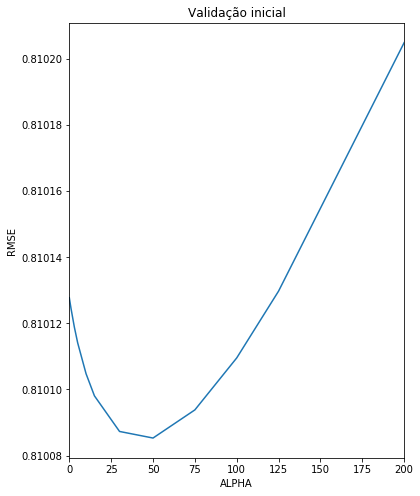

In [1499]:
cv_ridge = pd.Series(cv_ridge, index = alphas)
cv_ridge.plot(title = "Validação inicial")
plt.xlabel("ALPHA")
plt.ylabel("RMSE")

On the fourth Ridge model, it is found a mean RMSE of 0.8101. 

In [1438]:
cv_ridge.mean()

0.8101197673871825

### Fourth Lasso Model

In [1440]:
from sklearn.linear_model import LassoCV, LassoLarsCV

model_lasso = LassoCV(alphas = [0.00001,0.0001,0.001,0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75, 100, 125, 200]).fit(X_train, y)

On the fourth Lasso model, it is found a mean RMSE of 0.8125. 

In [1441]:
rmse_cv(model_lasso).mean()

0.81258296324798307

In [1442]:
coef = pd.Series(model_lasso.coef_, index = X_train.columns)
print("O modelo Lasso escolheu " + str(sum(coef != 0)) + " atributos e eliminou os outros " +  str(sum(coef == 0)) + " atributos do dataset para construção do modelo.")


O modelo Lasso escolheu 9 atributos e eliminou os outros 24 atributos do dataset para construção do modelo.


In [1443]:

#imp_coef = pd.concat([coef.sort_values().head(3),
#                     coef.sort_values().tail(3)])
imp_coef = pd.concat([coef.sort_values().head(9),
                     coef.sort_values().tail(24)])

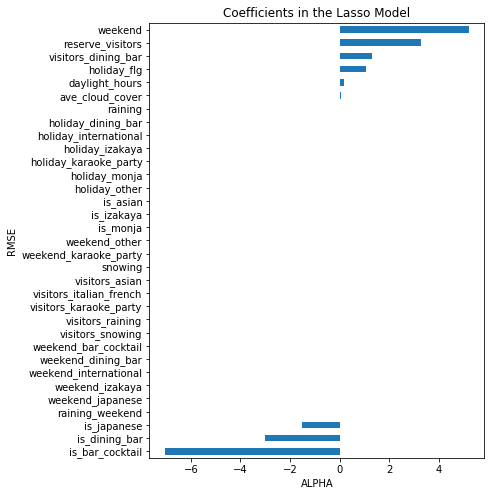

In [1444]:
matplotlib.rcParams['figure.figsize'] = (6.0, 8.0)
imp_coef.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")
plt.xlabel("ALPHA")
plt.ylabel("RMSE")

In [273]:
v_r_rest_info_weather.air_store_id.describe()

count                   252108
unique                     829
top       air_5c817ef28f236bdf
freq                       477
Name: air_store_id, dtype: object

### 5. Submission

On this section is prepeared the cvs file that is submitteed to the Kaggle competition

In [1445]:
air_visit_data_csv.air_store_id.describe()

count                   252108
unique                     829
top       air_5c817ef28f236bdf
freq                       477
Name: air_store_id, dtype: object

In [1446]:
air_reserve_csv.air_store_id.describe()

count                    92378
unique                     314
top       air_8093d0b565e9dbdf
freq                      2263
Name: air_store_id, dtype: object

In [1447]:
sample_submission_csv.id.describe()

count                               32019
unique                              32019
top       air_a21ffca0bea1661a_2017-05-30
freq                                    1
Name: id, dtype: object

In [1448]:
sample_submission_copy = sample_submission_csv.copy()

sample_submission_copy['air_store_id'] = sample_submission_copy.id.str[0:20]
sample_submission_copy['calendar_date'] = sample_submission_copy.id.str[21:31]

In [1449]:
#Weekday insertion

sample_submission_copy = pd.merge(sample_submission_copy, date_info_copy, on='calendar_date')

sample_submission_copy['day_of_week'] = sample_submission_copy.day_of_week.str

sample_submission_copy['weekday_flg'] = pd.to_datetime(sample_submission_copy.calendar_date)

sample_submission_copy['weekday_flg'] = sample_submission_copy.weekday_flg.dt.dayofweek

sample_submission_copy['weekday_flg'] = sample_submission_copy['weekday_flg'].astype(int)

sample_submission_copy['weekend'] = ((sample_submission_copy['weekday_flg']) // 5 == 1).astype(float)


In [1450]:
#Air reservations insertion
air_reserve_test = air_reserve_copy_final.copy()

In [1451]:
air_reserve_test['from_air_database'] = 1
air_reserve_test['from_hpg_database'] = 0

In [1452]:
air_reserve_test.head()

,just_date,air_store_id,reserve_visitors,from_air_database,from_hpg_database
0,2016-01-01,air_877f79706adbfb06,3,1,0
1,2016-01-01,air_db4b38ebe7a7ceff,9,1,0
2,2016-01-01,air_db80363d35f10926,5,1,0
3,2016-01-02,air_2b8b29ddfd35018e,6,1,0
4,2016-01-02,air_3bb99a1fe0583897,4,1,0


In [1453]:
#HPG reservations insertion
hpg_reserve_test = hpg_reserve_copy_merged_final.copy()

In [1454]:
hpg_reserve_test['from_air_database'] = 0
hpg_reserve_test['from_hpg_database'] = 1

In [1455]:
hpg_reserve_test.head()

,just_date,air_store_id,reserve_visitors,from_air_database,from_hpg_database
0,2016-01-01,air_08cb3c4ee6cd6a22,2,0,1
1,2016-01-01,air_db80363d35f10926,4,0,1
2,2016-01-02,air_08cb3c4ee6cd6a22,6,0,1
3,2016-01-02,air_1033310359ceeac1,2,0,1
4,2016-01-02,air_37189c92b6c761ec,20,0,1


In [1456]:
reserve_test = air_reserve_test.append(hpg_reserve_test)

In [1457]:
reserve_test = reserve_test.groupby(['just_date', 'air_store_id'], as_index=False)

reserve_test_final = reserve_test.aggregate(np.sum)

In [1458]:
reserve_test_final.head()

,just_date,air_store_id,reserve_visitors,from_air_database,from_hpg_database
0,2016-01-01,air_08cb3c4ee6cd6a22,2,0,1
1,2016-01-01,air_877f79706adbfb06,3,1,0
2,2016-01-01,air_db4b38ebe7a7ceff,9,1,0
3,2016-01-01,air_db80363d35f10926,9,1,1
4,2016-01-02,air_08cb3c4ee6cd6a22,6,0,1


In [1459]:
#join with sample submission

sample_submission_copy.count()

id               32019
visitors         32019
air_store_id     32019
calendar_date    32019
day_of_week      32019
holiday_flg      32019
just_date        32019
weekday_flg      32019
weekend          32019
dtype: int64

In [1460]:
sample_submission_merged = pd.merge(sample_submission_copy, reserve_test_final, how = 'left', on = ['air_store_id','just_date'])

In [1461]:
sample_submission_merged.count()

id                   32019
visitors             32019
air_store_id         32019
calendar_date        32019
day_of_week          32019
holiday_flg          32019
just_date            32019
weekday_flg          32019
weekend              32019
reserve_visitors      1269
from_air_database     1269
from_hpg_database     1269
dtype: int64

In [1462]:
sample_submission_merged['reserve_visitors'] = sample_submission_merged.reserve_visitors.fillna(0)
sample_submission_merged['from_air_database'] = sample_submission_merged.from_air_database.fillna(0)
sample_submission_merged['from_hpg_database'] = sample_submission_merged.from_hpg_database.fillna(0)

In [1466]:
#insertion of locations, weather
r_t_rest_info = pd.merge(sample_submission_merged, air_rest_copy, on='air_store_id')

In [1467]:
r_t_rest_info.head()

,id,visitors,air_store_id,calendar_date,day_of_week,holiday_flg,just_date,weekday_flg,weekend,reserve_visitors,from_air_database,from_hpg_database,air_genre_name,air_area_name,latitude,longitude
0,air_00a91d42b08b08d9_2017-04-23,0,air_00a91d42b08b08d9,2017-04-23,<pandas.core.strings.StringMethods object at 0...,0,2017-04-23,6,1.0,0.0,0.0,0.0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,35.694003,139.753595
1,air_00a91d42b08b08d9_2017-04-24,0,air_00a91d42b08b08d9,2017-04-24,<pandas.core.strings.StringMethods object at 0...,0,2017-04-24,0,0.0,0.0,0.0,0.0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,35.694003,139.753595
2,air_00a91d42b08b08d9_2017-04-25,0,air_00a91d42b08b08d9,2017-04-25,<pandas.core.strings.StringMethods object at 0...,0,2017-04-25,1,0.0,0.0,0.0,0.0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,35.694003,139.753595
3,air_00a91d42b08b08d9_2017-04-26,0,air_00a91d42b08b08d9,2017-04-26,<pandas.core.strings.StringMethods object at 0...,0,2017-04-26,2,0.0,0.0,0.0,0.0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,35.694003,139.753595
4,air_00a91d42b08b08d9_2017-04-27,0,air_00a91d42b08b08d9,2017-04-27,<pandas.core.strings.StringMethods object at 0...,0,2017-04-27,3,0.0,0.0,0.0,0.0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,35.694003,139.753595


In [1468]:
weather.head()

,just_date,t_media,t_max,t_min,pp_total_1,pp_total_2,snow_amount_1,snow_amount_2,daylight_hours,deepest_snow_cover_1,deepest_snow_cover_2,ave_wind_speed,ave_cloud_cover,local,pp_total,snow_amount,deepest_snow_cover
0,2016-01-01,2.4,6.1,-1.5,0.0,0.0,0.0,1.0,3.7,0.0,1.0,2.8,4.0,Sendai-shi,0.0,1.0,1.0
1,2016-01-02,6.2,10.4,-0.1,0.0,0.0,0.0,1.0,0.8,0.0,1.0,3.0,6.3,Sendai-shi,0.0,1.0,1.0
2,2016-01-03,8.6,12.5,5.9,0.0,0.0,0.0,1.0,2.8,0.0,1.0,1.8,8.3,Sendai-shi,0.0,1.0,1.0
3,2016-01-04,7.5,12.7,4.4,0.0,0.0,0.0,1.0,2.5,0.0,1.0,2.8,8.8,Sendai-shi,0.0,1.0,1.0
4,2016-01-05,4.6,8.0,2.1,0.0,0.0,0.0,1.0,3.7,0.0,1.0,3.4,6.8,Sendai-shi,0.0,1.0,1.0


In [1469]:
r_t_rest_info['local'] = r_t_rest_info['air_area_name'].map(lambda x: str(x).split()[1])
r_t_rest_info['district'] = r_t_rest_info['air_area_name'].map(lambda x: str(x).split()[0])

r_t_rest_info['year'] = r_t_rest_info['just_date'].map(lambda x: str(x).split('-')[0])
r_t_rest_info['month'] = r_t_rest_info['just_date'].map(lambda x: str(x).split('-')[1])

r_t_rest_info_weather = pd.merge(r_t_rest_info, weather, how='left', on=['just_date','local'])

In [1470]:
r_t_rest_info_weather.count()

id                      32019
visitors                32019
air_store_id            32019
calendar_date           32019
day_of_week             32019
holiday_flg             32019
just_date               32019
weekday_flg             32019
weekend                 32019
reserve_visitors        32019
from_air_database       32019
from_hpg_database       32019
air_genre_name          32019
air_area_name           32019
latitude                32019
longitude               32019
local                   32019
district                32019
year                    32019
month                   32019
t_media                 24570
t_max                   24570
t_min                   24570
pp_total_1              28392
pp_total_2              22659
snow_amount_1           22815
snow_amount_2           21450
daylight_hours          24570
deepest_snow_cover_1    21294
deepest_snow_cover_2    21294
ave_wind_speed          22503
ave_cloud_cover         21294
pp_total                22659
snow_amoun

In [1472]:
r_t_rest_grouped_by_district = r_t_rest_info_weather.groupby(['just_date', 'district'], as_index=False)
r_t_rest_grouped_by_district_final = r_t_rest_grouped_by_district.aggregate(np.mean)

r_t_rest_grouped_by_country = r_t_rest_info_weather.groupby(['just_date'], as_index=False)
r_t_rest_grouped_by_country_final = r_t_rest_grouped_by_country.aggregate(np.mean)


In [1473]:
r_t_rest_info_weather = fill_na('pp_total', r_t_rest_info_weather, r_t_rest_grouped_by_district_final, r_t_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 560
valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo 625
valor nulo

valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nulo 1167
valor nulo 1168
valor nulo 1169
valor nulo 1170
valor nulo 1171
valor nulo 1172
valor nulo 1173
valor nulo 1174
valor nulo 1175
valor nulo 1176
valor nulo 1177
valor nulo 1178
valor nulo 1179
valor nulo 1180
valor nu

valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nulo 1685
valor nulo 1686
valor nulo 1687
valor nulo 1688
valor nulo 1689
valor nulo 1690
valor nulo 1691
valor nulo 1692
valor nulo 1693
valor nulo 1694
valor nulo 1695
valor nulo 1696
valor nulo 1697
valor nulo 1698
valor nulo 1699
valor nulo 1700
valor nu

valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nulo 2201
valor nulo 2202
valor nulo 2203
valor nulo 2204
valor nulo 2205
valor nulo 2206
valor nulo 2207
valor nulo 2208
valor nulo 2209
valor nulo 2210
valor nulo 2211
valor nulo 2212
valor nulo 2213
valor nulo 2214
valor nulo 2215
valor nulo 2216
valor nulo 2217
valor nulo 2218
valor nulo 2219
valor nulo 2220
valor nulo 2221
valor nu

valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nulo 2718
valor nulo 2719
valor nulo 2720
valor nulo 2721
valor nulo 2722
valor nulo 2723
valor nulo 2724
valor nulo 2725
valor nulo 2726
valor nulo 2727
valor nulo 2728
valor nulo 2729
valor nulo 2730
valor nulo 2731
valor nulo 2732
valor nulo 2733
valor nulo 2734
valor nulo 2735
valor nulo 2736
valor nulo 2737
valor nulo 2738
valor nulo 2739
valor nulo 2740
valor nulo 2741
valor nulo 2742
valor nulo 2743
valor nulo 2744
valor nulo 2745
valor nu

valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nulo 3233
valor nulo 3234
valor nulo 3235
valor nulo 3236
valor nulo 3237
valor nulo 3238
valor nulo 3239
valor nulo 3240
valor nulo 3241
valor nulo 3242
valor nulo 3243
valor nulo 3244
valor nulo 3245
valor nulo 3246
valor nulo 3247
valor nulo 3248
valor nulo 3249
valor nulo 3250
valor nulo 3251
valor nulo 3252
valor nulo 3253
valor nulo 3254
valor nulo 3255
valor nulo 3256
valor nulo 3257
valor nulo 3258
valor nulo 3259
valor nulo 3260
valor nulo 3261
valor nulo 3262
valor nulo 3263
valor nulo 3264
valor nulo 3265
valor nulo 3266
valor nulo 3267
valor nu

valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nulo 3753
valor nulo 3754
valor nulo 3755
valor nulo 3756
valor nulo 3757
valor nulo 3758
valor nulo 3759
valor nulo 3760
valor nulo 3761
valor nulo 3762
valor nulo 3763
valor nulo 3764
valor nulo 3765
valor nulo 3766
valor nulo 3767
valor nulo 3768
valor nulo 3769
valor nulo 3770
valor nulo 3771
valor nulo 3772
valor nulo 3773
valor nulo 3774
valor nulo 3775
valor nulo 3776
valor nulo 3777
valor nulo 3778
valor nulo 3779
valor nulo 3780
valor nulo 3781
valor nulo 3782
valor nu

valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nulo 4271
valor nulo 4272
valor nulo 4273
valor nulo 4274
valor nulo 4275
valor nulo 4276
valor nulo 4277
valor nulo 4278
valor nulo 4279
valor nulo 4280
valor nulo 4281
valor nulo 4282
valor nulo 4283
valor nulo 4284
valor nulo 4285
valor nulo 4286
valor nulo 4287
valor nulo 4288
valor nulo 4289
valor nulo 4290
valor nulo 4291
valor nulo 4292
valor nulo 4293
valor nulo 4294
valor nulo 4295
valor nulo 4296
valor nulo 4297
valor nu

valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nulo 4787
valor nulo 4788
valor nulo 4789
valor nulo 4790
valor nulo 4791
valor nulo 4792
valor nulo 4793
valor nulo 4794
valor nulo 4795
valor nulo 4796
valor nulo 4797
valor nulo 4798
valor nulo 4799
valor nulo 4800
valor nulo 4801
valor nulo 4802
valor nulo 4803
valor nulo 4804
valor nulo 4805
valor nulo 4806
valor nulo 4807
valor nulo 4808
valor nulo 4809
valor nulo 4810
valor nulo 4811
valor nulo 4812
valor nulo 4813
valor nulo 4814
valor nulo 4815
valor nulo 4816
valor nulo 4817
valor nulo 4818
valor nulo 4819
valor nulo 4820
valor nulo 4821
valor nulo 4822
valor nulo 4823
valor nulo 4824
valor nulo 4825
valor nulo 4826
valor nulo 4827
valor nulo 4828
valor nu

valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nulo 5304
valor nulo 5305
valor nulo 5306
valor nulo 5307
valor nulo 5308
valor nulo 5309
valor nulo 5310
valor nulo 5311
valor nulo 5312
valor nulo 5313
valor nulo 5314
valor nulo 5315
valor nulo 5316
valor nulo 5317
valor nulo 5318
valor nulo 5319
valor nulo 5320
valor nulo 5321
valor nulo 5322
valor nulo 5323
valor nulo 5324
valor nulo 5325
valor nulo 5326
valor nulo 5327
valor nulo 5328
valor nulo 5329
valor nulo 5330
valor nulo 5331
valor nulo 5332
valor nulo 5333
valor nulo 5334
valor nulo 5335
valor nulo 5336
valor nulo 5337
valor nulo 5338
valor nulo 5339
valor nulo 5340
valor nulo 5341
valor nulo 5342
valor nulo 5343
valor nulo 5344
valor nulo 5345
valor nulo 5346
valor nulo 5347
valor nulo 5348
valor nulo 5349
valor nulo 5350
valor nulo 5351
valor nulo 5352
valor nulo 5353
valor nu

valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nulo 5819
valor nulo 5820
valor nulo 5821
valor nulo 5822
valor nulo 5823
valor nulo 5824
valor nulo 5825
valor nulo 5826
valor nulo 5827
valor nulo 5828
valor nulo 5829
valor nulo 5830
valor nulo 5831
valor nulo 5832
valor nulo 5833
valor nulo 5834
valor nulo 5835
valor nulo 5836
valor nulo 5837
valor nulo 5838
valor nulo 5839
valor nulo 5840
valor nulo 5841
valor nulo 5842
valor nulo 5843
valor nulo 5844
valor nulo 5845
valor nulo 5846
valor nulo 5847
valor nulo 5848
valor nulo 5849
valor nulo 5850
valor nulo 5851
valor nulo 5852
valor nulo 5853
valor nulo 5854
valor nulo 5855
valor nulo 5856
valor nulo 5857
valor nulo 5858
valor nulo 5859
valor nulo 5860
valor nulo 5861
valor nulo 5862
valor nulo 5863
valor nulo 5864
valor nulo 5865
valor nulo 5866
valor nulo 5867
valor nulo 5868
valor nulo 5869
valor nulo 5870
valor nu

valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nulo 6338
valor nulo 6339
valor nulo 6340
valor nulo 6341
valor nulo 6342
valor nulo 6343
valor nulo 6344
valor nulo 6345
valor nulo 6346
valor nulo 6347
valor nulo 6348
valor nulo 6349
valor nulo 6350
valor nulo 6351
valor nulo 6352
valor nulo 6353
valor nulo 6354
valor nulo 6355
valor nulo 6356
valor nulo 6357
valor nulo 6358
valor nulo 6359
valor nulo 6360
valor nulo 6361
valor nulo 6362
valor nulo 6363
valor nulo 6364
valor nulo 6365
valor nulo 6366
valor nulo 6367
valor nulo 6368
valor nulo 6369
valor nulo 6370
valor nulo 6371
valor nulo 6372
valor nulo 6373
valor nulo 6374
valor nulo 6375
valor nulo 6376
valor nulo 6377
valor nulo 6378
valor nulo 6379
valor nulo 6380
valor nulo 6381
valor nulo 6382
valor nulo 6383
valor nu

valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nulo 6856
valor nulo 6857
valor nulo 6858
valor nulo 6859
valor nulo 6860
valor nulo 6861
valor nulo 6862
valor nulo 6863
valor nulo 6864
valor nulo 6865
valor nulo 6866
valor nulo 6867
valor nulo 6868
valor nulo 6869
valor nulo 6870
valor nulo 6871
valor nulo 6872
valor nulo 6873
valor nulo 6874
valor nulo 6875
valor nulo 6876
valor nulo 6877
valor nulo 6878
valor nulo 6879
valor nulo 6880
valor nulo 6881
valor nulo 6882
valor nulo 6883
valor nulo 6884
valor nulo 6885
valor nulo 6886
valor nulo 6887
valor nulo 6888
valor nulo 6889
valor nulo 6890
valor nulo 6891
valor nulo 6892
valor nulo 6893
valor nulo 6894
valor nulo 6895
valor nulo 6896
valor nulo 6897
valor nulo 6898
valor nulo 6899
valor nulo 6900
valor nulo 6901
valor nulo 6902
valor nulo 6903
valor nulo 6904
valor nulo 6905
valor nulo 6906
valor nulo 6907
valor nulo 6908
valor nulo 6909
valor nulo 6910
valor nulo 6911
valor nulo 6912
valor nulo 6913
valor nu

valor nulo 7369
valor nulo 7370
valor nulo 7371
valor nulo 7372
valor nulo 7373
valor nulo 7374
valor nulo 7375
valor nulo 7376
valor nulo 7377
valor nulo 7378
valor nulo 7379
valor nulo 7380
valor nulo 7381
valor nulo 7382
valor nulo 7383
valor nulo 7384
valor nulo 7385
valor nulo 7386
valor nulo 7387
valor nulo 7388
valor nulo 7389
valor nulo 7390
valor nulo 7391
valor nulo 7392
valor nulo 7393
valor nulo 7394
valor nulo 7395
valor nulo 7396
valor nulo 7397
valor nulo 7398
valor nulo 7399
valor nulo 7400
valor nulo 7401
valor nulo 7402
valor nulo 7403
valor nulo 7404
valor nulo 7405
valor nulo 7406
valor nulo 7407
valor nulo 7408
valor nulo 7409
valor nulo 7410
valor nulo 7411
valor nulo 7412
valor nulo 7413
valor nulo 7414
valor nulo 7415
valor nulo 7416
valor nulo 7417
valor nulo 7418
valor nulo 7419
valor nulo 7420
valor nulo 7421
valor nulo 7422
valor nulo 7423
valor nulo 7424
valor nulo 7425
valor nulo 7426
valor nulo 7427
valor nulo 7428
valor nulo 7429
valor nulo 7430
valor nu

valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nulo 7886
valor nulo 7887
valor nulo 7888
valor nulo 7889
valor nulo 7890
valor nulo 7891
valor nulo 7892
valor nulo 7893
valor nulo 7894
valor nulo 7895
valor nulo 7896
valor nulo 7897
valor nulo 7898
valor nulo 7899
valor nulo 7900
valor nulo 7901
valor nulo 7902
valor nulo 7903
valor nulo 7904
valor nulo 7905
valor nulo 7906
valor nulo 7907
valor nulo 7908
valor nulo 7909
valor nulo 7910
valor nulo 7911
valor nulo 7912
valor nulo 7913
valor nulo 7914
valor nulo 7915
valor nulo 7916
valor nulo 7917
valor nulo 7918
valor nulo 7919
valor nulo 7920
valor nulo 7921
valor nulo 7922
valor nulo 7923
valor nulo 7924
valor nulo 7925
valor nulo 7926
valor nulo 7927
valor nulo 7928
valor nulo 7929
valor nulo 7930
valor nulo 7931
valor nulo 7932
valor nulo 7933
valor nulo 7934
valor nulo 7935
valor nulo 7936
valor nulo 7937
valor nulo 7938
valor nulo 7939
valor nulo 7940
valor nulo 7941
valor nulo 7942
valor nulo 7943
valor nu

valor nulo 8406
valor nulo 8407
valor nulo 8408
valor nulo 8409
valor nulo 8410
valor nulo 8411
valor nulo 8412
valor nulo 8413
valor nulo 8414
valor nulo 8415
valor nulo 8416
valor nulo 8417
valor nulo 8418
valor nulo 8419
valor nulo 8420
valor nulo 8421
valor nulo 8422
valor nulo 8423
valor nulo 8424
valor nulo 8425
valor nulo 8426
valor nulo 8427
valor nulo 8428
valor nulo 8429
valor nulo 8430
valor nulo 8431
valor nulo 8432
valor nulo 8433
valor nulo 8434
valor nulo 8435
valor nulo 8436
valor nulo 8437
valor nulo 8438
valor nulo 8439
valor nulo 8440
valor nulo 8441
valor nulo 8442
valor nulo 8443
valor nulo 8444
valor nulo 8445
valor nulo 8446
valor nulo 8447
valor nulo 8448
valor nulo 8449
valor nulo 8450
valor nulo 8451
valor nulo 8452
valor nulo 8453
valor nulo 8454
valor nulo 8455
valor nulo 8456
valor nulo 8457
valor nulo 8458
valor nulo 8459
valor nulo 8460
valor nulo 8461
valor nulo 8462
valor nulo 8463
valor nulo 8464
valor nulo 8465
valor nulo 8466
valor nulo 8467
valor nu

valor nulo 8929
valor nulo 8930
valor nulo 8931
valor nulo 8932
valor nulo 8933
valor nulo 8934
valor nulo 8935
valor nulo 8936
valor nulo 8937
valor nulo 8938
valor nulo 8939
valor nulo 8940
valor nulo 8941
valor nulo 8942
valor nulo 8943
valor nulo 8944
valor nulo 8945
valor nulo 8946
valor nulo 8947
valor nulo 8948
valor nulo 8949
valor nulo 8950
valor nulo 8951
valor nulo 8952
valor nulo 8953
valor nulo 8954
valor nulo 8955
valor nulo 8956
valor nulo 8957
valor nulo 8958
valor nulo 8959
valor nulo 8960
valor nulo 8961
valor nulo 8962
valor nulo 8963
valor nulo 8964
valor nulo 8965
valor nulo 8966
valor nulo 8967
valor nulo 8968
valor nulo 8969
valor nulo 8970
valor nulo 8971
valor nulo 8972
valor nulo 8973
valor nulo 8974
valor nulo 8975
valor nulo 8976
valor nulo 8977
valor nulo 8978
valor nulo 8979
valor nulo 8980
valor nulo 8981
valor nulo 8982
valor nulo 8983
valor nulo 8984
valor nulo 8985
valor nulo 8986
valor nulo 8987
valor nulo 8988
valor nulo 8989
valor nulo 8990
valor nu

In [1474]:
r_t_rest_info_weather = fill_na('snow_amount', r_t_rest_info_weather, r_t_rest_grouped_by_district_final, r_t_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 555
valor nulo 556
valor nulo 557
valor nulo 558
valor nulo 559
valor nulo 560
valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo

valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nulo 1167
valor nulo 1168
valor nulo 1169
valor nulo 1170
valor nulo 1171
valor nu

valor nulo 1625
valor nulo 1626
valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nulo 1685
valor nulo 1686
valor nu

valor nulo 2137
valor nulo 2138
valor nulo 2139
valor nulo 2140
valor nulo 2141
valor nulo 2142
valor nulo 2143
valor nulo 2144
valor nulo 2145
valor nulo 2146
valor nulo 2147
valor nulo 2148
valor nulo 2149
valor nulo 2150
valor nulo 2151
valor nulo 2152
valor nulo 2153
valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nu

valor nulo 2655
valor nulo 2656
valor nulo 2657
valor nulo 2658
valor nulo 2659
valor nulo 2660
valor nulo 2661
valor nulo 2662
valor nulo 2663
valor nulo 2664
valor nulo 2665
valor nulo 2666
valor nulo 2667
valor nulo 2668
valor nulo 2669
valor nulo 2670
valor nulo 2671
valor nulo 2672
valor nulo 2673
valor nulo 2674
valor nulo 2675
valor nulo 2676
valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nu

valor nulo 3168
valor nulo 3169
valor nulo 3170
valor nulo 3171
valor nulo 3172
valor nulo 3173
valor nulo 3174
valor nulo 3175
valor nulo 3176
valor nulo 3177
valor nulo 3178
valor nulo 3179
valor nulo 3180
valor nulo 3181
valor nulo 3182
valor nulo 3183
valor nulo 3184
valor nulo 3185
valor nulo 3186
valor nulo 3187
valor nulo 3188
valor nulo 3189
valor nulo 3190
valor nulo 3191
valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nu

valor nulo 3687
valor nulo 3688
valor nulo 3689
valor nulo 3690
valor nulo 3691
valor nulo 3692
valor nulo 3693
valor nulo 3694
valor nulo 3695
valor nulo 3696
valor nulo 3697
valor nulo 3698
valor nulo 3699
valor nulo 3700
valor nulo 3701
valor nulo 3702
valor nulo 3703
valor nulo 3704
valor nulo 3705
valor nulo 3706
valor nulo 3707
valor nulo 3708
valor nulo 3709
valor nulo 3710
valor nulo 3711
valor nulo 3712
valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nu

valor nulo 4213
valor nulo 4214
valor nulo 4215
valor nulo 4216
valor nulo 4217
valor nulo 4218
valor nulo 4219
valor nulo 4220
valor nulo 4221
valor nulo 4222
valor nulo 4223
valor nulo 4224
valor nulo 4225
valor nulo 4226
valor nulo 4227
valor nulo 4228
valor nulo 4229
valor nulo 4230
valor nulo 4231
valor nulo 4232
valor nulo 4233
valor nulo 4234
valor nulo 4235
valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nulo 4271
valor nulo 4272
valor nulo 4273
valor nulo 4274
valor nu

valor nulo 4744
valor nulo 4745
valor nulo 4746
valor nulo 4747
valor nulo 4748
valor nulo 4749
valor nulo 4750
valor nulo 4751
valor nulo 4752
valor nulo 4753
valor nulo 4754
valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nulo 4787
valor nulo 4788
valor nulo 4789
valor nulo 4790
valor nulo 4791
valor nulo 4792
valor nulo 4793
valor nulo 4794
valor nulo 4795
valor nulo 4796
valor nulo 4797
valor nulo 4798
valor nulo 4799
valor nulo 4800
valor nulo 4801
valor nulo 4802
valor nulo 4803
valor nulo 4804
valor nulo 4805
valor nu

valor nulo 5258
valor nulo 5259
valor nulo 5260
valor nulo 5261
valor nulo 5262
valor nulo 5263
valor nulo 5264
valor nulo 5265
valor nulo 5266
valor nulo 5267
valor nulo 5268
valor nulo 5269
valor nulo 5270
valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nulo 5304
valor nulo 5305
valor nulo 5306
valor nulo 5307
valor nulo 5308
valor nulo 5309
valor nulo 5310
valor nulo 5311
valor nulo 5312
valor nulo 5313
valor nulo 5314
valor nulo 5315
valor nulo 5316
valor nulo 5317
valor nulo 5318
valor nulo 5319
valor nu

valor nulo 5778
valor nulo 5779
valor nulo 5780
valor nulo 5781
valor nulo 5782
valor nulo 5783
valor nulo 5784
valor nulo 5785
valor nulo 5786
valor nulo 5787
valor nulo 5788
valor nulo 5789
valor nulo 5790
valor nulo 5791
valor nulo 5792
valor nulo 5793
valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nulo 5819
valor nulo 5820
valor nulo 5821
valor nulo 5822
valor nulo 5823
valor nulo 5824
valor nulo 5825
valor nulo 5826
valor nulo 5827
valor nulo 5828
valor nulo 5829
valor nulo 5830
valor nulo 5831
valor nulo 5832
valor nulo 5833
valor nulo 5834
valor nulo 5835
valor nulo 5836
valor nulo 5837
valor nulo 5838
valor nulo 5839
valor nu

valor nulo 6300
valor nulo 6301
valor nulo 6302
valor nulo 6303
valor nulo 6304
valor nulo 6305
valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nulo 6338
valor nulo 6339
valor nulo 6340
valor nulo 6341
valor nulo 6342
valor nulo 6343
valor nulo 6344
valor nulo 6345
valor nulo 6346
valor nulo 6347
valor nulo 6348
valor nulo 6349
valor nulo 6350
valor nulo 6351
valor nulo 6352
valor nulo 6353
valor nulo 6354
valor nulo 6355
valor nulo 6356
valor nulo 6357
valor nulo 6358
valor nulo 6359
valor nulo 6360
valor nulo 6361
valor nu

valor nulo 6822
valor nulo 6823
valor nulo 6824
valor nulo 6825
valor nulo 6826
valor nulo 6827
valor nulo 6828
valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nulo 6856
valor nulo 6857
valor nulo 6858
valor nulo 6859
valor nulo 6860
valor nulo 6861
valor nulo 6862
valor nulo 6863
valor nulo 6864
valor nulo 6865
valor nulo 6866
valor nulo 6867
valor nulo 6868
valor nulo 6869
valor nulo 6870
valor nulo 6871
valor nulo 6872
valor nulo 6873
valor nulo 6874
valor nulo 6875
valor nulo 6876
valor nulo 6877
valor nulo 6878
valor nulo 6879
valor nulo 6880
valor nulo 6881
valor nulo 6882
valor nulo 6883
valor nu

valor nulo 7337
valor nulo 7338
valor nulo 7339
valor nulo 7340
valor nulo 7341
valor nulo 7342
valor nulo 7343
valor nulo 7344
valor nulo 7345
valor nulo 7346
valor nulo 7347
valor nulo 7348
valor nulo 7349
valor nulo 7350
valor nulo 7351
valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nulo 7370
valor nulo 7371
valor nulo 7372
valor nulo 7373
valor nulo 7374
valor nulo 7375
valor nulo 7376
valor nulo 7377
valor nulo 7378
valor nulo 7379
valor nulo 7380
valor nulo 7381
valor nulo 7382
valor nulo 7383
valor nulo 7384
valor nulo 7385
valor nulo 7386
valor nulo 7387
valor nulo 7388
valor nulo 7389
valor nulo 7390
valor nulo 7391
valor nulo 7392
valor nulo 7393
valor nulo 7394
valor nulo 7395
valor nulo 7396
valor nulo 7397
valor nulo 7398
valor nu

valor nulo 7854
valor nulo 7855
valor nulo 7856
valor nulo 7857
valor nulo 7858
valor nulo 7859
valor nulo 7860
valor nulo 7861
valor nulo 7862
valor nulo 7863
valor nulo 7864
valor nulo 7865
valor nulo 7866
valor nulo 7867
valor nulo 7868
valor nulo 7869
valor nulo 7870
valor nulo 7871
valor nulo 7872
valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nulo 7886
valor nulo 7887
valor nulo 7888
valor nulo 7889
valor nulo 7890
valor nulo 7891
valor nulo 7892
valor nulo 7893
valor nulo 7894
valor nulo 7895
valor nulo 7896
valor nulo 7897
valor nulo 7898
valor nulo 7899
valor nulo 7900
valor nulo 7901
valor nulo 7902
valor nulo 7903
valor nulo 7904
valor nulo 7905
valor nulo 7906
valor nulo 7907
valor nulo 7908
valor nulo 7909
valor nulo 7910
valor nulo 7911
valor nulo 7912
valor nulo 7913
valor nulo 7914
valor nulo 7915
valor nu

valor nulo 8367
valor nulo 8368
valor nulo 8369
valor nulo 8370
valor nulo 8371
valor nulo 8372
valor nulo 8373
valor nulo 8374
valor nulo 8375
valor nulo 8376
valor nulo 8377
valor nulo 8378
valor nulo 8379
valor nulo 8380
valor nulo 8381
valor nulo 8382
valor nulo 8383
valor nulo 8384
valor nulo 8385
valor nulo 8386
valor nulo 8387
valor nulo 8388
valor nulo 8389
valor nulo 8390
valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nulo 8400
valor nulo 8401
valor nulo 8402
valor nulo 8403
valor nulo 8404
valor nulo 8405
valor nulo 8406
valor nulo 8407
valor nulo 8408
valor nulo 8409
valor nulo 8410
valor nulo 8411
valor nulo 8412
valor nulo 8413
valor nulo 8414
valor nulo 8415
valor nulo 8416
valor nulo 8417
valor nulo 8418
valor nulo 8419
valor nulo 8420
valor nulo 8421
valor nulo 8422
valor nulo 8423
valor nulo 8424
valor nulo 8425
valor nulo 8426
valor nulo 8427
valor nulo 8428
valor nu

valor nulo 8887
valor nulo 8888
valor nulo 8889
valor nulo 8890
valor nulo 8891
valor nulo 8892
valor nulo 8893
valor nulo 8894
valor nulo 8895
valor nulo 8896
valor nulo 8897
valor nulo 8898
valor nulo 8899
valor nulo 8900
valor nulo 8901
valor nulo 8902
valor nulo 8903
valor nulo 8904
valor nulo 8905
valor nulo 8906
valor nulo 8907
valor nulo 8908
valor nulo 8909
valor nulo 8910
valor nulo 8911
valor nulo 8912
valor nulo 8913
valor nulo 8914
valor nulo 8915
valor nulo 8916
valor nulo 8917
valor nulo 8918
valor nulo 8919
valor nulo 8920
valor nulo 8921
valor nulo 8922
valor nulo 8923
valor nulo 8924
valor nulo 8925
valor nulo 8926
valor nulo 8927
valor nulo 8928
valor nulo 8929
valor nulo 8930
valor nulo 8931
valor nulo 8932
valor nulo 8933
valor nulo 8934
valor nulo 8935
valor nulo 8936
valor nulo 8937
valor nulo 8938
valor nulo 8939
valor nulo 8940
valor nulo 8941
valor nulo 8942
valor nulo 8943
valor nulo 8944
valor nulo 8945
valor nulo 8946
valor nulo 8947
valor nulo 8948
valor nu

valor nulo 9410
valor nulo 9411
valor nulo 9412
valor nulo 9413
valor nulo 9414
valor nulo 9415
valor nulo 9416
valor nulo 9417
valor nulo 9418
valor nulo 9419
valor nulo 9420
valor nulo 9421
valor nulo 9422
valor nulo 9423
valor nulo 9424
valor nulo 9425
valor nulo 9426
valor nulo 9427
valor nulo 9428
valor nulo 9429
valor nulo 9430
valor nulo 9431
valor nulo 9432
valor nulo 9433
valor nulo 9434
valor nulo 9435
valor nulo 9436
valor nulo 9437
valor nulo 9438
valor nulo 9439
valor nulo 9440
valor nulo 9441
valor nulo 9442
valor nulo 9443
valor nulo 9444
valor nulo 9445
valor nulo 9446
valor nulo 9447
valor nulo 9448
valor nulo 9449
valor nulo 9450
valor nulo 9451
valor nulo 9452
valor nulo 9453
valor nulo 9454
valor nulo 9455
valor nulo 9456
valor nulo 9457
valor nulo 9458
valor nulo 9459
valor nulo 9460
valor nulo 9461
valor nulo 9462
valor nulo 9463
valor nulo 9464
valor nulo 9465
valor nulo 9466
valor nulo 9467
valor nulo 9468
valor nulo 9469
valor nulo 9470
valor nulo 9471
valor nu

valor nulo 9924
valor nulo 9925
valor nulo 9926
valor nulo 9927
valor nulo 9928
valor nulo 9929
valor nulo 9930
valor nulo 9931
valor nulo 9932
valor nulo 9933
valor nulo 9934
valor nulo 9935
valor nulo 9936
valor nulo 9937
valor nulo 9938
valor nulo 9939
valor nulo 9940
valor nulo 9941
valor nulo 9942
valor nulo 9943
valor nulo 9944
valor nulo 9945
valor nulo 9946
valor nulo 9947
valor nulo 9948
valor nulo 9949
valor nulo 9950
valor nulo 9951
valor nulo 9952
valor nulo 9953
valor nulo 9954
valor nulo 9955
valor nulo 9956
valor nulo 9957
valor nulo 9958
valor nulo 9959
valor nulo 9960
valor nulo 9961
valor nulo 9962
valor nulo 9963
valor nulo 9964
valor nulo 9965
valor nulo 9966
valor nulo 9967
valor nulo 9968
valor nulo 9969
valor nulo 9970
valor nulo 9971
valor nulo 9972
valor nulo 9973
valor nulo 9974
valor nulo 9975
valor nulo 9976
valor nulo 9977
valor nulo 9978
valor nulo 9979
valor nulo 9980
valor nulo 9981
valor nulo 9982
valor nulo 9983
valor nulo 9984
valor nulo 9985
valor nu

valor nulo 10423
valor nulo 10424
valor nulo 10425
valor nulo 10426
valor nulo 10427
valor nulo 10428
valor nulo 10429
valor nulo 10430
valor nulo 10431
valor nulo 10432
valor nulo 10433
valor nulo 10434
valor nulo 10435
valor nulo 10436
valor nulo 10437
valor nulo 10438
valor nulo 10439
valor nulo 10440
valor nulo 10441
valor nulo 10442
valor nulo 10443
valor nulo 10444
valor nulo 10445
valor nulo 10446
valor nulo 10447
valor nulo 10448
valor nulo 10449
valor nulo 10450
valor nulo 10451
valor nulo 10452
valor nulo 10453
valor nulo 10454
valor nulo 10455
valor nulo 10456
valor nulo 10457
valor nulo 10458
valor nulo 10459
valor nulo 10460
valor nulo 10461
valor nulo 10462
valor nulo 10463
valor nulo 10464
valor nulo 10465
valor nulo 10466
valor nulo 10467
valor nulo 10468
valor nulo 10469
valor nulo 10470
valor nulo 10471
valor nulo 10472
valor nulo 10473
valor nulo 10474
valor nulo 10475
valor nulo 10476
valor nulo 10477
valor nulo 10478
valor nulo 10479
valor nulo 10480
valor nulo 104

In [1475]:
r_t_rest_info_weather = fill_na('daylight_hours', r_t_rest_info_weather, r_t_rest_grouped_by_district_final, r_t_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 558
valor nulo 559
valor nulo 560
valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo

valor nulo 1107
valor nulo 1108
valor nulo 1109
valor nulo 1110
valor nulo 1111
valor nulo 1112
valor nulo 1113
valor nulo 1114
valor nulo 1115
valor nulo 1116
valor nulo 1117
valor nulo 1118
valor nulo 1119
valor nulo 1120
valor nulo 1121
valor nulo 1122
valor nulo 1123
valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nulo 1167
valor nulo 1168
valor nu

valor nulo 1627
valor nulo 1628
valor nulo 1629
valor nulo 1630
valor nulo 1631
valor nulo 1632
valor nulo 1633
valor nulo 1634
valor nulo 1635
valor nulo 1636
valor nulo 1637
valor nulo 1638
valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nulo 1685
valor nulo 1686
valor nulo 1687
valor nulo 1688
valor nu

valor nulo 2154
valor nulo 2155
valor nulo 2156
valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nulo 2201
valor nulo 2202
valor nulo 2203
valor nulo 2204
valor nulo 2205
valor nulo 2206
valor nulo 2207
valor nulo 2208
valor nulo 2209
valor nulo 2210
valor nulo 2211
valor nulo 2212
valor nulo 2213
valor nulo 2214
valor nulo 2215
valor nu

valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nulo 2718
valor nulo 2719
valor nulo 2720
valor nulo 2721
valor nulo 2722
valor nulo 2723
valor nulo 2724
valor nulo 2725
valor nulo 2726
valor nulo 2727
valor nulo 2728
valor nulo 2729
valor nulo 2730
valor nulo 2731
valor nulo 2732
valor nulo 2733
valor nulo 2734
valor nulo 2735
valor nulo 2736
valor nulo 2737
valor nulo 2738
valor nulo 2739
valor nulo 2740
valor nulo 2741
valor nulo 2742
valor nu

valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nulo 3233
valor nulo 3234
valor nulo 3235
valor nulo 3236
valor nulo 3237
valor nulo 3238
valor nulo 3239
valor nulo 3240
valor nulo 3241
valor nulo 3242
valor nulo 3243
valor nulo 3244
valor nulo 3245
valor nulo 3246
valor nulo 3247
valor nulo 3248
valor nulo 3249
valor nulo 3250
valor nulo 3251
valor nulo 3252
valor nulo 3253
valor nulo 3254
valor nulo 3255
valor nulo 3256
valor nulo 3257
valor nulo 3258
valor nulo 3259
valor nulo 3260
valor nulo 3261
valor nulo 3262
valor nu

valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nulo 3753
valor nulo 3754
valor nulo 3755
valor nulo 3756
valor nulo 3757
valor nulo 3758
valor nulo 3759
valor nulo 3760
valor nulo 3761
valor nulo 3762
valor nulo 3763
valor nulo 3764
valor nulo 3765
valor nulo 3766
valor nulo 3767
valor nulo 3768
valor nulo 3769
valor nulo 3770
valor nulo 3771
valor nulo 3772
valor nulo 3773
valor nulo 3774
valor nulo 3775
valor nulo 3776
valor nulo 3777
valor nulo 3778
valor nulo 3779
valor nulo 3780
valor nulo 3781
valor nulo 3782
valor nulo 3783
valor nulo 3784
valor nulo 3785
valor nulo 3786
valor nu

valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nulo 4271
valor nulo 4272
valor nulo 4273
valor nulo 4274
valor nulo 4275
valor nulo 4276
valor nulo 4277
valor nulo 4278
valor nulo 4279
valor nulo 4280
valor nulo 4281
valor nulo 4282
valor nulo 4283
valor nulo 4284
valor nulo 4285
valor nulo 4286
valor nulo 4287
valor nulo 4288
valor nulo 4289
valor nulo 4290
valor nulo 4291
valor nulo 4292
valor nulo 4293
valor nulo 4294
valor nulo 4295
valor nulo 4296
valor nulo 4297
valor nulo 4298
valor nulo 4299
valor nulo 4300
valor nulo 4301
valor nulo 4302
valor nulo 4303
valor nulo 4304
valor nulo 4305
valor nulo 4306
valor nulo 4307
valor nu

valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nulo 4787
valor nulo 4788
valor nulo 4789
valor nulo 4790
valor nulo 4791
valor nulo 4792
valor nulo 4793
valor nulo 4794
valor nulo 4795
valor nulo 4796
valor nulo 4797
valor nulo 4798
valor nulo 4799
valor nulo 4800
valor nulo 4801
valor nulo 4802
valor nulo 4803
valor nulo 4804
valor nulo 4805
valor nulo 4806
valor nulo 4807
valor nulo 4808
valor nulo 4809
valor nulo 4810
valor nulo 4811
valor nulo 4812
valor nulo 4813
valor nulo 4814
valor nulo 4815
valor nulo 4816
valor nulo 4817
valor nulo 4818
valor nulo 4819
valor nulo 4820
valor nu

valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nulo 5304
valor nulo 5305
valor nulo 5306
valor nulo 5307
valor nulo 5308
valor nulo 5309
valor nulo 5310
valor nulo 5311
valor nulo 5312
valor nulo 5313
valor nulo 5314
valor nulo 5315
valor nulo 5316
valor nulo 5317
valor nulo 5318
valor nulo 5319
valor nulo 5320
valor nulo 5321
valor nulo 5322
valor nulo 5323
valor nulo 5324
valor nulo 5325
valor nulo 5326
valor nulo 5327
valor nulo 5328
valor nulo 5329
valor nulo 5330
valor nulo 5331
valor nulo 5332
valor nulo 5333
valor nulo 5334
valor nulo 5335
valor nulo 5336
valor nulo 5337
valor nulo 5338
valor nulo 5339
valor nulo 5340
valor nulo 5341
valor nulo 5342
valor nulo 5343
valor nu

valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nulo 5819
valor nulo 5820
valor nulo 5821
valor nulo 5822
valor nulo 5823
valor nulo 5824
valor nulo 5825
valor nulo 5826
valor nulo 5827
valor nulo 5828
valor nulo 5829
valor nulo 5830
valor nulo 5831
valor nulo 5832
valor nulo 5833
valor nulo 5834
valor nulo 5835
valor nulo 5836
valor nulo 5837
valor nulo 5838
valor nulo 5839
valor nulo 5840
valor nulo 5841
valor nulo 5842
valor nulo 5843
valor nulo 5844
valor nulo 5845
valor nulo 5846
valor nulo 5847
valor nulo 5848
valor nulo 5849
valor nulo 5850
valor nulo 5851
valor nulo 5852
valor nulo 5853
valor nulo 5854
valor nulo 5855
valor nulo 5856
valor nulo 5857
valor nulo 5858
valor nu

valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nulo 6338
valor nulo 6339
valor nulo 6340
valor nulo 6341
valor nulo 6342
valor nulo 6343
valor nulo 6344
valor nulo 6345
valor nulo 6346
valor nulo 6347
valor nulo 6348
valor nulo 6349
valor nulo 6350
valor nulo 6351
valor nulo 6352
valor nulo 6353
valor nulo 6354
valor nulo 6355
valor nulo 6356
valor nulo 6357
valor nulo 6358
valor nulo 6359
valor nulo 6360
valor nulo 6361
valor nulo 6362
valor nulo 6363
valor nulo 6364
valor nulo 6365
valor nulo 6366
valor nulo 6367
valor nulo 6368
valor nulo 6369
valor nulo 6370
valor nulo 6371
valor nulo 6372
valor nulo 6373
valor nulo 6374
valor nulo 6375
valor nulo 6376
valor nulo 6377
valor nulo 6378
valor nulo 6379
valor nulo 6380
valor nulo 6381
valor nulo 6382
valor nu

valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nulo 6856
valor nulo 6857
valor nulo 6858
valor nulo 6859
valor nulo 6860
valor nulo 6861
valor nulo 6862
valor nulo 6863
valor nulo 6864
valor nulo 6865
valor nulo 6866
valor nulo 6867
valor nulo 6868
valor nulo 6869
valor nulo 6870
valor nulo 6871
valor nulo 6872
valor nulo 6873
valor nulo 6874
valor nulo 6875
valor nulo 6876
valor nulo 6877
valor nulo 6878
valor nulo 6879
valor nulo 6880
valor nulo 6881
valor nulo 6882
valor nulo 6883
valor nulo 6884
valor nulo 6885
valor nulo 6886
valor nulo 6887
valor nulo 6888
valor nulo 6889
valor nulo 6890
valor nulo 6891
valor nulo 6892
valor nulo 6893
valor nulo 6894
valor nulo 6895
valor nulo 6896
valor nulo 6897
valor nulo 6898
valor nulo 6899
valor nulo 6900
valor nulo 6901
valor nu

valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nulo 7370
valor nulo 7371
valor nulo 7372
valor nulo 7373
valor nulo 7374
valor nulo 7375
valor nulo 7376
valor nulo 7377
valor nulo 7378
valor nulo 7379
valor nulo 7380
valor nulo 7381
valor nulo 7382
valor nulo 7383
valor nulo 7384
valor nulo 7385
valor nulo 7386
valor nulo 7387
valor nulo 7388
valor nulo 7389
valor nulo 7390
valor nulo 7391
valor nulo 7392
valor nulo 7393
valor nulo 7394
valor nulo 7395
valor nulo 7396
valor nulo 7397
valor nulo 7398
valor nulo 7399
valor nulo 7400
valor nulo 7401
valor nulo 7402
valor nulo 7403
valor nulo 7404
valor nulo 7405
valor nulo 7406
valor nulo 7407
valor nulo 7408
valor nulo 7409
valor nulo 7410
valor nulo 7411
valor nulo 7412
valor nulo 7413
valor nulo 7414
valor nulo 7415
valor nulo 7416
valor nulo 7417
valor nulo 7418
valor nulo 7419
valor nu

In [1476]:
r_t_rest_info_weather = fill_na('ave_cloud_cover', r_t_rest_info_weather, r_t_rest_grouped_by_district_final, r_t_rest_grouped_by_country_final)

begin
valor nulo 1
valor nulo 2
valor nulo 3
valor nulo 4
valor nulo 5
valor nulo 6
valor nulo 7
valor nulo 8
valor nulo 9
valor nulo 10
valor nulo 11
valor nulo 12
valor nulo 13
valor nulo 14
valor nulo 15
valor nulo 16
valor nulo 17
valor nulo 18
valor nulo 19
valor nulo 20
valor nulo 21
valor nulo 22
valor nulo 23
valor nulo 24
valor nulo 25
valor nulo 26
valor nulo 27
valor nulo 28
valor nulo 29
valor nulo 30
valor nulo 31
valor nulo 32
valor nulo 33
valor nulo 34
valor nulo 35
valor nulo 36
valor nulo 37
valor nulo 38
valor nulo 39
valor nulo 40
valor nulo 41
valor nulo 42
valor nulo 43
valor nulo 44
valor nulo 45
valor nulo 46
valor nulo 47
valor nulo 48
valor nulo 49
valor nulo 50
valor nulo 51
valor nulo 52
valor nulo 53
valor nulo 54
valor nulo 55
valor nulo 56
valor nulo 57
valor nulo 58
valor nulo 59
valor nulo 60
valor nulo 61
valor nulo 62
valor nulo 63
valor nulo 64
valor nulo 65
valor nulo 66
valor nulo 67
valor nulo 68
valor nulo 69
valor nulo 70
valor nulo 71
valor nul

valor nulo 561
valor nulo 562
valor nulo 563
valor nulo 564
valor nulo 565
valor nulo 566
valor nulo 567
valor nulo 568
valor nulo 569
valor nulo 570
valor nulo 571
valor nulo 572
valor nulo 573
valor nulo 574
valor nulo 575
valor nulo 576
valor nulo 577
valor nulo 578
valor nulo 579
valor nulo 580
valor nulo 581
valor nulo 582
valor nulo 583
valor nulo 584
valor nulo 585
valor nulo 586
valor nulo 587
valor nulo 588
valor nulo 589
valor nulo 590
valor nulo 591
valor nulo 592
valor nulo 593
valor nulo 594
valor nulo 595
valor nulo 596
valor nulo 597
valor nulo 598
valor nulo 599
valor nulo 600
valor nulo 601
valor nulo 602
valor nulo 603
valor nulo 604
valor nulo 605
valor nulo 606
valor nulo 607
valor nulo 608
valor nulo 609
valor nulo 610
valor nulo 611
valor nulo 612
valor nulo 613
valor nulo 614
valor nulo 615
valor nulo 616
valor nulo 617
valor nulo 618
valor nulo 619
valor nulo 620
valor nulo 621
valor nulo 622
valor nulo 623
valor nulo 624
valor nulo 625
valor nulo 626
valor nulo

valor nulo 1124
valor nulo 1125
valor nulo 1126
valor nulo 1127
valor nulo 1128
valor nulo 1129
valor nulo 1130
valor nulo 1131
valor nulo 1132
valor nulo 1133
valor nulo 1134
valor nulo 1135
valor nulo 1136
valor nulo 1137
valor nulo 1138
valor nulo 1139
valor nulo 1140
valor nulo 1141
valor nulo 1142
valor nulo 1143
valor nulo 1144
valor nulo 1145
valor nulo 1146
valor nulo 1147
valor nulo 1148
valor nulo 1149
valor nulo 1150
valor nulo 1151
valor nulo 1152
valor nulo 1153
valor nulo 1154
valor nulo 1155
valor nulo 1156
valor nulo 1157
valor nulo 1158
valor nulo 1159
valor nulo 1160
valor nulo 1161
valor nulo 1162
valor nulo 1163
valor nulo 1164
valor nulo 1165
valor nulo 1166
valor nulo 1167
valor nulo 1168
valor nulo 1169
valor nulo 1170
valor nulo 1171
valor nulo 1172
valor nulo 1173
valor nulo 1174
valor nulo 1175
valor nulo 1176
valor nulo 1177
valor nulo 1178
valor nulo 1179
valor nulo 1180
valor nulo 1181
valor nulo 1182
valor nulo 1183
valor nulo 1184
valor nulo 1185
valor nu

valor nulo 1639
valor nulo 1640
valor nulo 1641
valor nulo 1642
valor nulo 1643
valor nulo 1644
valor nulo 1645
valor nulo 1646
valor nulo 1647
valor nulo 1648
valor nulo 1649
valor nulo 1650
valor nulo 1651
valor nulo 1652
valor nulo 1653
valor nulo 1654
valor nulo 1655
valor nulo 1656
valor nulo 1657
valor nulo 1658
valor nulo 1659
valor nulo 1660
valor nulo 1661
valor nulo 1662
valor nulo 1663
valor nulo 1664
valor nulo 1665
valor nulo 1666
valor nulo 1667
valor nulo 1668
valor nulo 1669
valor nulo 1670
valor nulo 1671
valor nulo 1672
valor nulo 1673
valor nulo 1674
valor nulo 1675
valor nulo 1676
valor nulo 1677
valor nulo 1678
valor nulo 1679
valor nulo 1680
valor nulo 1681
valor nulo 1682
valor nulo 1683
valor nulo 1684
valor nulo 1685
valor nulo 1686
valor nulo 1687
valor nulo 1688
valor nulo 1689
valor nulo 1690
valor nulo 1691
valor nulo 1692
valor nulo 1693
valor nulo 1694
valor nulo 1695
valor nulo 1696
valor nulo 1697
valor nulo 1698
valor nulo 1699
valor nulo 1700
valor nu

valor nulo 2157
valor nulo 2158
valor nulo 2159
valor nulo 2160
valor nulo 2161
valor nulo 2162
valor nulo 2163
valor nulo 2164
valor nulo 2165
valor nulo 2166
valor nulo 2167
valor nulo 2168
valor nulo 2169
valor nulo 2170
valor nulo 2171
valor nulo 2172
valor nulo 2173
valor nulo 2174
valor nulo 2175
valor nulo 2176
valor nulo 2177
valor nulo 2178
valor nulo 2179
valor nulo 2180
valor nulo 2181
valor nulo 2182
valor nulo 2183
valor nulo 2184
valor nulo 2185
valor nulo 2186
valor nulo 2187
valor nulo 2188
valor nulo 2189
valor nulo 2190
valor nulo 2191
valor nulo 2192
valor nulo 2193
valor nulo 2194
valor nulo 2195
valor nulo 2196
valor nulo 2197
valor nulo 2198
valor nulo 2199
valor nulo 2200
valor nulo 2201
valor nulo 2202
valor nulo 2203
valor nulo 2204
valor nulo 2205
valor nulo 2206
valor nulo 2207
valor nulo 2208
valor nulo 2209
valor nulo 2210
valor nulo 2211
valor nulo 2212
valor nulo 2213
valor nulo 2214
valor nulo 2215
valor nulo 2216
valor nulo 2217
valor nulo 2218
valor nu

valor nulo 2677
valor nulo 2678
valor nulo 2679
valor nulo 2680
valor nulo 2681
valor nulo 2682
valor nulo 2683
valor nulo 2684
valor nulo 2685
valor nulo 2686
valor nulo 2687
valor nulo 2688
valor nulo 2689
valor nulo 2690
valor nulo 2691
valor nulo 2692
valor nulo 2693
valor nulo 2694
valor nulo 2695
valor nulo 2696
valor nulo 2697
valor nulo 2698
valor nulo 2699
valor nulo 2700
valor nulo 2701
valor nulo 2702
valor nulo 2703
valor nulo 2704
valor nulo 2705
valor nulo 2706
valor nulo 2707
valor nulo 2708
valor nulo 2709
valor nulo 2710
valor nulo 2711
valor nulo 2712
valor nulo 2713
valor nulo 2714
valor nulo 2715
valor nulo 2716
valor nulo 2717
valor nulo 2718
valor nulo 2719
valor nulo 2720
valor nulo 2721
valor nulo 2722
valor nulo 2723
valor nulo 2724
valor nulo 2725
valor nulo 2726
valor nulo 2727
valor nulo 2728
valor nulo 2729
valor nulo 2730
valor nulo 2731
valor nulo 2732
valor nulo 2733
valor nulo 2734
valor nulo 2735
valor nulo 2736
valor nulo 2737
valor nulo 2738
valor nu

valor nulo 3192
valor nulo 3193
valor nulo 3194
valor nulo 3195
valor nulo 3196
valor nulo 3197
valor nulo 3198
valor nulo 3199
valor nulo 3200
valor nulo 3201
valor nulo 3202
valor nulo 3203
valor nulo 3204
valor nulo 3205
valor nulo 3206
valor nulo 3207
valor nulo 3208
valor nulo 3209
valor nulo 3210
valor nulo 3211
valor nulo 3212
valor nulo 3213
valor nulo 3214
valor nulo 3215
valor nulo 3216
valor nulo 3217
valor nulo 3218
valor nulo 3219
valor nulo 3220
valor nulo 3221
valor nulo 3222
valor nulo 3223
valor nulo 3224
valor nulo 3225
valor nulo 3226
valor nulo 3227
valor nulo 3228
valor nulo 3229
valor nulo 3230
valor nulo 3231
valor nulo 3232
valor nulo 3233
valor nulo 3234
valor nulo 3235
valor nulo 3236
valor nulo 3237
valor nulo 3238
valor nulo 3239
valor nulo 3240
valor nulo 3241
valor nulo 3242
valor nulo 3243
valor nulo 3244
valor nulo 3245
valor nulo 3246
valor nulo 3247
valor nulo 3248
valor nulo 3249
valor nulo 3250
valor nulo 3251
valor nulo 3252
valor nulo 3253
valor nu

valor nulo 3713
valor nulo 3714
valor nulo 3715
valor nulo 3716
valor nulo 3717
valor nulo 3718
valor nulo 3719
valor nulo 3720
valor nulo 3721
valor nulo 3722
valor nulo 3723
valor nulo 3724
valor nulo 3725
valor nulo 3726
valor nulo 3727
valor nulo 3728
valor nulo 3729
valor nulo 3730
valor nulo 3731
valor nulo 3732
valor nulo 3733
valor nulo 3734
valor nulo 3735
valor nulo 3736
valor nulo 3737
valor nulo 3738
valor nulo 3739
valor nulo 3740
valor nulo 3741
valor nulo 3742
valor nulo 3743
valor nulo 3744
valor nulo 3745
valor nulo 3746
valor nulo 3747
valor nulo 3748
valor nulo 3749
valor nulo 3750
valor nulo 3751
valor nulo 3752
valor nulo 3753
valor nulo 3754
valor nulo 3755
valor nulo 3756
valor nulo 3757
valor nulo 3758
valor nulo 3759
valor nulo 3760
valor nulo 3761
valor nulo 3762
valor nulo 3763
valor nulo 3764
valor nulo 3765
valor nulo 3766
valor nulo 3767
valor nulo 3768
valor nulo 3769
valor nulo 3770
valor nulo 3771
valor nulo 3772
valor nulo 3773
valor nulo 3774
valor nu

valor nulo 4236
valor nulo 4237
valor nulo 4238
valor nulo 4239
valor nulo 4240
valor nulo 4241
valor nulo 4242
valor nulo 4243
valor nulo 4244
valor nulo 4245
valor nulo 4246
valor nulo 4247
valor nulo 4248
valor nulo 4249
valor nulo 4250
valor nulo 4251
valor nulo 4252
valor nulo 4253
valor nulo 4254
valor nulo 4255
valor nulo 4256
valor nulo 4257
valor nulo 4258
valor nulo 4259
valor nulo 4260
valor nulo 4261
valor nulo 4262
valor nulo 4263
valor nulo 4264
valor nulo 4265
valor nulo 4266
valor nulo 4267
valor nulo 4268
valor nulo 4269
valor nulo 4270
valor nulo 4271
valor nulo 4272
valor nulo 4273
valor nulo 4274
valor nulo 4275
valor nulo 4276
valor nulo 4277
valor nulo 4278
valor nulo 4279
valor nulo 4280
valor nulo 4281
valor nulo 4282
valor nulo 4283
valor nulo 4284
valor nulo 4285
valor nulo 4286
valor nulo 4287
valor nulo 4288
valor nulo 4289
valor nulo 4290
valor nulo 4291
valor nulo 4292
valor nulo 4293
valor nulo 4294
valor nulo 4295
valor nulo 4296
valor nulo 4297
valor nu

valor nulo 4755
valor nulo 4756
valor nulo 4757
valor nulo 4758
valor nulo 4759
valor nulo 4760
valor nulo 4761
valor nulo 4762
valor nulo 4763
valor nulo 4764
valor nulo 4765
valor nulo 4766
valor nulo 4767
valor nulo 4768
valor nulo 4769
valor nulo 4770
valor nulo 4771
valor nulo 4772
valor nulo 4773
valor nulo 4774
valor nulo 4775
valor nulo 4776
valor nulo 4777
valor nulo 4778
valor nulo 4779
valor nulo 4780
valor nulo 4781
valor nulo 4782
valor nulo 4783
valor nulo 4784
valor nulo 4785
valor nulo 4786
valor nulo 4787
valor nulo 4788
valor nulo 4789
valor nulo 4790
valor nulo 4791
valor nulo 4792
valor nulo 4793
valor nulo 4794
valor nulo 4795
valor nulo 4796
valor nulo 4797
valor nulo 4798
valor nulo 4799
valor nulo 4800
valor nulo 4801
valor nulo 4802
valor nulo 4803
valor nulo 4804
valor nulo 4805
valor nulo 4806
valor nulo 4807
valor nulo 4808
valor nulo 4809
valor nulo 4810
valor nulo 4811
valor nulo 4812
valor nulo 4813
valor nulo 4814
valor nulo 4815
valor nulo 4816
valor nu

valor nulo 5271
valor nulo 5272
valor nulo 5273
valor nulo 5274
valor nulo 5275
valor nulo 5276
valor nulo 5277
valor nulo 5278
valor nulo 5279
valor nulo 5280
valor nulo 5281
valor nulo 5282
valor nulo 5283
valor nulo 5284
valor nulo 5285
valor nulo 5286
valor nulo 5287
valor nulo 5288
valor nulo 5289
valor nulo 5290
valor nulo 5291
valor nulo 5292
valor nulo 5293
valor nulo 5294
valor nulo 5295
valor nulo 5296
valor nulo 5297
valor nulo 5298
valor nulo 5299
valor nulo 5300
valor nulo 5301
valor nulo 5302
valor nulo 5303
valor nulo 5304
valor nulo 5305
valor nulo 5306
valor nulo 5307
valor nulo 5308
valor nulo 5309
valor nulo 5310
valor nulo 5311
valor nulo 5312
valor nulo 5313
valor nulo 5314
valor nulo 5315
valor nulo 5316
valor nulo 5317
valor nulo 5318
valor nulo 5319
valor nulo 5320
valor nulo 5321
valor nulo 5322
valor nulo 5323
valor nulo 5324
valor nulo 5325
valor nulo 5326
valor nulo 5327
valor nulo 5328
valor nulo 5329
valor nulo 5330
valor nulo 5331
valor nulo 5332
valor nu

valor nulo 5794
valor nulo 5795
valor nulo 5796
valor nulo 5797
valor nulo 5798
valor nulo 5799
valor nulo 5800
valor nulo 5801
valor nulo 5802
valor nulo 5803
valor nulo 5804
valor nulo 5805
valor nulo 5806
valor nulo 5807
valor nulo 5808
valor nulo 5809
valor nulo 5810
valor nulo 5811
valor nulo 5812
valor nulo 5813
valor nulo 5814
valor nulo 5815
valor nulo 5816
valor nulo 5817
valor nulo 5818
valor nulo 5819
valor nulo 5820
valor nulo 5821
valor nulo 5822
valor nulo 5823
valor nulo 5824
valor nulo 5825
valor nulo 5826
valor nulo 5827
valor nulo 5828
valor nulo 5829
valor nulo 5830
valor nulo 5831
valor nulo 5832
valor nulo 5833
valor nulo 5834
valor nulo 5835
valor nulo 5836
valor nulo 5837
valor nulo 5838
valor nulo 5839
valor nulo 5840
valor nulo 5841
valor nulo 5842
valor nulo 5843
valor nulo 5844
valor nulo 5845
valor nulo 5846
valor nulo 5847
valor nulo 5848
valor nulo 5849
valor nulo 5850
valor nulo 5851
valor nulo 5852
valor nulo 5853
valor nulo 5854
valor nulo 5855
valor nu

valor nulo 6306
valor nulo 6307
valor nulo 6308
valor nulo 6309
valor nulo 6310
valor nulo 6311
valor nulo 6312
valor nulo 6313
valor nulo 6314
valor nulo 6315
valor nulo 6316
valor nulo 6317
valor nulo 6318
valor nulo 6319
valor nulo 6320
valor nulo 6321
valor nulo 6322
valor nulo 6323
valor nulo 6324
valor nulo 6325
valor nulo 6326
valor nulo 6327
valor nulo 6328
valor nulo 6329
valor nulo 6330
valor nulo 6331
valor nulo 6332
valor nulo 6333
valor nulo 6334
valor nulo 6335
valor nulo 6336
valor nulo 6337
valor nulo 6338
valor nulo 6339
valor nulo 6340
valor nulo 6341
valor nulo 6342
valor nulo 6343
valor nulo 6344
valor nulo 6345
valor nulo 6346
valor nulo 6347
valor nulo 6348
valor nulo 6349
valor nulo 6350
valor nulo 6351
valor nulo 6352
valor nulo 6353
valor nulo 6354
valor nulo 6355
valor nulo 6356
valor nulo 6357
valor nulo 6358
valor nulo 6359
valor nulo 6360
valor nulo 6361
valor nulo 6362
valor nulo 6363
valor nulo 6364
valor nulo 6365
valor nulo 6366
valor nulo 6367
valor nu

valor nulo 6829
valor nulo 6830
valor nulo 6831
valor nulo 6832
valor nulo 6833
valor nulo 6834
valor nulo 6835
valor nulo 6836
valor nulo 6837
valor nulo 6838
valor nulo 6839
valor nulo 6840
valor nulo 6841
valor nulo 6842
valor nulo 6843
valor nulo 6844
valor nulo 6845
valor nulo 6846
valor nulo 6847
valor nulo 6848
valor nulo 6849
valor nulo 6850
valor nulo 6851
valor nulo 6852
valor nulo 6853
valor nulo 6854
valor nulo 6855
valor nulo 6856
valor nulo 6857
valor nulo 6858
valor nulo 6859
valor nulo 6860
valor nulo 6861
valor nulo 6862
valor nulo 6863
valor nulo 6864
valor nulo 6865
valor nulo 6866
valor nulo 6867
valor nulo 6868
valor nulo 6869
valor nulo 6870
valor nulo 6871
valor nulo 6872
valor nulo 6873
valor nulo 6874
valor nulo 6875
valor nulo 6876
valor nulo 6877
valor nulo 6878
valor nulo 6879
valor nulo 6880
valor nulo 6881
valor nulo 6882
valor nulo 6883
valor nulo 6884
valor nulo 6885
valor nulo 6886
valor nulo 6887
valor nulo 6888
valor nulo 6889
valor nulo 6890
valor nu

valor nulo 7352
valor nulo 7353
valor nulo 7354
valor nulo 7355
valor nulo 7356
valor nulo 7357
valor nulo 7358
valor nulo 7359
valor nulo 7360
valor nulo 7361
valor nulo 7362
valor nulo 7363
valor nulo 7364
valor nulo 7365
valor nulo 7366
valor nulo 7367
valor nulo 7368
valor nulo 7369
valor nulo 7370
valor nulo 7371
valor nulo 7372
valor nulo 7373
valor nulo 7374
valor nulo 7375
valor nulo 7376
valor nulo 7377
valor nulo 7378
valor nulo 7379
valor nulo 7380
valor nulo 7381
valor nulo 7382
valor nulo 7383
valor nulo 7384
valor nulo 7385
valor nulo 7386
valor nulo 7387
valor nulo 7388
valor nulo 7389
valor nulo 7390
valor nulo 7391
valor nulo 7392
valor nulo 7393
valor nulo 7394
valor nulo 7395
valor nulo 7396
valor nulo 7397
valor nulo 7398
valor nulo 7399
valor nulo 7400
valor nulo 7401
valor nulo 7402
valor nulo 7403
valor nulo 7404
valor nulo 7405
valor nulo 7406
valor nulo 7407
valor nulo 7408
valor nulo 7409
valor nulo 7410
valor nulo 7411
valor nulo 7412
valor nulo 7413
valor nu

valor nulo 7873
valor nulo 7874
valor nulo 7875
valor nulo 7876
valor nulo 7877
valor nulo 7878
valor nulo 7879
valor nulo 7880
valor nulo 7881
valor nulo 7882
valor nulo 7883
valor nulo 7884
valor nulo 7885
valor nulo 7886
valor nulo 7887
valor nulo 7888
valor nulo 7889
valor nulo 7890
valor nulo 7891
valor nulo 7892
valor nulo 7893
valor nulo 7894
valor nulo 7895
valor nulo 7896
valor nulo 7897
valor nulo 7898
valor nulo 7899
valor nulo 7900
valor nulo 7901
valor nulo 7902
valor nulo 7903
valor nulo 7904
valor nulo 7905
valor nulo 7906
valor nulo 7907
valor nulo 7908
valor nulo 7909
valor nulo 7910
valor nulo 7911
valor nulo 7912
valor nulo 7913
valor nulo 7914
valor nulo 7915
valor nulo 7916
valor nulo 7917
valor nulo 7918
valor nulo 7919
valor nulo 7920
valor nulo 7921
valor nulo 7922
valor nulo 7923
valor nulo 7924
valor nulo 7925
valor nulo 7926
valor nulo 7927
valor nulo 7928
valor nulo 7929
valor nulo 7930
valor nulo 7931
valor nulo 7932
valor nulo 7933
valor nulo 7934
valor nu

valor nulo 8391
valor nulo 8392
valor nulo 8393
valor nulo 8394
valor nulo 8395
valor nulo 8396
valor nulo 8397
valor nulo 8398
valor nulo 8399
valor nulo 8400
valor nulo 8401
valor nulo 8402
valor nulo 8403
valor nulo 8404
valor nulo 8405
valor nulo 8406
valor nulo 8407
valor nulo 8408
valor nulo 8409
valor nulo 8410
valor nulo 8411
valor nulo 8412
valor nulo 8413
valor nulo 8414
valor nulo 8415
valor nulo 8416
valor nulo 8417
valor nulo 8418
valor nulo 8419
valor nulo 8420
valor nulo 8421
valor nulo 8422
valor nulo 8423
valor nulo 8424
valor nulo 8425
valor nulo 8426
valor nulo 8427
valor nulo 8428
valor nulo 8429
valor nulo 8430
valor nulo 8431
valor nulo 8432
valor nulo 8433
valor nulo 8434
valor nulo 8435
valor nulo 8436
valor nulo 8437
valor nulo 8438
valor nulo 8439
valor nulo 8440
valor nulo 8441
valor nulo 8442
valor nulo 8443
valor nulo 8444
valor nulo 8445
valor nulo 8446
valor nulo 8447
valor nulo 8448
valor nulo 8449
valor nulo 8450
valor nulo 8451
valor nulo 8452
valor nu

valor nulo 8922
valor nulo 8923
valor nulo 8924
valor nulo 8925
valor nulo 8926
valor nulo 8927
valor nulo 8928
valor nulo 8929
valor nulo 8930
valor nulo 8931
valor nulo 8932
valor nulo 8933
valor nulo 8934
valor nulo 8935
valor nulo 8936
valor nulo 8937
valor nulo 8938
valor nulo 8939
valor nulo 8940
valor nulo 8941
valor nulo 8942
valor nulo 8943
valor nulo 8944
valor nulo 8945
valor nulo 8946
valor nulo 8947
valor nulo 8948
valor nulo 8949
valor nulo 8950
valor nulo 8951
valor nulo 8952
valor nulo 8953
valor nulo 8954
valor nulo 8955
valor nulo 8956
valor nulo 8957
valor nulo 8958
valor nulo 8959
valor nulo 8960
valor nulo 8961
valor nulo 8962
valor nulo 8963
valor nulo 8964
valor nulo 8965
valor nulo 8966
valor nulo 8967
valor nulo 8968
valor nulo 8969
valor nulo 8970
valor nulo 8971
valor nulo 8972
valor nulo 8973
valor nulo 8974
valor nulo 8975
valor nulo 8976
valor nulo 8977
valor nulo 8978
valor nulo 8979
valor nulo 8980
valor nulo 8981
valor nulo 8982
valor nulo 8983
valor nu

valor nulo 9442
valor nulo 9443
valor nulo 9444
valor nulo 9445
valor nulo 9446
valor nulo 9447
valor nulo 9448
valor nulo 9449
valor nulo 9450
valor nulo 9451
valor nulo 9452
valor nulo 9453
valor nulo 9454
valor nulo 9455
valor nulo 9456
valor nulo 9457
valor nulo 9458
valor nulo 9459
valor nulo 9460
valor nulo 9461
valor nulo 9462
valor nulo 9463
valor nulo 9464
valor nulo 9465
valor nulo 9466
valor nulo 9467
valor nulo 9468
valor nulo 9469
valor nulo 9470
valor nulo 9471
valor nulo 9472
valor nulo 9473
valor nulo 9474
valor nulo 9475
valor nulo 9476
valor nulo 9477
valor nulo 9478
valor nulo 9479
valor nulo 9480
valor nulo 9481
valor nulo 9482
valor nulo 9483
valor nulo 9484
valor nulo 9485
valor nulo 9486
valor nulo 9487
valor nulo 9488
valor nulo 9489
valor nulo 9490
valor nulo 9491
valor nulo 9492
valor nulo 9493
valor nulo 9494
valor nulo 9495
valor nulo 9496
valor nulo 9497
valor nulo 9498
valor nulo 9499
valor nulo 9500
valor nulo 9501
valor nulo 9502
valor nulo 9503
valor nu

valor nulo 9957
valor nulo 9958
valor nulo 9959
valor nulo 9960
valor nulo 9961
valor nulo 9962
valor nulo 9963
valor nulo 9964
valor nulo 9965
valor nulo 9966
valor nulo 9967
valor nulo 9968
valor nulo 9969
valor nulo 9970
valor nulo 9971
valor nulo 9972
valor nulo 9973
valor nulo 9974
valor nulo 9975
valor nulo 9976
valor nulo 9977
valor nulo 9978
valor nulo 9979
valor nulo 9980
valor nulo 9981
valor nulo 9982
valor nulo 9983
valor nulo 9984
valor nulo 9985
valor nulo 9986
valor nulo 9987
valor nulo 9988
valor nulo 9989
valor nulo 9990
valor nulo 9991
valor nulo 9992
valor nulo 9993
valor nulo 9994
valor nulo 9995
valor nulo 9996
valor nulo 9997
valor nulo 9998
valor nulo 9999
valor nulo 10000
valor nulo 10001
valor nulo 10002
valor nulo 10003
valor nulo 10004
valor nulo 10005
valor nulo 10006
valor nulo 10007
valor nulo 10008
valor nulo 10009
valor nulo 10010
valor nulo 10011
valor nulo 10012
valor nulo 10013
valor nulo 10014
valor nulo 10015
valor nulo 10016
valor nulo 10017
valor 

valor nulo 10446
valor nulo 10447
valor nulo 10448
valor nulo 10449
valor nulo 10450
valor nulo 10451
valor nulo 10452
valor nulo 10453
valor nulo 10454
valor nulo 10455
valor nulo 10456
valor nulo 10457
valor nulo 10458
valor nulo 10459
valor nulo 10460
valor nulo 10461
valor nulo 10462
valor nulo 10463
valor nulo 10464
valor nulo 10465
valor nulo 10466
valor nulo 10467
valor nulo 10468
valor nulo 10469
valor nulo 10470
valor nulo 10471
valor nulo 10472
valor nulo 10473
valor nulo 10474
valor nulo 10475
valor nulo 10476
valor nulo 10477
valor nulo 10478
valor nulo 10479
valor nulo 10480
valor nulo 10481
valor nulo 10482
valor nulo 10483
valor nulo 10484
valor nulo 10485
valor nulo 10486
valor nulo 10487
valor nulo 10488
valor nulo 10489
valor nulo 10490
valor nulo 10491
valor nulo 10492
valor nulo 10493
valor nulo 10494
valor nulo 10495
valor nulo 10496
valor nulo 10497
valor nulo 10498
valor nulo 10499
valor nulo 10500
valor nulo 10501
valor nulo 10502
valor nulo 10503
valor nulo 105

In [1477]:
r_t_rest_info_weather['raining'] = np.where(r_t_rest_info_weather.pp_total > 50, 1, 0)

r_t_rest_info_weather['snowing'] = np.where(r_t_rest_info_weather.pp_total > 5, 1, 0)

In [1072]:
sample_submission_copy.head()

,id,visitors,air_store_id,calendar_date,day_of_week,holiday_flg,just_date,weekday_flg,weekend
0,air_00a91d42b08b08d9_2017-04-23,0,air_00a91d42b08b08d9,2017-04-23,<pandas.core.strings.StringMethods object at 0...,0,2017-04-23,6,1.0
1,air_0164b9927d20bcc3_2017-04-23,0,air_0164b9927d20bcc3,2017-04-23,<pandas.core.strings.StringMethods object at 0...,0,2017-04-23,6,1.0
2,air_0241aa3964b7f861_2017-04-23,0,air_0241aa3964b7f861,2017-04-23,<pandas.core.strings.StringMethods object at 0...,0,2017-04-23,6,1.0
3,air_0328696196e46f18_2017-04-23,0,air_0328696196e46f18,2017-04-23,<pandas.core.strings.StringMethods object at 0...,0,2017-04-23,6,1.0
4,air_034a3d5b40d5b1b1_2017-04-23,0,air_034a3d5b40d5b1b1,2017-04-23,<pandas.core.strings.StringMethods object at 0...,0,2017-04-23,6,1.0


In [1073]:
sample_submission_copy.air_store_id.describe()

count                    32019
unique                     821
top       air_5d945ade487cdf4d
freq                        39
Name: air_store_id, dtype: object

In [1479]:
r_t_rest_info_weather['is_japanese'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Japanese food', 1, 0)
r_t_rest_info_weather['is_dining_bar'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Dining bar', 1, 0)
r_t_rest_info_weather['is_monja'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Okonomiyaki/Monja/Teppanyaki', 1, 0)
r_t_rest_info_weather['is_izakaya'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Izakaya', 1, 0)
r_t_rest_info_weather['is_italian_french'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Italian/French', 1, 0)
r_t_rest_info_weather['is_bar_cocktail'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Bar/Cocktail', 1, 0)
r_t_rest_info_weather['is_other'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Other', 1, 0)
r_t_rest_info_weather['is_creative_cuisine'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Creative cuisine', 1, 0)
r_t_rest_info_weather['is_karaoke_party'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Karaoke/Party', 1, 0)
r_t_rest_info_weather['is_international'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'International cuisine', 1, 0)
r_t_rest_info_weather['is_asian'] = np.where(r_t_rest_info_weather['air_genre_name'] == 'Asian', 1, 0)


In [1481]:
model_final = Ridge(alpha=cv_ridge.argmin()).fit(X_train, y)

In [1482]:
X_test = pd.DataFrame({"reserve_visitors":np.log1p(r_t_rest_info_weather["reserve_visitors"]), 
#Date information
                        "holiday_flg":r_t_rest_info_weather["holiday_flg"], 
                        "weekend":r_t_rest_info_weather["weekend"],
#Weather iformation (Checked)
                        "raining":r_t_rest_info_weather["raining"],
                       "snowing":r_t_rest_info_weather["snowing"],
#                       "sunny":v_r_rest_info_weather["sunny"],
#                     "pp_total":np.log1p(v_r_rest_info_weather["pp_total"]),
#                       "snow_amount":np.log1p(v_r_rest_info_weather["snow_amount"]),
#                       "ave_wind_speed":np.log1p(v_r_rest_info_weather["ave_wind_speed"]),
#                       "daylight_hours":np.log1p(v_r_rest_info_weather["daylight_hours"]),
#                     "pp_total":v_r_rest_info_weather["pp_total"],
#                       "snow_amount":v_r_rest_info_weather["snow_amount"],
#                       "ave_wind_speed":v_r_rest_info_weather["ave_wind_speed"],
                       "daylight_hours":r_t_rest_info_weather["daylight_hours"],
                        
#                       "t_media":v_r_rest_info_weather[["t_media"]].apply(zscore)["t_media"],
#                        "t_max":v_r_rest_info_weather[["t_max"]].apply(zscore)["t_max"],
#                        "t_min":v_r_rest_info_weather["t_min"],
                        "ave_cloud_cover":r_t_rest_info_weather["ave_cloud_cover"],
#                        "deepest_snow_cover":v_r_rest_info_weather["deepest_snow_cover"],

#Restaurant information
                        "is_japanese":r_t_rest_info_weather["is_japanese"],
                       "is_dining_bar":r_t_rest_info_weather["is_dining_bar"],
                       "is_monja":r_t_rest_info_weather["is_monja"],
                       "is_izakaya":r_t_rest_info_weather["is_izakaya"],
#                       "is_italian_french":v_r_rest_info_weather["is_italian_french"],
                       "is_bar_cocktail":r_t_rest_info_weather["is_bar_cocktail"],
#                       "is_other":v_r_rest_info_weather["is_other"],
#                       "is_creative_cuisine":v_r_rest_info_weather["is_creative_cuisine"],
#                       "is_karaoke_party":v_r_rest_info_weather["is_karaoke_party"],
#                       "is_international":v_r_rest_info_weather["is_international"],
                       "is_asian":r_t_rest_info_weather["is_asian"], 
#Weather_Date interaction (Checked)
#                        "sunny_weekend":v_r_rest_info_weather["sunny"]*v_r_rest_info_weather["weekend"],
#                         "sunny_holiday":v_r_rest_info_weather["sunny"]*v_r_rest_info_weather["holiday_flg"],
#                        "snowing_weekend":v_r_rest_info_weather["snowing"]*v_r_rest_info_weather["weekend"],
                        "raining_weekend":r_t_rest_info_weather["raining"]*r_t_rest_info_weather["weekend"],
#                        "raining_holiday":v_r_rest_info_weather["raining"]*v_r_rest_info_weather["holiday_flg"],
#Reserve_Date interaction (Checked)
#                        "visitors_weekend":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["weekend"],
#                        "visitors_holiday":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["holiday_flg"],
#Reserve_Weather interaction(Checked)
                        "visitors_raining":np.log1p(r_t_rest_info_weather["reserve_visitors"])*r_t_rest_info_weather["raining"],
                        "visitors_snowing":np.log1p(r_t_rest_info_weather["reserve_visitors"])*r_t_rest_info_weather["snowing"],
#Date_Restaurant interaction(Checked)                        
                       "weekend_bar_cocktail":r_t_rest_info_weather["is_bar_cocktail"]*r_t_rest_info_weather["weekend"],
                       "weekend_dining_bar":r_t_rest_info_weather["is_dining_bar"]*r_t_rest_info_weather["weekend"],
                       "weekend_japanese":r_t_rest_info_weather["is_japanese"]*r_t_rest_info_weather["weekend"],

                        "weekend_karaoke_party":r_t_rest_info_weather["is_karaoke_party"]*r_t_rest_info_weather["weekend"],
                       "weekend_izakaya":r_t_rest_info_weather["is_izakaya"]*r_t_rest_info_weather["weekend"],
#                        "weekend_monja":v_r_rest_info_weather["is_monja"]*v_r_rest_info_weather["weekend"],
#                        "weekend_italian_french":v_r_rest_info_weather["is_italian_french"]*v_r_rest_info_weather["weekend"],                        
                        "weekend_other":r_t_rest_info_weather["is_other"]*r_t_rest_info_weather["weekend"],
#                        "weekend_creative_cuisine":v_r_rest_info_weather["is_creative_cuisine"]*v_r_rest_info_weather["weekend"],
                        "weekend_international":r_t_rest_info_weather["is_international"]*r_t_rest_info_weather["weekend"],
#                        "weekend_asian":v_r_rest_info_weather["is_asian"]*v_r_rest_info_weather["weekend"],
                        
#                        "holiday_japanese":v_r_rest_info_weather["is_japanese"]*v_r_rest_info_weather["holiday_flg"],
#                        "holiday_bar_cocktail":v_r_rest_info_weather["is_bar_cocktail"]*v_r_rest_info_weather["holiday_flg"],
                       "holiday_dining_bar":r_t_rest_info_weather["is_dining_bar"]*r_t_rest_info_weather["holiday_flg"],
                       "holiday_karaoke_party":r_t_rest_info_weather["is_karaoke_party"]*r_t_rest_info_weather["holiday_flg"],
                       "holiday_izakaya":r_t_rest_info_weather["is_izakaya"]*r_t_rest_info_weather["holiday_flg"],
                        "holiday_other":r_t_rest_info_weather["is_other"]*r_t_rest_info_weather["holiday_flg"],
                        "holiday_international":r_t_rest_info_weather["is_international"]*r_t_rest_info_weather["holiday_flg"],
#                        "holiday_asian":v_r_rest_info_weather["is_asian"]*v_r_rest_info_weather["holiday_flg"], 
#                        "holiday_italian_french":v_r_rest_info_weather["is_italian_french"]*v_r_rest_info_weather["holiday_flg"],                                                
                        "holiday_monja":r_t_rest_info_weather["is_monja"]*r_t_rest_info_weather["holiday_flg"],
#                        "holiday_creative_cuisine":v_r_rest_info_weather["is_creative_cuisine"]*v_r_rest_info_weather["holiday_flg"],
                        
#Reserve_Restaurant(Checked)
#                       "visitors_bar_cocktail":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_bar_cocktail"],
                       "visitors_dining_bar":np.log1p(r_t_rest_info_weather["reserve_visitors"])*r_t_rest_info_weather["is_dining_bar"],
                       "visitors_karaoke_party":np.log1p(r_t_rest_info_weather["reserve_visitors"])*r_t_rest_info_weather["is_karaoke_party"],
#                       "visitors_japanese":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_japanese"],
#                       "visitors_izakaya":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_izakaya"],
#                       "visitors_international":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_international"]
#                        "visitors_other":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_other"]
#                       "visitors_creative_cuisine":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_creative_cuisine"]                        
#                        "visitors_monja":np.log1p(v_r_rest_info_weather["reserve_visitors"])*v_r_rest_info_weather["is_monja"]
                         "visitors_italian_french":np.log1p(r_t_rest_info_weather["reserve_visitors"])*r_t_rest_info_weather["is_italian_french"],
                        "visitors_asian":np.log1p(r_t_rest_info_weather["reserve_visitors"])*r_t_rest_info_weather["is_asian"]
                       })                       

r_t_rest_info_weather['visitors'] = model_final.predict(X_test)


In [1487]:
#Below the coeficients are printed. As we can see they are not too high. 
#Not being high is a indicator that the model isn't overfitting
model_final.coef_

array([  0.09085706,   0.18672634,  -2.22678447,   3.89537748,
        -0.39814522,  -1.0652705 ,   6.28450145,  -1.00173261,
        -2.54159087,  15.22082445,  -8.18956456,  -3.9910114 ,
         0.64130707,  -2.42068801,  -0.84882379,  -2.68391201,
         1.32600737,   3.29099428,  -0.63001701,  -2.13517792,
         2.61713292,  -0.80729411,   9.44456134,   1.02996706,
         0.25665883,   7.1024613 ,  -1.43580808,  -2.14584204,
         8.07382336,  -2.78612771,  -3.55519599,  13.11603022,  -2.71883551])

In [1485]:
#Applying Rounding to the numbers once that visitors is suppose to be a whole number.
r_t_rest_info_weather['visitors'] = np.around(r_t_rest_info_weather['visitors'])

In [1486]:
#Converting to a csv file.
r_t_rest_info_weather[['id','visitors']].to_csv('lr_submission.csv', index=False, float_format='%.3f')

### Conclusion

After the submission the score obtained was 0.830. The model trained was with the better training score (0.810). On this model the NaNs were filled with the function 'fill_na'. This function fills weather NaN information with mean of the district (considering the day, month, and year), if there is no information for that day on the district, it is catch the mean of the country for that day.

The configuration and performance of three other models are presented below:

Fiveth Model)
- Cross validation with 2 folds
- Lasso and Ridge Regression
- Dependent variable: "visitors"
- Independent variables:
    - General information: 
        - reserve_visitors, holiday_flg and weekend
    - Weather information: 
        - t_media
        - daylight_hours
        - ave_cloud_cover

Obs: Weather NaN information filled with mean of the district (not considering year and month).
Training Mean RMSE (Ridge): of 0.831.
Training Mean RMSE (Lasso): of 0.832.
Test RMSE (Ridge): of 0.852.

Sixth Model)
- Cross validation with 2 folds
- Lasso and Ridge Regression
- Dependent variable: "visitors"
- Independent variables:
    - General information: 
        - reserve_visitors, holiday_flg and weekend
    - Weather information: 
        - t_media
        - daylight_hours
        - ave_cloud_cover

Obs: Weather NaN information filled with mean of the district considering year and month.
Training Mean RMSE (Ridge): of 0.829.
Training Mean RMSE (Lasso): of 0.830.
Test RMSE (Ridge): of 0.847.

Seventh Model)
- Cross validation with 2 folds
- Lasso and Ridge Regression
- Dependent variable: "visitors"
- Independent variables:
    - General information: 
        - reserve_visitors, holiday_flg and weekend
    - Restaurant information
        - is_japanese
        - is_dining_bar
        - is_monja
        - is_izakaya
        - is_italian_french
        - is_bar_cocktail
        - is_other
        - is_creative_cuisine
        - is_karaoke_party
        - is_international
        - is_asian
    - Date_Restaurant interaction(Interaction)                        
        - is_bar_cocktail * weekend
        - is_dining_bar * weekend
        - is_japanese * weekend
        - is_karaoke_party * weekend
        - is_izakaya * weekend
        - is_japanese * holiday_flg
        - is_bar_cocktail * holiday_flg
        - is_dining_bar * holiday_flg
        - is_karaoke_party * holiday_flg
        - is_izakaya * holiday_flg
    - Reserve_Restaurant(Interaction)
        - reserve_visitors * is_dining_bar
        - reserve_visitors * is_karaoke_party
        - reserve_visitors * is_bar_cocktail
        - reserve_visitors * is_japanese
        - reserve_visitors * is_izakaya

Obs: This model don't use Weather information at all.
Training Mean RMSE (Ridge): of 0.813.
Training Mean RMSE (Lasso): of 0.815.
Test RMSE (Ridge): of 0.824.
        

### Supporting links

http://www.data.jma.go.jp/gmd/risk/obsdl/index.php

https://www.kaggle.com/c/recruit-restaurant-visitor-forecasting/discussion/44847

https://www.kaggle.com/c/recruit-restaurant-visitor-forecasting/data

https://www.kaggle.com/the1owl/surprise-me/code

https://www.kaggle.com/headsortails/be-my-guest-recruit-restaurant-eda

https://www.kaggle.com/apapiu/visualize-the-time-series

http://scikit-learn.org/stable/modules/model_evaluation.html

https://www.otexts.org/fpp/4/8

http://www.psychstat.missouristate.edu/multibook/mlt00.htm

http://scikit-learn.org/stable/modules/kernel_ridge.html

http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html

https://skdesu.com/divisao-do-japao-cidades-provincias/

https://stackoverflow.com/questions/19966018/pandas-filling-missing-values-by-mean-in-each-group

https://www.analyticsvidhya.com/blog/2016/01/complete-tutorial-ridge-lasso-regression-python/

https://pandas.pydata.org/pandas-docs/version/0.21/generated/pandas.DataFrame.replace.html

https://chrisalbon.com/python/pandas_dropping_column_and_rows.html

https://stackoverflow.com/questions/19913659/pandas-conditional-creation-of-a-series-dataframe-column

https://stackoverflow.com/questions/25478528/updating-value-in-iterrow-for-pandas

http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

https://stackoverflow.com/questions/30787901/how-to-get-a-value-from-a-pandas-dataframe-and-not-the-index-and-object-type